In [1]:
! pip install numpy --pre torch --index-url https://download.pytorch.org/whl/cu117
! pip install numpy matplotlib
! pip install altair
! pip install tensorboard
! pip install timm

Looking in indexes: https://download.pytorch.org/whl/cu117


In [2]:
# For plots
%matplotlib inline
import matplotlib.pyplot as plt
import altair as alt

import math, copy
import numpy as np 
import pandas as pd
import time
import tqdm
import os
from pathlib import Path

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.lr_scheduler import OneCycleLR
from torch.utils.tensorboard import SummaryWriter
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.nn.utils.rnn import pad_sequence

from timm.utils.model_ema import ModelEmaV2

# MODEL IMPLEMENTATION

## Utility functions

### Creating clones of modules

In [3]:
def create_clones(module, N):
  # create N identical layers of a given module - 
  # e.g. feed-forward, multi-head attention, or even a layer of encoder (which has multiple layers multi-head attention and feed-foward layers within it)
  return nn.ModuleList([copy.deepcopy(module) for _ in range(N)])

def get_device(tensor=None):
    """
    Returns a device string either for the best available device,
    or for the device corresponding to the argument
    :param tensor:
    :return:
    """
    device = "cpu"
    if tensor is None:
        if torch.cuda.is_available():
            device = "cuda"
    else:
        if tensor.is_cuda:
            device = "cuda"
    return device

## Multi-head attention Layer 
### Scaled Dot-Product Attention 

$n$: number of input tokens processed simultaneoulsy \\
query $Q \in \mathbb{R}^{n \times d_q}$, \\
key $K \in \mathbb{R}^{n \times d_k}$, \\
value  $V\in \mathbb{R}^{n \times d_v}$ \\

$\text{attention}(Q, K, V)$ = $\text{softmax} \left(\frac{QK^T}{\sqrt{d_k}}\right)$

Assumtion: $d_q = d_k$

In [5]:
def scaled_dot_product_attention(Q, K, V, mask=None):
  d_k = K.size(-1) # key vector dimension
  scores = torch.matmul(Q, K.transpose(-2, -1))/math.sqrt(d_k) # transpose(-2, -1) is same as transpose(0, 1) for 2D tensor

  # mask is used while training the decoder
  if mask is not None:
    # replace all zero entries with negative infinity
    scores = scores.masked_fill(mask == 0, -1e9)
  
  # softmax
  attn = F.softmax(scores, dim=-1)

  return torch.matmul(attn, V), attn

### Multi-head attention
number of heads = $h = 8$ 

$d$: dimension of the embeddings in the model

query $Q' \in \mathbb{R}^{n \times d}$,

key $K' \in \mathbb{R}^{n \times d}$,

value  $V'\in \mathbb{R}^{n \times d}$


$\text{head}_i = \text{attention}(Q'W_i^Q, K'W_i^K, V'W_i^V)$

$W_i^Q \in \mathbb{R}^{d \times d}, W_i^K \in \mathbb{R}^{d \times d}, W_i^V \in \mathbb{R}^{d \times d}$


Assumptions 

$d_q = d_k = d_v = 64$ 

$h=8$ 

$d = hd_v=hd_k=hd_q = 8*64=512$ (implementing multi=head attention using a singlehead attention


$\text{MultiHead} (Q, K, V) = \text{concat}(\text{head}_1, \text{head}_2, \dots, \text{head}_h)W^O$

$W^O \in \mathbb{R}^{hd_v \times d}$

In [44]:
class MultiHeadAttention(nn.Module):
  def __init__(self, h, d):
    super(MultiHeadAttention, self).__init__()
     
    self.h = h
    # d_v = d_k = d_q = d_attn_head (dimension for a single head of attention)
    self.d_attn_head = d // h

    self.W_Q = nn.Linear(d, d)
    self.W_K = nn.Linear(d, d)
    self.W_V = nn.Linear(d, d)
    self.W_O = nn.Linear(d, d)
    self.self_attn = None


  def forward(self, Q_, K_, V_, mask=None):
    if mask is not None:
      mask = mask.unsqueeze(1) # same mask is applied to all h heads
    batch_size = Q_.size(0)

    # 1. Apply linear transformation (projection) in batches from 
    # reshape to implement multihead attention using single head attention
    # -1 it to infer the number of tokens
    # this number of tokens will change during inference and hence it is not fixed unlike key and value
    # where n = Key.size(1)  b x n x d
    # .view => b x n x h x d_attn_head
    # .transpose(1, 2) => b x h x n x d_attn_head
    Q = self.W_Q(Q_).view(batch_size, -1, self.h, self.d_attn_head).transpose(1, 2)
    K = self.W_K(K_).view(batch_size, -1, self.h, self.d_attn_head).transpose(1, 2)
    V = self.W_V(V_).view(batch_size, -1, self.h, self.d_attn_head).transpose(1, 2)
    
    # 2. Apply attention to all the projected vectors in batch
    X, self.self_attn = scaled_dot_product_attention(Q, K, V, mask=mask)

    # 3. Concat all the heads
    X = X.transpose(1, 2).contiguous().view(batch_size, -1, self.h * self.d_attn_head)

    del Q
    del K
    del V
    # 4. Apply final output linear transformation
    return self.W_O(X)


## Normalization Layer

In [7]:
class NormalizationLayer(nn.Module):
  def __init__(self, eps=1e-6):
    super(NormalizationLayer, self).__init__()
    self.eps = eps

  def forward(self, X):
    mean = X.mean(-1, keepdim=True)
    std_dev = X.std(-1, keepdim=True)
    return (X - mean) / (std_dev + self.eps)

## Residual Connection Layer
Add & Norm

In [8]:
class ResidualConnectionLayer(nn.Module):
  def __init__(self):
    super(ResidualConnectionLayer, self).__init__()
    self.norm = NormalizationLayer()

  def forward(self, X, sublayer):
    # sublayer: could be a layer of any block - e.g. multihead-attention, feed-forward, rnn, cnn
    # add the original input back to the output of the sublayer below the residual connection
    X = X + sublayer(X) 
    # normalize the result
    return self.norm(X) 

## Feed-Forward Layer
- two linear layers
- ReLU activation

$FF(x) = \text{ReLU}(W_2(\text{ReLU}(W_1x+b_1) + b_2)$ \\
$W_1 \in \mathbb{R}^{d \times d_{ff}}$ \\
$W_2 \in \mathbb{R}^{d_{ff} \times d}$

$d$: dimension of input (in our case = dimension of model)
$d_{ff}$: dimension of first hidden layer in feed forward network 

In [9]:
class FeedForwardLayer(nn.Module):
  def __init__(self, d, d_ff):
    super(FeedForwardLayer, self).__init__()
    self.W_1 = nn.Linear(d, d_ff)
    self.W_2 = nn.Linear(d_ff, d)


  def forward(self, X):
    Z = F.relu(self.W_1(X))
    return self.W_2(Z)


## Encoder
$N=6$ : number of layers in encoder

### Encoder Layer

In [45]:
class EncoderLayer(nn.Module):
  def __init__(self, h=8, d=512, d_ff=2048):
    super(EncoderLayer, self).__init__()
    self.self_attn  = MultiHeadAttention(h, d)
    self.feed_forward = FeedForwardLayer(d, d_ff)
    self.residual_connections = create_clones(ResidualConnectionLayer(), 2)

  def forward(self, X):
    X = self.residual_connections[0](X, lambda X: self.self_attn(X, X, X))
    return self.residual_connections[1](X, self.feed_forward)

In [46]:
class Encoder(nn.Module):
  def __init__(self, layer, N=6):
    super(Encoder, self).__init__()
    self.layers = create_clones(layer, N)
    self.norm = NormalizationLayer()
  
  def forward(self, X):
    # pass through each layer sequentially
    for layer in self.layers:
      X = layer(X)
    return self.norm(X)


## Embedding Layer

Encode inputs to embedding \\
Learn embeddings through backpropagation
Two layers: 1. Token embedding, 2. Positional embedding


In [12]:
class EmbeddingLayer(nn.Module):
  def __init__(self, vocab_size, seq_len, dim):
    super(EmbeddingLayer, self).__init__()
    self.token_embedding = nn.Embedding(vocab_size, dim)
    self.positional_embedding = nn.Embedding(seq_len, dim)

  def forward(self, X):
    tokens = self.token_embedding(X)
    b, n, dim = tokens.size()
    positions = self.positional_embedding(torch.arange(n, device=get_device()))[None, :, :].expand(b, n, dim)
    return tokens + positions

## Classification Transformer
Use the Encoder block to generate embeddings \\
Apply a fully connected layer (linear layer) on the embeddings \\
Finally use softmax to generate class probabilities


$\text{n_tokens}$: vocabulary size  \\
$\text{seq_len}$: number of tokens in a sample sequence \\
$\text{n_classes}$: number of output classes \\
$d=512$ model dimension (dimension of all representations) \\
$d_{ff}=2048$ dimension of hidden layer in Feed-forward network \\
$h=8$ number of attention heads in multi-head attention layer \\
$N=6$ number of clones of encoder

In [47]:
class ClassificationTransformer(nn.Module):
  def __init__(self, n_tokens, seq_len, n_classes, N=6, d=512, d_ff=2048, h=8):
    super(ClassificationTransformer, self).__init__()
    self.embedding = EmbeddingLayer(vocab_size=n_tokens, seq_len=seq_len, dim=d)
    self.encoder = Encoder(EncoderLayer(h, d, d_ff), N)
    self.linear = nn.Linear(d, n_classes)

  def forward(self, X):
    X = self.embedding(X)
    X = self.encoder(X)
    # pool the embeddings of all tokens using mean
    X = X.mean(dim=1)
    
    y = self.linear(X)
    return y

## Learning Rate
$lr = \frac{1}{\sqrt{d}} \text{min}(\frac{1}{\sqrt{\text{step_num}}}, \frac{\text{step_num}}{\text{warmup_steps}^{3/2}})$

Learning rate increases linearly for the first $\text{warmup_steps}$ training steps, and then decreases proportionally to the inverse of the square root of the step number.

$\text{warmup_steps} = 4000$ \\
$d = 512$ (dimension of the model embedding)


In [13]:
def learning_rate(step, d, factor, warmup):
  if step == 0:
    step = 1
    # to avoid zero raised to negative power
  
  return factor * (d**(-0.5) * min(step**(-0.5), step * warmup**(-1.5)))

In [14]:
def example_learning_rate_schedule():
  opts = [
      [512, 1, 4000],
      [512, 1, 8000], 
      [256, 1, 4000]
  ]

  test_linear_model = torch.nn.Linear(1, 1)
  learning_rates = []

  for i, opt in enumerate(opts):
    # run 2,000 epochs for each example
    optimizer = torch.optim.Adam(test_linear_model.parameters(), lr=1, betas=(0.9, 0.98), eps=1e-9)
    lr_scheduler = LambdaLR(optimizer=optimizer, lr_lambda = lambda step: learning_rate(step, *opt))
    tmp = []

    # take 20,000 dummy training steps, save the learning rate at each step
    for step in range(20000):
      tmp.append(optimizer.param_groups[0]["lr"])
      optimizer.step()
      lr_scheduler.step()
    learning_rates.append(tmp)

  learning_rates = torch.tensor(learning_rates)

  # Enable altair to handle more than 5000 rows
  alt.data_transformers.disable_max_rows()
  data = []
  for warmup_idx in [0, 1, 2]:
    data.append(pd.DataFrame({"LearningRate": learning_rates[warmup_idx, :], "model_size:warmup": ["512:4000", "512:8000", "256:4000"][warmup_idx], "step": range(20000)}))
  return data

alt.Chart(pd.concat(example_learning_rate_schedule())).mark_line().properties(width=600).encode(x="step", y="LearningRate", color="model_size:warmup:N").interactive()


alt.Chart(...)

## Protein Sequence Dataset

In [14]:
class ProteinSequenceDataset(Dataset):
  def __init__(self, filepath, sequence_col, label_col, label_classes, sequence_max_length):
    super(ProteinSequenceDataset, self).__init__()
    self.sequence_col = sequence_col
    self.label_col = label_col
    self.label_classes = label_classes
    self.n_label_classes = len(label_classes)
    self.sequence_max_length = sequence_max_length
    self.initialize_references()
    self.data = self.read_dataset(filepath)

  def __len__(self) -> int:
    return self.data.shape[0]

  def initialize_references(self):
    self.amino_acid_map = {'A': 1,  'R': 2,  'N': 3,  'D': 4,  'C': 5, 
                          'Q': 6,  'E': 7,  'G': 8,  'H': 9,  'I': 10, 
                          'L': 11, 'K': 12, 'M': 13, 'F': 14, 'P': 15, 
                          'O': 16, 'S': 17, 'U': 18, 'T': 19, 'W': 20,
                          'Y': 21, 'V': 22, 'B': 23, 'Z': 24, 'X': 25,
                          'J': 26}
    
    self.label_index_map = {}
    self.index_label_map = {}
    for index, label in enumerate(self.label_classes):
        self.label_index_map[label] = index
        self.index_label_map[index] = label

    

  def read_dataset(self, filepath):
    df = pd.read_csv(filepath, usecols=[self.sequence_col, self.label_col])
    print(f"Read dataset from {filepath}, size = {df.shape}")
    # Truncating sequences to fixed length of sequence_max_length
    df[self.sequence_col] = df[self.sequence_col].apply(lambda x: x[0:sequence_max_length])
    return df

  def __getitem__(self, idx:int):
    record = self.data.loc[idx, :]
    sequence = record[self.sequence_col]
    label = record[self.label_col]

    sequence_vector = np.array([self.amino_acid_map[a] for a in sequence])
    
    if label not in self.label_index_map:
      label = "Others"

    label_vector = np.array([self.label_index_map[label]])

    return torch.tensor(sequence_vector, device=get_device()), torch.tensor(label_vector, device=get_device())



## Training and Testing
### Virus host prediction using Transformer (Encoder only)
#### Multiclass classification

$\text{n_tokens}$: vocabulary size = 26

$\text{seq_len}$: number of tokens in a sample sequence = 50

$\text{n_classes}$: number of output classes = 10

$d=512$ model dimension (dimension of all representations)

$d_{ff}=2048$ dimension of hidden layer in Feed-forward network

$h=8$ number of attention heads in multi-head attention layer

$N=6$ number of clones of encoder

In [15]:
def run_epoch(model, train_dataloader, test_dataloader, criterion, optimizer, lr_scheduler, tbw):
    # Training
    model.train()
    validation_loss = None
    for _, record in enumerate(tqdm.tqdm(train_dataloader)):
        input, label = record

        optimizer.zero_grad()

        output = model(input)
        output = output.to(get_device())

        loss = criterion(output, label.long())

        loss.backward()

        optimizer.step()
        model.ema_model.update(model)
        lr_scheduler.step()

        model.n_iter += 1
        tbw.add_scalar("Classification/training-loss", float(loss.item()), model.n_iter)
        
        curr_lr = lr_scheduler.get_last_lr()[0]
        tbw.add_scalar("Classification/learning-rate", float(curr_lr), model.n_iter)
        print(f"Classification/training-loss = {float(loss.item())}, model.n_iter={model.n_iter}")

    with torch.no_grad():

        model.eval()
        n_test_seq = 0.0
        n_correct_pred = 0.0


        for _, record in enumerate(tqdm.tqdm(test_dataloader)):
            input, label = record

            output = model(input) # b x n_classes
            val_loss = criterion(output, label.long())

            # label is a vector of size b, whereas output is a b X n_classes with each column containing the probability for the corresponding class
            # convert output to a vector by retrieving the index of the class with the max value
            output_labels = torch.argmax(output, dim=1)
            n_test_seq += float(input.size(0))
            n_correct_pred += float((label == output_labels).sum().item())

    val_accuracy = n_correct_pred/n_test_seq
    return val_accuracy, val_loss.item()

### Padding

In [16]:
class Padding:
  def __init__(self, max_length, pad_value=0):
    self.pad_value = pad_value
    self.max_length = max_length

  def __call__(self, batch):
    sequences, labels = zip(*batch)
    sequences = [seq.clone().detach() for seq in sequences]
    # pad the first sequence to the desired fixed length
    # NOTE: the fixed length padding will work only if all size of all sequences are less than or equal to the desired max_length
    sequences[0] = nn.ConstantPad1d((0, self.max_length - sequences[0].shape[0]), self.pad_value)(sequences[0])
    
    # use pytorch utility pad_sequences for variable length padding w.r.t to the first sequence
    padded_sequences = pad_sequence(sequences, batch_first=True, padding_value=self.pad_value)
  
    return padded_sequences, torch.tensor(labels, device=get_device())

### DatasetLoader

In [18]:
def get_dataset_loader(filepath, seq_col, label_col, label_classes, batch_size, sequence_max_length, pad_sequence_val):
    dataset = ProteinSequenceDataset(filepath, seq_col, label_col, label_classes, sequence_max_length)
    return dataset.index_label_map, DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True, collate_fn=Padding(sequence_max_length, pad_sequence_val))



## Model Evaluation

In [17]:
def evaluate_model(model, test_dataset_loader, criterion, index_label_map, output_filepath):
    with torch.no_grad():
        model.eval()    

        results = []
        for _, record in enumerate(tqdm.tqdm(test_dataset_loader)):
            input, label = record

            output = model(input) # b x n_classes
            val_loss = criterion(output, label.long())

            result_df = pd.DataFrame(output.cpu().numpy())
            result_df["y_true"] = label.cpu().numpy()
            result_df.rename(columns=index_label_map, inplace=True)
            result_df["y_true"] = result_df["y_true"].map(index_label_map)
            results.append(result_df)
    df = pd.concat(results, ignore_index=True)
    
    # create any missing parent directories
    Path(os.path.dirname(output_filepath)).mkdir(parents=True, exist_ok=True)
    df.to_csv(output_filepath, index=False)

## Experiments
### 1. HEV ORF1: Host prediction, multiclass

In [22]:
pad_sequence_val=0
sequence_max_length = 512
batch_size = 32
n_epochs = 10
lr_warmup = 400
seq_col = "sequence"

label_col = "host"

host_classes = {'Unknown',  'Avian',    'Bat',     'Boar',   'Camel', 
                'Canine',   'Deer',     'Ferret',  'Hare',   'Human', 
                'Leporidae','Mongoose', 'Primate', 'Rodent', 'Shrew'}

train_filepath = "~/dev/git/zoonosis/input/data/hev/splits/s10374872/ORF1.fa_processed.csv_tr0.8_train.csv"
test_filepath = "~/dev/git/zoonosis/input/data/hev/splits/s10374872/ORF1.fa_processed.csv_tr0.8_test.csv"

In [55]:
model = ClassificationTransformer(n_tokens=27, seq_len=sequence_max_length, n_classes=15, N=6, d=512, d_ff=2048, h=8)
model.ema_model = ModelEmaV2(model)
for param in model.ema_model.parameters():
    param.requires_grad = False
    
print(model)
if torch.cuda.is_available():
  model.cuda()

ClassificationTransformer(
  (embedding): EmbeddingLayer(
    (token_embedding): Embedding(27, 512)
    (positional_embedding): Embedding(256, 512)
  )
  (encoder): Encoder(
    (layers): ModuleList(
      (0-5): 6 x EncoderLayer(
        (self_attn): MultiHeadAttention(
          (W_Q): Linear(in_features=512, out_features=512, bias=True)
          (W_K): Linear(in_features=512, out_features=512, bias=True)
          (W_V): Linear(in_features=512, out_features=512, bias=True)
          (W_O): Linear(in_features=512, out_features=512, bias=True)
        )
        (feed_forward): FeedForwardLayer(
          (W_1): Linear(in_features=512, out_features=2048, bias=True)
          (W_2): Linear(in_features=2048, out_features=512, bias=True)
        )
        (residual_connections): ModuleList(
          (0-1): 2 x ResidualConnectionLayer(
            (norm): NormalizationLayer()
          )
        )
      )
    )
    (norm): NormalizationLayer()
  )
  (linear): Linear(in_features=512, out_

In [51]:
index_label_map, train_dataset_loader = get_dataset_loader(train_filepath, seq_col, label_col, host_classes, batch_size, sequence_max_length, pad_sequence_val)
print(len(train_dataset_loader))

Read dataset from ~/dev/git/zoonosis/input/data/uniref90/splits/s12612648/uniref90_final.csv_tr0.8_train.csv, size = (15274, 2)
239


In [72]:
index_label_map, train_dataset_loader = get_dataset_loader(train_filepath, seq_col, label_col, host_classes, batch_size, sequence_max_length, pad_sequence_val)
index_label_map, test_dataset_loader = get_dataset_loader(test_filepath, seq_col, label_col, host_classes, batch_size, sequence_max_length, pad_sequence_val)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, weight_decay=0.0001)

lr_scheduler = OneCycleLR(
    optimizer=optimizer,
    max_lr=0.0001,
    epochs=30,
    steps_per_epoch=len(train_dataset_loader),
    pct_start=0.1,
    anneal_strategy='cos',
    div_factor=25.0,
    final_div_factor=10000.0)
tbw = SummaryWriter()

model.n_iter = 0
for e in range(n_epochs):
    val_accuracy, val_loss = run_epoch(model, train_dataset_loader, test_dataset_loader, criterion, optimizer, lr_scheduler, tbw)
    tbw.add_scalar("Classification/validation-accuracy", val_accuracy, e)
    tbw.add_scalar("Classification/validation-loss", val_loss, e)
    print(f"\nClassification/validation-loss = {val_loss}, epochs={e+1}/{n_epochs}")
    print(f"\nClassification/validation-accuracy = {val_accuracy}, epochs={e+1}/{n_epochs}")

Read dataset from ~/dev/git/zoonosis/input/data/uniref90/splits/s12612648/uniref90_final.csv_tr0.8_train.csv, size = (15274, 2)
Read dataset from ~/dev/git/zoonosis/input/data/uniref90/splits/s12612648/uniref90_final.csv_tr0.8_test.csv, size = (3819, 2)


  0%|▎                                                                                      | 1/239 [00:00<02:01,  1.96it/s]

Classification/training-loss = 0.47029033303260803, model.n_iter=1


  1%|▋                                                                                      | 2/239 [00:00<01:49,  2.17it/s]

Classification/training-loss = 0.5296601057052612, model.n_iter=2


  1%|█                                                                                      | 3/239 [00:01<01:45,  2.24it/s]

Classification/training-loss = 0.3626435399055481, model.n_iter=3


  2%|█▍                                                                                     | 4/239 [00:01<01:44,  2.25it/s]

Classification/training-loss = 0.3307165205478668, model.n_iter=4


  2%|█▊                                                                                     | 5/239 [00:02<01:44,  2.25it/s]

Classification/training-loss = 0.3369298279285431, model.n_iter=5


  3%|██▏                                                                                    | 6/239 [00:02<01:43,  2.26it/s]

Classification/training-loss = 0.31622961163520813, model.n_iter=6


  3%|██▌                                                                                    | 7/239 [00:03<01:41,  2.28it/s]

Classification/training-loss = 0.2613139748573303, model.n_iter=7


  3%|██▉                                                                                    | 8/239 [00:03<01:44,  2.21it/s]

Classification/training-loss = 0.4878266453742981, model.n_iter=8


  4%|███▎                                                                                   | 9/239 [00:04<01:42,  2.25it/s]

Classification/training-loss = 0.22008498013019562, model.n_iter=9


  4%|███▌                                                                                  | 10/239 [00:04<01:44,  2.18it/s]

Classification/training-loss = 0.34826141595840454, model.n_iter=10


  5%|███▉                                                                                  | 11/239 [00:04<01:43,  2.21it/s]

Classification/training-loss = 0.12797418236732483, model.n_iter=11


  5%|████▎                                                                                 | 12/239 [00:05<01:41,  2.24it/s]

Classification/training-loss = 0.31685522198677063, model.n_iter=12


  5%|████▋                                                                                 | 13/239 [00:05<01:38,  2.30it/s]

Classification/training-loss = 0.3493887782096863, model.n_iter=13


  6%|█████                                                                                 | 14/239 [00:06<01:36,  2.32it/s]

Classification/training-loss = 0.07369091361761093, model.n_iter=14


  6%|█████▍                                                                                | 15/239 [00:06<01:40,  2.23it/s]

Classification/training-loss = 0.3207290470600128, model.n_iter=15


  7%|█████▊                                                                                | 16/239 [00:07<01:38,  2.25it/s]

Classification/training-loss = 0.31075870990753174, model.n_iter=16


  7%|██████                                                                                | 17/239 [00:07<01:37,  2.27it/s]

Classification/training-loss = 0.18109507858753204, model.n_iter=17


  8%|██████▍                                                                               | 18/239 [00:08<01:38,  2.24it/s]

Classification/training-loss = 0.40656203031539917, model.n_iter=18


  8%|██████▊                                                                               | 19/239 [00:08<01:38,  2.24it/s]

Classification/training-loss = 0.3094709515571594, model.n_iter=19


  8%|███████▏                                                                              | 20/239 [00:08<01:37,  2.25it/s]

Classification/training-loss = 0.234792098402977, model.n_iter=20


  9%|███████▌                                                                              | 21/239 [00:09<01:36,  2.25it/s]

Classification/training-loss = 0.33526143431663513, model.n_iter=21


  9%|███████▉                                                                              | 22/239 [00:09<01:35,  2.26it/s]

Classification/training-loss = 0.33504238724708557, model.n_iter=22


 10%|████████▎                                                                             | 23/239 [00:10<01:35,  2.26it/s]

Classification/training-loss = 0.40779298543930054, model.n_iter=23


 10%|████████▋                                                                             | 24/239 [00:10<01:34,  2.27it/s]

Classification/training-loss = 0.3670651316642761, model.n_iter=24


 10%|████████▉                                                                             | 25/239 [00:11<01:34,  2.27it/s]

Classification/training-loss = 0.3801359236240387, model.n_iter=25


 11%|█████████▎                                                                            | 26/239 [00:11<01:33,  2.27it/s]

Classification/training-loss = 0.33990946412086487, model.n_iter=26


 11%|█████████▋                                                                            | 27/239 [00:11<01:32,  2.29it/s]

Classification/training-loss = 0.24617920815944672, model.n_iter=27


 12%|██████████                                                                            | 28/239 [00:12<01:32,  2.29it/s]

Classification/training-loss = 0.3764980733394623, model.n_iter=28


 12%|██████████▍                                                                           | 29/239 [00:12<01:31,  2.28it/s]

Classification/training-loss = 0.459194153547287, model.n_iter=29


 13%|██████████▊                                                                           | 30/239 [00:13<01:31,  2.28it/s]

Classification/training-loss = 0.2199207842350006, model.n_iter=30


 13%|███████████▏                                                                          | 31/239 [00:13<01:30,  2.30it/s]

Classification/training-loss = 0.2452942430973053, model.n_iter=31


 13%|███████████▌                                                                          | 32/239 [00:14<01:28,  2.33it/s]

Classification/training-loss = 0.27638179063796997, model.n_iter=32


 14%|███████████▊                                                                          | 33/239 [00:14<01:30,  2.27it/s]

Classification/training-loss = 0.2328040599822998, model.n_iter=33


 14%|████████████▏                                                                         | 34/239 [00:15<01:29,  2.29it/s]

Classification/training-loss = 0.2889203131198883, model.n_iter=34


 15%|████████████▌                                                                         | 35/239 [00:15<01:33,  2.19it/s]

Classification/training-loss = 0.11795336753129959, model.n_iter=35


 15%|████████████▉                                                                         | 36/239 [00:15<01:31,  2.21it/s]

Classification/training-loss = 0.20498254895210266, model.n_iter=36


 15%|█████████████▎                                                                        | 37/239 [00:16<01:32,  2.18it/s]

Classification/training-loss = 0.1897597312927246, model.n_iter=37


 16%|█████████████▋                                                                        | 38/239 [00:16<01:31,  2.21it/s]

Classification/training-loss = 0.4009277820587158, model.n_iter=38


 16%|██████████████                                                                        | 39/239 [00:17<01:30,  2.20it/s]

Classification/training-loss = 0.30573782324790955, model.n_iter=39


 17%|██████████████▍                                                                       | 40/239 [00:17<01:29,  2.23it/s]

Classification/training-loss = 0.36704879999160767, model.n_iter=40


 17%|██████████████▊                                                                       | 41/239 [00:18<01:28,  2.24it/s]

Classification/training-loss = 0.25566810369491577, model.n_iter=41


 18%|███████████████                                                                       | 42/239 [00:18<01:27,  2.24it/s]

Classification/training-loss = 0.31172531843185425, model.n_iter=42


 18%|███████████████▍                                                                      | 43/239 [00:19<01:26,  2.26it/s]

Classification/training-loss = 0.4783898890018463, model.n_iter=43


 18%|███████████████▊                                                                      | 44/239 [00:19<01:25,  2.27it/s]

Classification/training-loss = 0.141696959733963, model.n_iter=44


 19%|████████████████▏                                                                     | 45/239 [00:20<01:25,  2.26it/s]

Classification/training-loss = 0.22218602895736694, model.n_iter=45


 19%|████████████████▌                                                                     | 46/239 [00:20<01:25,  2.26it/s]

Classification/training-loss = 0.23924310505390167, model.n_iter=46


 20%|████████████████▉                                                                     | 47/239 [00:20<01:24,  2.28it/s]

Classification/training-loss = 0.6119012832641602, model.n_iter=47


 20%|█████████████████▎                                                                    | 48/239 [00:21<01:22,  2.31it/s]

Classification/training-loss = 0.42008158564567566, model.n_iter=48


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:20,  2.35it/s]

Classification/training-loss = 0.4722529649734497, model.n_iter=49


 21%|█████████████████▉                                                                    | 50/239 [00:22<01:19,  2.37it/s]

Classification/training-loss = 0.3953906297683716, model.n_iter=50


 21%|██████████████████▎                                                                   | 51/239 [00:22<01:19,  2.38it/s]

Classification/training-loss = 0.21511495113372803, model.n_iter=51


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:18,  2.37it/s]

Classification/training-loss = 0.24999797344207764, model.n_iter=52


 22%|███████████████████                                                                   | 53/239 [00:23<01:19,  2.35it/s]

Classification/training-loss = 0.155901700258255, model.n_iter=53


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:21,  2.27it/s]

Classification/training-loss = 0.2436603456735611, model.n_iter=54


 23%|███████████████████▊                                                                  | 55/239 [00:24<01:20,  2.30it/s]

Classification/training-loss = 0.2801620364189148, model.n_iter=55


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:18,  2.32it/s]

Classification/training-loss = 0.361383318901062, model.n_iter=56


 24%|████████████████████▌                                                                 | 57/239 [00:25<01:18,  2.31it/s]

Classification/training-loss = 0.2926968038082123, model.n_iter=57


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:18,  2.32it/s]

Classification/training-loss = 0.262264221906662, model.n_iter=58


 25%|█████████████████████▏                                                                | 59/239 [00:26<01:18,  2.28it/s]

Classification/training-loss = 0.19604888558387756, model.n_iter=59


 25%|█████████████████████▌                                                                | 60/239 [00:26<01:20,  2.22it/s]

Classification/training-loss = 0.1670837700366974, model.n_iter=60


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:18,  2.25it/s]

Classification/training-loss = 0.41750645637512207, model.n_iter=61


 26%|██████████████████████▎                                                               | 62/239 [00:27<01:17,  2.28it/s]

Classification/training-loss = 0.2657943069934845, model.n_iter=62


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:16,  2.30it/s]

Classification/training-loss = 0.3389241695404053, model.n_iter=63


 27%|███████████████████████                                                               | 64/239 [00:28<01:15,  2.33it/s]

Classification/training-loss = 0.23888365924358368, model.n_iter=64


 27%|███████████████████████▍                                                              | 65/239 [00:28<01:14,  2.34it/s]

Classification/training-loss = 0.3432305157184601, model.n_iter=65


 28%|███████████████████████▋                                                              | 66/239 [00:29<01:13,  2.36it/s]

Classification/training-loss = 0.3511497974395752, model.n_iter=66


 28%|████████████████████████                                                              | 67/239 [00:29<01:12,  2.37it/s]

Classification/training-loss = 0.23833167552947998, model.n_iter=67


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:12,  2.36it/s]

Classification/training-loss = 0.3288038372993469, model.n_iter=68


 29%|████████████████████████▊                                                             | 69/239 [00:30<01:11,  2.37it/s]

Classification/training-loss = 0.17558464407920837, model.n_iter=69


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:11,  2.37it/s]

Classification/training-loss = 0.2986558675765991, model.n_iter=70


 30%|█████████████████████████▌                                                            | 71/239 [00:31<01:10,  2.37it/s]

Classification/training-loss = 0.33698076009750366, model.n_iter=71


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:11,  2.33it/s]

Classification/training-loss = 0.19667254388332367, model.n_iter=72


 31%|██████████████████████████▎                                                           | 73/239 [00:32<01:11,  2.32it/s]

Classification/training-loss = 0.24968020617961884, model.n_iter=73


 31%|██████████████████████████▋                                                           | 74/239 [00:32<01:11,  2.30it/s]

Classification/training-loss = 0.2097845822572708, model.n_iter=74


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:12,  2.28it/s]

Classification/training-loss = 0.33488190174102783, model.n_iter=75


 32%|███████████████████████████▎                                                          | 76/239 [00:33<01:12,  2.25it/s]

Classification/training-loss = 0.3253507614135742, model.n_iter=76


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:11,  2.28it/s]

Classification/training-loss = 0.256295382976532, model.n_iter=77


 33%|████████████████████████████                                                          | 78/239 [00:34<01:09,  2.31it/s]

Classification/training-loss = 0.4265141189098358, model.n_iter=78


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:08,  2.32it/s]

Classification/training-loss = 0.3911988437175751, model.n_iter=79


 33%|████████████████████████████▊                                                         | 80/239 [00:35<01:07,  2.34it/s]

Classification/training-loss = 0.3216669261455536, model.n_iter=80


 34%|█████████████████████████████▏                                                        | 81/239 [00:35<01:07,  2.33it/s]

Classification/training-loss = 0.15702733397483826, model.n_iter=81


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:06,  2.35it/s]

Classification/training-loss = 0.2683538794517517, model.n_iter=82


 35%|█████████████████████████████▊                                                        | 83/239 [00:36<01:05,  2.38it/s]

Classification/training-loss = 0.3542652428150177, model.n_iter=83


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:06,  2.34it/s]

Classification/training-loss = 0.2939775288105011, model.n_iter=84


 36%|██████████████████████████████▌                                                       | 85/239 [00:37<01:05,  2.35it/s]

Classification/training-loss = 0.2800874412059784, model.n_iter=85


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:05,  2.35it/s]

Classification/training-loss = 0.11847301572561264, model.n_iter=86


 36%|███████████████████████████████▎                                                      | 87/239 [00:38<01:05,  2.32it/s]

Classification/training-loss = 0.2784358263015747, model.n_iter=87


 37%|███████████████████████████████▋                                                      | 88/239 [00:38<01:05,  2.32it/s]

Classification/training-loss = 0.38227227330207825, model.n_iter=88


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:04,  2.34it/s]

Classification/training-loss = 0.3010992407798767, model.n_iter=89


 38%|████████████████████████████████▍                                                     | 90/239 [00:39<01:03,  2.35it/s]

Classification/training-loss = 0.33204489946365356, model.n_iter=90


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:03,  2.33it/s]

Classification/training-loss = 0.22857944667339325, model.n_iter=91


 38%|█████████████████████████████████                                                     | 92/239 [00:40<01:05,  2.24it/s]

Classification/training-loss = 0.3473188281059265, model.n_iter=92


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:05,  2.24it/s]

Classification/training-loss = 0.26439598202705383, model.n_iter=93


 39%|█████████████████████████████████▊                                                    | 94/239 [00:41<01:03,  2.28it/s]

Classification/training-loss = 0.2629460096359253, model.n_iter=94


 40%|██████████████████████████████████▏                                                   | 95/239 [00:41<01:03,  2.28it/s]

Classification/training-loss = 0.2427063137292862, model.n_iter=95


 40%|██████████████████████████████████▌                                                   | 96/239 [00:42<01:02,  2.29it/s]

Classification/training-loss = 0.139828622341156, model.n_iter=96


 41%|██████████████████████████████████▉                                                   | 97/239 [00:42<01:01,  2.31it/s]

Classification/training-loss = 0.21616563200950623, model.n_iter=97


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:00,  2.33it/s]

Classification/training-loss = 0.4585241675376892, model.n_iter=98


 41%|███████████████████████████████████▌                                                  | 99/239 [00:43<00:59,  2.34it/s]

Classification/training-loss = 0.40315544605255127, model.n_iter=99


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<00:59,  2.32it/s]

Classification/training-loss = 0.22693736851215363, model.n_iter=100


 42%|███████████████████████████████████▉                                                 | 101/239 [00:44<00:59,  2.32it/s]

Classification/training-loss = 0.31310519576072693, model.n_iter=101


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:59,  2.32it/s]

Classification/training-loss = 0.259615421295166, model.n_iter=102


 43%|████████████████████████████████████▋                                                | 103/239 [00:45<00:59,  2.28it/s]

Classification/training-loss = 0.306274950504303, model.n_iter=103


 44%|████████████████████████████████████▉                                                | 104/239 [00:45<00:59,  2.27it/s]

Classification/training-loss = 0.4433508813381195, model.n_iter=104


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:58,  2.27it/s]

Classification/training-loss = 0.2753702700138092, model.n_iter=105


 44%|█████████████████████████████████████▋                                               | 106/239 [00:46<00:58,  2.27it/s]

Classification/training-loss = 0.41277098655700684, model.n_iter=106


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:57,  2.28it/s]

Classification/training-loss = 0.27278849482536316, model.n_iter=107


 45%|██████████████████████████████████████▍                                              | 108/239 [00:47<00:56,  2.32it/s]

Classification/training-loss = 0.45120862126350403, model.n_iter=108


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:55,  2.33it/s]

Classification/training-loss = 0.2292887419462204, model.n_iter=109


 46%|███████████████████████████████████████                                              | 110/239 [00:48<00:55,  2.34it/s]

Classification/training-loss = 0.43499067425727844, model.n_iter=110


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:54,  2.34it/s]

Classification/training-loss = 0.40378662943840027, model.n_iter=111


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:54,  2.35it/s]

Classification/training-loss = 0.27945420145988464, model.n_iter=112


 47%|████████████████████████████████████████▏                                            | 113/239 [00:49<00:53,  2.36it/s]

Classification/training-loss = 0.25309187173843384, model.n_iter=113


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:54,  2.29it/s]

Classification/training-loss = 0.1869758665561676, model.n_iter=114


 48%|████████████████████████████████████████▉                                            | 115/239 [00:50<00:53,  2.30it/s]

Classification/training-loss = 0.18592114746570587, model.n_iter=115


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:55,  2.24it/s]

Classification/training-loss = 0.2504813075065613, model.n_iter=116


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:51<00:53,  2.27it/s]

Classification/training-loss = 0.14992855489253998, model.n_iter=117


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:51<00:53,  2.24it/s]

Classification/training-loss = 0.4757430851459503, model.n_iter=118


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:52<00:53,  2.24it/s]

Classification/training-loss = 0.5936571955680847, model.n_iter=119


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:52<00:52,  2.26it/s]

Classification/training-loss = 0.441111296415329, model.n_iter=120


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:52,  2.24it/s]

Classification/training-loss = 0.23190435767173767, model.n_iter=121


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:53<00:51,  2.27it/s]

Classification/training-loss = 0.28582942485809326, model.n_iter=122


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:50,  2.28it/s]

Classification/training-loss = 0.35088157653808594, model.n_iter=123


 52%|████████████████████████████████████████████                                         | 124/239 [00:54<00:50,  2.26it/s]

Classification/training-loss = 0.536842942237854, model.n_iter=124


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:50,  2.27it/s]

Classification/training-loss = 0.2889610230922699, model.n_iter=125


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:55<00:49,  2.29it/s]

Classification/training-loss = 0.35686492919921875, model.n_iter=126


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:55<00:48,  2.31it/s]

Classification/training-loss = 0.17271840572357178, model.n_iter=127


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:48,  2.29it/s]

Classification/training-loss = 0.07632777094841003, model.n_iter=128


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:56<00:47,  2.31it/s]

Classification/training-loss = 0.3226676285266876, model.n_iter=129


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:46,  2.33it/s]

Classification/training-loss = 0.4091615080833435, model.n_iter=130


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:57<00:46,  2.32it/s]

Classification/training-loss = 0.5164533853530884, model.n_iter=131


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:57<00:46,  2.29it/s]

Classification/training-loss = 0.22254835069179535, model.n_iter=132


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:58<00:47,  2.22it/s]

Classification/training-loss = 0.23817653954029083, model.n_iter=133


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:58<00:46,  2.26it/s]

Classification/training-loss = 0.14991596341133118, model.n_iter=134


 56%|████████████████████████████████████████████████                                     | 135/239 [00:59<00:45,  2.28it/s]

Classification/training-loss = 0.28072041273117065, model.n_iter=135


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:59<00:45,  2.28it/s]

Classification/training-loss = 0.15280237793922424, model.n_iter=136


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:44,  2.28it/s]

Classification/training-loss = 0.2582761347293854, model.n_iter=137


 58%|█████████████████████████████████████████████████                                    | 138/239 [01:00<00:44,  2.28it/s]

Classification/training-loss = 0.25265011191368103, model.n_iter=138


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:43,  2.28it/s]

Classification/training-loss = 0.15989024937152863, model.n_iter=139


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:01<00:43,  2.27it/s]

Classification/training-loss = 0.23729227483272552, model.n_iter=140


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:01<00:42,  2.29it/s]

Classification/training-loss = 0.2804992198944092, model.n_iter=141


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:02<00:41,  2.32it/s]

Classification/training-loss = 0.229984313249588, model.n_iter=142


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:02<00:41,  2.34it/s]

Classification/training-loss = 0.2613358199596405, model.n_iter=143


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:40,  2.35it/s]

Classification/training-loss = 0.4321654438972473, model.n_iter=144


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:03<00:40,  2.35it/s]

Classification/training-loss = 0.4139145612716675, model.n_iter=145


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:39,  2.34it/s]

Classification/training-loss = 0.37292250990867615, model.n_iter=146


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:04<00:40,  2.28it/s]

Classification/training-loss = 0.32861655950546265, model.n_iter=147


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:04<00:39,  2.28it/s]

Classification/training-loss = 0.308298796415329, model.n_iter=148


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:05<00:39,  2.30it/s]

Classification/training-loss = 0.35028377175331116, model.n_iter=149


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:05<00:38,  2.32it/s]

Classification/training-loss = 0.4054124355316162, model.n_iter=150


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:38,  2.31it/s]

Classification/training-loss = 0.31249791383743286, model.n_iter=151


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:06<00:38,  2.24it/s]

Classification/training-loss = 0.36622458696365356, model.n_iter=152


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:37,  2.28it/s]

Classification/training-loss = 0.16791768372058868, model.n_iter=153


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:07<00:36,  2.32it/s]

Classification/training-loss = 0.3024173080921173, model.n_iter=154


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:07<00:37,  2.25it/s]

Classification/training-loss = 0.4603841304779053, model.n_iter=155


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:08<00:36,  2.25it/s]

Classification/training-loss = 0.2791810929775238, model.n_iter=156


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:08<00:37,  2.20it/s]

Classification/training-loss = 0.5969985723495483, model.n_iter=157


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:09<00:36,  2.20it/s]

Classification/training-loss = 0.3134940266609192, model.n_iter=158


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:09<00:35,  2.25it/s]

Classification/training-loss = 0.2763381600379944, model.n_iter=159


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:10<00:35,  2.22it/s]

Classification/training-loss = 0.2852393388748169, model.n_iter=160


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:10<00:34,  2.25it/s]

Classification/training-loss = 0.18781383335590363, model.n_iter=161


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:33,  2.27it/s]

Classification/training-loss = 0.33587419986724854, model.n_iter=162


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:11<00:33,  2.29it/s]

Classification/training-loss = 0.1860506236553192, model.n_iter=163


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:11<00:32,  2.30it/s]

Classification/training-loss = 0.24223966896533966, model.n_iter=164


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:12<00:31,  2.32it/s]

Classification/training-loss = 0.2155713587999344, model.n_iter=165


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:12<00:31,  2.34it/s]

Classification/training-loss = 0.21219564974308014, model.n_iter=166


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:30,  2.33it/s]

Classification/training-loss = 0.2897051274776459, model.n_iter=167


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:13<00:30,  2.32it/s]

Classification/training-loss = 0.3496254086494446, model.n_iter=168


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:13<00:30,  2.33it/s]

Classification/training-loss = 0.3723805248737335, model.n_iter=169


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:14<00:29,  2.34it/s]

Classification/training-loss = 0.15965893864631653, model.n_iter=170


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:14<00:29,  2.34it/s]

Classification/training-loss = 0.4847799241542816, model.n_iter=171


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:15<00:28,  2.32it/s]

Classification/training-loss = 0.36259254813194275, model.n_iter=172


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:15<00:28,  2.32it/s]

Classification/training-loss = 0.4368465542793274, model.n_iter=173


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:16<00:27,  2.33it/s]

Classification/training-loss = 0.2898431718349457, model.n_iter=174


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:16<00:27,  2.31it/s]

Classification/training-loss = 0.28857338428497314, model.n_iter=175


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:16<00:27,  2.26it/s]

Classification/training-loss = 0.3825893700122833, model.n_iter=176


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:17<00:26,  2.30it/s]

Classification/training-loss = 0.23946788907051086, model.n_iter=177


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:17<00:26,  2.33it/s]

Classification/training-loss = 0.24940072000026703, model.n_iter=178


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:18<00:25,  2.33it/s]

Classification/training-loss = 0.1291004866361618, model.n_iter=179


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:18<00:25,  2.33it/s]

Classification/training-loss = 0.27624356746673584, model.n_iter=180


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:19<00:24,  2.34it/s]

Classification/training-loss = 0.33166247606277466, model.n_iter=181


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:19<00:24,  2.33it/s]

Classification/training-loss = 0.3874092102050781, model.n_iter=182


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:19<00:24,  2.32it/s]

Classification/training-loss = 0.15881600975990295, model.n_iter=183


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:20<00:23,  2.34it/s]

Classification/training-loss = 0.3311762809753418, model.n_iter=184


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:20<00:23,  2.33it/s]

Classification/training-loss = 0.2722703516483307, model.n_iter=185


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:21<00:23,  2.30it/s]

Classification/training-loss = 0.19104653596878052, model.n_iter=186


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:21<00:22,  2.30it/s]

Classification/training-loss = 0.21992813050746918, model.n_iter=187


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:22<00:22,  2.29it/s]

Classification/training-loss = 0.25638625025749207, model.n_iter=188


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:22<00:21,  2.28it/s]

Classification/training-loss = 0.25073742866516113, model.n_iter=189


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:22<00:21,  2.27it/s]

Classification/training-loss = 0.16270436346530914, model.n_iter=190


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:23<00:20,  2.30it/s]

Classification/training-loss = 0.10206481069326401, model.n_iter=191


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:23<00:20,  2.28it/s]

Classification/training-loss = 0.23073908686637878, model.n_iter=192


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:24<00:20,  2.27it/s]

Classification/training-loss = 0.21619056165218353, model.n_iter=193


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:24<00:19,  2.28it/s]

Classification/training-loss = 0.21108952164649963, model.n_iter=194


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:25<00:19,  2.28it/s]

Classification/training-loss = 0.31320828199386597, model.n_iter=195


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:25<00:18,  2.29it/s]

Classification/training-loss = 0.42154183983802795, model.n_iter=196


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:26<00:18,  2.31it/s]

Classification/training-loss = 0.2845326364040375, model.n_iter=197


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:26<00:17,  2.32it/s]

Classification/training-loss = 0.6454645991325378, model.n_iter=198


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:26<00:17,  2.30it/s]

Classification/training-loss = 0.409871369600296, model.n_iter=199


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:27<00:16,  2.30it/s]

Classification/training-loss = 0.34949803352355957, model.n_iter=200


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:27<00:17,  2.22it/s]

Classification/training-loss = 0.2911026179790497, model.n_iter=201


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:28<00:16,  2.24it/s]

Classification/training-loss = 0.21224363148212433, model.n_iter=202


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:28<00:16,  2.24it/s]

Classification/training-loss = 0.2780826985836029, model.n_iter=203


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:29<00:15,  2.26it/s]

Classification/training-loss = 0.371549129486084, model.n_iter=204


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:29<00:14,  2.30it/s]

Classification/training-loss = 0.23394446074962616, model.n_iter=205


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:29<00:14,  2.31it/s]

Classification/training-loss = 0.33699965476989746, model.n_iter=206


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:30<00:14,  2.24it/s]

Classification/training-loss = 0.5062682628631592, model.n_iter=207


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:30<00:13,  2.28it/s]

Classification/training-loss = 0.38170477747917175, model.n_iter=208


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:31<00:13,  2.30it/s]

Classification/training-loss = 0.2766795754432678, model.n_iter=209


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:31<00:12,  2.33it/s]

Classification/training-loss = 0.3490983843803406, model.n_iter=210


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:32<00:11,  2.34it/s]

Classification/training-loss = 0.3776497542858124, model.n_iter=211


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:32<00:11,  2.31it/s]

Classification/training-loss = 0.4388347864151001, model.n_iter=212


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:33<00:11,  2.31it/s]

Classification/training-loss = 0.40234726667404175, model.n_iter=213


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:33<00:10,  2.30it/s]

Classification/training-loss = 0.35432183742523193, model.n_iter=214


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:33<00:10,  2.31it/s]

Classification/training-loss = 0.3539067804813385, model.n_iter=215


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:34<00:09,  2.30it/s]

Classification/training-loss = 0.1490970104932785, model.n_iter=216


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:34<00:09,  2.27it/s]

Classification/training-loss = 0.4663834869861603, model.n_iter=217


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:35<00:09,  2.28it/s]

Classification/training-loss = 0.3129313886165619, model.n_iter=218


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:35<00:08,  2.28it/s]

Classification/training-loss = 0.15817002952098846, model.n_iter=219


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:36<00:08,  2.30it/s]

Classification/training-loss = 0.3176259398460388, model.n_iter=220


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:36<00:07,  2.30it/s]

Classification/training-loss = 0.3903683125972748, model.n_iter=221


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:36<00:07,  2.30it/s]

Classification/training-loss = 0.25511276721954346, model.n_iter=222


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:37<00:06,  2.29it/s]

Classification/training-loss = 0.12253080308437347, model.n_iter=223


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:37<00:06,  2.30it/s]

Classification/training-loss = 0.3326868414878845, model.n_iter=224


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:38<00:06,  2.33it/s]

Classification/training-loss = 0.22167059779167175, model.n_iter=225


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:38<00:05,  2.27it/s]

Classification/training-loss = 0.48776763677597046, model.n_iter=226


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:39<00:05,  2.31it/s]

Classification/training-loss = 0.25572890043258667, model.n_iter=227


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:39<00:04,  2.31it/s]

Classification/training-loss = 0.3290354907512665, model.n_iter=228


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:40<00:04,  2.25it/s]

Classification/training-loss = 0.3645279109477997, model.n_iter=229


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:40<00:03,  2.28it/s]

Classification/training-loss = 0.27938538789749146, model.n_iter=230


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:40<00:03,  2.29it/s]

Classification/training-loss = 0.2131100594997406, model.n_iter=231


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:41<00:03,  2.29it/s]

Classification/training-loss = 0.24796144664287567, model.n_iter=232


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:41<00:02,  2.31it/s]

Classification/training-loss = 0.2960841953754425, model.n_iter=233


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:42<00:02,  2.31it/s]

Classification/training-loss = 0.2690635621547699, model.n_iter=234


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:42<00:01,  2.31it/s]

Classification/training-loss = 0.4885007441043854, model.n_iter=235


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:43<00:01,  2.25it/s]

Classification/training-loss = 0.42069292068481445, model.n_iter=236


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:43<00:00,  2.25it/s]

Classification/training-loss = 0.3620600700378418, model.n_iter=237


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:43<00:00,  2.25it/s]

Classification/training-loss = 0.1270948350429535, model.n_iter=238


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:44<00:00,  2.29it/s]


Classification/training-loss = 0.11184291541576385, model.n_iter=239


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:09<00:00,  6.62it/s]



Classification/validation-loss = 0.291622519493103, epochs=1/30

Classification/validation-accuracy = 0.8868813825608798, epochs=1/30


  0%|▎                                                                                      | 1/239 [00:00<01:40,  2.36it/s]

Classification/training-loss = 0.16603893041610718, model.n_iter=240


  1%|▋                                                                                      | 2/239 [00:00<01:42,  2.32it/s]

Classification/training-loss = 0.2795812487602234, model.n_iter=241


  1%|█                                                                                      | 3/239 [00:01<01:41,  2.32it/s]

Classification/training-loss = 0.39045608043670654, model.n_iter=242


  2%|█▍                                                                                     | 4/239 [00:01<01:40,  2.33it/s]

Classification/training-loss = 0.2944311499595642, model.n_iter=243


  2%|█▊                                                                                     | 5/239 [00:02<01:42,  2.28it/s]

Classification/training-loss = 0.26711076498031616, model.n_iter=244


  3%|██▏                                                                                    | 6/239 [00:02<01:42,  2.28it/s]

Classification/training-loss = 0.32728803157806396, model.n_iter=245


  3%|██▌                                                                                    | 7/239 [00:03<01:40,  2.30it/s]

Classification/training-loss = 0.23666849732398987, model.n_iter=246


  3%|██▉                                                                                    | 8/239 [00:03<01:40,  2.31it/s]

Classification/training-loss = 0.32701191306114197, model.n_iter=247


  4%|███▎                                                                                   | 9/239 [00:03<01:39,  2.30it/s]

Classification/training-loss = 0.45313745737075806, model.n_iter=248


  4%|███▌                                                                                  | 10/239 [00:04<01:39,  2.30it/s]

Classification/training-loss = 0.28693270683288574, model.n_iter=249


  5%|███▉                                                                                  | 11/239 [00:04<01:39,  2.30it/s]

Classification/training-loss = 0.2249504178762436, model.n_iter=250


  5%|████▎                                                                                 | 12/239 [00:05<01:38,  2.29it/s]

Classification/training-loss = 0.4935742914676666, model.n_iter=251


  5%|████▋                                                                                 | 13/239 [00:05<01:37,  2.31it/s]

Classification/training-loss = 0.4697507619857788, model.n_iter=252


  6%|█████                                                                                 | 14/239 [00:06<01:36,  2.34it/s]

Classification/training-loss = 0.30786561965942383, model.n_iter=253


  6%|█████▍                                                                                | 15/239 [00:06<01:36,  2.31it/s]

Classification/training-loss = 0.31373581290245056, model.n_iter=254


  7%|█████▊                                                                                | 16/239 [00:06<01:36,  2.30it/s]

Classification/training-loss = 0.26739034056663513, model.n_iter=255


  7%|██████                                                                                | 17/239 [00:07<01:37,  2.28it/s]

Classification/training-loss = 0.3879914879798889, model.n_iter=256


  8%|██████▍                                                                               | 18/239 [00:07<01:35,  2.32it/s]

Classification/training-loss = 0.339670866727829, model.n_iter=257


  8%|██████▊                                                                               | 19/239 [00:08<01:34,  2.33it/s]

Classification/training-loss = 0.3538402318954468, model.n_iter=258


  8%|███████▏                                                                              | 20/239 [00:08<01:34,  2.33it/s]

Classification/training-loss = 0.27404311299324036, model.n_iter=259


  9%|███████▌                                                                              | 21/239 [00:09<01:33,  2.33it/s]

Classification/training-loss = 0.2838936448097229, model.n_iter=260


  9%|███████▉                                                                              | 22/239 [00:09<01:33,  2.31it/s]

Classification/training-loss = 0.255435585975647, model.n_iter=261


 10%|████████▎                                                                             | 23/239 [00:09<01:33,  2.31it/s]

Classification/training-loss = 0.35971683263778687, model.n_iter=262


 10%|████████▋                                                                             | 24/239 [00:10<01:36,  2.22it/s]

Classification/training-loss = 0.24045543372631073, model.n_iter=263


 10%|████████▉                                                                             | 25/239 [00:10<01:36,  2.22it/s]

Classification/training-loss = 0.13359801471233368, model.n_iter=264


 11%|█████████▎                                                                            | 26/239 [00:11<01:34,  2.26it/s]

Classification/training-loss = 0.3631846308708191, model.n_iter=265


 11%|█████████▋                                                                            | 27/239 [00:11<01:32,  2.29it/s]

Classification/training-loss = 0.2987523078918457, model.n_iter=266


 12%|██████████                                                                            | 28/239 [00:12<01:33,  2.25it/s]

Classification/training-loss = 0.36917656660079956, model.n_iter=267


 12%|██████████▍                                                                           | 29/239 [00:12<01:33,  2.25it/s]

Classification/training-loss = 0.3587438464164734, model.n_iter=268


 13%|██████████▊                                                                           | 30/239 [00:13<01:31,  2.29it/s]

Classification/training-loss = 0.2737134099006653, model.n_iter=269


 13%|███████████▏                                                                          | 31/239 [00:13<01:31,  2.28it/s]

Classification/training-loss = 0.30001264810562134, model.n_iter=270


 13%|███████████▌                                                                          | 32/239 [00:13<01:31,  2.27it/s]

Classification/training-loss = 0.46023550629615784, model.n_iter=271


 14%|███████████▊                                                                          | 33/239 [00:14<01:30,  2.28it/s]

Classification/training-loss = 0.38097628951072693, model.n_iter=272


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.31it/s]

Classification/training-loss = 0.35676109790802, model.n_iter=273


 15%|████████████▌                                                                         | 35/239 [00:15<01:28,  2.31it/s]

Classification/training-loss = 0.31826815009117126, model.n_iter=274


 15%|████████████▉                                                                         | 36/239 [00:15<01:27,  2.33it/s]

Classification/training-loss = 0.25018998980522156, model.n_iter=275


 15%|█████████████▎                                                                        | 37/239 [00:16<01:26,  2.34it/s]

Classification/training-loss = 0.39706534147262573, model.n_iter=276


 16%|█████████████▋                                                                        | 38/239 [00:16<01:25,  2.36it/s]

Classification/training-loss = 0.23686417937278748, model.n_iter=277


 16%|██████████████                                                                        | 39/239 [00:16<01:24,  2.38it/s]

Classification/training-loss = 0.2954292595386505, model.n_iter=278


 17%|██████████████▍                                                                       | 40/239 [00:17<01:23,  2.38it/s]

Classification/training-loss = 0.329695463180542, model.n_iter=279


 17%|██████████████▊                                                                       | 41/239 [00:17<01:22,  2.39it/s]

Classification/training-loss = 0.2523418068885803, model.n_iter=280


 18%|███████████████                                                                       | 42/239 [00:18<01:22,  2.40it/s]

Classification/training-loss = 0.37589696049690247, model.n_iter=281


 18%|███████████████▍                                                                      | 43/239 [00:18<01:21,  2.40it/s]

Classification/training-loss = 0.4272049069404602, model.n_iter=282


 18%|███████████████▊                                                                      | 44/239 [00:19<01:22,  2.35it/s]

Classification/training-loss = 0.15653933584690094, model.n_iter=283


 19%|████████████████▏                                                                     | 45/239 [00:19<01:22,  2.34it/s]

Classification/training-loss = 0.3186962902545929, model.n_iter=284


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.34it/s]

Classification/training-loss = 0.4188605546951294, model.n_iter=285


 20%|████████████████▉                                                                     | 47/239 [00:20<01:22,  2.33it/s]

Classification/training-loss = 0.49737444519996643, model.n_iter=286


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:21,  2.33it/s]

Classification/training-loss = 0.2863949239253998, model.n_iter=287


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:21,  2.33it/s]

Classification/training-loss = 0.2645254135131836, model.n_iter=288


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:20,  2.35it/s]

Classification/training-loss = 0.3129274249076843, model.n_iter=289


 21%|██████████████████▎                                                                   | 51/239 [00:22<01:19,  2.36it/s]

Classification/training-loss = 0.20037785172462463, model.n_iter=290


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:19,  2.36it/s]

Classification/training-loss = 0.27447938919067383, model.n_iter=291


 22%|███████████████████                                                                   | 53/239 [00:22<01:19,  2.34it/s]

Classification/training-loss = 0.34160223603248596, model.n_iter=292


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:18,  2.35it/s]

Classification/training-loss = 0.20816847681999207, model.n_iter=293


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:17,  2.36it/s]

Classification/training-loss = 0.32538771629333496, model.n_iter=294


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:17,  2.37it/s]

Classification/training-loss = 0.25402092933654785, model.n_iter=295


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:17,  2.34it/s]

Classification/training-loss = 0.24387657642364502, model.n_iter=296


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:18,  2.32it/s]

Classification/training-loss = 0.416444331407547, model.n_iter=297


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:17,  2.33it/s]

Classification/training-loss = 0.14229944348335266, model.n_iter=298


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:16,  2.33it/s]

Classification/training-loss = 0.20607224106788635, model.n_iter=299


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:16,  2.33it/s]

Classification/training-loss = 0.2408423274755478, model.n_iter=300


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:15,  2.34it/s]

Classification/training-loss = 0.4950571060180664, model.n_iter=301


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:15,  2.35it/s]

Classification/training-loss = 0.09904561191797256, model.n_iter=302


 27%|███████████████████████                                                               | 64/239 [00:27<01:15,  2.33it/s]

Classification/training-loss = 0.35228288173675537, model.n_iter=303


 27%|███████████████████████▍                                                              | 65/239 [00:28<01:15,  2.30it/s]

Classification/training-loss = 0.4053621292114258, model.n_iter=304


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:14,  2.31it/s]

Classification/training-loss = 0.1371471881866455, model.n_iter=305


 28%|████████████████████████                                                              | 67/239 [00:28<01:14,  2.32it/s]

Classification/training-loss = 0.2736678719520569, model.n_iter=306


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:13,  2.33it/s]

Classification/training-loss = 0.20076097548007965, model.n_iter=307


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:16,  2.23it/s]

Classification/training-loss = 0.2684430480003357, model.n_iter=308


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:14,  2.26it/s]

Classification/training-loss = 0.24747103452682495, model.n_iter=309


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:13,  2.27it/s]

Classification/training-loss = 0.37435799837112427, model.n_iter=310


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:13,  2.27it/s]

Classification/training-loss = 0.5352213978767395, model.n_iter=311


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:12,  2.30it/s]

Classification/training-loss = 0.5351579785346985, model.n_iter=312


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:11,  2.32it/s]

Classification/training-loss = 0.2282952517271042, model.n_iter=313


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:10,  2.33it/s]

Classification/training-loss = 0.17582446336746216, model.n_iter=314


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:09,  2.35it/s]

Classification/training-loss = 0.4209292232990265, model.n_iter=315


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:08,  2.36it/s]

Classification/training-loss = 0.5068765878677368, model.n_iter=316


 33%|████████████████████████████                                                          | 78/239 [00:33<01:08,  2.35it/s]

Classification/training-loss = 0.43867382407188416, model.n_iter=317


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:07,  2.36it/s]

Classification/training-loss = 0.20385625958442688, model.n_iter=318


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:07,  2.35it/s]

Classification/training-loss = 0.2719298005104065, model.n_iter=319


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:07,  2.33it/s]

Classification/training-loss = 0.2523232698440552, model.n_iter=320


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:07,  2.34it/s]

Classification/training-loss = 0.22318454086780548, model.n_iter=321


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:06,  2.35it/s]

Classification/training-loss = 0.332774817943573, model.n_iter=322


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:06,  2.34it/s]

Classification/training-loss = 0.3938775360584259, model.n_iter=323


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:06,  2.33it/s]

Classification/training-loss = 0.31469589471817017, model.n_iter=324


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:06,  2.31it/s]

Classification/training-loss = 0.2223159372806549, model.n_iter=325


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:05,  2.31it/s]

Classification/training-loss = 0.27395448088645935, model.n_iter=326


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:05,  2.32it/s]

Classification/training-loss = 0.303280770778656, model.n_iter=327


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:04,  2.32it/s]

Classification/training-loss = 0.26067519187927246, model.n_iter=328


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:03,  2.34it/s]

Classification/training-loss = 0.2100115418434143, model.n_iter=329


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:03,  2.34it/s]

Classification/training-loss = 0.2557126581668854, model.n_iter=330


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.31it/s]

Classification/training-loss = 0.25667425990104675, model.n_iter=331


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:03,  2.29it/s]

Classification/training-loss = 0.42801254987716675, model.n_iter=332


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:04,  2.26it/s]

Classification/training-loss = 0.12881460785865784, model.n_iter=333


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:03,  2.28it/s]

Classification/training-loss = 0.4817638099193573, model.n_iter=334


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:02,  2.28it/s]

Classification/training-loss = 0.1864934116601944, model.n_iter=335


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:02,  2.28it/s]

Classification/training-loss = 0.2512951195240021, model.n_iter=336


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:01,  2.30it/s]

Classification/training-loss = 0.3157753646373749, model.n_iter=337


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:00,  2.31it/s]

Classification/training-loss = 0.49652865529060364, model.n_iter=338


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<01:00,  2.29it/s]

Classification/training-loss = 0.2587452232837677, model.n_iter=339


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<01:00,  2.27it/s]

Classification/training-loss = 0.28404325246810913, model.n_iter=340


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:59,  2.28it/s]

Classification/training-loss = 0.4449158012866974, model.n_iter=341


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.31it/s]

Classification/training-loss = 0.2801084518432617, model.n_iter=342


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:58,  2.30it/s]

Classification/training-loss = 0.26749351620674133, model.n_iter=343


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:58,  2.31it/s]

Classification/training-loss = 0.21712695062160492, model.n_iter=344


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:56,  2.33it/s]

Classification/training-loss = 0.2676391899585724, model.n_iter=345


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:56,  2.35it/s]

Classification/training-loss = 0.3920276463031769, model.n_iter=346


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:55,  2.35it/s]

Classification/training-loss = 0.4357893764972687, model.n_iter=347


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:55,  2.34it/s]

Classification/training-loss = 0.4852796196937561, model.n_iter=348


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:55,  2.32it/s]

Classification/training-loss = 0.3803127110004425, model.n_iter=349


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:56,  2.26it/s]

Classification/training-loss = 0.38105112314224243, model.n_iter=350


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:55,  2.27it/s]

Classification/training-loss = 0.3961833119392395, model.n_iter=351


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:55,  2.29it/s]

Classification/training-loss = 0.428375244140625, model.n_iter=352


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:54,  2.30it/s]

Classification/training-loss = 0.22063685953617096, model.n_iter=353


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:53,  2.32it/s]

Classification/training-loss = 0.660411536693573, model.n_iter=354


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:52,  2.34it/s]

Classification/training-loss = 0.29800722002983093, model.n_iter=355


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:51,  2.35it/s]

Classification/training-loss = 0.29050660133361816, model.n_iter=356


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:50,  2.37it/s]

Classification/training-loss = 0.34560564160346985, model.n_iter=357


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:50,  2.37it/s]

Classification/training-loss = 0.4829002916812897, model.n_iter=358


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:51,  2.33it/s]

Classification/training-loss = 0.2958931624889374, model.n_iter=359


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:51,  2.31it/s]

Classification/training-loss = 0.37884724140167236, model.n_iter=360


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:51,  2.29it/s]

Classification/training-loss = 0.2607297897338867, model.n_iter=361


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:50,  2.28it/s]

Classification/training-loss = 0.4130202829837799, model.n_iter=362


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:50,  2.27it/s]

Classification/training-loss = 0.42480745911598206, model.n_iter=363


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:50,  2.25it/s]

Classification/training-loss = 0.4271613359451294, model.n_iter=364


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:50,  2.25it/s]

Classification/training-loss = 0.3483438491821289, model.n_iter=365


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:49,  2.26it/s]

Classification/training-loss = 0.20935867726802826, model.n_iter=366


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:48,  2.27it/s]

Classification/training-loss = 0.2710217535495758, model.n_iter=367


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:48,  2.26it/s]

Classification/training-loss = 0.12096796929836273, model.n_iter=368


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:47,  2.28it/s]

Classification/training-loss = 0.3957470655441284, model.n_iter=369


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:47,  2.30it/s]

Classification/training-loss = 0.29418671131134033, model.n_iter=370


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:57<00:46,  2.29it/s]

Classification/training-loss = 0.1951979398727417, model.n_iter=371


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:46,  2.30it/s]

Classification/training-loss = 0.3030647933483124, model.n_iter=372


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:46,  2.27it/s]

Classification/training-loss = 0.28131502866744995, model.n_iter=373


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:45,  2.28it/s]

Classification/training-loss = 0.13967090845108032, model.n_iter=374


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.31it/s]

Classification/training-loss = 0.29255276918411255, model.n_iter=375


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:43,  2.33it/s]

Classification/training-loss = 0.21064819395542145, model.n_iter=376


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:43,  2.33it/s]

Classification/training-loss = 0.4843771457672119, model.n_iter=377


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:43,  2.33it/s]

Classification/training-loss = 0.34608912467956543, model.n_iter=378


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:42,  2.31it/s]

Classification/training-loss = 0.26113414764404297, model.n_iter=379


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:42,  2.29it/s]

Classification/training-loss = 0.3708237409591675, model.n_iter=380


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:43,  2.24it/s]

Classification/training-loss = 0.25901028513908386, model.n_iter=381


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:42,  2.26it/s]

Classification/training-loss = 0.21609118580818176, model.n_iter=382


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:41,  2.27it/s]

Classification/training-loss = 0.11689122021198273, model.n_iter=383


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:41,  2.28it/s]

Classification/training-loss = 0.2677624225616455, model.n_iter=384


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:41,  2.25it/s]

Classification/training-loss = 0.47903749346733093, model.n_iter=385


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:40,  2.25it/s]

Classification/training-loss = 0.4344276487827301, model.n_iter=386


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:04<00:40,  2.26it/s]

Classification/training-loss = 0.2662123739719391, model.n_iter=387


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:39,  2.29it/s]

Classification/training-loss = 0.2504446804523468, model.n_iter=388


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:38,  2.32it/s]

Classification/training-loss = 0.16900035738945007, model.n_iter=389


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:38,  2.29it/s]

Classification/training-loss = 0.5633689761161804, model.n_iter=390


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:38,  2.28it/s]

Classification/training-loss = 0.4095602333545685, model.n_iter=391


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:37,  2.26it/s]

Classification/training-loss = 0.25557416677474976, model.n_iter=392


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:37,  2.24it/s]

Classification/training-loss = 0.2907100021839142, model.n_iter=393


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:07<00:36,  2.28it/s]

Classification/training-loss = 0.3451204299926758, model.n_iter=394


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:36,  2.28it/s]

Classification/training-loss = 0.451596736907959, model.n_iter=395


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:08<00:36,  2.27it/s]

Classification/training-loss = 0.44668883085250854, model.n_iter=396


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:36,  2.25it/s]

Classification/training-loss = 0.2616158127784729, model.n_iter=397


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:35,  2.27it/s]

Classification/training-loss = 0.4012872874736786, model.n_iter=398


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:34,  2.29it/s]

Classification/training-loss = 0.3341275453567505, model.n_iter=399


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:33,  2.31it/s]

Classification/training-loss = 0.2311621755361557, model.n_iter=400


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:33,  2.32it/s]

Classification/training-loss = 0.25067731738090515, model.n_iter=401


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.34it/s]

Classification/training-loss = 0.5110012292861938, model.n_iter=402


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:11<00:32,  2.34it/s]

Classification/training-loss = 0.42160564661026, model.n_iter=403


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:32,  2.28it/s]

Classification/training-loss = 0.28270941972732544, model.n_iter=404


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:31,  2.30it/s]

Classification/training-loss = 0.2961679697036743, model.n_iter=405


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:31,  2.27it/s]

Classification/training-loss = 0.3767784833908081, model.n_iter=406


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:31,  2.26it/s]

Classification/training-loss = 0.38526666164398193, model.n_iter=407


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:13<00:30,  2.30it/s]

Classification/training-loss = 0.3379954993724823, model.n_iter=408


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:30,  2.23it/s]

Classification/training-loss = 0.39170345664024353, model.n_iter=409


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:14<00:31,  2.18it/s]

Classification/training-loss = 0.2567712366580963, model.n_iter=410


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:30,  2.19it/s]

Classification/training-loss = 0.2031104564666748, model.n_iter=411


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:15<00:29,  2.23it/s]

Classification/training-loss = 0.405931293964386, model.n_iter=412


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:28,  2.25it/s]

Classification/training-loss = 0.29605746269226074, model.n_iter=413


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:28,  2.27it/s]

Classification/training-loss = 0.5313923954963684, model.n_iter=414


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:16<00:27,  2.30it/s]

Classification/training-loss = 0.30700767040252686, model.n_iter=415


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:26,  2.30it/s]

Classification/training-loss = 0.5345486402511597, model.n_iter=416


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:17<00:26,  2.32it/s]

Classification/training-loss = 0.2529650628566742, model.n_iter=417


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:26,  2.31it/s]

Classification/training-loss = 0.24698391556739807, model.n_iter=418


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:18<00:25,  2.28it/s]

Classification/training-loss = 0.3322327136993408, model.n_iter=419


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:25,  2.28it/s]

Classification/training-loss = 0.23635029792785645, model.n_iter=420


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:19<00:24,  2.30it/s]

Classification/training-loss = 0.42691728472709656, model.n_iter=421


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:19<00:24,  2.30it/s]

Classification/training-loss = 0.2097208946943283, model.n_iter=422


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:24,  2.29it/s]

Classification/training-loss = 0.34868550300598145, model.n_iter=423


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:20<00:23,  2.28it/s]

Classification/training-loss = 0.3178153336048126, model.n_iter=424


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:23,  2.28it/s]

Classification/training-loss = 0.3077452480792999, model.n_iter=425


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:21<00:22,  2.27it/s]

Classification/training-loss = 0.27742162346839905, model.n_iter=426


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:22,  2.26it/s]

Classification/training-loss = 0.3223465085029602, model.n_iter=427


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:22<00:22,  2.26it/s]

Classification/training-loss = 0.36117446422576904, model.n_iter=428


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:22<00:22,  2.19it/s]

Classification/training-loss = 0.38535019755363464, model.n_iter=429


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:23<00:21,  2.21it/s]

Classification/training-loss = 0.28214558959007263, model.n_iter=430


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:23<00:21,  2.23it/s]

Classification/training-loss = 0.2972906231880188, model.n_iter=431


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:21,  2.16it/s]

Classification/training-loss = 0.1710071861743927, model.n_iter=432


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:24<00:20,  2.15it/s]

Classification/training-loss = 0.32790708541870117, model.n_iter=433


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:20,  2.19it/s]

Classification/training-loss = 0.22548002004623413, model.n_iter=434


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:25<00:19,  2.17it/s]

Classification/training-loss = 0.3218740224838257, model.n_iter=435


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:25<00:19,  2.21it/s]

Classification/training-loss = 0.2843175530433655, model.n_iter=436


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:26<00:18,  2.23it/s]

Classification/training-loss = 0.22754129767417908, model.n_iter=437


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:26<00:17,  2.26it/s]

Classification/training-loss = 0.23431424796581268, model.n_iter=438


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:27<00:17,  2.28it/s]

Classification/training-loss = 0.15641172230243683, model.n_iter=439


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:27<00:16,  2.28it/s]

Classification/training-loss = 0.5190932154655457, model.n_iter=440


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:16,  2.29it/s]

Classification/training-loss = 0.12049143761396408, model.n_iter=441


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:28<00:15,  2.29it/s]

Classification/training-loss = 0.16736093163490295, model.n_iter=442


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:28<00:15,  2.29it/s]

Classification/training-loss = 0.3754975199699402, model.n_iter=443


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:29<00:14,  2.30it/s]

Classification/training-loss = 0.5044878125190735, model.n_iter=444


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:29<00:14,  2.32it/s]

Classification/training-loss = 0.2734483480453491, model.n_iter=445


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:30<00:13,  2.30it/s]

Classification/training-loss = 0.20821863412857056, model.n_iter=446


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:30<00:13,  2.30it/s]

Classification/training-loss = 0.4545600712299347, model.n_iter=447


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:30<00:13,  2.29it/s]

Classification/training-loss = 0.32140037417411804, model.n_iter=448


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:31<00:13,  2.19it/s]

Classification/training-loss = 0.5023103952407837, model.n_iter=449


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:31<00:12,  2.23it/s]

Classification/training-loss = 0.5222851634025574, model.n_iter=450


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:32<00:12,  2.18it/s]

Classification/training-loss = 0.5321388840675354, model.n_iter=451


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:32<00:11,  2.17it/s]

Classification/training-loss = 0.3681188225746155, model.n_iter=452


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:33<00:11,  2.15it/s]

Classification/training-loss = 0.4855676591396332, model.n_iter=453


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:33<00:11,  2.18it/s]

Classification/training-loss = 0.29964837431907654, model.n_iter=454


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:34<00:10,  2.20it/s]

Classification/training-loss = 0.3169049322605133, model.n_iter=455


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:34<00:09,  2.23it/s]

Classification/training-loss = 0.518575131893158, model.n_iter=456


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:35<00:09,  2.24it/s]

Classification/training-loss = 0.30285048484802246, model.n_iter=457


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:35<00:08,  2.23it/s]

Classification/training-loss = 0.5823200941085815, model.n_iter=458


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:36<00:08,  2.23it/s]

Classification/training-loss = 0.1716032326221466, model.n_iter=459


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:36<00:08,  2.24it/s]

Classification/training-loss = 0.307217538356781, model.n_iter=460


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:36<00:07,  2.25it/s]

Classification/training-loss = 0.4392808973789215, model.n_iter=461


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:37<00:07,  2.23it/s]

Classification/training-loss = 0.3203466236591339, model.n_iter=462


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:37<00:06,  2.23it/s]

Classification/training-loss = 0.22271554172039032, model.n_iter=463


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:38<00:06,  2.23it/s]

Classification/training-loss = 0.2347884476184845, model.n_iter=464


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:38<00:05,  2.23it/s]

Classification/training-loss = 0.46401554346084595, model.n_iter=465


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:39<00:05,  2.23it/s]

Classification/training-loss = 0.33942845463752747, model.n_iter=466


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:39<00:04,  2.24it/s]

Classification/training-loss = 0.20856577157974243, model.n_iter=467


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:40<00:04,  2.27it/s]

Classification/training-loss = 0.32577866315841675, model.n_iter=468


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:40<00:03,  2.30it/s]

Classification/training-loss = 0.3193085491657257, model.n_iter=469


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:40<00:03,  2.30it/s]

Classification/training-loss = 0.4881453812122345, model.n_iter=470


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:41<00:03,  2.30it/s]

Classification/training-loss = 0.32789716124534607, model.n_iter=471


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:41<00:02,  2.30it/s]

Classification/training-loss = 0.442495197057724, model.n_iter=472


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:42<00:02,  2.29it/s]

Classification/training-loss = 0.17512157559394836, model.n_iter=473


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:42<00:01,  2.29it/s]

Classification/training-loss = 0.3589358925819397, model.n_iter=474


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:43<00:01,  2.25it/s]

Classification/training-loss = 0.3634350895881653, model.n_iter=475


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:43<00:00,  2.29it/s]

Classification/training-loss = 0.37764984369277954, model.n_iter=476


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:43<00:00,  2.33it/s]

Classification/training-loss = 0.3393504321575165, model.n_iter=477


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:44<00:00,  2.29it/s]


Classification/training-loss = 0.12435747683048248, model.n_iter=478


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.73it/s]



Classification/validation-loss = 0.3078417479991913, epochs=2/30

Classification/validation-accuracy = 0.8871432312123593, epochs=2/30


  0%|▎                                                                                      | 1/239 [00:00<01:39,  2.39it/s]

Classification/training-loss = 0.1737627238035202, model.n_iter=479


  1%|▋                                                                                      | 2/239 [00:00<01:39,  2.39it/s]

Classification/training-loss = 0.272468239068985, model.n_iter=480


  1%|█                                                                                      | 3/239 [00:01<01:39,  2.37it/s]

Classification/training-loss = 0.3310047388076782, model.n_iter=481


  2%|█▍                                                                                     | 4/239 [00:01<01:43,  2.26it/s]

Classification/training-loss = 0.2668156027793884, model.n_iter=482


  2%|█▊                                                                                     | 5/239 [00:02<01:43,  2.27it/s]

Classification/training-loss = 0.29721206426620483, model.n_iter=483


  3%|██▏                                                                                    | 6/239 [00:02<01:40,  2.32it/s]

Classification/training-loss = 0.5605580806732178, model.n_iter=484


  3%|██▌                                                                                    | 7/239 [00:03<01:39,  2.33it/s]

Classification/training-loss = 0.20012500882148743, model.n_iter=485


  3%|██▉                                                                                    | 8/239 [00:03<01:38,  2.34it/s]

Classification/training-loss = 0.15647560358047485, model.n_iter=486


  4%|███▎                                                                                   | 9/239 [00:03<01:38,  2.32it/s]

Classification/training-loss = 0.18509520590305328, model.n_iter=487


  4%|███▌                                                                                  | 10/239 [00:04<01:41,  2.26it/s]

Classification/training-loss = 0.2681373953819275, model.n_iter=488


  5%|███▉                                                                                  | 11/239 [00:04<01:40,  2.26it/s]

Classification/training-loss = 0.29442712664604187, model.n_iter=489


  5%|████▎                                                                                 | 12/239 [00:05<01:40,  2.25it/s]

Classification/training-loss = 0.22407695651054382, model.n_iter=490


  5%|████▋                                                                                 | 13/239 [00:05<01:39,  2.27it/s]

Classification/training-loss = 0.359794557094574, model.n_iter=491


  6%|█████                                                                                 | 14/239 [00:06<01:39,  2.27it/s]

Classification/training-loss = 0.25619596242904663, model.n_iter=492


  6%|█████▍                                                                                | 15/239 [00:06<01:38,  2.28it/s]

Classification/training-loss = 0.3088984191417694, model.n_iter=493


  7%|█████▊                                                                                | 16/239 [00:06<01:36,  2.31it/s]

Classification/training-loss = 0.29187679290771484, model.n_iter=494


  7%|██████                                                                                | 17/239 [00:07<01:35,  2.33it/s]

Classification/training-loss = 0.22396358847618103, model.n_iter=495


  8%|██████▍                                                                               | 18/239 [00:07<01:34,  2.34it/s]

Classification/training-loss = 0.1879488229751587, model.n_iter=496


  8%|██████▊                                                                               | 19/239 [00:08<01:35,  2.30it/s]

Classification/training-loss = 0.19019925594329834, model.n_iter=497


  8%|███████▏                                                                              | 20/239 [00:08<01:35,  2.28it/s]

Classification/training-loss = 0.4390219449996948, model.n_iter=498


  9%|███████▌                                                                              | 21/239 [00:09<01:35,  2.28it/s]

Classification/training-loss = 0.4564477503299713, model.n_iter=499


  9%|███████▉                                                                              | 22/239 [00:09<01:34,  2.29it/s]

Classification/training-loss = 0.2641925513744354, model.n_iter=500


 10%|████████▎                                                                             | 23/239 [00:10<01:35,  2.27it/s]

Classification/training-loss = 0.2007494568824768, model.n_iter=501


 10%|████████▋                                                                             | 24/239 [00:10<01:34,  2.28it/s]

Classification/training-loss = 0.23103435337543488, model.n_iter=502


 10%|████████▉                                                                             | 25/239 [00:10<01:32,  2.31it/s]

Classification/training-loss = 0.2808074951171875, model.n_iter=503


 11%|█████████▎                                                                            | 26/239 [00:11<01:31,  2.33it/s]

Classification/training-loss = 0.37907129526138306, model.n_iter=504


 11%|█████████▋                                                                            | 27/239 [00:11<01:31,  2.32it/s]

Classification/training-loss = 0.31248021125793457, model.n_iter=505


 12%|██████████                                                                            | 28/239 [00:12<01:29,  2.34it/s]

Classification/training-loss = 0.2543928921222687, model.n_iter=506


 12%|██████████▍                                                                           | 29/239 [00:12<01:28,  2.37it/s]

Classification/training-loss = 0.2990705966949463, model.n_iter=507


 13%|██████████▊                                                                           | 30/239 [00:12<01:28,  2.37it/s]

Classification/training-loss = 0.23255635797977448, model.n_iter=508


 13%|███████████▏                                                                          | 31/239 [00:13<01:27,  2.37it/s]

Classification/training-loss = 0.4873783588409424, model.n_iter=509


 13%|███████████▌                                                                          | 32/239 [00:13<01:26,  2.38it/s]

Classification/training-loss = 0.2710303068161011, model.n_iter=510


 14%|███████████▊                                                                          | 33/239 [00:14<01:26,  2.38it/s]

Classification/training-loss = 0.24926428496837616, model.n_iter=511


 14%|████████████▏                                                                         | 34/239 [00:14<01:26,  2.37it/s]

Classification/training-loss = 0.3317791521549225, model.n_iter=512


 15%|████████████▌                                                                         | 35/239 [00:15<01:26,  2.36it/s]

Classification/training-loss = 0.6045859456062317, model.n_iter=513


 15%|████████████▉                                                                         | 36/239 [00:15<01:26,  2.35it/s]

Classification/training-loss = 0.34770914912223816, model.n_iter=514


 15%|█████████████▎                                                                        | 37/239 [00:15<01:25,  2.37it/s]

Classification/training-loss = 0.4198819398880005, model.n_iter=515


 16%|█████████████▋                                                                        | 38/239 [00:16<01:24,  2.37it/s]

Classification/training-loss = 0.2616320252418518, model.n_iter=516


 16%|██████████████                                                                        | 39/239 [00:16<01:26,  2.31it/s]

Classification/training-loss = 0.3128035068511963, model.n_iter=517


 17%|██████████████▍                                                                       | 40/239 [00:17<01:25,  2.33it/s]

Classification/training-loss = 0.2813774645328522, model.n_iter=518


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.34it/s]

Classification/training-loss = 0.353182315826416, model.n_iter=519


 18%|███████████████                                                                       | 42/239 [00:18<01:24,  2.33it/s]

Classification/training-loss = 0.395058810710907, model.n_iter=520


 18%|███████████████▍                                                                      | 43/239 [00:18<01:24,  2.33it/s]

Classification/training-loss = 0.5072510838508606, model.n_iter=521


 18%|███████████████▊                                                                      | 44/239 [00:18<01:24,  2.31it/s]

Classification/training-loss = 0.17384077608585358, model.n_iter=522


 19%|████████████████▏                                                                     | 45/239 [00:19<01:23,  2.32it/s]

Classification/training-loss = 0.3883044421672821, model.n_iter=523


 19%|████████████████▌                                                                     | 46/239 [00:19<01:23,  2.32it/s]

Classification/training-loss = 0.19363267719745636, model.n_iter=524


 20%|████████████████▉                                                                     | 47/239 [00:20<01:22,  2.32it/s]

Classification/training-loss = 0.15501970052719116, model.n_iter=525


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:22,  2.33it/s]

Classification/training-loss = 0.15565960109233856, model.n_iter=526


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:21,  2.34it/s]

Classification/training-loss = 0.2996535897254944, model.n_iter=527


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:20,  2.35it/s]

Classification/training-loss = 0.2737981081008911, model.n_iter=528


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:19,  2.36it/s]

Classification/training-loss = 0.29065510630607605, model.n_iter=529


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:18,  2.37it/s]

Classification/training-loss = 0.2763116955757141, model.n_iter=530


 22%|███████████████████                                                                   | 53/239 [00:22<01:18,  2.38it/s]

Classification/training-loss = 0.24106819927692413, model.n_iter=531


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:18,  2.37it/s]

Classification/training-loss = 0.4076506793498993, model.n_iter=532


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:17,  2.37it/s]

Classification/training-loss = 0.6079370379447937, model.n_iter=533


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:17,  2.37it/s]

Classification/training-loss = 0.17890456318855286, model.n_iter=534


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:16,  2.38it/s]

Classification/training-loss = 0.3436724841594696, model.n_iter=535


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:16,  2.37it/s]

Classification/training-loss = 0.353640079498291, model.n_iter=536


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:15,  2.37it/s]

Classification/training-loss = 0.29246559739112854, model.n_iter=537


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:15,  2.38it/s]

Classification/training-loss = 0.29336977005004883, model.n_iter=538


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:14,  2.38it/s]

Classification/training-loss = 0.38834258913993835, model.n_iter=539


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:14,  2.38it/s]

Classification/training-loss = 0.2173602432012558, model.n_iter=540


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:14,  2.38it/s]

Classification/training-loss = 0.2173720896244049, model.n_iter=541


 27%|███████████████████████                                                               | 64/239 [00:27<01:13,  2.37it/s]

Classification/training-loss = 0.20958136022090912, model.n_iter=542


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:13,  2.38it/s]

Classification/training-loss = 0.10798704624176025, model.n_iter=543


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:13,  2.36it/s]

Classification/training-loss = 0.2008582353591919, model.n_iter=544


 28%|████████████████████████                                                              | 67/239 [00:28<01:13,  2.33it/s]

Classification/training-loss = 0.2771030366420746, model.n_iter=545


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:13,  2.31it/s]

Classification/training-loss = 0.16037902235984802, model.n_iter=546


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:13,  2.30it/s]

Classification/training-loss = 0.2838173806667328, model.n_iter=547


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:13,  2.30it/s]

Classification/training-loss = 0.43042826652526855, model.n_iter=548


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:13,  2.29it/s]

Classification/training-loss = 0.07315061241388321, model.n_iter=549


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:12,  2.29it/s]

Classification/training-loss = 0.2397662252187729, model.n_iter=550


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:12,  2.30it/s]

Classification/training-loss = 0.1688498705625534, model.n_iter=551


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:12,  2.29it/s]

Classification/training-loss = 0.3754870295524597, model.n_iter=552


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:11,  2.29it/s]

Classification/training-loss = 0.2858548164367676, model.n_iter=553


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:11,  2.29it/s]

Classification/training-loss = 0.3931739330291748, model.n_iter=554


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:09,  2.32it/s]

Classification/training-loss = 0.30766549706459045, model.n_iter=555


 33%|████████████████████████████                                                          | 78/239 [00:33<01:09,  2.33it/s]

Classification/training-loss = 0.37829557061195374, model.n_iter=556


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:08,  2.35it/s]

Classification/training-loss = 0.27209925651550293, model.n_iter=557


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:08,  2.33it/s]

Classification/training-loss = 0.3272653818130493, model.n_iter=558


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:07,  2.33it/s]

Classification/training-loss = 0.57728511095047, model.n_iter=559


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:07,  2.32it/s]

Classification/training-loss = 0.23961178958415985, model.n_iter=560


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:07,  2.33it/s]

Classification/training-loss = 0.3390207290649414, model.n_iter=561


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:06,  2.33it/s]

Classification/training-loss = 0.40945151448249817, model.n_iter=562


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:07,  2.28it/s]

Classification/training-loss = 0.4286724328994751, model.n_iter=563


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:06,  2.28it/s]

Classification/training-loss = 0.18527653813362122, model.n_iter=564


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:06,  2.28it/s]

Classification/training-loss = 0.35248738527297974, model.n_iter=565


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:07,  2.24it/s]

Classification/training-loss = 0.35850948095321655, model.n_iter=566


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:05,  2.28it/s]

Classification/training-loss = 0.22154858708381653, model.n_iter=567


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:05,  2.29it/s]

Classification/training-loss = 0.30949896574020386, model.n_iter=568


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:04,  2.30it/s]

Classification/training-loss = 0.33487239480018616, model.n_iter=569


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.31it/s]

Classification/training-loss = 0.48893022537231445, model.n_iter=570


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:02,  2.34it/s]

Classification/training-loss = 0.2879086136817932, model.n_iter=571


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:02,  2.33it/s]

Classification/training-loss = 0.3324102759361267, model.n_iter=572


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:01,  2.34it/s]

Classification/training-loss = 0.7686998844146729, model.n_iter=573


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:01,  2.33it/s]

Classification/training-loss = 0.35889366269111633, model.n_iter=574


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:01,  2.31it/s]

Classification/training-loss = 0.38279417157173157, model.n_iter=575


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:01,  2.29it/s]

Classification/training-loss = 0.47464391589164734, model.n_iter=576


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:01,  2.29it/s]

Classification/training-loss = 0.41066184639930725, model.n_iter=577


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<01:00,  2.29it/s]

Classification/training-loss = 0.37097471952438354, model.n_iter=578


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<01:00,  2.30it/s]

Classification/training-loss = 0.5493569374084473, model.n_iter=579


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:59,  2.31it/s]

Classification/training-loss = 0.3437011241912842, model.n_iter=580


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.34it/s]

Classification/training-loss = 0.23066580295562744, model.n_iter=581


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:57,  2.35it/s]

Classification/training-loss = 0.5277435779571533, model.n_iter=582


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:56,  2.36it/s]

Classification/training-loss = 0.3373362123966217, model.n_iter=583


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:56,  2.34it/s]

Classification/training-loss = 0.4411059617996216, model.n_iter=584


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:56,  2.32it/s]

Classification/training-loss = 0.2872251868247986, model.n_iter=585


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:56,  2.31it/s]

Classification/training-loss = 0.5816859006881714, model.n_iter=586


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:56,  2.30it/s]

Classification/training-loss = 0.38360846042633057, model.n_iter=587


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:56,  2.30it/s]

Classification/training-loss = 0.3038630485534668, model.n_iter=588


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:55,  2.32it/s]

Classification/training-loss = 0.2852465808391571, model.n_iter=589


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:54,  2.34it/s]

Classification/training-loss = 0.3769359886646271, model.n_iter=590


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:53,  2.35it/s]

Classification/training-loss = 0.3516128957271576, model.n_iter=591


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:53,  2.34it/s]

Classification/training-loss = 0.2584996223449707, model.n_iter=592


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:53,  2.32it/s]

Classification/training-loss = 0.36923089623451233, model.n_iter=593


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:53,  2.31it/s]

Classification/training-loss = 0.45028793811798096, model.n_iter=594


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:52,  2.31it/s]

Classification/training-loss = 0.2534904181957245, model.n_iter=595


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:51,  2.33it/s]

Classification/training-loss = 0.3737291097640991, model.n_iter=596


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:50,  2.35it/s]

Classification/training-loss = 0.21381007134914398, model.n_iter=597


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:50,  2.36it/s]

Classification/training-loss = 0.41795089840888977, model.n_iter=598


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:50,  2.36it/s]

Classification/training-loss = 0.3126850426197052, model.n_iter=599


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:49,  2.35it/s]

Classification/training-loss = 0.18861812353134155, model.n_iter=600


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:49,  2.32it/s]

Classification/training-loss = 0.35112640261650085, model.n_iter=601


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:49,  2.30it/s]

Classification/training-loss = 0.32206007838249207, model.n_iter=602


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:49,  2.32it/s]

Classification/training-loss = 0.10569615662097931, model.n_iter=603


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.2514239549636841, model.n_iter=604


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:49,  2.28it/s]

Classification/training-loss = 0.35096487402915955, model.n_iter=605


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:48,  2.30it/s]

Classification/training-loss = 0.20309637486934662, model.n_iter=606


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:47,  2.32it/s]

Classification/training-loss = 0.32501208782196045, model.n_iter=607


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.34it/s]

Classification/training-loss = 0.45236513018608093, model.n_iter=608


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:45,  2.36it/s]

Classification/training-loss = 0.2275889366865158, model.n_iter=609


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:45,  2.36it/s]

Classification/training-loss = 0.43993157148361206, model.n_iter=610


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:45,  2.34it/s]

Classification/training-loss = 0.24327318370342255, model.n_iter=611


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:45,  2.32it/s]

Classification/training-loss = 0.4983903169631958, model.n_iter=612


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:45,  2.29it/s]

Classification/training-loss = 0.48923441767692566, model.n_iter=613


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:45,  2.28it/s]

Classification/training-loss = 0.25764530897140503, model.n_iter=614


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:45,  2.24it/s]

Classification/training-loss = 0.184347003698349, model.n_iter=615


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:44,  2.26it/s]

Classification/training-loss = 0.364946573972702, model.n_iter=616


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:43,  2.28it/s]

Classification/training-loss = 0.2982950508594513, model.n_iter=617


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:43,  2.30it/s]

Classification/training-loss = 0.3197164237499237, model.n_iter=618


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:42,  2.30it/s]

Classification/training-loss = 0.2397618591785431, model.n_iter=619


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:42,  2.28it/s]

Classification/training-loss = 0.32994863390922546, model.n_iter=620


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:41,  2.29it/s]

Classification/training-loss = 0.2506207227706909, model.n_iter=621


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:41,  2.30it/s]

Classification/training-loss = 0.34985867142677307, model.n_iter=622


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:40,  2.32it/s]

Classification/training-loss = 0.37114405632019043, model.n_iter=623


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:40,  2.31it/s]

Classification/training-loss = 0.2911408245563507, model.n_iter=624


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:39,  2.32it/s]

Classification/training-loss = 0.210013285279274, model.n_iter=625


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:39,  2.31it/s]

Classification/training-loss = 0.25626441836357117, model.n_iter=626


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:38,  2.31it/s]

Classification/training-loss = 0.14388324320316315, model.n_iter=627


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:38,  2.34it/s]

Classification/training-loss = 0.4371161162853241, model.n_iter=628


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:37,  2.34it/s]

Classification/training-loss = 0.2373024970293045, model.n_iter=629


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:36,  2.35it/s]

Classification/training-loss = 0.25596147775650024, model.n_iter=630


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:36,  2.35it/s]

Classification/training-loss = 0.39187318086624146, model.n_iter=631


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:36,  2.35it/s]

Classification/training-loss = 0.45162245631217957, model.n_iter=632


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:06<00:35,  2.35it/s]

Classification/training-loss = 0.31802013516426086, model.n_iter=633


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:35,  2.33it/s]

Classification/training-loss = 0.3135633170604706, model.n_iter=634


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:35,  2.32it/s]

Classification/training-loss = 0.26935672760009766, model.n_iter=635


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:34,  2.32it/s]

Classification/training-loss = 0.21603895723819733, model.n_iter=636


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:34,  2.29it/s]

Classification/training-loss = 0.338923841714859, model.n_iter=637


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:33,  2.32it/s]

Classification/training-loss = 0.4429045021533966, model.n_iter=638


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:34,  2.27it/s]

Classification/training-loss = 0.3239380419254303, model.n_iter=639


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:09<00:33,  2.30it/s]

Classification/training-loss = 0.3365948498249054, model.n_iter=640


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.30it/s]

Classification/training-loss = 0.33397626876831055, model.n_iter=641


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:32,  2.32it/s]

Classification/training-loss = 0.3134753108024597, model.n_iter=642


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:31,  2.34it/s]

Classification/training-loss = 0.2589626908302307, model.n_iter=643


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:30,  2.36it/s]

Classification/training-loss = 0.38589873909950256, model.n_iter=644


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:11<00:30,  2.36it/s]

Classification/training-loss = 0.39875975251197815, model.n_iter=645


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:30,  2.35it/s]

Classification/training-loss = 0.22316038608551025, model.n_iter=646


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:12<00:29,  2.34it/s]

Classification/training-loss = 0.5029962062835693, model.n_iter=647


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.33it/s]

Classification/training-loss = 0.34551379084587097, model.n_iter=648


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:29,  2.31it/s]

Classification/training-loss = 0.3520657420158386, model.n_iter=649


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:29,  2.28it/s]

Classification/training-loss = 0.4432164430618286, model.n_iter=650


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:28,  2.31it/s]

Classification/training-loss = 0.7053433656692505, model.n_iter=651


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:14<00:27,  2.33it/s]

Classification/training-loss = 0.24951042234897614, model.n_iter=652


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:27,  2.33it/s]

Classification/training-loss = 0.24642401933670044, model.n_iter=653


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:15<00:27,  2.30it/s]

Classification/training-loss = 0.22946825623512268, model.n_iter=654


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:26,  2.30it/s]

Classification/training-loss = 0.4077790379524231, model.n_iter=655


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:16<00:26,  2.32it/s]

Classification/training-loss = 0.1556187868118286, model.n_iter=656


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:25,  2.33it/s]

Classification/training-loss = 0.27091437578201294, model.n_iter=657


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:25,  2.34it/s]

Classification/training-loss = 0.6825304627418518, model.n_iter=658


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:17<00:25,  2.31it/s]

Classification/training-loss = 0.4100798964500427, model.n_iter=659


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:24,  2.29it/s]

Classification/training-loss = 0.34357950091362, model.n_iter=660


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:18<00:24,  2.30it/s]

Classification/training-loss = 0.318626344203949, model.n_iter=661


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:23,  2.32it/s]

Classification/training-loss = 0.37940293550491333, model.n_iter=662


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:19<00:23,  2.34it/s]

Classification/training-loss = 0.23859651386737823, model.n_iter=663


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:22,  2.32it/s]

Classification/training-loss = 0.3439124822616577, model.n_iter=664


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:22,  2.31it/s]

Classification/training-loss = 0.5684999227523804, model.n_iter=665


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:20<00:22,  2.29it/s]

Classification/training-loss = 0.2890258729457855, model.n_iter=666


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.28it/s]

Classification/training-loss = 0.19396691024303436, model.n_iter=667


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:21<00:21,  2.27it/s]

Classification/training-loss = 0.3189883828163147, model.n_iter=668


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:21,  2.28it/s]

Classification/training-loss = 0.4241587221622467, model.n_iter=669


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:22<00:20,  2.29it/s]

Classification/training-loss = 0.5850708484649658, model.n_iter=670


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:20,  2.28it/s]

Classification/training-loss = 0.39840999245643616, model.n_iter=671


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.29it/s]

Classification/training-loss = 0.30814796686172485, model.n_iter=672


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:19,  2.26it/s]

Classification/training-loss = 0.2764475643634796, model.n_iter=673


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.30it/s]

Classification/training-loss = 0.24693745374679565, model.n_iter=674


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:24<00:17,  2.33it/s]

Classification/training-loss = 0.31366831064224243, model.n_iter=675


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.31it/s]

Classification/training-loss = 0.44364339113235474, model.n_iter=676


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:25<00:17,  2.27it/s]

Classification/training-loss = 0.33320292830467224, model.n_iter=677


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:17,  2.27it/s]

Classification/training-loss = 0.36174970865249634, model.n_iter=678


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:16,  2.27it/s]

Classification/training-loss = 0.4794444143772125, model.n_iter=679


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:16,  2.28it/s]

Classification/training-loss = 0.2281080037355423, model.n_iter=680


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.29it/s]

Classification/training-loss = 0.41048067808151245, model.n_iter=681


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:27<00:15,  2.28it/s]

Classification/training-loss = 0.21150362491607666, model.n_iter=682


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:15,  2.24it/s]

Classification/training-loss = 0.34365442395210266, model.n_iter=683


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:28<00:14,  2.26it/s]

Classification/training-loss = 0.166857048869133, model.n_iter=684


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:13,  2.30it/s]

Classification/training-loss = 0.1811934858560562, model.n_iter=685


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.33it/s]

Classification/training-loss = 0.13813582062721252, model.n_iter=686


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:30<00:12,  2.33it/s]

Classification/training-loss = 0.4707939028739929, model.n_iter=687


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.31it/s]

Classification/training-loss = 0.3565748631954193, model.n_iter=688


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:31<00:12,  2.32it/s]

Classification/training-loss = 0.3951273560523987, model.n_iter=689


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.35it/s]

Classification/training-loss = 0.41961249709129333, model.n_iter=690


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:31<00:11,  2.35it/s]

Classification/training-loss = 0.4028729200363159, model.n_iter=691


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.35it/s]

Classification/training-loss = 0.29242023825645447, model.n_iter=692


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.31it/s]

Classification/training-loss = 0.33442583680152893, model.n_iter=693


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:10,  2.29it/s]

Classification/training-loss = 0.17373551428318024, model.n_iter=694


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.31it/s]

Classification/training-loss = 0.31838083267211914, model.n_iter=695


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:34<00:09,  2.33it/s]

Classification/training-loss = 0.30476856231689453, model.n_iter=696


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.35it/s]

Classification/training-loss = 0.20418864488601685, model.n_iter=697


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:34<00:08,  2.35it/s]

Classification/training-loss = 0.39611726999282837, model.n_iter=698


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.35it/s]

Classification/training-loss = 0.2936495244503021, model.n_iter=699


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:35<00:07,  2.32it/s]

Classification/training-loss = 0.30038517713546753, model.n_iter=700


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:06,  2.32it/s]

Classification/training-loss = 0.2628899812698364, model.n_iter=701


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.23it/s]

Classification/training-loss = 0.3207833766937256, model.n_iter=702


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:37<00:06,  2.25it/s]

Classification/training-loss = 0.2543078064918518, model.n_iter=703


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.25it/s]

Classification/training-loss = 0.3927644193172455, model.n_iter=704


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:37<00:05,  2.25it/s]

Classification/training-loss = 0.45868515968322754, model.n_iter=705


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.27it/s]

Classification/training-loss = 0.38960036635398865, model.n_iter=706


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:38<00:04,  2.28it/s]

Classification/training-loss = 0.3558558523654938, model.n_iter=707


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:03,  2.32it/s]

Classification/training-loss = 0.4325856864452362, model.n_iter=708


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.34it/s]

Classification/training-loss = 0.3213304877281189, model.n_iter=709


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:40<00:02,  2.36it/s]

Classification/training-loss = 0.4013913869857788, model.n_iter=710


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.37it/s]

Classification/training-loss = 0.31566324830055237, model.n_iter=711


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:40<00:02,  2.34it/s]

Classification/training-loss = 0.2942924201488495, model.n_iter=712


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.32it/s]

Classification/training-loss = 0.1541225165128708, model.n_iter=713


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:41<00:01,  2.32it/s]

Classification/training-loss = 0.27153173089027405, model.n_iter=714


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.32it/s]

Classification/training-loss = 0.37662577629089355, model.n_iter=715


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.30it/s]

Classification/training-loss = 0.365218847990036, model.n_iter=716


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:42<00:00,  2.32it/s]


Classification/training-loss = 0.11276868730783463, model.n_iter=717


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.83it/s]



Classification/validation-loss = 0.6168808937072754, epochs=3/30

Classification/validation-accuracy = 0.8853102906520032, epochs=3/30


  0%|▎                                                                                      | 1/239 [00:00<01:40,  2.36it/s]

Classification/training-loss = 0.200832337141037, model.n_iter=718


  1%|▋                                                                                      | 2/239 [00:00<01:41,  2.33it/s]

Classification/training-loss = 0.24616271257400513, model.n_iter=719


  1%|█                                                                                      | 3/239 [00:01<01:42,  2.31it/s]

Classification/training-loss = 0.5045014023780823, model.n_iter=720


  2%|█▍                                                                                     | 4/239 [00:01<01:43,  2.28it/s]

Classification/training-loss = 0.48392632603645325, model.n_iter=721


  2%|█▊                                                                                     | 5/239 [00:02<01:46,  2.21it/s]

Classification/training-loss = 0.2988302707672119, model.n_iter=722


  3%|██▏                                                                                    | 6/239 [00:02<01:44,  2.23it/s]

Classification/training-loss = 0.2561259865760803, model.n_iter=723


  3%|██▌                                                                                    | 7/239 [00:03<01:43,  2.25it/s]

Classification/training-loss = 0.23398636281490326, model.n_iter=724


  3%|██▉                                                                                    | 8/239 [00:03<01:42,  2.26it/s]

Classification/training-loss = 0.43352487683296204, model.n_iter=725


  4%|███▎                                                                                   | 9/239 [00:03<01:42,  2.25it/s]

Classification/training-loss = 0.17130841314792633, model.n_iter=726


  4%|███▌                                                                                  | 10/239 [00:04<01:41,  2.26it/s]

Classification/training-loss = 0.3348081707954407, model.n_iter=727


  5%|███▉                                                                                  | 11/239 [00:04<01:40,  2.26it/s]

Classification/training-loss = 0.34132543206214905, model.n_iter=728


  5%|████▎                                                                                 | 12/239 [00:05<01:39,  2.28it/s]

Classification/training-loss = 0.2728429436683655, model.n_iter=729


  5%|████▋                                                                                 | 13/239 [00:05<01:38,  2.29it/s]

Classification/training-loss = 0.27300459146499634, model.n_iter=730


  6%|█████                                                                                 | 14/239 [00:06<01:36,  2.32it/s]

Classification/training-loss = 0.2739469110965729, model.n_iter=731


  6%|█████▍                                                                                | 15/239 [00:06<01:37,  2.30it/s]

Classification/training-loss = 0.28933995962142944, model.n_iter=732


  7%|█████▊                                                                                | 16/239 [00:07<01:35,  2.33it/s]

Classification/training-loss = 0.24858708679676056, model.n_iter=733


  7%|██████                                                                                | 17/239 [00:07<01:35,  2.34it/s]

Classification/training-loss = 0.3801600933074951, model.n_iter=734


  8%|██████▍                                                                               | 18/239 [00:07<01:35,  2.33it/s]

Classification/training-loss = 0.2026723325252533, model.n_iter=735


  8%|██████▊                                                                               | 19/239 [00:08<01:33,  2.34it/s]

Classification/training-loss = 0.27161067724227905, model.n_iter=736


  8%|███████▏                                                                              | 20/239 [00:08<01:33,  2.35it/s]

Classification/training-loss = 0.22979989647865295, model.n_iter=737


  9%|███████▌                                                                              | 21/239 [00:09<01:32,  2.36it/s]

Classification/training-loss = 0.22985854744911194, model.n_iter=738


  9%|███████▉                                                                              | 22/239 [00:09<01:31,  2.37it/s]

Classification/training-loss = 0.34427568316459656, model.n_iter=739


 10%|████████▎                                                                             | 23/239 [00:09<01:32,  2.34it/s]

Classification/training-loss = 0.3331351578235626, model.n_iter=740


 10%|████████▋                                                                             | 24/239 [00:10<01:33,  2.31it/s]

Classification/training-loss = 0.17575344443321228, model.n_iter=741


 10%|████████▉                                                                             | 25/239 [00:10<01:33,  2.29it/s]

Classification/training-loss = 0.13349434733390808, model.n_iter=742


 11%|█████████▎                                                                            | 26/239 [00:11<01:32,  2.30it/s]

Classification/training-loss = 0.2696455419063568, model.n_iter=743


 11%|█████████▋                                                                            | 27/239 [00:11<01:31,  2.32it/s]

Classification/training-loss = 0.4011276662349701, model.n_iter=744


 12%|██████████                                                                            | 28/239 [00:12<01:30,  2.33it/s]

Classification/training-loss = 0.11727429926395416, model.n_iter=745


 12%|██████████▍                                                                           | 29/239 [00:12<01:29,  2.34it/s]

Classification/training-loss = 0.33997488021850586, model.n_iter=746


 13%|██████████▊                                                                           | 30/239 [00:12<01:28,  2.35it/s]

Classification/training-loss = 0.25961628556251526, model.n_iter=747


 13%|███████████▏                                                                          | 31/239 [00:13<01:28,  2.36it/s]

Classification/training-loss = 0.4562954604625702, model.n_iter=748


 13%|███████████▌                                                                          | 32/239 [00:13<01:28,  2.34it/s]

Classification/training-loss = 0.1959795504808426, model.n_iter=749


 14%|███████████▊                                                                          | 33/239 [00:14<01:28,  2.31it/s]

Classification/training-loss = 0.21634693443775177, model.n_iter=750


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.31it/s]

Classification/training-loss = 0.37060025334358215, model.n_iter=751


 15%|████████████▌                                                                         | 35/239 [00:15<01:28,  2.31it/s]

Classification/training-loss = 0.23264707624912262, model.n_iter=752


 15%|████████████▉                                                                         | 36/239 [00:15<01:27,  2.31it/s]

Classification/training-loss = 0.3417392075061798, model.n_iter=753


 15%|█████████████▎                                                                        | 37/239 [00:16<01:27,  2.30it/s]

Classification/training-loss = 0.2752918303012848, model.n_iter=754


 16%|█████████████▋                                                                        | 38/239 [00:16<01:27,  2.30it/s]

Classification/training-loss = 0.3658147156238556, model.n_iter=755


 16%|██████████████                                                                        | 39/239 [00:16<01:26,  2.32it/s]

Classification/training-loss = 0.3091886341571808, model.n_iter=756


 17%|██████████████▍                                                                       | 40/239 [00:17<01:25,  2.32it/s]

Classification/training-loss = 0.42304256558418274, model.n_iter=757


 17%|██████████████▊                                                                       | 41/239 [00:17<01:25,  2.32it/s]

Classification/training-loss = 0.36151382327079773, model.n_iter=758


 18%|███████████████                                                                       | 42/239 [00:18<01:25,  2.30it/s]

Classification/training-loss = 0.21966208517551422, model.n_iter=759


 18%|███████████████▍                                                                      | 43/239 [00:18<01:27,  2.25it/s]

Classification/training-loss = 0.3155991733074188, model.n_iter=760


 18%|███████████████▊                                                                      | 44/239 [00:19<01:26,  2.26it/s]

Classification/training-loss = 0.1853056102991104, model.n_iter=761


 19%|████████████████▏                                                                     | 45/239 [00:19<01:25,  2.26it/s]

Classification/training-loss = 0.33134689927101135, model.n_iter=762


 19%|████████████████▌                                                                     | 46/239 [00:19<01:25,  2.26it/s]

Classification/training-loss = 0.2363949418067932, model.n_iter=763


 20%|████████████████▉                                                                     | 47/239 [00:20<01:26,  2.21it/s]

Classification/training-loss = 0.2665422260761261, model.n_iter=764


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:26,  2.21it/s]

Classification/training-loss = 0.22215096652507782, model.n_iter=765


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:24,  2.26it/s]

Classification/training-loss = 0.23422276973724365, model.n_iter=766


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:23,  2.28it/s]

Classification/training-loss = 0.3294716477394104, model.n_iter=767


 21%|██████████████████▎                                                                   | 51/239 [00:22<01:21,  2.31it/s]

Classification/training-loss = 0.22046838700771332, model.n_iter=768


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:22,  2.28it/s]

Classification/training-loss = 0.2883441746234894, model.n_iter=769


 22%|███████████████████                                                                   | 53/239 [00:23<01:21,  2.28it/s]

Classification/training-loss = 0.28362515568733215, model.n_iter=770


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:21,  2.26it/s]

Classification/training-loss = 0.2714707553386688, model.n_iter=771


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:21,  2.26it/s]

Classification/training-loss = 0.1911148875951767, model.n_iter=772


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:20,  2.28it/s]

Classification/training-loss = 0.39492538571357727, model.n_iter=773


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:18,  2.31it/s]

Classification/training-loss = 0.20155110955238342, model.n_iter=774


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:17,  2.32it/s]

Classification/training-loss = 0.31432679295539856, model.n_iter=775


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:17,  2.31it/s]

Classification/training-loss = 0.46626827120780945, model.n_iter=776


 25%|█████████████████████▌                                                                | 60/239 [00:26<01:18,  2.29it/s]

Classification/training-loss = 0.4469931721687317, model.n_iter=777


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:17,  2.30it/s]

Classification/training-loss = 0.2065771520137787, model.n_iter=778


 26%|██████████████████████▎                                                               | 62/239 [00:27<01:17,  2.28it/s]

Classification/training-loss = 0.2755383849143982, model.n_iter=779


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:17,  2.28it/s]

Classification/training-loss = 0.3066743016242981, model.n_iter=780


 27%|███████████████████████                                                               | 64/239 [00:27<01:16,  2.28it/s]

Classification/training-loss = 0.3025534152984619, model.n_iter=781


 27%|███████████████████████▍                                                              | 65/239 [00:28<01:16,  2.29it/s]

Classification/training-loss = 0.2535152733325958, model.n_iter=782


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:15,  2.31it/s]

Classification/training-loss = 0.3165847659111023, model.n_iter=783


 28%|████████████████████████                                                              | 67/239 [00:29<01:13,  2.33it/s]

Classification/training-loss = 0.1743234246969223, model.n_iter=784


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:13,  2.31it/s]

Classification/training-loss = 0.28522181510925293, model.n_iter=785


 29%|████████████████████████▊                                                             | 69/239 [00:30<01:13,  2.31it/s]

Classification/training-loss = 0.21504053473472595, model.n_iter=786


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:12,  2.33it/s]

Classification/training-loss = 0.272442102432251, model.n_iter=787


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:11,  2.34it/s]

Classification/training-loss = 0.3603109121322632, model.n_iter=788


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:11,  2.32it/s]

Classification/training-loss = 0.23757849633693695, model.n_iter=789


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:10,  2.34it/s]

Classification/training-loss = 0.2933453321456909, model.n_iter=790


 31%|██████████████████████████▋                                                           | 74/239 [00:32<01:10,  2.34it/s]

Classification/training-loss = 0.4219070076942444, model.n_iter=791


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:10,  2.33it/s]

Classification/training-loss = 0.3828272223472595, model.n_iter=792


 32%|███████████████████████████▎                                                          | 76/239 [00:33<01:09,  2.33it/s]

Classification/training-loss = 0.4434211850166321, model.n_iter=793


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:09,  2.33it/s]

Classification/training-loss = 0.4118015766143799, model.n_iter=794


 33%|████████████████████████████                                                          | 78/239 [00:33<01:10,  2.29it/s]

Classification/training-loss = 0.1853683739900589, model.n_iter=795


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:10,  2.26it/s]

Classification/training-loss = 0.29532650113105774, model.n_iter=796


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:09,  2.27it/s]

Classification/training-loss = 0.37795087695121765, model.n_iter=797


 34%|█████████████████████████████▏                                                        | 81/239 [00:35<01:10,  2.23it/s]

Classification/training-loss = 0.2706161141395569, model.n_iter=798


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:09,  2.25it/s]

Classification/training-loss = 0.6748678088188171, model.n_iter=799


 35%|█████████████████████████████▊                                                        | 83/239 [00:36<01:08,  2.28it/s]

Classification/training-loss = 0.27247464656829834, model.n_iter=800


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:07,  2.28it/s]

Classification/training-loss = 0.3814409077167511, model.n_iter=801


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:07,  2.30it/s]

Classification/training-loss = 0.2447645366191864, model.n_iter=802


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:07,  2.28it/s]

Classification/training-loss = 0.22120706737041473, model.n_iter=803


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:06,  2.28it/s]

Classification/training-loss = 0.28570476174354553, model.n_iter=804


 37%|███████████████████████████████▋                                                      | 88/239 [00:38<01:06,  2.28it/s]

Classification/training-loss = 0.3283618688583374, model.n_iter=805


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:06,  2.25it/s]

Classification/training-loss = 0.22358271479606628, model.n_iter=806


 38%|████████████████████████████████▍                                                     | 90/239 [00:39<01:06,  2.25it/s]

Classification/training-loss = 0.19268907606601715, model.n_iter=807


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:05,  2.26it/s]

Classification/training-loss = 0.25106731057167053, model.n_iter=808


 38%|█████████████████████████████████                                                     | 92/239 [00:40<01:05,  2.25it/s]

Classification/training-loss = 0.16222967207431793, model.n_iter=809


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:04,  2.25it/s]

Classification/training-loss = 0.2635935842990875, model.n_iter=810


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:04,  2.25it/s]

Classification/training-loss = 0.22119738161563873, model.n_iter=811


 40%|██████████████████████████████████▏                                                   | 95/239 [00:41<01:03,  2.27it/s]

Classification/training-loss = 0.3760611414909363, model.n_iter=812


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:02,  2.27it/s]

Classification/training-loss = 0.40673068165779114, model.n_iter=813


 41%|██████████████████████████████████▉                                                   | 97/239 [00:42<01:01,  2.29it/s]

Classification/training-loss = 0.2410685420036316, model.n_iter=814


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:00,  2.31it/s]

Classification/training-loss = 0.33482709527015686, model.n_iter=815


 41%|███████████████████████████████████▌                                                  | 99/239 [00:43<00:59,  2.34it/s]

Classification/training-loss = 0.20713470876216888, model.n_iter=816


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<00:59,  2.36it/s]

Classification/training-loss = 0.12498762458562851, model.n_iter=817


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:58,  2.36it/s]

Classification/training-loss = 0.34517520666122437, model.n_iter=818


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:58,  2.33it/s]

Classification/training-loss = 0.3386288583278656, model.n_iter=819


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<01:01,  2.23it/s]

Classification/training-loss = 0.3539332449436188, model.n_iter=820


 44%|████████████████████████████████████▉                                                | 104/239 [00:45<01:01,  2.18it/s]

Classification/training-loss = 0.2042769491672516, model.n_iter=821


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<01:00,  2.22it/s]

Classification/training-loss = 0.1410936713218689, model.n_iter=822


 44%|█████████████████████████████████████▋                                               | 106/239 [00:46<00:59,  2.24it/s]

Classification/training-loss = 0.25715023279190063, model.n_iter=823


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:59,  2.22it/s]

Classification/training-loss = 0.18706345558166504, model.n_iter=824


 45%|██████████████████████████████████████▍                                              | 108/239 [00:47<00:58,  2.25it/s]

Classification/training-loss = 0.3156789243221283, model.n_iter=825


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:57,  2.28it/s]

Classification/training-loss = 0.21365424990653992, model.n_iter=826


 46%|███████████████████████████████████████                                              | 110/239 [00:48<00:56,  2.30it/s]

Classification/training-loss = 0.32224902510643005, model.n_iter=827


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:55,  2.31it/s]

Classification/training-loss = 0.47497695684432983, model.n_iter=828


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:55,  2.29it/s]

Classification/training-loss = 0.1340339630842209, model.n_iter=829


 47%|████████████████████████████████████████▏                                            | 113/239 [00:49<00:55,  2.28it/s]

Classification/training-loss = 0.23891836404800415, model.n_iter=830


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:54,  2.31it/s]

Classification/training-loss = 0.1826397031545639, model.n_iter=831


 48%|████████████████████████████████████████▉                                            | 115/239 [00:50<00:53,  2.32it/s]

Classification/training-loss = 0.24142907559871674, model.n_iter=832


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:52,  2.32it/s]

Classification/training-loss = 0.19118930399417877, model.n_iter=833


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:51<00:53,  2.30it/s]

Classification/training-loss = 0.3180476129055023, model.n_iter=834


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:51<00:53,  2.27it/s]

Classification/training-loss = 0.2417338341474533, model.n_iter=835


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:53,  2.23it/s]

Classification/training-loss = 0.24293582141399384, model.n_iter=836


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:52<00:52,  2.25it/s]

Classification/training-loss = 0.29016950726509094, model.n_iter=837


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:51,  2.27it/s]

Classification/training-loss = 0.23764155805110931, model.n_iter=838


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:53<00:51,  2.29it/s]

Classification/training-loss = 0.32372570037841797, model.n_iter=839


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:50,  2.32it/s]

Classification/training-loss = 0.40277740359306335, model.n_iter=840


 52%|████████████████████████████████████████████                                         | 124/239 [00:54<00:49,  2.33it/s]

Classification/training-loss = 0.2562446892261505, model.n_iter=841


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:48,  2.34it/s]

Classification/training-loss = 0.40050989389419556, model.n_iter=842


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:48,  2.35it/s]

Classification/training-loss = 0.1746237874031067, model.n_iter=843


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:55<00:47,  2.36it/s]

Classification/training-loss = 0.4556090235710144, model.n_iter=844


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:47,  2.33it/s]

Classification/training-loss = 0.21692417562007904, model.n_iter=845


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:56<00:48,  2.26it/s]

Classification/training-loss = 0.1567666381597519, model.n_iter=846


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:47,  2.30it/s]

Classification/training-loss = 0.26247528195381165, model.n_iter=847


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:57<00:48,  2.23it/s]

Classification/training-loss = 0.37200820446014404, model.n_iter=848


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:57<00:47,  2.26it/s]

Classification/training-loss = 0.14954034984111786, model.n_iter=849


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:58<00:46,  2.26it/s]

Classification/training-loss = 0.3327504098415375, model.n_iter=850


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:58<00:45,  2.28it/s]

Classification/training-loss = 0.2092462182044983, model.n_iter=851


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:44,  2.31it/s]

Classification/training-loss = 0.2996044456958771, model.n_iter=852


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:59<00:44,  2.31it/s]

Classification/training-loss = 0.34101468324661255, model.n_iter=853


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:44,  2.32it/s]

Classification/training-loss = 0.48121199011802673, model.n_iter=854


 58%|█████████████████████████████████████████████████                                    | 138/239 [01:00<00:43,  2.33it/s]

Classification/training-loss = 0.34491005539894104, model.n_iter=855


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:42,  2.35it/s]

Classification/training-loss = 0.3796003758907318, model.n_iter=856


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:01<00:42,  2.33it/s]

Classification/training-loss = 0.20607632398605347, model.n_iter=857


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:01<00:42,  2.31it/s]

Classification/training-loss = 0.20825810730457306, model.n_iter=858


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:41,  2.32it/s]

Classification/training-loss = 0.3386543393135071, model.n_iter=859


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:02<00:41,  2.31it/s]

Classification/training-loss = 0.3020254671573639, model.n_iter=860


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:41,  2.32it/s]

Classification/training-loss = 0.3693663477897644, model.n_iter=861


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:03<00:40,  2.31it/s]

Classification/training-loss = 0.4270764887332916, model.n_iter=862


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:40,  2.31it/s]

Classification/training-loss = 0.12051020562648773, model.n_iter=863


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:04<00:39,  2.31it/s]

Classification/training-loss = 0.4185972809791565, model.n_iter=864


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:04<00:39,  2.33it/s]

Classification/training-loss = 0.5014835000038147, model.n_iter=865


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:38,  2.35it/s]

Classification/training-loss = 0.26104071736335754, model.n_iter=866


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:05<00:37,  2.35it/s]

Classification/training-loss = 0.3175421357154846, model.n_iter=867


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:37,  2.33it/s]

Classification/training-loss = 0.24775958061218262, model.n_iter=868


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:06<00:36,  2.36it/s]

Classification/training-loss = 0.3793981671333313, model.n_iter=869


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:36,  2.37it/s]

Classification/training-loss = 0.2979268729686737, model.n_iter=870


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:07<00:36,  2.33it/s]

Classification/training-loss = 0.09529685229063034, model.n_iter=871


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:07<00:36,  2.32it/s]

Classification/training-loss = 0.3387800455093384, model.n_iter=872


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:35,  2.32it/s]

Classification/training-loss = 0.3691401779651642, model.n_iter=873


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:08<00:35,  2.31it/s]

Classification/training-loss = 0.2954660654067993, model.n_iter=874


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:34,  2.33it/s]

Classification/training-loss = 0.2959868013858795, model.n_iter=875


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:09<00:34,  2.32it/s]

Classification/training-loss = 0.20289862155914307, model.n_iter=876


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:33,  2.33it/s]

Classification/training-loss = 0.4243811070919037, model.n_iter=877


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:10<00:33,  2.34it/s]

Classification/training-loss = 0.28323784470558167, model.n_iter=878


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:33,  2.29it/s]

Classification/training-loss = 0.21294564008712769, model.n_iter=879


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.31it/s]

Classification/training-loss = 0.254345178604126, model.n_iter=880


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:11<00:32,  2.31it/s]

Classification/training-loss = 0.25727230310440063, model.n_iter=881


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:31,  2.33it/s]

Classification/training-loss = 0.311577171087265, model.n_iter=882


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:12<00:31,  2.35it/s]

Classification/training-loss = 0.2467360943555832, model.n_iter=883


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:31,  2.31it/s]

Classification/training-loss = 0.426838219165802, model.n_iter=884


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:13<00:30,  2.31it/s]

Classification/training-loss = 0.2167617231607437, model.n_iter=885


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:13<00:30,  2.31it/s]

Classification/training-loss = 0.20730869472026825, model.n_iter=886


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.33it/s]

Classification/training-loss = 0.45400115847587585, model.n_iter=887


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:14<00:29,  2.32it/s]

Classification/training-loss = 0.40313878655433655, model.n_iter=888


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:29,  2.30it/s]

Classification/training-loss = 0.23745468258857727, model.n_iter=889


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:15<00:28,  2.29it/s]

Classification/training-loss = 0.4587298035621643, model.n_iter=890


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:28,  2.27it/s]

Classification/training-loss = 0.13321855664253235, model.n_iter=891


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:16<00:27,  2.29it/s]

Classification/training-loss = 0.31883054971694946, model.n_iter=892


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:16<00:27,  2.31it/s]

Classification/training-loss = 0.29367896914482117, model.n_iter=893


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:17<00:26,  2.30it/s]

Classification/training-loss = 0.3965955078601837, model.n_iter=894


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:17<00:26,  2.31it/s]

Classification/training-loss = 0.15076272189617157, model.n_iter=895


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:26,  2.27it/s]

Classification/training-loss = 0.13686078786849976, model.n_iter=896


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:18<00:25,  2.30it/s]

Classification/training-loss = 0.22341515123844147, model.n_iter=897


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:24,  2.33it/s]

Classification/training-loss = 0.1621396690607071, model.n_iter=898


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:19<00:24,  2.30it/s]

Classification/training-loss = 0.19400812685489655, model.n_iter=899


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:19<00:24,  2.33it/s]

Classification/training-loss = 0.1766720414161682, model.n_iter=900


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:20<00:23,  2.33it/s]

Classification/training-loss = 0.21201586723327637, model.n_iter=901


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:20<00:23,  2.27it/s]

Classification/training-loss = 0.1339617669582367, model.n_iter=902


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:23,  2.28it/s]

Classification/training-loss = 0.22320860624313354, model.n_iter=903


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:21<00:22,  2.27it/s]

Classification/training-loss = 0.28666871786117554, model.n_iter=904


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:22,  2.25it/s]

Classification/training-loss = 0.09120351821184158, model.n_iter=905


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:22<00:22,  2.27it/s]

Classification/training-loss = 0.2778760492801666, model.n_iter=906


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:22<00:21,  2.28it/s]

Classification/training-loss = 0.26911023259162903, model.n_iter=907


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:23<00:21,  2.28it/s]

Classification/training-loss = 0.3202373683452606, model.n_iter=908


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:23<00:20,  2.27it/s]

Classification/training-loss = 0.3538587689399719, model.n_iter=909


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:19,  2.31it/s]

Classification/training-loss = 0.24297569692134857, model.n_iter=910


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:24<00:19,  2.33it/s]

Classification/training-loss = 0.3363723158836365, model.n_iter=911


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:18,  2.35it/s]

Classification/training-loss = 0.3668736517429352, model.n_iter=912


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:25<00:18,  2.33it/s]

Classification/training-loss = 0.39402925968170166, model.n_iter=913


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:25<00:17,  2.34it/s]

Classification/training-loss = 0.3540007770061493, model.n_iter=914


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:26<00:17,  2.33it/s]

Classification/training-loss = 0.17064303159713745, model.n_iter=915


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:26<00:17,  2.33it/s]

Classification/training-loss = 0.2669967710971832, model.n_iter=916


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:16,  2.34it/s]

Classification/training-loss = 0.38138651847839355, model.n_iter=917


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:27<00:16,  2.35it/s]

Classification/training-loss = 0.17397689819335938, model.n_iter=918


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:15,  2.37it/s]

Classification/training-loss = 0.3675776422023773, model.n_iter=919


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:28<00:15,  2.38it/s]

Classification/training-loss = 0.30755457282066345, model.n_iter=920


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:28<00:14,  2.39it/s]

Classification/training-loss = 0.14868439733982086, model.n_iter=921


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:29<00:14,  2.39it/s]

Classification/training-loss = 0.40407443046569824, model.n_iter=922


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:29<00:13,  2.38it/s]

Classification/training-loss = 0.1721799671649933, model.n_iter=923


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:13,  2.36it/s]

Classification/training-loss = 0.15705645084381104, model.n_iter=924


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:30<00:13,  2.34it/s]

Classification/training-loss = 0.36944618821144104, model.n_iter=925


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:30<00:12,  2.33it/s]

Classification/training-loss = 0.49371999502182007, model.n_iter=926


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:31<00:12,  2.33it/s]

Classification/training-loss = 0.2613030672073364, model.n_iter=927


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:31<00:12,  2.31it/s]

Classification/training-loss = 0.2855013906955719, model.n_iter=928


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:32<00:11,  2.30it/s]

Classification/training-loss = 0.30188632011413574, model.n_iter=929


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:32<00:11,  2.31it/s]

Classification/training-loss = 0.24043713510036469, model.n_iter=930


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.34it/s]

Classification/training-loss = 0.20718248188495636, model.n_iter=931


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:33<00:10,  2.33it/s]

Classification/training-loss = 0.34291988611221313, model.n_iter=932


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:09,  2.32it/s]

Classification/training-loss = 0.25221648812294006, model.n_iter=933


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:34<00:09,  2.31it/s]

Classification/training-loss = 0.4980582296848297, model.n_iter=934


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:34<00:09,  2.31it/s]

Classification/training-loss = 0.24100466072559357, model.n_iter=935


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:35<00:09,  2.17it/s]

Classification/training-loss = 0.3137334883213043, model.n_iter=936


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:35<00:08,  2.22it/s]

Classification/training-loss = 0.3323221206665039, model.n_iter=937


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:36<00:08,  2.23it/s]

Classification/training-loss = 0.37031182646751404, model.n_iter=938


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:36<00:07,  2.23it/s]

Classification/training-loss = 0.2656453847885132, model.n_iter=939


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:07,  2.24it/s]

Classification/training-loss = 0.34019148349761963, model.n_iter=940


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:37<00:06,  2.27it/s]

Classification/training-loss = 0.14293818175792694, model.n_iter=941


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:37<00:06,  2.28it/s]

Classification/training-loss = 0.26758691668510437, model.n_iter=942


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:38<00:05,  2.30it/s]

Classification/training-loss = 0.23171408474445343, model.n_iter=943


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:38<00:05,  2.32it/s]

Classification/training-loss = 0.21339423954486847, model.n_iter=944


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:39<00:04,  2.34it/s]

Classification/training-loss = 0.2404939830303192, model.n_iter=945


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:39<00:04,  2.35it/s]

Classification/training-loss = 0.33092859387397766, model.n_iter=946


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:03,  2.36it/s]

Classification/training-loss = 0.20668676495552063, model.n_iter=947


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:40<00:03,  2.35it/s]

Classification/training-loss = 0.13450445234775543, model.n_iter=948


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:40<00:02,  2.35it/s]

Classification/training-loss = 0.15859681367874146, model.n_iter=949


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:41<00:02,  2.36it/s]

Classification/training-loss = 0.21149322390556335, model.n_iter=950


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:41<00:02,  2.35it/s]

Classification/training-loss = 0.2602663040161133, model.n_iter=951


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:42<00:01,  2.32it/s]

Classification/training-loss = 0.38175374269485474, model.n_iter=952


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:42<00:01,  2.31it/s]

Classification/training-loss = 0.3831457793712616, model.n_iter=953


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.33it/s]

Classification/training-loss = 0.35567763447761536, model.n_iter=954


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:43<00:00,  2.35it/s]

Classification/training-loss = 0.3600598871707916, model.n_iter=955


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:43<00:00,  2.31it/s]


Classification/training-loss = 0.08067705482244492, model.n_iter=956


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.75it/s]



Classification/validation-loss = 0.5347674489021301, epochs=4/30

Classification/validation-accuracy = 0.8737889499869076, epochs=4/30


  0%|▎                                                                                      | 1/239 [00:00<01:41,  2.35it/s]

Classification/training-loss = 0.256674587726593, model.n_iter=957


  1%|▋                                                                                      | 2/239 [00:00<01:41,  2.34it/s]

Classification/training-loss = 0.2493090033531189, model.n_iter=958


  1%|█                                                                                      | 3/239 [00:01<01:42,  2.31it/s]

Classification/training-loss = 0.2753038704395294, model.n_iter=959


  2%|█▍                                                                                     | 4/239 [00:01<01:43,  2.27it/s]

Classification/training-loss = 0.2558165192604065, model.n_iter=960


  2%|█▊                                                                                     | 5/239 [00:02<01:41,  2.30it/s]

Classification/training-loss = 0.21930471062660217, model.n_iter=961


  3%|██▏                                                                                    | 6/239 [00:02<01:40,  2.33it/s]

Classification/training-loss = 0.1889018565416336, model.n_iter=962


  3%|██▌                                                                                    | 7/239 [00:03<01:38,  2.35it/s]

Classification/training-loss = 0.439333438873291, model.n_iter=963


  3%|██▉                                                                                    | 8/239 [00:03<01:38,  2.35it/s]

Classification/training-loss = 0.30271482467651367, model.n_iter=964


  4%|███▎                                                                                   | 9/239 [00:03<01:37,  2.36it/s]

Classification/training-loss = 0.14922229945659637, model.n_iter=965


  4%|███▌                                                                                  | 10/239 [00:04<01:36,  2.37it/s]

Classification/training-loss = 0.23312267661094666, model.n_iter=966


  5%|███▉                                                                                  | 11/239 [00:04<01:35,  2.38it/s]

Classification/training-loss = 0.33980879187583923, model.n_iter=967


  5%|████▎                                                                                 | 12/239 [00:05<01:35,  2.37it/s]

Classification/training-loss = 0.2592638432979584, model.n_iter=968


  5%|████▋                                                                                 | 13/239 [00:05<01:35,  2.38it/s]

Classification/training-loss = 0.22927433252334595, model.n_iter=969


  6%|█████                                                                                 | 14/239 [00:05<01:35,  2.35it/s]

Classification/training-loss = 0.19475971162319183, model.n_iter=970


  6%|█████▍                                                                                | 15/239 [00:06<01:35,  2.35it/s]

Classification/training-loss = 0.2240142673254013, model.n_iter=971


  7%|█████▊                                                                                | 16/239 [00:06<01:34,  2.36it/s]

Classification/training-loss = 0.26582565903663635, model.n_iter=972


  7%|██████                                                                                | 17/239 [00:07<01:34,  2.34it/s]

Classification/training-loss = 0.25762179493904114, model.n_iter=973


  8%|██████▍                                                                               | 18/239 [00:07<01:34,  2.34it/s]

Classification/training-loss = 0.3627704083919525, model.n_iter=974


  8%|██████▊                                                                               | 19/239 [00:08<01:33,  2.35it/s]

Classification/training-loss = 0.250887006521225, model.n_iter=975


  8%|███████▏                                                                              | 20/239 [00:08<01:33,  2.35it/s]

Classification/training-loss = 0.2165011316537857, model.n_iter=976


  9%|███████▌                                                                              | 21/239 [00:08<01:32,  2.35it/s]

Classification/training-loss = 0.26599952578544617, model.n_iter=977


  9%|███████▉                                                                              | 22/239 [00:09<01:33,  2.33it/s]

Classification/training-loss = 0.2935013175010681, model.n_iter=978


 10%|████████▎                                                                             | 23/239 [00:09<01:33,  2.31it/s]

Classification/training-loss = 0.2970690429210663, model.n_iter=979


 10%|████████▋                                                                             | 24/239 [00:10<01:33,  2.29it/s]

Classification/training-loss = 0.22922378778457642, model.n_iter=980


 10%|████████▉                                                                             | 25/239 [00:10<01:33,  2.30it/s]

Classification/training-loss = 0.2773769497871399, model.n_iter=981


 11%|█████████▎                                                                            | 26/239 [00:11<01:32,  2.31it/s]

Classification/training-loss = 0.33122172951698303, model.n_iter=982


 11%|█████████▋                                                                            | 27/239 [00:11<01:31,  2.31it/s]

Classification/training-loss = 0.2968016564846039, model.n_iter=983


 12%|██████████                                                                            | 28/239 [00:12<01:31,  2.30it/s]

Classification/training-loss = 0.2154536098241806, model.n_iter=984


 12%|██████████▍                                                                           | 29/239 [00:12<01:31,  2.30it/s]

Classification/training-loss = 0.530218243598938, model.n_iter=985


 13%|██████████▊                                                                           | 30/239 [00:12<01:31,  2.27it/s]

Classification/training-loss = 0.2762296795845032, model.n_iter=986


 13%|███████████▏                                                                          | 31/239 [00:13<01:29,  2.31it/s]

Classification/training-loss = 0.21265819668769836, model.n_iter=987


 13%|███████████▌                                                                          | 32/239 [00:13<01:29,  2.32it/s]

Classification/training-loss = 0.36875709891319275, model.n_iter=988


 14%|███████████▊                                                                          | 33/239 [00:14<01:29,  2.31it/s]

Classification/training-loss = 0.2835186719894409, model.n_iter=989


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.31it/s]

Classification/training-loss = 0.21738049387931824, model.n_iter=990


 15%|████████████▌                                                                         | 35/239 [00:15<01:28,  2.32it/s]

Classification/training-loss = 0.22543111443519592, model.n_iter=991


 15%|████████████▉                                                                         | 36/239 [00:15<01:27,  2.33it/s]

Classification/training-loss = 0.22989867627620697, model.n_iter=992


 15%|█████████████▎                                                                        | 37/239 [00:15<01:27,  2.30it/s]

Classification/training-loss = 0.270214706659317, model.n_iter=993


 16%|█████████████▋                                                                        | 38/239 [00:16<01:27,  2.30it/s]

Classification/training-loss = 0.3404499888420105, model.n_iter=994


 16%|██████████████                                                                        | 39/239 [00:16<01:26,  2.32it/s]

Classification/training-loss = 0.16171710193157196, model.n_iter=995


 17%|██████████████▍                                                                       | 40/239 [00:17<01:25,  2.32it/s]

Classification/training-loss = 0.06320659071207047, model.n_iter=996


 17%|██████████████▊                                                                       | 41/239 [00:17<01:25,  2.31it/s]

Classification/training-loss = 0.4186048209667206, model.n_iter=997


 18%|███████████████                                                                       | 42/239 [00:18<01:25,  2.30it/s]

Classification/training-loss = 0.3563663959503174, model.n_iter=998


 18%|███████████████▍                                                                      | 43/239 [00:18<01:25,  2.30it/s]

Classification/training-loss = 0.2874841094017029, model.n_iter=999


 18%|███████████████▊                                                                      | 44/239 [00:18<01:25,  2.28it/s]

Classification/training-loss = 0.1263304054737091, model.n_iter=1000


 19%|████████████████▏                                                                     | 45/239 [00:19<01:24,  2.29it/s]

Classification/training-loss = 0.19614219665527344, model.n_iter=1001


 19%|████████████████▌                                                                     | 46/239 [00:19<01:23,  2.30it/s]

Classification/training-loss = 0.0893973782658577, model.n_iter=1002


 20%|████████████████▉                                                                     | 47/239 [00:20<01:23,  2.31it/s]

Classification/training-loss = 0.18962940573692322, model.n_iter=1003


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:23,  2.30it/s]

Classification/training-loss = 0.2609599530696869, model.n_iter=1004


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:22,  2.30it/s]

Classification/training-loss = 0.49881529808044434, model.n_iter=1005


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:21,  2.31it/s]

Classification/training-loss = 0.2182593047618866, model.n_iter=1006


 21%|██████████████████▎                                                                   | 51/239 [00:22<01:24,  2.24it/s]

Classification/training-loss = 0.19204626977443695, model.n_iter=1007


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:22,  2.26it/s]

Classification/training-loss = 0.2050177901983261, model.n_iter=1008


 22%|███████████████████                                                                   | 53/239 [00:22<01:22,  2.25it/s]

Classification/training-loss = 0.3140510320663452, model.n_iter=1009


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:20,  2.29it/s]

Classification/training-loss = 0.31338152289390564, model.n_iter=1010


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:19,  2.32it/s]

Classification/training-loss = 0.3018559515476227, model.n_iter=1011


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:18,  2.34it/s]

Classification/training-loss = 0.3200538754463196, model.n_iter=1012


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:17,  2.35it/s]

Classification/training-loss = 0.32350796461105347, model.n_iter=1013


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:17,  2.32it/s]

Classification/training-loss = 0.38366350531578064, model.n_iter=1014


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:19,  2.25it/s]

Classification/training-loss = 0.41219183802604675, model.n_iter=1015


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:19,  2.25it/s]

Classification/training-loss = 0.3250187635421753, model.n_iter=1016


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:18,  2.26it/s]

Classification/training-loss = 0.08965561538934708, model.n_iter=1017


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:19,  2.22it/s]

Classification/training-loss = 0.3867076635360718, model.n_iter=1018


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:18,  2.23it/s]

Classification/training-loss = 0.19711866974830627, model.n_iter=1019


 27%|███████████████████████                                                               | 64/239 [00:27<01:18,  2.24it/s]

Classification/training-loss = 0.2506777048110962, model.n_iter=1020


 27%|███████████████████████▍                                                              | 65/239 [00:28<01:17,  2.25it/s]

Classification/training-loss = 0.20034801959991455, model.n_iter=1021


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:16,  2.26it/s]

Classification/training-loss = 0.3125794529914856, model.n_iter=1022


 28%|████████████████████████                                                              | 67/239 [00:29<01:16,  2.25it/s]

Classification/training-loss = 0.25202810764312744, model.n_iter=1023


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:15,  2.25it/s]

Classification/training-loss = 0.317165344953537, model.n_iter=1024


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:15,  2.25it/s]

Classification/training-loss = 0.15255850553512573, model.n_iter=1025


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:15,  2.25it/s]

Classification/training-loss = 0.5714820027351379, model.n_iter=1026


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:14,  2.26it/s]

Classification/training-loss = 0.19490890204906464, model.n_iter=1027


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:13,  2.26it/s]

Classification/training-loss = 0.2384645640850067, model.n_iter=1028


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:13,  2.26it/s]

Classification/training-loss = 0.30480438470840454, model.n_iter=1029


 31%|██████████████████████████▋                                                           | 74/239 [00:32<01:14,  2.21it/s]

Classification/training-loss = 0.23056836426258087, model.n_iter=1030


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:13,  2.23it/s]

Classification/training-loss = 0.2747320532798767, model.n_iter=1031


 32%|███████████████████████████▎                                                          | 76/239 [00:33<01:14,  2.20it/s]

Classification/training-loss = 0.5126956105232239, model.n_iter=1032


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:12,  2.23it/s]

Classification/training-loss = 0.20140297710895538, model.n_iter=1033


 33%|████████████████████████████                                                          | 78/239 [00:33<01:12,  2.23it/s]

Classification/training-loss = 0.23080974817276, model.n_iter=1034


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:11,  2.23it/s]

Classification/training-loss = 0.12404037266969681, model.n_iter=1035


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:09,  2.28it/s]

Classification/training-loss = 0.1439121514558792, model.n_iter=1036


 34%|█████████████████████████████▏                                                        | 81/239 [00:35<01:08,  2.30it/s]

Classification/training-loss = 0.22732096910476685, model.n_iter=1037


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:09,  2.26it/s]

Classification/training-loss = 0.338051974773407, model.n_iter=1038


 35%|█████████████████████████████▊                                                        | 83/239 [00:36<01:08,  2.27it/s]

Classification/training-loss = 0.23987483978271484, model.n_iter=1039


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:08,  2.26it/s]

Classification/training-loss = 0.10366472601890564, model.n_iter=1040


 36%|██████████████████████████████▌                                                       | 85/239 [00:37<01:08,  2.26it/s]

Classification/training-loss = 0.3274962902069092, model.n_iter=1041


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:08,  2.24it/s]

Classification/training-loss = 0.2287156730890274, model.n_iter=1042


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:08,  2.21it/s]

Classification/training-loss = 0.24718964099884033, model.n_iter=1043


 37%|███████████████████████████████▋                                                      | 88/239 [00:38<01:07,  2.24it/s]

Classification/training-loss = 0.3641209006309509, model.n_iter=1044


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:05,  2.28it/s]

Classification/training-loss = 0.16426952183246613, model.n_iter=1045


 38%|████████████████████████████████▍                                                     | 90/239 [00:39<01:05,  2.28it/s]

Classification/training-loss = 0.47835344076156616, model.n_iter=1046


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:04,  2.30it/s]

Classification/training-loss = 0.18343715369701385, model.n_iter=1047


 38%|█████████████████████████████████                                                     | 92/239 [00:40<01:03,  2.32it/s]

Classification/training-loss = 0.11965923756361008, model.n_iter=1048


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:02,  2.34it/s]

Classification/training-loss = 0.2694171071052551, model.n_iter=1049


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:01,  2.35it/s]

Classification/training-loss = 0.14364072680473328, model.n_iter=1050


 40%|██████████████████████████████████▏                                                   | 95/239 [00:41<01:01,  2.35it/s]

Classification/training-loss = 0.19814042747020721, model.n_iter=1051


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:01,  2.34it/s]

Classification/training-loss = 0.5036525726318359, model.n_iter=1052


 41%|██████████████████████████████████▉                                                   | 97/239 [00:42<01:00,  2.33it/s]

Classification/training-loss = 0.27690741419792175, model.n_iter=1053


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:00,  2.34it/s]

Classification/training-loss = 0.3436546325683594, model.n_iter=1054


 41%|███████████████████████████████████▌                                                  | 99/239 [00:43<00:59,  2.35it/s]

Classification/training-loss = 0.3305355906486511, model.n_iter=1055


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<00:58,  2.36it/s]

Classification/training-loss = 0.36494505405426025, model.n_iter=1056


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:59,  2.33it/s]

Classification/training-loss = 0.16101711988449097, model.n_iter=1057


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:59,  2.31it/s]

Classification/training-loss = 0.25753653049468994, model.n_iter=1058


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.31it/s]

Classification/training-loss = 0.23066270351409912, model.n_iter=1059


 44%|████████████████████████████████████▉                                                | 104/239 [00:45<00:58,  2.31it/s]

Classification/training-loss = 0.34658265113830566, model.n_iter=1060


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:58,  2.30it/s]

Classification/training-loss = 0.16964387893676758, model.n_iter=1061


 44%|█████████████████████████████████████▋                                               | 106/239 [00:46<00:58,  2.27it/s]

Classification/training-loss = 0.25044184923171997, model.n_iter=1062


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:58,  2.26it/s]

Classification/training-loss = 0.10891354084014893, model.n_iter=1063


 45%|██████████████████████████████████████▍                                              | 108/239 [00:47<00:57,  2.27it/s]

Classification/training-loss = 0.26223573088645935, model.n_iter=1064


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:56,  2.28it/s]

Classification/training-loss = 0.16446378827095032, model.n_iter=1065


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:56,  2.30it/s]

Classification/training-loss = 0.3325134813785553, model.n_iter=1066


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:55,  2.32it/s]

Classification/training-loss = 0.3747013509273529, model.n_iter=1067


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:54,  2.32it/s]

Classification/training-loss = 0.15250685811042786, model.n_iter=1068


 47%|████████████████████████████████████████▏                                            | 113/239 [00:49<00:54,  2.30it/s]

Classification/training-loss = 0.1363307684659958, model.n_iter=1069


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:54,  2.31it/s]

Classification/training-loss = 0.27486225962638855, model.n_iter=1070


 48%|████████████████████████████████████████▉                                            | 115/239 [00:50<00:53,  2.32it/s]

Classification/training-loss = 0.3141144812107086, model.n_iter=1071


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:52,  2.33it/s]

Classification/training-loss = 0.2490149438381195, model.n_iter=1072


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:52,  2.32it/s]

Classification/training-loss = 0.3017156720161438, model.n_iter=1073


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:51<00:52,  2.32it/s]

Classification/training-loss = 0.32246133685112, model.n_iter=1074


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:51,  2.34it/s]

Classification/training-loss = 0.35163071751594543, model.n_iter=1075


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:52<00:51,  2.33it/s]

Classification/training-loss = 0.20503383874893188, model.n_iter=1076


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:50,  2.34it/s]

Classification/training-loss = 0.24886120855808258, model.n_iter=1077


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:53<00:49,  2.36it/s]

Classification/training-loss = 0.23331621289253235, model.n_iter=1078


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:48,  2.37it/s]

Classification/training-loss = 0.389853298664093, model.n_iter=1079


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:48,  2.37it/s]

Classification/training-loss = 0.2610742747783661, model.n_iter=1080


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:47,  2.38it/s]

Classification/training-loss = 0.24425320327281952, model.n_iter=1081


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:47,  2.38it/s]

Classification/training-loss = 0.16277813911437988, model.n_iter=1082


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:55<00:48,  2.33it/s]

Classification/training-loss = 0.1630164533853531, model.n_iter=1083


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:48,  2.30it/s]

Classification/training-loss = 0.20180024206638336, model.n_iter=1084


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:56<00:47,  2.30it/s]

Classification/training-loss = 0.4527180790901184, model.n_iter=1085


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:47,  2.30it/s]

Classification/training-loss = 0.06460541486740112, model.n_iter=1086


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:46,  2.31it/s]

Classification/training-loss = 0.2555192708969116, model.n_iter=1087


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:57<00:46,  2.28it/s]

Classification/training-loss = 0.19188158214092255, model.n_iter=1088


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:46,  2.28it/s]

Classification/training-loss = 0.3255285322666168, model.n_iter=1089


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:58<00:45,  2.30it/s]

Classification/training-loss = 0.21708247065544128, model.n_iter=1090


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:45,  2.31it/s]

Classification/training-loss = 0.19881552457809448, model.n_iter=1091


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:59<00:44,  2.34it/s]

Classification/training-loss = 0.3250389099121094, model.n_iter=1092


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:43,  2.35it/s]

Classification/training-loss = 0.18071913719177246, model.n_iter=1093


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:42,  2.35it/s]

Classification/training-loss = 0.31169718503952026, model.n_iter=1094


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:42,  2.33it/s]

Classification/training-loss = 0.07143838703632355, model.n_iter=1095


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:42,  2.33it/s]

Classification/training-loss = 0.32211312651634216, model.n_iter=1096


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:01<00:41,  2.35it/s]

Classification/training-loss = 0.2092493623495102, model.n_iter=1097


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:41,  2.33it/s]

Classification/training-loss = 0.15607060492038727, model.n_iter=1098


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:02<00:40,  2.34it/s]

Classification/training-loss = 0.20351725816726685, model.n_iter=1099


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:40,  2.34it/s]

Classification/training-loss = 0.2187812775373459, model.n_iter=1100


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:40,  2.35it/s]

Classification/training-loss = 0.3606589734554291, model.n_iter=1101


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:39,  2.36it/s]

Classification/training-loss = 0.0527130626142025, model.n_iter=1102


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:38,  2.36it/s]

Classification/training-loss = 0.21153034269809723, model.n_iter=1103


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:04<00:38,  2.35it/s]

Classification/training-loss = 0.24527586996555328, model.n_iter=1104


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:38,  2.34it/s]

Classification/training-loss = 0.2824467420578003, model.n_iter=1105


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:05<00:38,  2.31it/s]

Classification/training-loss = 0.21562525629997253, model.n_iter=1106


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:38,  2.30it/s]

Classification/training-loss = 0.40290287137031555, model.n_iter=1107


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:38,  2.29it/s]

Classification/training-loss = 0.25433534383773804, model.n_iter=1108


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:37,  2.28it/s]

Classification/training-loss = 0.29329097270965576, model.n_iter=1109


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:37,  2.27it/s]

Classification/training-loss = 0.2598223090171814, model.n_iter=1110


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:07<00:37,  2.26it/s]

Classification/training-loss = 0.3100172281265259, model.n_iter=1111


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:36,  2.26it/s]

Classification/training-loss = 0.41989779472351074, model.n_iter=1112


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:08<00:36,  2.24it/s]

Classification/training-loss = 0.4013266861438751, model.n_iter=1113


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:35,  2.26it/s]

Classification/training-loss = 0.15862879157066345, model.n_iter=1114


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:09<00:35,  2.28it/s]

Classification/training-loss = 0.2283513844013214, model.n_iter=1115


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:34,  2.28it/s]

Classification/training-loss = 0.30209970474243164, model.n_iter=1116


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:33,  2.30it/s]

Classification/training-loss = 0.4414147436618805, model.n_iter=1117


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:33,  2.32it/s]

Classification/training-loss = 0.23324868083000183, model.n_iter=1118


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.34it/s]

Classification/training-loss = 0.1656273454427719, model.n_iter=1119


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:11<00:32,  2.33it/s]

Classification/training-loss = 0.23280780017375946, model.n_iter=1120


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:31,  2.36it/s]

Classification/training-loss = 0.19713066518306732, model.n_iter=1121


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:12<00:30,  2.36it/s]

Classification/training-loss = 0.3279745280742645, model.n_iter=1122


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:30,  2.35it/s]

Classification/training-loss = 0.5074257850646973, model.n_iter=1123


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:30,  2.35it/s]

Classification/training-loss = 0.19050143659114838, model.n_iter=1124


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:13<00:29,  2.35it/s]

Classification/training-loss = 0.2945888042449951, model.n_iter=1125


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.35it/s]

Classification/training-loss = 0.12472843378782272, model.n_iter=1126


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:14<00:29,  2.32it/s]

Classification/training-loss = 0.09947291016578674, model.n_iter=1127


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:28,  2.32it/s]

Classification/training-loss = 0.36124154925346375, model.n_iter=1128


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:15<00:28,  2.29it/s]

Classification/training-loss = 0.2647993266582489, model.n_iter=1129


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:28,  2.28it/s]

Classification/training-loss = 0.1953592449426651, model.n_iter=1130


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:28,  2.28it/s]

Classification/training-loss = 0.30478382110595703, model.n_iter=1131


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:16<00:27,  2.28it/s]

Classification/training-loss = 0.38658013939857483, model.n_iter=1132


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:27,  2.27it/s]

Classification/training-loss = 0.1983356475830078, model.n_iter=1133


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:17<00:26,  2.28it/s]

Classification/training-loss = 0.19944259524345398, model.n_iter=1134


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:26,  2.29it/s]

Classification/training-loss = 0.2097272425889969, model.n_iter=1135


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:18<00:25,  2.32it/s]

Classification/training-loss = 0.24941779673099518, model.n_iter=1136


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:24,  2.33it/s]

Classification/training-loss = 0.1972692310810089, model.n_iter=1137


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:24,  2.31it/s]

Classification/training-loss = 0.3564945161342621, model.n_iter=1138


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:19<00:24,  2.31it/s]

Classification/training-loss = 0.15655140578746796, model.n_iter=1139


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:23,  2.33it/s]

Classification/training-loss = 0.180569127202034, model.n_iter=1140


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:20<00:23,  2.34it/s]

Classification/training-loss = 0.1985693722963333, model.n_iter=1141


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:22,  2.35it/s]

Classification/training-loss = 0.26884007453918457, model.n_iter=1142


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:21<00:21,  2.37it/s]

Classification/training-loss = 0.2526589632034302, model.n_iter=1143


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:21,  2.35it/s]

Classification/training-loss = 0.29074257612228394, model.n_iter=1144


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.31it/s]

Classification/training-loss = 0.2447706162929535, model.n_iter=1145


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:22<00:21,  2.28it/s]

Classification/training-loss = 0.13132762908935547, model.n_iter=1146


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:21,  2.26it/s]

Classification/training-loss = 0.25873473286628723, model.n_iter=1147


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:23<00:20,  2.27it/s]

Classification/training-loss = 0.3277435004711151, model.n_iter=1148


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:19,  2.30it/s]

Classification/training-loss = 0.2700492739677429, model.n_iter=1149


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:24<00:19,  2.30it/s]

Classification/training-loss = 0.2534773051738739, model.n_iter=1150


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:19,  2.31it/s]

Classification/training-loss = 0.23913031816482544, model.n_iter=1151


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:25<00:18,  2.31it/s]

Classification/training-loss = 0.3055354654788971, model.n_iter=1152


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:25<00:18,  2.29it/s]

Classification/training-loss = 0.3565024435520172, model.n_iter=1153


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.30it/s]

Classification/training-loss = 0.361346036195755, model.n_iter=1154


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:26<00:17,  2.30it/s]

Classification/training-loss = 0.2979864478111267, model.n_iter=1155


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:17,  2.29it/s]

Classification/training-loss = 0.2877364754676819, model.n_iter=1156


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:27<00:16,  2.33it/s]

Classification/training-loss = 0.13572156429290771, model.n_iter=1157


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:15,  2.33it/s]

Classification/training-loss = 0.17493824660778046, model.n_iter=1158


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:28<00:15,  2.31it/s]

Classification/training-loss = 0.13247938454151154, model.n_iter=1159


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:28<00:15,  2.33it/s]

Classification/training-loss = 0.10997768491506577, model.n_iter=1160


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:14,  2.33it/s]

Classification/training-loss = 0.24400822818279266, model.n_iter=1161


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:29<00:14,  2.32it/s]

Classification/training-loss = 0.5041149258613586, model.n_iter=1162


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:13,  2.35it/s]

Classification/training-loss = 0.26846811175346375, model.n_iter=1163


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:30<00:13,  2.29it/s]

Classification/training-loss = 0.1467023342847824, model.n_iter=1164


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:30<00:13,  2.27it/s]

Classification/training-loss = 0.24023233354091644, model.n_iter=1165


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:31<00:12,  2.27it/s]

Classification/training-loss = 0.2029636949300766, model.n_iter=1166


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:31<00:12,  2.27it/s]

Classification/training-loss = 0.22152990102767944, model.n_iter=1167


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.27it/s]

Classification/training-loss = 0.3778824508190155, model.n_iter=1168


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:32<00:11,  2.25it/s]

Classification/training-loss = 0.3030765652656555, model.n_iter=1169


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.29it/s]

Classification/training-loss = 0.4349828064441681, model.n_iter=1170


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:33<00:10,  2.32it/s]

Classification/training-loss = 0.18195800483226776, model.n_iter=1171


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:09,  2.34it/s]

Classification/training-loss = 0.15816806256771088, model.n_iter=1172


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:34<00:09,  2.33it/s]

Classification/training-loss = 0.3317817151546478, model.n_iter=1173


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:34<00:08,  2.34it/s]

Classification/training-loss = 0.12299498915672302, model.n_iter=1174


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.33it/s]

Classification/training-loss = 0.2450011521577835, model.n_iter=1175


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:35<00:08,  2.30it/s]

Classification/training-loss = 0.3726557493209839, model.n_iter=1176


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.30it/s]

Classification/training-loss = 0.323211669921875, model.n_iter=1177


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:36<00:07,  2.29it/s]

Classification/training-loss = 0.21703055500984192, model.n_iter=1178


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:07,  2.28it/s]

Classification/training-loss = 0.39304062724113464, model.n_iter=1179


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:37<00:06,  2.28it/s]

Classification/training-loss = 0.16123726963996887, model.n_iter=1180


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:37<00:06,  2.29it/s]

Classification/training-loss = 0.14335504174232483, model.n_iter=1181


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:38<00:05,  2.31it/s]

Classification/training-loss = 0.23268534243106842, model.n_iter=1182


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:38<00:05,  2.33it/s]

Classification/training-loss = 0.28339576721191406, model.n_iter=1183


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.34it/s]

Classification/training-loss = 0.26333725452423096, model.n_iter=1184


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:39<00:04,  2.34it/s]

Classification/training-loss = 0.2192460000514984, model.n_iter=1185


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:03,  2.32it/s]

Classification/training-loss = 0.23517392575740814, model.n_iter=1186


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:40<00:03,  2.29it/s]

Classification/training-loss = 0.17698214948177338, model.n_iter=1187


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:40<00:03,  2.28it/s]

Classification/training-loss = 0.12842048704624176, model.n_iter=1188


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:41<00:02,  2.28it/s]

Classification/training-loss = 0.32880592346191406, model.n_iter=1189


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:41<00:02,  2.30it/s]

Classification/training-loss = 0.35745203495025635, model.n_iter=1190


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.32it/s]

Classification/training-loss = 0.41282498836517334, model.n_iter=1191


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:42<00:01,  2.33it/s]

Classification/training-loss = 0.20388519763946533, model.n_iter=1192


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.34it/s]

Classification/training-loss = 0.25856226682662964, model.n_iter=1193


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:43<00:00,  2.35it/s]

Classification/training-loss = 0.2112252116203308, model.n_iter=1194


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:43<00:00,  2.31it/s]


Classification/training-loss = 0.33760866522789, model.n_iter=1195


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.73it/s]



Classification/validation-loss = 0.4386119544506073, epochs=5/30

Classification/validation-accuracy = 0.8771929824561403, epochs=5/30


  0%|▎                                                                                      | 1/239 [00:00<01:40,  2.38it/s]

Classification/training-loss = 0.2751273512840271, model.n_iter=1196


  1%|▋                                                                                      | 2/239 [00:00<01:41,  2.33it/s]

Classification/training-loss = 0.34038615226745605, model.n_iter=1197


  1%|█                                                                                      | 3/239 [00:01<01:41,  2.32it/s]

Classification/training-loss = 0.21865449845790863, model.n_iter=1198


  2%|█▍                                                                                     | 4/239 [00:01<01:41,  2.31it/s]

Classification/training-loss = 0.15334121882915497, model.n_iter=1199


  2%|█▊                                                                                     | 5/239 [00:02<01:42,  2.29it/s]

Classification/training-loss = 0.0896848663687706, model.n_iter=1200


  3%|██▏                                                                                    | 6/239 [00:02<01:42,  2.28it/s]

Classification/training-loss = 0.2527303099632263, model.n_iter=1201


  3%|██▌                                                                                    | 7/239 [00:03<01:41,  2.29it/s]

Classification/training-loss = 0.16696903109550476, model.n_iter=1202


  3%|██▉                                                                                    | 8/239 [00:03<01:39,  2.32it/s]

Classification/training-loss = 0.1619109958410263, model.n_iter=1203


  4%|███▎                                                                                   | 9/239 [00:03<01:38,  2.33it/s]

Classification/training-loss = 0.27831247448921204, model.n_iter=1204


  4%|███▌                                                                                  | 10/239 [00:04<01:38,  2.33it/s]

Classification/training-loss = 0.20789845287799835, model.n_iter=1205


  5%|███▉                                                                                  | 11/239 [00:04<01:40,  2.27it/s]

Classification/training-loss = 0.11032392829656601, model.n_iter=1206


  5%|████▎                                                                                 | 12/239 [00:05<01:39,  2.28it/s]

Classification/training-loss = 0.3627687394618988, model.n_iter=1207


  5%|████▋                                                                                 | 13/239 [00:05<01:38,  2.29it/s]

Classification/training-loss = 0.2184852659702301, model.n_iter=1208


  6%|█████                                                                                 | 14/239 [00:06<01:36,  2.32it/s]

Classification/training-loss = 0.252451092004776, model.n_iter=1209


  6%|█████▍                                                                                | 15/239 [00:06<01:36,  2.33it/s]

Classification/training-loss = 0.3235844075679779, model.n_iter=1210


  7%|█████▊                                                                                | 16/239 [00:06<01:39,  2.24it/s]

Classification/training-loss = 0.15632948279380798, model.n_iter=1211


  7%|██████                                                                                | 17/239 [00:07<01:38,  2.25it/s]

Classification/training-loss = 0.41796383261680603, model.n_iter=1212


  8%|██████▍                                                                               | 18/239 [00:07<01:37,  2.26it/s]

Classification/training-loss = 0.16584131121635437, model.n_iter=1213


  8%|██████▊                                                                               | 19/239 [00:08<01:37,  2.26it/s]

Classification/training-loss = 0.3492582440376282, model.n_iter=1214


  8%|███████▏                                                                              | 20/239 [00:08<01:36,  2.27it/s]

Classification/training-loss = 0.31579694151878357, model.n_iter=1215


  9%|███████▌                                                                              | 21/239 [00:09<01:36,  2.27it/s]

Classification/training-loss = 0.3994363248348236, model.n_iter=1216


  9%|███████▉                                                                              | 22/239 [00:09<01:35,  2.27it/s]

Classification/training-loss = 0.19928933680057526, model.n_iter=1217


 10%|████████▎                                                                             | 23/239 [00:10<01:34,  2.29it/s]

Classification/training-loss = 0.309765100479126, model.n_iter=1218


 10%|████████▋                                                                             | 24/239 [00:10<01:33,  2.31it/s]

Classification/training-loss = 0.39273858070373535, model.n_iter=1219


 10%|████████▉                                                                             | 25/239 [00:10<01:33,  2.29it/s]

Classification/training-loss = 0.2287743091583252, model.n_iter=1220


 11%|█████████▎                                                                            | 26/239 [00:11<01:32,  2.30it/s]

Classification/training-loss = 0.25638729333877563, model.n_iter=1221


 11%|█████████▋                                                                            | 27/239 [00:11<01:31,  2.32it/s]

Classification/training-loss = 0.2952219843864441, model.n_iter=1222


 12%|██████████                                                                            | 28/239 [00:12<01:30,  2.34it/s]

Classification/training-loss = 0.428817480802536, model.n_iter=1223


 12%|██████████▍                                                                           | 29/239 [00:12<01:29,  2.35it/s]

Classification/training-loss = 0.20716248452663422, model.n_iter=1224


 13%|██████████▊                                                                           | 30/239 [00:13<01:28,  2.36it/s]

Classification/training-loss = 0.303839772939682, model.n_iter=1225


 13%|███████████▏                                                                          | 31/239 [00:13<01:28,  2.34it/s]

Classification/training-loss = 0.20476111769676208, model.n_iter=1226


 13%|███████████▌                                                                          | 32/239 [00:13<01:28,  2.33it/s]

Classification/training-loss = 0.3344394266605377, model.n_iter=1227


 14%|███████████▊                                                                          | 33/239 [00:14<01:28,  2.33it/s]

Classification/training-loss = 0.24444928765296936, model.n_iter=1228


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.32it/s]

Classification/training-loss = 0.20630702376365662, model.n_iter=1229


 15%|████████████▌                                                                         | 35/239 [00:15<01:28,  2.31it/s]

Classification/training-loss = 0.1791640818119049, model.n_iter=1230


 15%|████████████▉                                                                         | 36/239 [00:15<01:27,  2.31it/s]

Classification/training-loss = 0.18983806669712067, model.n_iter=1231


 15%|█████████████▎                                                                        | 37/239 [00:16<01:27,  2.30it/s]

Classification/training-loss = 0.23317286372184753, model.n_iter=1232


 16%|█████████████▋                                                                        | 38/239 [00:16<01:27,  2.30it/s]

Classification/training-loss = 0.2979118227958679, model.n_iter=1233


 16%|██████████████                                                                        | 39/239 [00:16<01:26,  2.32it/s]

Classification/training-loss = 0.21598219871520996, model.n_iter=1234


 17%|██████████████▍                                                                       | 40/239 [00:17<01:24,  2.35it/s]

Classification/training-loss = 0.35458433628082275, model.n_iter=1235


 17%|██████████████▊                                                                       | 41/239 [00:17<01:23,  2.37it/s]

Classification/training-loss = 0.18371275067329407, model.n_iter=1236


 18%|███████████████                                                                       | 42/239 [00:18<01:24,  2.33it/s]

Classification/training-loss = 0.18200638890266418, model.n_iter=1237


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.35it/s]

Classification/training-loss = 0.25767722725868225, model.n_iter=1238


 18%|███████████████▊                                                                      | 44/239 [00:19<01:22,  2.35it/s]

Classification/training-loss = 0.29574936628341675, model.n_iter=1239


 19%|████████████████▏                                                                     | 45/239 [00:19<01:22,  2.36it/s]

Classification/training-loss = 0.283585786819458, model.n_iter=1240


 19%|████████████████▌                                                                     | 46/239 [00:19<01:21,  2.36it/s]

Classification/training-loss = 0.46075090765953064, model.n_iter=1241


 20%|████████████████▉                                                                     | 47/239 [00:20<01:23,  2.29it/s]

Classification/training-loss = 0.2172180712223053, model.n_iter=1242


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:23,  2.29it/s]

Classification/training-loss = 0.13337446749210358, model.n_iter=1243


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:22,  2.29it/s]

Classification/training-loss = 0.38899797201156616, model.n_iter=1244


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:22,  2.28it/s]

Classification/training-loss = 0.3858160376548767, model.n_iter=1245


 21%|██████████████████▎                                                                   | 51/239 [00:22<01:23,  2.26it/s]

Classification/training-loss = 0.20430885255336761, model.n_iter=1246


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:22,  2.26it/s]

Classification/training-loss = 0.22582265734672546, model.n_iter=1247


 22%|███████████████████                                                                   | 53/239 [00:22<01:22,  2.26it/s]

Classification/training-loss = 0.16209666430950165, model.n_iter=1248


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:21,  2.27it/s]

Classification/training-loss = 0.16925528645515442, model.n_iter=1249


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:20,  2.29it/s]

Classification/training-loss = 0.34115397930145264, model.n_iter=1250


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:19,  2.29it/s]

Classification/training-loss = 0.2457922250032425, model.n_iter=1251


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:20,  2.27it/s]

Classification/training-loss = 0.1774592399597168, model.n_iter=1252


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:19,  2.28it/s]

Classification/training-loss = 0.4298080801963806, model.n_iter=1253


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:18,  2.28it/s]

Classification/training-loss = 0.2836834788322449, model.n_iter=1254


 25%|█████████████████████▌                                                                | 60/239 [00:26<01:17,  2.31it/s]

Classification/training-loss = 0.18262001872062683, model.n_iter=1255


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:16,  2.33it/s]

Classification/training-loss = 0.18489325046539307, model.n_iter=1256


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:15,  2.35it/s]

Classification/training-loss = 0.2222265750169754, model.n_iter=1257


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:14,  2.35it/s]

Classification/training-loss = 0.19370245933532715, model.n_iter=1258


 27%|███████████████████████                                                               | 64/239 [00:27<01:14,  2.34it/s]

Classification/training-loss = 0.19628894329071045, model.n_iter=1259


 27%|███████████████████████▍                                                              | 65/239 [00:28<01:14,  2.35it/s]

Classification/training-loss = 0.37835901975631714, model.n_iter=1260


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:13,  2.35it/s]

Classification/training-loss = 0.2486833930015564, model.n_iter=1261


 28%|████████████████████████                                                              | 67/239 [00:29<01:12,  2.36it/s]

Classification/training-loss = 0.38891100883483887, model.n_iter=1262


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:12,  2.36it/s]

Classification/training-loss = 0.24670177698135376, model.n_iter=1263


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:12,  2.34it/s]

Classification/training-loss = 0.45138034224510193, model.n_iter=1264


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:12,  2.33it/s]

Classification/training-loss = 0.1469743847846985, model.n_iter=1265


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:12,  2.33it/s]

Classification/training-loss = 0.43077370524406433, model.n_iter=1266


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:11,  2.33it/s]

Classification/training-loss = 0.2616409957408905, model.n_iter=1267


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:12,  2.30it/s]

Classification/training-loss = 0.43695247173309326, model.n_iter=1268


 31%|██████████████████████████▋                                                           | 74/239 [00:32<01:11,  2.31it/s]

Classification/training-loss = 0.18173529207706451, model.n_iter=1269


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:10,  2.32it/s]

Classification/training-loss = 0.25063660740852356, model.n_iter=1270


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:10,  2.33it/s]

Classification/training-loss = 0.2850463390350342, model.n_iter=1271


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:10,  2.30it/s]

Classification/training-loss = 0.1801905632019043, model.n_iter=1272


 33%|████████████████████████████                                                          | 78/239 [00:33<01:09,  2.31it/s]

Classification/training-loss = 0.25120458006858826, model.n_iter=1273


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:10,  2.28it/s]

Classification/training-loss = 0.11782284080982208, model.n_iter=1274


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:10,  2.25it/s]

Classification/training-loss = 0.25930890440940857, model.n_iter=1275


 34%|█████████████████████████████▏                                                        | 81/239 [00:35<01:10,  2.24it/s]

Classification/training-loss = 0.31208935379981995, model.n_iter=1276


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:10,  2.23it/s]

Classification/training-loss = 0.2618493437767029, model.n_iter=1277


 35%|█████████████████████████████▊                                                        | 83/239 [00:36<01:10,  2.23it/s]

Classification/training-loss = 0.18827484548091888, model.n_iter=1278


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:08,  2.25it/s]

Classification/training-loss = 0.3121867775917053, model.n_iter=1279


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:08,  2.24it/s]

Classification/training-loss = 0.35099872946739197, model.n_iter=1280


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:07,  2.27it/s]

Classification/training-loss = 0.23075325787067413, model.n_iter=1281


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:06,  2.29it/s]

Classification/training-loss = 0.3646031618118286, model.n_iter=1282


 37%|███████████████████████████████▋                                                      | 88/239 [00:38<01:06,  2.28it/s]

Classification/training-loss = 0.13094502687454224, model.n_iter=1283


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:04,  2.31it/s]

Classification/training-loss = 0.20665857195854187, model.n_iter=1284


 38%|████████████████████████████████▍                                                     | 90/239 [00:39<01:04,  2.32it/s]

Classification/training-loss = 0.41482722759246826, model.n_iter=1285


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:03,  2.33it/s]

Classification/training-loss = 0.30865591764450073, model.n_iter=1286


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.33it/s]

Classification/training-loss = 0.12347385287284851, model.n_iter=1287


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:02,  2.35it/s]

Classification/training-loss = 0.2586337924003601, model.n_iter=1288


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:02,  2.30it/s]

Classification/training-loss = 0.27463504672050476, model.n_iter=1289


 40%|██████████████████████████████████▏                                                   | 95/239 [00:41<01:02,  2.32it/s]

Classification/training-loss = 0.29397377371788025, model.n_iter=1290


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:02,  2.30it/s]

Classification/training-loss = 0.22170469164848328, model.n_iter=1291


 41%|██████████████████████████████████▉                                                   | 97/239 [00:42<01:01,  2.30it/s]

Classification/training-loss = 0.25928130745887756, model.n_iter=1292


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:01,  2.30it/s]

Classification/training-loss = 0.14922523498535156, model.n_iter=1293


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:00,  2.30it/s]

Classification/training-loss = 0.2531224489212036, model.n_iter=1294


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<01:01,  2.28it/s]

Classification/training-loss = 0.290890097618103, model.n_iter=1295


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<01:00,  2.27it/s]

Classification/training-loss = 0.169570654630661, model.n_iter=1296


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:59,  2.29it/s]

Classification/training-loss = 0.1384143829345703, model.n_iter=1297


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<01:00,  2.25it/s]

Classification/training-loss = 0.08036987483501434, model.n_iter=1298


 44%|████████████████████████████████████▉                                                | 104/239 [00:45<01:00,  2.25it/s]

Classification/training-loss = 0.150559663772583, model.n_iter=1299


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:59,  2.27it/s]

Classification/training-loss = 0.23203632235527039, model.n_iter=1300


 44%|█████████████████████████████████████▋                                               | 106/239 [00:46<00:58,  2.28it/s]

Classification/training-loss = 0.1634378731250763, model.n_iter=1301


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:57,  2.29it/s]

Classification/training-loss = 0.27262237668037415, model.n_iter=1302


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:57,  2.29it/s]

Classification/training-loss = 0.2694070637226105, model.n_iter=1303


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:57,  2.26it/s]

Classification/training-loss = 0.24241554737091064, model.n_iter=1304


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:56,  2.27it/s]

Classification/training-loss = 0.28034159541130066, model.n_iter=1305


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:55,  2.29it/s]

Classification/training-loss = 0.13943268358707428, model.n_iter=1306


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:55,  2.31it/s]

Classification/training-loss = 0.13052363693714142, model.n_iter=1307


 47%|████████████████████████████████████████▏                                            | 113/239 [00:49<00:54,  2.30it/s]

Classification/training-loss = 0.21388576924800873, model.n_iter=1308


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:54,  2.31it/s]

Classification/training-loss = 0.2430310696363449, model.n_iter=1309


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:53,  2.31it/s]

Classification/training-loss = 0.16218288242816925, model.n_iter=1310


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:53,  2.31it/s]

Classification/training-loss = 0.14059582352638245, model.n_iter=1311


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:52,  2.32it/s]

Classification/training-loss = 0.1564253717660904, model.n_iter=1312


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:51<00:52,  2.30it/s]

Classification/training-loss = 0.13656383752822876, model.n_iter=1313


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:51,  2.33it/s]

Classification/training-loss = 0.29725030064582825, model.n_iter=1314


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:52<00:50,  2.35it/s]

Classification/training-loss = 0.29971128702163696, model.n_iter=1315


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:50,  2.36it/s]

Classification/training-loss = 0.4479258060455322, model.n_iter=1316


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:50,  2.30it/s]

Classification/training-loss = 0.2220126837491989, model.n_iter=1317


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:50,  2.30it/s]

Classification/training-loss = 0.25073954463005066, model.n_iter=1318


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:49,  2.31it/s]

Classification/training-loss = 0.2602846026420593, model.n_iter=1319


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:50,  2.27it/s]

Classification/training-loss = 0.3747839629650116, model.n_iter=1320


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:49,  2.27it/s]

Classification/training-loss = 0.18867145478725433, model.n_iter=1321


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:55<00:49,  2.27it/s]

Classification/training-loss = 0.2504017949104309, model.n_iter=1322


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:49,  2.26it/s]

Classification/training-loss = 0.23805321753025055, model.n_iter=1323


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:56<00:48,  2.25it/s]

Classification/training-loss = 0.17462696135044098, model.n_iter=1324


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:48,  2.24it/s]

Classification/training-loss = 0.3070269823074341, model.n_iter=1325


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:48,  2.25it/s]

Classification/training-loss = 0.09143085777759552, model.n_iter=1326


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:57<00:47,  2.25it/s]

Classification/training-loss = 0.4338206648826599, model.n_iter=1327


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:47,  2.25it/s]

Classification/training-loss = 0.2342098355293274, model.n_iter=1328


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:58<00:46,  2.26it/s]

Classification/training-loss = 0.16283254325389862, model.n_iter=1329


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:45,  2.27it/s]

Classification/training-loss = 0.2297912836074829, model.n_iter=1330


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:59<00:45,  2.26it/s]

Classification/training-loss = 0.19012804329395294, model.n_iter=1331


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:45,  2.26it/s]

Classification/training-loss = 0.15135252475738525, model.n_iter=1332


 58%|█████████████████████████████████████████████████                                    | 138/239 [01:00<00:44,  2.26it/s]

Classification/training-loss = 0.29521387815475464, model.n_iter=1333


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:43,  2.28it/s]

Classification/training-loss = 0.2433171421289444, model.n_iter=1334


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:43,  2.26it/s]

Classification/training-loss = 0.13947512209415436, model.n_iter=1335


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:01<00:44,  2.22it/s]

Classification/training-loss = 0.1110142320394516, model.n_iter=1336


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:43,  2.24it/s]

Classification/training-loss = 0.1711181402206421, model.n_iter=1337


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:02<00:42,  2.25it/s]

Classification/training-loss = 0.23602399230003357, model.n_iter=1338


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:42,  2.21it/s]

Classification/training-loss = 0.18233026564121246, model.n_iter=1339


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:03<00:41,  2.25it/s]

Classification/training-loss = 0.34214797616004944, model.n_iter=1340


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:41,  2.27it/s]

Classification/training-loss = 0.24206477403640747, model.n_iter=1341


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:04<00:40,  2.29it/s]

Classification/training-loss = 0.06515217572450638, model.n_iter=1342


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:04<00:39,  2.32it/s]

Classification/training-loss = 0.34129947423934937, model.n_iter=1343


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:40,  2.23it/s]

Classification/training-loss = 0.23847579956054688, model.n_iter=1344


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:05<00:39,  2.23it/s]

Classification/training-loss = 0.26201847195625305, model.n_iter=1345


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:38,  2.27it/s]

Classification/training-loss = 0.23178213834762573, model.n_iter=1346


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:06<00:38,  2.27it/s]

Classification/training-loss = 0.4070475995540619, model.n_iter=1347


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:37,  2.27it/s]

Classification/training-loss = 0.10304153710603714, model.n_iter=1348


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:07<00:37,  2.26it/s]

Classification/training-loss = 0.229546919465065, model.n_iter=1349


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:07<00:37,  2.27it/s]

Classification/training-loss = 0.31716400384902954, model.n_iter=1350


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:08<00:36,  2.28it/s]

Classification/training-loss = 0.2294585257768631, model.n_iter=1351


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:08<00:35,  2.28it/s]

Classification/training-loss = 0.24766144156455994, model.n_iter=1352


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:35,  2.29it/s]

Classification/training-loss = 0.09543212503194809, model.n_iter=1353


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:09<00:34,  2.32it/s]

Classification/training-loss = 0.10157650709152222, model.n_iter=1354


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:33,  2.34it/s]

Classification/training-loss = 0.45532235503196716, model.n_iter=1355


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:10<00:32,  2.37it/s]

Classification/training-loss = 0.20805954933166504, model.n_iter=1356


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:32,  2.37it/s]

Classification/training-loss = 0.3104645013809204, model.n_iter=1357


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:31,  2.38it/s]

Classification/training-loss = 0.5793610215187073, model.n_iter=1358


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:11<00:31,  2.38it/s]

Classification/training-loss = 0.16651387512683868, model.n_iter=1359


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:31,  2.32it/s]

Classification/training-loss = 0.20626047253608704, model.n_iter=1360


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:12<00:32,  2.23it/s]

Classification/training-loss = 0.17370489239692688, model.n_iter=1361


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:32,  2.19it/s]

Classification/training-loss = 0.15194322168827057, model.n_iter=1362


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:13<00:31,  2.24it/s]

Classification/training-loss = 0.2803269028663635, model.n_iter=1363


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:13<00:31,  2.26it/s]

Classification/training-loss = 0.21145309507846832, model.n_iter=1364


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:14<00:30,  2.27it/s]

Classification/training-loss = 0.24430568516254425, model.n_iter=1365


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:14<00:29,  2.29it/s]

Classification/training-loss = 0.3753228783607483, model.n_iter=1366


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:29,  2.29it/s]

Classification/training-loss = 0.3196553885936737, model.n_iter=1367


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:15<00:28,  2.29it/s]

Classification/training-loss = 0.1980448067188263, model.n_iter=1368


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:28,  2.29it/s]

Classification/training-loss = 0.32528892159461975, model.n_iter=1369


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:16<00:28,  2.27it/s]

Classification/training-loss = 0.3223269581794739, model.n_iter=1370


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:16<00:27,  2.27it/s]

Classification/training-loss = 0.2721768021583557, model.n_iter=1371


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:17<00:27,  2.28it/s]

Classification/training-loss = 0.30757564306259155, model.n_iter=1372


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:17<00:26,  2.28it/s]

Classification/training-loss = 0.19171567261219025, model.n_iter=1373


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:18<00:26,  2.31it/s]

Classification/training-loss = 0.40805530548095703, model.n_iter=1374


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:18<00:25,  2.32it/s]

Classification/training-loss = 0.31610986590385437, model.n_iter=1375


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:25,  2.32it/s]

Classification/training-loss = 0.28887712955474854, model.n_iter=1376


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:19<00:24,  2.31it/s]

Classification/training-loss = 0.218059241771698, model.n_iter=1377


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:19<00:24,  2.31it/s]

Classification/training-loss = 0.28084900975227356, model.n_iter=1378


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:20<00:23,  2.31it/s]

Classification/training-loss = 0.0887504294514656, model.n_iter=1379


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:20<00:23,  2.32it/s]

Classification/training-loss = 0.2812146842479706, model.n_iter=1380


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:21<00:23,  2.28it/s]

Classification/training-loss = 0.2015514224767685, model.n_iter=1381


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:21<00:22,  2.31it/s]

Classification/training-loss = 0.03471458703279495, model.n_iter=1382


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:22,  2.29it/s]

Classification/training-loss = 0.1592015027999878, model.n_iter=1383


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:22<00:21,  2.28it/s]

Classification/training-loss = 0.2795555293560028, model.n_iter=1384


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:22<00:22,  2.21it/s]

Classification/training-loss = 0.2277541607618332, model.n_iter=1385


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:23<00:22,  2.18it/s]

Classification/training-loss = 0.18258121609687805, model.n_iter=1386


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:23<00:21,  2.17it/s]

Classification/training-loss = 0.28410041332244873, model.n_iter=1387


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:24<00:20,  2.23it/s]

Classification/training-loss = 0.13314811885356903, model.n_iter=1388


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:24<00:19,  2.29it/s]

Classification/training-loss = 0.26003050804138184, model.n_iter=1389


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:25<00:18,  2.32it/s]

Classification/training-loss = 0.2758581042289734, model.n_iter=1390


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:25<00:18,  2.33it/s]

Classification/training-loss = 0.4032725691795349, model.n_iter=1391


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:25<00:18,  2.32it/s]

Classification/training-loss = 0.2718586325645447, model.n_iter=1392


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:26<00:17,  2.34it/s]

Classification/training-loss = 0.28244251012802124, model.n_iter=1393


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:26<00:16,  2.36it/s]

Classification/training-loss = 0.044941242784261703, model.n_iter=1394


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:27<00:16,  2.32it/s]

Classification/training-loss = 0.16175256669521332, model.n_iter=1395


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:27<00:16,  2.30it/s]

Classification/training-loss = 0.33224642276763916, model.n_iter=1396


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:28<00:16,  2.28it/s]

Classification/training-loss = 0.5063225626945496, model.n_iter=1397


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:28<00:15,  2.25it/s]

Classification/training-loss = 0.1612442284822464, model.n_iter=1398


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:28<00:15,  2.26it/s]

Classification/training-loss = 0.23157252371311188, model.n_iter=1399


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:29<00:14,  2.27it/s]

Classification/training-loss = 0.1963803470134735, model.n_iter=1400


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:29<00:14,  2.28it/s]

Classification/training-loss = 0.2949952781200409, model.n_iter=1401


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:30<00:13,  2.31it/s]

Classification/training-loss = 0.2048218995332718, model.n_iter=1402


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:30<00:13,  2.29it/s]

Classification/training-loss = 0.25343483686447144, model.n_iter=1403


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:31<00:13,  2.29it/s]

Classification/training-loss = 0.1893601417541504, model.n_iter=1404


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:31<00:12,  2.31it/s]

Classification/training-loss = 0.17213621735572815, model.n_iter=1405


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:32<00:12,  2.30it/s]

Classification/training-loss = 0.23264314234256744, model.n_iter=1406


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:32<00:11,  2.32it/s]

Classification/training-loss = 0.15458491444587708, model.n_iter=1407


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:32<00:11,  2.34it/s]

Classification/training-loss = 0.3466251492500305, model.n_iter=1408


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:33<00:10,  2.35it/s]

Classification/training-loss = 0.22834183275699615, model.n_iter=1409


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:33<00:10,  2.35it/s]

Classification/training-loss = 0.2183510661125183, model.n_iter=1410


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:34<00:09,  2.34it/s]

Classification/training-loss = 0.23727485537528992, model.n_iter=1411


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:34<00:09,  2.32it/s]

Classification/training-loss = 0.18422135710716248, model.n_iter=1412


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:35<00:09,  2.31it/s]

Classification/training-loss = 0.20584987103939056, model.n_iter=1413


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:35<00:08,  2.32it/s]

Classification/training-loss = 0.12994174659252167, model.n_iter=1414


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:35<00:08,  2.30it/s]

Classification/training-loss = 0.27841734886169434, model.n_iter=1415


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:36<00:07,  2.31it/s]

Classification/training-loss = 0.16328482329845428, model.n_iter=1416


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:36<00:07,  2.32it/s]

Classification/training-loss = 0.1421218067407608, model.n_iter=1417


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:37<00:06,  2.32it/s]

Classification/training-loss = 0.4103294312953949, model.n_iter=1418


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:37<00:06,  2.31it/s]

Classification/training-loss = 0.3241591155529022, model.n_iter=1419


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:38<00:06,  2.29it/s]

Classification/training-loss = 0.25106197595596313, model.n_iter=1420


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:38<00:05,  2.28it/s]

Classification/training-loss = 0.11836079508066177, model.n_iter=1421


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:38<00:05,  2.28it/s]

Classification/training-loss = 0.5051900148391724, model.n_iter=1422


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:39<00:04,  2.31it/s]

Classification/training-loss = 0.2290148288011551, model.n_iter=1423


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:39<00:04,  2.32it/s]

Classification/training-loss = 0.2128795087337494, model.n_iter=1424


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:40<00:03,  2.31it/s]

Classification/training-loss = 0.409343957901001, model.n_iter=1425


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:40<00:03,  2.26it/s]

Classification/training-loss = 0.1950322985649109, model.n_iter=1426


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:41<00:03,  2.30it/s]

Classification/training-loss = 0.17074014246463776, model.n_iter=1427


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:41<00:02,  2.26it/s]

Classification/training-loss = 0.22837187349796295, model.n_iter=1428


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:41<00:02,  2.27it/s]

Classification/training-loss = 0.31961336731910706, model.n_iter=1429


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:42<00:01,  2.29it/s]

Classification/training-loss = 0.23792055249214172, model.n_iter=1430


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:42<00:01,  2.32it/s]

Classification/training-loss = 0.26924118399620056, model.n_iter=1431


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:43<00:00,  2.34it/s]

Classification/training-loss = 0.48001521825790405, model.n_iter=1432


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:43<00:00,  2.33it/s]

Classification/training-loss = 0.14273834228515625, model.n_iter=1433


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:43<00:00,  2.30it/s]


Classification/training-loss = 0.3091813623905182, model.n_iter=1434


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.74it/s]



Classification/validation-loss = 0.1653132438659668, epochs=6/30

Classification/validation-accuracy = 0.8999738151348521, epochs=6/30


  0%|▎                                                                                      | 1/239 [00:00<01:45,  2.25it/s]

Classification/training-loss = 0.17973732948303223, model.n_iter=1435


  1%|▋                                                                                      | 2/239 [00:00<01:45,  2.25it/s]

Classification/training-loss = 0.17446564137935638, model.n_iter=1436


  1%|█                                                                                      | 3/239 [00:01<01:43,  2.27it/s]

Classification/training-loss = 0.1878623366355896, model.n_iter=1437


  2%|█▍                                                                                     | 4/239 [00:01<01:41,  2.31it/s]

Classification/training-loss = 0.25347423553466797, model.n_iter=1438


  2%|█▊                                                                                     | 5/239 [00:02<01:42,  2.28it/s]

Classification/training-loss = 0.36063697934150696, model.n_iter=1439


  3%|██▏                                                                                    | 6/239 [00:02<01:43,  2.25it/s]

Classification/training-loss = 0.24719755351543427, model.n_iter=1440


  3%|██▌                                                                                    | 7/239 [00:03<01:42,  2.27it/s]

Classification/training-loss = 0.09588056057691574, model.n_iter=1441


  3%|██▉                                                                                    | 8/239 [00:03<01:45,  2.19it/s]

Classification/training-loss = 0.17344149947166443, model.n_iter=1442


  4%|███▎                                                                                   | 9/239 [00:04<01:43,  2.23it/s]

Classification/training-loss = 0.13086839020252228, model.n_iter=1443


  4%|███▌                                                                                  | 10/239 [00:04<01:41,  2.26it/s]

Classification/training-loss = 0.33077678084373474, model.n_iter=1444


  5%|███▉                                                                                  | 11/239 [00:04<01:39,  2.30it/s]

Classification/training-loss = 0.2490358203649521, model.n_iter=1445


  5%|████▎                                                                                 | 12/239 [00:05<01:38,  2.31it/s]

Classification/training-loss = 0.3433740735054016, model.n_iter=1446


  5%|████▋                                                                                 | 13/239 [00:05<01:39,  2.27it/s]

Classification/training-loss = 0.34714528918266296, model.n_iter=1447


  6%|█████                                                                                 | 14/239 [00:06<01:39,  2.26it/s]

Classification/training-loss = 0.07675012946128845, model.n_iter=1448


  6%|█████▍                                                                                | 15/239 [00:06<01:39,  2.25it/s]

Classification/training-loss = 0.24072979390621185, model.n_iter=1449


  7%|█████▊                                                                                | 16/239 [00:07<01:40,  2.22it/s]

Classification/training-loss = 0.26741644740104675, model.n_iter=1450


  7%|██████                                                                                | 17/239 [00:07<01:39,  2.23it/s]

Classification/training-loss = 0.1700887531042099, model.n_iter=1451


  8%|██████▍                                                                               | 18/239 [00:07<01:38,  2.24it/s]

Classification/training-loss = 0.46534478664398193, model.n_iter=1452


  8%|██████▊                                                                               | 19/239 [00:08<01:37,  2.26it/s]

Classification/training-loss = 0.21021127700805664, model.n_iter=1453


  8%|███████▏                                                                              | 20/239 [00:08<01:35,  2.29it/s]

Classification/training-loss = 0.2638724148273468, model.n_iter=1454


  9%|███████▌                                                                              | 21/239 [00:09<01:35,  2.29it/s]

Classification/training-loss = 0.15693221986293793, model.n_iter=1455


  9%|███████▉                                                                              | 22/239 [00:09<01:35,  2.28it/s]

Classification/training-loss = 0.18074655532836914, model.n_iter=1456


 10%|████████▎                                                                             | 23/239 [00:10<01:35,  2.27it/s]

Classification/training-loss = 0.35591065883636475, model.n_iter=1457


 10%|████████▋                                                                             | 24/239 [00:10<01:34,  2.28it/s]

Classification/training-loss = 0.1657218635082245, model.n_iter=1458


 10%|████████▉                                                                             | 25/239 [00:11<01:33,  2.28it/s]

Classification/training-loss = 0.17372511327266693, model.n_iter=1459


 11%|█████████▎                                                                            | 26/239 [00:11<01:32,  2.31it/s]

Classification/training-loss = 0.09686439484357834, model.n_iter=1460


 11%|█████████▋                                                                            | 27/239 [00:11<01:33,  2.27it/s]

Classification/training-loss = 0.1615135222673416, model.n_iter=1461


 12%|██████████                                                                            | 28/239 [00:12<01:34,  2.23it/s]

Classification/training-loss = 0.1914304792881012, model.n_iter=1462


 12%|██████████▍                                                                           | 29/239 [00:12<01:33,  2.24it/s]

Classification/training-loss = 0.15144291520118713, model.n_iter=1463


 13%|██████████▊                                                                           | 30/239 [00:13<01:31,  2.28it/s]

Classification/training-loss = 0.12062589824199677, model.n_iter=1464


 13%|███████████▏                                                                          | 31/239 [00:13<01:30,  2.29it/s]

Classification/training-loss = 0.3023355305194855, model.n_iter=1465


 13%|███████████▌                                                                          | 32/239 [00:14<01:30,  2.30it/s]

Classification/training-loss = 0.1755685806274414, model.n_iter=1466


 14%|███████████▊                                                                          | 33/239 [00:14<01:29,  2.31it/s]

Classification/training-loss = 0.29343101382255554, model.n_iter=1467


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.31it/s]

Classification/training-loss = 0.25085878372192383, model.n_iter=1468


 15%|████████████▌                                                                         | 35/239 [00:15<01:28,  2.29it/s]

Classification/training-loss = 0.0835711881518364, model.n_iter=1469


 15%|████████████▉                                                                         | 36/239 [00:15<01:29,  2.27it/s]

Classification/training-loss = 0.12868310511112213, model.n_iter=1470


 15%|█████████████▎                                                                        | 37/239 [00:16<01:29,  2.27it/s]

Classification/training-loss = 0.21113692224025726, model.n_iter=1471


 16%|█████████████▋                                                                        | 38/239 [00:16<01:28,  2.27it/s]

Classification/training-loss = 0.25242939591407776, model.n_iter=1472


 16%|██████████████                                                                        | 39/239 [00:17<01:27,  2.29it/s]

Classification/training-loss = 0.22613036632537842, model.n_iter=1473


 17%|██████████████▍                                                                       | 40/239 [00:17<01:28,  2.26it/s]

Classification/training-loss = 0.1525343656539917, model.n_iter=1474


 17%|██████████████▊                                                                       | 41/239 [00:18<01:27,  2.26it/s]

Classification/training-loss = 0.26816192269325256, model.n_iter=1475


 18%|███████████████                                                                       | 42/239 [00:18<01:26,  2.29it/s]

Classification/training-loss = 0.23099102079868317, model.n_iter=1476


 18%|███████████████▍                                                                      | 43/239 [00:18<01:25,  2.28it/s]

Classification/training-loss = 0.2018924057483673, model.n_iter=1477


 18%|███████████████▊                                                                      | 44/239 [00:19<01:25,  2.29it/s]

Classification/training-loss = 0.2490559071302414, model.n_iter=1478


 19%|████████████████▏                                                                     | 45/239 [00:19<01:24,  2.29it/s]

Classification/training-loss = 0.19952978193759918, model.n_iter=1479


 19%|████████████████▌                                                                     | 46/239 [00:20<01:25,  2.26it/s]

Classification/training-loss = 0.13317716121673584, model.n_iter=1480


 20%|████████████████▉                                                                     | 47/239 [00:20<01:25,  2.24it/s]

Classification/training-loss = 0.28107011318206787, model.n_iter=1481


 20%|█████████████████▎                                                                    | 48/239 [00:21<01:23,  2.28it/s]

Classification/training-loss = 0.2603868544101715, model.n_iter=1482


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:22,  2.29it/s]

Classification/training-loss = 0.2866611182689667, model.n_iter=1483


 21%|█████████████████▉                                                                    | 50/239 [00:22<01:24,  2.23it/s]

Classification/training-loss = 0.26555004715919495, model.n_iter=1484


 21%|██████████████████▎                                                                   | 51/239 [00:22<01:22,  2.28it/s]

Classification/training-loss = 0.2849363088607788, model.n_iter=1485


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:21,  2.29it/s]

Classification/training-loss = 0.10540444403886795, model.n_iter=1486


 22%|███████████████████                                                                   | 53/239 [00:23<01:20,  2.32it/s]

Classification/training-loss = 0.3882140517234802, model.n_iter=1487


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:18,  2.35it/s]

Classification/training-loss = 0.13395577669143677, model.n_iter=1488


 23%|███████████████████▊                                                                  | 55/239 [00:24<01:17,  2.36it/s]

Classification/training-loss = 0.12527333199977875, model.n_iter=1489


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:17,  2.37it/s]

Classification/training-loss = 0.2471681386232376, model.n_iter=1490


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:16,  2.37it/s]

Classification/training-loss = 0.16888666152954102, model.n_iter=1491


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:15,  2.38it/s]

Classification/training-loss = 0.09506198018789291, model.n_iter=1492


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:15,  2.39it/s]

Classification/training-loss = 0.1446637362241745, model.n_iter=1493


 25%|█████████████████████▌                                                                | 60/239 [00:26<01:15,  2.38it/s]

Classification/training-loss = 0.31858304142951965, model.n_iter=1494


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:14,  2.39it/s]

Classification/training-loss = 0.23317302763462067, model.n_iter=1495


 26%|██████████████████████▎                                                               | 62/239 [00:27<01:14,  2.37it/s]

Classification/training-loss = 0.23199206590652466, model.n_iter=1496


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:13,  2.38it/s]

Classification/training-loss = 0.1532210111618042, model.n_iter=1497


 27%|███████████████████████                                                               | 64/239 [00:27<01:13,  2.37it/s]

Classification/training-loss = 0.1760774552822113, model.n_iter=1498


 27%|███████████████████████▍                                                              | 65/239 [00:28<01:14,  2.34it/s]

Classification/training-loss = 0.2357892394065857, model.n_iter=1499


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:14,  2.34it/s]

Classification/training-loss = 0.20605124533176422, model.n_iter=1500


 28%|████████████████████████                                                              | 67/239 [00:29<01:13,  2.35it/s]

Classification/training-loss = 0.17316840589046478, model.n_iter=1501


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:12,  2.36it/s]

Classification/training-loss = 0.34143733978271484, model.n_iter=1502


 29%|████████████████████████▊                                                             | 69/239 [00:30<01:11,  2.37it/s]

Classification/training-loss = 0.13417045772075653, model.n_iter=1503


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:11,  2.37it/s]

Classification/training-loss = 0.19575168192386627, model.n_iter=1504


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:11,  2.35it/s]

Classification/training-loss = 0.06090930849313736, model.n_iter=1505


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:11,  2.35it/s]

Classification/training-loss = 0.25812363624572754, model.n_iter=1506


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:10,  2.36it/s]

Classification/training-loss = 0.2969822287559509, model.n_iter=1507


 31%|██████████████████████████▋                                                           | 74/239 [00:32<01:09,  2.37it/s]

Classification/training-loss = 0.19034840166568756, model.n_iter=1508


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:09,  2.37it/s]

Classification/training-loss = 0.1261313110589981, model.n_iter=1509


 32%|███████████████████████████▎                                                          | 76/239 [00:33<01:08,  2.38it/s]

Classification/training-loss = 0.15677829086780548, model.n_iter=1510


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:07,  2.39it/s]

Classification/training-loss = 0.3430446982383728, model.n_iter=1511


 33%|████████████████████████████                                                          | 78/239 [00:33<01:08,  2.36it/s]

Classification/training-loss = 0.1508224606513977, model.n_iter=1512


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:08,  2.33it/s]

Classification/training-loss = 0.29868969321250916, model.n_iter=1513


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:08,  2.32it/s]

Classification/training-loss = 0.2601601481437683, model.n_iter=1514


 34%|█████████████████████████████▏                                                        | 81/239 [00:35<01:07,  2.32it/s]

Classification/training-loss = 0.26720279455184937, model.n_iter=1515


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:06,  2.35it/s]

Classification/training-loss = 0.21368272602558136, model.n_iter=1516


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:05,  2.38it/s]

Classification/training-loss = 0.2594204246997833, model.n_iter=1517


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:05,  2.37it/s]

Classification/training-loss = 0.19153094291687012, model.n_iter=1518


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:05,  2.36it/s]

Classification/training-loss = 0.13925489783287048, model.n_iter=1519


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:04,  2.37it/s]

Classification/training-loss = 0.15452337265014648, model.n_iter=1520


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:04,  2.37it/s]

Classification/training-loss = 0.27388960123062134, model.n_iter=1521


 37%|███████████████████████████████▋                                                      | 88/239 [00:38<01:03,  2.38it/s]

Classification/training-loss = 0.16122937202453613, model.n_iter=1522


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:03,  2.37it/s]

Classification/training-loss = 0.19355237483978271, model.n_iter=1523


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:03,  2.35it/s]

Classification/training-loss = 0.3490120470523834, model.n_iter=1524


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:03,  2.33it/s]

Classification/training-loss = 0.1734505146741867, model.n_iter=1525


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.32it/s]

Classification/training-loss = 0.1300787776708603, model.n_iter=1526


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:02,  2.33it/s]

Classification/training-loss = 0.16056104004383087, model.n_iter=1527


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:02,  2.33it/s]

Classification/training-loss = 0.18495693802833557, model.n_iter=1528


 40%|██████████████████████████████████▏                                                   | 95/239 [00:41<01:01,  2.33it/s]

Classification/training-loss = 0.2954200506210327, model.n_iter=1529


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:00,  2.35it/s]

Classification/training-loss = 0.15828296542167664, model.n_iter=1530


 41%|██████████████████████████████████▉                                                   | 97/239 [00:42<01:02,  2.26it/s]

Classification/training-loss = 0.12574896216392517, model.n_iter=1531


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:01,  2.28it/s]

Classification/training-loss = 0.25493189692497253, model.n_iter=1532


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:00,  2.30it/s]

Classification/training-loss = 0.16374944150447845, model.n_iter=1533


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<01:00,  2.31it/s]

Classification/training-loss = 0.21671879291534424, model.n_iter=1534


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:59,  2.31it/s]

Classification/training-loss = 0.19966062903404236, model.n_iter=1535


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:59,  2.31it/s]

Classification/training-loss = 0.19898061454296112, model.n_iter=1536


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.31it/s]

Classification/training-loss = 0.2613521218299866, model.n_iter=1537


 44%|████████████████████████████████████▉                                                | 104/239 [00:45<00:58,  2.30it/s]

Classification/training-loss = 0.15387235581874847, model.n_iter=1538


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:57,  2.32it/s]

Classification/training-loss = 0.18077434599399567, model.n_iter=1539


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:57,  2.33it/s]

Classification/training-loss = 0.26223522424697876, model.n_iter=1540


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:57,  2.30it/s]

Classification/training-loss = 0.08400470018386841, model.n_iter=1541


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:56,  2.31it/s]

Classification/training-loss = 0.39409008622169495, model.n_iter=1542


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:56,  2.31it/s]

Classification/training-loss = 0.20510567724704742, model.n_iter=1543


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:55,  2.32it/s]

Classification/training-loss = 0.19235552847385406, model.n_iter=1544


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:55,  2.29it/s]

Classification/training-loss = 0.2785658538341522, model.n_iter=1545


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:55,  2.29it/s]

Classification/training-loss = 0.28673723340034485, model.n_iter=1546


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:55,  2.28it/s]

Classification/training-loss = 0.33597415685653687, model.n_iter=1547


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:55,  2.27it/s]

Classification/training-loss = 0.26814383268356323, model.n_iter=1548


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:54,  2.28it/s]

Classification/training-loss = 0.19454830884933472, model.n_iter=1549


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:54,  2.27it/s]

Classification/training-loss = 0.1116873174905777, model.n_iter=1550


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:53,  2.28it/s]

Classification/training-loss = 0.18010714650154114, model.n_iter=1551


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:51<00:52,  2.29it/s]

Classification/training-loss = 0.2252909392118454, model.n_iter=1552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:52,  2.29it/s]

Classification/training-loss = 0.192938432097435, model.n_iter=1553


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:52<00:51,  2.29it/s]

Classification/training-loss = 0.13969726860523224, model.n_iter=1554


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:51,  2.30it/s]

Classification/training-loss = 0.14560511708259583, model.n_iter=1555


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:50,  2.31it/s]

Classification/training-loss = 0.17263862490653992, model.n_iter=1556


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:49,  2.34it/s]

Classification/training-loss = 0.16218523681163788, model.n_iter=1557


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:49,  2.34it/s]

Classification/training-loss = 0.21107284724712372, model.n_iter=1558


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.3057154715061188, model.n_iter=1559


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.13839563727378845, model.n_iter=1560


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.3175511658191681, model.n_iter=1561


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:49,  2.26it/s]

Classification/training-loss = 0.09334170818328857, model.n_iter=1562


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:48,  2.27it/s]

Classification/training-loss = 0.12710440158843994, model.n_iter=1563


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:47,  2.30it/s]

Classification/training-loss = 0.29162275791168213, model.n_iter=1564


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:47,  2.29it/s]

Classification/training-loss = 0.18860730528831482, model.n_iter=1565


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:57<00:46,  2.30it/s]

Classification/training-loss = 0.3346942365169525, model.n_iter=1566


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:45,  2.33it/s]

Classification/training-loss = 0.23918913304805756, model.n_iter=1567


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:58<00:44,  2.35it/s]

Classification/training-loss = 0.24669401347637177, model.n_iter=1568


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:44,  2.33it/s]

Classification/training-loss = 0.04730654135346413, model.n_iter=1569


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.33it/s]

Classification/training-loss = 0.2236381471157074, model.n_iter=1570


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:45,  2.25it/s]

Classification/training-loss = 0.1986687332391739, model.n_iter=1571


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:44,  2.26it/s]

Classification/training-loss = 0.3053116202354431, model.n_iter=1572


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:44,  2.25it/s]

Classification/training-loss = 0.20821481943130493, model.n_iter=1573


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:43,  2.26it/s]

Classification/training-loss = 0.19851337373256683, model.n_iter=1574


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:01<00:43,  2.26it/s]

Classification/training-loss = 0.11767467111349106, model.n_iter=1575


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:42,  2.30it/s]

Classification/training-loss = 0.2062852382659912, model.n_iter=1576


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:41,  2.33it/s]

Classification/training-loss = 0.34348827600479126, model.n_iter=1577


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:40,  2.34it/s]

Classification/training-loss = 0.4028331935405731, model.n_iter=1578


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:39,  2.36it/s]

Classification/training-loss = 0.1769951730966568, model.n_iter=1579


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:39,  2.36it/s]

Classification/training-loss = 0.16737604141235352, model.n_iter=1580


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:39,  2.35it/s]

Classification/training-loss = 0.3124166429042816, model.n_iter=1581


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:04<00:38,  2.36it/s]

Classification/training-loss = 0.19414150714874268, model.n_iter=1582


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:37,  2.38it/s]

Classification/training-loss = 0.21428702771663666, model.n_iter=1583


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:37,  2.38it/s]

Classification/training-loss = 0.27542081475257874, model.n_iter=1584


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:37,  2.37it/s]

Classification/training-loss = 0.2761599123477936, model.n_iter=1585


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:36,  2.38it/s]

Classification/training-loss = 0.147979736328125, model.n_iter=1586


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:36,  2.38it/s]

Classification/training-loss = 0.2041877657175064, model.n_iter=1587


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:36,  2.36it/s]

Classification/training-loss = 0.16070152819156647, model.n_iter=1588


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:07<00:35,  2.35it/s]

Classification/training-loss = 0.21738070249557495, model.n_iter=1589


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:35,  2.34it/s]

Classification/training-loss = 0.10752840340137482, model.n_iter=1590


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:35,  2.33it/s]

Classification/training-loss = 0.24390675127506256, model.n_iter=1591


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:34,  2.34it/s]

Classification/training-loss = 0.18838143348693848, model.n_iter=1592


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:34,  2.32it/s]

Classification/training-loss = 0.21505343914031982, model.n_iter=1593


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:34,  2.31it/s]

Classification/training-loss = 0.15352152287960052, model.n_iter=1594


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:33,  2.32it/s]

Classification/training-loss = 0.137401282787323, model.n_iter=1595


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:33,  2.32it/s]

Classification/training-loss = 0.17381887137889862, model.n_iter=1596


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.34it/s]

Classification/training-loss = 0.3230118751525879, model.n_iter=1597


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:31,  2.35it/s]

Classification/training-loss = 0.16558057069778442, model.n_iter=1598


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:31,  2.35it/s]

Classification/training-loss = 0.12039077281951904, model.n_iter=1599


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:30,  2.36it/s]

Classification/training-loss = 0.2814524471759796, model.n_iter=1600


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:31,  2.31it/s]

Classification/training-loss = 0.18281659483909607, model.n_iter=1601


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:30,  2.30it/s]

Classification/training-loss = 0.14402535557746887, model.n_iter=1602


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:13<00:30,  2.31it/s]

Classification/training-loss = 0.21073760092258453, model.n_iter=1603


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.34it/s]

Classification/training-loss = 0.23614808917045593, model.n_iter=1604


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:28,  2.36it/s]

Classification/training-loss = 0.39979827404022217, model.n_iter=1605


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:28,  2.36it/s]

Classification/training-loss = 0.24611428380012512, model.n_iter=1606


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:27,  2.37it/s]

Classification/training-loss = 0.31418725848197937, model.n_iter=1607


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:27,  2.37it/s]

Classification/training-loss = 0.1929883062839508, model.n_iter=1608


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:27,  2.37it/s]

Classification/training-loss = 0.23530642688274384, model.n_iter=1609


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:16<00:26,  2.35it/s]

Classification/training-loss = 0.408532977104187, model.n_iter=1610


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:26,  2.36it/s]

Classification/training-loss = 0.3349175751209259, model.n_iter=1611


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:16<00:26,  2.31it/s]

Classification/training-loss = 0.18084201216697693, model.n_iter=1612


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:26,  2.27it/s]

Classification/training-loss = 0.3361858129501343, model.n_iter=1613


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:25,  2.28it/s]

Classification/training-loss = 0.1714501827955246, model.n_iter=1614


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:25,  2.30it/s]

Classification/training-loss = 0.24207548797130585, model.n_iter=1615


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:24,  2.32it/s]

Classification/training-loss = 0.13505767285823822, model.n_iter=1616


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:19<00:23,  2.34it/s]

Classification/training-loss = 0.4411984980106354, model.n_iter=1617


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:23,  2.34it/s]

Classification/training-loss = 0.18898506462574005, model.n_iter=1618


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:19<00:23,  2.35it/s]

Classification/training-loss = 0.2363770455121994, model.n_iter=1619


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:22,  2.36it/s]

Classification/training-loss = 0.2744814157485962, model.n_iter=1620


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:21,  2.38it/s]

Classification/training-loss = 0.250375896692276, model.n_iter=1621


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:21,  2.38it/s]

Classification/training-loss = 0.13951903581619263, model.n_iter=1622


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.37it/s]

Classification/training-loss = 0.2550217807292938, model.n_iter=1623


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:22<00:20,  2.35it/s]

Classification/training-loss = 0.12297750264406204, model.n_iter=1624


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:20,  2.34it/s]

Classification/training-loss = 0.18685248494148254, model.n_iter=1625


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:22<00:20,  2.34it/s]

Classification/training-loss = 0.15960857272148132, model.n_iter=1626


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:19,  2.34it/s]

Classification/training-loss = 0.3192490339279175, model.n_iter=1627


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.34it/s]

Classification/training-loss = 0.22607164084911346, model.n_iter=1628


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:18,  2.32it/s]

Classification/training-loss = 0.3085933029651642, model.n_iter=1629


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.32it/s]

Classification/training-loss = 0.22608816623687744, model.n_iter=1630


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:25<00:18,  2.32it/s]

Classification/training-loss = 0.08065751940011978, model.n_iter=1631


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.35it/s]

Classification/training-loss = 0.26633667945861816, model.n_iter=1632


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:25<00:16,  2.36it/s]

Classification/training-loss = 0.31088829040527344, model.n_iter=1633


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:16,  2.35it/s]

Classification/training-loss = 0.10429060459136963, model.n_iter=1634


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:16,  2.36it/s]

Classification/training-loss = 0.18595463037490845, model.n_iter=1635


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:15,  2.35it/s]

Classification/training-loss = 0.19173060357570648, model.n_iter=1636


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.35it/s]

Classification/training-loss = 0.3243553638458252, model.n_iter=1637


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:28<00:14,  2.34it/s]

Classification/training-loss = 0.07572133839130402, model.n_iter=1638


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:14,  2.36it/s]

Classification/training-loss = 0.11276557296514511, model.n_iter=1639


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:28<00:13,  2.36it/s]

Classification/training-loss = 0.3032844662666321, model.n_iter=1640


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:13,  2.29it/s]

Classification/training-loss = 0.12075594812631607, model.n_iter=1641


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.26it/s]

Classification/training-loss = 0.2642010450363159, model.n_iter=1642


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:30<00:13,  2.26it/s]

Classification/training-loss = 0.21186183393001556, model.n_iter=1643


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.28it/s]

Classification/training-loss = 0.1808178722858429, model.n_iter=1644


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:31<00:12,  2.30it/s]

Classification/training-loss = 0.2406468689441681, model.n_iter=1645


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.27it/s]

Classification/training-loss = 0.32107722759246826, model.n_iter=1646


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:31<00:11,  2.27it/s]

Classification/training-loss = 0.30531036853790283, model.n_iter=1647


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.28it/s]

Classification/training-loss = 0.14826248586177826, model.n_iter=1648


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.29it/s]

Classification/training-loss = 0.1413753181695938, model.n_iter=1649


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:10,  2.29it/s]

Classification/training-loss = 0.15697509050369263, model.n_iter=1650


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.28it/s]

Classification/training-loss = 0.2556002140045166, model.n_iter=1651


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:34<00:09,  2.29it/s]

Classification/training-loss = 0.15396685898303986, model.n_iter=1652


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.27it/s]

Classification/training-loss = 0.15071174502372742, model.n_iter=1653


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:35<00:08,  2.29it/s]

Classification/training-loss = 0.4464268684387207, model.n_iter=1654


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.30it/s]

Classification/training-loss = 0.2653884291648865, model.n_iter=1655


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:35<00:07,  2.30it/s]

Classification/training-loss = 0.08539895713329315, model.n_iter=1656


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:06,  2.33it/s]

Classification/training-loss = 0.29456087946891785, model.n_iter=1657


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.33it/s]

Classification/training-loss = 0.3622922897338867, model.n_iter=1658


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:37<00:06,  2.32it/s]

Classification/training-loss = 0.24431517720222473, model.n_iter=1659


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.32it/s]

Classification/training-loss = 0.2960973381996155, model.n_iter=1660


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:38<00:05,  2.29it/s]

Classification/training-loss = 0.190342515707016, model.n_iter=1661


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.29it/s]

Classification/training-loss = 0.29264646768569946, model.n_iter=1662


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:38<00:04,  2.30it/s]

Classification/training-loss = 0.18381723761558533, model.n_iter=1663


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:04,  2.25it/s]

Classification/training-loss = 0.235456645488739, model.n_iter=1664


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.26it/s]

Classification/training-loss = 0.25616005063056946, model.n_iter=1665


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:40<00:03,  2.26it/s]

Classification/training-loss = 0.2195437252521515, model.n_iter=1666


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.27it/s]

Classification/training-loss = 0.27181825041770935, model.n_iter=1667


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:41<00:02,  2.22it/s]

Classification/training-loss = 0.21283744275569916, model.n_iter=1668


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.26it/s]

Classification/training-loss = 0.2633745074272156, model.n_iter=1669


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:42<00:01,  2.28it/s]

Classification/training-loss = 0.24830356240272522, model.n_iter=1670


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.29it/s]

Classification/training-loss = 0.2806622087955475, model.n_iter=1671


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.31it/s]

Classification/training-loss = 0.22029756009578705, model.n_iter=1672


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:43<00:00,  2.32it/s]


Classification/training-loss = 0.2605925500392914, model.n_iter=1673


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.71it/s]



Classification/validation-loss = 0.3566862940788269, epochs=7/30

Classification/validation-accuracy = 0.9028541503011259, epochs=7/30


  0%|▎                                                                                      | 1/239 [00:00<01:41,  2.34it/s]

Classification/training-loss = 0.08866087347269058, model.n_iter=1674


  1%|▋                                                                                      | 2/239 [00:00<01:42,  2.32it/s]

Classification/training-loss = 0.13401688635349274, model.n_iter=1675


  1%|█                                                                                      | 3/239 [00:01<01:41,  2.32it/s]

Classification/training-loss = 0.12797917425632477, model.n_iter=1676


  2%|█▍                                                                                     | 4/239 [00:01<01:40,  2.33it/s]

Classification/training-loss = 0.14326955378055573, model.n_iter=1677


  2%|█▊                                                                                     | 5/239 [00:02<01:40,  2.34it/s]

Classification/training-loss = 0.1528952568769455, model.n_iter=1678


  3%|██▏                                                                                    | 6/239 [00:02<01:39,  2.35it/s]

Classification/training-loss = 0.19233438372612, model.n_iter=1679


  3%|██▌                                                                                    | 7/239 [00:03<01:40,  2.32it/s]

Classification/training-loss = 0.16166897118091583, model.n_iter=1680


  3%|██▉                                                                                    | 8/239 [00:03<01:38,  2.34it/s]

Classification/training-loss = 0.18988573551177979, model.n_iter=1681


  4%|███▎                                                                                   | 9/239 [00:03<01:38,  2.33it/s]

Classification/training-loss = 0.12307807058095932, model.n_iter=1682


  4%|███▌                                                                                  | 10/239 [00:04<01:38,  2.32it/s]

Classification/training-loss = 0.21484240889549255, model.n_iter=1683


  5%|███▉                                                                                  | 11/239 [00:04<01:38,  2.31it/s]

Classification/training-loss = 0.0954207330942154, model.n_iter=1684


  5%|████▎                                                                                 | 12/239 [00:05<01:37,  2.32it/s]

Classification/training-loss = 0.1523996889591217, model.n_iter=1685


  5%|████▋                                                                                 | 13/239 [00:05<01:40,  2.25it/s]

Classification/training-loss = 0.049154266715049744, model.n_iter=1686


  6%|█████                                                                                 | 14/239 [00:06<01:38,  2.29it/s]

Classification/training-loss = 0.20605617761611938, model.n_iter=1687


  6%|█████▍                                                                                | 15/239 [00:06<01:36,  2.31it/s]

Classification/training-loss = 0.3901157081127167, model.n_iter=1688


  7%|█████▊                                                                                | 16/239 [00:06<01:35,  2.33it/s]

Classification/training-loss = 0.17424501478672028, model.n_iter=1689


  7%|██████                                                                                | 17/239 [00:07<01:34,  2.34it/s]

Classification/training-loss = 0.1458345502614975, model.n_iter=1690


  8%|██████▍                                                                               | 18/239 [00:07<01:34,  2.34it/s]

Classification/training-loss = 0.20686379075050354, model.n_iter=1691


  8%|██████▊                                                                               | 19/239 [00:08<01:34,  2.32it/s]

Classification/training-loss = 0.08497738838195801, model.n_iter=1692


  8%|███████▏                                                                              | 20/239 [00:08<01:34,  2.32it/s]

Classification/training-loss = 0.16257382929325104, model.n_iter=1693


  9%|███████▌                                                                              | 21/239 [00:09<01:33,  2.34it/s]

Classification/training-loss = 0.19324111938476562, model.n_iter=1694


  9%|███████▉                                                                              | 22/239 [00:09<01:32,  2.35it/s]

Classification/training-loss = 0.2055944949388504, model.n_iter=1695


 10%|████████▎                                                                             | 23/239 [00:09<01:33,  2.32it/s]

Classification/training-loss = 0.1463576853275299, model.n_iter=1696


 10%|████████▋                                                                             | 24/239 [00:10<01:32,  2.32it/s]

Classification/training-loss = 0.2095089852809906, model.n_iter=1697


 10%|████████▉                                                                             | 25/239 [00:10<01:31,  2.34it/s]

Classification/training-loss = 0.2317671775817871, model.n_iter=1698


 11%|█████████▎                                                                            | 26/239 [00:11<01:30,  2.35it/s]

Classification/training-loss = 0.24210914969444275, model.n_iter=1699


 11%|█████████▋                                                                            | 27/239 [00:11<01:29,  2.37it/s]

Classification/training-loss = 0.10305210202932358, model.n_iter=1700


 12%|██████████                                                                            | 28/239 [00:12<01:28,  2.38it/s]

Classification/training-loss = 0.06015382707118988, model.n_iter=1701


 12%|██████████▍                                                                           | 29/239 [00:12<01:29,  2.35it/s]

Classification/training-loss = 0.2812982499599457, model.n_iter=1702


 13%|██████████▊                                                                           | 30/239 [00:12<01:29,  2.33it/s]

Classification/training-loss = 0.11359429359436035, model.n_iter=1703


 13%|███████████▏                                                                          | 31/239 [00:13<01:29,  2.33it/s]

Classification/training-loss = 0.3628489673137665, model.n_iter=1704


 13%|███████████▌                                                                          | 32/239 [00:13<01:30,  2.29it/s]

Classification/training-loss = 0.1729840785264969, model.n_iter=1705


 14%|███████████▊                                                                          | 33/239 [00:14<01:30,  2.29it/s]

Classification/training-loss = 0.0761897936463356, model.n_iter=1706


 14%|████████████▏                                                                         | 34/239 [00:14<01:29,  2.30it/s]

Classification/training-loss = 0.061401739716529846, model.n_iter=1707


 15%|████████████▌                                                                         | 35/239 [00:15<01:28,  2.30it/s]

Classification/training-loss = 0.22351036965847015, model.n_iter=1708


 15%|████████████▉                                                                         | 36/239 [00:15<01:27,  2.31it/s]

Classification/training-loss = 0.19875286519527435, model.n_iter=1709


 15%|█████████████▎                                                                        | 37/239 [00:15<01:27,  2.32it/s]

Classification/training-loss = 0.15753157436847687, model.n_iter=1710


 16%|█████████████▋                                                                        | 38/239 [00:16<01:26,  2.33it/s]

Classification/training-loss = 0.13352295756340027, model.n_iter=1711


 16%|██████████████                                                                        | 39/239 [00:16<01:25,  2.35it/s]

Classification/training-loss = 0.2464444935321808, model.n_iter=1712


 17%|██████████████▍                                                                       | 40/239 [00:17<01:24,  2.35it/s]

Classification/training-loss = 0.19185759127140045, model.n_iter=1713


 17%|██████████████▊                                                                       | 41/239 [00:17<01:25,  2.32it/s]

Classification/training-loss = 0.1621711403131485, model.n_iter=1714


 18%|███████████████                                                                       | 42/239 [00:18<01:24,  2.33it/s]

Classification/training-loss = 0.1186857596039772, model.n_iter=1715


 18%|███████████████▍                                                                      | 43/239 [00:18<01:25,  2.29it/s]

Classification/training-loss = 0.14457456767559052, model.n_iter=1716


 18%|███████████████▊                                                                      | 44/239 [00:18<01:24,  2.30it/s]

Classification/training-loss = 0.22199352085590363, model.n_iter=1717


 19%|████████████████▏                                                                     | 45/239 [00:19<01:27,  2.21it/s]

Classification/training-loss = 0.22277164459228516, model.n_iter=1718


 19%|████████████████▌                                                                     | 46/239 [00:19<01:25,  2.27it/s]

Classification/training-loss = 0.11299610882997513, model.n_iter=1719


 20%|████████████████▉                                                                     | 47/239 [00:20<01:26,  2.22it/s]

Classification/training-loss = 0.14596423506736755, model.n_iter=1720


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:27,  2.19it/s]

Classification/training-loss = 0.09077592939138412, model.n_iter=1721


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:24,  2.24it/s]

Classification/training-loss = 0.31161758303642273, model.n_iter=1722


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:23,  2.27it/s]

Classification/training-loss = 0.21976050734519958, model.n_iter=1723


 21%|██████████████████▎                                                                   | 51/239 [00:22<01:21,  2.30it/s]

Classification/training-loss = 0.16483040153980255, model.n_iter=1724


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:20,  2.32it/s]

Classification/training-loss = 0.1492735594511032, model.n_iter=1725


 22%|███████████████████                                                                   | 53/239 [00:22<01:20,  2.31it/s]

Classification/training-loss = 0.17981401085853577, model.n_iter=1726


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:20,  2.30it/s]

Classification/training-loss = 0.16262935101985931, model.n_iter=1727


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:20,  2.29it/s]

Classification/training-loss = 0.25108397006988525, model.n_iter=1728


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:19,  2.30it/s]

Classification/training-loss = 0.194414421916008, model.n_iter=1729


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:18,  2.31it/s]

Classification/training-loss = 0.12436417490243912, model.n_iter=1730


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:18,  2.31it/s]

Classification/training-loss = 0.283380389213562, model.n_iter=1731


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:17,  2.32it/s]

Classification/training-loss = 0.16181574761867523, model.n_iter=1732


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:16,  2.34it/s]

Classification/training-loss = 0.174802765250206, model.n_iter=1733


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:15,  2.35it/s]

Classification/training-loss = 0.2284255027770996, model.n_iter=1734


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:15,  2.34it/s]

Classification/training-loss = 0.13011708855628967, model.n_iter=1735


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:14,  2.35it/s]

Classification/training-loss = 0.07334469258785248, model.n_iter=1736


 27%|███████████████████████                                                               | 64/239 [00:27<01:15,  2.32it/s]

Classification/training-loss = 0.24460726976394653, model.n_iter=1737


 27%|███████████████████████▍                                                              | 65/239 [00:28<01:15,  2.31it/s]

Classification/training-loss = 0.2751576006412506, model.n_iter=1738


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:15,  2.31it/s]

Classification/training-loss = 0.2853366732597351, model.n_iter=1739


 28%|████████████████████████                                                              | 67/239 [00:28<01:14,  2.32it/s]

Classification/training-loss = 0.16387204825878143, model.n_iter=1740


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:13,  2.32it/s]

Classification/training-loss = 0.08414056152105331, model.n_iter=1741


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:12,  2.33it/s]

Classification/training-loss = 0.273142009973526, model.n_iter=1742


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:12,  2.34it/s]

Classification/training-loss = 0.19917337596416473, model.n_iter=1743


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:11,  2.36it/s]

Classification/training-loss = 0.31813135743141174, model.n_iter=1744


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:10,  2.37it/s]

Classification/training-loss = 0.0889337956905365, model.n_iter=1745


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:09,  2.38it/s]

Classification/training-loss = 0.240398570895195, model.n_iter=1746


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:09,  2.39it/s]

Classification/training-loss = 0.17594575881958008, model.n_iter=1747


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:08,  2.39it/s]

Classification/training-loss = 0.19373393058776855, model.n_iter=1748


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:08,  2.39it/s]

Classification/training-loss = 0.19968856871128082, model.n_iter=1749


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:07,  2.39it/s]

Classification/training-loss = 0.11347923427820206, model.n_iter=1750


 33%|████████████████████████████                                                          | 78/239 [00:33<01:08,  2.36it/s]

Classification/training-loss = 0.13943345844745636, model.n_iter=1751


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:08,  2.35it/s]

Classification/training-loss = 0.13157768547534943, model.n_iter=1752


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:07,  2.35it/s]

Classification/training-loss = 0.08907691389322281, model.n_iter=1753


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:09,  2.27it/s]

Classification/training-loss = 0.07406871020793915, model.n_iter=1754


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:07,  2.31it/s]

Classification/training-loss = 0.06891968846321106, model.n_iter=1755


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:07,  2.33it/s]

Classification/training-loss = 0.1479605734348297, model.n_iter=1756


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:06,  2.33it/s]

Classification/training-loss = 0.1645253598690033, model.n_iter=1757


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:06,  2.33it/s]

Classification/training-loss = 0.09407501667737961, model.n_iter=1758


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:06,  2.32it/s]

Classification/training-loss = 0.13776053488254547, model.n_iter=1759


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:06,  2.28it/s]

Classification/training-loss = 0.2519083619117737, model.n_iter=1760


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:08,  2.21it/s]

Classification/training-loss = 0.2381361424922943, model.n_iter=1761


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:07,  2.22it/s]

Classification/training-loss = 0.338552325963974, model.n_iter=1762


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:06,  2.23it/s]

Classification/training-loss = 0.2491508275270462, model.n_iter=1763


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:06,  2.24it/s]

Classification/training-loss = 0.30825531482696533, model.n_iter=1764


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:05,  2.25it/s]

Classification/training-loss = 0.3002268373966217, model.n_iter=1765


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:04,  2.25it/s]

Classification/training-loss = 0.1623929888010025, model.n_iter=1766


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:05,  2.22it/s]

Classification/training-loss = 0.1544189155101776, model.n_iter=1767


 40%|██████████████████████████████████▏                                                   | 95/239 [00:41<01:04,  2.22it/s]

Classification/training-loss = 0.20907919108867645, model.n_iter=1768


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:04,  2.22it/s]

Classification/training-loss = 0.36459532380104065, model.n_iter=1769


 41%|██████████████████████████████████▉                                                   | 97/239 [00:42<01:04,  2.22it/s]

Classification/training-loss = 0.11651766300201416, model.n_iter=1770


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:02,  2.24it/s]

Classification/training-loss = 0.3626234233379364, model.n_iter=1771


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:02,  2.24it/s]

Classification/training-loss = 0.0697590634226799, model.n_iter=1772


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<01:01,  2.26it/s]

Classification/training-loss = 0.09130845218896866, model.n_iter=1773


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<01:00,  2.27it/s]

Classification/training-loss = 0.2465924620628357, model.n_iter=1774


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:59,  2.29it/s]

Classification/training-loss = 0.25606992840766907, model.n_iter=1775


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:59,  2.29it/s]

Classification/training-loss = 0.23039653897285461, model.n_iter=1776


 44%|████████████████████████████████████▉                                                | 104/239 [00:45<00:58,  2.33it/s]

Classification/training-loss = 0.09614772349596024, model.n_iter=1777


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:57,  2.35it/s]

Classification/training-loss = 0.23403537273406982, model.n_iter=1778


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:56,  2.36it/s]

Classification/training-loss = 0.2274196445941925, model.n_iter=1779


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:56,  2.35it/s]

Classification/training-loss = 0.22183243930339813, model.n_iter=1780


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:57,  2.27it/s]

Classification/training-loss = 0.14291465282440186, model.n_iter=1781


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:57,  2.25it/s]

Classification/training-loss = 0.4349365234375, model.n_iter=1782


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:57,  2.26it/s]

Classification/training-loss = 0.1847119927406311, model.n_iter=1783


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:57,  2.22it/s]

Classification/training-loss = 0.23034149408340454, model.n_iter=1784


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:57,  2.23it/s]

Classification/training-loss = 0.24164685606956482, model.n_iter=1785


 47%|████████████████████████████████████████▏                                            | 113/239 [00:49<00:55,  2.25it/s]

Classification/training-loss = 0.17885492742061615, model.n_iter=1786


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:54,  2.29it/s]

Classification/training-loss = 0.18120980262756348, model.n_iter=1787


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:54,  2.28it/s]

Classification/training-loss = 0.17092567682266235, model.n_iter=1788


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:53,  2.30it/s]

Classification/training-loss = 0.22195139527320862, model.n_iter=1789


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:52,  2.33it/s]

Classification/training-loss = 0.20095959305763245, model.n_iter=1790


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:51<00:52,  2.32it/s]

Classification/training-loss = 0.20014138519763947, model.n_iter=1791


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:51,  2.32it/s]

Classification/training-loss = 0.1919364631175995, model.n_iter=1792


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:52<00:51,  2.33it/s]

Classification/training-loss = 0.1510978639125824, model.n_iter=1793


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:50,  2.34it/s]

Classification/training-loss = 0.13810740411281586, model.n_iter=1794


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:50,  2.33it/s]

Classification/training-loss = 0.08717122673988342, model.n_iter=1795


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:50,  2.32it/s]

Classification/training-loss = 0.14271663129329681, model.n_iter=1796


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:49,  2.31it/s]

Classification/training-loss = 0.18517787754535675, model.n_iter=1797


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:49,  2.29it/s]

Classification/training-loss = 0.2315264493227005, model.n_iter=1798


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:49,  2.29it/s]

Classification/training-loss = 0.19638289511203766, model.n_iter=1799


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:55<00:50,  2.21it/s]

Classification/training-loss = 0.1555965542793274, model.n_iter=1800


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:49,  2.24it/s]

Classification/training-loss = 0.31717565655708313, model.n_iter=1801


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:48,  2.27it/s]

Classification/training-loss = 0.21641406416893005, model.n_iter=1802


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:47,  2.28it/s]

Classification/training-loss = 0.2772481143474579, model.n_iter=1803


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:47,  2.29it/s]

Classification/training-loss = 0.1354915350675583, model.n_iter=1804


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:57<00:46,  2.28it/s]

Classification/training-loss = 0.10540677607059479, model.n_iter=1805


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:46,  2.27it/s]

Classification/training-loss = 0.15528585016727448, model.n_iter=1806


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:58<00:46,  2.27it/s]

Classification/training-loss = 0.1308373510837555, model.n_iter=1807


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:45,  2.27it/s]

Classification/training-loss = 0.25377336144447327, model.n_iter=1808


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:59<00:45,  2.27it/s]

Classification/training-loss = 0.35195520520210266, model.n_iter=1809


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:44,  2.29it/s]

Classification/training-loss = 0.1260373741388321, model.n_iter=1810


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:43,  2.32it/s]

Classification/training-loss = 0.11556819826364517, model.n_iter=1811


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:44,  2.27it/s]

Classification/training-loss = 0.22750279307365417, model.n_iter=1812


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:43,  2.28it/s]

Classification/training-loss = 0.054049521684646606, model.n_iter=1813


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:01<00:42,  2.30it/s]

Classification/training-loss = 0.16361647844314575, model.n_iter=1814


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:41,  2.32it/s]

Classification/training-loss = 0.21904638409614563, model.n_iter=1815


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:02<00:41,  2.33it/s]

Classification/training-loss = 0.24134331941604614, model.n_iter=1816


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:40,  2.34it/s]

Classification/training-loss = 0.27050313353538513, model.n_iter=1817


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:40,  2.34it/s]

Classification/training-loss = 0.1487267017364502, model.n_iter=1818


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:40,  2.31it/s]

Classification/training-loss = 0.43311136960983276, model.n_iter=1819


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:39,  2.30it/s]

Classification/training-loss = 0.2216828465461731, model.n_iter=1820


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:04<00:39,  2.29it/s]

Classification/training-loss = 0.1401507407426834, model.n_iter=1821


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:38,  2.31it/s]

Classification/training-loss = 0.10698841512203217, model.n_iter=1822


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:05<00:38,  2.30it/s]

Classification/training-loss = 0.157159686088562, model.n_iter=1823


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:38,  2.29it/s]

Classification/training-loss = 0.19699972867965698, model.n_iter=1824


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:06<00:38,  2.28it/s]

Classification/training-loss = 0.26903071999549866, model.n_iter=1825


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:37,  2.29it/s]

Classification/training-loss = 0.20946289598941803, model.n_iter=1826


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:37,  2.28it/s]

Classification/training-loss = 0.30677124857902527, model.n_iter=1827


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:07<00:36,  2.28it/s]

Classification/training-loss = 0.22189219295978546, model.n_iter=1828


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:36,  2.27it/s]

Classification/training-loss = 0.0721442699432373, model.n_iter=1829


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:08<00:36,  2.25it/s]

Classification/training-loss = 0.249824658036232, model.n_iter=1830


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:35,  2.27it/s]

Classification/training-loss = 0.19170713424682617, model.n_iter=1831


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:09<00:34,  2.29it/s]

Classification/training-loss = 0.44897472858428955, model.n_iter=1832


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:34,  2.29it/s]

Classification/training-loss = 0.1414184868335724, model.n_iter=1833


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:34,  2.27it/s]

Classification/training-loss = 0.3874090015888214, model.n_iter=1834


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:33,  2.28it/s]

Classification/training-loss = 0.21480651199817657, model.n_iter=1835


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:33,  2.29it/s]

Classification/training-loss = 0.3251975178718567, model.n_iter=1836


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:11<00:32,  2.31it/s]

Classification/training-loss = 0.15708589553833008, model.n_iter=1837


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:32,  2.27it/s]

Classification/training-loss = 0.1950194090604782, model.n_iter=1838


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:12<00:31,  2.29it/s]

Classification/training-loss = 0.22341403365135193, model.n_iter=1839


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:31,  2.30it/s]

Classification/training-loss = 0.24693886935710907, model.n_iter=1840


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:13<00:30,  2.31it/s]

Classification/training-loss = 0.34627091884613037, model.n_iter=1841


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:13<00:30,  2.33it/s]

Classification/training-loss = 0.2722530663013458, model.n_iter=1842


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.33it/s]

Classification/training-loss = 0.20289550721645355, model.n_iter=1843


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:14<00:29,  2.29it/s]

Classification/training-loss = 0.09793763607740402, model.n_iter=1844


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:29,  2.28it/s]

Classification/training-loss = 0.06179606169462204, model.n_iter=1845


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:15<00:28,  2.28it/s]

Classification/training-loss = 0.16537554562091827, model.n_iter=1846


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:28,  2.28it/s]

Classification/training-loss = 0.1746699959039688, model.n_iter=1847


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:16<00:28,  2.27it/s]

Classification/training-loss = 0.13334819674491882, model.n_iter=1848


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:16<00:28,  2.25it/s]

Classification/training-loss = 0.14200806617736816, model.n_iter=1849


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:27,  2.25it/s]

Classification/training-loss = 0.21144914627075195, model.n_iter=1850


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:17<00:26,  2.26it/s]

Classification/training-loss = 0.13383567333221436, model.n_iter=1851


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:26,  2.27it/s]

Classification/training-loss = 0.13913217186927795, model.n_iter=1852


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:18<00:25,  2.30it/s]

Classification/training-loss = 0.35198867321014404, model.n_iter=1853


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:25,  2.31it/s]

Classification/training-loss = 0.27949923276901245, model.n_iter=1854


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:19<00:24,  2.29it/s]

Classification/training-loss = 0.17448952794075012, model.n_iter=1855


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:19<00:24,  2.29it/s]

Classification/training-loss = 0.2758445143699646, model.n_iter=1856


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:20<00:23,  2.31it/s]

Classification/training-loss = 0.3078713119029999, model.n_iter=1857


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:20<00:23,  2.32it/s]

Classification/training-loss = 0.28289517760276794, model.n_iter=1858


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:22,  2.32it/s]

Classification/training-loss = 0.2890479266643524, model.n_iter=1859


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:21<00:22,  2.33it/s]

Classification/training-loss = 0.2945474684238434, model.n_iter=1860


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:22,  2.30it/s]

Classification/training-loss = 0.33436888456344604, model.n_iter=1861


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:22<00:21,  2.29it/s]

Classification/training-loss = 0.22353661060333252, model.n_iter=1862


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:22<00:21,  2.31it/s]

Classification/training-loss = 0.23412711918354034, model.n_iter=1863


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:23<00:20,  2.30it/s]

Classification/training-loss = 0.21405911445617676, model.n_iter=1864


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:23<00:20,  2.30it/s]

Classification/training-loss = 0.1410215198993683, model.n_iter=1865


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:19,  2.33it/s]

Classification/training-loss = 0.21744321286678314, model.n_iter=1866


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:24<00:19,  2.35it/s]

Classification/training-loss = 0.22948142886161804, model.n_iter=1867


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:18,  2.35it/s]

Classification/training-loss = 0.09234873950481415, model.n_iter=1868


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:25<00:18,  2.34it/s]

Classification/training-loss = 0.25049707293510437, model.n_iter=1869


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:25<00:17,  2.36it/s]

Classification/training-loss = 0.09621598571538925, model.n_iter=1870


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.37it/s]

Classification/training-loss = 0.20594333112239838, model.n_iter=1871


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:26<00:17,  2.34it/s]

Classification/training-loss = 0.2344907522201538, model.n_iter=1872


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:16,  2.32it/s]

Classification/training-loss = 0.13095025718212128, model.n_iter=1873


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:27<00:16,  2.30it/s]

Classification/training-loss = 0.17646490037441254, model.n_iter=1874


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:16,  2.30it/s]

Classification/training-loss = 0.24920375645160675, model.n_iter=1875


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:28<00:15,  2.28it/s]

Classification/training-loss = 0.12370340526103973, model.n_iter=1876


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:28<00:15,  2.31it/s]

Classification/training-loss = 0.2718752920627594, model.n_iter=1877


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:29<00:14,  2.32it/s]

Classification/training-loss = 0.18918772041797638, model.n_iter=1878


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:29<00:14,  2.28it/s]

Classification/training-loss = 0.31118422746658325, model.n_iter=1879


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:13,  2.29it/s]

Classification/training-loss = 0.1277179718017578, model.n_iter=1880


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:30<00:13,  2.30it/s]

Classification/training-loss = 0.16391193866729736, model.n_iter=1881


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:30<00:12,  2.33it/s]

Classification/training-loss = 0.1748819500207901, model.n_iter=1882


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:31<00:12,  2.29it/s]

Classification/training-loss = 0.3105224370956421, model.n_iter=1883


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:31<00:12,  2.28it/s]

Classification/training-loss = 0.13594670593738556, model.n_iter=1884


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:32<00:11,  2.29it/s]

Classification/training-loss = 0.2655533254146576, model.n_iter=1885


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:32<00:11,  2.30it/s]

Classification/training-loss = 0.1703193038702011, model.n_iter=1886


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.29it/s]

Classification/training-loss = 0.2337166666984558, model.n_iter=1887


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:33<00:10,  2.32it/s]

Classification/training-loss = 0.172367662191391, model.n_iter=1888


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:10,  2.27it/s]

Classification/training-loss = 0.235653817653656, model.n_iter=1889


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:34<00:09,  2.30it/s]

Classification/training-loss = 0.20347817242145538, model.n_iter=1890


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:34<00:09,  2.32it/s]

Classification/training-loss = 0.3208405375480652, model.n_iter=1891


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:35<00:08,  2.33it/s]

Classification/training-loss = 0.13357309997081757, model.n_iter=1892


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:35<00:08,  2.35it/s]

Classification/training-loss = 0.28798285126686096, model.n_iter=1893


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.36it/s]

Classification/training-loss = 0.16503624618053436, model.n_iter=1894


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:36<00:07,  2.37it/s]

Classification/training-loss = 0.31157228350639343, model.n_iter=1895


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:06,  2.34it/s]

Classification/training-loss = 0.14562241733074188, model.n_iter=1896


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:37<00:06,  2.33it/s]

Classification/training-loss = 0.26242944598197937, model.n_iter=1897


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:37<00:06,  2.31it/s]

Classification/training-loss = 0.49299827218055725, model.n_iter=1898


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:38<00:05,  2.29it/s]

Classification/training-loss = 0.20429378747940063, model.n_iter=1899


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:38<00:05,  2.29it/s]

Classification/training-loss = 0.21212352812290192, model.n_iter=1900


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:39<00:04,  2.31it/s]

Classification/training-loss = 0.18068177998065948, model.n_iter=1901


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:39<00:04,  2.34it/s]

Classification/training-loss = 0.18610553443431854, model.n_iter=1902


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:04,  2.23it/s]

Classification/training-loss = 0.2868513762950897, model.n_iter=1903


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:40<00:03,  2.27it/s]

Classification/training-loss = 0.17844457924365997, model.n_iter=1904


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:40<00:03,  2.28it/s]

Classification/training-loss = 0.16906797885894775, model.n_iter=1905


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:41<00:02,  2.22it/s]

Classification/training-loss = 0.15318700671195984, model.n_iter=1906


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:41<00:02,  2.26it/s]

Classification/training-loss = 0.5783789157867432, model.n_iter=1907


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:42<00:01,  2.26it/s]

Classification/training-loss = 0.29430046677589417, model.n_iter=1908


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:42<00:01,  2.24it/s]

Classification/training-loss = 0.27192509174346924, model.n_iter=1909


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:43<00:00,  2.23it/s]

Classification/training-loss = 0.1608581840991974, model.n_iter=1910


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:43<00:00,  2.25it/s]

Classification/training-loss = 0.23426692187786102, model.n_iter=1911


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:43<00:00,  2.30it/s]


Classification/training-loss = 0.07987978309392929, model.n_iter=1912


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:09<00:00,  6.53it/s]



Classification/validation-loss = 0.18981574475765228, epochs=8/30

Classification/validation-accuracy = 0.8973553286200576, epochs=8/30


  0%|▎                                                                                      | 1/239 [00:00<01:54,  2.08it/s]

Classification/training-loss = 0.15823060274124146, model.n_iter=1913


  1%|▋                                                                                      | 2/239 [00:00<01:49,  2.17it/s]

Classification/training-loss = 0.16624687612056732, model.n_iter=1914


  1%|█                                                                                      | 3/239 [00:01<01:46,  2.21it/s]

Classification/training-loss = 0.15911300480365753, model.n_iter=1915


  2%|█▍                                                                                     | 4/239 [00:01<01:45,  2.23it/s]

Classification/training-loss = 0.08521627634763718, model.n_iter=1916


  2%|█▊                                                                                     | 5/239 [00:02<01:44,  2.23it/s]

Classification/training-loss = 0.19229742884635925, model.n_iter=1917


  3%|██▏                                                                                    | 6/239 [00:02<01:44,  2.23it/s]

Classification/training-loss = 0.2863355576992035, model.n_iter=1918


  3%|██▌                                                                                    | 7/239 [00:03<01:43,  2.25it/s]

Classification/training-loss = 0.29561012983322144, model.n_iter=1919


  3%|██▉                                                                                    | 8/239 [00:03<01:43,  2.24it/s]

Classification/training-loss = 0.31757834553718567, model.n_iter=1920


  4%|███▎                                                                                   | 9/239 [00:04<01:42,  2.25it/s]

Classification/training-loss = 0.17962440848350525, model.n_iter=1921


  4%|███▌                                                                                  | 10/239 [00:04<01:41,  2.25it/s]

Classification/training-loss = 0.08698856830596924, model.n_iter=1922


  5%|███▉                                                                                  | 11/239 [00:04<01:42,  2.22it/s]

Classification/training-loss = 0.11954313516616821, model.n_iter=1923


  5%|████▎                                                                                 | 12/239 [00:05<01:42,  2.22it/s]

Classification/training-loss = 0.2198631912469864, model.n_iter=1924


  5%|████▋                                                                                 | 13/239 [00:05<01:41,  2.23it/s]

Classification/training-loss = 0.25222769379615784, model.n_iter=1925


  6%|█████                                                                                 | 14/239 [00:06<01:42,  2.20it/s]

Classification/training-loss = 0.198650524020195, model.n_iter=1926


  6%|█████▍                                                                                | 15/239 [00:06<01:41,  2.21it/s]

Classification/training-loss = 0.1269512176513672, model.n_iter=1927


  7%|█████▊                                                                                | 16/239 [00:07<01:40,  2.23it/s]

Classification/training-loss = 0.09705784171819687, model.n_iter=1928


  7%|██████                                                                                | 17/239 [00:07<01:38,  2.25it/s]

Classification/training-loss = 0.2514456510543823, model.n_iter=1929


  8%|██████▍                                                                               | 18/239 [00:08<01:37,  2.26it/s]

Classification/training-loss = 0.13818621635437012, model.n_iter=1930


  8%|██████▊                                                                               | 19/239 [00:08<01:37,  2.26it/s]

Classification/training-loss = 0.11355380713939667, model.n_iter=1931


  8%|███████▏                                                                              | 20/239 [00:09<01:40,  2.19it/s]

Classification/training-loss = 0.17244814336299896, model.n_iter=1932


  9%|███████▌                                                                              | 21/239 [00:09<01:40,  2.17it/s]

Classification/training-loss = 0.2048894166946411, model.n_iter=1933


  9%|███████▉                                                                              | 22/239 [00:09<01:41,  2.14it/s]

Classification/training-loss = 0.1886831820011139, model.n_iter=1934


 10%|████████▎                                                                             | 23/239 [00:10<01:41,  2.13it/s]

Classification/training-loss = 0.21205611526966095, model.n_iter=1935


 10%|████████▋                                                                             | 24/239 [00:10<01:37,  2.20it/s]

Classification/training-loss = 0.10647785663604736, model.n_iter=1936


 10%|████████▉                                                                             | 25/239 [00:11<01:34,  2.25it/s]

Classification/training-loss = 0.08127136528491974, model.n_iter=1937


 11%|█████████▎                                                                            | 26/239 [00:11<01:32,  2.29it/s]

Classification/training-loss = 0.048290904611349106, model.n_iter=1938


 11%|█████████▋                                                                            | 27/239 [00:12<01:30,  2.33it/s]

Classification/training-loss = 0.21407341957092285, model.n_iter=1939


 12%|██████████                                                                            | 28/239 [00:12<01:30,  2.33it/s]

Classification/training-loss = 0.2534092366695404, model.n_iter=1940


 12%|██████████▍                                                                           | 29/239 [00:12<01:30,  2.31it/s]

Classification/training-loss = 0.21929608285427094, model.n_iter=1941


 13%|██████████▊                                                                           | 30/239 [00:13<01:31,  2.30it/s]

Classification/training-loss = 0.2580086588859558, model.n_iter=1942


 13%|███████████▏                                                                          | 31/239 [00:13<01:30,  2.29it/s]

Classification/training-loss = 0.20501911640167236, model.n_iter=1943


 13%|███████████▌                                                                          | 32/239 [00:14<01:31,  2.27it/s]

Classification/training-loss = 0.2305513322353363, model.n_iter=1944


 14%|███████████▊                                                                          | 33/239 [00:14<01:30,  2.28it/s]

Classification/training-loss = 0.12098100781440735, model.n_iter=1945


 14%|████████████▏                                                                         | 34/239 [00:15<01:29,  2.29it/s]

Classification/training-loss = 0.11694102734327316, model.n_iter=1946


 15%|████████████▌                                                                         | 35/239 [00:15<01:29,  2.27it/s]

Classification/training-loss = 0.16387134790420532, model.n_iter=1947


 15%|████████████▉                                                                         | 36/239 [00:16<01:28,  2.29it/s]

Classification/training-loss = 0.0787588432431221, model.n_iter=1948


 15%|█████████████▎                                                                        | 37/239 [00:16<01:27,  2.32it/s]

Classification/training-loss = 0.20285406708717346, model.n_iter=1949


 16%|█████████████▋                                                                        | 38/239 [00:16<01:26,  2.32it/s]

Classification/training-loss = 0.18965435028076172, model.n_iter=1950


 16%|██████████████                                                                        | 39/239 [00:17<01:26,  2.32it/s]

Classification/training-loss = 0.321682333946228, model.n_iter=1951


 17%|██████████████▍                                                                       | 40/239 [00:17<01:25,  2.34it/s]

Classification/training-loss = 0.1587114930152893, model.n_iter=1952


 17%|██████████████▊                                                                       | 41/239 [00:18<01:24,  2.34it/s]

Classification/training-loss = 0.19199028611183167, model.n_iter=1953


 18%|███████████████                                                                       | 42/239 [00:18<01:24,  2.32it/s]

Classification/training-loss = 0.2697080373764038, model.n_iter=1954


 18%|███████████████▍                                                                      | 43/239 [00:19<01:26,  2.28it/s]

Classification/training-loss = 0.1840539425611496, model.n_iter=1955


 18%|███████████████▊                                                                      | 44/239 [00:19<01:26,  2.26it/s]

Classification/training-loss = 0.13807855546474457, model.n_iter=1956


 19%|████████████████▏                                                                     | 45/239 [00:19<01:25,  2.27it/s]

Classification/training-loss = 0.12455572932958603, model.n_iter=1957


 19%|████████████████▌                                                                     | 46/239 [00:20<01:25,  2.24it/s]

Classification/training-loss = 0.21716246008872986, model.n_iter=1958


 20%|████████████████▉                                                                     | 47/239 [00:20<01:25,  2.25it/s]

Classification/training-loss = 0.18537946045398712, model.n_iter=1959


 20%|█████████████████▎                                                                    | 48/239 [00:21<01:23,  2.28it/s]

Classification/training-loss = 0.20163576304912567, model.n_iter=1960


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:23,  2.28it/s]

Classification/training-loss = 0.1978035569190979, model.n_iter=1961


 21%|█████████████████▉                                                                    | 50/239 [00:22<01:22,  2.29it/s]

Classification/training-loss = 0.2107386440038681, model.n_iter=1962


 21%|██████████████████▎                                                                   | 51/239 [00:22<01:22,  2.28it/s]

Classification/training-loss = 0.09831192344427109, model.n_iter=1963


 22%|██████████████████▋                                                                   | 52/239 [00:23<01:21,  2.29it/s]

Classification/training-loss = 0.0651329904794693, model.n_iter=1964


 22%|███████████████████                                                                   | 53/239 [00:23<01:21,  2.28it/s]

Classification/training-loss = 0.18302705883979797, model.n_iter=1965


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:20,  2.29it/s]

Classification/training-loss = 0.2356787770986557, model.n_iter=1966


 23%|███████████████████▊                                                                  | 55/239 [00:24<01:19,  2.32it/s]

Classification/training-loss = 0.05270486697554588, model.n_iter=1967


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:19,  2.31it/s]

Classification/training-loss = 0.09116089344024658, model.n_iter=1968


 24%|████████████████████▌                                                                 | 57/239 [00:25<01:18,  2.31it/s]

Classification/training-loss = 0.1310499906539917, model.n_iter=1969


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:18,  2.30it/s]

Classification/training-loss = 0.12424777448177338, model.n_iter=1970


 25%|█████████████████████▏                                                                | 59/239 [00:26<01:18,  2.29it/s]

Classification/training-loss = 0.11129262298345566, model.n_iter=1971


 25%|█████████████████████▌                                                                | 60/239 [00:26<01:19,  2.27it/s]

Classification/training-loss = 0.21694917976856232, model.n_iter=1972


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:18,  2.28it/s]

Classification/training-loss = 0.23299364745616913, model.n_iter=1973


 26%|██████████████████████▎                                                               | 62/239 [00:27<01:18,  2.26it/s]

Classification/training-loss = 0.1759834885597229, model.n_iter=1974


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:17,  2.27it/s]

Classification/training-loss = 0.05903805047273636, model.n_iter=1975


 27%|███████████████████████                                                               | 64/239 [00:28<01:16,  2.28it/s]

Classification/training-loss = 0.23944196105003357, model.n_iter=1976


 27%|███████████████████████▍                                                              | 65/239 [00:28<01:15,  2.30it/s]

Classification/training-loss = 0.16952908039093018, model.n_iter=1977


 28%|███████████████████████▋                                                              | 66/239 [00:29<01:15,  2.29it/s]

Classification/training-loss = 0.23816542327404022, model.n_iter=1978


 28%|████████████████████████                                                              | 67/239 [00:29<01:15,  2.29it/s]

Classification/training-loss = 0.10939272493124008, model.n_iter=1979


 28%|████████████████████████▍                                                             | 68/239 [00:30<01:14,  2.31it/s]

Classification/training-loss = 0.1422666609287262, model.n_iter=1980


 29%|████████████████████████▊                                                             | 69/239 [00:30<01:16,  2.23it/s]

Classification/training-loss = 0.12112247198820114, model.n_iter=1981


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:15,  2.24it/s]

Classification/training-loss = 0.1301203817129135, model.n_iter=1982


 30%|█████████████████████████▌                                                            | 71/239 [00:31<01:15,  2.23it/s]

Classification/training-loss = 0.17554925382137299, model.n_iter=1983


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:17,  2.16it/s]

Classification/training-loss = 0.17470930516719818, model.n_iter=1984


 31%|██████████████████████████▎                                                           | 73/239 [00:32<01:15,  2.19it/s]

Classification/training-loss = 0.13120387494564056, model.n_iter=1985


 31%|██████████████████████████▋                                                           | 74/239 [00:32<01:14,  2.22it/s]

Classification/training-loss = 0.23056547343730927, model.n_iter=1986


 31%|██████████████████████████▉                                                           | 75/239 [00:33<01:12,  2.26it/s]

Classification/training-loss = 0.16930076479911804, model.n_iter=1987


 32%|███████████████████████████▎                                                          | 76/239 [00:33<01:11,  2.29it/s]

Classification/training-loss = 0.2562750577926636, model.n_iter=1988


 32%|███████████████████████████▋                                                          | 77/239 [00:34<01:09,  2.32it/s]

Classification/training-loss = 0.08495602011680603, model.n_iter=1989


 33%|████████████████████████████                                                          | 78/239 [00:34<01:09,  2.32it/s]

Classification/training-loss = 0.17435303330421448, model.n_iter=1990


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:09,  2.32it/s]

Classification/training-loss = 0.20882073044776917, model.n_iter=1991


 33%|████████████████████████████▊                                                         | 80/239 [00:35<01:08,  2.31it/s]

Classification/training-loss = 0.12353701889514923, model.n_iter=1992


 34%|█████████████████████████████▏                                                        | 81/239 [00:35<01:08,  2.29it/s]

Classification/training-loss = 0.1683126837015152, model.n_iter=1993


 34%|█████████████████████████████▌                                                        | 82/239 [00:36<01:08,  2.29it/s]

Classification/training-loss = 0.059274159371852875, model.n_iter=1994


 35%|█████████████████████████████▊                                                        | 83/239 [00:36<01:08,  2.28it/s]

Classification/training-loss = 0.144669771194458, model.n_iter=1995


 35%|██████████████████████████████▏                                                       | 84/239 [00:37<01:07,  2.29it/s]

Classification/training-loss = 0.17700068652629852, model.n_iter=1996


 36%|██████████████████████████████▌                                                       | 85/239 [00:37<01:06,  2.31it/s]

Classification/training-loss = 0.09222226589918137, model.n_iter=1997


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:06,  2.31it/s]

Classification/training-loss = 0.24515601992607117, model.n_iter=1998


 36%|███████████████████████████████▎                                                      | 87/239 [00:38<01:05,  2.31it/s]

Classification/training-loss = 0.14710457623004913, model.n_iter=1999


 37%|███████████████████████████████▋                                                      | 88/239 [00:38<01:05,  2.29it/s]

Classification/training-loss = 0.1451968550682068, model.n_iter=2000


 37%|████████████████████████████████                                                      | 89/239 [00:39<01:05,  2.30it/s]

Classification/training-loss = 0.14152725040912628, model.n_iter=2001


 38%|████████████████████████████████▍                                                     | 90/239 [00:39<01:06,  2.23it/s]

Classification/training-loss = 0.20070791244506836, model.n_iter=2002


 38%|████████████████████████████████▋                                                     | 91/239 [00:40<01:04,  2.28it/s]

Classification/training-loss = 0.19720104336738586, model.n_iter=2003


 38%|█████████████████████████████████                                                     | 92/239 [00:40<01:03,  2.32it/s]

Classification/training-loss = 0.20197978615760803, model.n_iter=2004


 39%|█████████████████████████████████▍                                                    | 93/239 [00:41<01:03,  2.28it/s]

Classification/training-loss = 0.10830091685056686, model.n_iter=2005


 39%|█████████████████████████████████▊                                                    | 94/239 [00:41<01:05,  2.22it/s]

Classification/training-loss = 0.0920047014951706, model.n_iter=2006


 40%|██████████████████████████████████▏                                                   | 95/239 [00:41<01:03,  2.25it/s]

Classification/training-loss = 0.13017041981220245, model.n_iter=2007


 40%|██████████████████████████████████▌                                                   | 96/239 [00:42<01:02,  2.28it/s]

Classification/training-loss = 0.23644721508026123, model.n_iter=2008


 41%|██████████████████████████████████▉                                                   | 97/239 [00:42<01:01,  2.30it/s]

Classification/training-loss = 0.09593009203672409, model.n_iter=2009


 41%|███████████████████████████████████▎                                                  | 98/239 [00:43<01:00,  2.33it/s]

Classification/training-loss = 0.3049963414669037, model.n_iter=2010


 41%|███████████████████████████████████▌                                                  | 99/239 [00:43<00:59,  2.35it/s]

Classification/training-loss = 0.11078717559576035, model.n_iter=2011


 42%|███████████████████████████████████▌                                                 | 100/239 [00:44<00:59,  2.35it/s]

Classification/training-loss = 0.07829280197620392, model.n_iter=2012


 42%|███████████████████████████████████▉                                                 | 101/239 [00:44<00:58,  2.36it/s]

Classification/training-loss = 0.07989896088838577, model.n_iter=2013


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:58,  2.34it/s]

Classification/training-loss = 0.15061618387699127, model.n_iter=2014


 43%|████████████████████████████████████▋                                                | 103/239 [00:45<00:58,  2.34it/s]

Classification/training-loss = 0.22652870416641235, model.n_iter=2015


 44%|████████████████████████████████████▉                                                | 104/239 [00:45<00:57,  2.33it/s]

Classification/training-loss = 0.18550695478916168, model.n_iter=2016


 44%|█████████████████████████████████████▎                                               | 105/239 [00:46<00:57,  2.34it/s]

Classification/training-loss = 0.1583099663257599, model.n_iter=2017


 44%|█████████████████████████████████████▋                                               | 106/239 [00:46<00:57,  2.31it/s]

Classification/training-loss = 0.1345037817955017, model.n_iter=2018


 45%|██████████████████████████████████████                                               | 107/239 [00:47<00:57,  2.29it/s]

Classification/training-loss = 0.13925983011722565, model.n_iter=2019


 45%|██████████████████████████████████████▍                                              | 108/239 [00:47<00:57,  2.29it/s]

Classification/training-loss = 0.1436702013015747, model.n_iter=2020


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:56,  2.30it/s]

Classification/training-loss = 0.14940689504146576, model.n_iter=2021


 46%|███████████████████████████████████████                                              | 110/239 [00:48<00:55,  2.32it/s]

Classification/training-loss = 0.11244383454322815, model.n_iter=2022


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:55,  2.33it/s]

Classification/training-loss = 0.24109311401844025, model.n_iter=2023


 47%|███████████████████████████████████████▊                                             | 112/239 [00:49<00:54,  2.35it/s]

Classification/training-loss = 0.1288895606994629, model.n_iter=2024


 47%|████████████████████████████████████████▏                                            | 113/239 [00:49<00:53,  2.36it/s]

Classification/training-loss = 0.3225242793560028, model.n_iter=2025


 48%|████████████████████████████████████████▌                                            | 114/239 [00:50<00:52,  2.36it/s]

Classification/training-loss = 0.09488870203495026, model.n_iter=2026


 48%|████████████████████████████████████████▉                                            | 115/239 [00:50<00:52,  2.37it/s]

Classification/training-loss = 0.2719756066799164, model.n_iter=2027


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:51,  2.37it/s]

Classification/training-loss = 0.21846666932106018, model.n_iter=2028


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:51<00:51,  2.35it/s]

Classification/training-loss = 0.11661244928836823, model.n_iter=2029


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:51<00:51,  2.37it/s]

Classification/training-loss = 0.22587041556835175, model.n_iter=2030


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:52<00:50,  2.37it/s]

Classification/training-loss = 0.18028587102890015, model.n_iter=2031


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:52<00:50,  2.36it/s]

Classification/training-loss = 0.11854573339223862, model.n_iter=2032


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:49,  2.37it/s]

Classification/training-loss = 0.11292276531457901, model.n_iter=2033


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:53<00:49,  2.37it/s]

Classification/training-loss = 0.09816639870405197, model.n_iter=2034


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:49,  2.35it/s]

Classification/training-loss = 0.13176396489143372, model.n_iter=2035


 52%|████████████████████████████████████████████                                         | 124/239 [00:54<00:49,  2.35it/s]

Classification/training-loss = 0.13455156981945038, model.n_iter=2036


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:48,  2.37it/s]

Classification/training-loss = 0.2418307512998581, model.n_iter=2037


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:55<00:47,  2.37it/s]

Classification/training-loss = 0.27692580223083496, model.n_iter=2038


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:55<00:47,  2.35it/s]

Classification/training-loss = 0.2574675381183624, model.n_iter=2039


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:47,  2.36it/s]

Classification/training-loss = 0.16156697273254395, model.n_iter=2040


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:56<00:46,  2.37it/s]

Classification/training-loss = 0.1208113506436348, model.n_iter=2041


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:45,  2.38it/s]

Classification/training-loss = 0.09749156981706619, model.n_iter=2042


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:57<00:45,  2.38it/s]

Classification/training-loss = 0.15705223381519318, model.n_iter=2043


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:57<00:44,  2.39it/s]

Classification/training-loss = 0.26475465297698975, model.n_iter=2044


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:58<00:44,  2.39it/s]

Classification/training-loss = 0.3487565517425537, model.n_iter=2045


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:58<00:43,  2.39it/s]

Classification/training-loss = 0.09669654816389084, model.n_iter=2046


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:43,  2.39it/s]

Classification/training-loss = 0.15704135596752167, model.n_iter=2047


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:59<00:43,  2.36it/s]

Classification/training-loss = 0.22972282767295837, model.n_iter=2048


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:43,  2.35it/s]

Classification/training-loss = 0.11330963671207428, model.n_iter=2049


 58%|█████████████████████████████████████████████████                                    | 138/239 [01:00<00:43,  2.34it/s]

Classification/training-loss = 0.21571987867355347, model.n_iter=2050


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:42,  2.33it/s]

Classification/training-loss = 0.12645725905895233, model.n_iter=2051


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:01<00:42,  2.35it/s]

Classification/training-loss = 0.10454902052879333, model.n_iter=2052


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:01<00:41,  2.34it/s]

Classification/training-loss = 0.24472221732139587, model.n_iter=2053


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:41,  2.35it/s]

Classification/training-loss = 0.21382133662700653, model.n_iter=2054


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:02<00:40,  2.36it/s]

Classification/training-loss = 0.13228468596935272, model.n_iter=2055


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:40,  2.36it/s]

Classification/training-loss = 0.11498531699180603, model.n_iter=2056


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:03<00:39,  2.36it/s]

Classification/training-loss = 0.2739723026752472, model.n_iter=2057


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:39,  2.34it/s]

Classification/training-loss = 0.17875729501247406, model.n_iter=2058


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:04<00:39,  2.35it/s]

Classification/training-loss = 0.19554072618484497, model.n_iter=2059


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:04<00:38,  2.35it/s]

Classification/training-loss = 0.1378067135810852, model.n_iter=2060


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:38,  2.32it/s]

Classification/training-loss = 0.279365211725235, model.n_iter=2061


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:05<00:38,  2.29it/s]

Classification/training-loss = 0.2252267301082611, model.n_iter=2062


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:38,  2.29it/s]

Classification/training-loss = 0.353674978017807, model.n_iter=2063


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:06<00:38,  2.28it/s]

Classification/training-loss = 0.12453890591859818, model.n_iter=2064


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:37,  2.28it/s]

Classification/training-loss = 0.1542002260684967, model.n_iter=2065


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:07<00:37,  2.27it/s]

Classification/training-loss = 0.08153221011161804, model.n_iter=2066


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:07<00:36,  2.28it/s]

Classification/training-loss = 0.19559703767299652, model.n_iter=2067


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:08<00:37,  2.21it/s]

Classification/training-loss = 0.24310311675071716, model.n_iter=2068


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:08<00:36,  2.23it/s]

Classification/training-loss = 0.07731936872005463, model.n_iter=2069


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:35,  2.26it/s]

Classification/training-loss = 0.10425850749015808, model.n_iter=2070


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:09<00:35,  2.28it/s]

Classification/training-loss = 0.1779690682888031, model.n_iter=2071


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:34,  2.29it/s]

Classification/training-loss = 0.13736684620380402, model.n_iter=2072


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:10<00:34,  2.27it/s]

Classification/training-loss = 0.220339834690094, model.n_iter=2073


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:33,  2.27it/s]

Classification/training-loss = 0.18388864398002625, model.n_iter=2074


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:11<00:34,  2.24it/s]

Classification/training-loss = 0.16502325236797333, model.n_iter=2075


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:11<00:33,  2.25it/s]

Classification/training-loss = 0.09505870193243027, model.n_iter=2076


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:32,  2.26it/s]

Classification/training-loss = 0.3947148621082306, model.n_iter=2077


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:12<00:32,  2.28it/s]

Classification/training-loss = 0.15886028110980988, model.n_iter=2078


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:31,  2.30it/s]

Classification/training-loss = 0.17028023302555084, model.n_iter=2079


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:13<00:30,  2.33it/s]

Classification/training-loss = 0.22671012580394745, model.n_iter=2080


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:13<00:29,  2.34it/s]

Classification/training-loss = 0.0718599408864975, model.n_iter=2081


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:14<00:30,  2.29it/s]

Classification/training-loss = 0.12350176274776459, model.n_iter=2082


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:14<00:29,  2.31it/s]

Classification/training-loss = 0.20802031457424164, model.n_iter=2083


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:28,  2.32it/s]

Classification/training-loss = 0.22334478795528412, model.n_iter=2084


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:15<00:28,  2.32it/s]

Classification/training-loss = 0.12778867781162262, model.n_iter=2085


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:27,  2.33it/s]

Classification/training-loss = 0.12208689004182816, model.n_iter=2086


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:16<00:27,  2.32it/s]

Classification/training-loss = 0.2082483321428299, model.n_iter=2087


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:16<00:27,  2.30it/s]

Classification/training-loss = 0.03814638406038284, model.n_iter=2088


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:17<00:26,  2.30it/s]

Classification/training-loss = 0.2229326367378235, model.n_iter=2089


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:17<00:26,  2.31it/s]

Classification/training-loss = 0.16864469647407532, model.n_iter=2090


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:18<00:26,  2.31it/s]

Classification/training-loss = 0.08558601886034012, model.n_iter=2091


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:18<00:25,  2.31it/s]

Classification/training-loss = 0.3439542353153229, model.n_iter=2092


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:24,  2.33it/s]

Classification/training-loss = 0.14565320312976837, model.n_iter=2093


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:19<00:24,  2.34it/s]

Classification/training-loss = 0.2300732284784317, model.n_iter=2094


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:19<00:24,  2.32it/s]

Classification/training-loss = 0.08327803760766983, model.n_iter=2095


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:20<00:23,  2.31it/s]

Classification/training-loss = 0.23453140258789062, model.n_iter=2096


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:20<00:23,  2.30it/s]

Classification/training-loss = 0.13916289806365967, model.n_iter=2097


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:21<00:22,  2.31it/s]

Classification/training-loss = 0.16171380877494812, model.n_iter=2098


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:21<00:22,  2.33it/s]

Classification/training-loss = 0.20818614959716797, model.n_iter=2099


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:21,  2.33it/s]

Classification/training-loss = 0.21704989671707153, model.n_iter=2100


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:22<00:21,  2.31it/s]

Classification/training-loss = 0.03436782956123352, model.n_iter=2101


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:22<00:21,  2.29it/s]

Classification/training-loss = 0.1365933120250702, model.n_iter=2102


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:23<00:20,  2.30it/s]

Classification/training-loss = 0.19654418528079987, model.n_iter=2103


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:23<00:20,  2.32it/s]

Classification/training-loss = 0.3223414719104767, model.n_iter=2104


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:24<00:19,  2.31it/s]

Classification/training-loss = 0.088868148624897, model.n_iter=2105


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:24<00:19,  2.28it/s]

Classification/training-loss = 0.11753038316965103, model.n_iter=2106


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:19,  2.29it/s]

Classification/training-loss = 0.22109434008598328, model.n_iter=2107


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:25<00:18,  2.30it/s]

Classification/training-loss = 0.22782255709171295, model.n_iter=2108


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:25<00:18,  2.30it/s]

Classification/training-loss = 0.11718475818634033, model.n_iter=2109


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:26<00:17,  2.33it/s]

Classification/training-loss = 0.12121974676847458, model.n_iter=2110


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:26<00:17,  2.34it/s]

Classification/training-loss = 0.10416576266288757, model.n_iter=2111


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:27<00:16,  2.34it/s]

Classification/training-loss = 0.14391857385635376, model.n_iter=2112


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:27<00:16,  2.33it/s]

Classification/training-loss = 0.1629633605480194, model.n_iter=2113


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:15,  2.34it/s]

Classification/training-loss = 0.2269575148820877, model.n_iter=2114


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:28<00:15,  2.34it/s]

Classification/training-loss = 0.07018281519412994, model.n_iter=2115


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:28<00:15,  2.32it/s]

Classification/training-loss = 0.23917143046855927, model.n_iter=2116


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:29<00:14,  2.31it/s]

Classification/training-loss = 0.22220268845558167, model.n_iter=2117


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:29<00:14,  2.30it/s]

Classification/training-loss = 0.12297189980745316, model.n_iter=2118


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:30<00:13,  2.31it/s]

Classification/training-loss = 0.15163828432559967, model.n_iter=2119


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:30<00:13,  2.34it/s]

Classification/training-loss = 0.08140576630830765, model.n_iter=2120


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:30<00:12,  2.36it/s]

Classification/training-loss = 0.2705426514148712, model.n_iter=2121


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:31<00:12,  2.36it/s]

Classification/training-loss = 0.16467128694057465, model.n_iter=2122


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:31<00:11,  2.35it/s]

Classification/training-loss = 0.15276016294956207, model.n_iter=2123


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:32<00:11,  2.36it/s]

Classification/training-loss = 0.21704143285751343, model.n_iter=2124


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:32<00:10,  2.38it/s]

Classification/training-loss = 0.2566961646080017, model.n_iter=2125


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:33<00:10,  2.39it/s]

Classification/training-loss = 0.2914390563964844, model.n_iter=2126


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:33<00:10,  2.39it/s]

Classification/training-loss = 0.20351114869117737, model.n_iter=2127


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:09,  2.37it/s]

Classification/training-loss = 0.26334553956985474, model.n_iter=2128


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:34<00:09,  2.35it/s]

Classification/training-loss = 0.29524344205856323, model.n_iter=2129


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:34<00:08,  2.34it/s]

Classification/training-loss = 0.19295445084571838, model.n_iter=2130


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:35<00:08,  2.33it/s]

Classification/training-loss = 0.1856238692998886, model.n_iter=2131


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:35<00:08,  2.26it/s]

Classification/training-loss = 0.15534727275371552, model.n_iter=2132


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:36<00:07,  2.31it/s]

Classification/training-loss = 0.085953488945961, model.n_iter=2133


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:36<00:07,  2.27it/s]

Classification/training-loss = 0.2503820061683655, model.n_iter=2134


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:07,  2.27it/s]

Classification/training-loss = 0.19501832127571106, model.n_iter=2135


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:37<00:06,  2.27it/s]

Classification/training-loss = 0.22664815187454224, model.n_iter=2136


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:37<00:06,  2.26it/s]

Classification/training-loss = 0.20528343319892883, model.n_iter=2137


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:38<00:05,  2.28it/s]

Classification/training-loss = 0.1811380386352539, model.n_iter=2138


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:38<00:05,  2.30it/s]

Classification/training-loss = 0.1273139864206314, model.n_iter=2139


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:39<00:04,  2.30it/s]

Classification/training-loss = 0.3096837103366852, model.n_iter=2140


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:39<00:04,  2.31it/s]

Classification/training-loss = 0.4862220883369446, model.n_iter=2141


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:03,  2.33it/s]

Classification/training-loss = 0.10246223211288452, model.n_iter=2142


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:40<00:03,  2.34it/s]

Classification/training-loss = 0.1917353719472885, model.n_iter=2143


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:40<00:02,  2.34it/s]

Classification/training-loss = 0.1809948831796646, model.n_iter=2144


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:41<00:02,  2.31it/s]

Classification/training-loss = 0.13644985854625702, model.n_iter=2145


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:41<00:02,  2.30it/s]

Classification/training-loss = 0.2265670895576477, model.n_iter=2146


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:42<00:01,  2.31it/s]

Classification/training-loss = 0.16117067635059357, model.n_iter=2147


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:42<00:01,  2.33it/s]

Classification/training-loss = 0.17075587809085846, model.n_iter=2148


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.33it/s]

Classification/training-loss = 0.10393810272216797, model.n_iter=2149


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:43<00:00,  2.33it/s]

Classification/training-loss = 0.2014235407114029, model.n_iter=2150


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:43<00:00,  2.30it/s]


Classification/training-loss = 0.10529260337352753, model.n_iter=2151


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.87it/s]



Classification/validation-loss = 0.10327934473752975, epochs=9/30

Classification/validation-accuracy = 0.9020686043466876, epochs=9/30


  0%|▎                                                                                      | 1/239 [00:00<01:39,  2.39it/s]

Classification/training-loss = 0.12042258679866791, model.n_iter=2152


  1%|▋                                                                                      | 2/239 [00:00<01:39,  2.38it/s]

Classification/training-loss = 0.1942870020866394, model.n_iter=2153


  1%|█                                                                                      | 3/239 [00:01<01:39,  2.37it/s]

Classification/training-loss = 0.09075133502483368, model.n_iter=2154


  2%|█▍                                                                                     | 4/239 [00:01<01:39,  2.36it/s]

Classification/training-loss = 0.14594872295856476, model.n_iter=2155


  2%|█▊                                                                                     | 5/239 [00:02<01:39,  2.34it/s]

Classification/training-loss = 0.06470530480146408, model.n_iter=2156


  3%|██▏                                                                                    | 6/239 [00:02<01:39,  2.33it/s]

Classification/training-loss = 0.10099093616008759, model.n_iter=2157


  3%|██▌                                                                                    | 7/239 [00:02<01:39,  2.34it/s]

Classification/training-loss = 0.1954171061515808, model.n_iter=2158


  3%|██▉                                                                                    | 8/239 [00:03<01:38,  2.34it/s]

Classification/training-loss = 0.16005903482437134, model.n_iter=2159


  4%|███▎                                                                                   | 9/239 [00:03<01:38,  2.33it/s]

Classification/training-loss = 0.1722400188446045, model.n_iter=2160


  4%|███▌                                                                                  | 10/239 [00:04<01:38,  2.33it/s]

Classification/training-loss = 0.30353161692619324, model.n_iter=2161


  5%|███▉                                                                                  | 11/239 [00:04<01:37,  2.34it/s]

Classification/training-loss = 0.10986140370368958, model.n_iter=2162


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.36it/s]

Classification/training-loss = 0.10688351094722748, model.n_iter=2163


  5%|████▋                                                                                 | 13/239 [00:05<01:37,  2.32it/s]

Classification/training-loss = 0.1363084763288498, model.n_iter=2164


  6%|█████                                                                                 | 14/239 [00:05<01:37,  2.30it/s]

Classification/training-loss = 0.18299640715122223, model.n_iter=2165


  6%|█████▍                                                                                | 15/239 [00:06<01:38,  2.28it/s]

Classification/training-loss = 0.06929333508014679, model.n_iter=2166


  7%|█████▊                                                                                | 16/239 [00:06<01:37,  2.28it/s]

Classification/training-loss = 0.3542569577693939, model.n_iter=2167


  7%|██████                                                                                | 17/239 [00:07<01:37,  2.27it/s]

Classification/training-loss = 0.19948053359985352, model.n_iter=2168


  8%|██████▍                                                                               | 18/239 [00:07<01:37,  2.27it/s]

Classification/training-loss = 0.1889212429523468, model.n_iter=2169


  8%|██████▊                                                                               | 19/239 [00:08<01:36,  2.27it/s]

Classification/training-loss = 0.13300125300884247, model.n_iter=2170


  8%|███████▏                                                                              | 20/239 [00:08<01:36,  2.26it/s]

Classification/training-loss = 0.10634373128414154, model.n_iter=2171


  9%|███████▌                                                                              | 21/239 [00:09<01:36,  2.27it/s]

Classification/training-loss = 0.11593911796808243, model.n_iter=2172


  9%|███████▉                                                                              | 22/239 [00:09<01:35,  2.27it/s]

Classification/training-loss = 0.24133820831775665, model.n_iter=2173


 10%|████████▎                                                                             | 23/239 [00:09<01:34,  2.28it/s]

Classification/training-loss = 0.1930842250585556, model.n_iter=2174


 10%|████████▋                                                                             | 24/239 [00:10<01:33,  2.31it/s]

Classification/training-loss = 0.01814946159720421, model.n_iter=2175


 10%|████████▉                                                                             | 25/239 [00:10<01:31,  2.33it/s]

Classification/training-loss = 0.11399312317371368, model.n_iter=2176


 11%|█████████▎                                                                            | 26/239 [00:11<01:30,  2.35it/s]

Classification/training-loss = 0.1588214784860611, model.n_iter=2177


 11%|█████████▋                                                                            | 27/239 [00:11<01:30,  2.34it/s]

Classification/training-loss = 0.18272297084331512, model.n_iter=2178


 12%|██████████                                                                            | 28/239 [00:12<01:30,  2.34it/s]

Classification/training-loss = 0.21620099246501923, model.n_iter=2179


 12%|██████████▍                                                                           | 29/239 [00:12<01:30,  2.32it/s]

Classification/training-loss = 0.1714509129524231, model.n_iter=2180


 13%|██████████▊                                                                           | 30/239 [00:12<01:30,  2.31it/s]

Classification/training-loss = 0.13897927105426788, model.n_iter=2181


 13%|███████████▏                                                                          | 31/239 [00:13<01:30,  2.31it/s]

Classification/training-loss = 0.19545240700244904, model.n_iter=2182


 13%|███████████▌                                                                          | 32/239 [00:13<01:29,  2.31it/s]

Classification/training-loss = 0.08316294103860855, model.n_iter=2183


 14%|███████████▊                                                                          | 33/239 [00:14<01:28,  2.33it/s]

Classification/training-loss = 0.15764597058296204, model.n_iter=2184


 14%|████████████▏                                                                         | 34/239 [00:14<01:27,  2.34it/s]

Classification/training-loss = 0.18499398231506348, model.n_iter=2185


 15%|████████████▌                                                                         | 35/239 [00:15<01:27,  2.32it/s]

Classification/training-loss = 0.16607780754566193, model.n_iter=2186


 15%|████████████▉                                                                         | 36/239 [00:15<01:27,  2.32it/s]

Classification/training-loss = 0.2476191222667694, model.n_iter=2187


 15%|█████████████▎                                                                        | 37/239 [00:15<01:27,  2.30it/s]

Classification/training-loss = 0.10599222034215927, model.n_iter=2188


 16%|█████████████▋                                                                        | 38/239 [00:16<01:27,  2.31it/s]

Classification/training-loss = 0.27331310510635376, model.n_iter=2189


 16%|██████████████                                                                        | 39/239 [00:16<01:26,  2.30it/s]

Classification/training-loss = 0.36233410239219666, model.n_iter=2190


 17%|██████████████▍                                                                       | 40/239 [00:17<01:26,  2.30it/s]

Classification/training-loss = 0.11266912519931793, model.n_iter=2191


 17%|██████████████▊                                                                       | 41/239 [00:17<01:26,  2.29it/s]

Classification/training-loss = 0.24047239124774933, model.n_iter=2192


 18%|███████████████                                                                       | 42/239 [00:18<01:25,  2.29it/s]

Classification/training-loss = 0.3185232877731323, model.n_iter=2193


 18%|███████████████▍                                                                      | 43/239 [00:18<01:25,  2.30it/s]

Classification/training-loss = 0.2517986595630646, model.n_iter=2194


 18%|███████████████▊                                                                      | 44/239 [00:19<01:24,  2.31it/s]

Classification/training-loss = 0.10946168005466461, model.n_iter=2195


 19%|████████████████▏                                                                     | 45/239 [00:19<01:23,  2.33it/s]

Classification/training-loss = 0.1474076360464096, model.n_iter=2196


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.35it/s]

Classification/training-loss = 0.12953263521194458, model.n_iter=2197


 20%|████████████████▉                                                                     | 47/239 [00:20<01:21,  2.36it/s]

Classification/training-loss = 0.11900417506694794, model.n_iter=2198


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:20,  2.36it/s]

Classification/training-loss = 0.1407930850982666, model.n_iter=2199


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:20,  2.36it/s]

Classification/training-loss = 0.21764515340328217, model.n_iter=2200


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:19,  2.37it/s]

Classification/training-loss = 0.15682044625282288, model.n_iter=2201


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:19,  2.37it/s]

Classification/training-loss = 0.17360790073871613, model.n_iter=2202


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:20,  2.33it/s]

Classification/training-loss = 0.13887262344360352, model.n_iter=2203


 22%|███████████████████                                                                   | 53/239 [00:22<01:21,  2.29it/s]

Classification/training-loss = 0.3042472302913666, model.n_iter=2204


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:20,  2.29it/s]

Classification/training-loss = 0.10105381906032562, model.n_iter=2205


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:20,  2.29it/s]

Classification/training-loss = 0.07227581739425659, model.n_iter=2206


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:19,  2.30it/s]

Classification/training-loss = 0.19050173461437225, model.n_iter=2207


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:19,  2.29it/s]

Classification/training-loss = 0.25325846672058105, model.n_iter=2208


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:18,  2.30it/s]

Classification/training-loss = 0.26837441325187683, model.n_iter=2209


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:17,  2.33it/s]

Classification/training-loss = 0.12639202177524567, model.n_iter=2210


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:15,  2.36it/s]

Classification/training-loss = 0.22082476317882538, model.n_iter=2211


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:15,  2.37it/s]

Classification/training-loss = 0.1726914346218109, model.n_iter=2212


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:14,  2.37it/s]

Classification/training-loss = 0.10586445033550262, model.n_iter=2213


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:14,  2.38it/s]

Classification/training-loss = 0.24286915361881256, model.n_iter=2214


 27%|███████████████████████                                                               | 64/239 [00:27<01:13,  2.38it/s]

Classification/training-loss = 0.09324407577514648, model.n_iter=2215


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:12,  2.39it/s]

Classification/training-loss = 0.08941913396120071, model.n_iter=2216


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:12,  2.39it/s]

Classification/training-loss = 0.08507642894983292, model.n_iter=2217


 28%|████████████████████████                                                              | 67/239 [00:28<01:11,  2.39it/s]

Classification/training-loss = 0.1255660057067871, model.n_iter=2218


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:11,  2.39it/s]

Classification/training-loss = 0.07439228147268295, model.n_iter=2219


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:11,  2.38it/s]

Classification/training-loss = 0.2664533853530884, model.n_iter=2220


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:11,  2.36it/s]

Classification/training-loss = 0.08678513765335083, model.n_iter=2221


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:11,  2.34it/s]

Classification/training-loss = 0.12439578771591187, model.n_iter=2222


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:11,  2.32it/s]

Classification/training-loss = 0.18441852927207947, model.n_iter=2223


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:11,  2.31it/s]

Classification/training-loss = 0.31143832206726074, model.n_iter=2224


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:10,  2.33it/s]

Classification/training-loss = 0.16499415040016174, model.n_iter=2225


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:10,  2.34it/s]

Classification/training-loss = 0.15913273394107819, model.n_iter=2226


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:09,  2.36it/s]

Classification/training-loss = 0.08206897228956223, model.n_iter=2227


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:08,  2.35it/s]

Classification/training-loss = 0.20032615959644318, model.n_iter=2228


 33%|████████████████████████████                                                          | 78/239 [00:33<01:08,  2.34it/s]

Classification/training-loss = 0.18113358318805695, model.n_iter=2229


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:08,  2.34it/s]

Classification/training-loss = 0.10795576870441437, model.n_iter=2230


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:07,  2.35it/s]

Classification/training-loss = 0.03712105751037598, model.n_iter=2231


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:07,  2.36it/s]

Classification/training-loss = 0.10618997365236282, model.n_iter=2232


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:06,  2.36it/s]

Classification/training-loss = 0.131071537733078, model.n_iter=2233


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:06,  2.36it/s]

Classification/training-loss = 0.21406680345535278, model.n_iter=2234


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:07,  2.30it/s]

Classification/training-loss = 0.24430762231349945, model.n_iter=2235


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:07,  2.27it/s]

Classification/training-loss = 0.11034904420375824, model.n_iter=2236


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:07,  2.26it/s]

Classification/training-loss = 0.05586099624633789, model.n_iter=2237


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:06,  2.27it/s]

Classification/training-loss = 0.058480750769376755, model.n_iter=2238


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:06,  2.28it/s]

Classification/training-loss = 0.12284686416387558, model.n_iter=2239


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:05,  2.30it/s]

Classification/training-loss = 0.21921439468860626, model.n_iter=2240


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:04,  2.31it/s]

Classification/training-loss = 0.12838061153888702, model.n_iter=2241


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:04,  2.30it/s]

Classification/training-loss = 0.09601417928934097, model.n_iter=2242


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.33it/s]

Classification/training-loss = 0.043787360191345215, model.n_iter=2243


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:02,  2.33it/s]

Classification/training-loss = 0.15067876875400543, model.n_iter=2244


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:02,  2.33it/s]

Classification/training-loss = 0.18842199444770813, model.n_iter=2245


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:01,  2.34it/s]

Classification/training-loss = 0.1778513789176941, model.n_iter=2246


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:01,  2.33it/s]

Classification/training-loss = 0.024579856544733047, model.n_iter=2247


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:01,  2.33it/s]

Classification/training-loss = 0.06637472659349442, model.n_iter=2248


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:00,  2.34it/s]

Classification/training-loss = 0.09133490175008774, model.n_iter=2249


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<00:59,  2.36it/s]

Classification/training-loss = 0.09319375455379486, model.n_iter=2250


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:59,  2.35it/s]

Classification/training-loss = 0.2765783369541168, model.n_iter=2251


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:59,  2.31it/s]

Classification/training-loss = 0.068684421479702, model.n_iter=2252


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:58,  2.33it/s]

Classification/training-loss = 0.06485757976770401, model.n_iter=2253


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.33it/s]

Classification/training-loss = 0.18623530864715576, model.n_iter=2254


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:57,  2.34it/s]

Classification/training-loss = 0.1497427374124527, model.n_iter=2255


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:57,  2.32it/s]

Classification/training-loss = 0.22643858194351196, model.n_iter=2256


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:57,  2.33it/s]

Classification/training-loss = 0.13640263676643372, model.n_iter=2257


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:56,  2.36it/s]

Classification/training-loss = 0.1449107825756073, model.n_iter=2258


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:55,  2.36it/s]

Classification/training-loss = 0.11369854211807251, model.n_iter=2259


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:54,  2.38it/s]

Classification/training-loss = 0.044339779764413834, model.n_iter=2260


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:53,  2.39it/s]

Classification/training-loss = 0.11760014295578003, model.n_iter=2261


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:55,  2.30it/s]

Classification/training-loss = 0.05376361310482025, model.n_iter=2262


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:54,  2.33it/s]

Classification/training-loss = 0.05038489028811455, model.n_iter=2263


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:55,  2.27it/s]

Classification/training-loss = 0.14244888722896576, model.n_iter=2264


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:54,  2.28it/s]

Classification/training-loss = 0.05699922516942024, model.n_iter=2265


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:54,  2.28it/s]

Classification/training-loss = 0.08797716349363327, model.n_iter=2266


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:53,  2.30it/s]

Classification/training-loss = 0.11930900812149048, model.n_iter=2267


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:52,  2.32it/s]

Classification/training-loss = 0.24726602435112, model.n_iter=2268


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:52,  2.30it/s]

Classification/training-loss = 0.1625729203224182, model.n_iter=2269


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:52,  2.28it/s]

Classification/training-loss = 0.270479291677475, model.n_iter=2270


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:52,  2.27it/s]

Classification/training-loss = 0.12899746000766754, model.n_iter=2271


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:51,  2.29it/s]

Classification/training-loss = 0.13725516200065613, model.n_iter=2272


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:50,  2.32it/s]

Classification/training-loss = 0.10306347906589508, model.n_iter=2273


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:49,  2.33it/s]

Classification/training-loss = 0.06639578938484192, model.n_iter=2274


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:49,  2.32it/s]

Classification/training-loss = 0.16158732771873474, model.n_iter=2275


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:48,  2.34it/s]

Classification/training-loss = 0.12519674003124237, model.n_iter=2276


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:47,  2.36it/s]

Classification/training-loss = 0.1341521441936493, model.n_iter=2277


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:47,  2.37it/s]

Classification/training-loss = 0.46246033906936646, model.n_iter=2278


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:47,  2.34it/s]

Classification/training-loss = 0.2556230127811432, model.n_iter=2279


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:47,  2.31it/s]

Classification/training-loss = 0.1683042347431183, model.n_iter=2280


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:47,  2.30it/s]

Classification/training-loss = 0.08651892095804214, model.n_iter=2281


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:47,  2.27it/s]

Classification/training-loss = 0.17986184358596802, model.n_iter=2282


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:47,  2.27it/s]

Classification/training-loss = 0.2537228763103485, model.n_iter=2283


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:46,  2.27it/s]

Classification/training-loss = 0.14423403143882751, model.n_iter=2284


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:46,  2.28it/s]

Classification/training-loss = 0.1817166805267334, model.n_iter=2285


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:45,  2.30it/s]

Classification/training-loss = 0.3574991524219513, model.n_iter=2286


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.32it/s]

Classification/training-loss = 0.16805604100227356, model.n_iter=2287


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:43,  2.35it/s]

Classification/training-loss = 0.1775081753730774, model.n_iter=2288


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:42,  2.36it/s]

Classification/training-loss = 0.277642160654068, model.n_iter=2289


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:42,  2.36it/s]

Classification/training-loss = 0.15728473663330078, model.n_iter=2290


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:41,  2.36it/s]

Classification/training-loss = 0.1610860526561737, model.n_iter=2291


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:41,  2.37it/s]

Classification/training-loss = 0.2595714032649994, model.n_iter=2292


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:40,  2.37it/s]

Classification/training-loss = 0.2803487181663513, model.n_iter=2293


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:40,  2.37it/s]

Classification/training-loss = 0.09932959824800491, model.n_iter=2294


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:01<00:40,  2.37it/s]

Classification/training-loss = 0.11328871548175812, model.n_iter=2295


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:39,  2.38it/s]

Classification/training-loss = 0.1760840266942978, model.n_iter=2296


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:39,  2.37it/s]

Classification/training-loss = 0.15358774363994598, model.n_iter=2297


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:40,  2.28it/s]

Classification/training-loss = 0.16168220341205597, model.n_iter=2298


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:39,  2.28it/s]

Classification/training-loss = 0.15078559517860413, model.n_iter=2299


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:40,  2.24it/s]

Classification/training-loss = 0.24281983077526093, model.n_iter=2300


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:39,  2.23it/s]

Classification/training-loss = 0.34438061714172363, model.n_iter=2301


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:39,  2.22it/s]

Classification/training-loss = 0.23836275935173035, model.n_iter=2302


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:38,  2.27it/s]

Classification/training-loss = 0.1511158049106598, model.n_iter=2303


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:37,  2.27it/s]

Classification/training-loss = 0.13487935066223145, model.n_iter=2304


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:37,  2.29it/s]

Classification/training-loss = 0.10302283614873886, model.n_iter=2305


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:06<00:36,  2.30it/s]

Classification/training-loss = 0.39369088411331177, model.n_iter=2306


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:35,  2.32it/s]

Classification/training-loss = 0.12875454127788544, model.n_iter=2307


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:35,  2.33it/s]

Classification/training-loss = 0.294284850358963, model.n_iter=2308


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:34,  2.33it/s]

Classification/training-loss = 0.2328919768333435, model.n_iter=2309


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:34,  2.33it/s]

Classification/training-loss = 0.07349172234535217, model.n_iter=2310


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:33,  2.32it/s]

Classification/training-loss = 0.4289020001888275, model.n_iter=2311


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:33,  2.34it/s]

Classification/training-loss = 0.164284348487854, model.n_iter=2312


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:09<00:33,  2.31it/s]

Classification/training-loss = 0.04271339252591133, model.n_iter=2313


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.32it/s]

Classification/training-loss = 0.16596490144729614, model.n_iter=2314


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:32,  2.34it/s]

Classification/training-loss = 0.1353018879890442, model.n_iter=2315


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:31,  2.36it/s]

Classification/training-loss = 0.08135969936847687, model.n_iter=2316


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:31,  2.35it/s]

Classification/training-loss = 0.04304245486855507, model.n_iter=2317


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:11<00:30,  2.36it/s]

Classification/training-loss = 0.21946178376674652, model.n_iter=2318


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:29,  2.37it/s]

Classification/training-loss = 0.24011537432670593, model.n_iter=2319


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:12<00:29,  2.35it/s]

Classification/training-loss = 0.11298871040344238, model.n_iter=2320


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.33it/s]

Classification/training-loss = 0.18120414018630981, model.n_iter=2321


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:29,  2.33it/s]

Classification/training-loss = 0.1321532428264618, model.n_iter=2322


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:29,  2.31it/s]

Classification/training-loss = 0.14255008101463318, model.n_iter=2323


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:28,  2.30it/s]

Classification/training-loss = 0.15921413898468018, model.n_iter=2324


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:14<00:28,  2.30it/s]

Classification/training-loss = 0.04328416660428047, model.n_iter=2325


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:27,  2.30it/s]

Classification/training-loss = 0.20966117084026337, model.n_iter=2326


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:15<00:27,  2.30it/s]

Classification/training-loss = 0.19362400472164154, model.n_iter=2327


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:26,  2.31it/s]

Classification/training-loss = 0.15975944697856903, model.n_iter=2328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:16<00:26,  2.30it/s]

Classification/training-loss = 0.21659377217292786, model.n_iter=2329


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:26,  2.30it/s]

Classification/training-loss = 0.23506669700145721, model.n_iter=2330


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:25,  2.31it/s]

Classification/training-loss = 0.22383707761764526, model.n_iter=2331


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:17<00:24,  2.32it/s]

Classification/training-loss = 0.044073671102523804, model.n_iter=2332


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:25,  2.24it/s]

Classification/training-loss = 0.1384504735469818, model.n_iter=2333


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:18<00:24,  2.27it/s]

Classification/training-loss = 0.11221052706241608, model.n_iter=2334


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:23,  2.30it/s]

Classification/training-loss = 0.08407987654209137, model.n_iter=2335


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:19<00:23,  2.32it/s]

Classification/training-loss = 0.18448694050312042, model.n_iter=2336


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:22,  2.31it/s]

Classification/training-loss = 0.1266932189464569, model.n_iter=2337


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:23,  2.23it/s]

Classification/training-loss = 0.19050654768943787, model.n_iter=2338


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:22,  2.24it/s]

Classification/training-loss = 0.06278594583272934, model.n_iter=2339


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:22,  2.27it/s]

Classification/training-loss = 0.36714157462120056, model.n_iter=2340


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:21<00:21,  2.30it/s]

Classification/training-loss = 0.1003541648387909, model.n_iter=2341


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:20,  2.30it/s]

Classification/training-loss = 0.12271245568990707, model.n_iter=2342


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:22<00:20,  2.33it/s]

Classification/training-loss = 0.09168338030576706, model.n_iter=2343


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:19,  2.33it/s]

Classification/training-loss = 0.11034334450960159, model.n_iter=2344


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.33it/s]

Classification/training-loss = 0.26148292422294617, model.n_iter=2345


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:18,  2.34it/s]

Classification/training-loss = 0.16628743708133698, model.n_iter=2346


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.34it/s]

Classification/training-loss = 0.05303780362010002, model.n_iter=2347


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:24<00:17,  2.34it/s]

Classification/training-loss = 0.24916353821754456, model.n_iter=2348


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.28it/s]

Classification/training-loss = 0.27686432003974915, model.n_iter=2349


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:25<00:17,  2.28it/s]

Classification/training-loss = 0.14689534902572632, model.n_iter=2350


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:17,  2.26it/s]

Classification/training-loss = 0.18065476417541504, model.n_iter=2351


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:16,  2.26it/s]

Classification/training-loss = 0.1160338968038559, model.n_iter=2352


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:16,  2.26it/s]

Classification/training-loss = 0.12336085736751556, model.n_iter=2353


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.26it/s]

Classification/training-loss = 0.2861767113208771, model.n_iter=2354


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:27<00:15,  2.27it/s]

Classification/training-loss = 0.3401118814945221, model.n_iter=2355


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:14,  2.29it/s]

Classification/training-loss = 0.07375174015760422, model.n_iter=2356


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:28<00:14,  2.29it/s]

Classification/training-loss = 0.12210618704557419, model.n_iter=2357


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:14,  2.27it/s]

Classification/training-loss = 0.2327776998281479, model.n_iter=2358


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.29it/s]

Classification/training-loss = 0.10712116211652756, model.n_iter=2359


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:30<00:12,  2.31it/s]

Classification/training-loss = 0.05660981312394142, model.n_iter=2360


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.33it/s]

Classification/training-loss = 0.06205899268388748, model.n_iter=2361


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:31<00:11,  2.34it/s]

Classification/training-loss = 0.13406094908714294, model.n_iter=2362


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.32it/s]

Classification/training-loss = 0.17448554933071136, model.n_iter=2363


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:31<00:11,  2.32it/s]

Classification/training-loss = 0.12724366784095764, model.n_iter=2364


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.34it/s]

Classification/training-loss = 0.08386116474866867, model.n_iter=2365


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.35it/s]

Classification/training-loss = 0.2072666883468628, model.n_iter=2366


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:09,  2.31it/s]

Classification/training-loss = 0.12449268996715546, model.n_iter=2367


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.29it/s]

Classification/training-loss = 0.0785590186715126, model.n_iter=2368


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:34<00:09,  2.27it/s]

Classification/training-loss = 0.19185537099838257, model.n_iter=2369


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.27it/s]

Classification/training-loss = 0.20219507813453674, model.n_iter=2370


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:34<00:08,  2.27it/s]

Classification/training-loss = 0.2406744509935379, model.n_iter=2371


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.27it/s]

Classification/training-loss = 0.203644797205925, model.n_iter=2372


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:35<00:07,  2.27it/s]

Classification/training-loss = 0.20769144594669342, model.n_iter=2373


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:07,  2.27it/s]

Classification/training-loss = 0.09821662306785583, model.n_iter=2374


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.28it/s]

Classification/training-loss = 0.07962194830179214, model.n_iter=2375


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:37<00:06,  2.28it/s]

Classification/training-loss = 0.0888369083404541, model.n_iter=2376


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.28it/s]

Classification/training-loss = 0.07790753990411758, model.n_iter=2377


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:38<00:05,  2.28it/s]

Classification/training-loss = 0.15255573391914368, model.n_iter=2378


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.29it/s]

Classification/training-loss = 0.12318407744169235, model.n_iter=2379


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:38<00:04,  2.27it/s]

Classification/training-loss = 0.1916811466217041, model.n_iter=2380


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:03,  2.26it/s]

Classification/training-loss = 0.20102250576019287, model.n_iter=2381


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.29it/s]

Classification/training-loss = 0.05809909105300903, model.n_iter=2382


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:40<00:03,  2.30it/s]

Classification/training-loss = 0.2030916064977646, model.n_iter=2383


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.31it/s]

Classification/training-loss = 0.0955272912979126, model.n_iter=2384


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:41<00:02,  2.35it/s]

Classification/training-loss = 0.20865042507648468, model.n_iter=2385


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.36it/s]

Classification/training-loss = 0.12641428411006927, model.n_iter=2386


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:41<00:01,  2.36it/s]

Classification/training-loss = 0.3221578001976013, model.n_iter=2387


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.38it/s]

Classification/training-loss = 0.15350811183452606, model.n_iter=2388


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.38it/s]

Classification/training-loss = 0.11949775367975235, model.n_iter=2389


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:42<00:00,  2.32it/s]


Classification/training-loss = 0.19828037917613983, model.n_iter=2390


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.77it/s]



Classification/validation-loss = 0.511049747467041, epochs=10/30

Classification/validation-accuracy = 0.9070437287247971, epochs=10/30


  0%|▎                                                                                      | 1/239 [00:00<01:48,  2.20it/s]

Classification/training-loss = 0.13953231275081635, model.n_iter=2391


  1%|▋                                                                                      | 2/239 [00:00<01:42,  2.32it/s]

Classification/training-loss = 0.05276607722043991, model.n_iter=2392


  1%|█                                                                                      | 3/239 [00:01<01:40,  2.34it/s]

Classification/training-loss = 0.18020042777061462, model.n_iter=2393


  2%|█▍                                                                                     | 4/239 [00:01<01:42,  2.30it/s]

Classification/training-loss = 0.11106733232736588, model.n_iter=2394


  2%|█▊                                                                                     | 5/239 [00:02<01:47,  2.17it/s]

Classification/training-loss = 0.07629256695508957, model.n_iter=2395


  3%|██▏                                                                                    | 6/239 [00:02<01:45,  2.20it/s]

Classification/training-loss = 0.22087521851062775, model.n_iter=2396


  3%|██▌                                                                                    | 7/239 [00:03<01:44,  2.23it/s]

Classification/training-loss = 0.06892730295658112, model.n_iter=2397


  3%|██▉                                                                                    | 8/239 [00:03<01:43,  2.24it/s]

Classification/training-loss = 0.019337471574544907, model.n_iter=2398


  4%|███▎                                                                                   | 9/239 [00:04<01:41,  2.26it/s]

Classification/training-loss = 0.15630191564559937, model.n_iter=2399


  4%|███▌                                                                                  | 10/239 [00:04<01:39,  2.30it/s]

Classification/training-loss = 0.053805720061063766, model.n_iter=2400


  5%|███▉                                                                                  | 11/239 [00:04<01:38,  2.32it/s]

Classification/training-loss = 0.15475232899188995, model.n_iter=2401


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.34it/s]

Classification/training-loss = 0.10435771942138672, model.n_iter=2402


  5%|████▋                                                                                 | 13/239 [00:05<01:36,  2.34it/s]

Classification/training-loss = 0.08250999450683594, model.n_iter=2403


  6%|█████                                                                                 | 14/239 [00:06<01:35,  2.35it/s]

Classification/training-loss = 0.17083072662353516, model.n_iter=2404


  6%|█████▍                                                                                | 15/239 [00:06<01:35,  2.34it/s]

Classification/training-loss = 0.05631185695528984, model.n_iter=2405


  7%|█████▊                                                                                | 16/239 [00:06<01:35,  2.32it/s]

Classification/training-loss = 0.33699971437454224, model.n_iter=2406


  7%|██████                                                                                | 17/239 [00:07<01:36,  2.30it/s]

Classification/training-loss = 0.1494307667016983, model.n_iter=2407


  8%|██████▍                                                                               | 18/239 [00:07<01:35,  2.32it/s]

Classification/training-loss = 0.05932307243347168, model.n_iter=2408


  8%|██████▊                                                                               | 19/239 [00:08<01:34,  2.32it/s]

Classification/training-loss = 0.09287993609905243, model.n_iter=2409


  8%|███████▏                                                                              | 20/239 [00:08<01:34,  2.31it/s]

Classification/training-loss = 0.1133049726486206, model.n_iter=2410


  9%|███████▌                                                                              | 21/239 [00:09<01:35,  2.29it/s]

Classification/training-loss = 0.030331360176205635, model.n_iter=2411


  9%|███████▉                                                                              | 22/239 [00:09<01:34,  2.30it/s]

Classification/training-loss = 0.13558107614517212, model.n_iter=2412


 10%|████████▎                                                                             | 23/239 [00:10<01:34,  2.29it/s]

Classification/training-loss = 0.0660693347454071, model.n_iter=2413


 10%|████████▋                                                                             | 24/239 [00:10<01:34,  2.28it/s]

Classification/training-loss = 0.12774644792079926, model.n_iter=2414


 10%|████████▉                                                                             | 25/239 [00:10<01:33,  2.28it/s]

Classification/training-loss = 0.16688868403434753, model.n_iter=2415


 11%|█████████▎                                                                            | 26/239 [00:11<01:35,  2.23it/s]

Classification/training-loss = 0.08584617078304291, model.n_iter=2416


 11%|█████████▋                                                                            | 27/239 [00:11<01:36,  2.20it/s]

Classification/training-loss = 0.0446385033428669, model.n_iter=2417


 12%|██████████                                                                            | 28/239 [00:12<01:34,  2.23it/s]

Classification/training-loss = 0.13109834492206573, model.n_iter=2418


 12%|██████████▍                                                                           | 29/239 [00:12<01:33,  2.25it/s]

Classification/training-loss = 0.07842840254306793, model.n_iter=2419


 13%|██████████▊                                                                           | 30/239 [00:13<01:32,  2.26it/s]

Classification/training-loss = 0.08303202688694, model.n_iter=2420


 13%|███████████▏                                                                          | 31/239 [00:13<01:31,  2.27it/s]

Classification/training-loss = 0.14188982546329498, model.n_iter=2421


 13%|███████████▌                                                                          | 32/239 [00:14<01:30,  2.28it/s]

Classification/training-loss = 0.1121850237250328, model.n_iter=2422


 14%|███████████▊                                                                          | 33/239 [00:14<01:29,  2.29it/s]

Classification/training-loss = 0.08336687088012695, model.n_iter=2423


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.32it/s]

Classification/training-loss = 0.17114639282226562, model.n_iter=2424


 15%|████████████▌                                                                         | 35/239 [00:15<01:27,  2.33it/s]

Classification/training-loss = 0.13121676445007324, model.n_iter=2425


 15%|████████████▉                                                                         | 36/239 [00:15<01:27,  2.31it/s]

Classification/training-loss = 0.07528144121170044, model.n_iter=2426


 15%|█████████████▎                                                                        | 37/239 [00:16<01:28,  2.28it/s]

Classification/training-loss = 0.046631790697574615, model.n_iter=2427


 16%|█████████████▋                                                                        | 38/239 [00:16<01:28,  2.27it/s]

Classification/training-loss = 0.07247588038444519, model.n_iter=2428


 16%|██████████████                                                                        | 39/239 [00:17<01:27,  2.29it/s]

Classification/training-loss = 0.1859646737575531, model.n_iter=2429


 17%|██████████████▍                                                                       | 40/239 [00:17<01:25,  2.32it/s]

Classification/training-loss = 0.15340320765972137, model.n_iter=2430


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.34it/s]

Classification/training-loss = 0.14604748785495758, model.n_iter=2431


 18%|███████████████                                                                       | 42/239 [00:18<01:23,  2.35it/s]

Classification/training-loss = 0.11510740965604782, model.n_iter=2432


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.34it/s]

Classification/training-loss = 0.21339403092861176, model.n_iter=2433


 18%|███████████████▊                                                                      | 44/239 [00:19<01:23,  2.35it/s]

Classification/training-loss = 0.10356093943119049, model.n_iter=2434


 19%|████████████████▏                                                                     | 45/239 [00:19<01:23,  2.33it/s]

Classification/training-loss = 0.12763795256614685, model.n_iter=2435


 19%|████████████████▌                                                                     | 46/239 [00:20<01:23,  2.32it/s]

Classification/training-loss = 0.03578132763504982, model.n_iter=2436


 20%|████████████████▉                                                                     | 47/239 [00:20<01:22,  2.33it/s]

Classification/training-loss = 0.10758829116821289, model.n_iter=2437


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:22,  2.31it/s]

Classification/training-loss = 0.11868670582771301, model.n_iter=2438


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:22,  2.31it/s]

Classification/training-loss = 0.1455356329679489, model.n_iter=2439


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:21,  2.32it/s]

Classification/training-loss = 0.1403426080942154, model.n_iter=2440


 21%|██████████████████▎                                                                   | 51/239 [00:22<01:20,  2.35it/s]

Classification/training-loss = 0.06326696276664734, model.n_iter=2441


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:18,  2.37it/s]

Classification/training-loss = 0.06012192368507385, model.n_iter=2442


 22%|███████████████████                                                                   | 53/239 [00:23<01:18,  2.38it/s]

Classification/training-loss = 0.03378548473119736, model.n_iter=2443


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:17,  2.38it/s]

Classification/training-loss = 0.11767995357513428, model.n_iter=2444


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:17,  2.39it/s]

Classification/training-loss = 0.17053958773612976, model.n_iter=2445


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:16,  2.39it/s]

Classification/training-loss = 0.01413669716566801, model.n_iter=2446


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:16,  2.38it/s]

Classification/training-loss = 0.03366636857390404, model.n_iter=2447


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:16,  2.37it/s]

Classification/training-loss = 0.16580544412136078, model.n_iter=2448


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:16,  2.36it/s]

Classification/training-loss = 0.1238580271601677, model.n_iter=2449


 25%|█████████████████████▌                                                                | 60/239 [00:26<01:19,  2.25it/s]

Classification/training-loss = 0.13180257380008698, model.n_iter=2450


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:18,  2.28it/s]

Classification/training-loss = 0.06940998136997223, model.n_iter=2451


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:17,  2.29it/s]

Classification/training-loss = 0.09220424294471741, model.n_iter=2452


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:16,  2.31it/s]

Classification/training-loss = 0.06822285801172256, model.n_iter=2453


 27%|███████████████████████                                                               | 64/239 [00:27<01:17,  2.25it/s]

Classification/training-loss = 0.1957615315914154, model.n_iter=2454


 27%|███████████████████████▍                                                              | 65/239 [00:28<01:17,  2.24it/s]

Classification/training-loss = 0.13869237899780273, model.n_iter=2455


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:18,  2.20it/s]

Classification/training-loss = 0.07677437365055084, model.n_iter=2456


 28%|████████████████████████                                                              | 67/239 [00:29<01:16,  2.26it/s]

Classification/training-loss = 0.056744687259197235, model.n_iter=2457


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:14,  2.30it/s]

Classification/training-loss = 0.1843133419752121, model.n_iter=2458


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:13,  2.32it/s]

Classification/training-loss = 0.14643719792366028, model.n_iter=2459


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:13,  2.30it/s]

Classification/training-loss = 0.2423468977212906, model.n_iter=2460


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:12,  2.32it/s]

Classification/training-loss = 0.10536804795265198, model.n_iter=2461


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:11,  2.34it/s]

Classification/training-loss = 0.1620943695306778, model.n_iter=2462


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:11,  2.32it/s]

Classification/training-loss = 0.06914130598306656, model.n_iter=2463


 31%|██████████████████████████▋                                                           | 74/239 [00:32<01:11,  2.31it/s]

Classification/training-loss = 0.15935277938842773, model.n_iter=2464


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:11,  2.31it/s]

Classification/training-loss = 0.09742721915245056, model.n_iter=2465


 32%|███████████████████████████▎                                                          | 76/239 [00:33<01:11,  2.29it/s]

Classification/training-loss = 0.14942260086536407, model.n_iter=2466


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:10,  2.28it/s]

Classification/training-loss = 0.19869226217269897, model.n_iter=2467


 33%|████████████████████████████                                                          | 78/239 [00:33<01:11,  2.26it/s]

Classification/training-loss = 0.12698638439178467, model.n_iter=2468


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:10,  2.26it/s]

Classification/training-loss = 0.10728225111961365, model.n_iter=2469


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:09,  2.27it/s]

Classification/training-loss = 0.11580047011375427, model.n_iter=2470


 34%|█████████████████████████████▏                                                        | 81/239 [00:35<01:09,  2.27it/s]

Classification/training-loss = 0.12028152495622635, model.n_iter=2471


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:08,  2.30it/s]

Classification/training-loss = 0.08194581419229507, model.n_iter=2472


 35%|█████████████████████████████▊                                                        | 83/239 [00:36<01:07,  2.31it/s]

Classification/training-loss = 0.0732346922159195, model.n_iter=2473


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:07,  2.31it/s]

Classification/training-loss = 0.22930674254894257, model.n_iter=2474


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:06,  2.32it/s]

Classification/training-loss = 0.11992195248603821, model.n_iter=2475


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:05,  2.33it/s]

Classification/training-loss = 0.058495692908763885, model.n_iter=2476


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:05,  2.33it/s]

Classification/training-loss = 0.23045916855335236, model.n_iter=2477


 37%|███████████████████████████████▋                                                      | 88/239 [00:38<01:04,  2.33it/s]

Classification/training-loss = 0.05124182254076004, model.n_iter=2478


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:03,  2.34it/s]

Classification/training-loss = 0.2136639654636383, model.n_iter=2479


 38%|████████████████████████████████▍                                                     | 90/239 [00:39<01:03,  2.35it/s]

Classification/training-loss = 0.03763733059167862, model.n_iter=2480


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:05,  2.25it/s]

Classification/training-loss = 0.09500130265951157, model.n_iter=2481


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:04,  2.29it/s]

Classification/training-loss = 0.05327974632382393, model.n_iter=2482


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:03,  2.30it/s]

Classification/training-loss = 0.10364676266908646, model.n_iter=2483


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:03,  2.30it/s]

Classification/training-loss = 0.2049735188484192, model.n_iter=2484


 40%|██████████████████████████████████▏                                                   | 95/239 [00:41<01:02,  2.29it/s]

Classification/training-loss = 0.07876524329185486, model.n_iter=2485


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:03,  2.27it/s]

Classification/training-loss = 0.17431224882602692, model.n_iter=2486


 41%|██████████████████████████████████▉                                                   | 97/239 [00:42<01:02,  2.29it/s]

Classification/training-loss = 0.11404605954885483, model.n_iter=2487


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:01,  2.31it/s]

Classification/training-loss = 0.05717839300632477, model.n_iter=2488


 41%|███████████████████████████████████▌                                                  | 99/239 [00:43<00:59,  2.33it/s]

Classification/training-loss = 0.15661312639713287, model.n_iter=2489


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<00:59,  2.35it/s]

Classification/training-loss = 0.0437406487762928, model.n_iter=2490


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:58,  2.36it/s]

Classification/training-loss = 0.1105961874127388, model.n_iter=2491


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:58,  2.34it/s]

Classification/training-loss = 0.1607053130865097, model.n_iter=2492


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.32it/s]

Classification/training-loss = 0.1815871298313141, model.n_iter=2493


 44%|████████████████████████████████████▉                                                | 104/239 [00:45<00:57,  2.34it/s]

Classification/training-loss = 0.1407610923051834, model.n_iter=2494


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:56,  2.36it/s]

Classification/training-loss = 0.16034835577011108, model.n_iter=2495


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:56,  2.36it/s]

Classification/training-loss = 0.12812429666519165, model.n_iter=2496


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:55,  2.37it/s]

Classification/training-loss = 0.06505002826452255, model.n_iter=2497


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:55,  2.37it/s]

Classification/training-loss = 0.08470480889081955, model.n_iter=2498


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:54,  2.38it/s]

Classification/training-loss = 0.05748771131038666, model.n_iter=2499


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:54,  2.39it/s]

Classification/training-loss = 0.216069757938385, model.n_iter=2500


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:53,  2.39it/s]

Classification/training-loss = 0.26355746388435364, model.n_iter=2501


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:54,  2.31it/s]

Classification/training-loss = 0.0760771781206131, model.n_iter=2502


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:54,  2.31it/s]

Classification/training-loss = 0.19993965327739716, model.n_iter=2503


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:53,  2.32it/s]

Classification/training-loss = 0.08784320205450058, model.n_iter=2504


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:53,  2.31it/s]

Classification/training-loss = 0.14068597555160522, model.n_iter=2505


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:53,  2.30it/s]

Classification/training-loss = 0.3482265770435333, model.n_iter=2506


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:54,  2.24it/s]

Classification/training-loss = 0.1812737137079239, model.n_iter=2507


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:51<00:53,  2.28it/s]

Classification/training-loss = 0.12515485286712646, model.n_iter=2508


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:55,  2.15it/s]

Classification/training-loss = 0.06394746154546738, model.n_iter=2509


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:52<00:53,  2.21it/s]

Classification/training-loss = 0.0669209361076355, model.n_iter=2510


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:54,  2.17it/s]

Classification/training-loss = 0.05224348604679108, model.n_iter=2511


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:53<00:54,  2.14it/s]

Classification/training-loss = 0.13967818021774292, model.n_iter=2512


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:52,  2.20it/s]

Classification/training-loss = 0.13061971962451935, model.n_iter=2513


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:51,  2.22it/s]

Classification/training-loss = 0.08250818401575089, model.n_iter=2514


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:51,  2.23it/s]

Classification/training-loss = 0.16093987226486206, model.n_iter=2515


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:49,  2.28it/s]

Classification/training-loss = 0.10316251218318939, model.n_iter=2516


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:55<00:48,  2.31it/s]

Classification/training-loss = 0.3015139400959015, model.n_iter=2517


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:47,  2.32it/s]

Classification/training-loss = 0.2629435062408447, model.n_iter=2518


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:56<00:47,  2.33it/s]

Classification/training-loss = 0.16609598696231842, model.n_iter=2519


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:47,  2.32it/s]

Classification/training-loss = 0.1872440129518509, model.n_iter=2520


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:43,  2.32it/s]

Classification/training-loss = 0.02914426289498806, model.n_iter=4679


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:43,  2.32it/s]

Classification/training-loss = 0.006889805197715759, model.n_iter=4680


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:42,  2.33it/s]

Classification/training-loss = 0.01646455191075802, model.n_iter=4681


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:41,  2.34it/s]

Classification/training-loss = 0.006381173152476549, model.n_iter=4682


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:41,  2.33it/s]

Classification/training-loss = 0.0023146159946918488, model.n_iter=4683


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:41,  2.32it/s]

Classification/training-loss = 0.02502318099141121, model.n_iter=4684


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:41,  2.31it/s]

Classification/training-loss = 0.032956402748823166, model.n_iter=4685


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:40,  2.30it/s]

Classification/training-loss = 0.014800573699176311, model.n_iter=4686


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:40,  2.29it/s]

Classification/training-loss = 0.0008662043255753815, model.n_iter=4687


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:40,  2.30it/s]

Classification/training-loss = 0.015607808716595173, model.n_iter=4688


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:39,  2.31it/s]

Classification/training-loss = 0.0009344707359559834, model.n_iter=4689


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:38,  2.33it/s]

Classification/training-loss = 0.0032048546709120274, model.n_iter=4690


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:37,  2.35it/s]

Classification/training-loss = 0.04584081843495369, model.n_iter=4691


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:37,  2.34it/s]

Classification/training-loss = 0.024004660546779633, model.n_iter=4692


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:37,  2.30it/s]

Classification/training-loss = 0.019498087465763092, model.n_iter=4693


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:37,  2.28it/s]

Classification/training-loss = 0.004364427179098129, model.n_iter=4694


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:37,  2.28it/s]

Classification/training-loss = 0.038792822510004044, model.n_iter=4695


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:06<00:36,  2.28it/s]

Classification/training-loss = 0.0014897246146574616, model.n_iter=4696


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:36,  2.27it/s]

Classification/training-loss = 0.011260146275162697, model.n_iter=4697


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:36,  2.27it/s]

Classification/training-loss = 0.013717974536120892, model.n_iter=4698


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:35,  2.28it/s]

Classification/training-loss = 0.0055219270288944244, model.n_iter=4699


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:34,  2.32it/s]

Classification/training-loss = 0.04939382150769234, model.n_iter=4700


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:33,  2.32it/s]

Classification/training-loss = 0.0014418406644836068, model.n_iter=4701


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:33,  2.31it/s]

Classification/training-loss = 0.0015425817109644413, model.n_iter=4702


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:33,  2.31it/s]

Classification/training-loss = 0.002076122211292386, model.n_iter=4703


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.31it/s]

Classification/training-loss = 0.0019771207589656115, model.n_iter=4704


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:32,  2.30it/s]

Classification/training-loss = 0.02149515226483345, model.n_iter=4705


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:32,  2.30it/s]

Classification/training-loss = 0.009526805952191353, model.n_iter=4706


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:32,  2.27it/s]

Classification/training-loss = 0.004194733686745167, model.n_iter=4707


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:31,  2.27it/s]

Classification/training-loss = 0.02007642760872841, model.n_iter=4708


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:31,  2.26it/s]

Classification/training-loss = 0.0009003773448057473, model.n_iter=4709


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:13<00:30,  2.27it/s]

Classification/training-loss = 0.001959442161023617, model.n_iter=4710


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:30,  2.27it/s]

Classification/training-loss = 0.03049512952566147, model.n_iter=4711


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:30,  2.27it/s]

Classification/training-loss = 0.0009079702431336045, model.n_iter=4712


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:29,  2.27it/s]

Classification/training-loss = 0.0005642915493808687, model.n_iter=4713


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:28,  2.28it/s]

Classification/training-loss = 0.0003581014461815357, model.n_iter=4714


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:28,  2.27it/s]

Classification/training-loss = 0.0329594649374485, model.n_iter=4715


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:28,  2.27it/s]

Classification/training-loss = 0.12182158976793289, model.n_iter=4716


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:16<00:27,  2.27it/s]

Classification/training-loss = 0.0003259397635702044, model.n_iter=4717


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:27,  2.28it/s]

Classification/training-loss = 0.001923266681842506, model.n_iter=4718


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:17<00:26,  2.31it/s]

Classification/training-loss = 0.0025497442111372948, model.n_iter=4719


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:25,  2.33it/s]

Classification/training-loss = 0.006448742002248764, model.n_iter=4720


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:25,  2.34it/s]

Classification/training-loss = 0.0016423360211774707, model.n_iter=4721


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:24,  2.33it/s]

Classification/training-loss = 0.004622031934559345, model.n_iter=4722


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:24,  2.34it/s]

Classification/training-loss = 0.0027872230857610703, model.n_iter=4723


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:19<00:24,  2.32it/s]

Classification/training-loss = 0.0008188513456843793, model.n_iter=4724


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:23,  2.31it/s]

Classification/training-loss = 0.005338216666132212, model.n_iter=4725


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:20<00:23,  2.33it/s]

Classification/training-loss = 0.0011579426936805248, model.n_iter=4726


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:22,  2.33it/s]

Classification/training-loss = 0.008359591476619244, model.n_iter=4727


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:22,  2.31it/s]

Classification/training-loss = 0.005097715649753809, model.n_iter=4728


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:22,  2.30it/s]

Classification/training-loss = 0.021691733971238136, model.n_iter=4729


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.30it/s]

Classification/training-loss = 0.003271005814895034, model.n_iter=4730


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:22<00:21,  2.29it/s]

Classification/training-loss = 0.007546799257397652, model.n_iter=4731


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:20,  2.30it/s]

Classification/training-loss = 0.007117777597159147, model.n_iter=4732


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:23<00:20,  2.29it/s]

Classification/training-loss = 0.05253307893872261, model.n_iter=4733


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:20,  2.29it/s]

Classification/training-loss = 0.0023883923422545195, model.n_iter=4734


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.29it/s]

Classification/training-loss = 0.0032277924474328756, model.n_iter=4735


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:19,  2.31it/s]

Classification/training-loss = 0.001370590296573937, model.n_iter=4736


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.33it/s]

Classification/training-loss = 0.026705218479037285, model.n_iter=4737


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:25<00:18,  2.32it/s]

Classification/training-loss = 0.006804126780480146, model.n_iter=4738


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.33it/s]

Classification/training-loss = 0.004672697279602289, model.n_iter=4739


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:26<00:17,  2.33it/s]

Classification/training-loss = 0.00540288258343935, model.n_iter=4740


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:16,  2.35it/s]

Classification/training-loss = 0.00625255610793829, model.n_iter=4741


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:16,  2.32it/s]

Classification/training-loss = 0.008091090247035027, model.n_iter=4742


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:15,  2.32it/s]

Classification/training-loss = 0.0016376689309254289, model.n_iter=4743


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.32it/s]

Classification/training-loss = 0.001158113474957645, model.n_iter=4744


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:28<00:15,  2.33it/s]

Classification/training-loss = 0.0052535636350512505, model.n_iter=4745


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:14,  2.34it/s]

Classification/training-loss = 0.008002106100320816, model.n_iter=4746


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:29<00:14,  2.33it/s]

Classification/training-loss = 0.0018287411658093333, model.n_iter=4747


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:13,  2.35it/s]

Classification/training-loss = 0.0048958780243992805, model.n_iter=4748


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.35it/s]

Classification/training-loss = 0.030183179304003716, model.n_iter=4749


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:30<00:12,  2.34it/s]

Classification/training-loss = 0.07680752873420715, model.n_iter=4750


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.33it/s]

Classification/training-loss = 0.014571486972272396, model.n_iter=4751


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:31<00:12,  2.32it/s]

Classification/training-loss = 0.020987648516893387, model.n_iter=4752


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.31it/s]

Classification/training-loss = 0.005177467130124569, model.n_iter=4753


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:32<00:11,  2.30it/s]

Classification/training-loss = 0.12309553474187851, model.n_iter=4754


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.29it/s]

Classification/training-loss = 0.004829407203942537, model.n_iter=4755


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.30it/s]

Classification/training-loss = 0.0038294177502393723, model.n_iter=4756


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:09,  2.31it/s]

Classification/training-loss = 0.02089597098529339, model.n_iter=4757


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.30it/s]

Classification/training-loss = 0.002641143510118127, model.n_iter=4758


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:34<00:09,  2.32it/s]

Classification/training-loss = 0.006603327579796314, model.n_iter=4759


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.32it/s]

Classification/training-loss = 0.0021050777286291122, model.n_iter=4760


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:35<00:08,  2.34it/s]

Classification/training-loss = 0.011551947332918644, model.n_iter=4761


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.33it/s]

Classification/training-loss = 0.018622109666466713, model.n_iter=4762


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:36<00:07,  2.31it/s]

Classification/training-loss = 0.02608700469136238, model.n_iter=4763


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:06,  2.30it/s]

Classification/training-loss = 0.014647478237748146, model.n_iter=4764


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.31it/s]

Classification/training-loss = 0.004175393842160702, model.n_iter=4765


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:37<00:06,  2.30it/s]

Classification/training-loss = 0.002918012673035264, model.n_iter=4766


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.29it/s]

Classification/training-loss = 0.00441025709733367, model.n_iter=4767


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:38<00:05,  2.29it/s]

Classification/training-loss = 0.0028467706870287657, model.n_iter=4768


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.31it/s]

Classification/training-loss = 0.0016090348362922668, model.n_iter=4769


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:39<00:04,  2.33it/s]

Classification/training-loss = 0.019075945019721985, model.n_iter=4770


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:03,  2.35it/s]

Classification/training-loss = 0.007393583655357361, model.n_iter=4771


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.37it/s]

Classification/training-loss = 0.01215900108218193, model.n_iter=4772


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:40<00:02,  2.38it/s]

Classification/training-loss = 0.06492508202791214, model.n_iter=4773


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.39it/s]

Classification/training-loss = 0.026218993589282036, model.n_iter=4774


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:41<00:02,  2.39it/s]

Classification/training-loss = 0.006245829164981842, model.n_iter=4775


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.38it/s]

Classification/training-loss = 0.013854911550879478, model.n_iter=4776


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:41<00:01,  2.38it/s]

Classification/training-loss = 0.01892506517469883, model.n_iter=4777


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.35it/s]

Classification/training-loss = 0.014562688767910004, model.n_iter=4778


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.35it/s]

Classification/training-loss = 0.029475757852196693, model.n_iter=4779


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:43<00:00,  2.32it/s]


Classification/training-loss = 0.058223407715559006, model.n_iter=4780


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.89it/s]



Classification/validation-loss = 0.48930779099464417, epochs=20/30

Classification/validation-accuracy = 0.9049489395129615, epochs=20/30


  0%|▎                                                                                      | 1/239 [00:00<01:42,  2.32it/s]

Classification/training-loss = 0.017335666343569756, model.n_iter=4781


  1%|▋                                                                                      | 2/239 [00:00<01:40,  2.35it/s]

Classification/training-loss = 0.004365644883364439, model.n_iter=4782


  1%|█                                                                                      | 3/239 [00:01<01:41,  2.33it/s]

Classification/training-loss = 0.0007009668624959886, model.n_iter=4783


  2%|█▍                                                                                     | 4/239 [00:01<01:41,  2.32it/s]

Classification/training-loss = 0.017207151278853416, model.n_iter=4784


  2%|█▊                                                                                     | 5/239 [00:02<01:41,  2.32it/s]

Classification/training-loss = 0.03668682649731636, model.n_iter=4785


  3%|██▏                                                                                    | 6/239 [00:02<01:39,  2.34it/s]

Classification/training-loss = 0.006980567239224911, model.n_iter=4786


  3%|██▌                                                                                    | 7/239 [00:02<01:38,  2.36it/s]

Classification/training-loss = 0.008784176781773567, model.n_iter=4787


  3%|██▉                                                                                    | 8/239 [00:03<01:37,  2.36it/s]

Classification/training-loss = 0.0017196983098983765, model.n_iter=4788


  4%|███▎                                                                                   | 9/239 [00:03<01:37,  2.36it/s]

Classification/training-loss = 0.004606236703693867, model.n_iter=4789


  4%|███▌                                                                                  | 10/239 [00:04<01:36,  2.36it/s]

Classification/training-loss = 0.0018070655642077327, model.n_iter=4790


  5%|███▉                                                                                  | 11/239 [00:04<01:36,  2.35it/s]

Classification/training-loss = 0.003532755421474576, model.n_iter=4791


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.36it/s]

Classification/training-loss = 0.0039384388364851475, model.n_iter=4792


  5%|████▋                                                                                 | 13/239 [00:05<01:35,  2.38it/s]

Classification/training-loss = 0.02144399844110012, model.n_iter=4793


  6%|█████                                                                                 | 14/239 [00:05<01:34,  2.38it/s]

Classification/training-loss = 0.00901554524898529, model.n_iter=4794


  6%|█████▍                                                                                | 15/239 [00:06<01:34,  2.37it/s]

Classification/training-loss = 0.060234185308218, model.n_iter=4795


  7%|█████▊                                                                                | 16/239 [00:06<01:35,  2.34it/s]

Classification/training-loss = 0.003173254197463393, model.n_iter=4796


  7%|██████                                                                                | 17/239 [00:07<01:35,  2.31it/s]

Classification/training-loss = 0.018363241106271744, model.n_iter=4797


  8%|██████▍                                                                               | 18/239 [00:07<01:35,  2.30it/s]

Classification/training-loss = 0.003909929655492306, model.n_iter=4798


  8%|██████▊                                                                               | 19/239 [00:08<01:34,  2.32it/s]

Classification/training-loss = 0.004686102271080017, model.n_iter=4799


  8%|███████▏                                                                              | 20/239 [00:08<01:34,  2.32it/s]

Classification/training-loss = 0.008436271920800209, model.n_iter=4800


  9%|███████▌                                                                              | 21/239 [00:08<01:33,  2.34it/s]

Classification/training-loss = 0.047802139073610306, model.n_iter=4801


  9%|███████▉                                                                              | 22/239 [00:09<01:32,  2.36it/s]

Classification/training-loss = 0.0007003542850725353, model.n_iter=4802


 10%|████████▎                                                                             | 23/239 [00:09<01:31,  2.35it/s]

Classification/training-loss = 0.0073800585232675076, model.n_iter=4803


 10%|████████▋                                                                             | 24/239 [00:10<01:33,  2.31it/s]

Classification/training-loss = 0.0037336931563913822, model.n_iter=4804


 10%|████████▉                                                                             | 25/239 [00:10<01:33,  2.28it/s]

Classification/training-loss = 0.0007045126403681934, model.n_iter=4805


 11%|█████████▎                                                                            | 26/239 [00:11<01:33,  2.27it/s]

Classification/training-loss = 0.002187024336308241, model.n_iter=4806


 11%|█████████▋                                                                            | 27/239 [00:11<01:32,  2.29it/s]

Classification/training-loss = 0.00444552768021822, model.n_iter=4807


 12%|██████████                                                                            | 28/239 [00:12<01:31,  2.31it/s]

Classification/training-loss = 0.004739800002425909, model.n_iter=4808


 12%|██████████▍                                                                           | 29/239 [00:12<01:30,  2.33it/s]

Classification/training-loss = 0.07898350805044174, model.n_iter=4809


 13%|██████████▊                                                                           | 30/239 [00:12<01:29,  2.34it/s]

Classification/training-loss = 0.0040227267891168594, model.n_iter=4810


 13%|███████████▏                                                                          | 31/239 [00:13<01:29,  2.32it/s]

Classification/training-loss = 0.02053944393992424, model.n_iter=4811


 13%|███████████▌                                                                          | 32/239 [00:13<01:29,  2.32it/s]

Classification/training-loss = 0.0021592341363430023, model.n_iter=4812


 14%|███████████▊                                                                          | 33/239 [00:14<01:28,  2.33it/s]

Classification/training-loss = 0.0012675316538661718, model.n_iter=4813


 14%|████████████▏                                                                         | 34/239 [00:14<01:27,  2.33it/s]

Classification/training-loss = 0.03214135393500328, model.n_iter=4814


 15%|████████████▌                                                                         | 35/239 [00:14<01:26,  2.35it/s]

Classification/training-loss = 0.00458576250821352, model.n_iter=4815


 15%|████████████▉                                                                         | 36/239 [00:15<01:26,  2.35it/s]

Classification/training-loss = 0.003823717124760151, model.n_iter=4816


 15%|█████████████▎                                                                        | 37/239 [00:15<01:25,  2.35it/s]

Classification/training-loss = 0.005218386650085449, model.n_iter=4817


 16%|█████████████▋                                                                        | 38/239 [00:16<01:25,  2.36it/s]

Classification/training-loss = 0.0015184002695605159, model.n_iter=4818


 16%|██████████████                                                                        | 39/239 [00:16<01:25,  2.34it/s]

Classification/training-loss = 0.0031371733639389277, model.n_iter=4819


 17%|██████████████▍                                                                       | 40/239 [00:17<01:24,  2.34it/s]

Classification/training-loss = 0.0038579816464334726, model.n_iter=4820


 17%|██████████████▊                                                                       | 41/239 [00:17<01:25,  2.33it/s]

Classification/training-loss = 0.001595418667420745, model.n_iter=4821


 18%|███████████████                                                                       | 42/239 [00:17<01:24,  2.32it/s]

Classification/training-loss = 0.0021957396529614925, model.n_iter=4822


 18%|███████████████▍                                                                      | 43/239 [00:18<01:25,  2.31it/s]

Classification/training-loss = 0.0016002547927200794, model.n_iter=4823


 18%|███████████████▊                                                                      | 44/239 [00:18<01:24,  2.31it/s]

Classification/training-loss = 0.04535825550556183, model.n_iter=4824


 19%|████████████████▏                                                                     | 45/239 [00:19<01:22,  2.34it/s]

Classification/training-loss = 0.0023211422376334667, model.n_iter=4825


 19%|████████████████▌                                                                     | 46/239 [00:19<01:21,  2.36it/s]

Classification/training-loss = 0.006540713831782341, model.n_iter=4826


 20%|████████████████▉                                                                     | 47/239 [00:20<01:21,  2.35it/s]

Classification/training-loss = 0.020528430119156837, model.n_iter=4827


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:21,  2.33it/s]

Classification/training-loss = 0.0019493052968755364, model.n_iter=4828


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:21,  2.32it/s]

Classification/training-loss = 0.0013727135956287384, model.n_iter=4829


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:21,  2.32it/s]

Classification/training-loss = 0.002486091572791338, model.n_iter=4830


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:21,  2.30it/s]

Classification/training-loss = 0.0026305923238396645, model.n_iter=4831


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:21,  2.29it/s]

Classification/training-loss = 0.0016615270869806409, model.n_iter=4832


 22%|███████████████████                                                                   | 53/239 [00:22<01:21,  2.29it/s]

Classification/training-loss = 0.001299744937568903, model.n_iter=4833


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:20,  2.31it/s]

Classification/training-loss = 0.002678471617400646, model.n_iter=4834


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:20,  2.30it/s]

Classification/training-loss = 0.005121293943375349, model.n_iter=4835


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:19,  2.29it/s]

Classification/training-loss = 0.0019706084858626127, model.n_iter=4836


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:19,  2.28it/s]

Classification/training-loss = 0.0509541891515255, model.n_iter=4837


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:19,  2.26it/s]

Classification/training-loss = 0.00198074197396636, model.n_iter=4838


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:19,  2.26it/s]

Classification/training-loss = 0.0281735360622406, model.n_iter=4839


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:17,  2.30it/s]

Classification/training-loss = 0.002282478613778949, model.n_iter=4840


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:16,  2.33it/s]

Classification/training-loss = 0.003179943421855569, model.n_iter=4841


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:15,  2.35it/s]

Classification/training-loss = 0.012686030939221382, model.n_iter=4842


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:14,  2.35it/s]

Classification/training-loss = 0.0012336198706179857, model.n_iter=4843


 27%|███████████████████████                                                               | 64/239 [00:27<01:15,  2.32it/s]

Classification/training-loss = 0.0025684447027742863, model.n_iter=4844


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:15,  2.30it/s]

Classification/training-loss = 0.01190551370382309, model.n_iter=4845


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:15,  2.29it/s]

Classification/training-loss = 0.014044494368135929, model.n_iter=4846


 28%|████████████████████████                                                              | 67/239 [00:28<01:15,  2.29it/s]

Classification/training-loss = 0.07790926098823547, model.n_iter=4847


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:15,  2.28it/s]

Classification/training-loss = 0.02089286409318447, model.n_iter=4848


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:15,  2.26it/s]

Classification/training-loss = 0.0031029870733618736, model.n_iter=4849


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:15,  2.25it/s]

Classification/training-loss = 0.030467305332422256, model.n_iter=4850


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:14,  2.27it/s]

Classification/training-loss = 0.0007225290173664689, model.n_iter=4851


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:12,  2.29it/s]

Classification/training-loss = 0.004980830010026693, model.n_iter=4852


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:12,  2.30it/s]

Classification/training-loss = 0.03665563091635704, model.n_iter=4853


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:11,  2.30it/s]

Classification/training-loss = 0.02889033779501915, model.n_iter=4854


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:10,  2.33it/s]

Classification/training-loss = 0.005153607111424208, model.n_iter=4855


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:09,  2.35it/s]

Classification/training-loss = 0.019989727064967155, model.n_iter=4856


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:09,  2.33it/s]

Classification/training-loss = 0.009023632854223251, model.n_iter=4857


 33%|████████████████████████████                                                          | 78/239 [00:33<01:09,  2.31it/s]

Classification/training-loss = 0.0013209249591454864, model.n_iter=4858


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:09,  2.29it/s]

Classification/training-loss = 0.010918249376118183, model.n_iter=4859


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:09,  2.29it/s]

Classification/training-loss = 0.00139326392672956, model.n_iter=4860


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:07,  2.33it/s]

Classification/training-loss = 0.006120899226516485, model.n_iter=4861


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:06,  2.35it/s]

Classification/training-loss = 0.0033607198856770992, model.n_iter=4862


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:06,  2.36it/s]

Classification/training-loss = 0.000983381294645369, model.n_iter=4863


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:06,  2.34it/s]

Classification/training-loss = 0.010287734679877758, model.n_iter=4864


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:06,  2.33it/s]

Classification/training-loss = 0.005853145848959684, model.n_iter=4865


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:05,  2.32it/s]

Classification/training-loss = 0.04843642935156822, model.n_iter=4866


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:05,  2.31it/s]

Classification/training-loss = 0.0024278212804347277, model.n_iter=4867


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:05,  2.31it/s]

Classification/training-loss = 0.03010373003780842, model.n_iter=4868


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:04,  2.31it/s]

Classification/training-loss = 0.0007501661311835051, model.n_iter=4869


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:05,  2.29it/s]

Classification/training-loss = 0.001115692313760519, model.n_iter=4870


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:04,  2.28it/s]

Classification/training-loss = 0.004807596560567617, model.n_iter=4871


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:04,  2.28it/s]

Classification/training-loss = 0.045490726828575134, model.n_iter=4872


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:04,  2.28it/s]

Classification/training-loss = 0.002043331740424037, model.n_iter=4873


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:03,  2.28it/s]

Classification/training-loss = 0.008657025173306465, model.n_iter=4874


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:03,  2.28it/s]

Classification/training-loss = 0.005929003469645977, model.n_iter=4875


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:02,  2.29it/s]

Classification/training-loss = 0.053559768944978714, model.n_iter=4876


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:01,  2.30it/s]

Classification/training-loss = 0.005727103445678949, model.n_iter=4877


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:00,  2.33it/s]

Classification/training-loss = 0.0020362413488328457, model.n_iter=4878


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:00,  2.31it/s]

Classification/training-loss = 0.0023470879532396793, model.n_iter=4879


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<01:00,  2.32it/s]

Classification/training-loss = 0.013871204107999802, model.n_iter=4880


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:59,  2.33it/s]

Classification/training-loss = 0.0015753789339214563, model.n_iter=4881


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:58,  2.33it/s]

Classification/training-loss = 0.0014687441289424896, model.n_iter=4882


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.32it/s]

Classification/training-loss = 0.002846949268132448, model.n_iter=4883


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:59,  2.28it/s]

Classification/training-loss = 0.001996624516323209, model.n_iter=4884


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:59,  2.27it/s]

Classification/training-loss = 0.0037578423507511616, model.n_iter=4885


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:58,  2.28it/s]

Classification/training-loss = 0.003957199864089489, model.n_iter=4886


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:57,  2.28it/s]

Classification/training-loss = 0.0027843089774250984, model.n_iter=4887


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:57,  2.28it/s]

Classification/training-loss = 0.005225902423262596, model.n_iter=4888


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:56,  2.28it/s]

Classification/training-loss = 0.0074265762232244015, model.n_iter=4889


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:56,  2.28it/s]

Classification/training-loss = 0.025453099980950356, model.n_iter=4890


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:56,  2.28it/s]

Classification/training-loss = 0.014786149375140667, model.n_iter=4891


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:55,  2.31it/s]

Classification/training-loss = 0.001396911102347076, model.n_iter=4892


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:54,  2.31it/s]

Classification/training-loss = 0.027017390355467796, model.n_iter=4893


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:53,  2.32it/s]

Classification/training-loss = 0.002022470347583294, model.n_iter=4894


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:53,  2.33it/s]

Classification/training-loss = 0.0031767962500452995, model.n_iter=4895


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:52,  2.34it/s]

Classification/training-loss = 0.0018634857842698693, model.n_iter=4896


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:51,  2.35it/s]

Classification/training-loss = 0.0019230254692956805, model.n_iter=4897


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:51,  2.34it/s]

Classification/training-loss = 0.006636473815888166, model.n_iter=4898


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:51,  2.33it/s]

Classification/training-loss = 0.002022175583988428, model.n_iter=4899


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:50,  2.35it/s]

Classification/training-loss = 0.0018513804534450173, model.n_iter=4900


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:50,  2.36it/s]

Classification/training-loss = 0.003084353404119611, model.n_iter=4901


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:49,  2.35it/s]

Classification/training-loss = 0.012165138497948647, model.n_iter=4902


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:49,  2.37it/s]

Classification/training-loss = 0.004792595282196999, model.n_iter=4903


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:48,  2.36it/s]

Classification/training-loss = 0.0024065906181931496, model.n_iter=4904


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:48,  2.36it/s]

Classification/training-loss = 0.013189876452088356, model.n_iter=4905


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.004355950281023979, model.n_iter=4906


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.0690484419465065, model.n_iter=4907


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:47,  2.36it/s]

Classification/training-loss = 0.0026634419336915016, model.n_iter=4908


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:46,  2.37it/s]

Classification/training-loss = 0.007476243656128645, model.n_iter=4909


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:46,  2.37it/s]

Classification/training-loss = 0.0066899401135742664, model.n_iter=4910


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:46,  2.34it/s]

Classification/training-loss = 0.0010657652746886015, model.n_iter=4911


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:46,  2.33it/s]

Classification/training-loss = 0.005060540046542883, model.n_iter=4912


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:45,  2.34it/s]

Classification/training-loss = 0.030977431684732437, model.n_iter=4913


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:44,  2.35it/s]

Classification/training-loss = 0.0016452665440738201, model.n_iter=4914


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:44,  2.34it/s]

Classification/training-loss = 0.018779218196868896, model.n_iter=4915


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.34it/s]

Classification/training-loss = 0.004487978294491768, model.n_iter=4916


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:43,  2.33it/s]

Classification/training-loss = 0.008616682142019272, model.n_iter=4917


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:43,  2.32it/s]

Classification/training-loss = 0.0016665724106132984, model.n_iter=4918


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:42,  2.34it/s]

Classification/training-loss = 0.0066002411767840385, model.n_iter=4919


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:42,  2.35it/s]

Classification/training-loss = 0.0035799467004835606, model.n_iter=4920


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:42,  2.33it/s]

Classification/training-loss = 0.006602281238883734, model.n_iter=4921


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:42,  2.31it/s]

Classification/training-loss = 0.009772033430635929, model.n_iter=4922


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:41,  2.29it/s]

Classification/training-loss = 0.010705551132559776, model.n_iter=4923


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:41,  2.28it/s]

Classification/training-loss = 0.0011280468897894025, model.n_iter=4924


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:41,  2.27it/s]

Classification/training-loss = 0.1302572637796402, model.n_iter=4925


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:40,  2.27it/s]

Classification/training-loss = 0.0034274139907211065, model.n_iter=4926


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:40,  2.28it/s]

Classification/training-loss = 0.020977750420570374, model.n_iter=4927


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:39,  2.28it/s]

Classification/training-loss = 0.00910855457186699, model.n_iter=4928


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:39,  2.28it/s]

Classification/training-loss = 0.014315832406282425, model.n_iter=4929


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:39,  2.27it/s]

Classification/training-loss = 0.0013719324488192797, model.n_iter=4930


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:38,  2.27it/s]

Classification/training-loss = 0.0019388883374631405, model.n_iter=4931


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:37,  2.30it/s]

Classification/training-loss = 0.002323466818779707, model.n_iter=4932


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:37,  2.29it/s]

Classification/training-loss = 0.0018887093756347895, model.n_iter=4933


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:36,  2.30it/s]

Classification/training-loss = 0.0027156760916113853, model.n_iter=4934


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:06<00:36,  2.32it/s]

Classification/training-loss = 0.005172180011868477, model.n_iter=4935


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:35,  2.33it/s]

Classification/training-loss = 0.02270255982875824, model.n_iter=4936


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:35,  2.32it/s]

Classification/training-loss = 0.0028804666362702847, model.n_iter=4937


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:35,  2.31it/s]

Classification/training-loss = 0.0037231482565402985, model.n_iter=4938


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:34,  2.30it/s]

Classification/training-loss = 0.0014686109498143196, model.n_iter=4939


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:34,  2.28it/s]

Classification/training-loss = 0.008140127174556255, model.n_iter=4940


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:34,  2.29it/s]

Classification/training-loss = 0.05310070514678955, model.n_iter=4941


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:09<00:33,  2.31it/s]

Classification/training-loss = 0.004144763574004173, model.n_iter=4942


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.33it/s]

Classification/training-loss = 0.0009640775388106704, model.n_iter=4943


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:32,  2.33it/s]

Classification/training-loss = 0.00656661344692111, model.n_iter=4944


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:31,  2.33it/s]

Classification/training-loss = 0.0012570314574986696, model.n_iter=4945


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:31,  2.32it/s]

Classification/training-loss = 0.0013894026633352041, model.n_iter=4946


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:31,  2.31it/s]

Classification/training-loss = 0.023795463144779205, model.n_iter=4947


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:30,  2.34it/s]

Classification/training-loss = 0.008063145913183689, model.n_iter=4948


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:12<00:29,  2.36it/s]

Classification/training-loss = 0.0005345353274606168, model.n_iter=4949


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.36it/s]

Classification/training-loss = 0.0023432874586433172, model.n_iter=4950


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:28,  2.36it/s]

Classification/training-loss = 0.00540482671931386, model.n_iter=4951


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:28,  2.36it/s]

Classification/training-loss = 0.0009012244991026819, model.n_iter=4952


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:27,  2.37it/s]

Classification/training-loss = 0.02056894078850746, model.n_iter=4953


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:27,  2.34it/s]

Classification/training-loss = 0.01767357625067234, model.n_iter=4954


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:27,  2.33it/s]

Classification/training-loss = 0.0130238626152277, model.n_iter=4955


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:15<00:26,  2.34it/s]

Classification/training-loss = 0.0019733086228370667, model.n_iter=4956


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:26,  2.33it/s]

Classification/training-loss = 0.0017900707898661494, model.n_iter=4957


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:16<00:26,  2.31it/s]

Classification/training-loss = 0.0017219875007867813, model.n_iter=4958


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:26,  2.30it/s]

Classification/training-loss = 0.0026723938062787056, model.n_iter=4959


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:25,  2.30it/s]

Classification/training-loss = 0.005460366141051054, model.n_iter=4960


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:25,  2.32it/s]

Classification/training-loss = 0.005166391842067242, model.n_iter=4961


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:24,  2.33it/s]

Classification/training-loss = 0.00837269052863121, model.n_iter=4962


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:18<00:23,  2.34it/s]

Classification/training-loss = 0.0015766655560582876, model.n_iter=4963


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:23,  2.32it/s]

Classification/training-loss = 0.006801699288189411, model.n_iter=4964


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:19<00:23,  2.32it/s]

Classification/training-loss = 0.0038758849259465933, model.n_iter=4965


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:22,  2.33it/s]

Classification/training-loss = 0.0036147329956293106, model.n_iter=4966


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:22,  2.34it/s]

Classification/training-loss = 0.0022210231982171535, model.n_iter=4967


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:21,  2.35it/s]

Classification/training-loss = 0.0015993494307622313, model.n_iter=4968


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.37it/s]

Classification/training-loss = 0.0012623941292986274, model.n_iter=4969


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:21<00:20,  2.38it/s]

Classification/training-loss = 0.0035033239983022213, model.n_iter=4970


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:20,  2.36it/s]

Classification/training-loss = 0.001523138489574194, model.n_iter=4971


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:22<00:19,  2.37it/s]

Classification/training-loss = 0.00455669779330492, model.n_iter=4972


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:19,  2.37it/s]

Classification/training-loss = 0.0006602650973945856, model.n_iter=4973


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.35it/s]

Classification/training-loss = 0.0009598555043339729, model.n_iter=4974


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:18,  2.33it/s]

Classification/training-loss = 0.002708602696657181, model.n_iter=4975


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.32it/s]

Classification/training-loss = 0.007523668464273214, model.n_iter=4976


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:24<00:18,  2.33it/s]

Classification/training-loss = 0.0010692703071981668, model.n_iter=4977


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.34it/s]

Classification/training-loss = 0.00710803410038352, model.n_iter=4978


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:25<00:17,  2.34it/s]

Classification/training-loss = 0.0020792281720787287, model.n_iter=4979


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:16,  2.36it/s]

Classification/training-loss = 0.002671953523531556, model.n_iter=4980


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:16,  2.36it/s]

Classification/training-loss = 0.007841895334422588, model.n_iter=4981


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:26<00:15,  2.34it/s]

Classification/training-loss = 0.0014631525846198201, model.n_iter=4982


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.36it/s]

Classification/training-loss = 0.0029415718745440245, model.n_iter=4983


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:27<00:14,  2.36it/s]

Classification/training-loss = 0.039060819894075394, model.n_iter=4984


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:14,  2.37it/s]

Classification/training-loss = 0.010344158858060837, model.n_iter=4985


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:28<00:13,  2.38it/s]

Classification/training-loss = 0.007646712474524975, model.n_iter=4986


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:13,  2.38it/s]

Classification/training-loss = 0.0017692629480734468, model.n_iter=4987


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.37it/s]

Classification/training-loss = 0.01751643233001232, model.n_iter=4988


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:29<00:12,  2.37it/s]

Classification/training-loss = 0.007626689039170742, model.n_iter=4989


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.37it/s]

Classification/training-loss = 0.0016360898735001683, model.n_iter=4990


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:30<00:11,  2.36it/s]

Classification/training-loss = 0.0006291568861342967, model.n_iter=4991


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.36it/s]

Classification/training-loss = 0.004170510917901993, model.n_iter=4992


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:31<00:11,  2.36it/s]

Classification/training-loss = 0.0028451732359826565, model.n_iter=4993


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.38it/s]

Classification/training-loss = 0.017371321097016335, model.n_iter=4994


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.37it/s]

Classification/training-loss = 0.0029840623028576374, model.n_iter=4995


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:32<00:09,  2.34it/s]

Classification/training-loss = 0.0019595916382968426, model.n_iter=4996


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.34it/s]

Classification/training-loss = 0.0019332141382619739, model.n_iter=4997


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:33<00:09,  2.33it/s]

Classification/training-loss = 0.002304808935150504, model.n_iter=4998


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.31it/s]

Classification/training-loss = 0.008711181581020355, model.n_iter=4999


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:34<00:08,  2.31it/s]

Classification/training-loss = 0.003561974735930562, model.n_iter=5000


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.30it/s]

Classification/training-loss = 0.002443324076011777, model.n_iter=5001


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:35<00:07,  2.29it/s]

Classification/training-loss = 0.001188626978546381, model.n_iter=5002


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:35<00:07,  2.28it/s]

Classification/training-loss = 0.011141004040837288, model.n_iter=5003


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.28it/s]

Classification/training-loss = 0.0008029479067772627, model.n_iter=5004


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:36<00:06,  2.28it/s]

Classification/training-loss = 0.0033619129098951817, model.n_iter=5005


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.29it/s]

Classification/training-loss = 0.0015340690733864903, model.n_iter=5006


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:37<00:05,  2.29it/s]

Classification/training-loss = 0.0248398594558239, model.n_iter=5007


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.28it/s]

Classification/training-loss = 0.0006873106467537582, model.n_iter=5008


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:38<00:04,  2.28it/s]

Classification/training-loss = 0.0031158667989075184, model.n_iter=5009


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:03,  2.28it/s]

Classification/training-loss = 0.012631382793188095, model.n_iter=5010


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.29it/s]

Classification/training-loss = 0.0013217100640758872, model.n_iter=5011


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:39<00:03,  2.28it/s]

Classification/training-loss = 0.003960005939006805, model.n_iter=5012


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.28it/s]

Classification/training-loss = 0.006078608799725771, model.n_iter=5013


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:40<00:02,  2.27it/s]

Classification/training-loss = 0.002409332897514105, model.n_iter=5014


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.27it/s]

Classification/training-loss = 0.007066007237881422, model.n_iter=5015


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:41<00:01,  2.27it/s]

Classification/training-loss = 0.001659018686041236, model.n_iter=5016


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.29it/s]

Classification/training-loss = 0.0015061404556035995, model.n_iter=5017


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.33it/s]

Classification/training-loss = 0.0009329269523732364, model.n_iter=5018


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:42<00:00,  2.32it/s]


Classification/training-loss = 0.10361267626285553, model.n_iter=5019


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.86it/s]



Classification/validation-loss = 0.45125508308410645, epochs=21/30

Classification/validation-accuracy = 0.9114951557999477, epochs=21/30


  0%|▎                                                                                      | 1/239 [00:00<01:38,  2.42it/s]

Classification/training-loss = 0.00439746119081974, model.n_iter=5020


  1%|▋                                                                                      | 2/239 [00:00<01:39,  2.37it/s]

Classification/training-loss = 0.0006864165188744664, model.n_iter=5021


  1%|█                                                                                      | 3/239 [00:01<01:41,  2.32it/s]

Classification/training-loss = 0.0008096907404251397, model.n_iter=5022


  2%|█▍                                                                                     | 4/239 [00:01<01:41,  2.30it/s]

Classification/training-loss = 0.000535941100679338, model.n_iter=5023


  2%|█▊                                                                                     | 5/239 [00:02<01:41,  2.30it/s]

Classification/training-loss = 0.0019371373346075416, model.n_iter=5024


  3%|██▏                                                                                    | 6/239 [00:02<01:40,  2.32it/s]

Classification/training-loss = 0.0017299993196502328, model.n_iter=5025


  3%|██▌                                                                                    | 7/239 [00:03<01:39,  2.33it/s]

Classification/training-loss = 0.005135474260896444, model.n_iter=5026


  3%|██▉                                                                                    | 8/239 [00:03<01:39,  2.32it/s]

Classification/training-loss = 0.0005607318016700447, model.n_iter=5027


  4%|███▎                                                                                   | 9/239 [00:03<01:39,  2.30it/s]

Classification/training-loss = 0.0008247700170613825, model.n_iter=5028


  4%|███▌                                                                                  | 10/239 [00:04<01:39,  2.31it/s]

Classification/training-loss = 0.003151527140289545, model.n_iter=5029


  5%|███▉                                                                                  | 11/239 [00:04<01:38,  2.31it/s]

Classification/training-loss = 0.015955885872244835, model.n_iter=5030


  5%|████▎                                                                                 | 12/239 [00:05<01:37,  2.32it/s]

Classification/training-loss = 0.0009872395312413573, model.n_iter=5031


  5%|████▋                                                                                 | 13/239 [00:05<01:37,  2.32it/s]

Classification/training-loss = 0.01768152043223381, model.n_iter=5032


  6%|█████                                                                                 | 14/239 [00:06<01:37,  2.32it/s]

Classification/training-loss = 0.0011104168370366096, model.n_iter=5033


  6%|█████▍                                                                                | 15/239 [00:06<01:37,  2.30it/s]

Classification/training-loss = 0.0014802555087953806, model.n_iter=5034


  7%|█████▊                                                                                | 16/239 [00:06<01:36,  2.31it/s]

Classification/training-loss = 0.005195189267396927, model.n_iter=5035


  7%|██████                                                                                | 17/239 [00:07<01:35,  2.33it/s]

Classification/training-loss = 0.002122453646734357, model.n_iter=5036


  8%|██████▍                                                                               | 18/239 [00:07<01:35,  2.32it/s]

Classification/training-loss = 0.008552007377147675, model.n_iter=5037


  8%|██████▊                                                                               | 19/239 [00:08<01:35,  2.31it/s]

Classification/training-loss = 0.023166043683886528, model.n_iter=5038


  8%|███████▏                                                                              | 20/239 [00:08<01:34,  2.31it/s]

Classification/training-loss = 0.00041610136395320296, model.n_iter=5039


  9%|███████▌                                                                              | 21/239 [00:09<01:34,  2.32it/s]

Classification/training-loss = 0.006767163518816233, model.n_iter=5040


  9%|███████▉                                                                              | 22/239 [00:09<01:32,  2.34it/s]

Classification/training-loss = 0.002815704559907317, model.n_iter=5041


 10%|████████▎                                                                             | 23/239 [00:09<01:31,  2.35it/s]

Classification/training-loss = 0.004295833874493837, model.n_iter=5042


 10%|████████▋                                                                             | 24/239 [00:10<01:31,  2.35it/s]

Classification/training-loss = 0.006668270565569401, model.n_iter=5043


 10%|████████▉                                                                             | 25/239 [00:10<01:31,  2.35it/s]

Classification/training-loss = 0.0022818257566541433, model.n_iter=5044


 11%|█████████▎                                                                            | 26/239 [00:11<01:30,  2.35it/s]

Classification/training-loss = 0.0054184794425964355, model.n_iter=5045


 11%|█████████▋                                                                            | 27/239 [00:11<01:29,  2.36it/s]

Classification/training-loss = 0.007411937694996595, model.n_iter=5046


 12%|██████████                                                                            | 28/239 [00:12<01:29,  2.37it/s]

Classification/training-loss = 0.0012192040449008346, model.n_iter=5047


 12%|██████████▍                                                                           | 29/239 [00:12<01:28,  2.38it/s]

Classification/training-loss = 0.0008099706610664725, model.n_iter=5048


 13%|██████████▊                                                                           | 30/239 [00:12<01:27,  2.40it/s]

Classification/training-loss = 0.0025489022955298424, model.n_iter=5049


 13%|███████████▏                                                                          | 31/239 [00:13<01:26,  2.40it/s]

Classification/training-loss = 0.0013403930934146047, model.n_iter=5050


 13%|███████████▌                                                                          | 32/239 [00:13<01:26,  2.40it/s]

Classification/training-loss = 0.001578073133714497, model.n_iter=5051


 14%|███████████▊                                                                          | 33/239 [00:14<01:25,  2.40it/s]

Classification/training-loss = 0.005119443405419588, model.n_iter=5052


 14%|████████████▏                                                                         | 34/239 [00:14<01:25,  2.40it/s]

Classification/training-loss = 0.002236897824332118, model.n_iter=5053


 15%|████████████▌                                                                         | 35/239 [00:14<01:24,  2.41it/s]

Classification/training-loss = 0.02351277507841587, model.n_iter=5054


 15%|████████████▉                                                                         | 36/239 [00:15<01:24,  2.41it/s]

Classification/training-loss = 0.005546540021896362, model.n_iter=5055


 15%|█████████████▎                                                                        | 37/239 [00:15<01:23,  2.41it/s]

Classification/training-loss = 0.004406698513776064, model.n_iter=5056


 16%|█████████████▋                                                                        | 38/239 [00:16<01:23,  2.40it/s]

Classification/training-loss = 0.004308937583118677, model.n_iter=5057


 16%|██████████████                                                                        | 39/239 [00:16<01:23,  2.40it/s]

Classification/training-loss = 0.0018853803630918264, model.n_iter=5058


 17%|██████████████▍                                                                       | 40/239 [00:16<01:22,  2.40it/s]

Classification/training-loss = 0.0019394250120967627, model.n_iter=5059


 17%|██████████████▊                                                                       | 41/239 [00:17<01:22,  2.40it/s]

Classification/training-loss = 0.001354329171590507, model.n_iter=5060


 18%|███████████████                                                                       | 42/239 [00:17<01:21,  2.40it/s]

Classification/training-loss = 0.0009369521867483854, model.n_iter=5061


 18%|███████████████▍                                                                      | 43/239 [00:18<01:21,  2.40it/s]

Classification/training-loss = 0.0001794195850379765, model.n_iter=5062


 18%|███████████████▊                                                                      | 44/239 [00:18<01:21,  2.40it/s]

Classification/training-loss = 0.001017085975036025, model.n_iter=5063


 19%|████████████████▏                                                                     | 45/239 [00:19<01:20,  2.40it/s]

Classification/training-loss = 0.0035907456185668707, model.n_iter=5064


 19%|████████████████▌                                                                     | 46/239 [00:19<01:20,  2.40it/s]

Classification/training-loss = 0.07287833839654922, model.n_iter=5065


 20%|████████████████▉                                                                     | 47/239 [00:19<01:19,  2.40it/s]

Classification/training-loss = 0.008379096165299416, model.n_iter=5066


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:19,  2.41it/s]

Classification/training-loss = 0.002072711009532213, model.n_iter=5067


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:19,  2.40it/s]

Classification/training-loss = 0.008244579657912254, model.n_iter=5068


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:18,  2.40it/s]

Classification/training-loss = 0.001193952513858676, model.n_iter=5069


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:18,  2.38it/s]

Classification/training-loss = 0.002587941475212574, model.n_iter=5070


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:20,  2.34it/s]

Classification/training-loss = 0.0014194243121892214, model.n_iter=5071


 22%|███████████████████                                                                   | 53/239 [00:22<01:20,  2.30it/s]

Classification/training-loss = 0.002042934065684676, model.n_iter=5072


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:20,  2.29it/s]

Classification/training-loss = 0.03873495012521744, model.n_iter=5073


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:20,  2.29it/s]

Classification/training-loss = 0.010960581712424755, model.n_iter=5074


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:20,  2.28it/s]

Classification/training-loss = 0.004387584514915943, model.n_iter=5075


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:19,  2.28it/s]

Classification/training-loss = 0.00117646181024611, model.n_iter=5076


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:19,  2.28it/s]

Classification/training-loss = 0.0026182876899838448, model.n_iter=5077


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:18,  2.30it/s]

Classification/training-loss = 0.0036032344214618206, model.n_iter=5078


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:17,  2.31it/s]

Classification/training-loss = 0.0014436006313189864, model.n_iter=5079


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:17,  2.31it/s]

Classification/training-loss = 0.001867459388449788, model.n_iter=5080


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:16,  2.32it/s]

Classification/training-loss = 0.0018722092499956489, model.n_iter=5081


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:15,  2.34it/s]

Classification/training-loss = 0.015530107542872429, model.n_iter=5082


 27%|███████████████████████                                                               | 64/239 [00:27<01:14,  2.35it/s]

Classification/training-loss = 0.0034211340826004744, model.n_iter=5083


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:13,  2.38it/s]

Classification/training-loss = 0.0040961639024317265, model.n_iter=5084


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:12,  2.39it/s]

Classification/training-loss = 0.05300381779670715, model.n_iter=5085


 28%|████████████████████████                                                              | 67/239 [00:28<01:12,  2.39it/s]

Classification/training-loss = 0.003624838078394532, model.n_iter=5086


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:12,  2.36it/s]

Classification/training-loss = 0.000832668854855001, model.n_iter=5087


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:12,  2.36it/s]

Classification/training-loss = 0.0029214355163276196, model.n_iter=5088


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:11,  2.38it/s]

Classification/training-loss = 0.0025426612701267004, model.n_iter=5089


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:10,  2.39it/s]

Classification/training-loss = 0.003053417894989252, model.n_iter=5090


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:09,  2.39it/s]

Classification/training-loss = 0.05128363519906998, model.n_iter=5091


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:09,  2.38it/s]

Classification/training-loss = 0.003717210376635194, model.n_iter=5092


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:09,  2.37it/s]

Classification/training-loss = 0.00472476938739419, model.n_iter=5093


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:08,  2.38it/s]

Classification/training-loss = 0.0015717362985014915, model.n_iter=5094


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:08,  2.38it/s]

Classification/training-loss = 0.004540032707154751, model.n_iter=5095


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:08,  2.38it/s]

Classification/training-loss = 0.000591925869230181, model.n_iter=5096


 33%|████████████████████████████                                                          | 78/239 [00:33<01:08,  2.36it/s]

Classification/training-loss = 0.007574557792395353, model.n_iter=5097


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:08,  2.34it/s]

Classification/training-loss = 0.005386921111494303, model.n_iter=5098


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:07,  2.36it/s]

Classification/training-loss = 0.02645251899957657, model.n_iter=5099


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:07,  2.35it/s]

Classification/training-loss = 0.000628570793196559, model.n_iter=5100


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:06,  2.35it/s]

Classification/training-loss = 0.0032393252477049828, model.n_iter=5101


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:05,  2.37it/s]

Classification/training-loss = 0.0008269670652225614, model.n_iter=5102


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:05,  2.38it/s]

Classification/training-loss = 0.0013786709168925881, model.n_iter=5103


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:04,  2.38it/s]

Classification/training-loss = 0.003221122082322836, model.n_iter=5104


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:04,  2.37it/s]

Classification/training-loss = 0.001813780632801354, model.n_iter=5105


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:04,  2.37it/s]

Classification/training-loss = 0.00045527220936492085, model.n_iter=5106


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:03,  2.36it/s]

Classification/training-loss = 0.0005523906438611448, model.n_iter=5107


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:03,  2.35it/s]

Classification/training-loss = 0.021544035524129868, model.n_iter=5108


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:03,  2.36it/s]

Classification/training-loss = 0.0007372379186563194, model.n_iter=5109


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:03,  2.34it/s]

Classification/training-loss = 0.0014466161374002695, model.n_iter=5110


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.33it/s]

Classification/training-loss = 0.10737860202789307, model.n_iter=5111


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:02,  2.35it/s]

Classification/training-loss = 0.00029493257170543075, model.n_iter=5112


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:01,  2.37it/s]

Classification/training-loss = 0.0016539767384529114, model.n_iter=5113


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:00,  2.37it/s]

Classification/training-loss = 0.05073866620659828, model.n_iter=5114


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<01:00,  2.37it/s]

Classification/training-loss = 0.001654961844906211, model.n_iter=5115


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<00:59,  2.37it/s]

Classification/training-loss = 0.0015096791321411729, model.n_iter=5116


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.36it/s]

Classification/training-loss = 0.03259781748056412, model.n_iter=5117


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<00:59,  2.37it/s]

Classification/training-loss = 0.002020815387368202, model.n_iter=5118


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.38it/s]

Classification/training-loss = 0.0013033911818638444, model.n_iter=5119


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:57,  2.38it/s]

Classification/training-loss = 0.01488477922976017, model.n_iter=5120


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:57,  2.39it/s]

Classification/training-loss = 0.013547400012612343, model.n_iter=5121


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:56,  2.39it/s]

Classification/training-loss = 0.016878904774785042, model.n_iter=5122


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:57,  2.36it/s]

Classification/training-loss = 0.0051136137917637825, model.n_iter=5123


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:56,  2.37it/s]

Classification/training-loss = 0.005312513560056686, model.n_iter=5124


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:55,  2.38it/s]

Classification/training-loss = 0.022942477837204933, model.n_iter=5125


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:55,  2.37it/s]

Classification/training-loss = 0.0013015784788876772, model.n_iter=5126


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:55,  2.36it/s]

Classification/training-loss = 0.0005889316089451313, model.n_iter=5127


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:55,  2.35it/s]

Classification/training-loss = 0.008259366266429424, model.n_iter=5128


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:54,  2.36it/s]

Classification/training-loss = 0.009495764970779419, model.n_iter=5129


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:54,  2.36it/s]

Classification/training-loss = 0.0015024620806798339, model.n_iter=5130


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:54,  2.34it/s]

Classification/training-loss = 0.012699147686362267, model.n_iter=5131


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:53,  2.34it/s]

Classification/training-loss = 0.0017808774719014764, model.n_iter=5132


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:53,  2.35it/s]

Classification/training-loss = 0.02122396044433117, model.n_iter=5133


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:53,  2.32it/s]

Classification/training-loss = 0.002090455498546362, model.n_iter=5134


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:53,  2.32it/s]

Classification/training-loss = 0.0009198811603710055, model.n_iter=5135


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:52,  2.32it/s]

Classification/training-loss = 0.00034938513999804854, model.n_iter=5136


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:52,  2.31it/s]

Classification/training-loss = 0.004141910467296839, model.n_iter=5137


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:51,  2.31it/s]

Classification/training-loss = 0.0016929350094869733, model.n_iter=5138


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:51,  2.33it/s]

Classification/training-loss = 0.0029771681874990463, model.n_iter=5139


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:50,  2.35it/s]

Classification/training-loss = 0.002103487029671669, model.n_iter=5140


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.36it/s]

Classification/training-loss = 0.00025913980789482594, model.n_iter=5141


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:48,  2.37it/s]

Classification/training-loss = 0.004566400311887264, model.n_iter=5142


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:48,  2.38it/s]

Classification/training-loss = 0.0016176176723092794, model.n_iter=5143


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:48,  2.36it/s]

Classification/training-loss = 0.008094212040305138, model.n_iter=5144


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:47,  2.37it/s]

Classification/training-loss = 0.0018274768954142928, model.n_iter=5145


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:47,  2.37it/s]

Classification/training-loss = 0.02154851332306862, model.n_iter=5146


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:47,  2.35it/s]

Classification/training-loss = 0.003287469269707799, model.n_iter=5147


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.35it/s]

Classification/training-loss = 0.0029999332036823034, model.n_iter=5148


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.37it/s]

Classification/training-loss = 0.0008013915503397584, model.n_iter=5149


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:45,  2.37it/s]

Classification/training-loss = 0.0007908273837529123, model.n_iter=5150


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:45,  2.34it/s]

Classification/training-loss = 0.0031256084330379963, model.n_iter=5151


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:45,  2.32it/s]

Classification/training-loss = 0.001019334769807756, model.n_iter=5152


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:45,  2.32it/s]

Classification/training-loss = 0.0008064121357165277, model.n_iter=5153


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:44,  2.34it/s]

Classification/training-loss = 0.0008637909195385873, model.n_iter=5154


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:43,  2.34it/s]

Classification/training-loss = 0.001170238945633173, model.n_iter=5155


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:43,  2.34it/s]

Classification/training-loss = 0.001391401863656938, model.n_iter=5156


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:43,  2.33it/s]

Classification/training-loss = 0.002115231240168214, model.n_iter=5157


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:42,  2.35it/s]

Classification/training-loss = 0.000831932236906141, model.n_iter=5158


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:42,  2.36it/s]

Classification/training-loss = 0.00043425289914011955, model.n_iter=5159


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:41,  2.36it/s]

Classification/training-loss = 0.0016724877059459686, model.n_iter=5160


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:40,  2.37it/s]

Classification/training-loss = 0.005401032976806164, model.n_iter=5161


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:40,  2.38it/s]

Classification/training-loss = 0.0013955134199932218, model.n_iter=5162


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:01<00:39,  2.38it/s]

Classification/training-loss = 0.014404626563191414, model.n_iter=5163


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.38it/s]

Classification/training-loss = 0.001968821743503213, model.n_iter=5164


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:39,  2.36it/s]

Classification/training-loss = 0.006116411183029413, model.n_iter=5165


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:39,  2.33it/s]

Classification/training-loss = 0.010413169860839844, model.n_iter=5166


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:39,  2.31it/s]

Classification/training-loss = 0.003969056531786919, model.n_iter=5167


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:39,  2.30it/s]

Classification/training-loss = 0.0007889094413258135, model.n_iter=5168


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:38,  2.32it/s]

Classification/training-loss = 0.0018801589030772448, model.n_iter=5169


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:04<00:37,  2.33it/s]

Classification/training-loss = 0.002962046302855015, model.n_iter=5170


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:37,  2.33it/s]

Classification/training-loss = 0.021471057087183, model.n_iter=5171


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:37,  2.32it/s]

Classification/training-loss = 0.0012396186357364058, model.n_iter=5172


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:36,  2.33it/s]

Classification/training-loss = 0.0013758523855358362, model.n_iter=5173


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:36,  2.33it/s]

Classification/training-loss = 0.0015725595876574516, model.n_iter=5174


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:06<00:35,  2.35it/s]

Classification/training-loss = 0.0008140022400766611, model.n_iter=5175


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:34,  2.36it/s]

Classification/training-loss = 0.006312272977083921, model.n_iter=5176


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:07<00:34,  2.37it/s]

Classification/training-loss = 0.0006127773085609078, model.n_iter=5177


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:33,  2.39it/s]

Classification/training-loss = 0.0011347037507221103, model.n_iter=5178


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.39it/s]

Classification/training-loss = 0.0016162532847374678, model.n_iter=5179


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:33,  2.36it/s]

Classification/training-loss = 0.0008612312958575785, model.n_iter=5180


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.38it/s]

Classification/training-loss = 0.043694302439689636, model.n_iter=5181


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:09<00:31,  2.38it/s]

Classification/training-loss = 0.0037287871818989515, model.n_iter=5182


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.38it/s]

Classification/training-loss = 0.0010229237377643585, model.n_iter=5183


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:10<00:31,  2.38it/s]

Classification/training-loss = 0.0004598299565259367, model.n_iter=5184


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:30,  2.36it/s]

Classification/training-loss = 0.007635360583662987, model.n_iter=5185


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.34it/s]

Classification/training-loss = 0.004381538834422827, model.n_iter=5186


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:11<00:30,  2.35it/s]

Classification/training-loss = 0.01731264218688011, model.n_iter=5187


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.36it/s]

Classification/training-loss = 0.05199446156620979, model.n_iter=5188


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:12<00:29,  2.37it/s]

Classification/training-loss = 0.00046521611511707306, model.n_iter=5189


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:28,  2.37it/s]

Classification/training-loss = 0.002602290129289031, model.n_iter=5190


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:13<00:28,  2.37it/s]

Classification/training-loss = 0.005449807271361351, model.n_iter=5191


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:27,  2.36it/s]

Classification/training-loss = 0.0050807311199605465, model.n_iter=5192


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.37it/s]

Classification/training-loss = 0.0013663681456819177, model.n_iter=5193


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:14<00:26,  2.37it/s]

Classification/training-loss = 0.001396764419041574, model.n_iter=5194


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.37it/s]

Classification/training-loss = 0.0031168421264737844, model.n_iter=5195


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:15<00:26,  2.37it/s]

Classification/training-loss = 0.011847011744976044, model.n_iter=5196


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.36it/s]

Classification/training-loss = 0.014711249619722366, model.n_iter=5197


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:16<00:25,  2.34it/s]

Classification/training-loss = 0.0012787318555638194, model.n_iter=5198


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:16<00:24,  2.36it/s]

Classification/training-loss = 0.0017962036654353142, model.n_iter=5199


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.37it/s]

Classification/training-loss = 0.0024104600306600332, model.n_iter=5200


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:17<00:24,  2.34it/s]

Classification/training-loss = 0.001519023790024221, model.n_iter=5201


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:24,  2.32it/s]

Classification/training-loss = 0.0005273857968859375, model.n_iter=5202


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:18<00:23,  2.30it/s]

Classification/training-loss = 0.0005270931287668645, model.n_iter=5203


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:23,  2.30it/s]

Classification/training-loss = 0.0018913599196821451, model.n_iter=5204


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:19<00:23,  2.29it/s]

Classification/training-loss = 0.0031694143544882536, model.n_iter=5205


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:19<00:22,  2.30it/s]

Classification/training-loss = 0.0013557468773797154, model.n_iter=5206


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.32it/s]

Classification/training-loss = 0.01677684672176838, model.n_iter=5207


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:20<00:21,  2.30it/s]

Classification/training-loss = 0.0010625510476529598, model.n_iter=5208


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:21,  2.29it/s]

Classification/training-loss = 0.0015657251933589578, model.n_iter=5209


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:21<00:20,  2.29it/s]

Classification/training-loss = 0.0027888878248631954, model.n_iter=5210


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:20,  2.30it/s]

Classification/training-loss = 0.0006172370631247759, model.n_iter=5211


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:22<00:19,  2.32it/s]

Classification/training-loss = 0.031306542456150055, model.n_iter=5212


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:22<00:19,  2.34it/s]

Classification/training-loss = 0.0024220116902142763, model.n_iter=5213


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.35it/s]

Classification/training-loss = 0.0009013446397148073, model.n_iter=5214


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:23<00:18,  2.37it/s]

Classification/training-loss = 0.001821711310185492, model.n_iter=5215


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.37it/s]

Classification/training-loss = 0.0014937689993530512, model.n_iter=5216


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:24<00:17,  2.36it/s]

Classification/training-loss = 0.001811687950976193, model.n_iter=5217


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:16,  2.37it/s]

Classification/training-loss = 0.0010919718770310283, model.n_iter=5218


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.39it/s]

Classification/training-loss = 0.009080731309950352, model.n_iter=5219


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:25<00:15,  2.38it/s]

Classification/training-loss = 0.004622412379831076, model.n_iter=5220


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.38it/s]

Classification/training-loss = 0.006967093795537949, model.n_iter=5221


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:26<00:15,  2.36it/s]

Classification/training-loss = 0.0011565431486815214, model.n_iter=5222


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:14,  2.35it/s]

Classification/training-loss = 0.004964196588844061, model.n_iter=5223


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:27<00:14,  2.34it/s]

Classification/training-loss = 0.001509108580648899, model.n_iter=5224


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:14,  2.33it/s]

Classification/training-loss = 0.0009206943796016276, model.n_iter=5225


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.35it/s]

Classification/training-loss = 0.0007633112254552543, model.n_iter=5226


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:28<00:13,  2.36it/s]

Classification/training-loss = 0.004656041506677866, model.n_iter=5227


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.36it/s]

Classification/training-loss = 0.07285930216312408, model.n_iter=5228


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:29<00:12,  2.32it/s]

Classification/training-loss = 0.0010940436040982604, model.n_iter=5229


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:12,  2.33it/s]

Classification/training-loss = 0.006779735907912254, model.n_iter=5230


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:30<00:11,  2.32it/s]

Classification/training-loss = 0.002001497894525528, model.n_iter=5231


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:11,  2.33it/s]

Classification/training-loss = 0.001737161073833704, model.n_iter=5232


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.35it/s]

Classification/training-loss = 0.0021713587921112776, model.n_iter=5233


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:31<00:10,  2.34it/s]

Classification/training-loss = 0.015167366713285446, model.n_iter=5234


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.35it/s]

Classification/training-loss = 0.004323840141296387, model.n_iter=5235


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:32<00:09,  2.36it/s]

Classification/training-loss = 0.0015600505284965038, model.n_iter=5236


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:08,  2.34it/s]

Classification/training-loss = 0.005669288337230682, model.n_iter=5237


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:33<00:08,  2.34it/s]

Classification/training-loss = 0.000872916541993618, model.n_iter=5238


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:33<00:08,  2.34it/s]

Classification/training-loss = 0.009806592017412186, model.n_iter=5239


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.35it/s]

Classification/training-loss = 0.023442454636096954, model.n_iter=5240


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:34<00:07,  2.36it/s]

Classification/training-loss = 0.0005834389594383538, model.n_iter=5241


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.35it/s]

Classification/training-loss = 0.0020021037198603153, model.n_iter=5242


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:35<00:06,  2.35it/s]

Classification/training-loss = 0.00030283868545666337, model.n_iter=5243


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:35<00:06,  2.32it/s]

Classification/training-loss = 0.0025537696201354265, model.n_iter=5244


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:36<00:05,  2.31it/s]

Classification/training-loss = 0.0032565996516495943, model.n_iter=5245


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:36<00:05,  2.30it/s]

Classification/training-loss = 0.000761807372327894, model.n_iter=5246


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.30it/s]

Classification/training-loss = 0.0026628675404936075, model.n_iter=5247


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:37<00:04,  2.31it/s]

Classification/training-loss = 0.00048148713540285826, model.n_iter=5248


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.31it/s]

Classification/training-loss = 0.0010515248868614435, model.n_iter=5249


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:38<00:03,  2.33it/s]

Classification/training-loss = 0.001994077116250992, model.n_iter=5250


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:38<00:03,  2.31it/s]

Classification/training-loss = 0.002638795180246234, model.n_iter=5251


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:39<00:02,  2.31it/s]

Classification/training-loss = 0.0009975911816582084, model.n_iter=5252


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:39<00:02,  2.30it/s]

Classification/training-loss = 0.0024526682682335377, model.n_iter=5253


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:40<00:01,  2.30it/s]

Classification/training-loss = 0.0019442193442955613, model.n_iter=5254


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:40<00:01,  2.31it/s]

Classification/training-loss = 0.003998269326984882, model.n_iter=5255


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:40<00:00,  2.32it/s]

Classification/training-loss = 0.005233823321759701, model.n_iter=5256


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:41<00:00,  2.34it/s]

Classification/training-loss = 0.030154051259160042, model.n_iter=5257


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:41<00:00,  2.35it/s]


Classification/training-loss = 0.00153227592818439, model.n_iter=5258


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.91it/s]



Classification/validation-loss = 0.19430683553218842, epochs=22/30

Classification/validation-accuracy = 0.9080911233307148, epochs=22/30


  0%|▎                                                                                      | 1/239 [00:00<01:39,  2.38it/s]

Classification/training-loss = 0.052960105240345, model.n_iter=5259


  1%|▋                                                                                      | 2/239 [00:00<01:38,  2.40it/s]

Classification/training-loss = 0.0017254655249416828, model.n_iter=5260


  1%|█                                                                                      | 3/239 [00:01<01:38,  2.41it/s]

Classification/training-loss = 0.0006369975744746625, model.n_iter=5261


  2%|█▍                                                                                     | 4/239 [00:01<01:37,  2.41it/s]

Classification/training-loss = 0.0007662703283131123, model.n_iter=5262


  2%|█▊                                                                                     | 5/239 [00:02<01:36,  2.42it/s]

Classification/training-loss = 0.0026414827443659306, model.n_iter=5263


  3%|██▏                                                                                    | 6/239 [00:02<01:36,  2.40it/s]

Classification/training-loss = 0.0005587759078480303, model.n_iter=5264


  3%|██▌                                                                                    | 7/239 [00:02<01:36,  2.39it/s]

Classification/training-loss = 0.0011394679313525558, model.n_iter=5265


  3%|██▉                                                                                    | 8/239 [00:03<01:37,  2.37it/s]

Classification/training-loss = 0.0013566440902650356, model.n_iter=5266


  4%|███▎                                                                                   | 9/239 [00:03<01:37,  2.35it/s]

Classification/training-loss = 0.015270168893039227, model.n_iter=5267


  4%|███▌                                                                                  | 10/239 [00:04<01:36,  2.36it/s]

Classification/training-loss = 0.007078303024172783, model.n_iter=5268


  5%|███▉                                                                                  | 11/239 [00:04<01:36,  2.37it/s]

Classification/training-loss = 0.0009888807544484735, model.n_iter=5269


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.36it/s]

Classification/training-loss = 0.0013938051415607333, model.n_iter=5270


  5%|████▋                                                                                 | 13/239 [00:05<01:35,  2.37it/s]

Classification/training-loss = 0.0012532552937045693, model.n_iter=5271


  6%|█████                                                                                 | 14/239 [00:05<01:35,  2.36it/s]

Classification/training-loss = 0.003523030085489154, model.n_iter=5272


  6%|█████▍                                                                                | 15/239 [00:06<01:35,  2.36it/s]

Classification/training-loss = 0.004561266861855984, model.n_iter=5273


  7%|█████▊                                                                                | 16/239 [00:06<01:34,  2.37it/s]

Classification/training-loss = 0.0014269546372815967, model.n_iter=5274


  7%|██████                                                                                | 17/239 [00:07<01:33,  2.38it/s]

Classification/training-loss = 0.0022490788251161575, model.n_iter=5275


  8%|██████▍                                                                               | 18/239 [00:07<01:32,  2.38it/s]

Classification/training-loss = 0.001529898028820753, model.n_iter=5276


  8%|██████▊                                                                               | 19/239 [00:07<01:32,  2.38it/s]

Classification/training-loss = 0.007547255139797926, model.n_iter=5277


  8%|███████▏                                                                              | 20/239 [00:08<01:32,  2.38it/s]

Classification/training-loss = 0.001790858106687665, model.n_iter=5278


  9%|███████▌                                                                              | 21/239 [00:08<01:32,  2.36it/s]

Classification/training-loss = 0.001856132410466671, model.n_iter=5279


  9%|███████▉                                                                              | 22/239 [00:09<01:32,  2.33it/s]

Classification/training-loss = 0.004537580534815788, model.n_iter=5280


 10%|████████▎                                                                             | 23/239 [00:09<01:33,  2.32it/s]

Classification/training-loss = 0.0033073730301111937, model.n_iter=5281


 10%|████████▋                                                                             | 24/239 [00:10<01:33,  2.31it/s]

Classification/training-loss = 0.007919341325759888, model.n_iter=5282


 10%|████████▉                                                                             | 25/239 [00:10<01:32,  2.31it/s]

Classification/training-loss = 0.0027090609073638916, model.n_iter=5283


 11%|█████████▎                                                                            | 26/239 [00:11<01:32,  2.31it/s]

Classification/training-loss = 0.001389151206240058, model.n_iter=5284


 11%|█████████▋                                                                            | 27/239 [00:11<01:31,  2.32it/s]

Classification/training-loss = 0.0196271613240242, model.n_iter=5285


 12%|██████████                                                                            | 28/239 [00:11<01:31,  2.30it/s]

Classification/training-loss = 0.0033181379549205303, model.n_iter=5286


 12%|██████████▍                                                                           | 29/239 [00:12<01:31,  2.30it/s]

Classification/training-loss = 0.007983668707311153, model.n_iter=5287


 13%|██████████▊                                                                           | 30/239 [00:12<01:29,  2.33it/s]

Classification/training-loss = 0.006227830890566111, model.n_iter=5288


 13%|███████████▏                                                                          | 31/239 [00:13<01:28,  2.35it/s]

Classification/training-loss = 0.0006026428309269249, model.n_iter=5289


 13%|███████████▌                                                                          | 32/239 [00:13<01:27,  2.36it/s]

Classification/training-loss = 0.001066387863829732, model.n_iter=5290


 14%|███████████▊                                                                          | 33/239 [00:13<01:27,  2.37it/s]

Classification/training-loss = 0.0035287567880004644, model.n_iter=5291


 14%|████████████▏                                                                         | 34/239 [00:14<01:27,  2.35it/s]

Classification/training-loss = 0.00024089854559861124, model.n_iter=5292


 15%|████████████▌                                                                         | 35/239 [00:14<01:26,  2.36it/s]

Classification/training-loss = 0.004686709959059954, model.n_iter=5293


 15%|████████████▉                                                                         | 36/239 [00:15<01:25,  2.36it/s]

Classification/training-loss = 0.0003647869743872434, model.n_iter=5294


 15%|█████████████▎                                                                        | 37/239 [00:15<01:26,  2.35it/s]

Classification/training-loss = 0.021269705146551132, model.n_iter=5295


 16%|█████████████▋                                                                        | 38/239 [00:16<01:26,  2.33it/s]

Classification/training-loss = 0.00042948557529598475, model.n_iter=5296


 16%|██████████████                                                                        | 39/239 [00:16<01:26,  2.30it/s]

Classification/training-loss = 0.0026206374168395996, model.n_iter=5297


 17%|██████████████▍                                                                       | 40/239 [00:17<01:25,  2.32it/s]

Classification/training-loss = 0.0009842008585110307, model.n_iter=5298


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.34it/s]

Classification/training-loss = 0.0008894464699551463, model.n_iter=5299


 18%|███████████████                                                                       | 42/239 [00:17<01:23,  2.35it/s]

Classification/training-loss = 0.0009870454668998718, model.n_iter=5300


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.34it/s]

Classification/training-loss = 0.0012962918262928724, model.n_iter=5301


 18%|███████████████▊                                                                      | 44/239 [00:18<01:23,  2.34it/s]

Classification/training-loss = 0.001139849773608148, model.n_iter=5302


 19%|████████████████▏                                                                     | 45/239 [00:19<01:22,  2.35it/s]

Classification/training-loss = 0.0018461310537531972, model.n_iter=5303


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.35it/s]

Classification/training-loss = 0.0012222386430948973, model.n_iter=5304


 20%|████████████████▉                                                                     | 47/239 [00:19<01:21,  2.36it/s]

Classification/training-loss = 0.05170193314552307, model.n_iter=5305


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:21,  2.35it/s]

Classification/training-loss = 0.0028694942593574524, model.n_iter=5306


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:21,  2.33it/s]

Classification/training-loss = 0.0003102499758824706, model.n_iter=5307


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:21,  2.33it/s]

Classification/training-loss = 0.0009408069890923798, model.n_iter=5308


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:20,  2.33it/s]

Classification/training-loss = 0.0008082104031927884, model.n_iter=5309


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:20,  2.33it/s]

Classification/training-loss = 0.0009585426305420697, model.n_iter=5310


 22%|███████████████████                                                                   | 53/239 [00:22<01:19,  2.34it/s]

Classification/training-loss = 0.0010649055475369096, model.n_iter=5311


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:18,  2.34it/s]

Classification/training-loss = 0.0022205167915672064, model.n_iter=5312


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:19,  2.33it/s]

Classification/training-loss = 0.002423458034172654, model.n_iter=5313


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:18,  2.32it/s]

Classification/training-loss = 0.0003522385086398572, model.n_iter=5314


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:17,  2.34it/s]

Classification/training-loss = 0.0005461625405587256, model.n_iter=5315


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:16,  2.35it/s]

Classification/training-loss = 0.0013704211451113224, model.n_iter=5316


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:16,  2.34it/s]

Classification/training-loss = 0.00017232300888281316, model.n_iter=5317


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:16,  2.35it/s]

Classification/training-loss = 0.0004890740965493023, model.n_iter=5318


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:15,  2.37it/s]

Classification/training-loss = 0.001179012469947338, model.n_iter=5319


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:14,  2.38it/s]

Classification/training-loss = 0.0005223510088399053, model.n_iter=5320


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:13,  2.38it/s]

Classification/training-loss = 0.0003806024033110589, model.n_iter=5321


 27%|███████████████████████                                                               | 64/239 [00:27<01:15,  2.33it/s]

Classification/training-loss = 0.00128421769477427, model.n_iter=5322


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:15,  2.32it/s]

Classification/training-loss = 0.0004986770800314844, model.n_iter=5323


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:14,  2.33it/s]

Classification/training-loss = 0.00033303897362202406, model.n_iter=5324


 28%|████████████████████████                                                              | 67/239 [00:28<01:14,  2.32it/s]

Classification/training-loss = 0.0011648951331153512, model.n_iter=5325


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:14,  2.29it/s]

Classification/training-loss = 0.0012897952692583203, model.n_iter=5326


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:13,  2.30it/s]

Classification/training-loss = 0.00016341081936843693, model.n_iter=5327


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:12,  2.33it/s]

Classification/training-loss = 0.00037020115996710956, model.n_iter=5328


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:13,  2.30it/s]

Classification/training-loss = 0.00041660081478767097, model.n_iter=5329


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:12,  2.30it/s]

Classification/training-loss = 0.0012011330109089613, model.n_iter=5330


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:12,  2.30it/s]

Classification/training-loss = 0.0016950208228081465, model.n_iter=5331


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:12,  2.29it/s]

Classification/training-loss = 0.0033706033136695623, model.n_iter=5332


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:11,  2.28it/s]

Classification/training-loss = 0.0005534433876164258, model.n_iter=5333


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:11,  2.29it/s]

Classification/training-loss = 0.0021591167896986008, model.n_iter=5334


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:10,  2.30it/s]

Classification/training-loss = 0.001490407157689333, model.n_iter=5335


 33%|████████████████████████████                                                          | 78/239 [00:33<01:10,  2.29it/s]

Classification/training-loss = 0.0005288544925861061, model.n_iter=5336


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:09,  2.29it/s]

Classification/training-loss = 0.0008236420108005404, model.n_iter=5337


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:09,  2.28it/s]

Classification/training-loss = 0.0014228160725906491, model.n_iter=5338


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:09,  2.29it/s]

Classification/training-loss = 0.00032838687184266746, model.n_iter=5339


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:08,  2.29it/s]

Classification/training-loss = 0.0008977935649454594, model.n_iter=5340


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:08,  2.28it/s]

Classification/training-loss = 0.010656104423105717, model.n_iter=5341


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:07,  2.28it/s]

Classification/training-loss = 0.002034756587818265, model.n_iter=5342


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:07,  2.30it/s]

Classification/training-loss = 0.05076325684785843, model.n_iter=5343


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:06,  2.29it/s]

Classification/training-loss = 0.0020518337842077017, model.n_iter=5344


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:06,  2.29it/s]

Classification/training-loss = 0.0011785742826759815, model.n_iter=5345


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:05,  2.31it/s]

Classification/training-loss = 0.005477799102663994, model.n_iter=5346


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:04,  2.31it/s]

Classification/training-loss = 0.0011502918787300587, model.n_iter=5347


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:04,  2.30it/s]

Classification/training-loss = 0.0019979451317340136, model.n_iter=5348


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:04,  2.29it/s]

Classification/training-loss = 0.00026931409956887364, model.n_iter=5349


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:04,  2.28it/s]

Classification/training-loss = 0.006972714327275753, model.n_iter=5350


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:03,  2.30it/s]

Classification/training-loss = 0.0009611381101422012, model.n_iter=5351


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:02,  2.32it/s]

Classification/training-loss = 0.0006294153863564134, model.n_iter=5352


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:01,  2.32it/s]

Classification/training-loss = 0.04710330441594124, model.n_iter=5353


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:01,  2.33it/s]

Classification/training-loss = 0.0012524421326816082, model.n_iter=5354


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:00,  2.34it/s]

Classification/training-loss = 0.014499004930257797, model.n_iter=5355


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:00,  2.34it/s]

Classification/training-loss = 0.001978089800104499, model.n_iter=5356


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<00:59,  2.36it/s]

Classification/training-loss = 0.0002866176364477724, model.n_iter=5357


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.36it/s]

Classification/training-loss = 0.02950451336801052, model.n_iter=5358


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:58,  2.36it/s]

Classification/training-loss = 0.00017983902944251895, model.n_iter=5359


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:58,  2.35it/s]

Classification/training-loss = 0.0014767275424674153, model.n_iter=5360


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:57,  2.37it/s]

Classification/training-loss = 0.0008041340624913573, model.n_iter=5361


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:57,  2.36it/s]

Classification/training-loss = 0.011616859585046768, model.n_iter=5362


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:57,  2.35it/s]

Classification/training-loss = 0.0008071981719695032, model.n_iter=5363


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:57,  2.32it/s]

Classification/training-loss = 0.0017888018628582358, model.n_iter=5364


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:57,  2.30it/s]

Classification/training-loss = 0.0019179455703124404, model.n_iter=5365


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:57,  2.30it/s]

Classification/training-loss = 0.001044749515131116, model.n_iter=5366


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:56,  2.29it/s]

Classification/training-loss = 0.002642144216224551, model.n_iter=5367


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:56,  2.28it/s]

Classification/training-loss = 0.0007802214240655303, model.n_iter=5368


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:56,  2.28it/s]

Classification/training-loss = 0.0004978213692083955, model.n_iter=5369


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:55,  2.28it/s]

Classification/training-loss = 0.0026279727462679148, model.n_iter=5370


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:55,  2.29it/s]

Classification/training-loss = 0.0049416180700063705, model.n_iter=5371


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:54,  2.29it/s]

Classification/training-loss = 0.0010750425281003118, model.n_iter=5372


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:54,  2.29it/s]

Classification/training-loss = 0.0004855219158343971, model.n_iter=5373


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:53,  2.30it/s]

Classification/training-loss = 0.011585192754864693, model.n_iter=5374


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:52,  2.31it/s]

Classification/training-loss = 0.02620290406048298, model.n_iter=5375


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:52,  2.31it/s]

Classification/training-loss = 0.002556369174271822, model.n_iter=5376


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:52,  2.30it/s]

Classification/training-loss = 0.0008124237065203488, model.n_iter=5377


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:51,  2.31it/s]

Classification/training-loss = 0.0031487939413636923, model.n_iter=5378


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:50,  2.34it/s]

Classification/training-loss = 0.0006580927292816341, model.n_iter=5379


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:50,  2.33it/s]

Classification/training-loss = 0.001242041471414268, model.n_iter=5380


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:49,  2.32it/s]

Classification/training-loss = 0.0031548624392598867, model.n_iter=5381


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:49,  2.30it/s]

Classification/training-loss = 0.0023462942335754633, model.n_iter=5382


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:49,  2.30it/s]

Classification/training-loss = 0.00795622356235981, model.n_iter=5383


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:48,  2.31it/s]

Classification/training-loss = 0.00027610172401182353, model.n_iter=5384


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.0012835145462304354, model.n_iter=5385


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:47,  2.32it/s]

Classification/training-loss = 0.004430151544511318, model.n_iter=5386


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:47,  2.32it/s]

Classification/training-loss = 0.0009697334025986493, model.n_iter=5387


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.32it/s]

Classification/training-loss = 0.0005509444163180888, model.n_iter=5388


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:46,  2.33it/s]

Classification/training-loss = 0.0006463123136200011, model.n_iter=5389


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:46,  2.33it/s]

Classification/training-loss = 0.00340679450891912, model.n_iter=5390


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:44,  2.36it/s]

Classification/training-loss = 0.000986518687568605, model.n_iter=5391


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:44,  2.35it/s]

Classification/training-loss = 0.0012424879241734743, model.n_iter=5392


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:44,  2.32it/s]

Classification/training-loss = 0.017713114619255066, model.n_iter=5393


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.32it/s]

Classification/training-loss = 0.013583880849182606, model.n_iter=5394


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:43,  2.32it/s]

Classification/training-loss = 0.0009239886421710253, model.n_iter=5395


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:43,  2.31it/s]

Classification/training-loss = 0.0017236131243407726, model.n_iter=5396


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:43,  2.30it/s]

Classification/training-loss = 0.0006108895759098232, model.n_iter=5397


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:42,  2.30it/s]

Classification/training-loss = 0.002290151547640562, model.n_iter=5398


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:42,  2.33it/s]

Classification/training-loss = 0.022552266716957092, model.n_iter=5399


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:41,  2.35it/s]

Classification/training-loss = 0.0010525750694796443, model.n_iter=5400


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:40,  2.35it/s]

Classification/training-loss = 0.0047409413382411, model.n_iter=5401


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:01<00:40,  2.36it/s]

Classification/training-loss = 0.01019115000963211, model.n_iter=5402


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:39,  2.36it/s]

Classification/training-loss = 0.09705599397420883, model.n_iter=5403


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:39,  2.35it/s]

Classification/training-loss = 0.0010951466392725706, model.n_iter=5404


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:39,  2.35it/s]

Classification/training-loss = 0.0015070453519001603, model.n_iter=5405


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:38,  2.36it/s]

Classification/training-loss = 0.0025072551798075438, model.n_iter=5406


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:38,  2.36it/s]

Classification/training-loss = 0.0004766078491229564, model.n_iter=5407


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:37,  2.37it/s]

Classification/training-loss = 0.00467541953548789, model.n_iter=5408


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:04<00:37,  2.36it/s]

Classification/training-loss = 0.0016195612261071801, model.n_iter=5409


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:37,  2.35it/s]

Classification/training-loss = 0.011770361103117466, model.n_iter=5410


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:36,  2.35it/s]

Classification/training-loss = 0.0024845802690833807, model.n_iter=5411


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:36,  2.36it/s]

Classification/training-loss = 0.0022668021265417337, model.n_iter=5412


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:06<00:35,  2.37it/s]

Classification/training-loss = 0.0017335898010060191, model.n_iter=5413


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:06<00:35,  2.37it/s]

Classification/training-loss = 0.001071133534424007, model.n_iter=5414


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:34,  2.35it/s]

Classification/training-loss = 0.006892034783959389, model.n_iter=5415


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:07<00:34,  2.36it/s]

Classification/training-loss = 0.0025695059448480606, model.n_iter=5416


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:33,  2.36it/s]

Classification/training-loss = 0.0005591321387328207, model.n_iter=5417


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:33,  2.34it/s]

Classification/training-loss = 0.0011224155314266682, model.n_iter=5418


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:33,  2.31it/s]

Classification/training-loss = 0.029445897787809372, model.n_iter=5419


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:09<00:33,  2.30it/s]

Classification/training-loss = 0.0018441386055201292, model.n_iter=5420


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:09<00:33,  2.29it/s]

Classification/training-loss = 0.013027041219174862, model.n_iter=5421


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:32,  2.28it/s]

Classification/training-loss = 0.0014640369918197393, model.n_iter=5422


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:10<00:32,  2.28it/s]

Classification/training-loss = 0.03823419287800789, model.n_iter=5423


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:32,  2.28it/s]

Classification/training-loss = 0.020487036556005478, model.n_iter=5424


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:11<00:31,  2.29it/s]

Classification/training-loss = 0.0022032265551388264, model.n_iter=5425


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:30,  2.30it/s]

Classification/training-loss = 0.01005199458450079, model.n_iter=5426


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:12<00:30,  2.31it/s]

Classification/training-loss = 0.0006095378776080906, model.n_iter=5427


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:12<00:29,  2.32it/s]

Classification/training-loss = 0.0007998100481927395, model.n_iter=5428


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:29,  2.32it/s]

Classification/training-loss = 0.007980055175721645, model.n_iter=5429


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:13<00:28,  2.33it/s]

Classification/training-loss = 0.0006728996522724628, model.n_iter=5430


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:28,  2.33it/s]

Classification/training-loss = 0.0004459319170564413, model.n_iter=5431


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:14<00:27,  2.33it/s]

Classification/training-loss = 0.0022529030684381723, model.n_iter=5432


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:27,  2.36it/s]

Classification/training-loss = 0.010477525182068348, model.n_iter=5433


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:15<00:26,  2.36it/s]

Classification/training-loss = 0.0005547462496906519, model.n_iter=5434


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:15<00:26,  2.36it/s]

Classification/training-loss = 0.0008245036588050425, model.n_iter=5435


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:16<00:26,  2.34it/s]

Classification/training-loss = 0.0011926173465326428, model.n_iter=5436


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:16<00:25,  2.31it/s]

Classification/training-loss = 0.0023918775841593742, model.n_iter=5437


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:25,  2.30it/s]

Classification/training-loss = 0.0027121773455291986, model.n_iter=5438


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:17<00:25,  2.30it/s]

Classification/training-loss = 0.04878198727965355, model.n_iter=5439


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:24,  2.32it/s]

Classification/training-loss = 0.0021632425487041473, model.n_iter=5440


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:18<00:24,  2.33it/s]

Classification/training-loss = 0.0008135352982208133, model.n_iter=5441


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:18<00:23,  2.34it/s]

Classification/training-loss = 0.0005954141379334033, model.n_iter=5442


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:19<00:22,  2.36it/s]

Classification/training-loss = 0.000462288357084617, model.n_iter=5443


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:19<00:22,  2.35it/s]

Classification/training-loss = 0.0008809168939478695, model.n_iter=5444


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:22,  2.35it/s]

Classification/training-loss = 0.006014912389218807, model.n_iter=5445


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:20<00:21,  2.33it/s]

Classification/training-loss = 0.0013827549992129207, model.n_iter=5446


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.33it/s]

Classification/training-loss = 0.0409855879843235, model.n_iter=5447


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:21<00:21,  2.33it/s]

Classification/training-loss = 0.003914858680218458, model.n_iter=5448


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:21<00:20,  2.33it/s]

Classification/training-loss = 0.005738386884331703, model.n_iter=5449


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:22<00:20,  2.34it/s]

Classification/training-loss = 0.0011326457606628537, model.n_iter=5450


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:22<00:19,  2.34it/s]

Classification/training-loss = 0.011852922849357128, model.n_iter=5451


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.33it/s]

Classification/training-loss = 0.03144523873925209, model.n_iter=5452


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:23<00:18,  2.35it/s]

Classification/training-loss = 0.018809223547577858, model.n_iter=5453


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.37it/s]

Classification/training-loss = 0.0018825572915375233, model.n_iter=5454


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:24<00:18,  2.33it/s]

Classification/training-loss = 0.0027300743386149406, model.n_iter=5455


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:24<00:17,  2.31it/s]

Classification/training-loss = 0.0005465680733323097, model.n_iter=5456


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:25<00:17,  2.30it/s]

Classification/training-loss = 0.001215692376717925, model.n_iter=5457


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:25<00:17,  2.28it/s]

Classification/training-loss = 0.00112895667552948, model.n_iter=5458


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:16,  2.28it/s]

Classification/training-loss = 0.0011262219632044435, model.n_iter=5459


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:26<00:16,  2.28it/s]

Classification/training-loss = 0.0035994083154946566, model.n_iter=5460


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.28it/s]

Classification/training-loss = 0.0010223258286714554, model.n_iter=5461


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:27<00:15,  2.28it/s]

Classification/training-loss = 0.0021788363810628653, model.n_iter=5462


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:14,  2.29it/s]

Classification/training-loss = 0.0026717185974121094, model.n_iter=5463


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:28<00:14,  2.29it/s]

Classification/training-loss = 0.0015872791409492493, model.n_iter=5464


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:28<00:13,  2.29it/s]

Classification/training-loss = 0.0013789578806608915, model.n_iter=5465


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.29it/s]

Classification/training-loss = 0.006661568768322468, model.n_iter=5466


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:29<00:13,  2.28it/s]

Classification/training-loss = 0.0029830988496541977, model.n_iter=5467


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.28it/s]

Classification/training-loss = 0.0007535010809078813, model.n_iter=5468


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:30<00:12,  2.27it/s]

Classification/training-loss = 0.0007183710695244372, model.n_iter=5469


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.28it/s]

Classification/training-loss = 0.0006176065653562546, model.n_iter=5470


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:31<00:11,  2.28it/s]

Classification/training-loss = 0.02405591681599617, model.n_iter=5471


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:11,  2.27it/s]

Classification/training-loss = 0.0022636137437075377, model.n_iter=5472


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.28it/s]

Classification/training-loss = 0.0018686945550143719, model.n_iter=5473


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:32<00:10,  2.29it/s]

Classification/training-loss = 0.03781217709183693, model.n_iter=5474


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.29it/s]

Classification/training-loss = 0.001213705400004983, model.n_iter=5475


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:33<00:09,  2.29it/s]

Classification/training-loss = 0.0013498965417966247, model.n_iter=5476


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.27it/s]

Classification/training-loss = 0.030535496771335602, model.n_iter=5477


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:34<00:08,  2.25it/s]

Classification/training-loss = 0.003207308938726783, model.n_iter=5478


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.27it/s]

Classification/training-loss = 0.001670128433033824, model.n_iter=5479


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:35<00:07,  2.29it/s]

Classification/training-loss = 0.0004369317030068487, model.n_iter=5480


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:35<00:06,  2.29it/s]

Classification/training-loss = 0.0012482983293011785, model.n_iter=5481


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.30it/s]

Classification/training-loss = 0.004079275298863649, model.n_iter=5482


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:36<00:06,  2.32it/s]

Classification/training-loss = 0.0009435047395527363, model.n_iter=5483


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.33it/s]

Classification/training-loss = 0.00784635916352272, model.n_iter=5484


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:37<00:05,  2.33it/s]

Classification/training-loss = 0.0010272694053128362, model.n_iter=5485


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.32it/s]

Classification/training-loss = 0.002505640499293804, model.n_iter=5486


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:38<00:04,  2.31it/s]

Classification/training-loss = 0.0005476503283716738, model.n_iter=5487


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:38<00:03,  2.30it/s]

Classification/training-loss = 0.0025641056708991528, model.n_iter=5488


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.30it/s]

Classification/training-loss = 0.0057670073583722115, model.n_iter=5489


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:39<00:03,  2.31it/s]

Classification/training-loss = 0.000490378646645695, model.n_iter=5490


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.30it/s]

Classification/training-loss = 0.00503512704744935, model.n_iter=5491


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:40<00:02,  2.29it/s]

Classification/training-loss = 0.0013599017402157187, model.n_iter=5492


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.30it/s]

Classification/training-loss = 0.0007473138393834233, model.n_iter=5493


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:41<00:01,  2.32it/s]

Classification/training-loss = 0.0016250764019787312, model.n_iter=5494


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:41<00:00,  2.33it/s]

Classification/training-loss = 0.0005202537286095321, model.n_iter=5495


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.35it/s]

Classification/training-loss = 0.000902279803995043, model.n_iter=5496


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:42<00:00,  2.33it/s]


Classification/training-loss = 0.06793493032455444, model.n_iter=5497


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.84it/s]



Classification/validation-loss = 0.26157185435295105, epochs=23/30

Classification/validation-accuracy = 0.9080911233307148, epochs=23/30


  0%|▎                                                                                      | 1/239 [00:00<01:42,  2.32it/s]

Classification/training-loss = 0.0027198176831007004, model.n_iter=5498


  1%|▋                                                                                      | 2/239 [00:00<01:43,  2.28it/s]

Classification/training-loss = 0.0005183762987144291, model.n_iter=5499


  1%|█                                                                                      | 3/239 [00:01<01:43,  2.27it/s]

Classification/training-loss = 0.0030151938553899527, model.n_iter=5500


  2%|█▍                                                                                     | 4/239 [00:01<01:43,  2.27it/s]

Classification/training-loss = 0.0009505921043455601, model.n_iter=5501


  2%|█▊                                                                                     | 5/239 [00:02<01:42,  2.27it/s]

Classification/training-loss = 0.0009537999867461622, model.n_iter=5502


  3%|██▏                                                                                    | 6/239 [00:02<01:42,  2.28it/s]

Classification/training-loss = 0.00045444013085216284, model.n_iter=5503


  3%|██▌                                                                                    | 7/239 [00:03<01:41,  2.28it/s]

Classification/training-loss = 0.0025003477931022644, model.n_iter=5504


  3%|██▉                                                                                    | 8/239 [00:03<01:41,  2.28it/s]

Classification/training-loss = 0.0010211990447714925, model.n_iter=5505


  4%|███▎                                                                                   | 9/239 [00:03<01:41,  2.28it/s]

Classification/training-loss = 0.005728728137910366, model.n_iter=5506


  4%|███▌                                                                                  | 10/239 [00:04<01:41,  2.27it/s]

Classification/training-loss = 0.0011202507885172963, model.n_iter=5507


  5%|███▉                                                                                  | 11/239 [00:04<01:40,  2.28it/s]

Classification/training-loss = 0.0022647371515631676, model.n_iter=5508


  5%|████▎                                                                                 | 12/239 [00:05<01:39,  2.28it/s]

Classification/training-loss = 0.0031722676940262318, model.n_iter=5509


  5%|████▋                                                                                 | 13/239 [00:05<01:39,  2.27it/s]

Classification/training-loss = 0.0013799446169286966, model.n_iter=5510


  6%|█████                                                                                 | 14/239 [00:06<01:38,  2.28it/s]

Classification/training-loss = 0.0009905904298648238, model.n_iter=5511


  6%|█████▍                                                                                | 15/239 [00:06<01:37,  2.31it/s]

Classification/training-loss = 0.0014975842786952853, model.n_iter=5512


  7%|█████▊                                                                                | 16/239 [00:06<01:36,  2.31it/s]

Classification/training-loss = 0.001004452002234757, model.n_iter=5513


  7%|██████                                                                                | 17/239 [00:07<01:35,  2.32it/s]

Classification/training-loss = 0.002119246171787381, model.n_iter=5514


  8%|██████▍                                                                               | 18/239 [00:07<01:34,  2.34it/s]

Classification/training-loss = 0.0007951815496198833, model.n_iter=5515


  8%|██████▊                                                                               | 19/239 [00:08<01:34,  2.33it/s]

Classification/training-loss = 0.004117285367101431, model.n_iter=5516


  8%|███████▏                                                                              | 20/239 [00:08<01:34,  2.32it/s]

Classification/training-loss = 0.004605897702276707, model.n_iter=5517


  9%|███████▌                                                                              | 21/239 [00:09<01:34,  2.30it/s]

Classification/training-loss = 0.0007328195497393608, model.n_iter=5518


  9%|███████▉                                                                              | 22/239 [00:09<01:34,  2.29it/s]

Classification/training-loss = 0.0010093310847878456, model.n_iter=5519


 10%|████████▎                                                                             | 23/239 [00:10<01:34,  2.28it/s]

Classification/training-loss = 0.00410878611728549, model.n_iter=5520


 10%|████████▋                                                                             | 24/239 [00:10<01:34,  2.27it/s]

Classification/training-loss = 0.002550701377913356, model.n_iter=5521


 10%|████████▉                                                                             | 25/239 [00:10<01:34,  2.28it/s]

Classification/training-loss = 0.0009588003740645945, model.n_iter=5522


 11%|█████████▎                                                                            | 26/239 [00:11<01:33,  2.28it/s]

Classification/training-loss = 0.0009542881161905825, model.n_iter=5523


 11%|█████████▋                                                                            | 27/239 [00:11<01:33,  2.28it/s]

Classification/training-loss = 0.00020972367201466113, model.n_iter=5524


 12%|██████████                                                                            | 28/239 [00:12<01:32,  2.27it/s]

Classification/training-loss = 0.0012297352077439427, model.n_iter=5525


 12%|██████████▍                                                                           | 29/239 [00:12<01:32,  2.28it/s]

Classification/training-loss = 0.0013724151067435741, model.n_iter=5526


 13%|██████████▊                                                                           | 30/239 [00:13<01:31,  2.28it/s]

Classification/training-loss = 0.0011172532103955746, model.n_iter=5527


 13%|███████████▏                                                                          | 31/239 [00:13<01:31,  2.27it/s]

Classification/training-loss = 0.0012321138055995107, model.n_iter=5528


 13%|███████████▌                                                                          | 32/239 [00:14<01:31,  2.27it/s]

Classification/training-loss = 0.0005630405503325164, model.n_iter=5529


 14%|███████████▊                                                                          | 33/239 [00:14<01:30,  2.27it/s]

Classification/training-loss = 0.034073200076818466, model.n_iter=5530


 14%|████████████▏                                                                         | 34/239 [00:14<01:30,  2.27it/s]

Classification/training-loss = 0.0009814462391659617, model.n_iter=5531


 15%|████████████▌                                                                         | 35/239 [00:15<01:29,  2.27it/s]

Classification/training-loss = 0.001185784232802689, model.n_iter=5532


 15%|████████████▉                                                                         | 36/239 [00:15<01:29,  2.28it/s]

Classification/training-loss = 0.0019953681621700525, model.n_iter=5533


 15%|█████████████▎                                                                        | 37/239 [00:16<01:27,  2.30it/s]

Classification/training-loss = 0.002409235341474414, model.n_iter=5534


 16%|█████████████▋                                                                        | 38/239 [00:16<01:26,  2.32it/s]

Classification/training-loss = 0.0006402372382581234, model.n_iter=5535


 16%|██████████████                                                                        | 39/239 [00:17<01:25,  2.34it/s]

Classification/training-loss = 0.004577412735670805, model.n_iter=5536


 17%|██████████████▍                                                                       | 40/239 [00:17<01:24,  2.36it/s]

Classification/training-loss = 0.0008592375088483095, model.n_iter=5537


 17%|██████████████▊                                                                       | 41/239 [00:17<01:23,  2.36it/s]

Classification/training-loss = 0.012319629080593586, model.n_iter=5538


 18%|███████████████                                                                       | 42/239 [00:18<01:24,  2.34it/s]

Classification/training-loss = 0.0008103007567115128, model.n_iter=5539


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.34it/s]

Classification/training-loss = 0.0004906912799924612, model.n_iter=5540


 18%|███████████████▊                                                                      | 44/239 [00:19<01:23,  2.35it/s]

Classification/training-loss = 0.004686171188950539, model.n_iter=5541


 19%|████████████████▏                                                                     | 45/239 [00:19<01:22,  2.35it/s]

Classification/training-loss = 0.0008275302825495601, model.n_iter=5542


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.35it/s]

Classification/training-loss = 0.012917352840304375, model.n_iter=5543


 20%|████████████████▉                                                                     | 47/239 [00:20<01:21,  2.35it/s]

Classification/training-loss = 0.0025711029302328825, model.n_iter=5544


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:22,  2.32it/s]

Classification/training-loss = 0.0004192807828076184, model.n_iter=5545


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:21,  2.32it/s]

Classification/training-loss = 0.0002815288316924125, model.n_iter=5546


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:20,  2.33it/s]

Classification/training-loss = 0.0006350852199830115, model.n_iter=5547


 21%|██████████████████▎                                                                   | 51/239 [00:22<01:20,  2.34it/s]

Classification/training-loss = 0.0005164455506019294, model.n_iter=5548


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:20,  2.31it/s]

Classification/training-loss = 0.0005373969906941056, model.n_iter=5549


 22%|███████████████████                                                                   | 53/239 [00:23<01:20,  2.31it/s]

Classification/training-loss = 0.0027370802126824856, model.n_iter=5550


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:20,  2.31it/s]

Classification/training-loss = 0.0009426693432033062, model.n_iter=5551


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:19,  2.30it/s]

Classification/training-loss = 0.0030626626685261726, model.n_iter=5552


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:19,  2.30it/s]

Classification/training-loss = 0.0008422050741501153, model.n_iter=5553


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:18,  2.31it/s]

Classification/training-loss = 0.002208583289757371, model.n_iter=5554


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:17,  2.34it/s]

Classification/training-loss = 0.0010822962503880262, model.n_iter=5555


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:17,  2.34it/s]

Classification/training-loss = 0.0005244623171165586, model.n_iter=5556


 25%|█████████████████████▌                                                                | 60/239 [00:26<01:16,  2.33it/s]

Classification/training-loss = 0.00045723101356998086, model.n_iter=5557


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:15,  2.35it/s]

Classification/training-loss = 0.0002984614693559706, model.n_iter=5558


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:14,  2.37it/s]

Classification/training-loss = 0.0012397045502439141, model.n_iter=5559


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:14,  2.37it/s]

Classification/training-loss = 0.02681574784219265, model.n_iter=5560


 27%|███████████████████████                                                               | 64/239 [00:27<01:14,  2.35it/s]

Classification/training-loss = 0.0004977616481482983, model.n_iter=5561


 27%|███████████████████████▍                                                              | 65/239 [00:28<01:14,  2.33it/s]

Classification/training-loss = 0.003702523186802864, model.n_iter=5562


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:14,  2.32it/s]

Classification/training-loss = 0.0009795994265004992, model.n_iter=5563


 28%|████████████████████████                                                              | 67/239 [00:29<01:14,  2.31it/s]

Classification/training-loss = 0.0004663657455239445, model.n_iter=5564


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:14,  2.30it/s]

Classification/training-loss = 0.0008218530565500259, model.n_iter=5565


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:14,  2.29it/s]

Classification/training-loss = 0.005811050999909639, model.n_iter=5566


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:13,  2.29it/s]

Classification/training-loss = 0.0011102554854005575, model.n_iter=5567


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:13,  2.29it/s]

Classification/training-loss = 0.0005884756683371961, model.n_iter=5568


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:12,  2.29it/s]

Classification/training-loss = 0.0014884775737300515, model.n_iter=5569


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:12,  2.28it/s]

Classification/training-loss = 0.0007660918054170907, model.n_iter=5570


 31%|██████████████████████████▋                                                           | 74/239 [00:32<01:12,  2.28it/s]

Classification/training-loss = 0.007378579117357731, model.n_iter=5571


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:11,  2.31it/s]

Classification/training-loss = 0.0010032125283032656, model.n_iter=5572


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:10,  2.30it/s]

Classification/training-loss = 0.05704720318317413, model.n_iter=5573


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:10,  2.28it/s]

Classification/training-loss = 0.0022636980284005404, model.n_iter=5574


 33%|████████████████████████████                                                          | 78/239 [00:33<01:10,  2.28it/s]

Classification/training-loss = 0.0028322385624051094, model.n_iter=5575


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:10,  2.28it/s]

Classification/training-loss = 0.0018358955858275294, model.n_iter=5576


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:09,  2.27it/s]

Classification/training-loss = 0.0009268141584470868, model.n_iter=5577


 34%|█████████████████████████████▏                                                        | 81/239 [00:35<01:09,  2.26it/s]

Classification/training-loss = 0.0009481589659117162, model.n_iter=5578


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:09,  2.26it/s]

Classification/training-loss = 0.0019834202248603106, model.n_iter=5579


 35%|█████████████████████████████▊                                                        | 83/239 [00:36<01:08,  2.27it/s]

Classification/training-loss = 0.0015143367927521467, model.n_iter=5580


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:08,  2.27it/s]

Classification/training-loss = 0.021161796525120735, model.n_iter=5581


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:07,  2.28it/s]

Classification/training-loss = 0.0009482341120019555, model.n_iter=5582


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:06,  2.30it/s]

Classification/training-loss = 0.002054362092167139, model.n_iter=5583


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:06,  2.30it/s]

Classification/training-loss = 0.0006223951349966228, model.n_iter=5584


 37%|███████████████████████████████▋                                                      | 88/239 [00:38<01:05,  2.30it/s]

Classification/training-loss = 0.001185628236271441, model.n_iter=5585


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:04,  2.31it/s]

Classification/training-loss = 0.0024582978803664446, model.n_iter=5586


 38%|████████████████████████████████▍                                                     | 90/239 [00:39<01:04,  2.33it/s]

Classification/training-loss = 0.0008377450285479426, model.n_iter=5587


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:04,  2.31it/s]

Classification/training-loss = 0.0009770413162186742, model.n_iter=5588


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.30it/s]

Classification/training-loss = 0.00213573663495481, model.n_iter=5589


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:03,  2.32it/s]

Classification/training-loss = 0.0009318896918557584, model.n_iter=5590


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:01,  2.34it/s]

Classification/training-loss = 0.001416100305505097, model.n_iter=5591


 40%|██████████████████████████████████▏                                                   | 95/239 [00:41<01:00,  2.36it/s]

Classification/training-loss = 0.00040728627936914563, model.n_iter=5592


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:00,  2.37it/s]

Classification/training-loss = 0.0005177341517992318, model.n_iter=5593


 41%|██████████████████████████████████▉                                                   | 97/239 [00:42<01:00,  2.36it/s]

Classification/training-loss = 0.005963667295873165, model.n_iter=5594


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<00:59,  2.37it/s]

Classification/training-loss = 0.001452650991268456, model.n_iter=5595


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<00:59,  2.34it/s]

Classification/training-loss = 0.0010040337219834328, model.n_iter=5596


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<01:00,  2.31it/s]

Classification/training-loss = 0.0004928117268718779, model.n_iter=5597


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<01:00,  2.30it/s]

Classification/training-loss = 0.014555083587765694, model.n_iter=5598


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:59,  2.30it/s]

Classification/training-loss = 0.003473066259175539, model.n_iter=5599


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.33it/s]

Classification/training-loss = 0.0050486004911363125, model.n_iter=5600


 44%|████████████████████████████████████▉                                                | 104/239 [00:45<00:57,  2.34it/s]

Classification/training-loss = 0.0016456200974062085, model.n_iter=5601


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:57,  2.35it/s]

Classification/training-loss = 0.0013337149284780025, model.n_iter=5602


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:56,  2.36it/s]

Classification/training-loss = 0.00958577822893858, model.n_iter=5603


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:56,  2.34it/s]

Classification/training-loss = 0.0010282790753990412, model.n_iter=5604


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:56,  2.33it/s]

Classification/training-loss = 0.000845681584905833, model.n_iter=5605


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:55,  2.33it/s]

Classification/training-loss = 0.0007303005550056696, model.n_iter=5606


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:55,  2.32it/s]

Classification/training-loss = 0.02452164515852928, model.n_iter=5607


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:55,  2.32it/s]

Classification/training-loss = 0.0019873310811817646, model.n_iter=5608


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:54,  2.31it/s]

Classification/training-loss = 0.009428411722183228, model.n_iter=5609


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:54,  2.32it/s]

Classification/training-loss = 0.0013174043269827962, model.n_iter=5610


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:53,  2.32it/s]

Classification/training-loss = 0.0006827032775618136, model.n_iter=5611


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:53,  2.31it/s]

Classification/training-loss = 0.000284741137875244, model.n_iter=5612


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:53,  2.30it/s]

Classification/training-loss = 0.011186419986188412, model.n_iter=5613


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:53,  2.29it/s]

Classification/training-loss = 0.006458813790231943, model.n_iter=5614


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:51<00:52,  2.32it/s]

Classification/training-loss = 0.001771172508597374, model.n_iter=5615


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:51,  2.32it/s]

Classification/training-loss = 0.0006545333308167756, model.n_iter=5616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:50,  2.34it/s]

Classification/training-loss = 0.0013065073871985078, model.n_iter=5617


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:50,  2.34it/s]

Classification/training-loss = 0.015298720449209213, model.n_iter=5618


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:50,  2.32it/s]

Classification/training-loss = 0.01149944867938757, model.n_iter=5619


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:50,  2.30it/s]

Classification/training-loss = 0.0005359827191568911, model.n_iter=5620


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:50,  2.29it/s]

Classification/training-loss = 0.0021494904067367315, model.n_iter=5621


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:49,  2.29it/s]

Classification/training-loss = 0.000855924969073385, model.n_iter=5622


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:49,  2.30it/s]

Classification/training-loss = 0.002154744928702712, model.n_iter=5623


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:55<00:48,  2.29it/s]

Classification/training-loss = 0.001973135629668832, model.n_iter=5624


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:48,  2.29it/s]

Classification/training-loss = 0.0004474703746382147, model.n_iter=5625


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:47,  2.31it/s]

Classification/training-loss = 0.03587526082992554, model.n_iter=5626


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:46,  2.34it/s]

Classification/training-loss = 0.0005925496807321906, model.n_iter=5627


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:45,  2.35it/s]

Classification/training-loss = 0.00040911402902565897, model.n_iter=5628


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:57<00:45,  2.34it/s]

Classification/training-loss = 0.0016763972816988826, model.n_iter=5629


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:45,  2.34it/s]

Classification/training-loss = 0.0006207132246345282, model.n_iter=5630


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:44,  2.36it/s]

Classification/training-loss = 0.0008602938032709062, model.n_iter=5631


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:43,  2.36it/s]

Classification/training-loss = 0.0006052140379324555, model.n_iter=5632


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.33it/s]

Classification/training-loss = 0.00494284275919199, model.n_iter=5633


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:43,  2.33it/s]

Classification/training-loss = 0.00541383121162653, model.n_iter=5634


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:43,  2.32it/s]

Classification/training-loss = 0.02938816137611866, model.n_iter=5635


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:42,  2.34it/s]

Classification/training-loss = 0.0001691435172688216, model.n_iter=5636


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:42,  2.35it/s]

Classification/training-loss = 0.0018470202339813113, model.n_iter=5637


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:01<00:42,  2.33it/s]

Classification/training-loss = 0.0020536924712359905, model.n_iter=5638


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:41,  2.32it/s]

Classification/training-loss = 0.0010497667826712132, model.n_iter=5639


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:41,  2.33it/s]

Classification/training-loss = 0.00024204410146921873, model.n_iter=5640


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:40,  2.36it/s]

Classification/training-loss = 0.021727176383137703, model.n_iter=5641


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:39,  2.36it/s]

Classification/training-loss = 0.0010363853070884943, model.n_iter=5642


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:39,  2.34it/s]

Classification/training-loss = 0.0018021292053163052, model.n_iter=5643


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:39,  2.34it/s]

Classification/training-loss = 0.0003186912217643112, model.n_iter=5644


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:38,  2.36it/s]

Classification/training-loss = 0.000684623490087688, model.n_iter=5645


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:38,  2.36it/s]

Classification/training-loss = 0.005791623145341873, model.n_iter=5646


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:38,  2.33it/s]

Classification/training-loss = 0.026987828314304352, model.n_iter=5647


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:38,  2.31it/s]

Classification/training-loss = 0.00920941773802042, model.n_iter=5648


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:37,  2.30it/s]

Classification/training-loss = 0.0005007570725865662, model.n_iter=5649


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:37,  2.29it/s]

Classification/training-loss = 0.00084948621224612, model.n_iter=5650


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:37,  2.29it/s]

Classification/training-loss = 0.020236831158399582, model.n_iter=5651


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:07<00:36,  2.28it/s]

Classification/training-loss = 0.0015723621472716331, model.n_iter=5652


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:36,  2.28it/s]

Classification/training-loss = 0.000931072689127177, model.n_iter=5653


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:36,  2.27it/s]

Classification/training-loss = 0.00015690662257838994, model.n_iter=5654


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:35,  2.27it/s]

Classification/training-loss = 0.00513526750728488, model.n_iter=5655


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:35,  2.28it/s]

Classification/training-loss = 0.00020275445422157645, model.n_iter=5656


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:34,  2.28it/s]

Classification/training-loss = 0.002210928127169609, model.n_iter=5657


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:34,  2.28it/s]

Classification/training-loss = 0.003497979138046503, model.n_iter=5658


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:33,  2.29it/s]

Classification/training-loss = 0.0007353023975156248, model.n_iter=5659


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.32it/s]

Classification/training-loss = 0.0008869388257153332, model.n_iter=5660


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:32,  2.34it/s]

Classification/training-loss = 0.00035326171200722456, model.n_iter=5661


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:31,  2.34it/s]

Classification/training-loss = 0.0009687705314718187, model.n_iter=5662


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:31,  2.32it/s]

Classification/training-loss = 0.0015772042097523808, model.n_iter=5663


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:31,  2.32it/s]

Classification/training-loss = 0.0009634079178795218, model.n_iter=5664


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:30,  2.32it/s]

Classification/training-loss = 0.0013064662925899029, model.n_iter=5665


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:13<00:30,  2.33it/s]

Classification/training-loss = 0.0009194682934321463, model.n_iter=5666


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.31it/s]

Classification/training-loss = 0.0009733736515045166, model.n_iter=5667


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:29,  2.30it/s]

Classification/training-loss = 0.0013672481290996075, model.n_iter=5668


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:29,  2.30it/s]

Classification/training-loss = 0.0009280353551730514, model.n_iter=5669


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:28,  2.29it/s]

Classification/training-loss = 0.006545817945152521, model.n_iter=5670


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:28,  2.29it/s]

Classification/training-loss = 0.0004946696572005749, model.n_iter=5671


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:27,  2.31it/s]

Classification/training-loss = 0.005154268350452185, model.n_iter=5672


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:16<00:27,  2.30it/s]

Classification/training-loss = 0.0013988562859594822, model.n_iter=5673


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:26,  2.30it/s]

Classification/training-loss = 0.000973906135186553, model.n_iter=5674


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:17<00:26,  2.32it/s]

Classification/training-loss = 0.0007072584121488035, model.n_iter=5675


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:25,  2.32it/s]

Classification/training-loss = 0.00043796058162115514, model.n_iter=5676


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:25,  2.31it/s]

Classification/training-loss = 0.08829589933156967, model.n_iter=5677


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:25,  2.31it/s]

Classification/training-loss = 0.000877708662301302, model.n_iter=5678


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:24,  2.31it/s]

Classification/training-loss = 0.00047055582399480045, model.n_iter=5679


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:19<00:24,  2.30it/s]

Classification/training-loss = 0.002704105107113719, model.n_iter=5680


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:23,  2.30it/s]

Classification/training-loss = 0.0013461175840348005, model.n_iter=5681


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:20<00:23,  2.29it/s]

Classification/training-loss = 0.0013057403266429901, model.n_iter=5682


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:23,  2.29it/s]

Classification/training-loss = 0.016844576224684715, model.n_iter=5683


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:22,  2.30it/s]

Classification/training-loss = 0.0014415576588362455, model.n_iter=5684


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:21,  2.32it/s]

Classification/training-loss = 0.007044853176921606, model.n_iter=5685


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.34it/s]

Classification/training-loss = 0.001553032430820167, model.n_iter=5686


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:22<00:20,  2.35it/s]

Classification/training-loss = 0.0014132015639916062, model.n_iter=5687


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:20,  2.35it/s]

Classification/training-loss = 0.0020934464409947395, model.n_iter=5688


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:23<00:20,  2.35it/s]

Classification/training-loss = 0.0010044322116300464, model.n_iter=5689


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:19,  2.35it/s]

Classification/training-loss = 0.0018827671883627772, model.n_iter=5690


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.36it/s]

Classification/training-loss = 0.051009539514780045, model.n_iter=5691


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:18,  2.36it/s]

Classification/training-loss = 0.0007124547264538705, model.n_iter=5692


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.35it/s]

Classification/training-loss = 0.0010721980361267924, model.n_iter=5693


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:25<00:17,  2.33it/s]

Classification/training-loss = 0.0022745903115719557, model.n_iter=5694


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.32it/s]

Classification/training-loss = 0.0019450986292213202, model.n_iter=5695


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:26<00:17,  2.31it/s]

Classification/training-loss = 0.0009067552746273577, model.n_iter=5696


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:16,  2.32it/s]

Classification/training-loss = 0.026430075988173485, model.n_iter=5697


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:16,  2.34it/s]

Classification/training-loss = 0.0009599889162927866, model.n_iter=5698


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:15,  2.34it/s]

Classification/training-loss = 0.002400325844064355, model.n_iter=5699


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.31it/s]

Classification/training-loss = 0.0005061493720859289, model.n_iter=5700


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:28<00:15,  2.30it/s]

Classification/training-loss = 0.001571140717715025, model.n_iter=5701


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:14,  2.30it/s]

Classification/training-loss = 0.00037947576493024826, model.n_iter=5702


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:29<00:14,  2.29it/s]

Classification/training-loss = 0.0022269051987677813, model.n_iter=5703


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:14,  2.28it/s]

Classification/training-loss = 0.0006446886109188199, model.n_iter=5704


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.29it/s]

Classification/training-loss = 0.005976052023470402, model.n_iter=5705


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:30<00:13,  2.28it/s]

Classification/training-loss = 0.0010459823533892632, model.n_iter=5706


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.30it/s]

Classification/training-loss = 0.029145769774913788, model.n_iter=5707


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:31<00:12,  2.32it/s]

Classification/training-loss = 0.0002497666864655912, model.n_iter=5708


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.35it/s]

Classification/training-loss = 0.0008639099542051554, model.n_iter=5709


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:32<00:11,  2.35it/s]

Classification/training-loss = 0.0016617426881566644, model.n_iter=5710


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.37it/s]

Classification/training-loss = 0.0011824206449091434, model.n_iter=5711


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.38it/s]

Classification/training-loss = 0.0003617825568653643, model.n_iter=5712


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:09,  2.39it/s]

Classification/training-loss = 0.0325462780892849, model.n_iter=5713


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.38it/s]

Classification/training-loss = 0.003947457764297724, model.n_iter=5714


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:34<00:09,  2.33it/s]

Classification/training-loss = 0.0004928389098495245, model.n_iter=5715


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.30it/s]

Classification/training-loss = 0.0014980726409703493, model.n_iter=5716


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:35<00:08,  2.29it/s]

Classification/training-loss = 0.0009088864899240434, model.n_iter=5717


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.29it/s]

Classification/training-loss = 0.007711743004620075, model.n_iter=5718


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:35<00:07,  2.31it/s]

Classification/training-loss = 0.0020294624846428633, model.n_iter=5719


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:06,  2.32it/s]

Classification/training-loss = 0.057111408561468124, model.n_iter=5720


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.33it/s]

Classification/training-loss = 0.002269803313538432, model.n_iter=5721


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:37<00:05,  2.33it/s]

Classification/training-loss = 0.0013396714348345995, model.n_iter=5722


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.32it/s]

Classification/training-loss = 0.0010208332678303123, model.n_iter=5723


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:38<00:05,  2.31it/s]

Classification/training-loss = 0.000679677352309227, model.n_iter=5724


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.33it/s]

Classification/training-loss = 0.0026258109137415886, model.n_iter=5725


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:38<00:04,  2.35it/s]

Classification/training-loss = 0.0031602391973137856, model.n_iter=5726


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:03,  2.35it/s]

Classification/training-loss = 0.000798594846855849, model.n_iter=5727


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.35it/s]

Classification/training-loss = 0.0178244449198246, model.n_iter=5728


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:40<00:02,  2.35it/s]

Classification/training-loss = 0.001198189682327211, model.n_iter=5729


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.37it/s]

Classification/training-loss = 0.011474376544356346, model.n_iter=5730


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:41<00:02,  2.38it/s]

Classification/training-loss = 0.0012471179943531752, model.n_iter=5731


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.39it/s]

Classification/training-loss = 0.0008453195332549512, model.n_iter=5732


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:41<00:01,  2.39it/s]

Classification/training-loss = 0.0034855236299335957, model.n_iter=5733


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.40it/s]

Classification/training-loss = 0.005477100610733032, model.n_iter=5734


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.39it/s]

Classification/training-loss = 0.000956608506385237, model.n_iter=5735


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:43<00:00,  2.32it/s]


Classification/training-loss = 0.0007700459100306034, model.n_iter=5736


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.84it/s]



Classification/validation-loss = 0.5659674406051636, epochs=24/30

Classification/validation-accuracy = 0.9086148206336737, epochs=24/30


  0%|▎                                                                                      | 1/239 [00:00<01:39,  2.38it/s]

Classification/training-loss = 0.00047791420365683734, model.n_iter=5737


  1%|▋                                                                                      | 2/239 [00:00<01:39,  2.37it/s]

Classification/training-loss = 0.006439119577407837, model.n_iter=5738


  1%|█                                                                                      | 3/239 [00:01<01:40,  2.35it/s]

Classification/training-loss = 0.0065861050970852375, model.n_iter=5739


  2%|█▍                                                                                     | 4/239 [00:01<01:40,  2.33it/s]

Classification/training-loss = 0.04385892674326897, model.n_iter=5740


  2%|█▊                                                                                     | 5/239 [00:02<01:41,  2.32it/s]

Classification/training-loss = 0.025049453601241112, model.n_iter=5741


  3%|██▏                                                                                    | 6/239 [00:02<01:41,  2.30it/s]

Classification/training-loss = 0.004318562801927328, model.n_iter=5742


  3%|██▌                                                                                    | 7/239 [00:03<01:41,  2.28it/s]

Classification/training-loss = 0.004096341785043478, model.n_iter=5743


  3%|██▉                                                                                    | 8/239 [00:03<01:41,  2.27it/s]

Classification/training-loss = 0.0004298593266867101, model.n_iter=5744


  4%|███▎                                                                                   | 9/239 [00:03<01:41,  2.27it/s]

Classification/training-loss = 0.0035338366869837046, model.n_iter=5745


  4%|███▌                                                                                  | 10/239 [00:04<01:40,  2.28it/s]

Classification/training-loss = 0.0009488870273344219, model.n_iter=5746


  5%|███▉                                                                                  | 11/239 [00:04<01:39,  2.28it/s]

Classification/training-loss = 0.00045371794840320945, model.n_iter=5747


  5%|████▎                                                                                 | 12/239 [00:05<01:38,  2.30it/s]

Classification/training-loss = 0.03638974204659462, model.n_iter=5748


  5%|████▋                                                                                 | 13/239 [00:05<01:37,  2.31it/s]

Classification/training-loss = 0.0015265785623341799, model.n_iter=5749


  6%|█████                                                                                 | 14/239 [00:06<01:36,  2.34it/s]

Classification/training-loss = 0.002015292877331376, model.n_iter=5750


  6%|█████▍                                                                                | 15/239 [00:06<01:34,  2.36it/s]

Classification/training-loss = 0.0007951516308821738, model.n_iter=5751


  7%|█████▊                                                                                | 16/239 [00:06<01:34,  2.36it/s]

Classification/training-loss = 0.003771043149754405, model.n_iter=5752


  7%|██████                                                                                | 17/239 [00:07<01:34,  2.34it/s]

Classification/training-loss = 0.0038123619742691517, model.n_iter=5753


  8%|██████▍                                                                               | 18/239 [00:07<01:34,  2.34it/s]

Classification/training-loss = 0.001329893246293068, model.n_iter=5754


  8%|██████▊                                                                               | 19/239 [00:08<01:33,  2.36it/s]

Classification/training-loss = 0.0031541103962808847, model.n_iter=5755


  8%|███████▏                                                                              | 20/239 [00:08<01:32,  2.38it/s]

Classification/training-loss = 0.0005058699171058834, model.n_iter=5756


  9%|███████▌                                                                              | 21/239 [00:09<01:31,  2.38it/s]

Classification/training-loss = 0.0007774488767609, model.n_iter=5757


  9%|███████▉                                                                              | 22/239 [00:09<01:30,  2.39it/s]

Classification/training-loss = 0.02655653841793537, model.n_iter=5758


 10%|████████▎                                                                             | 23/239 [00:09<01:30,  2.38it/s]

Classification/training-loss = 0.013248701579868793, model.n_iter=5759


 10%|████████▋                                                                             | 24/239 [00:10<01:30,  2.38it/s]

Classification/training-loss = 0.0005497050005942583, model.n_iter=5760


 10%|████████▉                                                                             | 25/239 [00:10<01:29,  2.39it/s]

Classification/training-loss = 0.00124286487698555, model.n_iter=5761


 11%|█████████▎                                                                            | 26/239 [00:11<01:28,  2.40it/s]

Classification/training-loss = 0.0010746772168204188, model.n_iter=5762


 11%|█████████▋                                                                            | 27/239 [00:11<01:28,  2.39it/s]

Classification/training-loss = 0.010266322642564774, model.n_iter=5763


 12%|██████████                                                                            | 28/239 [00:11<01:28,  2.38it/s]

Classification/training-loss = 0.0009039569413289428, model.n_iter=5764


 12%|██████████▍                                                                           | 29/239 [00:12<01:28,  2.38it/s]

Classification/training-loss = 0.00031724845757707953, model.n_iter=5765


 13%|██████████▊                                                                           | 30/239 [00:12<01:27,  2.39it/s]

Classification/training-loss = 0.004830825142562389, model.n_iter=5766


 13%|███████████▏                                                                          | 31/239 [00:13<01:26,  2.39it/s]

Classification/training-loss = 0.0018452759832143784, model.n_iter=5767


 13%|███████████▌                                                                          | 32/239 [00:13<01:26,  2.39it/s]

Classification/training-loss = 0.0006715554627589881, model.n_iter=5768


 14%|███████████▊                                                                          | 33/239 [00:14<01:26,  2.38it/s]

Classification/training-loss = 0.0009608460240997374, model.n_iter=5769


 14%|████████████▏                                                                         | 34/239 [00:14<01:26,  2.38it/s]

Classification/training-loss = 0.0014580420684069395, model.n_iter=5770


 15%|████████████▌                                                                         | 35/239 [00:14<01:26,  2.36it/s]

Classification/training-loss = 0.0008033955236896873, model.n_iter=5771


 15%|████████████▉                                                                         | 36/239 [00:15<01:27,  2.33it/s]

Classification/training-loss = 0.0009048426290974021, model.n_iter=5772


 15%|█████████████▎                                                                        | 37/239 [00:15<01:27,  2.32it/s]

Classification/training-loss = 0.0017025192501023412, model.n_iter=5773


 16%|█████████████▋                                                                        | 38/239 [00:16<01:25,  2.34it/s]

Classification/training-loss = 0.0025165164843201637, model.n_iter=5774


 16%|██████████████                                                                        | 39/239 [00:16<01:24,  2.36it/s]

Classification/training-loss = 0.0026615923270583153, model.n_iter=5775


 17%|██████████████▍                                                                       | 40/239 [00:17<01:23,  2.38it/s]

Classification/training-loss = 0.0037787973415106535, model.n_iter=5776


 17%|██████████████▊                                                                       | 41/239 [00:17<01:22,  2.39it/s]

Classification/training-loss = 0.0035610171034932137, model.n_iter=5777


 18%|███████████████                                                                       | 42/239 [00:17<01:22,  2.39it/s]

Classification/training-loss = 0.0021189344115555286, model.n_iter=5778


 18%|███████████████▍                                                                      | 43/239 [00:18<01:22,  2.38it/s]

Classification/training-loss = 0.003890774678438902, model.n_iter=5779


 18%|███████████████▊                                                                      | 44/239 [00:18<01:22,  2.35it/s]

Classification/training-loss = 0.001986253773793578, model.n_iter=5780


 19%|████████████████▏                                                                     | 45/239 [00:19<01:23,  2.33it/s]

Classification/training-loss = 0.0005675937863998115, model.n_iter=5781


 19%|████████████████▌                                                                     | 46/239 [00:19<01:23,  2.31it/s]

Classification/training-loss = 0.0012680657673627138, model.n_iter=5782


 20%|████████████████▉                                                                     | 47/239 [00:20<01:23,  2.30it/s]

Classification/training-loss = 0.0017446598503738642, model.n_iter=5783


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:23,  2.30it/s]

Classification/training-loss = 0.0006722608814015985, model.n_iter=5784


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:22,  2.31it/s]

Classification/training-loss = 0.002190684201195836, model.n_iter=5785


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:21,  2.32it/s]

Classification/training-loss = 0.001587859122082591, model.n_iter=5786


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:21,  2.31it/s]

Classification/training-loss = 0.00048127173795364797, model.n_iter=5787


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:21,  2.30it/s]

Classification/training-loss = 0.0011541518615558743, model.n_iter=5788


 22%|███████████████████                                                                   | 53/239 [00:22<01:21,  2.29it/s]

Classification/training-loss = 0.006357675418257713, model.n_iter=5789


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:20,  2.29it/s]

Classification/training-loss = 0.00038793866406194866, model.n_iter=5790


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:20,  2.29it/s]

Classification/training-loss = 0.0012096974533051252, model.n_iter=5791


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:20,  2.28it/s]

Classification/training-loss = 0.0004439416225068271, model.n_iter=5792


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:20,  2.27it/s]

Classification/training-loss = 0.0012056863633915782, model.n_iter=5793


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:19,  2.28it/s]

Classification/training-loss = 0.0008432493195869029, model.n_iter=5794


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:18,  2.28it/s]

Classification/training-loss = 0.0009046027553267777, model.n_iter=5795


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:18,  2.28it/s]

Classification/training-loss = 0.0013262588763609529, model.n_iter=5796


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:18,  2.27it/s]

Classification/training-loss = 0.0006002308218739927, model.n_iter=5797


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:18,  2.27it/s]

Classification/training-loss = 0.002218069974333048, model.n_iter=5798


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:17,  2.28it/s]

Classification/training-loss = 0.0014820614596828818, model.n_iter=5799


 27%|███████████████████████                                                               | 64/239 [00:27<01:16,  2.28it/s]

Classification/training-loss = 0.0007604623679071665, model.n_iter=5800


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:16,  2.28it/s]

Classification/training-loss = 0.0008676410070620477, model.n_iter=5801


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:15,  2.29it/s]

Classification/training-loss = 0.00267719104886055, model.n_iter=5802


 28%|████████████████████████                                                              | 67/239 [00:28<01:14,  2.31it/s]

Classification/training-loss = 0.001451352727599442, model.n_iter=5803


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:14,  2.31it/s]

Classification/training-loss = 0.0016521622892469168, model.n_iter=5804


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:13,  2.32it/s]

Classification/training-loss = 0.002193329157307744, model.n_iter=5805


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:13,  2.31it/s]

Classification/training-loss = 0.0023798421025276184, model.n_iter=5806


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:13,  2.30it/s]

Classification/training-loss = 0.007343150209635496, model.n_iter=5807


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:12,  2.31it/s]

Classification/training-loss = 0.0006164075457490981, model.n_iter=5808


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:11,  2.33it/s]

Classification/training-loss = 0.00023710918321739882, model.n_iter=5809


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:10,  2.33it/s]

Classification/training-loss = 0.001568529987707734, model.n_iter=5810


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:10,  2.32it/s]

Classification/training-loss = 0.00029234751127660275, model.n_iter=5811


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:10,  2.31it/s]

Classification/training-loss = 0.0016519679920747876, model.n_iter=5812


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:09,  2.32it/s]

Classification/training-loss = 0.0005624146433547139, model.n_iter=5813


 33%|████████████████████████████                                                          | 78/239 [00:33<01:09,  2.32it/s]

Classification/training-loss = 0.0009070791420526803, model.n_iter=5814


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:09,  2.31it/s]

Classification/training-loss = 0.0012536607682704926, model.n_iter=5815


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:08,  2.31it/s]

Classification/training-loss = 0.002094813622534275, model.n_iter=5816


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:08,  2.31it/s]

Classification/training-loss = 0.0004933689488098025, model.n_iter=5817


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:08,  2.30it/s]

Classification/training-loss = 0.0013183893170207739, model.n_iter=5818


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:07,  2.30it/s]

Classification/training-loss = 0.0485861636698246, model.n_iter=5819


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:07,  2.30it/s]

Classification/training-loss = 0.002181142335757613, model.n_iter=5820


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:07,  2.30it/s]

Classification/training-loss = 0.0006331117474474013, model.n_iter=5821


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:06,  2.30it/s]

Classification/training-loss = 0.00020708516240119934, model.n_iter=5822


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:06,  2.29it/s]

Classification/training-loss = 0.0004482351941987872, model.n_iter=5823


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:05,  2.30it/s]

Classification/training-loss = 0.0006496375426650047, model.n_iter=5824


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:04,  2.31it/s]

Classification/training-loss = 0.01060453336685896, model.n_iter=5825


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:04,  2.30it/s]

Classification/training-loss = 0.0008142672013491392, model.n_iter=5826


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:04,  2.30it/s]

Classification/training-loss = 0.003168666735291481, model.n_iter=5827


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:02,  2.34it/s]

Classification/training-loss = 0.0005079795955680311, model.n_iter=5828


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:02,  2.35it/s]

Classification/training-loss = 0.000784448639024049, model.n_iter=5829


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:01,  2.34it/s]

Classification/training-loss = 0.004034139681607485, model.n_iter=5830


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:01,  2.35it/s]

Classification/training-loss = 0.0014527180464938283, model.n_iter=5831


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:00,  2.36it/s]

Classification/training-loss = 0.001296581351198256, model.n_iter=5832


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<00:59,  2.37it/s]

Classification/training-loss = 0.001415317296050489, model.n_iter=5833


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<00:59,  2.38it/s]

Classification/training-loss = 0.00043891716632060707, model.n_iter=5834


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<00:59,  2.37it/s]

Classification/training-loss = 0.00026845402317121625, model.n_iter=5835


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:59,  2.34it/s]

Classification/training-loss = 0.00041607554885558784, model.n_iter=5836


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:59,  2.33it/s]

Classification/training-loss = 0.0011892769252881408, model.n_iter=5837


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:58,  2.33it/s]

Classification/training-loss = 0.0024603281635791063, model.n_iter=5838


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.32it/s]

Classification/training-loss = 0.00029713715775869787, model.n_iter=5839


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:58,  2.30it/s]

Classification/training-loss = 0.0013276360696181655, model.n_iter=5840


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:58,  2.29it/s]

Classification/training-loss = 0.00043333598296158016, model.n_iter=5841


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:57,  2.29it/s]

Classification/training-loss = 0.00018208839173894376, model.n_iter=5842


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:57,  2.28it/s]

Classification/training-loss = 0.0007299901335500181, model.n_iter=5843


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:57,  2.28it/s]

Classification/training-loss = 0.011249830015003681, model.n_iter=5844


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:56,  2.29it/s]

Classification/training-loss = 0.0005408066208474338, model.n_iter=5845


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:56,  2.30it/s]

Classification/training-loss = 0.004713375587016344, model.n_iter=5846


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:55,  2.32it/s]

Classification/training-loss = 0.001092602964490652, model.n_iter=5847


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:54,  2.34it/s]

Classification/training-loss = 0.0015305026900023222, model.n_iter=5848


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:53,  2.36it/s]

Classification/training-loss = 0.0008787901024334133, model.n_iter=5849


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:52,  2.37it/s]

Classification/training-loss = 0.0007787954527884722, model.n_iter=5850


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:52,  2.37it/s]

Classification/training-loss = 0.0007626630831509829, model.n_iter=5851


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:51,  2.38it/s]

Classification/training-loss = 0.0022271869238466024, model.n_iter=5852


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:51,  2.39it/s]

Classification/training-loss = 0.0011608407367020845, model.n_iter=5853


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:50,  2.39it/s]

Classification/training-loss = 0.00044151098700240254, model.n_iter=5854


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:50,  2.38it/s]

Classification/training-loss = 0.00097932037897408, model.n_iter=5855


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:50,  2.37it/s]

Classification/training-loss = 0.010074911639094353, model.n_iter=5856


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:50,  2.36it/s]

Classification/training-loss = 0.0009232530137524009, model.n_iter=5857


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:49,  2.35it/s]

Classification/training-loss = 0.03824656456708908, model.n_iter=5858


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:48,  2.37it/s]

Classification/training-loss = 0.0032993312925100327, model.n_iter=5859


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:48,  2.37it/s]

Classification/training-loss = 0.0011641256278380752, model.n_iter=5860


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:48,  2.37it/s]

Classification/training-loss = 0.002956669544801116, model.n_iter=5861


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:48,  2.34it/s]

Classification/training-loss = 0.00059595110360533, model.n_iter=5862


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.0012376982485875487, model.n_iter=5863


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:47,  2.33it/s]

Classification/training-loss = 0.0009355882066302001, model.n_iter=5864


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:46,  2.35it/s]

Classification/training-loss = 0.00039511328213848174, model.n_iter=5865


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.35it/s]

Classification/training-loss = 0.0013447161763906479, model.n_iter=5866


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:45,  2.36it/s]

Classification/training-loss = 0.007711721584200859, model.n_iter=5867


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:45,  2.36it/s]

Classification/training-loss = 0.000585398986004293, model.n_iter=5868


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:45,  2.35it/s]

Classification/training-loss = 0.0004024249501526356, model.n_iter=5869


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:44,  2.35it/s]

Classification/training-loss = 0.0007599035743623972, model.n_iter=5870


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:44,  2.34it/s]

Classification/training-loss = 0.000870438409037888, model.n_iter=5871


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.34it/s]

Classification/training-loss = 0.0031585674732923508, model.n_iter=5872


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:43,  2.32it/s]

Classification/training-loss = 0.0008162115118466318, model.n_iter=5873


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:43,  2.31it/s]

Classification/training-loss = 0.0019955793395638466, model.n_iter=5874


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:43,  2.30it/s]

Classification/training-loss = 0.008294232189655304, model.n_iter=5875


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:42,  2.30it/s]

Classification/training-loss = 0.0006187995313666761, model.n_iter=5876


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:42,  2.33it/s]

Classification/training-loss = 0.0037618400529026985, model.n_iter=5877


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:41,  2.32it/s]

Classification/training-loss = 0.0011800252832472324, model.n_iter=5878


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:41,  2.30it/s]

Classification/training-loss = 0.000724374782294035, model.n_iter=5879


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:01<00:41,  2.29it/s]

Classification/training-loss = 0.02117256075143814, model.n_iter=5880


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:41,  2.28it/s]

Classification/training-loss = 0.00030302038067020476, model.n_iter=5881


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:40,  2.30it/s]

Classification/training-loss = 0.009637068025767803, model.n_iter=5882


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:39,  2.33it/s]

Classification/training-loss = 0.0005285799852572381, model.n_iter=5883


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:38,  2.35it/s]

Classification/training-loss = 0.0029048186261206865, model.n_iter=5884


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:38,  2.33it/s]

Classification/training-loss = 0.0035008927807211876, model.n_iter=5885


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:38,  2.32it/s]

Classification/training-loss = 0.00953875295817852, model.n_iter=5886


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:04<00:38,  2.31it/s]

Classification/training-loss = 0.0018465883331373334, model.n_iter=5887


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:37,  2.31it/s]

Classification/training-loss = 0.0006979824393056333, model.n_iter=5888


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:36,  2.33it/s]

Classification/training-loss = 0.019345371052622795, model.n_iter=5889


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:36,  2.35it/s]

Classification/training-loss = 0.06028475612401962, model.n_iter=5890


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:06<00:35,  2.35it/s]

Classification/training-loss = 0.0008037450024858117, model.n_iter=5891


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:06<00:35,  2.34it/s]

Classification/training-loss = 0.0022963411174714565, model.n_iter=5892


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:35,  2.33it/s]

Classification/training-loss = 0.0006618918851017952, model.n_iter=5893


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:07<00:34,  2.32it/s]

Classification/training-loss = 0.0007962508243508637, model.n_iter=5894


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:34,  2.32it/s]

Classification/training-loss = 0.001257824245840311, model.n_iter=5895


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:33,  2.33it/s]

Classification/training-loss = 0.0010663828579708934, model.n_iter=5896


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:33,  2.32it/s]

Classification/training-loss = 0.001536728348582983, model.n_iter=5897


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:09<00:33,  2.33it/s]

Classification/training-loss = 0.0028041666373610497, model.n_iter=5898


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:09<00:32,  2.35it/s]

Classification/training-loss = 0.0005613391404040158, model.n_iter=5899


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:32,  2.34it/s]

Classification/training-loss = 0.0009511669632047415, model.n_iter=5900


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:10<00:31,  2.33it/s]

Classification/training-loss = 0.0022540451027452946, model.n_iter=5901


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:31,  2.32it/s]

Classification/training-loss = 0.0010635288199409842, model.n_iter=5902


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:11<00:30,  2.33it/s]

Classification/training-loss = 0.00044505661935545504, model.n_iter=5903


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:30,  2.33it/s]

Classification/training-loss = 0.0009167770622298121, model.n_iter=5904


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:12<00:29,  2.35it/s]

Classification/training-loss = 0.0025648281443864107, model.n_iter=5905


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:12<00:29,  2.37it/s]

Classification/training-loss = 0.0015191675629466772, model.n_iter=5906


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:28,  2.36it/s]

Classification/training-loss = 0.0011360029457136989, model.n_iter=5907


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:13<00:28,  2.37it/s]

Classification/training-loss = 0.011309675872325897, model.n_iter=5908


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:27,  2.37it/s]

Classification/training-loss = 0.00024138676235452294, model.n_iter=5909


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:14<00:27,  2.37it/s]

Classification/training-loss = 0.0024621435441076756, model.n_iter=5910


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:27,  2.34it/s]

Classification/training-loss = 0.00025375629775226116, model.n_iter=5911


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:15<00:27,  2.33it/s]

Classification/training-loss = 0.0008758181356824934, model.n_iter=5912


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:15<00:26,  2.34it/s]

Classification/training-loss = 0.02571331337094307, model.n_iter=5913


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:16<00:26,  2.32it/s]

Classification/training-loss = 0.0004992616595700383, model.n_iter=5914


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:16<00:26,  2.31it/s]

Classification/training-loss = 0.001975761726498604, model.n_iter=5915


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:25,  2.30it/s]

Classification/training-loss = 0.02417786419391632, model.n_iter=5916


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:17<00:25,  2.30it/s]

Classification/training-loss = 0.0009151448030024767, model.n_iter=5917


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:24,  2.29it/s]

Classification/training-loss = 0.001985556911677122, model.n_iter=5918


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:18<00:24,  2.29it/s]

Classification/training-loss = 0.0011676817666739225, model.n_iter=5919


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:24,  2.29it/s]

Classification/training-loss = 0.00036592964897863567, model.n_iter=5920


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:19<00:23,  2.28it/s]

Classification/training-loss = 0.0007840859470888972, model.n_iter=5921


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:19<00:23,  2.28it/s]

Classification/training-loss = 0.0010593205224722624, model.n_iter=5922


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:22,  2.28it/s]

Classification/training-loss = 0.00033658748725429177, model.n_iter=5923


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:20<00:22,  2.29it/s]

Classification/training-loss = 0.007359033916145563, model.n_iter=5924


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.28it/s]

Classification/training-loss = 0.0015607700916007161, model.n_iter=5925


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:21<00:21,  2.28it/s]

Classification/training-loss = 0.0018100796733051538, model.n_iter=5926


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:21,  2.28it/s]

Classification/training-loss = 0.001037072972394526, model.n_iter=5927


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:22<00:20,  2.29it/s]

Classification/training-loss = 0.0019292199285700917, model.n_iter=5928


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:22<00:20,  2.29it/s]

Classification/training-loss = 0.0019373759860172868, model.n_iter=5929


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.31it/s]

Classification/training-loss = 0.0017106491141021252, model.n_iter=5930


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:23<00:19,  2.30it/s]

Classification/training-loss = 0.001022686599753797, model.n_iter=5931


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.29it/s]

Classification/training-loss = 0.001563765574246645, model.n_iter=5932


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:24<00:18,  2.28it/s]

Classification/training-loss = 0.02034771628677845, model.n_iter=5933


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:18,  2.27it/s]

Classification/training-loss = 0.0006128477398306131, model.n_iter=5934


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:25<00:17,  2.27it/s]

Classification/training-loss = 0.0011517909588292241, model.n_iter=5935


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:17,  2.27it/s]

Classification/training-loss = 0.0014669173397123814, model.n_iter=5936


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:16,  2.27it/s]

Classification/training-loss = 0.0010321105364710093, model.n_iter=5937


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:26<00:16,  2.27it/s]

Classification/training-loss = 0.005008933134377003, model.n_iter=5938


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.27it/s]

Classification/training-loss = 0.006623895838856697, model.n_iter=5939


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:27<00:15,  2.26it/s]

Classification/training-loss = 0.00020054752530995756, model.n_iter=5940


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:15,  2.27it/s]

Classification/training-loss = 0.039097290486097336, model.n_iter=5941


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:28<00:14,  2.27it/s]

Classification/training-loss = 0.0002744452503975481, model.n_iter=5942


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:14,  2.27it/s]

Classification/training-loss = 0.026433799415826797, model.n_iter=5943


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.27it/s]

Classification/training-loss = 0.0018937895074486732, model.n_iter=5944


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:29<00:13,  2.28it/s]

Classification/training-loss = 0.0026876365300267935, model.n_iter=5945


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.30it/s]

Classification/training-loss = 0.0021021421998739243, model.n_iter=5946


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:30<00:12,  2.28it/s]

Classification/training-loss = 0.0015605203807353973, model.n_iter=5947


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.27it/s]

Classification/training-loss = 0.008037537336349487, model.n_iter=5948


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:31<00:11,  2.26it/s]

Classification/training-loss = 0.002137196948751807, model.n_iter=5949


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:11,  2.27it/s]

Classification/training-loss = 0.0009122684132307768, model.n_iter=5950


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.28it/s]

Classification/training-loss = 0.0005489796167239547, model.n_iter=5951


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:10,  2.30it/s]

Classification/training-loss = 0.0018163532949984074, model.n_iter=5952


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.30it/s]

Classification/training-loss = 0.00034229521406814456, model.n_iter=5953


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:33<00:09,  2.30it/s]

Classification/training-loss = 0.00042600330198183656, model.n_iter=5954


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.33it/s]

Classification/training-loss = 0.007332114037126303, model.n_iter=5955


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:34<00:08,  2.35it/s]

Classification/training-loss = 0.04393494501709938, model.n_iter=5956


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.34it/s]

Classification/training-loss = 0.000890182564035058, model.n_iter=5957


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:35<00:07,  2.32it/s]

Classification/training-loss = 0.0013251489726826549, model.n_iter=5958


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:06,  2.31it/s]

Classification/training-loss = 0.002474613953381777, model.n_iter=5959


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.30it/s]

Classification/training-loss = 0.008271835744380951, model.n_iter=5960


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:36<00:06,  2.30it/s]

Classification/training-loss = 0.0006521728937514126, model.n_iter=5961


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.32it/s]

Classification/training-loss = 0.0007148038712330163, model.n_iter=5962


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:37<00:05,  2.33it/s]

Classification/training-loss = 0.0008516823872923851, model.n_iter=5963


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.33it/s]

Classification/training-loss = 0.008186682127416134, model.n_iter=5964


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:38<00:04,  2.32it/s]

Classification/training-loss = 0.0010329297510907054, model.n_iter=5965


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:03,  2.31it/s]

Classification/training-loss = 0.0007561655947938561, model.n_iter=5966


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.32it/s]

Classification/training-loss = 0.000299670995445922, model.n_iter=5967


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:39<00:03,  2.32it/s]

Classification/training-loss = 0.001963886898010969, model.n_iter=5968


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.33it/s]

Classification/training-loss = 0.00036210211692377925, model.n_iter=5969


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:40<00:02,  2.32it/s]

Classification/training-loss = 0.00028517257305793464, model.n_iter=5970


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.31it/s]

Classification/training-loss = 0.0014058115193620324, model.n_iter=5971


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:41<00:01,  2.30it/s]

Classification/training-loss = 0.00130640366114676, model.n_iter=5972


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.29it/s]

Classification/training-loss = 0.000847565708681941, model.n_iter=5973


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.30it/s]

Classification/training-loss = 0.0005206912173889577, model.n_iter=5974


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:42<00:00,  2.32it/s]


Classification/training-loss = 0.0015267475973814726, model.n_iter=5975


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.88it/s]



Classification/validation-loss = 0.4991283416748047, epochs=25/30

Classification/validation-accuracy = 0.9101859125425504, epochs=25/30


  0%|▎                                                                                      | 1/239 [00:00<01:39,  2.39it/s]

Classification/training-loss = 0.0007281325524672866, model.n_iter=5976


  1%|▋                                                                                      | 2/239 [00:00<01:41,  2.34it/s]

Classification/training-loss = 0.001015199115499854, model.n_iter=5977


  1%|█                                                                                      | 3/239 [00:01<01:39,  2.37it/s]

Classification/training-loss = 0.0006672732997685671, model.n_iter=5978


  2%|█▍                                                                                     | 4/239 [00:01<01:39,  2.36it/s]

Classification/training-loss = 0.0008319555199705064, model.n_iter=5979


  2%|█▊                                                                                     | 5/239 [00:02<01:38,  2.38it/s]

Classification/training-loss = 0.0013444017386063933, model.n_iter=5980


  3%|██▏                                                                                    | 6/239 [00:02<01:37,  2.39it/s]

Classification/training-loss = 0.002788565820083022, model.n_iter=5981


  3%|██▌                                                                                    | 7/239 [00:02<01:37,  2.39it/s]

Classification/training-loss = 0.0015521355671808124, model.n_iter=5982


  3%|██▉                                                                                    | 8/239 [00:03<01:36,  2.40it/s]

Classification/training-loss = 0.0040117292664945126, model.n_iter=5983


  4%|███▎                                                                                   | 9/239 [00:03<01:36,  2.38it/s]

Classification/training-loss = 0.0017080479301512241, model.n_iter=5984


  4%|███▌                                                                                  | 10/239 [00:04<01:37,  2.35it/s]

Classification/training-loss = 0.0025466769002377987, model.n_iter=5985


  5%|███▉                                                                                  | 11/239 [00:04<01:36,  2.36it/s]

Classification/training-loss = 0.0014758789911866188, model.n_iter=5986


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.35it/s]

Classification/training-loss = 0.0008367144619114697, model.n_iter=5987


  5%|████▋                                                                                 | 13/239 [00:05<01:37,  2.33it/s]

Classification/training-loss = 0.0009876928525045514, model.n_iter=5988


  6%|█████                                                                                 | 14/239 [00:05<01:37,  2.31it/s]

Classification/training-loss = 0.001237093354575336, model.n_iter=5989


  6%|█████▍                                                                                | 15/239 [00:06<01:36,  2.32it/s]

Classification/training-loss = 0.0004797655565198511, model.n_iter=5990


  7%|█████▊                                                                                | 16/239 [00:06<01:35,  2.34it/s]

Classification/training-loss = 0.0023612717632204294, model.n_iter=5991


  7%|██████                                                                                | 17/239 [00:07<01:33,  2.36it/s]

Classification/training-loss = 0.0006976844160817564, model.n_iter=5992


  8%|██████▍                                                                               | 18/239 [00:07<01:33,  2.36it/s]

Classification/training-loss = 0.00085988431237638, model.n_iter=5993


  8%|██████▊                                                                               | 19/239 [00:08<01:33,  2.34it/s]

Classification/training-loss = 0.00014487773296423256, model.n_iter=5994


  8%|███████▏                                                                              | 20/239 [00:08<01:33,  2.34it/s]

Classification/training-loss = 0.00035441730869933963, model.n_iter=5995


  9%|███████▌                                                                              | 21/239 [00:08<01:33,  2.33it/s]

Classification/training-loss = 0.0004136090283282101, model.n_iter=5996


  9%|███████▉                                                                              | 22/239 [00:09<01:33,  2.33it/s]

Classification/training-loss = 0.0011353506706655025, model.n_iter=5997


 10%|████████▎                                                                             | 23/239 [00:09<01:33,  2.32it/s]

Classification/training-loss = 0.0008132330840453506, model.n_iter=5998


 10%|████████▋                                                                             | 24/239 [00:10<01:33,  2.31it/s]

Classification/training-loss = 0.0011710466351360083, model.n_iter=5999


 10%|████████▉                                                                             | 25/239 [00:10<01:32,  2.31it/s]

Classification/training-loss = 0.0017139156116172671, model.n_iter=6000


 11%|█████████▎                                                                            | 26/239 [00:11<01:31,  2.32it/s]

Classification/training-loss = 0.007166339550167322, model.n_iter=6001


 11%|█████████▋                                                                            | 27/239 [00:11<01:31,  2.31it/s]

Classification/training-loss = 0.002194387139752507, model.n_iter=6002


 12%|██████████                                                                            | 28/239 [00:11<01:31,  2.31it/s]

Classification/training-loss = 0.0019168159924447536, model.n_iter=6003


 12%|██████████▍                                                                           | 29/239 [00:12<01:31,  2.31it/s]

Classification/training-loss = 0.0012297078501433134, model.n_iter=6004


 13%|██████████▊                                                                           | 30/239 [00:12<01:30,  2.30it/s]

Classification/training-loss = 0.0008601048029959202, model.n_iter=6005


 13%|███████████▏                                                                          | 31/239 [00:13<01:30,  2.29it/s]

Classification/training-loss = 0.0008553086081519723, model.n_iter=6006


 13%|███████████▌                                                                          | 32/239 [00:13<01:29,  2.30it/s]

Classification/training-loss = 0.0011617818381637335, model.n_iter=6007


 14%|███████████▊                                                                          | 33/239 [00:14<01:29,  2.31it/s]

Classification/training-loss = 0.0026773829013109207, model.n_iter=6008


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.32it/s]

Classification/training-loss = 0.00020420279179234058, model.n_iter=6009


 15%|████████████▌                                                                         | 35/239 [00:14<01:28,  2.31it/s]

Classification/training-loss = 0.0004956031916663051, model.n_iter=6010


 15%|████████████▉                                                                         | 36/239 [00:15<01:28,  2.30it/s]

Classification/training-loss = 0.027622058987617493, model.n_iter=6011


 15%|█████████████▎                                                                        | 37/239 [00:15<01:27,  2.30it/s]

Classification/training-loss = 0.0008218692964874208, model.n_iter=6012


 16%|█████████████▋                                                                        | 38/239 [00:16<01:27,  2.30it/s]

Classification/training-loss = 0.002386176260188222, model.n_iter=6013


 16%|██████████████                                                                        | 39/239 [00:16<01:27,  2.30it/s]

Classification/training-loss = 0.0009539226884953678, model.n_iter=6014


 17%|██████████████▍                                                                       | 40/239 [00:17<01:26,  2.31it/s]

Classification/training-loss = 0.002599140862002969, model.n_iter=6015


 17%|██████████████▊                                                                       | 41/239 [00:17<01:25,  2.32it/s]

Classification/training-loss = 0.0006384685984812677, model.n_iter=6016


 18%|███████████████                                                                       | 42/239 [00:18<01:24,  2.32it/s]

Classification/training-loss = 0.003178941085934639, model.n_iter=6017


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.34it/s]

Classification/training-loss = 0.0008780526113696396, model.n_iter=6018


 18%|███████████████▊                                                                      | 44/239 [00:18<01:22,  2.36it/s]

Classification/training-loss = 0.001082628034055233, model.n_iter=6019


 19%|████████████████▏                                                                     | 45/239 [00:19<01:22,  2.35it/s]

Classification/training-loss = 0.00037427639472298324, model.n_iter=6020


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.34it/s]

Classification/training-loss = 0.001208456582389772, model.n_iter=6021


 20%|████████████████▉                                                                     | 47/239 [00:20<01:21,  2.35it/s]

Classification/training-loss = 0.001151165459305048, model.n_iter=6022


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:20,  2.36it/s]

Classification/training-loss = 0.0005934204091317952, model.n_iter=6023


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:19,  2.38it/s]

Classification/training-loss = 0.0012412664946168661, model.n_iter=6024


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:19,  2.37it/s]

Classification/training-loss = 0.001120555098168552, model.n_iter=6025


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:20,  2.34it/s]

Classification/training-loss = 0.008811606094241142, model.n_iter=6026


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:20,  2.32it/s]

Classification/training-loss = 0.0015983409248292446, model.n_iter=6027


 22%|███████████████████                                                                   | 53/239 [00:22<01:20,  2.31it/s]

Classification/training-loss = 0.004024730995297432, model.n_iter=6028


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:20,  2.31it/s]

Classification/training-loss = 0.0014851975720375776, model.n_iter=6029


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:19,  2.32it/s]

Classification/training-loss = 0.0018569286912679672, model.n_iter=6030


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:19,  2.31it/s]

Classification/training-loss = 0.0005616119015030563, model.n_iter=6031


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:18,  2.31it/s]

Classification/training-loss = 0.0005155354156158864, model.n_iter=6032


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:18,  2.32it/s]

Classification/training-loss = 0.002822795184329152, model.n_iter=6033


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:17,  2.32it/s]

Classification/training-loss = 0.0007376617286354303, model.n_iter=6034


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:16,  2.34it/s]

Classification/training-loss = 0.0011708291713148355, model.n_iter=6035


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:15,  2.35it/s]

Classification/training-loss = 0.0017931705806404352, model.n_iter=6036


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:14,  2.36it/s]

Classification/training-loss = 0.0005015351925976574, model.n_iter=6037


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:14,  2.36it/s]

Classification/training-loss = 0.001256292685866356, model.n_iter=6038


 27%|███████████████████████                                                               | 64/239 [00:27<01:14,  2.35it/s]

Classification/training-loss = 0.0008218361181207001, model.n_iter=6039


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:14,  2.33it/s]

Classification/training-loss = 0.0017326766392216086, model.n_iter=6040


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:14,  2.33it/s]

Classification/training-loss = 0.042344529181718826, model.n_iter=6041


 28%|████████████████████████                                                              | 67/239 [00:28<01:13,  2.33it/s]

Classification/training-loss = 0.0008436987409368157, model.n_iter=6042


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:13,  2.33it/s]

Classification/training-loss = 0.0005867903237231076, model.n_iter=6043


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:13,  2.32it/s]

Classification/training-loss = 0.0005614793626591563, model.n_iter=6044


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:12,  2.32it/s]

Classification/training-loss = 0.000832882069516927, model.n_iter=6045


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:12,  2.31it/s]

Classification/training-loss = 0.0006782530690543354, model.n_iter=6046


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:11,  2.32it/s]

Classification/training-loss = 0.0022283499129116535, model.n_iter=6047


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:11,  2.32it/s]

Classification/training-loss = 0.0005564558086916804, model.n_iter=6048


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:11,  2.30it/s]

Classification/training-loss = 0.0017892478499561548, model.n_iter=6049


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:11,  2.29it/s]

Classification/training-loss = 0.001218317192979157, model.n_iter=6050


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:11,  2.28it/s]

Classification/training-loss = 0.0004712332156486809, model.n_iter=6051


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:11,  2.28it/s]

Classification/training-loss = 0.0067162299528717995, model.n_iter=6052


 33%|████████████████████████████                                                          | 78/239 [00:33<01:10,  2.27it/s]

Classification/training-loss = 0.0003459448635112494, model.n_iter=6053


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:10,  2.28it/s]

Classification/training-loss = 0.0003099697350990027, model.n_iter=6054


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:09,  2.28it/s]

Classification/training-loss = 0.0028012972325086594, model.n_iter=6055


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:09,  2.28it/s]

Classification/training-loss = 0.0015763549599796534, model.n_iter=6056


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:09,  2.27it/s]

Classification/training-loss = 0.0028627163264900446, model.n_iter=6057


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:08,  2.27it/s]

Classification/training-loss = 0.0010598176158964634, model.n_iter=6058


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:08,  2.27it/s]

Classification/training-loss = 0.009063037112355232, model.n_iter=6059


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:07,  2.27it/s]

Classification/training-loss = 0.001047662110067904, model.n_iter=6060


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:07,  2.27it/s]

Classification/training-loss = 0.0013402161421254277, model.n_iter=6061


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:06,  2.27it/s]

Classification/training-loss = 0.0016227257438004017, model.n_iter=6062


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:06,  2.26it/s]

Classification/training-loss = 0.0005595077527686954, model.n_iter=6063


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:06,  2.27it/s]

Classification/training-loss = 0.0002666513901203871, model.n_iter=6064


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:05,  2.27it/s]

Classification/training-loss = 0.0006860760622657835, model.n_iter=6065


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:05,  2.27it/s]

Classification/training-loss = 0.0005119993002153933, model.n_iter=6066


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:04,  2.28it/s]

Classification/training-loss = 0.028719445690512657, model.n_iter=6067


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:04,  2.28it/s]

Classification/training-loss = 0.01181330718100071, model.n_iter=6068


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:03,  2.27it/s]

Classification/training-loss = 0.0015990250976756215, model.n_iter=6069


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:03,  2.27it/s]

Classification/training-loss = 0.0022162427194416523, model.n_iter=6070


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:02,  2.27it/s]

Classification/training-loss = 0.0012620132183656096, model.n_iter=6071


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:02,  2.27it/s]

Classification/training-loss = 0.0008873341139405966, model.n_iter=6072


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:02,  2.27it/s]

Classification/training-loss = 0.001781941158697009, model.n_iter=6073


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:01,  2.28it/s]

Classification/training-loss = 0.0019071681890636683, model.n_iter=6074


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<01:01,  2.28it/s]

Classification/training-loss = 0.0007716959225945175, model.n_iter=6075


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<01:00,  2.27it/s]

Classification/training-loss = 0.0004282954032532871, model.n_iter=6076


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<01:00,  2.27it/s]

Classification/training-loss = 0.0006892579258419573, model.n_iter=6077


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:59,  2.27it/s]

Classification/training-loss = 0.012806771323084831, model.n_iter=6078


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:59,  2.27it/s]

Classification/training-loss = 0.0008505741134285927, model.n_iter=6079


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:59,  2.27it/s]

Classification/training-loss = 0.0015321671962738037, model.n_iter=6080


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:58,  2.27it/s]

Classification/training-loss = 0.000881641695741564, model.n_iter=6081


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:58,  2.28it/s]

Classification/training-loss = 0.0029750769026577473, model.n_iter=6082


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:57,  2.28it/s]

Classification/training-loss = 0.0023296931758522987, model.n_iter=6083


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:56,  2.28it/s]

Classification/training-loss = 0.0010935507016256452, model.n_iter=6084


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:56,  2.28it/s]

Classification/training-loss = 0.0006192001746967435, model.n_iter=6085


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:56,  2.28it/s]

Classification/training-loss = 0.0007123069954104722, model.n_iter=6086


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:55,  2.28it/s]

Classification/training-loss = 0.01206362247467041, model.n_iter=6087


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:55,  2.28it/s]

Classification/training-loss = 0.0005310963024385273, model.n_iter=6088


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:54,  2.28it/s]

Classification/training-loss = 0.005902745760977268, model.n_iter=6089


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:54,  2.28it/s]

Classification/training-loss = 0.0007199012325145304, model.n_iter=6090


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:54,  2.27it/s]

Classification/training-loss = 0.0022501912899315357, model.n_iter=6091


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:53,  2.27it/s]

Classification/training-loss = 0.008069026283919811, model.n_iter=6092


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:51<00:53,  2.27it/s]

Classification/training-loss = 0.0007337418501265347, model.n_iter=6093


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:52,  2.27it/s]

Classification/training-loss = 0.0005313637084327638, model.n_iter=6094


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:52,  2.27it/s]

Classification/training-loss = 0.03707458823919296, model.n_iter=6095


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:51,  2.28it/s]

Classification/training-loss = 0.0016085350653156638, model.n_iter=6096


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:50,  2.31it/s]

Classification/training-loss = 0.01245696097612381, model.n_iter=6097


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:49,  2.32it/s]

Classification/training-loss = 0.0004917650367133319, model.n_iter=6098


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:49,  2.31it/s]

Classification/training-loss = 0.0020758816972374916, model.n_iter=6099


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:49,  2.31it/s]

Classification/training-loss = 0.000716153415851295, model.n_iter=6100


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.0007181957480497658, model.n_iter=6101


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:48,  2.32it/s]

Classification/training-loss = 0.0011160291032865644, model.n_iter=6102


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:47,  2.32it/s]

Classification/training-loss = 0.0009540978353470564, model.n_iter=6103


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:46,  2.34it/s]

Classification/training-loss = 0.002405337756499648, model.n_iter=6104


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:46,  2.34it/s]

Classification/training-loss = 0.001074852654710412, model.n_iter=6105


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:46,  2.33it/s]

Classification/training-loss = 0.0028492221608757973, model.n_iter=6106


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:57<00:46,  2.32it/s]

Classification/training-loss = 0.00025751444627530873, model.n_iter=6107


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:45,  2.33it/s]

Classification/training-loss = 0.0010415806900709867, model.n_iter=6108


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:44,  2.34it/s]

Classification/training-loss = 0.001363941002637148, model.n_iter=6109


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:44,  2.33it/s]

Classification/training-loss = 0.0012949518859386444, model.n_iter=6110


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.32it/s]

Classification/training-loss = 0.0018226068932563066, model.n_iter=6111


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:43,  2.33it/s]

Classification/training-loss = 0.000625820190180093, model.n_iter=6112


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:42,  2.35it/s]

Classification/training-loss = 0.002130357315763831, model.n_iter=6113


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:42,  2.37it/s]

Classification/training-loss = 0.01274020504206419, model.n_iter=6114


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:41,  2.38it/s]

Classification/training-loss = 0.00047682441072538495, model.n_iter=6115


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:41,  2.38it/s]

Classification/training-loss = 0.000705624173860997, model.n_iter=6116


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:41,  2.36it/s]

Classification/training-loss = 0.00024781248066574335, model.n_iter=6117


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:41,  2.32it/s]

Classification/training-loss = 0.0041424669325351715, model.n_iter=6118


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:41,  2.29it/s]

Classification/training-loss = 0.0006889972137287259, model.n_iter=6119


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:41,  2.28it/s]

Classification/training-loss = 0.0006826348835602403, model.n_iter=6120


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:40,  2.27it/s]

Classification/training-loss = 0.00023303276975639164, model.n_iter=6121


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:40,  2.28it/s]

Classification/training-loss = 0.0010551647283136845, model.n_iter=6122


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:04<00:39,  2.28it/s]

Classification/training-loss = 0.0012443875893950462, model.n_iter=6123


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:39,  2.28it/s]

Classification/training-loss = 0.0008925247238948941, model.n_iter=6124


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:39,  2.28it/s]

Classification/training-loss = 0.009197763167321682, model.n_iter=6125


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:38,  2.27it/s]

Classification/training-loss = 0.00032329681562259793, model.n_iter=6126


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:38,  2.27it/s]

Classification/training-loss = 0.0007026453386060894, model.n_iter=6127


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:37,  2.28it/s]

Classification/training-loss = 0.000290955911623314, model.n_iter=6128


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:36,  2.31it/s]

Classification/training-loss = 0.0007097199559211731, model.n_iter=6129


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:07<00:36,  2.33it/s]

Classification/training-loss = 0.0008961866842582822, model.n_iter=6130


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:35,  2.33it/s]

Classification/training-loss = 0.021569259464740753, model.n_iter=6131


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:35,  2.33it/s]

Classification/training-loss = 0.0024254813324660063, model.n_iter=6132


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:34,  2.34it/s]

Classification/training-loss = 0.0006744947750121355, model.n_iter=6133


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:33,  2.35it/s]

Classification/training-loss = 0.0017182822339236736, model.n_iter=6134


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:33,  2.35it/s]

Classification/training-loss = 0.02637377940118313, model.n_iter=6135


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:33,  2.34it/s]

Classification/training-loss = 0.0053670573979616165, model.n_iter=6136


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:32,  2.34it/s]

Classification/training-loss = 0.0017171635990962386, model.n_iter=6137


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.35it/s]

Classification/training-loss = 0.000251517427386716, model.n_iter=6138


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:31,  2.37it/s]

Classification/training-loss = 0.0008775946334935725, model.n_iter=6139


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:31,  2.37it/s]

Classification/training-loss = 0.000548613490536809, model.n_iter=6140


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:30,  2.38it/s]

Classification/training-loss = 0.0018365837167948484, model.n_iter=6141


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:30,  2.38it/s]

Classification/training-loss = 0.05581231787800789, model.n_iter=6142


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:29,  2.37it/s]

Classification/training-loss = 0.0015938577707856894, model.n_iter=6143


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:12<00:29,  2.38it/s]

Classification/training-loss = 0.0006970918038859963, model.n_iter=6144


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.36it/s]

Classification/training-loss = 0.0012222689110785723, model.n_iter=6145


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:28,  2.36it/s]

Classification/training-loss = 0.0002468388120178133, model.n_iter=6146


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:28,  2.37it/s]

Classification/training-loss = 0.001654472085647285, model.n_iter=6147


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:27,  2.38it/s]

Classification/training-loss = 0.0005829922156408429, model.n_iter=6148


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:27,  2.39it/s]

Classification/training-loss = 0.0009145099320448935, model.n_iter=6149


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:26,  2.40it/s]

Classification/training-loss = 0.0006035888218320906, model.n_iter=6150


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:15<00:26,  2.40it/s]

Classification/training-loss = 0.002281683264300227, model.n_iter=6151


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:25,  2.40it/s]

Classification/training-loss = 0.0012530183885246515, model.n_iter=6152


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:16<00:25,  2.37it/s]

Classification/training-loss = 0.0012408675393089652, model.n_iter=6153


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:25,  2.38it/s]

Classification/training-loss = 0.0015361463883891702, model.n_iter=6154


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:24,  2.39it/s]

Classification/training-loss = 0.02948026917874813, model.n_iter=6155


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:24,  2.39it/s]

Classification/training-loss = 0.0006325598224066198, model.n_iter=6156


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:23,  2.38it/s]

Classification/training-loss = 0.0009978601010516286, model.n_iter=6157


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:18<00:23,  2.38it/s]

Classification/training-loss = 0.001517238561064005, model.n_iter=6158


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:23,  2.39it/s]

Classification/training-loss = 0.021937768906354904, model.n_iter=6159


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:19<00:22,  2.39it/s]

Classification/training-loss = 0.0006672033341601491, model.n_iter=6160


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:22,  2.40it/s]

Classification/training-loss = 0.0006954405107535422, model.n_iter=6161


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:21,  2.37it/s]

Classification/training-loss = 0.015178417786955833, model.n_iter=6162


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:20<00:21,  2.35it/s]

Classification/training-loss = 0.0002632865507621318, model.n_iter=6163


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.35it/s]

Classification/training-loss = 0.0006547919474542141, model.n_iter=6164


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:21<00:20,  2.35it/s]

Classification/training-loss = 0.0006662904052063823, model.n_iter=6165


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:20,  2.32it/s]

Classification/training-loss = 0.002784708049148321, model.n_iter=6166


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:22<00:20,  2.31it/s]

Classification/training-loss = 0.0011989534832537174, model.n_iter=6167


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:20,  2.30it/s]

Classification/training-loss = 0.0006711071473546326, model.n_iter=6168


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.30it/s]

Classification/training-loss = 0.003299280069768429, model.n_iter=6169


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:18,  2.32it/s]

Classification/training-loss = 0.03617803007364273, model.n_iter=6170


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.34it/s]

Classification/training-loss = 0.0003250146110076457, model.n_iter=6171


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:24<00:17,  2.35it/s]

Classification/training-loss = 0.0008206101483665407, model.n_iter=6172


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.34it/s]

Classification/training-loss = 0.03673664480447769, model.n_iter=6173


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:25<00:16,  2.36it/s]

Classification/training-loss = 0.0007635271176695824, model.n_iter=6174


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:16,  2.37it/s]

Classification/training-loss = 0.001243271166458726, model.n_iter=6175


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:15,  2.38it/s]

Classification/training-loss = 0.0005505426088348031, model.n_iter=6176


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:26<00:15,  2.39it/s]

Classification/training-loss = 0.0004875078157056123, model.n_iter=6177


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.38it/s]

Classification/training-loss = 0.0013966521946713328, model.n_iter=6178


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:27<00:14,  2.40it/s]

Classification/training-loss = 0.0018403222784399986, model.n_iter=6179


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:14,  2.39it/s]

Classification/training-loss = 0.008330118842422962, model.n_iter=6180


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:28<00:13,  2.37it/s]

Classification/training-loss = 0.0012903574388474226, model.n_iter=6181


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:13,  2.38it/s]

Classification/training-loss = 0.001894950051791966, model.n_iter=6182


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.37it/s]

Classification/training-loss = 0.0013618771918118, model.n_iter=6183


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:29<00:12,  2.36it/s]

Classification/training-loss = 0.00047342688776552677, model.n_iter=6184


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.37it/s]

Classification/training-loss = 0.00037400852306745946, model.n_iter=6185


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:30<00:11,  2.35it/s]

Classification/training-loss = 0.0002293949801241979, model.n_iter=6186


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.35it/s]

Classification/training-loss = 0.024324586614966393, model.n_iter=6187


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:31<00:11,  2.34it/s]

Classification/training-loss = 0.0005909613682888448, model.n_iter=6188


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.32it/s]

Classification/training-loss = 0.0009243732201866806, model.n_iter=6189


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.32it/s]

Classification/training-loss = 0.0006768591701984406, model.n_iter=6190


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:32<00:09,  2.32it/s]

Classification/training-loss = 0.0009194787708111107, model.n_iter=6191


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.32it/s]

Classification/training-loss = 0.0014783121878281236, model.n_iter=6192


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:33<00:09,  2.33it/s]

Classification/training-loss = 0.0006896782433614135, model.n_iter=6193


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.33it/s]

Classification/training-loss = 0.004615354351699352, model.n_iter=6194


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:34<00:08,  2.32it/s]

Classification/training-loss = 0.0003321578842587769, model.n_iter=6195


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.32it/s]

Classification/training-loss = 0.002898833015933633, model.n_iter=6196


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:35<00:07,  2.32it/s]

Classification/training-loss = 0.0027326648123562336, model.n_iter=6197


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:35<00:06,  2.34it/s]

Classification/training-loss = 0.00270682480186224, model.n_iter=6198


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.33it/s]

Classification/training-loss = 0.003677121363580227, model.n_iter=6199


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:36<00:06,  2.33it/s]

Classification/training-loss = 0.0006163166835904121, model.n_iter=6200


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.31it/s]

Classification/training-loss = 0.0020128367468714714, model.n_iter=6201


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:37<00:05,  2.30it/s]

Classification/training-loss = 0.0005931135965511203, model.n_iter=6202


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.29it/s]

Classification/training-loss = 0.005628031678497791, model.n_iter=6203


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:38<00:04,  2.30it/s]

Classification/training-loss = 0.016262441873550415, model.n_iter=6204


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:38<00:03,  2.31it/s]

Classification/training-loss = 0.0005619153962470591, model.n_iter=6205


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.33it/s]

Classification/training-loss = 0.0006978051387704909, model.n_iter=6206


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:39<00:02,  2.34it/s]

Classification/training-loss = 0.0003507960063870996, model.n_iter=6207


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.35it/s]

Classification/training-loss = 0.0009578145109117031, model.n_iter=6208


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:40<00:02,  2.33it/s]

Classification/training-loss = 0.015927165746688843, model.n_iter=6209


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.32it/s]

Classification/training-loss = 0.011069969274103642, model.n_iter=6210


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:41<00:01,  2.31it/s]

Classification/training-loss = 0.0013992800377309322, model.n_iter=6211


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:41<00:00,  2.30it/s]

Classification/training-loss = 0.007209360599517822, model.n_iter=6212


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.30it/s]

Classification/training-loss = 0.015052271075546741, model.n_iter=6213


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:42<00:00,  2.33it/s]


Classification/training-loss = 0.0001817763113649562, model.n_iter=6214


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.88it/s]



Classification/validation-loss = 0.4530150890350342, epochs=26/30

Classification/validation-accuracy = 0.9099240638910709, epochs=26/30


  0%|▎                                                                                      | 1/239 [00:00<01:41,  2.35it/s]

Classification/training-loss = 0.003032914362847805, model.n_iter=6215


  1%|▋                                                                                      | 2/239 [00:00<01:41,  2.33it/s]

Classification/training-loss = 0.00046109227696433663, model.n_iter=6216


  1%|█                                                                                      | 3/239 [00:01<01:41,  2.32it/s]

Classification/training-loss = 0.001244177925400436, model.n_iter=6217


  2%|█▍                                                                                     | 4/239 [00:01<01:41,  2.32it/s]

Classification/training-loss = 0.0003318077069707215, model.n_iter=6218


  2%|█▊                                                                                     | 5/239 [00:02<01:40,  2.33it/s]

Classification/training-loss = 0.0012668590061366558, model.n_iter=6219


  3%|██▏                                                                                    | 6/239 [00:02<01:40,  2.31it/s]

Classification/training-loss = 0.008583220653235912, model.n_iter=6220


  3%|██▌                                                                                    | 7/239 [00:03<01:40,  2.30it/s]

Classification/training-loss = 0.0006445770268328488, model.n_iter=6221


  3%|██▉                                                                                    | 8/239 [00:03<01:40,  2.31it/s]

Classification/training-loss = 0.0002865374553948641, model.n_iter=6222


  4%|███▎                                                                                   | 9/239 [00:03<01:39,  2.30it/s]

Classification/training-loss = 0.002481300849467516, model.n_iter=6223


  4%|███▌                                                                                  | 10/239 [00:04<01:39,  2.31it/s]

Classification/training-loss = 0.016867976635694504, model.n_iter=6224


  5%|███▉                                                                                  | 11/239 [00:04<01:37,  2.33it/s]

Classification/training-loss = 0.0012561148032546043, model.n_iter=6225


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.35it/s]

Classification/training-loss = 0.0005061053088866174, model.n_iter=6226


  5%|████▋                                                                                 | 13/239 [00:05<01:35,  2.37it/s]

Classification/training-loss = 0.0011413136962801218, model.n_iter=6227


  6%|█████                                                                                 | 14/239 [00:06<01:35,  2.35it/s]

Classification/training-loss = 0.000789876445196569, model.n_iter=6228


  6%|█████▍                                                                                | 15/239 [00:06<01:35,  2.34it/s]

Classification/training-loss = 0.0007739282445982099, model.n_iter=6229


  7%|█████▊                                                                                | 16/239 [00:06<01:35,  2.33it/s]

Classification/training-loss = 0.0008843886898830533, model.n_iter=6230


  7%|██████                                                                                | 17/239 [00:07<01:34,  2.35it/s]

Classification/training-loss = 0.00027950681396760046, model.n_iter=6231


  8%|██████▍                                                                               | 18/239 [00:07<01:33,  2.37it/s]

Classification/training-loss = 0.0362401120364666, model.n_iter=6232


  8%|██████▊                                                                               | 19/239 [00:08<01:32,  2.38it/s]

Classification/training-loss = 0.0010634972713887691, model.n_iter=6233


  8%|███████▏                                                                              | 20/239 [00:08<01:31,  2.38it/s]

Classification/training-loss = 0.01092391088604927, model.n_iter=6234


  9%|███████▌                                                                              | 21/239 [00:08<01:31,  2.38it/s]

Classification/training-loss = 0.0014862706884741783, model.n_iter=6235


  9%|███████▉                                                                              | 22/239 [00:09<01:31,  2.37it/s]

Classification/training-loss = 0.0009429085766896605, model.n_iter=6236


 10%|████████▎                                                                             | 23/239 [00:09<01:30,  2.39it/s]

Classification/training-loss = 0.0005548204062506557, model.n_iter=6237


 10%|████████▋                                                                             | 24/239 [00:10<01:30,  2.39it/s]

Classification/training-loss = 0.00028374383691698313, model.n_iter=6238


 10%|████████▉                                                                             | 25/239 [00:10<01:29,  2.39it/s]

Classification/training-loss = 0.002365677384659648, model.n_iter=6239


 11%|█████████▎                                                                            | 26/239 [00:11<01:29,  2.38it/s]

Classification/training-loss = 0.002169698243960738, model.n_iter=6240


 11%|█████████▋                                                                            | 27/239 [00:11<01:29,  2.36it/s]

Classification/training-loss = 0.0012999450555071235, model.n_iter=6241


 12%|██████████                                                                            | 28/239 [00:11<01:29,  2.35it/s]

Classification/training-loss = 0.0007816493161953986, model.n_iter=6242


 12%|██████████▍                                                                           | 29/239 [00:12<01:29,  2.35it/s]

Classification/training-loss = 0.0004344209155533463, model.n_iter=6243


 13%|██████████▊                                                                           | 30/239 [00:12<01:29,  2.33it/s]

Classification/training-loss = 0.00943449605256319, model.n_iter=6244


 13%|███████████▏                                                                          | 31/239 [00:13<01:28,  2.36it/s]

Classification/training-loss = 0.015608924441039562, model.n_iter=6245


 13%|███████████▌                                                                          | 32/239 [00:13<01:27,  2.37it/s]

Classification/training-loss = 0.006874830462038517, model.n_iter=6246


 14%|███████████▊                                                                          | 33/239 [00:14<01:27,  2.37it/s]

Classification/training-loss = 0.0014753482537344098, model.n_iter=6247


 14%|████████████▏                                                                         | 34/239 [00:14<01:27,  2.35it/s]

Classification/training-loss = 0.0001647712488193065, model.n_iter=6248


 15%|████████████▌                                                                         | 35/239 [00:14<01:26,  2.35it/s]

Classification/training-loss = 0.0010489256819710135, model.n_iter=6249


 15%|████████████▉                                                                         | 36/239 [00:15<01:26,  2.34it/s]

Classification/training-loss = 0.004115939140319824, model.n_iter=6250


 15%|█████████████▎                                                                        | 37/239 [00:15<01:26,  2.33it/s]

Classification/training-loss = 0.0009462253656238317, model.n_iter=6251


 16%|█████████████▋                                                                        | 38/239 [00:16<01:25,  2.34it/s]

Classification/training-loss = 0.0010465497616678476, model.n_iter=6252


 16%|██████████████                                                                        | 39/239 [00:16<01:24,  2.35it/s]

Classification/training-loss = 0.0010045790113508701, model.n_iter=6253


 17%|██████████████▍                                                                       | 40/239 [00:17<01:25,  2.34it/s]

Classification/training-loss = 0.018569739535450935, model.n_iter=6254


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.33it/s]

Classification/training-loss = 0.0006811361527070403, model.n_iter=6255


 18%|███████████████                                                                       | 42/239 [00:17<01:24,  2.33it/s]

Classification/training-loss = 0.0006465145270340145, model.n_iter=6256


 18%|███████████████▍                                                                      | 43/239 [00:18<01:24,  2.33it/s]

Classification/training-loss = 0.0007971849991008639, model.n_iter=6257


 18%|███████████████▊                                                                      | 44/239 [00:18<01:24,  2.32it/s]

Classification/training-loss = 0.001204484491609037, model.n_iter=6258


 19%|████████████████▏                                                                     | 45/239 [00:19<01:23,  2.32it/s]

Classification/training-loss = 0.00014503732381854206, model.n_iter=6259


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.33it/s]

Classification/training-loss = 0.00033507231273688376, model.n_iter=6260


 20%|████████████████▉                                                                     | 47/239 [00:20<01:23,  2.29it/s]

Classification/training-loss = 0.0006747820298187435, model.n_iter=6261


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:23,  2.28it/s]

Classification/training-loss = 0.0006715680356137455, model.n_iter=6262


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:23,  2.28it/s]

Classification/training-loss = 0.0012765239225700498, model.n_iter=6263


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:23,  2.27it/s]

Classification/training-loss = 0.011640798300504684, model.n_iter=6264


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:22,  2.27it/s]

Classification/training-loss = 0.0009446388576179743, model.n_iter=6265


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:22,  2.27it/s]

Classification/training-loss = 0.00022054745932109654, model.n_iter=6266


 22%|███████████████████                                                                   | 53/239 [00:22<01:22,  2.27it/s]

Classification/training-loss = 0.00032051559537649155, model.n_iter=6267


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:21,  2.27it/s]

Classification/training-loss = 0.0004849261022172868, model.n_iter=6268


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:21,  2.27it/s]

Classification/training-loss = 0.0011943591525778174, model.n_iter=6269


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:20,  2.28it/s]

Classification/training-loss = 0.00018837794777937233, model.n_iter=6270


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:19,  2.28it/s]

Classification/training-loss = 0.0015110402600839734, model.n_iter=6271


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:19,  2.28it/s]

Classification/training-loss = 0.017692308872938156, model.n_iter=6272


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:19,  2.28it/s]

Classification/training-loss = 0.011724941432476044, model.n_iter=6273


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:18,  2.28it/s]

Classification/training-loss = 0.0008007183205336332, model.n_iter=6274


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:17,  2.28it/s]

Classification/training-loss = 0.0005725443479605019, model.n_iter=6275


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:17,  2.28it/s]

Classification/training-loss = 0.0008536084787920117, model.n_iter=6276


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:17,  2.28it/s]

Classification/training-loss = 0.0035343607887625694, model.n_iter=6277


 27%|███████████████████████                                                               | 64/239 [00:27<01:16,  2.28it/s]

Classification/training-loss = 0.0018875690875574946, model.n_iter=6278


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:16,  2.27it/s]

Classification/training-loss = 0.00010458372707944363, model.n_iter=6279


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:16,  2.27it/s]

Classification/training-loss = 0.0004179743700660765, model.n_iter=6280


 28%|████████████████████████                                                              | 67/239 [00:28<01:15,  2.27it/s]

Classification/training-loss = 0.0019684191793203354, model.n_iter=6281


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:15,  2.27it/s]

Classification/training-loss = 0.0007795396377332509, model.n_iter=6282


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:14,  2.27it/s]

Classification/training-loss = 0.0008266225340776145, model.n_iter=6283


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:14,  2.27it/s]

Classification/training-loss = 0.0012852855725213885, model.n_iter=6284


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:13,  2.28it/s]

Classification/training-loss = 0.000532683334313333, model.n_iter=6285


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:13,  2.28it/s]

Classification/training-loss = 0.0006837944965809584, model.n_iter=6286


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:12,  2.28it/s]

Classification/training-loss = 0.0005101051065139472, model.n_iter=6287


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:12,  2.27it/s]

Classification/training-loss = 0.0006368635804392397, model.n_iter=6288


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:12,  2.27it/s]

Classification/training-loss = 0.0009698675130493939, model.n_iter=6289


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:11,  2.27it/s]

Classification/training-loss = 0.00023867032723501325, model.n_iter=6290


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:11,  2.28it/s]

Classification/training-loss = 0.00155290134716779, model.n_iter=6291


 33%|████████████████████████████                                                          | 78/239 [00:33<01:10,  2.27it/s]

Classification/training-loss = 0.0037738310638815165, model.n_iter=6292


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:10,  2.26it/s]

Classification/training-loss = 0.0015876836841925979, model.n_iter=6293


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:10,  2.26it/s]

Classification/training-loss = 0.0036904809530824423, model.n_iter=6294


 34%|█████████████████████████████▏                                                        | 81/239 [00:35<01:09,  2.26it/s]

Classification/training-loss = 0.0009720659581944346, model.n_iter=6295


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:08,  2.28it/s]

Classification/training-loss = 0.0007515203324146569, model.n_iter=6296


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:08,  2.29it/s]

Classification/training-loss = 0.003070683917030692, model.n_iter=6297


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:06,  2.32it/s]

Classification/training-loss = 0.021097969263792038, model.n_iter=6298


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:05,  2.34it/s]

Classification/training-loss = 0.00018733293109107763, model.n_iter=6299


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:05,  2.35it/s]

Classification/training-loss = 0.003069955622777343, model.n_iter=6300


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:04,  2.35it/s]

Classification/training-loss = 0.0008444672566838562, model.n_iter=6301


 37%|███████████████████████████████▋                                                      | 88/239 [00:38<01:04,  2.33it/s]

Classification/training-loss = 0.0012737939832732081, model.n_iter=6302


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:05,  2.30it/s]

Classification/training-loss = 0.0007081737858243287, model.n_iter=6303


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:04,  2.29it/s]

Classification/training-loss = 0.00032919261138886213, model.n_iter=6304


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:04,  2.30it/s]

Classification/training-loss = 0.0007060315692797303, model.n_iter=6305


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.30it/s]

Classification/training-loss = 0.0010143703548237681, model.n_iter=6306


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:03,  2.30it/s]

Classification/training-loss = 0.001082584261894226, model.n_iter=6307


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:03,  2.29it/s]

Classification/training-loss = 0.016777725890278816, model.n_iter=6308


 40%|██████████████████████████████████▏                                                   | 95/239 [00:41<01:02,  2.29it/s]

Classification/training-loss = 0.0006113730487413704, model.n_iter=6309


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:02,  2.29it/s]

Classification/training-loss = 0.0004641412815544754, model.n_iter=6310


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:01,  2.29it/s]

Classification/training-loss = 0.0005102686700411141, model.n_iter=6311


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:01,  2.29it/s]

Classification/training-loss = 0.000320434250170365, model.n_iter=6312


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:01,  2.29it/s]

Classification/training-loss = 0.0008420873200520873, model.n_iter=6313


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<01:00,  2.29it/s]

Classification/training-loss = 0.0028713035862892866, model.n_iter=6314


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<01:00,  2.29it/s]

Classification/training-loss = 0.000676575000397861, model.n_iter=6315


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:59,  2.29it/s]

Classification/training-loss = 0.0006053255056031048, model.n_iter=6316


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:59,  2.28it/s]

Classification/training-loss = 0.0011652265675365925, model.n_iter=6317


 44%|████████████████████████████████████▉                                                | 104/239 [00:45<00:59,  2.27it/s]

Classification/training-loss = 0.0011488118907436728, model.n_iter=6318


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:58,  2.29it/s]

Classification/training-loss = 0.008111824281513691, model.n_iter=6319


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:58,  2.29it/s]

Classification/training-loss = 0.00032134781940840185, model.n_iter=6320


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:58,  2.27it/s]

Classification/training-loss = 0.001919927541166544, model.n_iter=6321


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:57,  2.27it/s]

Classification/training-loss = 0.000690638495143503, model.n_iter=6322


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:57,  2.28it/s]

Classification/training-loss = 0.0008287614909932017, model.n_iter=6323


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:55,  2.32it/s]

Classification/training-loss = 0.0010534016182646155, model.n_iter=6324


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:54,  2.35it/s]

Classification/training-loss = 0.0013628812739625573, model.n_iter=6325


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:53,  2.37it/s]

Classification/training-loss = 0.0003180160711053759, model.n_iter=6326


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:53,  2.37it/s]

Classification/training-loss = 0.0013382708420976996, model.n_iter=6327


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:53,  2.35it/s]

Classification/training-loss = 0.0008425827836617827, model.n_iter=6328


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:52,  2.36it/s]

Classification/training-loss = 0.0005882697296328843, model.n_iter=6329


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:51,  2.37it/s]

Classification/training-loss = 0.0010042529320344329, model.n_iter=6330


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:51,  2.38it/s]

Classification/training-loss = 0.0005113313090987504, model.n_iter=6331


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:50,  2.39it/s]

Classification/training-loss = 0.0002723448269534856, model.n_iter=6332


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:50,  2.39it/s]

Classification/training-loss = 0.0009344421559944749, model.n_iter=6333


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:50,  2.37it/s]

Classification/training-loss = 0.0005113032530061901, model.n_iter=6334


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:50,  2.35it/s]

Classification/training-loss = 0.0017083374550566077, model.n_iter=6335


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:49,  2.35it/s]

Classification/training-loss = 0.0023022948298603296, model.n_iter=6336


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:49,  2.36it/s]

Classification/training-loss = 0.0005402325768955052, model.n_iter=6337


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:49,  2.34it/s]

Classification/training-loss = 0.0050592925399541855, model.n_iter=6338


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:48,  2.34it/s]

Classification/training-loss = 0.0015583436470478773, model.n_iter=6339


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.000875005207490176, model.n_iter=6340


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.0015936106210574508, model.n_iter=6341


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:47,  2.35it/s]

Classification/training-loss = 0.000672241672873497, model.n_iter=6342


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:46,  2.36it/s]

Classification/training-loss = 0.0015680167125537992, model.n_iter=6343


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:46,  2.34it/s]

Classification/training-loss = 0.0007347077480517328, model.n_iter=6344


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:46,  2.33it/s]

Classification/training-loss = 0.0018859195988625288, model.n_iter=6345


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:46,  2.32it/s]

Classification/training-loss = 0.010534918867051601, model.n_iter=6346


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:45,  2.33it/s]

Classification/training-loss = 0.0009507091017439961, model.n_iter=6347


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:45,  2.31it/s]

Classification/training-loss = 0.0004130556480959058, model.n_iter=6348


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:45,  2.30it/s]

Classification/training-loss = 0.0006177970208227634, model.n_iter=6349


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.30it/s]

Classification/training-loss = 0.0005232679541222751, model.n_iter=6350


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:44,  2.30it/s]

Classification/training-loss = 0.014381472952663898, model.n_iter=6351


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:43,  2.31it/s]

Classification/training-loss = 0.0004989160806871951, model.n_iter=6352


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:42,  2.33it/s]

Classification/training-loss = 0.0010363454930484295, model.n_iter=6353


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:42,  2.32it/s]

Classification/training-loss = 0.0018817780073732138, model.n_iter=6354


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:42,  2.31it/s]

Classification/training-loss = 0.00046313946950249374, model.n_iter=6355


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:42,  2.30it/s]

Classification/training-loss = 0.0005331516731530428, model.n_iter=6356


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:41,  2.31it/s]

Classification/training-loss = 0.0018955356208607554, model.n_iter=6357


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:40,  2.33it/s]

Classification/training-loss = 0.0006367657915689051, model.n_iter=6358


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:40,  2.34it/s]

Classification/training-loss = 0.029952021315693855, model.n_iter=6359


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:39,  2.35it/s]

Classification/training-loss = 0.000608866976108402, model.n_iter=6360


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:38,  2.38it/s]

Classification/training-loss = 0.00040593414450995624, model.n_iter=6361


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:38,  2.38it/s]

Classification/training-loss = 0.0065020308829844, model.n_iter=6362


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:37,  2.37it/s]

Classification/training-loss = 0.0005095699452795088, model.n_iter=6363


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:37,  2.35it/s]

Classification/training-loss = 0.0007122321985661983, model.n_iter=6364


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:37,  2.36it/s]

Classification/training-loss = 0.00036157926660962403, model.n_iter=6365


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:37,  2.34it/s]

Classification/training-loss = 0.011267494410276413, model.n_iter=6366


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:36,  2.33it/s]

Classification/training-loss = 0.03145653381943703, model.n_iter=6367


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:36,  2.32it/s]

Classification/training-loss = 0.00036605645436793566, model.n_iter=6368


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:06<00:36,  2.31it/s]

Classification/training-loss = 0.0012908908538520336, model.n_iter=6369


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:35,  2.33it/s]

Classification/training-loss = 0.0008341795764863491, model.n_iter=6370


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:35,  2.34it/s]

Classification/training-loss = 0.0004591834731400013, model.n_iter=6371


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:34,  2.35it/s]

Classification/training-loss = 0.0006747780134901404, model.n_iter=6372


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:33,  2.37it/s]

Classification/training-loss = 0.0197326447814703, model.n_iter=6373


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:33,  2.38it/s]

Classification/training-loss = 0.0021764810662716627, model.n_iter=6374


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:32,  2.37it/s]

Classification/training-loss = 0.018331950530409813, model.n_iter=6375


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:09<00:32,  2.35it/s]

Classification/training-loss = 0.0007222199346870184, model.n_iter=6376


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.35it/s]

Classification/training-loss = 0.006984986364841461, model.n_iter=6377


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:31,  2.35it/s]

Classification/training-loss = 0.0012886121403425932, model.n_iter=6378


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:32,  2.30it/s]

Classification/training-loss = 0.0005870070308446884, model.n_iter=6379


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:32,  2.28it/s]

Classification/training-loss = 0.001609517028555274, model.n_iter=6380


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:11<00:31,  2.29it/s]

Classification/training-loss = 0.0005663709598593414, model.n_iter=6381


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:30,  2.31it/s]

Classification/training-loss = 0.006123039871454239, model.n_iter=6382


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:12<00:30,  2.30it/s]

Classification/training-loss = 0.00037425133632496, model.n_iter=6383


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.31it/s]

Classification/training-loss = 0.0057951766066253185, model.n_iter=6384


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:29,  2.33it/s]

Classification/training-loss = 0.0008645239286124706, model.n_iter=6385


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:28,  2.34it/s]

Classification/training-loss = 0.0006472559180110693, model.n_iter=6386


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:28,  2.35it/s]

Classification/training-loss = 0.0004060757055412978, model.n_iter=6387


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:14<00:27,  2.34it/s]

Classification/training-loss = 0.0005260126781649888, model.n_iter=6388


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:27,  2.31it/s]

Classification/training-loss = 0.0005439261440187693, model.n_iter=6389


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:15<00:27,  2.30it/s]

Classification/training-loss = 0.02410144917666912, model.n_iter=6390


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:26,  2.30it/s]

Classification/training-loss = 0.0005759757477790117, model.n_iter=6391


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:16<00:26,  2.30it/s]

Classification/training-loss = 0.0006427843472920358, model.n_iter=6392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:25,  2.32it/s]

Classification/training-loss = 0.02585546486079693, model.n_iter=6393


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:25,  2.34it/s]

Classification/training-loss = 0.0003583833167795092, model.n_iter=6394


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:24,  2.35it/s]

Classification/training-loss = 0.0008125565364025533, model.n_iter=6395


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:24,  2.35it/s]

Classification/training-loss = 0.0004560012021102011, model.n_iter=6396


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:18<00:24,  2.32it/s]

Classification/training-loss = 0.006565528456121683, model.n_iter=6397


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:23,  2.30it/s]

Classification/training-loss = 0.0003860084980260581, model.n_iter=6398


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:19<00:23,  2.29it/s]

Classification/training-loss = 0.026927942410111427, model.n_iter=6399


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:23,  2.29it/s]

Classification/training-loss = 0.000731819833163172, model.n_iter=6400


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:22,  2.28it/s]

Classification/training-loss = 0.0009218703489750624, model.n_iter=6401


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:22,  2.29it/s]

Classification/training-loss = 0.0006019071443006396, model.n_iter=6402


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.30it/s]

Classification/training-loss = 0.0006069967057555914, model.n_iter=6403


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:21<00:21,  2.29it/s]

Classification/training-loss = 0.0020595609676092863, model.n_iter=6404


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:20,  2.31it/s]

Classification/training-loss = 0.0004161134420428425, model.n_iter=6405


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:22<00:20,  2.33it/s]

Classification/training-loss = 0.0007874552975408733, model.n_iter=6406


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:19,  2.32it/s]

Classification/training-loss = 0.0015000714920461178, model.n_iter=6407


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.33it/s]

Classification/training-loss = 0.000813406310044229, model.n_iter=6408


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:18,  2.34it/s]

Classification/training-loss = 0.0008627200732007623, model.n_iter=6409


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.35it/s]

Classification/training-loss = 0.0026243047323077917, model.n_iter=6410


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:24<00:17,  2.35it/s]

Classification/training-loss = 0.00960619281977415, model.n_iter=6411


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.36it/s]

Classification/training-loss = 0.0005522973369807005, model.n_iter=6412


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:25<00:16,  2.37it/s]

Classification/training-loss = 0.001067702192813158, model.n_iter=6413


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:16,  2.37it/s]

Classification/training-loss = 0.0017663902835920453, model.n_iter=6414


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:15,  2.38it/s]

Classification/training-loss = 0.0005088949692435563, model.n_iter=6415


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:15,  2.39it/s]

Classification/training-loss = 0.0005326104583218694, model.n_iter=6416


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.38it/s]

Classification/training-loss = 0.0020992348436266184, model.n_iter=6417


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:27<00:14,  2.36it/s]

Classification/training-loss = 0.0007606623694300652, model.n_iter=6418


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:14,  2.35it/s]

Classification/training-loss = 0.0012229483108967543, model.n_iter=6419


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:28<00:14,  2.35it/s]

Classification/training-loss = 0.0019372740061953664, model.n_iter=6420


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:13,  2.35it/s]

Classification/training-loss = 0.000638619065284729, model.n_iter=6421


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.35it/s]

Classification/training-loss = 0.00020328698155935854, model.n_iter=6422


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:29<00:12,  2.37it/s]

Classification/training-loss = 0.005075665190815926, model.n_iter=6423


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.38it/s]

Classification/training-loss = 0.0016773665556684136, model.n_iter=6424


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:30<00:11,  2.35it/s]

Classification/training-loss = 0.0010805302299559116, model.n_iter=6425


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.36it/s]

Classification/training-loss = 0.000932642724364996, model.n_iter=6426


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:31<00:11,  2.33it/s]

Classification/training-loss = 0.003598549170419574, model.n_iter=6427


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.33it/s]

Classification/training-loss = 0.0013449989492073655, model.n_iter=6428


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.32it/s]

Classification/training-loss = 0.001839317032136023, model.n_iter=6429


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:09,  2.31it/s]

Classification/training-loss = 0.0022914581932127476, model.n_iter=6430


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.30it/s]

Classification/training-loss = 0.0023819226771593094, model.n_iter=6431


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:33<00:09,  2.29it/s]

Classification/training-loss = 0.0007164778071455657, model.n_iter=6432


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.29it/s]

Classification/training-loss = 0.0009716241038404405, model.n_iter=6433


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:34<00:08,  2.29it/s]

Classification/training-loss = 0.0011421020608395338, model.n_iter=6434


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.29it/s]

Classification/training-loss = 0.025673741474747658, model.n_iter=6435


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:35<00:07,  2.29it/s]

Classification/training-loss = 0.0004619265964720398, model.n_iter=6436


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:06,  2.29it/s]

Classification/training-loss = 0.001182751962915063, model.n_iter=6437


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.30it/s]

Classification/training-loss = 0.0011123671429231763, model.n_iter=6438


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:36<00:06,  2.32it/s]

Classification/training-loss = 0.04818867892026901, model.n_iter=6439


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.33it/s]

Classification/training-loss = 0.0007864486542530358, model.n_iter=6440


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:37<00:05,  2.32it/s]

Classification/training-loss = 0.0002621814201120287, model.n_iter=6441


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.32it/s]

Classification/training-loss = 0.0009763697162270546, model.n_iter=6442


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:38<00:04,  2.31it/s]

Classification/training-loss = 0.0013949541607871652, model.n_iter=6443


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:03,  2.32it/s]

Classification/training-loss = 0.03123827837407589, model.n_iter=6444


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.34it/s]

Classification/training-loss = 0.0008216184796765447, model.n_iter=6445


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:39<00:03,  2.29it/s]

Classification/training-loss = 0.0004886214155703783, model.n_iter=6446


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.28it/s]

Classification/training-loss = 0.0002017709775827825, model.n_iter=6447


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:40<00:02,  2.28it/s]

Classification/training-loss = 0.0009393481886945665, model.n_iter=6448


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.28it/s]

Classification/training-loss = 0.0011363920057192445, model.n_iter=6449


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:41<00:01,  2.29it/s]

Classification/training-loss = 0.0009440029971301556, model.n_iter=6450


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.31it/s]

Classification/training-loss = 0.0033110929653048515, model.n_iter=6451


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.33it/s]

Classification/training-loss = 0.0010444942163303494, model.n_iter=6452


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:42<00:00,  2.32it/s]


Classification/training-loss = 0.0009996396256610751, model.n_iter=6453


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.90it/s]



Classification/validation-loss = 0.4068053066730499, epochs=27/30

Classification/validation-accuracy = 0.911757004451427, epochs=27/30


  0%|▎                                                                                      | 1/239 [00:00<01:40,  2.36it/s]

Classification/training-loss = 0.0003889525542035699, model.n_iter=6454


  1%|▋                                                                                      | 2/239 [00:00<01:41,  2.34it/s]

Classification/training-loss = 0.0009322888217866421, model.n_iter=6455


  1%|█                                                                                      | 3/239 [00:01<01:43,  2.29it/s]

Classification/training-loss = 0.0032787835225462914, model.n_iter=6456


  2%|█▍                                                                                     | 4/239 [00:01<01:42,  2.29it/s]

Classification/training-loss = 0.0003026915364898741, model.n_iter=6457


  2%|█▊                                                                                     | 5/239 [00:02<01:42,  2.28it/s]

Classification/training-loss = 0.0015124056953936815, model.n_iter=6458


  3%|██▏                                                                                    | 6/239 [00:02<01:42,  2.28it/s]

Classification/training-loss = 0.0011722741182893515, model.n_iter=6459


  3%|██▌                                                                                    | 7/239 [00:03<01:42,  2.27it/s]

Classification/training-loss = 0.02874632552266121, model.n_iter=6460


  3%|██▉                                                                                    | 8/239 [00:03<01:41,  2.27it/s]

Classification/training-loss = 0.0010756301926448941, model.n_iter=6461


  4%|███▎                                                                                   | 9/239 [00:03<01:40,  2.29it/s]

Classification/training-loss = 0.007592595648020506, model.n_iter=6462


  4%|███▌                                                                                  | 10/239 [00:04<01:38,  2.31it/s]

Classification/training-loss = 0.0007092824671417475, model.n_iter=6463


  5%|███▉                                                                                  | 11/239 [00:04<01:38,  2.31it/s]

Classification/training-loss = 0.0015709138242527843, model.n_iter=6464


  5%|████▎                                                                                 | 12/239 [00:05<01:38,  2.30it/s]

Classification/training-loss = 0.00030819003586657345, model.n_iter=6465


  5%|████▋                                                                                 | 13/239 [00:05<01:38,  2.30it/s]

Classification/training-loss = 0.0004967839340679348, model.n_iter=6466


  6%|█████                                                                                 | 14/239 [00:06<01:38,  2.30it/s]

Classification/training-loss = 0.0023525720462203026, model.n_iter=6467


  6%|█████▍                                                                                | 15/239 [00:06<01:37,  2.31it/s]

Classification/training-loss = 0.0004125417908653617, model.n_iter=6468


  7%|█████▊                                                                                | 16/239 [00:06<01:35,  2.34it/s]

Classification/training-loss = 0.0009725813870318234, model.n_iter=6469


  7%|██████                                                                                | 17/239 [00:07<01:33,  2.36it/s]

Classification/training-loss = 0.021765369921922684, model.n_iter=6470


  8%|██████▍                                                                               | 18/239 [00:07<01:33,  2.36it/s]

Classification/training-loss = 0.00017821663641370833, model.n_iter=6471


  8%|██████▊                                                                               | 19/239 [00:08<01:33,  2.35it/s]

Classification/training-loss = 0.00105537218041718, model.n_iter=6472


  8%|███████▏                                                                              | 20/239 [00:08<01:32,  2.36it/s]

Classification/training-loss = 0.002363610779866576, model.n_iter=6473


  9%|███████▌                                                                              | 21/239 [00:09<01:32,  2.36it/s]

Classification/training-loss = 0.0018249413697049022, model.n_iter=6474


  9%|███████▉                                                                              | 22/239 [00:09<01:31,  2.37it/s]

Classification/training-loss = 0.00258803041651845, model.n_iter=6475


 10%|████████▎                                                                             | 23/239 [00:09<01:31,  2.37it/s]

Classification/training-loss = 0.0008933584904298186, model.n_iter=6476


 10%|████████▋                                                                             | 24/239 [00:10<01:31,  2.35it/s]

Classification/training-loss = 0.002050378592684865, model.n_iter=6477


 10%|████████▉                                                                             | 25/239 [00:10<01:31,  2.33it/s]

Classification/training-loss = 0.009995018132030964, model.n_iter=6478


 11%|█████████▎                                                                            | 26/239 [00:11<01:31,  2.32it/s]

Classification/training-loss = 0.00021388946333900094, model.n_iter=6479


 11%|█████████▋                                                                            | 27/239 [00:11<01:30,  2.35it/s]

Classification/training-loss = 0.0010138180805370212, model.n_iter=6480


 12%|██████████                                                                            | 28/239 [00:12<01:29,  2.35it/s]

Classification/training-loss = 0.0006742121186107397, model.n_iter=6481


 12%|██████████▍                                                                           | 29/239 [00:12<01:30,  2.33it/s]

Classification/training-loss = 0.0056648943573236465, model.n_iter=6482


 13%|██████████▊                                                                           | 30/239 [00:12<01:30,  2.31it/s]

Classification/training-loss = 0.0004396091680973768, model.n_iter=6483


 13%|███████████▏                                                                          | 31/239 [00:13<01:29,  2.31it/s]

Classification/training-loss = 0.0005015996284782887, model.n_iter=6484


 13%|███████████▌                                                                          | 32/239 [00:13<01:28,  2.33it/s]

Classification/training-loss = 0.0008628715295344591, model.n_iter=6485


 14%|███████████▊                                                                          | 33/239 [00:14<01:28,  2.32it/s]

Classification/training-loss = 0.0010049131233245134, model.n_iter=6486


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.31it/s]

Classification/training-loss = 0.0003259000077378005, model.n_iter=6487


 15%|████████████▌                                                                         | 35/239 [00:15<01:28,  2.30it/s]

Classification/training-loss = 0.0005405805422924459, model.n_iter=6488


 15%|████████████▉                                                                         | 36/239 [00:15<01:28,  2.30it/s]

Classification/training-loss = 0.009935524314641953, model.n_iter=6489


 15%|█████████████▎                                                                        | 37/239 [00:15<01:27,  2.32it/s]

Classification/training-loss = 0.00039789194124750793, model.n_iter=6490


 16%|█████████████▋                                                                        | 38/239 [00:16<01:26,  2.33it/s]

Classification/training-loss = 0.0019693218637257814, model.n_iter=6491


 16%|██████████████                                                                        | 39/239 [00:16<01:25,  2.34it/s]

Classification/training-loss = 0.025949396193027496, model.n_iter=6492


 17%|██████████████▍                                                                       | 40/239 [00:17<01:24,  2.35it/s]

Classification/training-loss = 0.00043992698192596436, model.n_iter=6493


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.34it/s]

Classification/training-loss = 0.008890803903341293, model.n_iter=6494


 18%|███████████████                                                                       | 42/239 [00:18<01:23,  2.35it/s]

Classification/training-loss = 0.008906248025596142, model.n_iter=6495


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.36it/s]

Classification/training-loss = 0.0012651224387809634, model.n_iter=6496


 18%|███████████████▊                                                                      | 44/239 [00:18<01:22,  2.38it/s]

Classification/training-loss = 0.000856433471199125, model.n_iter=6497


 19%|████████████████▏                                                                     | 45/239 [00:19<01:21,  2.38it/s]

Classification/training-loss = 0.0006906386115588248, model.n_iter=6498


 19%|████████████████▌                                                                     | 46/239 [00:19<01:20,  2.39it/s]

Classification/training-loss = 0.00030707864789292216, model.n_iter=6499


 20%|████████████████▉                                                                     | 47/239 [00:20<01:20,  2.39it/s]

Classification/training-loss = 0.0008673611446283758, model.n_iter=6500


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:19,  2.39it/s]

Classification/training-loss = 0.009744340553879738, model.n_iter=6501


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:19,  2.38it/s]

Classification/training-loss = 0.001264884602278471, model.n_iter=6502


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:20,  2.35it/s]

Classification/training-loss = 0.00077902025077492, model.n_iter=6503


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:20,  2.34it/s]

Classification/training-loss = 0.0003358845424372703, model.n_iter=6504


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:19,  2.34it/s]

Classification/training-loss = 0.0009754493366926908, model.n_iter=6505


 22%|███████████████████                                                                   | 53/239 [00:22<01:19,  2.35it/s]

Classification/training-loss = 0.0006159460172057152, model.n_iter=6506


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:18,  2.35it/s]

Classification/training-loss = 0.00023618097475264221, model.n_iter=6507


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:18,  2.34it/s]

Classification/training-loss = 0.0025856359861791134, model.n_iter=6508


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:17,  2.35it/s]

Classification/training-loss = 0.00032265609479509294, model.n_iter=6509


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:17,  2.36it/s]

Classification/training-loss = 0.0038920326624065638, model.n_iter=6510


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:16,  2.37it/s]

Classification/training-loss = 0.0008136987453326583, model.n_iter=6511


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:16,  2.34it/s]

Classification/training-loss = 0.0007590054883621633, model.n_iter=6512


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:16,  2.33it/s]

Classification/training-loss = 0.000765465956646949, model.n_iter=6513


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:16,  2.33it/s]

Classification/training-loss = 0.0005395025364123285, model.n_iter=6514


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:16,  2.33it/s]

Classification/training-loss = 0.00042816513450816274, model.n_iter=6515


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:15,  2.33it/s]

Classification/training-loss = 0.0003057748544961214, model.n_iter=6516


 27%|███████████████████████                                                               | 64/239 [00:27<01:15,  2.32it/s]

Classification/training-loss = 0.0004344859626144171, model.n_iter=6517


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:15,  2.32it/s]

Classification/training-loss = 0.0009778053499758244, model.n_iter=6518


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:14,  2.33it/s]

Classification/training-loss = 0.0012182542122900486, model.n_iter=6519


 28%|████████████████████████                                                              | 67/239 [00:28<01:13,  2.33it/s]

Classification/training-loss = 0.0004479550407268107, model.n_iter=6520


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:13,  2.31it/s]

Classification/training-loss = 0.0007146724965423346, model.n_iter=6521


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:13,  2.30it/s]

Classification/training-loss = 0.0006914753466844559, model.n_iter=6522


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:13,  2.30it/s]

Classification/training-loss = 0.0011153313098475337, model.n_iter=6523


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:12,  2.30it/s]

Classification/training-loss = 0.000652209622785449, model.n_iter=6524


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:12,  2.31it/s]

Classification/training-loss = 0.0004580621898639947, model.n_iter=6525


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:11,  2.33it/s]

Classification/training-loss = 0.0016523633385077119, model.n_iter=6526


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:11,  2.32it/s]

Classification/training-loss = 0.0003472222888376564, model.n_iter=6527


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:10,  2.32it/s]

Classification/training-loss = 0.00036155059933662415, model.n_iter=6528


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:10,  2.32it/s]

Classification/training-loss = 0.00046385976020246744, model.n_iter=6529


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:09,  2.32it/s]

Classification/training-loss = 0.0005376897752285004, model.n_iter=6530


 33%|████████████████████████████                                                          | 78/239 [00:33<01:09,  2.30it/s]

Classification/training-loss = 0.0005843081744387746, model.n_iter=6531


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:09,  2.29it/s]

Classification/training-loss = 0.0004916797042824328, model.n_iter=6532


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:09,  2.29it/s]

Classification/training-loss = 0.0019121188670396805, model.n_iter=6533


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:08,  2.30it/s]

Classification/training-loss = 0.0007050331914797425, model.n_iter=6534


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:08,  2.29it/s]

Classification/training-loss = 0.002901467029005289, model.n_iter=6535


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:08,  2.28it/s]

Classification/training-loss = 0.018114419654011726, model.n_iter=6536


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:07,  2.28it/s]

Classification/training-loss = 0.0006579026812687516, model.n_iter=6537


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:07,  2.29it/s]

Classification/training-loss = 0.002858778228983283, model.n_iter=6538


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:06,  2.29it/s]

Classification/training-loss = 0.0004591993638314307, model.n_iter=6539


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:06,  2.30it/s]

Classification/training-loss = 0.0005602496094070375, model.n_iter=6540


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:04,  2.32it/s]

Classification/training-loss = 0.0005967675242573023, model.n_iter=6541


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:04,  2.34it/s]

Classification/training-loss = 0.00026556377997621894, model.n_iter=6542


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:03,  2.34it/s]

Classification/training-loss = 0.0038718413561582565, model.n_iter=6543


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:02,  2.36it/s]

Classification/training-loss = 0.0002411033638054505, model.n_iter=6544


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:02,  2.37it/s]

Classification/training-loss = 0.00022215655189938843, model.n_iter=6545


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:01,  2.38it/s]

Classification/training-loss = 0.0009595286101102829, model.n_iter=6546


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:00,  2.38it/s]

Classification/training-loss = 0.0021685187239199877, model.n_iter=6547


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:01,  2.35it/s]

Classification/training-loss = 0.0008619138388894498, model.n_iter=6548


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:01,  2.32it/s]

Classification/training-loss = 0.0006269700243137777, model.n_iter=6549


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:01,  2.30it/s]

Classification/training-loss = 0.002005439018830657, model.n_iter=6550


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:01,  2.30it/s]

Classification/training-loss = 0.00149162404704839, model.n_iter=6551


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:00,  2.31it/s]

Classification/training-loss = 0.022802941501140594, model.n_iter=6552


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<01:00,  2.30it/s]

Classification/training-loss = 0.00040297876694239676, model.n_iter=6553


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:59,  2.31it/s]

Classification/training-loss = 0.0015269077848643064, model.n_iter=6554


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:59,  2.31it/s]

Classification/training-loss = 0.0005933334468863904, model.n_iter=6555


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:59,  2.30it/s]

Classification/training-loss = 0.0008066590526141226, model.n_iter=6556


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:58,  2.30it/s]

Classification/training-loss = 0.021216604858636856, model.n_iter=6557


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:57,  2.31it/s]

Classification/training-loss = 0.00035067973658442497, model.n_iter=6558


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:56,  2.34it/s]

Classification/training-loss = 0.0006580241024494171, model.n_iter=6559


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:56,  2.35it/s]

Classification/training-loss = 0.0021668672561645508, model.n_iter=6560


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:55,  2.34it/s]

Classification/training-loss = 0.00047179911052808166, model.n_iter=6561


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:55,  2.33it/s]

Classification/training-loss = 0.0006553232669830322, model.n_iter=6562


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:55,  2.33it/s]

Classification/training-loss = 0.013994679786264896, model.n_iter=6563


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:54,  2.35it/s]

Classification/training-loss = 0.0007138052606023848, model.n_iter=6564


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:53,  2.36it/s]

Classification/training-loss = 0.0007578173535875976, model.n_iter=6565


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:53,  2.37it/s]

Classification/training-loss = 0.00048396308557130396, model.n_iter=6566


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:53,  2.34it/s]

Classification/training-loss = 0.0006920011946931481, model.n_iter=6567


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:53,  2.32it/s]

Classification/training-loss = 0.0014156983233988285, model.n_iter=6568


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:53,  2.31it/s]

Classification/training-loss = 0.00022857531439512968, model.n_iter=6569


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:53,  2.29it/s]

Classification/training-loss = 0.0001920450886245817, model.n_iter=6570


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:52,  2.29it/s]

Classification/training-loss = 0.008392428047955036, model.n_iter=6571


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:52,  2.29it/s]

Classification/training-loss = 0.0004972532042302191, model.n_iter=6572


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:51,  2.30it/s]

Classification/training-loss = 0.0016846031649038196, model.n_iter=6573


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:51,  2.30it/s]

Classification/training-loss = 0.0012188296532258391, model.n_iter=6574


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:52,  2.24it/s]

Classification/training-loss = 0.001043708180077374, model.n_iter=6575


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:51,  2.27it/s]

Classification/training-loss = 0.0006549637764692307, model.n_iter=6576


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:49,  2.30it/s]

Classification/training-loss = 0.0010779404547065496, model.n_iter=6577


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:49,  2.32it/s]

Classification/training-loss = 0.0009913522517308593, model.n_iter=6578


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 0.00025160316727124155, model.n_iter=6579


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:47,  2.34it/s]

Classification/training-loss = 0.008141293190419674, model.n_iter=6580


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:47,  2.33it/s]

Classification/training-loss = 0.00037004792829975486, model.n_iter=6581


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:47,  2.33it/s]

Classification/training-loss = 0.011597158387303352, model.n_iter=6582


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.34it/s]

Classification/training-loss = 0.0008487094310112298, model.n_iter=6583


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:46,  2.32it/s]

Classification/training-loss = 0.0014651850797235966, model.n_iter=6584


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:46,  2.32it/s]

Classification/training-loss = 0.01501547172665596, model.n_iter=6585


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:45,  2.34it/s]

Classification/training-loss = 0.0007031121640466154, model.n_iter=6586


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:45,  2.33it/s]

Classification/training-loss = 0.0006539529422298074, model.n_iter=6587


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:44,  2.34it/s]

Classification/training-loss = 0.001050315797328949, model.n_iter=6588


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:43,  2.36it/s]

Classification/training-loss = 0.0004091562586836517, model.n_iter=6589


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:43,  2.36it/s]

Classification/training-loss = 0.001597942435182631, model.n_iter=6590


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:43,  2.32it/s]

Classification/training-loss = 0.0004225109005346894, model.n_iter=6591


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:43,  2.32it/s]

Classification/training-loss = 0.012278159148991108, model.n_iter=6592


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:42,  2.33it/s]

Classification/training-loss = 0.0007404560456052423, model.n_iter=6593


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:42,  2.32it/s]

Classification/training-loss = 0.000900802668184042, model.n_iter=6594


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:42,  2.31it/s]

Classification/training-loss = 0.004320831503719091, model.n_iter=6595


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:41,  2.32it/s]

Classification/training-loss = 0.001653172541409731, model.n_iter=6596


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:01<00:40,  2.32it/s]

Classification/training-loss = 0.0025211297906935215, model.n_iter=6597


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:40,  2.31it/s]

Classification/training-loss = 0.02018444798886776, model.n_iter=6598


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:40,  2.30it/s]

Classification/training-loss = 0.029453648254275322, model.n_iter=6599


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:39,  2.31it/s]

Classification/training-loss = 0.00030408811289817095, model.n_iter=6600


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:39,  2.32it/s]

Classification/training-loss = 0.00490979477763176, model.n_iter=6601


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:38,  2.32it/s]

Classification/training-loss = 0.0009966427460312843, model.n_iter=6602


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:38,  2.32it/s]

Classification/training-loss = 0.005214205011725426, model.n_iter=6603


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:04<00:37,  2.32it/s]

Classification/training-loss = 0.0009957338916137815, model.n_iter=6604


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:37,  2.33it/s]

Classification/training-loss = 0.0018995341379195452, model.n_iter=6605


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:37,  2.32it/s]

Classification/training-loss = 0.0014667512150481343, model.n_iter=6606


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:36,  2.32it/s]

Classification/training-loss = 0.0007632586639374495, model.n_iter=6607


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:06<00:36,  2.32it/s]

Classification/training-loss = 0.0003045935300178826, model.n_iter=6608


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:36,  2.28it/s]

Classification/training-loss = 0.00220281258225441, model.n_iter=6609


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:36,  2.27it/s]

Classification/training-loss = 0.010903050191700459, model.n_iter=6610


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:07<00:35,  2.29it/s]

Classification/training-loss = 0.0005420210654847324, model.n_iter=6611


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:34,  2.32it/s]

Classification/training-loss = 0.0004302662855479866, model.n_iter=6612


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:33,  2.33it/s]

Classification/training-loss = 0.001178522128611803, model.n_iter=6613


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:33,  2.33it/s]

Classification/training-loss = 0.0022710622288286686, model.n_iter=6614


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:09<00:32,  2.36it/s]

Classification/training-loss = 0.0005272020353004336, model.n_iter=6615


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.37it/s]

Classification/training-loss = 0.0033519533462822437, model.n_iter=6616


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:31,  2.37it/s]

Classification/training-loss = 0.0015185985248535872, model.n_iter=6617


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:10<00:31,  2.34it/s]

Classification/training-loss = 0.0004719275457318872, model.n_iter=6618


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:31,  2.34it/s]

Classification/training-loss = 0.001814736519008875, model.n_iter=6619


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:11<00:30,  2.33it/s]

Classification/training-loss = 0.0012187989195808768, model.n_iter=6620


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:30,  2.32it/s]

Classification/training-loss = 0.0008808295242488384, model.n_iter=6621


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:12<00:30,  2.31it/s]

Classification/training-loss = 0.0010225741425529122, model.n_iter=6622


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.31it/s]

Classification/training-loss = 0.00204716925509274, model.n_iter=6623


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:29,  2.30it/s]

Classification/training-loss = 0.00038206626777537167, model.n_iter=6624


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:13<00:29,  2.30it/s]

Classification/training-loss = 0.0004640331899281591, model.n_iter=6625


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:28,  2.29it/s]

Classification/training-loss = 0.0005005408311262727, model.n_iter=6626


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:14<00:28,  2.29it/s]

Classification/training-loss = 0.0011554467491805553, model.n_iter=6627


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:27,  2.30it/s]

Classification/training-loss = 0.0005993592785671353, model.n_iter=6628


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:15<00:27,  2.31it/s]

Classification/training-loss = 0.0014160716673359275, model.n_iter=6629


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:26,  2.32it/s]

Classification/training-loss = 0.0005894512287341058, model.n_iter=6630


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:16<00:26,  2.33it/s]

Classification/training-loss = 0.009464176371693611, model.n_iter=6631


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:25,  2.32it/s]

Classification/training-loss = 0.023305198177695274, model.n_iter=6632


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:25,  2.33it/s]

Classification/training-loss = 0.010712914168834686, model.n_iter=6633


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:17<00:24,  2.34it/s]

Classification/training-loss = 0.010939412750303745, model.n_iter=6634


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:24,  2.36it/s]

Classification/training-loss = 0.0014836103655397892, model.n_iter=6635


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:18<00:23,  2.36it/s]

Classification/training-loss = 0.002324999077245593, model.n_iter=6636


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:23,  2.38it/s]

Classification/training-loss = 0.0009608313557691872, model.n_iter=6637


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:19<00:22,  2.36it/s]

Classification/training-loss = 0.0006549757090397179, model.n_iter=6638


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:19<00:22,  2.33it/s]

Classification/training-loss = 0.01274788472801447, model.n_iter=6639


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:22,  2.32it/s]

Classification/training-loss = 0.0009075507405214012, model.n_iter=6640


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:20<00:22,  2.31it/s]

Classification/training-loss = 0.01820318028330803, model.n_iter=6641


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.32it/s]

Classification/training-loss = 0.0007707560434937477, model.n_iter=6642


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:21<00:20,  2.35it/s]

Classification/training-loss = 0.0006360271945595741, model.n_iter=6643


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:20,  2.36it/s]

Classification/training-loss = 0.0036323927342891693, model.n_iter=6644


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:22<00:19,  2.36it/s]

Classification/training-loss = 0.0006890802760608494, model.n_iter=6645


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:22<00:19,  2.33it/s]

Classification/training-loss = 0.0006095696589909494, model.n_iter=6646


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.32it/s]

Classification/training-loss = 0.0006145182996988297, model.n_iter=6647


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:23<00:18,  2.33it/s]

Classification/training-loss = 0.0005499396938830614, model.n_iter=6648


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.31it/s]

Classification/training-loss = 0.0003652687300927937, model.n_iter=6649


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:24<00:18,  2.30it/s]

Classification/training-loss = 0.0029629524797201157, model.n_iter=6650


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.31it/s]

Classification/training-loss = 0.0004067514091730118, model.n_iter=6651


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:25<00:17,  2.33it/s]

Classification/training-loss = 0.0012699177023023367, model.n_iter=6652


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:16,  2.32it/s]

Classification/training-loss = 0.0008587753400206566, model.n_iter=6653


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:16,  2.34it/s]

Classification/training-loss = 0.0009848355548456311, model.n_iter=6654


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:26<00:15,  2.35it/s]

Classification/training-loss = 0.0010044993832707405, model.n_iter=6655


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.33it/s]

Classification/training-loss = 0.0003633709857240319, model.n_iter=6656


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:27<00:15,  2.32it/s]

Classification/training-loss = 0.0007634952198714018, model.n_iter=6657


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:14,  2.32it/s]

Classification/training-loss = 0.0027354713529348373, model.n_iter=6658


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:28<00:14,  2.32it/s]

Classification/training-loss = 0.000728557410184294, model.n_iter=6659


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:13,  2.33it/s]

Classification/training-loss = 0.0006732146139256656, model.n_iter=6660


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.33it/s]

Classification/training-loss = 0.0037851743400096893, model.n_iter=6661


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:29<00:12,  2.35it/s]

Classification/training-loss = 0.0005178998690098524, model.n_iter=6662


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.36it/s]

Classification/training-loss = 0.0005743830697610974, model.n_iter=6663


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:30<00:11,  2.36it/s]

Classification/training-loss = 0.0036775744520127773, model.n_iter=6664


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.34it/s]

Classification/training-loss = 0.00508936308324337, model.n_iter=6665


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:31<00:11,  2.35it/s]

Classification/training-loss = 0.0005943331634625793, model.n_iter=6666


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:31<00:10,  2.35it/s]

Classification/training-loss = 0.0002673658891580999, model.n_iter=6667


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.35it/s]

Classification/training-loss = 0.00033686793176457286, model.n_iter=6668


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:32<00:09,  2.34it/s]

Classification/training-loss = 0.0011096808593720198, model.n_iter=6669


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.34it/s]

Classification/training-loss = 0.0011673104017972946, model.n_iter=6670


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:33<00:09,  2.31it/s]

Classification/training-loss = 0.0006316170911304653, model.n_iter=6671


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.30it/s]

Classification/training-loss = 0.0003504385822452605, model.n_iter=6672


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:34<00:08,  2.29it/s]

Classification/training-loss = 0.0003248603024985641, model.n_iter=6673


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.28it/s]

Classification/training-loss = 0.0007691497448831797, model.n_iter=6674


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:35<00:07,  2.28it/s]

Classification/training-loss = 0.0019062580540776253, model.n_iter=6675


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:35<00:06,  2.30it/s]

Classification/training-loss = 0.0005144309252500534, model.n_iter=6676


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.31it/s]

Classification/training-loss = 0.0019603585824370384, model.n_iter=6677


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:36<00:06,  2.31it/s]

Classification/training-loss = 0.02233307622373104, model.n_iter=6678


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.33it/s]

Classification/training-loss = 0.0028420439921319485, model.n_iter=6679


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:37<00:05,  2.35it/s]

Classification/training-loss = 0.0008308978285640478, model.n_iter=6680


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.37it/s]

Classification/training-loss = 0.038210686296224594, model.n_iter=6681


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:38<00:04,  2.37it/s]

Classification/training-loss = 0.0009386753081344068, model.n_iter=6682


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:38<00:03,  2.36it/s]

Classification/training-loss = 0.0001740677107591182, model.n_iter=6683


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.38it/s]

Classification/training-loss = 0.0010715019889175892, model.n_iter=6684


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:39<00:02,  2.39it/s]

Classification/training-loss = 0.002239831490442157, model.n_iter=6685


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.38it/s]

Classification/training-loss = 0.0006891338853165507, model.n_iter=6686


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:40<00:02,  2.38it/s]

Classification/training-loss = 0.0002235314022982493, model.n_iter=6687


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:40<00:01,  2.39it/s]

Classification/training-loss = 0.0013961035292595625, model.n_iter=6688


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:41<00:01,  2.40it/s]

Classification/training-loss = 0.012135634198784828, model.n_iter=6689


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:41<00:00,  2.38it/s]

Classification/training-loss = 0.00097896927036345, model.n_iter=6690


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.33it/s]

Classification/training-loss = 0.0036142522003501654, model.n_iter=6691


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:42<00:00,  2.33it/s]


Classification/training-loss = 0.0016266960883513093, model.n_iter=6692


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.91it/s]



Classification/validation-loss = 0.35469281673431396, epochs=28/30

Classification/validation-accuracy = 0.9109714584969888, epochs=28/30


  0%|▎                                                                                      | 1/239 [00:00<01:38,  2.42it/s]

Classification/training-loss = 0.0018605850636959076, model.n_iter=6693


  1%|▋                                                                                      | 2/239 [00:00<01:38,  2.40it/s]

Classification/training-loss = 0.0003658289206214249, model.n_iter=6694


  1%|█                                                                                      | 3/239 [00:01<01:39,  2.36it/s]

Classification/training-loss = 0.0004130123124923557, model.n_iter=6695


  2%|█▍                                                                                     | 4/239 [00:01<01:40,  2.33it/s]

Classification/training-loss = 0.0005621523014269769, model.n_iter=6696


  2%|█▊                                                                                     | 5/239 [00:02<01:40,  2.32it/s]

Classification/training-loss = 0.000217239314224571, model.n_iter=6697


  3%|██▏                                                                                    | 6/239 [00:02<01:41,  2.31it/s]

Classification/training-loss = 0.002318749902769923, model.n_iter=6698


  3%|██▌                                                                                    | 7/239 [00:03<01:40,  2.31it/s]

Classification/training-loss = 0.00020169247000012547, model.n_iter=6699


  3%|██▉                                                                                    | 8/239 [00:03<01:39,  2.33it/s]

Classification/training-loss = 0.0013256855309009552, model.n_iter=6700


  4%|███▎                                                                                   | 9/239 [00:03<01:38,  2.34it/s]

Classification/training-loss = 0.0012084216577932239, model.n_iter=6701


  4%|███▌                                                                                  | 10/239 [00:04<01:38,  2.33it/s]

Classification/training-loss = 0.0013968647690489888, model.n_iter=6702


  5%|███▉                                                                                  | 11/239 [00:04<01:37,  2.33it/s]

Classification/training-loss = 0.0005442176479846239, model.n_iter=6703


  5%|████▎                                                                                 | 12/239 [00:05<01:37,  2.32it/s]

Classification/training-loss = 0.0009156774613074958, model.n_iter=6704


  5%|████▋                                                                                 | 13/239 [00:05<01:37,  2.31it/s]

Classification/training-loss = 0.00036250599077902734, model.n_iter=6705


  6%|█████                                                                                 | 14/239 [00:06<01:37,  2.32it/s]

Classification/training-loss = 0.0003680605732370168, model.n_iter=6706


  6%|█████▍                                                                                | 15/239 [00:06<01:36,  2.33it/s]

Classification/training-loss = 0.0017295415746048093, model.n_iter=6707


  7%|█████▊                                                                                | 16/239 [00:06<01:36,  2.31it/s]

Classification/training-loss = 0.001080640242435038, model.n_iter=6708


  7%|██████                                                                                | 17/239 [00:07<01:36,  2.30it/s]

Classification/training-loss = 0.0032625184394419193, model.n_iter=6709


  8%|██████▍                                                                               | 18/239 [00:07<01:36,  2.30it/s]

Classification/training-loss = 0.0014427433488890529, model.n_iter=6710


  8%|██████▊                                                                               | 19/239 [00:08<01:35,  2.29it/s]

Classification/training-loss = 0.00036080298013985157, model.n_iter=6711


  8%|███████▏                                                                              | 20/239 [00:08<01:34,  2.31it/s]

Classification/training-loss = 0.0019138413481414318, model.n_iter=6712


  9%|███████▌                                                                              | 21/239 [00:09<01:33,  2.33it/s]

Classification/training-loss = 0.005563664715737104, model.n_iter=6713


  9%|███████▉                                                                              | 22/239 [00:09<01:32,  2.33it/s]

Classification/training-loss = 0.0013315979158505797, model.n_iter=6714


 10%|████████▎                                                                             | 23/239 [00:09<01:33,  2.31it/s]

Classification/training-loss = 0.00014341410133056343, model.n_iter=6715


 10%|████████▋                                                                             | 24/239 [00:10<01:32,  2.31it/s]

Classification/training-loss = 0.0002800959919113666, model.n_iter=6716


 10%|████████▉                                                                             | 25/239 [00:10<01:32,  2.32it/s]

Classification/training-loss = 0.0007259799749590456, model.n_iter=6717


 11%|█████████▎                                                                            | 26/239 [00:11<01:32,  2.32it/s]

Classification/training-loss = 0.0006820154958404601, model.n_iter=6718


 11%|█████████▋                                                                            | 27/239 [00:11<01:31,  2.32it/s]

Classification/training-loss = 0.0007858566823415458, model.n_iter=6719


 12%|██████████                                                                            | 28/239 [00:12<01:30,  2.34it/s]

Classification/training-loss = 0.00020682670583482832, model.n_iter=6720


 12%|██████████▍                                                                           | 29/239 [00:12<01:29,  2.34it/s]

Classification/training-loss = 0.0012060155859217048, model.n_iter=6721


 13%|██████████▊                                                                           | 30/239 [00:12<01:29,  2.33it/s]

Classification/training-loss = 0.011746312491595745, model.n_iter=6722


 13%|███████████▏                                                                          | 31/239 [00:13<01:29,  2.32it/s]

Classification/training-loss = 0.0004800176538992673, model.n_iter=6723


 13%|███████████▌                                                                          | 32/239 [00:13<01:29,  2.31it/s]

Classification/training-loss = 0.0035505325067788363, model.n_iter=6724


 14%|███████████▊                                                                          | 33/239 [00:14<01:29,  2.30it/s]

Classification/training-loss = 0.0013334236573427916, model.n_iter=6725


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.32it/s]

Classification/training-loss = 0.0005280859768390656, model.n_iter=6726


 15%|████████████▌                                                                         | 35/239 [00:15<01:27,  2.34it/s]

Classification/training-loss = 0.0006677723722532392, model.n_iter=6727


 15%|████████████▉                                                                         | 36/239 [00:15<01:26,  2.34it/s]

Classification/training-loss = 0.0007518116617575288, model.n_iter=6728


 15%|█████████████▎                                                                        | 37/239 [00:15<01:26,  2.32it/s]

Classification/training-loss = 0.00046369992196559906, model.n_iter=6729


 16%|█████████████▋                                                                        | 38/239 [00:16<01:26,  2.32it/s]

Classification/training-loss = 0.001128272619098425, model.n_iter=6730


 16%|██████████████                                                                        | 39/239 [00:16<01:26,  2.32it/s]

Classification/training-loss = 0.0003903404576703906, model.n_iter=6731


 17%|██████████████▍                                                                       | 40/239 [00:17<01:25,  2.34it/s]

Classification/training-loss = 0.0019044058863073587, model.n_iter=6732


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.33it/s]

Classification/training-loss = 0.012188103049993515, model.n_iter=6733


 18%|███████████████                                                                       | 42/239 [00:18<01:24,  2.33it/s]

Classification/training-loss = 0.001473551383242011, model.n_iter=6734


 18%|███████████████▍                                                                      | 43/239 [00:18<01:24,  2.33it/s]

Classification/training-loss = 0.00032812668359838426, model.n_iter=6735


 18%|███████████████▊                                                                      | 44/239 [00:18<01:24,  2.32it/s]

Classification/training-loss = 0.03415349870920181, model.n_iter=6736


 19%|████████████████▏                                                                     | 45/239 [00:19<01:23,  2.32it/s]

Classification/training-loss = 0.001284420141018927, model.n_iter=6737


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.34it/s]

Classification/training-loss = 0.0015275194309651852, model.n_iter=6738


 20%|████████████████▉                                                                     | 47/239 [00:20<01:21,  2.35it/s]

Classification/training-loss = 0.0001975098712136969, model.n_iter=6739


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:21,  2.35it/s]

Classification/training-loss = 0.0010773412650451064, model.n_iter=6740


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:21,  2.33it/s]

Classification/training-loss = 0.0011197540443390608, model.n_iter=6741


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:22,  2.30it/s]

Classification/training-loss = 0.0016106750117614865, model.n_iter=6742


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:21,  2.30it/s]

Classification/training-loss = 0.0010956128826364875, model.n_iter=6743


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:21,  2.29it/s]

Classification/training-loss = 0.001529397675767541, model.n_iter=6744


 22%|███████████████████                                                                   | 53/239 [00:22<01:21,  2.29it/s]

Classification/training-loss = 0.0011275738943368196, model.n_iter=6745


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:21,  2.28it/s]

Classification/training-loss = 0.00022668323072139174, model.n_iter=6746


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:21,  2.27it/s]

Classification/training-loss = 0.0026812287978827953, model.n_iter=6747


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:20,  2.28it/s]

Classification/training-loss = 0.0007553334580734372, model.n_iter=6748


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:19,  2.29it/s]

Classification/training-loss = 0.00038251286605373025, model.n_iter=6749


 24%|████████████████████▊                                                                 | 58/239 [00:25<01:18,  2.32it/s]

Classification/training-loss = 0.01054485235363245, model.n_iter=6750


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:17,  2.32it/s]

Classification/training-loss = 0.004692008253186941, model.n_iter=6751


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:17,  2.31it/s]

Classification/training-loss = 0.0015549660893157125, model.n_iter=6752


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:17,  2.30it/s]

Classification/training-loss = 0.0009015018003992736, model.n_iter=6753


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:16,  2.30it/s]

Classification/training-loss = 0.0022666051518172026, model.n_iter=6754


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:16,  2.30it/s]

Classification/training-loss = 0.0010916556930169463, model.n_iter=6755


 27%|███████████████████████                                                               | 64/239 [00:27<01:16,  2.29it/s]

Classification/training-loss = 0.0006096235010772943, model.n_iter=6756


 27%|███████████████████████▍                                                              | 65/239 [00:28<01:15,  2.29it/s]

Classification/training-loss = 0.0003178790502715856, model.n_iter=6757


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:15,  2.30it/s]

Classification/training-loss = 0.0011077385861426592, model.n_iter=6758


 28%|████████████████████████                                                              | 67/239 [00:28<01:13,  2.33it/s]

Classification/training-loss = 0.0007941336371004581, model.n_iter=6759


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:13,  2.34it/s]

Classification/training-loss = 0.0006128546083346009, model.n_iter=6760


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:13,  2.32it/s]

Classification/training-loss = 0.0012121412437409163, model.n_iter=6761


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:13,  2.30it/s]

Classification/training-loss = 0.0005990804638713598, model.n_iter=6762


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:13,  2.30it/s]

Classification/training-loss = 0.0008862118702381849, model.n_iter=6763


 30%|█████████████████████████▉                                                            | 72/239 [00:31<01:12,  2.30it/s]

Classification/training-loss = 0.0007209588075056672, model.n_iter=6764


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:12,  2.29it/s]

Classification/training-loss = 0.0006170529522933066, model.n_iter=6765


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:12,  2.29it/s]

Classification/training-loss = 0.00043298868695273995, model.n_iter=6766


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:11,  2.28it/s]

Classification/training-loss = 0.0007527534035034478, model.n_iter=6767


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:11,  2.28it/s]

Classification/training-loss = 0.0008739209151826799, model.n_iter=6768


 32%|███████████████████████████▋                                                          | 77/239 [00:33<01:10,  2.31it/s]

Classification/training-loss = 0.000552406650967896, model.n_iter=6769


 33%|████████████████████████████                                                          | 78/239 [00:33<01:09,  2.33it/s]

Classification/training-loss = 0.0009103360353037715, model.n_iter=6770


 33%|████████████████████████████▍                                                         | 79/239 [00:34<01:08,  2.33it/s]

Classification/training-loss = 0.0005793023738078773, model.n_iter=6771


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:08,  2.34it/s]

Classification/training-loss = 0.004795914050191641, model.n_iter=6772


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:08,  2.32it/s]

Classification/training-loss = 0.0009500068845227361, model.n_iter=6773


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:07,  2.31it/s]

Classification/training-loss = 0.000342640676535666, model.n_iter=6774


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:07,  2.30it/s]

Classification/training-loss = 0.0007593822665512562, model.n_iter=6775


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:07,  2.30it/s]

Classification/training-loss = 0.0009184929658658803, model.n_iter=6776


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:07,  2.29it/s]

Classification/training-loss = 0.0006580440094694495, model.n_iter=6777


 36%|██████████████████████████████▉                                                       | 86/239 [00:37<01:06,  2.29it/s]

Classification/training-loss = 0.0015388686442747712, model.n_iter=6778


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:06,  2.29it/s]

Classification/training-loss = 0.0002981280267704278, model.n_iter=6779


 37%|███████████████████████████████▋                                                      | 88/239 [00:38<01:06,  2.28it/s]

Classification/training-loss = 0.0008995880489237607, model.n_iter=6780


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:05,  2.27it/s]

Classification/training-loss = 0.023736273869872093, model.n_iter=6781


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:05,  2.27it/s]

Classification/training-loss = 0.0004589668824337423, model.n_iter=6782


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:04,  2.28it/s]

Classification/training-loss = 0.0009560472099110484, model.n_iter=6783


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:04,  2.28it/s]

Classification/training-loss = 0.0011258389567956328, model.n_iter=6784


 39%|█████████████████████████████████▍                                                    | 93/239 [00:40<01:03,  2.29it/s]

Classification/training-loss = 0.000308498420054093, model.n_iter=6785


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:03,  2.30it/s]

Classification/training-loss = 0.010603111237287521, model.n_iter=6786


 40%|██████████████████████████████████▏                                                   | 95/239 [00:41<01:02,  2.30it/s]

Classification/training-loss = 0.0009600731427781284, model.n_iter=6787


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:02,  2.29it/s]

Classification/training-loss = 0.0008949764887802303, model.n_iter=6788


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:02,  2.28it/s]

Classification/training-loss = 0.0010570769663900137, model.n_iter=6789


 41%|███████████████████████████████████▎                                                  | 98/239 [00:42<01:01,  2.28it/s]

Classification/training-loss = 0.002413894049823284, model.n_iter=6790


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:01,  2.28it/s]

Classification/training-loss = 0.0005065197474323213, model.n_iter=6791


 42%|███████████████████████████████████▌                                                 | 100/239 [00:43<01:01,  2.27it/s]

Classification/training-loss = 0.009562506340444088, model.n_iter=6792


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<01:00,  2.28it/s]

Classification/training-loss = 0.0003015369293279946, model.n_iter=6793


 43%|████████████████████████████████████▎                                                | 102/239 [00:44<00:59,  2.29it/s]

Classification/training-loss = 0.0005765854148194194, model.n_iter=6794


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.32it/s]

Classification/training-loss = 0.00046213832683861256, model.n_iter=6795


 44%|████████████████████████████████████▉                                                | 104/239 [00:45<00:58,  2.32it/s]

Classification/training-loss = 0.006140474695712328, model.n_iter=6796


 44%|█████████████████████████████████████▎                                               | 105/239 [00:45<00:57,  2.31it/s]

Classification/training-loss = 0.01650400273501873, model.n_iter=6797


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:57,  2.33it/s]

Classification/training-loss = 0.015485687181353569, model.n_iter=6798


 45%|██████████████████████████████████████                                               | 107/239 [00:46<00:56,  2.36it/s]

Classification/training-loss = 0.0006591593264602125, model.n_iter=6799


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:55,  2.36it/s]

Classification/training-loss = 0.0005299905315041542, model.n_iter=6800


 46%|██████████████████████████████████████▊                                              | 109/239 [00:47<00:55,  2.33it/s]

Classification/training-loss = 0.0006768092862330377, model.n_iter=6801


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:55,  2.31it/s]

Classification/training-loss = 0.0012655126629397273, model.n_iter=6802


 46%|███████████████████████████████████████▍                                             | 111/239 [00:48<00:55,  2.30it/s]

Classification/training-loss = 0.0008761629578657448, model.n_iter=6803


 47%|███████████████████████████████████████▊                                             | 112/239 [00:48<00:55,  2.30it/s]

Classification/training-loss = 0.002743514021858573, model.n_iter=6804


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:55,  2.29it/s]

Classification/training-loss = 0.0005789677379652858, model.n_iter=6805


 48%|████████████████████████████████████████▌                                            | 114/239 [00:49<00:54,  2.28it/s]

Classification/training-loss = 0.007248762529343367, model.n_iter=6806


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:54,  2.28it/s]

Classification/training-loss = 0.0009601754718460143, model.n_iter=6807


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:50<00:53,  2.28it/s]

Classification/training-loss = 0.0001546778075862676, model.n_iter=6808


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:53,  2.27it/s]

Classification/training-loss = 0.00047016539610922337, model.n_iter=6809


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:51<00:53,  2.27it/s]

Classification/training-loss = 0.0028619938530027866, model.n_iter=6810


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:51<00:52,  2.27it/s]

Classification/training-loss = 0.0004605291469488293, model.n_iter=6811


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:52,  2.27it/s]

Classification/training-loss = 0.01090444065630436, model.n_iter=6812


 51%|███████████████████████████████████████████                                          | 121/239 [00:52<00:51,  2.27it/s]

Classification/training-loss = 0.0015124306082725525, model.n_iter=6813


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:51,  2.29it/s]

Classification/training-loss = 0.00047697106492705643, model.n_iter=6814


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:53<00:50,  2.29it/s]

Classification/training-loss = 0.0008704999345354736, model.n_iter=6815


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:50,  2.28it/s]

Classification/training-loss = 0.0006602754583582282, model.n_iter=6816


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:54<00:50,  2.28it/s]

Classification/training-loss = 0.0011407930869609118, model.n_iter=6817


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:54<00:49,  2.29it/s]

Classification/training-loss = 0.0004906660760752857, model.n_iter=6818


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:55<00:48,  2.29it/s]

Classification/training-loss = 0.0004619901592377573, model.n_iter=6819


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:55<00:48,  2.29it/s]

Classification/training-loss = 0.0011436004424467683, model.n_iter=6820


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:47,  2.32it/s]

Classification/training-loss = 0.0009743910050019622, model.n_iter=6821


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:56<00:46,  2.33it/s]

Classification/training-loss = 0.0012368836905807257, model.n_iter=6822


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:46,  2.32it/s]

Classification/training-loss = 0.0005561336874961853, model.n_iter=6823


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:57<00:45,  2.33it/s]

Classification/training-loss = 0.0008414856274612248, model.n_iter=6824


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:57<00:45,  2.33it/s]

Classification/training-loss = 0.0009709615842439234, model.n_iter=6825


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:58<00:45,  2.33it/s]

Classification/training-loss = 0.0003313696652185172, model.n_iter=6826


 56%|████████████████████████████████████████████████                                     | 135/239 [00:58<00:44,  2.32it/s]

Classification/training-loss = 0.0002999248681589961, model.n_iter=6827


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.33it/s]

Classification/training-loss = 0.0006384357693605125, model.n_iter=6828


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:59<00:43,  2.32it/s]

Classification/training-loss = 0.00027712160954251885, model.n_iter=6829


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:43,  2.31it/s]

Classification/training-loss = 0.0005833202158100903, model.n_iter=6830


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [01:00<00:43,  2.32it/s]

Classification/training-loss = 0.00028409739024937153, model.n_iter=6831


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [01:00<00:42,  2.32it/s]

Classification/training-loss = 0.0005299822660163045, model.n_iter=6832


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:01<00:42,  2.32it/s]

Classification/training-loss = 0.021159371361136436, model.n_iter=6833


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:01<00:41,  2.34it/s]

Classification/training-loss = 0.0007979022921063006, model.n_iter=6834


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:40,  2.35it/s]

Classification/training-loss = 0.001247455133125186, model.n_iter=6835


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:02<00:40,  2.33it/s]

Classification/training-loss = 0.0006224420503713191, model.n_iter=6836


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:02<00:40,  2.32it/s]

Classification/training-loss = 0.0003912711108569056, model.n_iter=6837


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:03<00:40,  2.30it/s]

Classification/training-loss = 0.0019028856186196208, model.n_iter=6838


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:03<00:40,  2.30it/s]

Classification/training-loss = 0.0005737062892876565, model.n_iter=6839


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:04<00:39,  2.28it/s]

Classification/training-loss = 0.0006311065517365932, model.n_iter=6840


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:04<00:39,  2.29it/s]

Classification/training-loss = 0.0012340445537120104, model.n_iter=6841


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:38,  2.32it/s]

Classification/training-loss = 0.0004965616972185671, model.n_iter=6842


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:05<00:37,  2.34it/s]

Classification/training-loss = 0.0009458540007472038, model.n_iter=6843


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:05<00:37,  2.35it/s]

Classification/training-loss = 0.00035513329203240573, model.n_iter=6844


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:06<00:36,  2.36it/s]

Classification/training-loss = 0.0036981573794037104, model.n_iter=6845


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:06<00:35,  2.37it/s]

Classification/training-loss = 0.002089044312015176, model.n_iter=6846


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:07<00:35,  2.36it/s]

Classification/training-loss = 0.002086755121126771, model.n_iter=6847


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:07<00:35,  2.36it/s]

Classification/training-loss = 0.0005981543799862266, model.n_iter=6848


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:35,  2.34it/s]

Classification/training-loss = 0.0018168346723541617, model.n_iter=6849


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:08<00:34,  2.33it/s]

Classification/training-loss = 0.007999523542821407, model.n_iter=6850


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:08<00:34,  2.35it/s]

Classification/training-loss = 0.00029311206890270114, model.n_iter=6851


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:09<00:33,  2.37it/s]

Classification/training-loss = 0.0014103672001510859, model.n_iter=6852


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:09<00:32,  2.36it/s]

Classification/training-loss = 0.004188322927802801, model.n_iter=6853


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:10<00:32,  2.36it/s]

Classification/training-loss = 0.00028797751292586327, model.n_iter=6854


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:10<00:32,  2.36it/s]

Classification/training-loss = 0.0029056943021714687, model.n_iter=6855


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:31,  2.36it/s]

Classification/training-loss = 0.0008164979517459869, model.n_iter=6856


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:11<00:31,  2.35it/s]

Classification/training-loss = 0.0005735729355365038, model.n_iter=6857


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:11<00:31,  2.32it/s]

Classification/training-loss = 0.0014189031207934022, model.n_iter=6858


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:12<00:31,  2.32it/s]

Classification/training-loss = 0.022499162703752518, model.n_iter=6859


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:12<00:30,  2.31it/s]

Classification/training-loss = 0.0011506997980177402, model.n_iter=6860


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:13<00:30,  2.33it/s]

Classification/training-loss = 0.00024198641767725348, model.n_iter=6861


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:13<00:29,  2.33it/s]

Classification/training-loss = 0.00044333277037367225, model.n_iter=6862


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:29,  2.34it/s]

Classification/training-loss = 0.00048093622899614275, model.n_iter=6863


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:14<00:28,  2.33it/s]

Classification/training-loss = 0.0007756460108794272, model.n_iter=6864


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:14<00:28,  2.32it/s]

Classification/training-loss = 0.002056477591395378, model.n_iter=6865


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:15<00:27,  2.32it/s]

Classification/training-loss = 0.014689619652926922, model.n_iter=6866


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:15<00:27,  2.32it/s]

Classification/training-loss = 0.0005144597962498665, model.n_iter=6867


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:16<00:27,  2.31it/s]

Classification/training-loss = 0.0014593886444345117, model.n_iter=6868


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:16<00:26,  2.30it/s]

Classification/training-loss = 0.0008598070126026869, model.n_iter=6869


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:16<00:26,  2.29it/s]

Classification/training-loss = 0.0009536069119349122, model.n_iter=6870


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:17<00:26,  2.30it/s]

Classification/training-loss = 0.002725857077166438, model.n_iter=6871


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:17<00:25,  2.32it/s]

Classification/training-loss = 0.0006810310296714306, model.n_iter=6872


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:18<00:24,  2.35it/s]

Classification/training-loss = 0.0021849123295396566, model.n_iter=6873


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:18<00:24,  2.36it/s]

Classification/training-loss = 0.003803047351539135, model.n_iter=6874


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:19<00:23,  2.37it/s]

Classification/training-loss = 0.0013078051852062345, model.n_iter=6875


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:19<00:23,  2.37it/s]

Classification/training-loss = 0.0015718955546617508, model.n_iter=6876


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:19<00:22,  2.37it/s]

Classification/training-loss = 0.0004298387502785772, model.n_iter=6877


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:20<00:22,  2.37it/s]

Classification/training-loss = 0.008037878200411797, model.n_iter=6878


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:20<00:22,  2.35it/s]

Classification/training-loss = 0.009937377646565437, model.n_iter=6879


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:21<00:21,  2.35it/s]

Classification/training-loss = 0.00043924269266426563, model.n_iter=6880


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:21<00:21,  2.34it/s]

Classification/training-loss = 0.0005915482761338353, model.n_iter=6881


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:22<00:21,  2.32it/s]

Classification/training-loss = 0.0005468757590278983, model.n_iter=6882


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:22<00:20,  2.31it/s]

Classification/training-loss = 0.0019590752199292183, model.n_iter=6883


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:22<00:20,  2.30it/s]

Classification/training-loss = 0.0003557569289114326, model.n_iter=6884


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:23<00:20,  2.30it/s]

Classification/training-loss = 0.0001209456313517876, model.n_iter=6885


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:23<00:19,  2.30it/s]

Classification/training-loss = 0.0011438700603321195, model.n_iter=6886


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:24<00:19,  2.30it/s]

Classification/training-loss = 0.0006161975907161832, model.n_iter=6887


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:24<00:18,  2.30it/s]

Classification/training-loss = 0.022694028913974762, model.n_iter=6888


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:25<00:18,  2.31it/s]

Classification/training-loss = 0.0015192931750789285, model.n_iter=6889


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:25<00:17,  2.32it/s]

Classification/training-loss = 0.00042484625009819865, model.n_iter=6890


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:25<00:17,  2.30it/s]

Classification/training-loss = 0.0006522545590996742, model.n_iter=6891


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:26<00:16,  2.31it/s]

Classification/training-loss = 0.0005437065265141428, model.n_iter=6892


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:26<00:16,  2.33it/s]

Classification/training-loss = 0.0004985366831533611, model.n_iter=6893


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:27<00:15,  2.33it/s]

Classification/training-loss = 0.006832186132669449, model.n_iter=6894


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:27<00:15,  2.33it/s]

Classification/training-loss = 0.0007394054555334151, model.n_iter=6895


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:28<00:14,  2.34it/s]

Classification/training-loss = 0.0070932283997535706, model.n_iter=6896


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:28<00:14,  2.31it/s]

Classification/training-loss = 0.0012466908665373921, model.n_iter=6897


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:28<00:14,  2.29it/s]

Classification/training-loss = 0.01091862004250288, model.n_iter=6898


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:29<00:13,  2.29it/s]

Classification/training-loss = 0.0006683656247332692, model.n_iter=6899


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:29<00:13,  2.30it/s]

Classification/training-loss = 0.0006083384505473077, model.n_iter=6900


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:30<00:12,  2.32it/s]

Classification/training-loss = 0.0009557115845382214, model.n_iter=6901


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:30<00:12,  2.33it/s]

Classification/training-loss = 0.0030772523023188114, model.n_iter=6902


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:31<00:12,  2.33it/s]

Classification/training-loss = 0.005905186291784048, model.n_iter=6903


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:31<00:11,  2.34it/s]

Classification/training-loss = 0.0011910473695024848, model.n_iter=6904


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:31<00:11,  2.33it/s]

Classification/training-loss = 0.007702088914811611, model.n_iter=6905


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:32<00:10,  2.31it/s]

Classification/training-loss = 0.013171118684113026, model.n_iter=6906


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:32<00:10,  2.32it/s]

Classification/training-loss = 0.0005918344832025468, model.n_iter=6907


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:33<00:09,  2.31it/s]

Classification/training-loss = 0.006946593523025513, model.n_iter=6908


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:33<00:09,  2.30it/s]

Classification/training-loss = 0.0013793816324323416, model.n_iter=6909


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:34<00:09,  2.31it/s]

Classification/training-loss = 0.0002754296874627471, model.n_iter=6910


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:34<00:08,  2.31it/s]

Classification/training-loss = 0.0010540971998125315, model.n_iter=6911


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:35<00:08,  2.34it/s]

Classification/training-loss = 0.0003378022229298949, model.n_iter=6912


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:35<00:07,  2.36it/s]

Classification/training-loss = 0.0006642449297942221, model.n_iter=6913


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:35<00:07,  2.36it/s]

Classification/training-loss = 0.00031088004470802844, model.n_iter=6914


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:36<00:06,  2.37it/s]

Classification/training-loss = 0.01462230458855629, model.n_iter=6915


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:36<00:06,  2.36it/s]

Classification/training-loss = 0.0009068500366993248, model.n_iter=6916


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:37<00:05,  2.35it/s]

Classification/training-loss = 0.02489893138408661, model.n_iter=6917


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:37<00:05,  2.33it/s]

Classification/training-loss = 0.00024607646628282964, model.n_iter=6918


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:38<00:05,  2.32it/s]

Classification/training-loss = 0.0009815391385927796, model.n_iter=6919


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:38<00:04,  2.33it/s]

Classification/training-loss = 0.00047485597315244377, model.n_iter=6920


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:38<00:04,  2.35it/s]

Classification/training-loss = 0.0008015678031370044, model.n_iter=6921


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:39<00:03,  2.36it/s]

Classification/training-loss = 0.0008907284354791045, model.n_iter=6922


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:39<00:03,  2.38it/s]

Classification/training-loss = 0.0001510598958702758, model.n_iter=6923


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:40<00:02,  2.38it/s]

Classification/training-loss = 0.0003846290346700698, model.n_iter=6924


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:40<00:02,  2.39it/s]

Classification/training-loss = 0.0013524108799174428, model.n_iter=6925


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:40<00:02,  2.39it/s]

Classification/training-loss = 0.0010258816182613373, model.n_iter=6926


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:41<00:01,  2.37it/s]

Classification/training-loss = 0.0009400188573636115, model.n_iter=6927


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:41<00:01,  2.35it/s]

Classification/training-loss = 0.01411166600883007, model.n_iter=6928


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:42<00:00,  2.33it/s]

Classification/training-loss = 0.0008935026708059013, model.n_iter=6929


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:42<00:00,  2.35it/s]

Classification/training-loss = 0.0022909739054739475, model.n_iter=6930


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:42<00:00,  2.32it/s]


Classification/training-loss = 0.07800795137882233, model.n_iter=6931


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.96it/s]



Classification/validation-loss = 0.7168405055999756, epochs=29/30

Classification/validation-accuracy = 0.9114951557999477, epochs=29/30


  0%|▎                                                                                      | 1/239 [00:00<01:42,  2.33it/s]

Classification/training-loss = 0.001246756175532937, model.n_iter=6932


  1%|▋                                                                                      | 2/239 [00:00<01:39,  2.38it/s]

Classification/training-loss = 0.00084628292825073, model.n_iter=6933


  1%|█                                                                                      | 3/239 [00:01<01:39,  2.36it/s]

Classification/training-loss = 0.00038201481220312417, model.n_iter=6934


  2%|█▍                                                                                     | 4/239 [00:01<01:40,  2.34it/s]

Classification/training-loss = 0.003964749164879322, model.n_iter=6935


  2%|█▊                                                                                     | 5/239 [00:02<01:38,  2.37it/s]

Classification/training-loss = 0.0012735527707263827, model.n_iter=6936


  3%|██▏                                                                                    | 6/239 [00:02<01:38,  2.36it/s]

Classification/training-loss = 0.00047207981697283685, model.n_iter=6937


  3%|██▌                                                                                    | 7/239 [00:02<01:39,  2.33it/s]

Classification/training-loss = 0.013529561460018158, model.n_iter=6938


  3%|██▉                                                                                    | 8/239 [00:03<01:39,  2.32it/s]

Classification/training-loss = 0.00077246711589396, model.n_iter=6939


  4%|███▎                                                                                   | 9/239 [00:03<01:39,  2.32it/s]

Classification/training-loss = 0.0005985954194329679, model.n_iter=6940


  4%|███▌                                                                                  | 10/239 [00:04<01:38,  2.32it/s]

Classification/training-loss = 0.04942706227302551, model.n_iter=6941


  5%|███▉                                                                                  | 11/239 [00:04<01:36,  2.36it/s]

Classification/training-loss = 0.0010280701098963618, model.n_iter=6942


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.36it/s]

Classification/training-loss = 0.0018995859427377582, model.n_iter=6943


  5%|████▋                                                                                 | 13/239 [00:05<01:37,  2.33it/s]

Classification/training-loss = 0.0005326252430677414, model.n_iter=6944


  6%|█████                                                                                 | 14/239 [00:05<01:36,  2.33it/s]

Classification/training-loss = 0.0003171543648932129, model.n_iter=6945


  6%|█████▍                                                                                | 15/239 [00:06<01:35,  2.34it/s]

Classification/training-loss = 0.0020956997759640217, model.n_iter=6946


  7%|█████▊                                                                                | 16/239 [00:06<01:35,  2.33it/s]

Classification/training-loss = 0.0002767748082987964, model.n_iter=6947


  7%|██████                                                                                | 17/239 [00:07<01:35,  2.32it/s]

Classification/training-loss = 0.0028020725585520267, model.n_iter=6948


  8%|██████▍                                                                               | 18/239 [00:07<01:35,  2.32it/s]

Classification/training-loss = 0.00033171792165376246, model.n_iter=6949


  8%|██████▊                                                                               | 19/239 [00:08<01:34,  2.33it/s]

Classification/training-loss = 0.0014314808649942279, model.n_iter=6950


  8%|███████▏                                                                              | 20/239 [00:08<01:34,  2.32it/s]

Classification/training-loss = 0.00438458938151598, model.n_iter=6951


  9%|███████▌                                                                              | 21/239 [00:09<01:34,  2.32it/s]

Classification/training-loss = 0.00016870736726559699, model.n_iter=6952


  9%|███████▉                                                                              | 22/239 [00:09<01:32,  2.34it/s]

Classification/training-loss = 0.0026421246584504843, model.n_iter=6953


 10%|████████▎                                                                             | 23/239 [00:09<01:32,  2.34it/s]

Classification/training-loss = 0.0012992460979148746, model.n_iter=6954


 10%|████████▋                                                                             | 24/239 [00:10<01:30,  2.37it/s]

Classification/training-loss = 0.0005281195044517517, model.n_iter=6955


 10%|████████▉                                                                             | 25/239 [00:10<01:29,  2.38it/s]

Classification/training-loss = 0.0005948805483058095, model.n_iter=6956


 11%|█████████▎                                                                            | 26/239 [00:11<01:29,  2.39it/s]

Classification/training-loss = 0.0012617417378351092, model.n_iter=6957


 11%|█████████▋                                                                            | 27/239 [00:11<01:28,  2.39it/s]

Classification/training-loss = 0.0003884129400830716, model.n_iter=6958


 12%|██████████                                                                            | 28/239 [00:11<01:28,  2.38it/s]

Classification/training-loss = 0.012432161718606949, model.n_iter=6959


 12%|██████████▍                                                                           | 29/239 [00:12<01:28,  2.36it/s]

Classification/training-loss = 0.0005290226545184851, model.n_iter=6960


 13%|██████████▊                                                                           | 30/239 [00:12<01:28,  2.37it/s]

Classification/training-loss = 0.0009077180293388665, model.n_iter=6961


 13%|███████████▏                                                                          | 31/239 [00:13<01:27,  2.38it/s]

Classification/training-loss = 0.0010984372347593307, model.n_iter=6962


 13%|███████████▌                                                                          | 32/239 [00:13<01:26,  2.39it/s]

Classification/training-loss = 0.0007709679193794727, model.n_iter=6963


 14%|███████████▊                                                                          | 33/239 [00:14<01:26,  2.39it/s]

Classification/training-loss = 0.003154065692797303, model.n_iter=6964


 14%|████████████▏                                                                         | 34/239 [00:14<01:25,  2.39it/s]

Classification/training-loss = 0.0005345188546925783, model.n_iter=6965


 15%|████████████▌                                                                         | 35/239 [00:14<01:25,  2.39it/s]

Classification/training-loss = 0.0008755060844123363, model.n_iter=6966


 15%|████████████▉                                                                         | 36/239 [00:15<01:24,  2.40it/s]

Classification/training-loss = 0.0009807493770495057, model.n_iter=6967


 15%|█████████████▎                                                                        | 37/239 [00:15<01:24,  2.40it/s]

Classification/training-loss = 0.0008085492299869657, model.n_iter=6968


 16%|█████████████▋                                                                        | 38/239 [00:16<01:25,  2.36it/s]

Classification/training-loss = 0.0006686329725198448, model.n_iter=6969


 16%|██████████████                                                                        | 39/239 [00:16<01:25,  2.35it/s]

Classification/training-loss = 0.000557857274543494, model.n_iter=6970


 17%|██████████████▍                                                                       | 40/239 [00:16<01:24,  2.35it/s]

Classification/training-loss = 0.0018270923756062984, model.n_iter=6971


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.35it/s]

Classification/training-loss = 0.0003562076308298856, model.n_iter=6972


 18%|███████████████                                                                       | 42/239 [00:17<01:23,  2.35it/s]

Classification/training-loss = 0.00038720323937013745, model.n_iter=6973


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.34it/s]

Classification/training-loss = 0.0003785660082940012, model.n_iter=6974


 18%|███████████████▊                                                                      | 44/239 [00:18<01:23,  2.33it/s]

Classification/training-loss = 0.0008885294664651155, model.n_iter=6975


 19%|████████████████▏                                                                     | 45/239 [00:19<01:23,  2.32it/s]

Classification/training-loss = 0.0009770181495696306, model.n_iter=6976


 19%|████████████████▌                                                                     | 46/239 [00:19<01:23,  2.32it/s]

Classification/training-loss = 0.0011912647169083357, model.n_iter=6977


 20%|████████████████▉                                                                     | 47/239 [00:20<01:23,  2.30it/s]

Classification/training-loss = 0.00026733154663816094, model.n_iter=6978


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:23,  2.30it/s]

Classification/training-loss = 0.0013210463803261518, model.n_iter=6979


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:21,  2.33it/s]

Classification/training-loss = 0.0003128409443888813, model.n_iter=6980


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:20,  2.35it/s]

Classification/training-loss = 0.0014389688149094582, model.n_iter=6981


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:19,  2.37it/s]

Classification/training-loss = 0.0003216785262338817, model.n_iter=6982


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:19,  2.36it/s]

Classification/training-loss = 0.0009355581132695079, model.n_iter=6983


 22%|███████████████████                                                                   | 53/239 [00:22<01:19,  2.35it/s]

Classification/training-loss = 0.012047488242387772, model.n_iter=6984


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:18,  2.36it/s]

Classification/training-loss = 0.0007250112830661237, model.n_iter=6985


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:17,  2.38it/s]

Classification/training-loss = 0.00032770540565252304, model.n_iter=6986


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:16,  2.38it/s]

Classification/training-loss = 0.0002414022892480716, model.n_iter=6987


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:17,  2.36it/s]

Classification/training-loss = 0.0005438253283500671, model.n_iter=6988


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:17,  2.33it/s]

Classification/training-loss = 0.0011039992095902562, model.n_iter=6989


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:17,  2.31it/s]

Classification/training-loss = 0.0013726442120969296, model.n_iter=6990


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:17,  2.31it/s]

Classification/training-loss = 0.00026723212795332074, model.n_iter=6991


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:16,  2.31it/s]

Classification/training-loss = 0.00021352764451876283, model.n_iter=6992


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:16,  2.31it/s]

Classification/training-loss = 0.001640822971239686, model.n_iter=6993


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:15,  2.33it/s]

Classification/training-loss = 0.000845590780954808, model.n_iter=6994


 27%|███████████████████████                                                               | 64/239 [00:27<01:14,  2.34it/s]

Classification/training-loss = 0.0005118466797284782, model.n_iter=6995


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:14,  2.34it/s]

Classification/training-loss = 0.0010786642087623477, model.n_iter=6996


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:13,  2.35it/s]

Classification/training-loss = 0.0006913553806953132, model.n_iter=6997


 28%|████████████████████████                                                              | 67/239 [00:28<01:12,  2.37it/s]

Classification/training-loss = 0.00037854857509955764, model.n_iter=6998


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:11,  2.38it/s]

Classification/training-loss = 0.001374647836200893, model.n_iter=6999


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:11,  2.38it/s]

Classification/training-loss = 0.00012947292998433113, model.n_iter=7000


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:11,  2.37it/s]

Classification/training-loss = 0.00223827688023448, model.n_iter=7001


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:11,  2.34it/s]

Classification/training-loss = 0.0003742980188690126, model.n_iter=7002


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:11,  2.33it/s]

Classification/training-loss = 0.0001973220641957596, model.n_iter=7003


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:11,  2.32it/s]

Classification/training-loss = 0.00034311722265556455, model.n_iter=7004


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:11,  2.31it/s]

Classification/training-loss = 0.0006375821540132165, model.n_iter=7005


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:11,  2.31it/s]

Classification/training-loss = 0.0006066583446227014, model.n_iter=7006


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:10,  2.30it/s]

Classification/training-loss = 0.0016794957919046283, model.n_iter=7007


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:10,  2.30it/s]

Classification/training-loss = 0.00017661103629507124, model.n_iter=7008


 33%|████████████████████████████                                                          | 78/239 [00:33<01:10,  2.29it/s]

Classification/training-loss = 0.0007497661863453686, model.n_iter=7009


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:10,  2.29it/s]

Classification/training-loss = 0.001125073293223977, model.n_iter=7010


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:09,  2.30it/s]

Classification/training-loss = 0.0004653852665796876, model.n_iter=7011


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:08,  2.31it/s]

Classification/training-loss = 0.0016958073247224092, model.n_iter=7012


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:07,  2.31it/s]

Classification/training-loss = 0.0074663059785962105, model.n_iter=7013


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:06,  2.34it/s]

Classification/training-loss = 0.0002502060087863356, model.n_iter=7014


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:05,  2.35it/s]

Classification/training-loss = 0.0005693411221727729, model.n_iter=7015


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:06,  2.33it/s]

Classification/training-loss = 0.0018885066965594888, model.n_iter=7016


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:05,  2.34it/s]

Classification/training-loss = 0.0002970671921502799, model.n_iter=7017


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:04,  2.35it/s]

Classification/training-loss = 0.0007444831426255405, model.n_iter=7018


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:04,  2.33it/s]

Classification/training-loss = 0.0008572564111091197, model.n_iter=7019


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:03,  2.34it/s]

Classification/training-loss = 0.0018687437986955047, model.n_iter=7020


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:03,  2.34it/s]

Classification/training-loss = 0.0019369932124391198, model.n_iter=7021


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:03,  2.33it/s]

Classification/training-loss = 0.0003016480477526784, model.n_iter=7022


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.31it/s]

Classification/training-loss = 0.0012276347260922194, model.n_iter=7023


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:03,  2.31it/s]

Classification/training-loss = 0.007874629460275173, model.n_iter=7024


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:02,  2.33it/s]

Classification/training-loss = 0.0005219568847678602, model.n_iter=7025


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:01,  2.33it/s]

Classification/training-loss = 0.0016150609590113163, model.n_iter=7026


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<01:01,  2.31it/s]

Classification/training-loss = 0.0040990617126226425, model.n_iter=7027


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:01,  2.31it/s]

Classification/training-loss = 0.004993218928575516, model.n_iter=7028


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<01:00,  2.33it/s]

Classification/training-loss = 0.011609046719968319, model.n_iter=7029


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:00,  2.31it/s]

Classification/training-loss = 0.007243763189762831, model.n_iter=7030


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<01:00,  2.29it/s]

Classification/training-loss = 0.0007633803761564195, model.n_iter=7031


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:59,  2.31it/s]

Classification/training-loss = 0.0287602711468935, model.n_iter=7032


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:58,  2.34it/s]

Classification/training-loss = 0.000763591262511909, model.n_iter=7033


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.34it/s]

Classification/training-loss = 0.0007293843664228916, model.n_iter=7034


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:57,  2.35it/s]

Classification/training-loss = 0.0007418488385155797, model.n_iter=7035


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:57,  2.35it/s]

Classification/training-loss = 0.012451360933482647, model.n_iter=7036


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:56,  2.37it/s]

Classification/training-loss = 0.0010403350461274385, model.n_iter=7037


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:55,  2.38it/s]

Classification/training-loss = 0.008039852604269981, model.n_iter=7038


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:55,  2.38it/s]

Classification/training-loss = 7.47845260775648e-05, model.n_iter=7039


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:54,  2.38it/s]

Classification/training-loss = 0.0005631938693113625, model.n_iter=7040


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:54,  2.37it/s]

Classification/training-loss = 0.024648811668157578, model.n_iter=7041


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:54,  2.34it/s]

Classification/training-loss = 0.000406923791160807, model.n_iter=7042


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:54,  2.32it/s]

Classification/training-loss = 0.000811179808806628, model.n_iter=7043


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:54,  2.32it/s]

Classification/training-loss = 0.00042111665243282914, model.n_iter=7044


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:53,  2.32it/s]

Classification/training-loss = 0.0002486923767719418, model.n_iter=7045


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:53,  2.31it/s]

Classification/training-loss = 0.0014482851838693023, model.n_iter=7046


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:53,  2.30it/s]

Classification/training-loss = 0.000166768892086111, model.n_iter=7047


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:52,  2.31it/s]

Classification/training-loss = 0.0005608784267678857, model.n_iter=7048


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:52,  2.32it/s]

Classification/training-loss = 0.00016073770530056208, model.n_iter=7049


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:52,  2.31it/s]

Classification/training-loss = 0.009649629704654217, model.n_iter=7050


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:51,  2.30it/s]

Classification/training-loss = 0.012528488412499428, model.n_iter=7051


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:51,  2.31it/s]

Classification/training-loss = 0.00030501262517645955, model.n_iter=7052


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:50,  2.31it/s]

Classification/training-loss = 0.008316978812217712, model.n_iter=7053


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:50,  2.30it/s]

Classification/training-loss = 0.0007765191840007901, model.n_iter=7054


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:49,  2.31it/s]

Classification/training-loss = 0.0012527120998129249, model.n_iter=7055


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:48,  2.33it/s]

Classification/training-loss = 0.0008167038322426379, model.n_iter=7056


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:48,  2.35it/s]

Classification/training-loss = 0.0010502730729058385, model.n_iter=7057


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:47,  2.37it/s]

Classification/training-loss = 0.0015034069074317813, model.n_iter=7058


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:46,  2.38it/s]

Classification/training-loss = 0.0005267673404887319, model.n_iter=7059


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:46,  2.38it/s]

Classification/training-loss = 0.0010849039535969496, model.n_iter=7060


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:45,  2.38it/s]

Classification/training-loss = 0.01790248602628708, model.n_iter=7061


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:45,  2.38it/s]

Classification/training-loss = 0.001289235893636942, model.n_iter=7062


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:45,  2.36it/s]

Classification/training-loss = 0.0005540827987715602, model.n_iter=7063


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:45,  2.34it/s]

Classification/training-loss = 0.0002500954142306, model.n_iter=7064


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:45,  2.32it/s]

Classification/training-loss = 0.006432821042835712, model.n_iter=7065


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:45,  2.31it/s]

Classification/training-loss = 0.0015877527184784412, model.n_iter=7066


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.32it/s]

Classification/training-loss = 0.000928944384213537, model.n_iter=7067


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:43,  2.35it/s]

Classification/training-loss = 0.0006510667153634131, model.n_iter=7068


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:42,  2.36it/s]

Classification/training-loss = 0.0022440690081566572, model.n_iter=7069


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:42,  2.36it/s]

Classification/training-loss = 0.0005404150579124689, model.n_iter=7070


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:42,  2.35it/s]

Classification/training-loss = 0.0007213092758320272, model.n_iter=7071


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:41,  2.37it/s]

Classification/training-loss = 0.0012404440203681588, model.n_iter=7072


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:40,  2.38it/s]

Classification/training-loss = 0.0015075745759531856, model.n_iter=7073


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:40,  2.38it/s]

Classification/training-loss = 0.0007259203121066093, model.n_iter=7074


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:01<00:39,  2.38it/s]

Classification/training-loss = 0.0007846277439966798, model.n_iter=7075


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.39it/s]

Classification/training-loss = 0.0008258862653747201, model.n_iter=7076


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:38,  2.39it/s]

Classification/training-loss = 0.0013099086936563253, model.n_iter=7077


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:38,  2.38it/s]

Classification/training-loss = 0.0003714421472977847, model.n_iter=7078


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:38,  2.36it/s]

Classification/training-loss = 0.0025478682946413755, model.n_iter=7079


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:38,  2.34it/s]

Classification/training-loss = 0.001766420784406364, model.n_iter=7080


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:38,  2.33it/s]

Classification/training-loss = 0.0021843283902853727, model.n_iter=7081


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:04<00:37,  2.34it/s]

Classification/training-loss = 0.0003417639236431569, model.n_iter=7082


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:37,  2.34it/s]

Classification/training-loss = 0.0019390848465263844, model.n_iter=7083


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:37,  2.32it/s]

Classification/training-loss = 0.015387886203825474, model.n_iter=7084


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:36,  2.32it/s]

Classification/training-loss = 0.0006459197611548007, model.n_iter=7085


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:06<00:36,  2.30it/s]

Classification/training-loss = 0.0009074278059415519, model.n_iter=7086


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:06<00:36,  2.29it/s]

Classification/training-loss = 0.003328517312183976, model.n_iter=7087


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:07<00:35,  2.29it/s]

Classification/training-loss = 0.0009014909155666828, model.n_iter=7088


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:07<00:35,  2.29it/s]

Classification/training-loss = 0.0008289134129881859, model.n_iter=7089


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:34,  2.32it/s]

Classification/training-loss = 0.0004890611744485795, model.n_iter=7090


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:34,  2.31it/s]

Classification/training-loss = 0.00029833574080839753, model.n_iter=7091


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:33,  2.31it/s]

Classification/training-loss = 0.001471242168918252, model.n_iter=7092


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:09<00:33,  2.32it/s]

Classification/training-loss = 0.0013444519136101007, model.n_iter=7093


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:09<00:32,  2.33it/s]

Classification/training-loss = 0.00035556283546611667, model.n_iter=7094


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:10<00:31,  2.35it/s]

Classification/training-loss = 0.0015924270264804363, model.n_iter=7095


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:10<00:31,  2.35it/s]

Classification/training-loss = 0.0009081494645215571, model.n_iter=7096


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:31,  2.35it/s]

Classification/training-loss = 0.009082707576453686, model.n_iter=7097


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:11<00:30,  2.33it/s]

Classification/training-loss = 0.00019282236462458968, model.n_iter=7098


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:11<00:30,  2.33it/s]

Classification/training-loss = 0.0004787282960023731, model.n_iter=7099


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:12<00:29,  2.36it/s]

Classification/training-loss = 0.0014007417485117912, model.n_iter=7100


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:12<00:29,  2.37it/s]

Classification/training-loss = 0.011124171316623688, model.n_iter=7101


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:13<00:28,  2.37it/s]

Classification/training-loss = 0.0020709068048745394, model.n_iter=7102


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:13<00:28,  2.37it/s]

Classification/training-loss = 0.0010258803376927972, model.n_iter=7103


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:27,  2.39it/s]

Classification/training-loss = 0.007085694931447506, model.n_iter=7104


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:14<00:27,  2.38it/s]

Classification/training-loss = 0.0007394676213152707, model.n_iter=7105


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:14<00:26,  2.38it/s]

Classification/training-loss = 0.00043996251770295203, model.n_iter=7106


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:15<00:26,  2.37it/s]

Classification/training-loss = 0.0002970854693558067, model.n_iter=7107


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:15<00:26,  2.38it/s]

Classification/training-loss = 0.0006106174550950527, model.n_iter=7108


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.39it/s]

Classification/training-loss = 0.0014741194900125265, model.n_iter=7109


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:16<00:25,  2.40it/s]

Classification/training-loss = 0.010854613035917282, model.n_iter=7110


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:16<00:24,  2.41it/s]

Classification/training-loss = 0.0030860351398587227, model.n_iter=7111


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:17<00:24,  2.41it/s]

Classification/training-loss = 0.001443570014089346, model.n_iter=7112


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:17<00:23,  2.41it/s]

Classification/training-loss = 0.017343441024422646, model.n_iter=7113


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:18<00:23,  2.41it/s]

Classification/training-loss = 0.0004890434793196619, model.n_iter=7114


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:18<00:22,  2.41it/s]

Classification/training-loss = 0.0004966035485267639, model.n_iter=7115


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:22,  2.41it/s]

Classification/training-loss = 0.0008683569612912834, model.n_iter=7116


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:19<00:21,  2.41it/s]

Classification/training-loss = 0.00046001755981706083, model.n_iter=7117


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:19<00:21,  2.41it/s]

Classification/training-loss = 0.0022958246991038322, model.n_iter=7118


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:20<00:21,  2.40it/s]

Classification/training-loss = 0.00036047003231942654, model.n_iter=7119


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:20<00:20,  2.40it/s]

Classification/training-loss = 0.0002229726960649714, model.n_iter=7120


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.37it/s]

Classification/training-loss = 0.0007556698983535171, model.n_iter=7121


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:21<00:20,  2.36it/s]

Classification/training-loss = 0.00028300780104473233, model.n_iter=7122


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:19,  2.36it/s]

Classification/training-loss = 0.02192951738834381, model.n_iter=7123


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:22<00:19,  2.35it/s]

Classification/training-loss = 0.0010731578804552555, model.n_iter=7124


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:22<00:19,  2.35it/s]

Classification/training-loss = 0.0007271630456671119, model.n_iter=7125


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:23<00:18,  2.35it/s]

Classification/training-loss = 0.0063685146160423756, model.n_iter=7126


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:23<00:18,  2.32it/s]

Classification/training-loss = 0.0005674543208442628, model.n_iter=7127


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:18,  2.32it/s]

Classification/training-loss = 0.0010069720447063446, model.n_iter=7128


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:24<00:17,  2.34it/s]

Classification/training-loss = 0.00037879549199715257, model.n_iter=7129


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:16,  2.36it/s]

Classification/training-loss = 0.005888205487281084, model.n_iter=7130


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:25<00:16,  2.36it/s]

Classification/training-loss = 0.00031122108339332044, model.n_iter=7131


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:25<00:16,  2.36it/s]

Classification/training-loss = 0.000702416233252734, model.n_iter=7132


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:26<00:15,  2.35it/s]

Classification/training-loss = 0.0006183790974318981, model.n_iter=7133


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:26<00:15,  2.33it/s]

Classification/training-loss = 0.0016277134418487549, model.n_iter=7134


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:15,  2.33it/s]

Classification/training-loss = 0.0014376620529219508, model.n_iter=7135


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:27<00:14,  2.33it/s]

Classification/training-loss = 0.00030681199859827757, model.n_iter=7136


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:14,  2.34it/s]

Classification/training-loss = 0.0007193480851128697, model.n_iter=7137


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:28<00:13,  2.34it/s]

Classification/training-loss = 0.0018184358486905694, model.n_iter=7138


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:28<00:13,  2.36it/s]

Classification/training-loss = 0.0017851480515673757, model.n_iter=7139


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:29<00:12,  2.37it/s]

Classification/training-loss = 0.0003109142417088151, model.n_iter=7140


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:29<00:12,  2.36it/s]

Classification/training-loss = 0.0010744590545073152, model.n_iter=7141


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:11,  2.34it/s]

Classification/training-loss = 0.011401490308344364, model.n_iter=7142


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:30<00:11,  2.34it/s]

Classification/training-loss = 0.0004602043773047626, model.n_iter=7143


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:11,  2.33it/s]

Classification/training-loss = 0.008489132858812809, model.n_iter=7144


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:31<00:10,  2.32it/s]

Classification/training-loss = 0.0010348731884732842, model.n_iter=7145


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:31<00:10,  2.31it/s]

Classification/training-loss = 0.0011253358097746968, model.n_iter=7146


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:32<00:09,  2.32it/s]

Classification/training-loss = 0.0007428099634125829, model.n_iter=7147


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:32<00:09,  2.33it/s]

Classification/training-loss = 0.0015808643074706197, model.n_iter=7148


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:09,  2.32it/s]

Classification/training-loss = 0.00036666300729848444, model.n_iter=7149


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:33<00:08,  2.30it/s]

Classification/training-loss = 0.002607145346701145, model.n_iter=7150


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:33<00:08,  2.30it/s]

Classification/training-loss = 0.02182551473379135, model.n_iter=7151


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:34<00:07,  2.31it/s]

Classification/training-loss = 0.0005996949039399624, model.n_iter=7152


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:34<00:07,  2.31it/s]

Classification/training-loss = 0.023026050999760628, model.n_iter=7153


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:35<00:06,  2.33it/s]

Classification/training-loss = 0.005292123183608055, model.n_iter=7154


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:35<00:06,  2.32it/s]

Classification/training-loss = 0.0005337233887985349, model.n_iter=7155


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:35<00:05,  2.35it/s]

Classification/training-loss = 0.0003820406855084002, model.n_iter=7156


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:36<00:05,  2.36it/s]

Classification/training-loss = 0.0005099476547911763, model.n_iter=7157


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:36<00:05,  2.37it/s]

Classification/training-loss = 0.0012377594830468297, model.n_iter=7158


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:37<00:04,  2.38it/s]

Classification/training-loss = 0.0008409277070313692, model.n_iter=7159


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:37<00:04,  2.36it/s]

Classification/training-loss = 0.001680406159721315, model.n_iter=7160


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:38<00:03,  2.34it/s]

Classification/training-loss = 0.0010845543583855033, model.n_iter=7161


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:38<00:03,  2.34it/s]

Classification/training-loss = 0.0013780558947473764, model.n_iter=7162


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:38<00:03,  2.32it/s]

Classification/training-loss = 0.0010195889044553041, model.n_iter=7163


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:39<00:02,  2.32it/s]

Classification/training-loss = 0.0005509876064024866, model.n_iter=7164


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:39<00:02,  2.33it/s]

Classification/training-loss = 0.0004497357876971364, model.n_iter=7165


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:40<00:01,  2.32it/s]

Classification/training-loss = 0.0009191092103719711, model.n_iter=7166


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:40<00:01,  2.34it/s]

Classification/training-loss = 0.001719017163850367, model.n_iter=7167


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:41<00:00,  2.35it/s]

Classification/training-loss = 0.0038457808550447226, model.n_iter=7168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:41<00:00,  2.34it/s]

Classification/training-loss = 0.0007492114091292024, model.n_iter=7169


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:41<00:00,  2.35it/s]


Classification/training-loss = 0.0008830648730508983, model.n_iter=7170


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.85it/s]


Classification/validation-loss = 0.5084903836250305, epochs=30/30

Classification/validation-accuracy = 0.9114951557999477, epochs=30/30


In [23]:
# Evaluation
output_filepath = "~/dev/git/zoonosis/output/raw/hev/20233003/orf1/transformers_host_binary_output.csv"
evaluate_model(model, test_dataset_loader, criterion, index_label_map, output_filepath)

100%|█████████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00,  6.18it/s]


In [24]:
tbw.flush()
tbw.close()

In [25]:
! tensorboard --logdir=runs

TensorFlow installation not found - running with reduced feature set.
/home/grads/blessyantony/anaconda3/envs/zoonosis/lib/python3.10/site-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.29' not found (required by /home/grads/blessyantony/anaconda3/envs/zoonosis/lib/python3.10/site-packages/tensorboard_data_server/bin/server)
/home/grads/blessyantony/anaconda3/envs/zoonosis/lib/python3.10/site-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.33' not found (required by /home/grads/blessyantony/anaconda3/envs/zoonosis/lib/python3.10/site-packages/tensorboard_data_server/bin/server)
/home/grads/blessyantony/anaconda3/envs/zoonosis/lib/python3.10/site-packages/tensorboard_data_server/bin/server: /lib/x86_64-linux-gnu/libc.so.6: version `GLIBC_2.28' not found (required by /home/grads/blessyantony/anaconda3/envs/zoonosis/lib/python3.10/site-packages/tensorboard_data_server/bin/server)
/home/grads/ble

## Experiments
### UniREF Host Multiclass

In [26]:
pad_sequence_val=0
sequence_max_length = 256
batch_size = 64
n_epochs = 30
lr_warmup = 400
seq_col = "seq"
label_col = "virus_host_name"

host_classes = {"Homo sapiens",  "Phacochoerus aethiopicus",    "Bandicota bengalensis",     "Equus caballus",   "Capra hircus", 
                "Gallus gallus",   "Apodemus sylvaticus",     "Bos taurus",  "Others"}

train_filepath = "~/dev/git/zoonosis/input/data/uniref90/splits/s12612648/uniref90_final.csv_tr0.8_train.csv"
test_filepath = "~/dev/git/zoonosis/input/data/uniref90/splits/s12612648/uniref90_final.csv_tr0.8_test.csv"

In [44]:
model = ClassificationTransformer(n_tokens=27, seq_len=sequence_max_length, n_classes=9, N=6, d=512, d_ff=2048, h=8)

print(model)
if torch.cuda.is_available():
  model.cuda()

ClassificationTransformer(
  (embedding): EmbeddingLayer(
    (token_embedding): Embedding(27, 512)
    (positional_embedding): Embedding(256, 512)
  )
  (encoder): Encoder(
    (layers): ModuleList(
      (0-5): 6 x EncoderLayer(
        (self_attn): MultiHeadAttention(
          (W_Q): Linear(in_features=512, out_features=512, bias=True)
          (W_K): Linear(in_features=512, out_features=512, bias=True)
          (W_V): Linear(in_features=512, out_features=512, bias=True)
          (W_O): Linear(in_features=512, out_features=512, bias=True)
        )
        (feed_forward): FeedForwardLayer(
          (W_1): Linear(in_features=512, out_features=2048, bias=True)
          (W_2): Linear(in_features=2048, out_features=512, bias=True)
        )
        (residual_connections): ModuleList(
          (0-1): 2 x ResidualConnectionLayer(
            (norm): NormalizationLayer()
          )
        )
      )
    )
    (norm): NormalizationLayer()
  )
  (linear): Linear(in_features=512, out_

In [45]:
index_label_map, train_dataset_loader = get_dataset_loader(train_filepath, seq_col, label_col, host_classes, batch_size, sequence_max_length, pad_sequence_val)
index_label_map, test_dataset_loader = get_dataset_loader(test_filepath, seq_col, label_col, host_classes, batch_size, sequence_max_length, pad_sequence_val)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.5, betas=(0.9, 0.98), eps=1e-9)
lr_scheduler = LambdaLR(optimizer=optimizer, lr_lambda=lambda step: learning_rate(step, d=batch_size, factor=1.0, warmup=lr_warmup))
tbw = SummaryWriter()


for e in range(n_epochs):
    val_accuracy, val_loss = run_epoch(model, train_dataset_loader, test_dataset_loader, criterion, optimizer, lr_scheduler, tbw)
    tbw.add_scalar("Classification/validation-accuracy", val_accuracy, e)
    tbw.add_scalar("Classification/validation-loss", val_loss, e)
    print(f"\nClassification/validation-loss = {val_loss}, epochs={e+1}/{n_epochs}")
    print(f"\nClassification/validation-accuracy = {val_accuracy}, epochs={e+1}/{n_epochs}")

Read dataset from ~/dev/git/zoonosis/input/data/uniref90/splits/s12612648/uniref90_final.csv_tr0.8_train.csv, size = (15274, 2)
Read dataset from ~/dev/git/zoonosis/input/data/uniref90/splits/s12612648/uniref90_final.csv_tr0.8_test.csv, size = (3819, 2)


  0%|▎                                                                                      | 1/239 [00:00<02:14,  1.77it/s]

Classification/training-loss = 2.389591932296753, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:52,  2.12it/s]

Classification/training-loss = 2.099890947341919, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:45,  2.23it/s]

Classification/training-loss = 1.9380079507827759, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:41,  2.31it/s]

Classification/training-loss = 1.557131052017212, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:40,  2.33it/s]

Classification/training-loss = 1.0807064771652222, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:39,  2.35it/s]

Classification/training-loss = 1.0383886098861694, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:03<01:38,  2.35it/s]

Classification/training-loss = 0.8830481171607971, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:37,  2.36it/s]

Classification/training-loss = 0.7479977607727051, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:37,  2.36it/s]

Classification/training-loss = 1.5476733446121216, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:37,  2.36it/s]

Classification/training-loss = 1.1501638889312744, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:36,  2.36it/s]

Classification/training-loss = 1.217562198638916, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:35,  2.37it/s]

Classification/training-loss = 1.0971180200576782, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:35,  2.35it/s]

Classification/training-loss = 1.2751307487487793, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:06<01:35,  2.36it/s]

Classification/training-loss = 1.123780369758606, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:34,  2.36it/s]

Classification/training-loss = 1.6540656089782715, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:34,  2.36it/s]

Classification/training-loss = 1.1672523021697998, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:33,  2.37it/s]

Classification/training-loss = 0.9219960570335388, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:32,  2.40it/s]

Classification/training-loss = 0.9504830837249756, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:31,  2.40it/s]

Classification/training-loss = 0.7375571131706238, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:30,  2.41it/s]

Classification/training-loss = 1.0995876789093018, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:30,  2.40it/s]

Classification/training-loss = 0.9608049988746643, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:30,  2.39it/s]

Classification/training-loss = 1.0354609489440918, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:29,  2.41it/s]

Classification/training-loss = 1.317661166191101, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:28,  2.42it/s]

Classification/training-loss = 1.3728617429733276, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:30,  2.37it/s]

Classification/training-loss = 1.1137183904647827, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:11<01:29,  2.39it/s]

Classification/training-loss = 1.1334091424942017, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:28,  2.38it/s]

Classification/training-loss = 1.016500473022461, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:27,  2.40it/s]

Classification/training-loss = 1.1790316104888916, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:27,  2.41it/s]

Classification/training-loss = 1.0990439653396606, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:26,  2.41it/s]

Classification/training-loss = 1.0866259336471558, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:26,  2.40it/s]

Classification/training-loss = 1.2327295541763306, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:25,  2.41it/s]

Classification/training-loss = 0.8398834466934204, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:25,  2.42it/s]

Classification/training-loss = 1.0873833894729614, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:25,  2.39it/s]

Classification/training-loss = 0.9261653423309326, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:25,  2.38it/s]

Classification/training-loss = 1.1531031131744385, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:25,  2.38it/s]

Classification/training-loss = 0.705291748046875, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:24,  2.39it/s]

Classification/training-loss = 1.1715927124023438, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:23,  2.41it/s]

Classification/training-loss = 1.129542589187622, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:23,  2.39it/s]

Classification/training-loss = 1.3441832065582275, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:23,  2.37it/s]

Classification/training-loss = 0.803849995136261, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:23,  2.36it/s]

Classification/training-loss = 1.309592366218567, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:22,  2.38it/s]

Classification/training-loss = 0.841895341873169, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.36it/s]

Classification/training-loss = 0.9093365669250488, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:23,  2.35it/s]

Classification/training-loss = 0.9317948222160339, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:19<01:22,  2.34it/s]

Classification/training-loss = 1.0182172060012817, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.34it/s]

Classification/training-loss = 0.9943529963493347, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:21,  2.35it/s]

Classification/training-loss = 0.8717716336250305, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:20,  2.37it/s]

Classification/training-loss = 1.2728537321090698, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:20,  2.37it/s]

Classification/training-loss = 0.7850219011306763, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:19,  2.37it/s]

Classification/training-loss = 0.9064406156539917, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:19,  2.37it/s]

Classification/training-loss = 0.6406968832015991, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:21<01:19,  2.36it/s]

Classification/training-loss = 0.8670864105224609, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:18,  2.36it/s]

Classification/training-loss = 1.1282413005828857, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:18,  2.36it/s]

Classification/training-loss = 0.9792515635490417, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:18,  2.35it/s]

Classification/training-loss = 0.9806637763977051, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:17,  2.36it/s]

Classification/training-loss = 0.9733559489250183, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:16,  2.39it/s]

Classification/training-loss = 0.7995685935020447, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:15,  2.40it/s]

Classification/training-loss = 1.099532961845398, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:24<01:14,  2.40it/s]

Classification/training-loss = 0.9564618468284607, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:14,  2.41it/s]

Classification/training-loss = 0.8107465505599976, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:13,  2.42it/s]

Classification/training-loss = 1.140133023262024, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:12,  2.43it/s]

Classification/training-loss = 1.187691330909729, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:12,  2.44it/s]

Classification/training-loss = 0.7501713633537292, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:26<01:11,  2.44it/s]

Classification/training-loss = 0.6003075242042542, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:12,  2.41it/s]

Classification/training-loss = 0.6704005002975464, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:27<01:11,  2.42it/s]

Classification/training-loss = 0.8135232925415039, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:10,  2.42it/s]

Classification/training-loss = 1.0096919536590576, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:11,  2.39it/s]

Classification/training-loss = 1.010001540184021, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:10,  2.40it/s]

Classification/training-loss = 0.8940171599388123, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:10,  2.40it/s]

Classification/training-loss = 0.8823878765106201, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:29<01:09,  2.40it/s]

Classification/training-loss = 1.2137606143951416, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:10,  2.38it/s]

Classification/training-loss = 0.8418118953704834, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:09,  2.39it/s]

Classification/training-loss = 0.6080461144447327, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:08,  2.41it/s]

Classification/training-loss = 0.6887433528900146, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:08,  2.40it/s]

Classification/training-loss = 0.9084251523017883, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:31<01:08,  2.38it/s]

Classification/training-loss = 0.9043376445770264, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:07,  2.40it/s]

Classification/training-loss = 0.8106927275657654, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:32<01:07,  2.40it/s]

Classification/training-loss = 0.48751193284988403, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:06,  2.41it/s]

Classification/training-loss = 0.6643500328063965, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:06,  2.38it/s]

Classification/training-loss = 0.7737866640090942, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:06,  2.36it/s]

Classification/training-loss = 0.6277885437011719, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:06,  2.35it/s]

Classification/training-loss = 0.8398959636688232, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:34<01:05,  2.37it/s]

Classification/training-loss = 0.7747738361358643, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:04,  2.39it/s]

Classification/training-loss = 0.6337260603904724, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:35<01:04,  2.38it/s]

Classification/training-loss = 0.6060658097267151, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:03,  2.39it/s]

Classification/training-loss = 1.0968635082244873, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:03,  2.38it/s]

Classification/training-loss = 0.9126701354980469, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:03,  2.37it/s]

Classification/training-loss = 1.1944957971572876, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:03,  2.37it/s]

Classification/training-loss = 0.7541176080703735, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:37<01:03,  2.36it/s]

Classification/training-loss = 1.0477601289749146, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:02,  2.36it/s]

Classification/training-loss = 0.7844301462173462, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:38<01:02,  2.36it/s]

Classification/training-loss = 0.7636171579360962, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:01,  2.37it/s]

Classification/training-loss = 0.9435244202613831, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:01,  2.37it/s]

Classification/training-loss = 0.9200053811073303, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:39<01:00,  2.37it/s]

Classification/training-loss = 0.904929518699646, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<00:59,  2.39it/s]

Classification/training-loss = 0.7613128423690796, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:40<00:59,  2.37it/s]

Classification/training-loss = 0.8151460886001587, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.36it/s]

Classification/training-loss = 0.6458852887153625, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:41<00:59,  2.36it/s]

Classification/training-loss = 0.9801862835884094, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.36it/s]

Classification/training-loss = 0.6925526857376099, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:58,  2.35it/s]

Classification/training-loss = 0.7653493881225586, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:42<00:59,  2.30it/s]

Classification/training-loss = 0.5768059492111206, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:58,  2.31it/s]

Classification/training-loss = 0.5578007102012634, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:43<00:58,  2.31it/s]

Classification/training-loss = 0.6841116547584534, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:57,  2.32it/s]

Classification/training-loss = 0.7070791721343994, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:57,  2.31it/s]

Classification/training-loss = 0.8820914626121521, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:56,  2.33it/s]

Classification/training-loss = 0.9136905670166016, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:56,  2.33it/s]

Classification/training-loss = 0.4753309190273285, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:45<00:55,  2.34it/s]

Classification/training-loss = 0.7200313806533813, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:55,  2.33it/s]

Classification/training-loss = 0.5130226016044617, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:46<00:54,  2.34it/s]

Classification/training-loss = 0.39755329489707947, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:54,  2.34it/s]

Classification/training-loss = 0.6398938894271851, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:53,  2.35it/s]

Classification/training-loss = 0.5581732392311096, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:53,  2.35it/s]

Classification/training-loss = 0.6940945982933044, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:52,  2.35it/s]

Classification/training-loss = 0.7282448410987854, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:48<00:52,  2.35it/s]

Classification/training-loss = 1.0093556642532349, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:51,  2.35it/s]

Classification/training-loss = 0.33883780241012573, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:49<00:51,  2.36it/s]

Classification/training-loss = 0.472621351480484, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:50,  2.38it/s]

Classification/training-loss = 0.5170074105262756, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:50,  2.37it/s]

Classification/training-loss = 0.456267774105072, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:49,  2.38it/s]

Classification/training-loss = 0.4833211302757263, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:48,  2.40it/s]

Classification/training-loss = 0.9030036330223083, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:51<00:48,  2.38it/s]

Classification/training-loss = 0.7893215417861938, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:48,  2.37it/s]

Classification/training-loss = 0.8868862390518188, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:52<00:48,  2.37it/s]

Classification/training-loss = 0.7737098336219788, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:47,  2.36it/s]

Classification/training-loss = 0.5457529425621033, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:47,  2.36it/s]

Classification/training-loss = 0.7123720049858093, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:46,  2.36it/s]

Classification/training-loss = 0.9252732992172241, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.36it/s]

Classification/training-loss = 0.9523904919624329, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:54<00:46,  2.36it/s]

Classification/training-loss = 0.5181348323822021, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:45,  2.36it/s]

Classification/training-loss = 1.3039822578430176, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:45,  2.37it/s]

Classification/training-loss = 0.5502721667289734, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:45,  2.35it/s]

Classification/training-loss = 0.6833747029304504, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:44,  2.36it/s]

Classification/training-loss = 0.808474600315094, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:56<00:44,  2.35it/s]

Classification/training-loss = 0.6991886496543884, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:43,  2.35it/s]

Classification/training-loss = 0.7530625462532043, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:57<00:43,  2.35it/s]

Classification/training-loss = 0.48356300592422485, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:43,  2.35it/s]

Classification/training-loss = 0.8495572209358215, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:42,  2.34it/s]

Classification/training-loss = 0.8963800668716431, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:42,  2.34it/s]

Classification/training-loss = 0.5492905974388123, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:42,  2.33it/s]

Classification/training-loss = 0.5026065707206726, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [00:59<00:41,  2.33it/s]

Classification/training-loss = 0.7269573211669922, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:41,  2.33it/s]

Classification/training-loss = 0.503813624382019, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:40,  2.34it/s]

Classification/training-loss = 0.6920291185379028, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:40,  2.34it/s]

Classification/training-loss = 0.49266064167022705, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:39,  2.35it/s]

Classification/training-loss = 0.25658923387527466, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:39,  2.33it/s]

Classification/training-loss = 1.0157523155212402, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:39,  2.31it/s]

Classification/training-loss = 1.0941241979599, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:38,  2.31it/s]

Classification/training-loss = 0.7006263732910156, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:38,  2.32it/s]

Classification/training-loss = 0.42932844161987305, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:37,  2.33it/s]

Classification/training-loss = 1.2152812480926514, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:37,  2.33it/s]

Classification/training-loss = 0.774697482585907, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:36,  2.33it/s]

Classification/training-loss = 0.7013013362884521, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:36,  2.33it/s]

Classification/training-loss = 0.8326548933982849, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.34it/s]

Classification/training-loss = 0.7539130449295044, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:05<00:35,  2.37it/s]

Classification/training-loss = 0.8189764022827148, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:34,  2.36it/s]

Classification/training-loss = 0.6176403760910034, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:34,  2.36it/s]

Classification/training-loss = 0.7054010033607483, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:34,  2.34it/s]

Classification/training-loss = 0.8261885046958923, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.34it/s]

Classification/training-loss = 0.7784320712089539, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:33,  2.34it/s]

Classification/training-loss = 0.4988836944103241, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.34it/s]

Classification/training-loss = 0.5953204035758972, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:08<00:32,  2.34it/s]

Classification/training-loss = 0.6214020848274231, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.34it/s]

Classification/training-loss = 0.5274177193641663, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:31,  2.35it/s]

Classification/training-loss = 0.727376401424408, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:30,  2.38it/s]

Classification/training-loss = 0.5659753680229187, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.39it/s]

Classification/training-loss = 0.7467997074127197, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:11<00:29,  2.38it/s]

Classification/training-loss = 0.9246604442596436, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.37it/s]

Classification/training-loss = 0.7932501435279846, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:29,  2.35it/s]

Classification/training-loss = 0.6605600118637085, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:29,  2.34it/s]

Classification/training-loss = 0.7975350022315979, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:28,  2.33it/s]

Classification/training-loss = 0.7523097991943359, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:28,  2.34it/s]

Classification/training-loss = 0.9645145535469055, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.37it/s]

Classification/training-loss = 0.688701331615448, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:14<00:26,  2.38it/s]

Classification/training-loss = 0.8334029912948608, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.39it/s]

Classification/training-loss = 0.9760691523551941, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:26,  2.38it/s]

Classification/training-loss = 0.9100708961486816, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.37it/s]

Classification/training-loss = 1.1152963638305664, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:25,  2.38it/s]

Classification/training-loss = 0.7156249284744263, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:16<00:24,  2.37it/s]

Classification/training-loss = 0.6508545875549316, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.36it/s]

Classification/training-loss = 0.905257523059845, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:16<00:24,  2.37it/s]

Classification/training-loss = 0.9345287084579468, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:23,  2.37it/s]

Classification/training-loss = 0.7238677144050598, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:23,  2.37it/s]

Classification/training-loss = 0.7776365280151367, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:22,  2.37it/s]

Classification/training-loss = 0.70481276512146, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:22,  2.35it/s]

Classification/training-loss = 0.8471727967262268, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:19<00:22,  2.35it/s]

Classification/training-loss = 1.0274782180786133, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.34it/s]

Classification/training-loss = 1.3052834272384644, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:19<00:21,  2.36it/s]

Classification/training-loss = 0.8753954172134399, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.39it/s]

Classification/training-loss = 1.2673965692520142, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:20<00:20,  2.40it/s]

Classification/training-loss = 1.094131588935852, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:19,  2.37it/s]

Classification/training-loss = 1.1659815311431885, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.39it/s]

Classification/training-loss = 1.11148202419281, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:22<00:19,  2.37it/s]

Classification/training-loss = 0.9331497550010681, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.36it/s]

Classification/training-loss = 1.215856909751892, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:22<00:18,  2.36it/s]

Classification/training-loss = 0.9507287740707397, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.38it/s]

Classification/training-loss = 0.9768307209014893, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.39it/s]

Classification/training-loss = 1.047694206237793, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:16,  2.38it/s]

Classification/training-loss = 0.7375330328941345, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.38it/s]

Classification/training-loss = 1.077483057975769, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:25<00:16,  2.37it/s]

Classification/training-loss = 0.8440259099006653, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.39it/s]

Classification/training-loss = 0.9559759497642517, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:25<00:15,  2.39it/s]

Classification/training-loss = 0.8226799368858337, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:14,  2.39it/s]

Classification/training-loss = 0.8844165802001953, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.40it/s]

Classification/training-loss = 0.8575502038002014, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:13,  2.39it/s]

Classification/training-loss = 0.9506291747093201, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.39it/s]

Classification/training-loss = 0.9291118383407593, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:27<00:12,  2.39it/s]

Classification/training-loss = 0.9815918803215027, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.41it/s]

Classification/training-loss = 1.2048239707946777, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:11,  2.42it/s]

Classification/training-loss = 1.1594680547714233, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:11,  2.40it/s]

Classification/training-loss = 0.7964658141136169, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.36it/s]

Classification/training-loss = 0.9835944771766663, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:11,  2.36it/s]

Classification/training-loss = 0.9915311932563782, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.35it/s]

Classification/training-loss = 0.9723494648933411, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:30<00:10,  2.37it/s]

Classification/training-loss = 1.2593666315078735, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.31it/s]

Classification/training-loss = 1.1166340112686157, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.31it/s]

Classification/training-loss = 0.9260988235473633, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:09,  2.27it/s]

Classification/training-loss = 1.137041687965393, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.30it/s]

Classification/training-loss = 1.1243168115615845, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:33<00:08,  2.33it/s]

Classification/training-loss = 1.0421178340911865, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.34it/s]

Classification/training-loss = 1.1594244241714478, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:33<00:07,  2.35it/s]

Classification/training-loss = 1.1197497844696045, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.37it/s]

Classification/training-loss = 0.767204999923706, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.37it/s]

Classification/training-loss = 0.9230356216430664, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:35<00:05,  2.39it/s]

Classification/training-loss = 0.9494056105613708, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:35<00:05,  2.38it/s]

Classification/training-loss = 1.0245708227157593, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:36<00:05,  2.37it/s]

Classification/training-loss = 1.0013951063156128, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.37it/s]

Classification/training-loss = 0.9857117533683777, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.37it/s]

Classification/training-loss = 0.9984859824180603, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.35it/s]

Classification/training-loss = 1.3975019454956055, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.35it/s]

Classification/training-loss = 0.9846653342247009, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:38<00:02,  2.36it/s]

Classification/training-loss = 0.9046135544776917, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:38<00:02,  2.35it/s]

Classification/training-loss = 1.1665374040603638, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:38<00:02,  2.36it/s]

Classification/training-loss = 0.870263934135437, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:39<00:01,  2.36it/s]

Classification/training-loss = 1.1461296081542969, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.36it/s]

Classification/training-loss = 1.0406677722930908, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:40<00:00,  2.36it/s]

Classification/training-loss = 1.0041202306747437, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:40<00:00,  2.38it/s]

Classification/training-loss = 0.8503279089927673, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:40<00:00,  2.37it/s]


Classification/training-loss = 1.1591613292694092, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.94it/s]



Classification/validation-loss = 1.0428352355957031, epochs=1/30

Classification/validation-accuracy = 0.7779523435454307, epochs=1/30


  0%|▎                                                                                      | 1/239 [00:00<01:38,  2.42it/s]

Classification/training-loss = 0.8759957551956177, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:39,  2.38it/s]

Classification/training-loss = 0.8187512755393982, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:39,  2.37it/s]

Classification/training-loss = 0.6835830211639404, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:39,  2.36it/s]

Classification/training-loss = 0.79505455493927, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:39,  2.35it/s]

Classification/training-loss = 0.9837942123413086, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:38,  2.36it/s]

Classification/training-loss = 0.8942868709564209, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:38,  2.36it/s]

Classification/training-loss = 1.1391663551330566, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:38,  2.35it/s]

Classification/training-loss = 1.3114506006240845, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:38,  2.35it/s]

Classification/training-loss = 0.9851391315460205, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:36,  2.38it/s]

Classification/training-loss = 1.0653120279312134, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:36,  2.37it/s]

Classification/training-loss = 1.0137357711791992, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.36it/s]

Classification/training-loss = 0.941050112247467, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:34,  2.38it/s]

Classification/training-loss = 1.0404387712478638, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:34,  2.37it/s]

Classification/training-loss = 0.8464750051498413, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:34,  2.37it/s]

Classification/training-loss = 0.9848908185958862, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:33,  2.39it/s]

Classification/training-loss = 1.3398581743240356, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:33,  2.38it/s]

Classification/training-loss = 1.1805657148361206, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:33,  2.37it/s]

Classification/training-loss = 1.069089651107788, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:34,  2.34it/s]

Classification/training-loss = 0.8555084466934204, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:33,  2.34it/s]

Classification/training-loss = 1.2829807996749878, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:33,  2.34it/s]

Classification/training-loss = 1.0548828840255737, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:32,  2.35it/s]

Classification/training-loss = 1.1450260877609253, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:31,  2.36it/s]

Classification/training-loss = 0.9841850996017456, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:30,  2.39it/s]

Classification/training-loss = 0.9868470430374146, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:29,  2.40it/s]

Classification/training-loss = 1.0236557722091675, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:10<01:29,  2.39it/s]

Classification/training-loss = 1.0164158344268799, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:28,  2.40it/s]

Classification/training-loss = 1.0437837839126587, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:28,  2.38it/s]

Classification/training-loss = 1.0034488439559937, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:28,  2.37it/s]

Classification/training-loss = 1.1920404434204102, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:27,  2.38it/s]

Classification/training-loss = 1.1211519241333008, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:27,  2.37it/s]

Classification/training-loss = 1.0191148519515991, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:27,  2.38it/s]

Classification/training-loss = 1.5118255615234375, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:26,  2.39it/s]

Classification/training-loss = 1.0558552742004395, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:26,  2.37it/s]

Classification/training-loss = 1.0914385318756104, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:26,  2.36it/s]

Classification/training-loss = 1.360177993774414, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:26,  2.34it/s]

Classification/training-loss = 0.9311879277229309, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:26,  2.35it/s]

Classification/training-loss = 0.7220399379730225, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:25,  2.35it/s]

Classification/training-loss = 1.2058336734771729, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:24,  2.37it/s]

Classification/training-loss = 0.7565698623657227, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:24,  2.36it/s]

Classification/training-loss = 0.8798075914382935, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:23,  2.37it/s]

Classification/training-loss = 0.8551205396652222, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:22,  2.39it/s]

Classification/training-loss = 1.3369719982147217, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:21,  2.40it/s]

Classification/training-loss = 1.0273280143737793, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:21,  2.40it/s]

Classification/training-loss = 0.9244021773338318, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:18<01:20,  2.40it/s]

Classification/training-loss = 1.1108756065368652, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:20,  2.40it/s]

Classification/training-loss = 0.838100016117096, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:20,  2.39it/s]

Classification/training-loss = 1.0224851369857788, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:19,  2.39it/s]

Classification/training-loss = 0.882103443145752, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:19,  2.40it/s]

Classification/training-loss = 0.8920173645019531, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:18,  2.41it/s]

Classification/training-loss = 0.9186089634895325, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:17,  2.42it/s]

Classification/training-loss = 0.9158433675765991, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:21<01:17,  2.42it/s]

Classification/training-loss = 1.1399506330490112, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:16,  2.43it/s]

Classification/training-loss = 1.1826021671295166, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:16,  2.42it/s]

Classification/training-loss = 0.9757431745529175, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:16,  2.39it/s]

Classification/training-loss = 0.8906672596931458, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:16,  2.38it/s]

Classification/training-loss = 0.7901687026023865, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:23<01:15,  2.40it/s]

Classification/training-loss = 0.9496859908103943, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:15,  2.40it/s]

Classification/training-loss = 0.8636908531188965, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:24<01:14,  2.41it/s]

Classification/training-loss = 0.8263118267059326, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:14,  2.39it/s]

Classification/training-loss = 1.0784684419631958, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:14,  2.40it/s]

Classification/training-loss = 1.063743233680725, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:13,  2.41it/s]

Classification/training-loss = 0.7781684398651123, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:13,  2.38it/s]

Classification/training-loss = 0.9539691209793091, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:26<01:12,  2.40it/s]

Classification/training-loss = 0.8392205238342285, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:12,  2.40it/s]

Classification/training-loss = 1.1225686073303223, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:27<01:12,  2.40it/s]

Classification/training-loss = 0.7344613075256348, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:11,  2.42it/s]

Classification/training-loss = 0.9148712158203125, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:10,  2.42it/s]

Classification/training-loss = 1.2167434692382812, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:28<01:10,  2.43it/s]

Classification/training-loss = 1.2892439365386963, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:09,  2.44it/s]

Classification/training-loss = 0.9754296541213989, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:29<01:09,  2.43it/s]

Classification/training-loss = 1.0650676488876343, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:08,  2.43it/s]

Classification/training-loss = 0.9380670785903931, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:08,  2.43it/s]

Classification/training-loss = 1.070568561553955, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:07,  2.43it/s]

Classification/training-loss = 0.5569507479667664, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:08,  2.40it/s]

Classification/training-loss = 1.4043208360671997, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:31<01:08,  2.38it/s]

Classification/training-loss = 0.7815998196601868, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:07,  2.40it/s]

Classification/training-loss = 1.2448724508285522, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:32<01:07,  2.40it/s]

Classification/training-loss = 0.9387584924697876, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:06,  2.41it/s]

Classification/training-loss = 1.060354471206665, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:06,  2.40it/s]

Classification/training-loss = 0.889252245426178, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:33<01:06,  2.39it/s]

Classification/training-loss = 0.9004449248313904, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:06,  2.37it/s]

Classification/training-loss = 1.007846713066101, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:34<01:06,  2.35it/s]

Classification/training-loss = 0.6518028378486633, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:06,  2.34it/s]

Classification/training-loss = 0.7838378548622131, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:35<01:06,  2.33it/s]

Classification/training-loss = 0.7876812219619751, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:04,  2.35it/s]

Classification/training-loss = 1.2339280843734741, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:03,  2.38it/s]

Classification/training-loss = 0.7213701605796814, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:36<01:03,  2.37it/s]

Classification/training-loss = 0.9987006187438965, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:03,  2.37it/s]

Classification/training-loss = 1.15669584274292, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:37<01:02,  2.37it/s]

Classification/training-loss = 0.9721124768257141, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:02,  2.37it/s]

Classification/training-loss = 1.3288390636444092, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:38<01:03,  2.31it/s]

Classification/training-loss = 1.0406497716903687, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:02,  2.34it/s]

Classification/training-loss = 1.0526196956634521, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:02,  2.34it/s]

Classification/training-loss = 0.919931948184967, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:39<01:01,  2.33it/s]

Classification/training-loss = 0.9354748129844666, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<01:01,  2.33it/s]

Classification/training-loss = 0.9042798280715942, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:40<01:00,  2.34it/s]

Classification/training-loss = 0.8863969445228577, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<01:00,  2.33it/s]

Classification/training-loss = 0.9059175252914429, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:41<00:59,  2.35it/s]

Classification/training-loss = 1.1818323135375977, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.38it/s]

Classification/training-loss = 0.8855554461479187, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:57,  2.39it/s]

Classification/training-loss = 1.2488044500350952, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:42<00:57,  2.38it/s]

Classification/training-loss = 1.1040881872177124, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:57,  2.37it/s]

Classification/training-loss = 0.8774548172950745, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:43<00:56,  2.37it/s]

Classification/training-loss = 0.8557005524635315, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:56,  2.39it/s]

Classification/training-loss = 0.9922047257423401, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:55,  2.40it/s]

Classification/training-loss = 1.1103150844573975, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:44<00:54,  2.40it/s]

Classification/training-loss = 0.8620880246162415, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:54,  2.38it/s]

Classification/training-loss = 0.7236279249191284, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:45<00:54,  2.38it/s]

Classification/training-loss = 0.8588783740997314, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:54,  2.37it/s]

Classification/training-loss = 1.2434176206588745, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:46<00:54,  2.36it/s]

Classification/training-loss = 0.9583307504653931, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:54,  2.35it/s]

Classification/training-loss = 0.6883521676063538, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:53,  2.35it/s]

Classification/training-loss = 1.2265573740005493, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:47<00:52,  2.38it/s]

Classification/training-loss = 0.8261829614639282, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:52,  2.36it/s]

Classification/training-loss = 0.9786882996559143, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:48<00:52,  2.36it/s]

Classification/training-loss = 1.0752156972885132, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:51,  2.38it/s]

Classification/training-loss = 0.9618596434593201, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:49<00:50,  2.39it/s]

Classification/training-loss = 0.9887171983718872, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:49,  2.41it/s]

Classification/training-loss = 0.9559425115585327, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:49,  2.42it/s]

Classification/training-loss = 1.1416547298431396, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:50<00:49,  2.39it/s]

Classification/training-loss = 1.2596379518508911, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.38it/s]

Classification/training-loss = 0.8499940633773804, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:51<00:48,  2.39it/s]

Classification/training-loss = 1.1714938879013062, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:48,  2.37it/s]

Classification/training-loss = 1.0424201488494873, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:52<00:48,  2.36it/s]

Classification/training-loss = 0.7769668102264404, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:52<00:47,  2.37it/s]

Classification/training-loss = 1.1447811126708984, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:47,  2.37it/s]

Classification/training-loss = 1.1711167097091675, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:53<00:47,  2.35it/s]

Classification/training-loss = 0.8257026076316833, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.34it/s]

Classification/training-loss = 1.0706144571304321, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:54<00:46,  2.35it/s]

Classification/training-loss = 0.9720908403396606, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:46,  2.35it/s]

Classification/training-loss = 1.2856932878494263, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:45,  2.37it/s]

Classification/training-loss = 0.9319096207618713, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:55<00:44,  2.38it/s]

Classification/training-loss = 0.6625386476516724, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:44,  2.37it/s]

Classification/training-loss = 0.8959859013557434, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:56<00:44,  2.35it/s]

Classification/training-loss = 1.1095736026763916, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:43,  2.35it/s]

Classification/training-loss = 1.1591153144836426, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:57<00:43,  2.35it/s]

Classification/training-loss = 0.7954020500183105, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:43,  2.34it/s]

Classification/training-loss = 0.6722138524055481, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:42,  2.33it/s]

Classification/training-loss = 0.8770396113395691, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:58<00:42,  2.33it/s]

Classification/training-loss = 0.9424809813499451, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:42,  2.33it/s]

Classification/training-loss = 1.035632848739624, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [00:59<00:41,  2.32it/s]

Classification/training-loss = 0.7902724742889404, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:41,  2.33it/s]

Classification/training-loss = 1.1744663715362549, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:40,  2.32it/s]

Classification/training-loss = 1.3055318593978882, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:40,  2.33it/s]

Classification/training-loss = 1.0848710536956787, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:39,  2.35it/s]

Classification/training-loss = 1.1126447916030884, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:01<00:38,  2.36it/s]

Classification/training-loss = 1.0753591060638428, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:38,  2.35it/s]

Classification/training-loss = 0.9214413166046143, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:02<00:38,  2.35it/s]

Classification/training-loss = 0.9716992378234863, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:37,  2.37it/s]

Classification/training-loss = 0.6090160608291626, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:36,  2.38it/s]

Classification/training-loss = 1.0251896381378174, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:36,  2.37it/s]

Classification/training-loss = 0.6826300621032715, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:36,  2.35it/s]

Classification/training-loss = 1.163040280342102, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:04<00:36,  2.35it/s]

Classification/training-loss = 1.1899402141571045, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.35it/s]

Classification/training-loss = 0.9132358431816101, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:05<00:35,  2.36it/s]

Classification/training-loss = 0.933795690536499, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:34,  2.34it/s]

Classification/training-loss = 1.1075007915496826, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:34,  2.33it/s]

Classification/training-loss = 0.7472375631332397, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:34,  2.34it/s]

Classification/training-loss = 0.8229941129684448, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.37it/s]

Classification/training-loss = 0.5898464918136597, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:07<00:32,  2.38it/s]

Classification/training-loss = 0.8556317090988159, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.37it/s]

Classification/training-loss = 0.8603137731552124, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:08<00:31,  2.38it/s]

Classification/training-loss = 0.8637414574623108, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.40it/s]

Classification/training-loss = 1.1366369724273682, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:30,  2.40it/s]

Classification/training-loss = 0.9103682637214661, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:09<00:30,  2.42it/s]

Classification/training-loss = 0.9663503170013428, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:29,  2.42it/s]

Classification/training-loss = 1.3571968078613281, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:10<00:29,  2.42it/s]

Classification/training-loss = 1.1792081594467163, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.41it/s]

Classification/training-loss = 1.0585839748382568, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:28,  2.40it/s]

Classification/training-loss = 1.0914356708526611, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:28,  2.38it/s]

Classification/training-loss = 1.0673452615737915, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:28,  2.36it/s]

Classification/training-loss = 1.1350609064102173, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:12<00:27,  2.38it/s]

Classification/training-loss = 1.4362578392028809, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.37it/s]

Classification/training-loss = 1.1515415906906128, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:13<00:27,  2.35it/s]

Classification/training-loss = 0.7496299743652344, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.34it/s]

Classification/training-loss = 1.3595095872879028, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:26,  2.34it/s]

Classification/training-loss = 0.7112610340118408, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:26,  2.34it/s]

Classification/training-loss = 1.1689075231552124, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:25,  2.34it/s]

Classification/training-loss = 0.7337476015090942, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:15<00:25,  2.34it/s]

Classification/training-loss = 1.003017783164978, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.34it/s]

Classification/training-loss = 0.7660819292068481, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:16<00:24,  2.34it/s]

Classification/training-loss = 1.1329267024993896, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:24,  2.31it/s]

Classification/training-loss = 1.1178619861602783, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:23,  2.31it/s]

Classification/training-loss = 0.9164832234382629, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:17<00:23,  2.35it/s]

Classification/training-loss = 0.8975875377655029, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:22,  2.37it/s]

Classification/training-loss = 0.9670330882072449, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:18<00:21,  2.37it/s]

Classification/training-loss = 1.0051103830337524, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.38it/s]

Classification/training-loss = 0.913593590259552, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:19<00:20,  2.40it/s]

Classification/training-loss = 0.9449368119239807, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.38it/s]

Classification/training-loss = 0.8620516061782837, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:20<00:20,  2.37it/s]

Classification/training-loss = 1.0314306020736694, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:20<00:19,  2.38it/s]

Classification/training-loss = 0.7915897369384766, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.40it/s]

Classification/training-loss = 1.2019973993301392, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:21<00:18,  2.41it/s]

Classification/training-loss = 1.1769582033157349, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.40it/s]

Classification/training-loss = 0.8140694499015808, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:22<00:18,  2.38it/s]

Classification/training-loss = 1.33440363407135, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.36it/s]

Classification/training-loss = 1.0794905424118042, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.36it/s]

Classification/training-loss = 1.0819453001022339, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:23<00:16,  2.36it/s]

Classification/training-loss = 1.2499191761016846, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.36it/s]

Classification/training-loss = 1.1073728799819946, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:24<00:16,  2.35it/s]

Classification/training-loss = 1.0016050338745117, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.37it/s]

Classification/training-loss = 0.9298921823501587, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:25<00:15,  2.37it/s]

Classification/training-loss = 0.7807682752609253, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:25<00:14,  2.37it/s]

Classification/training-loss = 0.8340306878089905, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.38it/s]

Classification/training-loss = 1.2051023244857788, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:26<00:13,  2.40it/s]

Classification/training-loss = 1.0969992876052856, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.40it/s]

Classification/training-loss = 0.961029052734375, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:27<00:13,  2.38it/s]

Classification/training-loss = 0.8355196714401245, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.38it/s]

Classification/training-loss = 1.1133581399917603, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:12,  2.37it/s]

Classification/training-loss = 0.8264509439468384, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:28<00:11,  2.35it/s]

Classification/training-loss = 1.3107962608337402, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.35it/s]

Classification/training-loss = 1.1238994598388672, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:29<00:11,  2.35it/s]

Classification/training-loss = 0.9039130210876465, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.34it/s]

Classification/training-loss = 0.9806095957756042, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:30<00:10,  2.33it/s]

Classification/training-loss = 0.9790018200874329, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.32it/s]

Classification/training-loss = 0.9811459183692932, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.31it/s]

Classification/training-loss = 0.8758373856544495, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:31<00:09,  2.30it/s]

Classification/training-loss = 1.0486410856246948, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.33it/s]

Classification/training-loss = 1.2422281503677368, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:32<00:08,  2.33it/s]

Classification/training-loss = 0.6974543333053589, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.34it/s]

Classification/training-loss = 1.3622137308120728, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:33<00:07,  2.36it/s]

Classification/training-loss = 0.5657160878181458, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.34it/s]

Classification/training-loss = 0.9700514674186707, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.34it/s]

Classification/training-loss = 1.0065100193023682, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:34<00:05,  2.34it/s]

Classification/training-loss = 1.1877394914627075, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:35<00:05,  2.36it/s]

Classification/training-loss = 1.1002016067504883, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:35<00:05,  2.35it/s]

Classification/training-loss = 1.0133434534072876, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.35it/s]

Classification/training-loss = 1.1873584985733032, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.34it/s]

Classification/training-loss = 1.0644770860671997, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.33it/s]

Classification/training-loss = 0.9532171487808228, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.33it/s]

Classification/training-loss = 0.8557654619216919, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:37<00:02,  2.34it/s]

Classification/training-loss = 1.0799826383590698, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:38<00:02,  2.34it/s]

Classification/training-loss = 0.6834052801132202, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:38<00:02,  2.35it/s]

Classification/training-loss = 1.1381117105484009, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:39<00:01,  2.35it/s]

Classification/training-loss = 1.1799596548080444, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.37it/s]

Classification/training-loss = 0.9563629627227783, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:40<00:00,  2.39it/s]

Classification/training-loss = 0.7172238230705261, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:40<00:00,  2.37it/s]

Classification/training-loss = 0.9648842215538025, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:40<00:00,  2.37it/s]


Classification/training-loss = 0.794215977191925, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.96it/s]



Classification/validation-loss = 0.6636123657226562, epochs=2/30

Classification/validation-accuracy = 0.7779523435454307, epochs=2/30


  0%|▎                                                                                      | 1/239 [00:00<01:38,  2.43it/s]

Classification/training-loss = 0.5412707328796387, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:40,  2.37it/s]

Classification/training-loss = 0.9869455695152283, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:40,  2.34it/s]

Classification/training-loss = 0.9911053776741028, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:40,  2.34it/s]

Classification/training-loss = 1.1175682544708252, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:40,  2.33it/s]

Classification/training-loss = 1.0551071166992188, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:40,  2.32it/s]

Classification/training-loss = 0.8467268943786621, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:39,  2.33it/s]

Classification/training-loss = 1.016459584236145, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:38,  2.34it/s]

Classification/training-loss = 0.7516672015190125, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:38,  2.33it/s]

Classification/training-loss = 0.907329261302948, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:38,  2.34it/s]

Classification/training-loss = 0.7237290740013123, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:37,  2.35it/s]

Classification/training-loss = 0.6707866787910461, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.34it/s]

Classification/training-loss = 0.9807507395744324, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:36,  2.33it/s]

Classification/training-loss = 0.9007620811462402, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:36,  2.34it/s]

Classification/training-loss = 1.197360634803772, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:36,  2.33it/s]

Classification/training-loss = 1.2609845399856567, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:35,  2.33it/s]

Classification/training-loss = 0.7585772275924683, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:35,  2.32it/s]

Classification/training-loss = 1.018863558769226, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:34,  2.33it/s]

Classification/training-loss = 1.1718388795852661, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:34,  2.34it/s]

Classification/training-loss = 1.0583652257919312, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:33,  2.35it/s]

Classification/training-loss = 1.240906000137329, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:32,  2.36it/s]

Classification/training-loss = 0.9114238619804382, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:31,  2.37it/s]

Classification/training-loss = 1.1630793809890747, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:30,  2.38it/s]

Classification/training-loss = 1.0694066286087036, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:29,  2.40it/s]

Classification/training-loss = 0.9479281306266785, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:29,  2.40it/s]

Classification/training-loss = 1.2560997009277344, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:11<01:29,  2.38it/s]

Classification/training-loss = 0.8406664729118347, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:29,  2.37it/s]

Classification/training-loss = 1.1714030504226685, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:29,  2.37it/s]

Classification/training-loss = 0.8364129066467285, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:28,  2.36it/s]

Classification/training-loss = 1.05365788936615, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:28,  2.37it/s]

Classification/training-loss = 1.1267764568328857, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:28,  2.34it/s]

Classification/training-loss = 0.859366238117218, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:28,  2.34it/s]

Classification/training-loss = 1.1233443021774292, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:14<01:26,  2.37it/s]

Classification/training-loss = 0.9983407258987427, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:26,  2.36it/s]

Classification/training-loss = 0.821562647819519, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:26,  2.35it/s]

Classification/training-loss = 1.0950238704681396, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:26,  2.35it/s]

Classification/training-loss = 0.8383612036705017, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:26,  2.34it/s]

Classification/training-loss = 1.2733283042907715, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:25,  2.34it/s]

Classification/training-loss = 1.2339929342269897, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:25,  2.33it/s]

Classification/training-loss = 1.2252616882324219, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:17<01:24,  2.34it/s]

Classification/training-loss = 1.1800596714019775, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.34it/s]

Classification/training-loss = 0.8882008194923401, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:24,  2.34it/s]

Classification/training-loss = 1.038259506225586, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.34it/s]

Classification/training-loss = 0.9400729537010193, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:23,  2.34it/s]

Classification/training-loss = 0.9133590459823608, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:19<01:22,  2.35it/s]

Classification/training-loss = 0.7591057419776917, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:21,  2.37it/s]

Classification/training-loss = 1.2077829837799072, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:21,  2.36it/s]

Classification/training-loss = 0.6877910494804382, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:20,  2.37it/s]

Classification/training-loss = 1.0658645629882812, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:20,  2.37it/s]

Classification/training-loss = 1.248175859451294, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:20,  2.36it/s]

Classification/training-loss = 0.8840441703796387, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:18,  2.38it/s]

Classification/training-loss = 1.4412487745285034, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:18,  2.38it/s]

Classification/training-loss = 0.6227349042892456, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:18,  2.37it/s]

Classification/training-loss = 1.0184674263000488, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:18,  2.36it/s]

Classification/training-loss = 1.186932921409607, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:17,  2.37it/s]

Classification/training-loss = 1.0729284286499023, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:16,  2.40it/s]

Classification/training-loss = 0.826288104057312, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:15,  2.41it/s]

Classification/training-loss = 0.9310168027877808, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:14,  2.42it/s]

Classification/training-loss = 1.0270041227340698, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:14,  2.42it/s]

Classification/training-loss = 0.9006533026695251, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:14,  2.42it/s]

Classification/training-loss = 0.9978815913200378, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:13,  2.42it/s]

Classification/training-loss = 0.9709426760673523, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:13,  2.40it/s]

Classification/training-loss = 0.8852173686027527, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:13,  2.38it/s]

Classification/training-loss = 1.373297095298767, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:27<01:12,  2.40it/s]

Classification/training-loss = 0.9485381841659546, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:12,  2.39it/s]

Classification/training-loss = 1.0685958862304688, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:27<01:12,  2.38it/s]

Classification/training-loss = 1.2980986833572388, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:12,  2.37it/s]

Classification/training-loss = 0.9161481857299805, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:12,  2.37it/s]

Classification/training-loss = 1.0095767974853516, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:11,  2.38it/s]

Classification/training-loss = 1.1130647659301758, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:11,  2.36it/s]

Classification/training-loss = 0.916924238204956, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:11,  2.35it/s]

Classification/training-loss = 0.9428513646125793, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:11,  2.35it/s]

Classification/training-loss = 0.8387936353683472, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:10,  2.35it/s]

Classification/training-loss = 1.0378679037094116, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:10,  2.34it/s]

Classification/training-loss = 1.1154258251190186, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:09,  2.34it/s]

Classification/training-loss = 0.9197384715080261, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:09,  2.33it/s]

Classification/training-loss = 1.155024766921997, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:09,  2.33it/s]

Classification/training-loss = 0.9983537197113037, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:33<01:08,  2.35it/s]

Classification/training-loss = 0.8464928269386292, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:07,  2.36it/s]

Classification/training-loss = 1.1685189008712769, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:07,  2.36it/s]

Classification/training-loss = 0.9791052341461182, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:07,  2.33it/s]

Classification/training-loss = 0.8979965448379517, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:07,  2.33it/s]

Classification/training-loss = 0.7236985564231873, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:07,  2.32it/s]

Classification/training-loss = 1.0608819723129272, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:06,  2.34it/s]

Classification/training-loss = 1.060044288635254, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:06,  2.33it/s]

Classification/training-loss = 0.8690662384033203, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:06,  2.31it/s]

Classification/training-loss = 1.2276948690414429, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:05,  2.30it/s]

Classification/training-loss = 0.8509718775749207, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:05,  2.31it/s]

Classification/training-loss = 0.45654863119125366, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:05,  2.30it/s]

Classification/training-loss = 1.2175627946853638, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:03,  2.34it/s]

Classification/training-loss = 0.7458721399307251, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:03,  2.34it/s]

Classification/training-loss = 1.3108609914779663, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.33it/s]

Classification/training-loss = 0.9790797829627991, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:02,  2.33it/s]

Classification/training-loss = 1.0471076965332031, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:01,  2.35it/s]

Classification/training-loss = 1.0634894371032715, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:00,  2.37it/s]

Classification/training-loss = 1.1933571100234985, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<00:59,  2.38it/s]

Classification/training-loss = 0.904511034488678, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<00:59,  2.38it/s]

Classification/training-loss = 0.9357235431671143, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.37it/s]

Classification/training-loss = 1.0611060857772827, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<00:58,  2.38it/s]

Classification/training-loss = 0.8540548086166382, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.36it/s]

Classification/training-loss = 0.9084391593933105, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:58,  2.36it/s]

Classification/training-loss = 1.0251133441925049, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:58,  2.36it/s]

Classification/training-loss = 0.9987912178039551, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:57,  2.35it/s]

Classification/training-loss = 0.899953305721283, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:56,  2.37it/s]

Classification/training-loss = 0.9162370562553406, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:57,  2.34it/s]

Classification/training-loss = 1.0847760438919067, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:56,  2.34it/s]

Classification/training-loss = 1.019981861114502, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:55,  2.36it/s]

Classification/training-loss = 0.7977902293205261, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:56,  2.34it/s]

Classification/training-loss = 0.9350991249084473, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:55,  2.32it/s]

Classification/training-loss = 0.9608767628669739, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:55,  2.32it/s]

Classification/training-loss = 1.170383095741272, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:55,  2.31it/s]

Classification/training-loss = 0.9919964671134949, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:54,  2.32it/s]

Classification/training-loss = 0.9868513345718384, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:54,  2.33it/s]

Classification/training-loss = 0.6891049146652222, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:53,  2.34it/s]

Classification/training-loss = 1.140723466873169, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:53,  2.34it/s]

Classification/training-loss = 0.8271240592002869, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:52,  2.34it/s]

Classification/training-loss = 0.9392707347869873, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:52,  2.34it/s]

Classification/training-loss = 1.1131317615509033, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:51,  2.34it/s]

Classification/training-loss = 1.1977708339691162, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:51,  2.34it/s]

Classification/training-loss = 0.6880793571472168, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:50,  2.35it/s]

Classification/training-loss = 1.1637189388275146, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:50,  2.35it/s]

Classification/training-loss = 0.8776142597198486, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.34it/s]

Classification/training-loss = 0.8204007744789124, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:49,  2.34it/s]

Classification/training-loss = 0.8354951739311218, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:49,  2.34it/s]

Classification/training-loss = 0.9371517300605774, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:48,  2.36it/s]

Classification/training-loss = 0.6573572754859924, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:47,  2.39it/s]

Classification/training-loss = 1.1291614770889282, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:46,  2.40it/s]

Classification/training-loss = 1.2508021593093872, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:46,  2.40it/s]

Classification/training-loss = 1.0290775299072266, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.38it/s]

Classification/training-loss = 1.2961796522140503, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.37it/s]

Classification/training-loss = 1.0262798070907593, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:45,  2.36it/s]

Classification/training-loss = 0.6333895325660706, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:45,  2.38it/s]

Classification/training-loss = 0.9980202913284302, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:44,  2.37it/s]

Classification/training-loss = 1.083620548248291, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:44,  2.37it/s]

Classification/training-loss = 0.8238288164138794, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:44,  2.36it/s]

Classification/training-loss = 1.1064999103546143, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:43,  2.35it/s]

Classification/training-loss = 1.237807035446167, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:43,  2.36it/s]

Classification/training-loss = 1.0941574573516846, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:42,  2.35it/s]

Classification/training-loss = 0.8788524866104126, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:42,  2.34it/s]

Classification/training-loss = 1.0775151252746582, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:42,  2.34it/s]

Classification/training-loss = 1.108730435371399, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:41,  2.35it/s]

Classification/training-loss = 0.8852951526641846, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:41,  2.35it/s]

Classification/training-loss = 0.7725837826728821, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:40,  2.36it/s]

Classification/training-loss = 1.197845697402954, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:01<00:40,  2.36it/s]

Classification/training-loss = 0.9586443305015564, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.36it/s]

Classification/training-loss = 0.9385794401168823, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:39,  2.37it/s]

Classification/training-loss = 0.9523411393165588, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:39,  2.31it/s]

Classification/training-loss = 0.9807213544845581, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:39,  2.31it/s]

Classification/training-loss = 0.9773388504981995, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:38,  2.31it/s]

Classification/training-loss = 0.9514678120613098, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:38,  2.32it/s]

Classification/training-loss = 1.1805990934371948, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:04<00:37,  2.33it/s]

Classification/training-loss = 0.9530079364776611, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:37,  2.32it/s]

Classification/training-loss = 0.8297240734100342, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:36,  2.33it/s]

Classification/training-loss = 0.9792458415031433, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:36,  2.32it/s]

Classification/training-loss = 1.1537480354309082, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:36,  2.31it/s]

Classification/training-loss = 0.9696254134178162, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:06<00:35,  2.33it/s]

Classification/training-loss = 1.0830610990524292, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:35,  2.34it/s]

Classification/training-loss = 0.9604912400245667, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:07<00:34,  2.33it/s]

Classification/training-loss = 1.0216041803359985, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:34,  2.33it/s]

Classification/training-loss = 1.0530539751052856, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:33,  2.34it/s]

Classification/training-loss = 0.953208327293396, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:32,  2.36it/s]

Classification/training-loss = 0.7605878710746765, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.35it/s]

Classification/training-loss = 0.765145480632782, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:09<00:32,  2.35it/s]

Classification/training-loss = 1.163138508796692, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.36it/s]

Classification/training-loss = 0.8084093928337097, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:10<00:31,  2.37it/s]

Classification/training-loss = 0.9632647037506104, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:30,  2.38it/s]

Classification/training-loss = 0.9600078463554382, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.38it/s]

Classification/training-loss = 0.9591138958930969, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:11<00:29,  2.39it/s]

Classification/training-loss = 0.7311704158782959, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.40it/s]

Classification/training-loss = 0.9615659117698669, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:12<00:28,  2.41it/s]

Classification/training-loss = 0.9921157360076904, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:28,  2.39it/s]

Classification/training-loss = 1.241806149482727, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:13<00:27,  2.40it/s]

Classification/training-loss = 0.8806893825531006, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:27,  2.39it/s]

Classification/training-loss = 1.1242018938064575, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.39it/s]

Classification/training-loss = 1.0400280952453613, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:14<00:26,  2.39it/s]

Classification/training-loss = 1.1385964155197144, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.38it/s]

Classification/training-loss = 1.2677700519561768, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:15<00:26,  2.37it/s]

Classification/training-loss = 0.8384186625480652, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.39it/s]

Classification/training-loss = 1.0689877271652222, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:25,  2.39it/s]

Classification/training-loss = 0.689501941204071, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:16<00:24,  2.38it/s]

Classification/training-loss = 0.9076134562492371, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.38it/s]

Classification/training-loss = 0.9924683570861816, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:17<00:24,  2.36it/s]

Classification/training-loss = 1.215217113494873, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:23,  2.38it/s]

Classification/training-loss = 1.1424592733383179, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:18<00:23,  2.38it/s]

Classification/training-loss = 0.8019349575042725, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:22,  2.37it/s]

Classification/training-loss = 0.8306032419204712, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:22,  2.37it/s]

Classification/training-loss = 0.8661415576934814, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:19<00:21,  2.39it/s]

Classification/training-loss = 1.1713229417800903, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.39it/s]

Classification/training-loss = 0.9184758067131042, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:20<00:21,  2.37it/s]

Classification/training-loss = 0.9833284020423889, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.36it/s]

Classification/training-loss = 0.9366853833198547, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:21<00:20,  2.38it/s]

Classification/training-loss = 0.8283796906471252, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:19,  2.38it/s]

Classification/training-loss = 0.7841929793357849, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.39it/s]

Classification/training-loss = 0.6652302742004395, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:22<00:18,  2.38it/s]

Classification/training-loss = 1.016534686088562, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.36it/s]

Classification/training-loss = 0.8935224413871765, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:23<00:18,  2.39it/s]

Classification/training-loss = 1.193800687789917, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.39it/s]

Classification/training-loss = 0.8469973802566528, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.40it/s]

Classification/training-loss = 0.9940972924232483, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:16,  2.40it/s]

Classification/training-loss = 0.987331748008728, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.41it/s]

Classification/training-loss = 1.3605958223342896, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:25<00:15,  2.41it/s]

Classification/training-loss = 0.9524450302124023, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.41it/s]

Classification/training-loss = 1.0703656673431396, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:26<00:14,  2.41it/s]

Classification/training-loss = 0.9763861894607544, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:14,  2.39it/s]

Classification/training-loss = 0.8930511474609375, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.39it/s]

Classification/training-loss = 0.8989261388778687, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:13,  2.37it/s]

Classification/training-loss = 1.0201168060302734, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.36it/s]

Classification/training-loss = 1.040003776550293, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:28<00:13,  2.37it/s]

Classification/training-loss = 1.0011221170425415, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.39it/s]

Classification/training-loss = 1.1089798212051392, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:12,  2.40it/s]

Classification/training-loss = 1.0538841485977173, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:11,  2.38it/s]

Classification/training-loss = 0.6840775012969971, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.37it/s]

Classification/training-loss = 0.7691343426704407, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:10,  2.38it/s]

Classification/training-loss = 1.0445377826690674, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.37it/s]

Classification/training-loss = 0.788377583026886, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:31<00:10,  2.38it/s]

Classification/training-loss = 0.9790945053100586, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.37it/s]

Classification/training-loss = 0.8543336987495422, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.38it/s]

Classification/training-loss = 1.1699916124343872, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:08,  2.40it/s]

Classification/training-loss = 0.8603211641311646, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.41it/s]

Classification/training-loss = 1.1362402439117432, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:33<00:07,  2.39it/s]

Classification/training-loss = 1.124915599822998, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.38it/s]

Classification/training-loss = 0.9464130997657776, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:34<00:07,  2.37it/s]

Classification/training-loss = 0.6353220343589783, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.37it/s]

Classification/training-loss = 0.9705306887626648, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.39it/s]

Classification/training-loss = 1.0267149209976196, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:35<00:05,  2.38it/s]

Classification/training-loss = 0.861266016960144, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:35<00:05,  2.37it/s]

Classification/training-loss = 1.2874467372894287, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:36<00:05,  2.39it/s]

Classification/training-loss = 1.129955530166626, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.38it/s]

Classification/training-loss = 1.0534212589263916, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.37it/s]

Classification/training-loss = 0.9480475783348083, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.38it/s]

Classification/training-loss = 1.1241862773895264, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.39it/s]

Classification/training-loss = 0.9569294452667236, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:38<00:02,  2.41it/s]

Classification/training-loss = 0.9030628800392151, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:38<00:02,  2.41it/s]

Classification/training-loss = 0.9438912868499756, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:39<00:02,  2.39it/s]

Classification/training-loss = 0.6947159767150879, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:39<00:01,  2.37it/s]

Classification/training-loss = 0.8205540180206299, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.37it/s]

Classification/training-loss = 1.0884344577789307, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:40<00:00,  2.39it/s]

Classification/training-loss = 0.9651025533676147, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:40<00:00,  2.38it/s]

Classification/training-loss = 0.9769707918167114, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:41<00:00,  2.36it/s]


Classification/training-loss = 1.117841124534607, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.92it/s]



Classification/validation-loss = 0.8233858942985535, epochs=3/30

Classification/validation-accuracy = 0.7779523435454307, epochs=3/30


  0%|▎                                                                                      | 1/239 [00:00<01:36,  2.46it/s]

Classification/training-loss = 1.2101119756698608, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:38,  2.41it/s]

Classification/training-loss = 1.108127236366272, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:37,  2.41it/s]

Classification/training-loss = 0.9730198383331299, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:38,  2.39it/s]

Classification/training-loss = 0.7813670635223389, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:38,  2.38it/s]

Classification/training-loss = 0.9538713693618774, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:37,  2.39it/s]

Classification/training-loss = 0.9690258502960205, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:36,  2.40it/s]

Classification/training-loss = 0.8920739889144897, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:37,  2.38it/s]

Classification/training-loss = 0.9094377160072327, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:37,  2.36it/s]

Classification/training-loss = 1.1808273792266846, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:36,  2.37it/s]

Classification/training-loss = 1.0384739637374878, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:36,  2.37it/s]

Classification/training-loss = 1.2337278127670288, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:35,  2.37it/s]

Classification/training-loss = 1.1134192943572998, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:34,  2.38it/s]

Classification/training-loss = 0.8270549774169922, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:34,  2.38it/s]

Classification/training-loss = 1.0665374994277954, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:34,  2.37it/s]

Classification/training-loss = 1.0968703031539917, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:34,  2.36it/s]

Classification/training-loss = 1.0404020547866821, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:34,  2.35it/s]

Classification/training-loss = 1.2018728256225586, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:34,  2.35it/s]

Classification/training-loss = 1.0700234174728394, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:07<01:32,  2.37it/s]

Classification/training-loss = 0.9438548684120178, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:32,  2.36it/s]

Classification/training-loss = 1.0465686321258545, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:32,  2.36it/s]

Classification/training-loss = 0.9854841828346252, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:30,  2.39it/s]

Classification/training-loss = 1.1130200624465942, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:30,  2.39it/s]

Classification/training-loss = 1.193318486213684, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:30,  2.38it/s]

Classification/training-loss = 0.9983017444610596, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:30,  2.38it/s]

Classification/training-loss = 1.03076171875, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:10<01:30,  2.36it/s]

Classification/training-loss = 0.8760054111480713, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:29,  2.36it/s]

Classification/training-loss = 0.7013307809829712, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:29,  2.36it/s]

Classification/training-loss = 1.0273919105529785, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:28,  2.37it/s]

Classification/training-loss = 0.8506865501403809, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:28,  2.37it/s]

Classification/training-loss = 0.7493420839309692, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:27,  2.39it/s]

Classification/training-loss = 0.9550299048423767, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:26,  2.41it/s]

Classification/training-loss = 0.6783173680305481, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:25,  2.41it/s]

Classification/training-loss = 0.8385047912597656, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:25,  2.39it/s]

Classification/training-loss = 1.0601389408111572, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:25,  2.40it/s]

Classification/training-loss = 1.25189208984375, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:24,  2.41it/s]

Classification/training-loss = 1.024063229560852, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:24,  2.38it/s]

Classification/training-loss = 0.9685525298118591, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:15<01:23,  2.40it/s]

Classification/training-loss = 1.1436398029327393, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:22,  2.41it/s]

Classification/training-loss = 1.0030380487442017, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:23,  2.39it/s]

Classification/training-loss = 0.8755729794502258, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:22,  2.40it/s]

Classification/training-loss = 0.9960680603981018, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:22,  2.40it/s]

Classification/training-loss = 1.3777927160263062, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:21,  2.40it/s]

Classification/training-loss = 1.1584091186523438, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:20,  2.41it/s]

Classification/training-loss = 0.709335207939148, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:18<01:20,  2.41it/s]

Classification/training-loss = 0.9916417598724365, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:19,  2.42it/s]

Classification/training-loss = 0.9037090539932251, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:20,  2.40it/s]

Classification/training-loss = 1.213187336921692, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:19,  2.41it/s]

Classification/training-loss = 0.9024561643600464, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:19,  2.38it/s]

Classification/training-loss = 0.9249878525733948, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:20<01:19,  2.37it/s]

Classification/training-loss = 0.8717686533927917, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:18,  2.39it/s]

Classification/training-loss = 0.909163773059845, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:21<01:17,  2.40it/s]

Classification/training-loss = 1.060415506362915, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:17,  2.39it/s]

Classification/training-loss = 1.2993066310882568, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:18,  2.37it/s]

Classification/training-loss = 1.2205592393875122, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:17,  2.38it/s]

Classification/training-loss = 1.000745177268982, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:17,  2.37it/s]

Classification/training-loss = 1.3149621486663818, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:23<01:16,  2.38it/s]

Classification/training-loss = 1.0215003490447998, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:16,  2.37it/s]

Classification/training-loss = 0.9996535778045654, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:24<01:15,  2.39it/s]

Classification/training-loss = 1.1030128002166748, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:14,  2.40it/s]

Classification/training-loss = 0.9971473813056946, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:13,  2.41it/s]

Classification/training-loss = 1.081581950187683, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:25<01:13,  2.40it/s]

Classification/training-loss = 0.9522230625152588, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:12,  2.42it/s]

Classification/training-loss = 0.7308136224746704, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:26<01:13,  2.39it/s]

Classification/training-loss = 0.8077699542045593, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:12,  2.39it/s]

Classification/training-loss = 1.0338114500045776, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:27<01:12,  2.37it/s]

Classification/training-loss = 0.728327214717865, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:11,  2.39it/s]

Classification/training-loss = 1.047343134880066, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:11,  2.39it/s]

Classification/training-loss = 0.975518524646759, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:28<01:11,  2.38it/s]

Classification/training-loss = 0.9196974635124207, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:11,  2.37it/s]

Classification/training-loss = 1.045804500579834, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:29<01:11,  2.36it/s]

Classification/training-loss = 0.8730620741844177, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:10,  2.36it/s]

Classification/training-loss = 0.7448135614395142, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:10,  2.35it/s]

Classification/training-loss = 0.8323017954826355, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:09,  2.38it/s]

Classification/training-loss = 0.9590815901756287, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:09,  2.37it/s]

Classification/training-loss = 0.9409329891204834, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:31<01:08,  2.38it/s]

Classification/training-loss = 1.015790581703186, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:07,  2.38it/s]

Classification/training-loss = 0.779645562171936, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:32<01:07,  2.39it/s]

Classification/training-loss = 0.7544593214988708, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:07,  2.37it/s]

Classification/training-loss = 1.0292952060699463, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:06,  2.38it/s]

Classification/training-loss = 1.2200301885604858, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:33<01:06,  2.39it/s]

Classification/training-loss = 1.1670210361480713, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:06,  2.37it/s]

Classification/training-loss = 1.2614588737487793, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:34<01:06,  2.36it/s]

Classification/training-loss = 1.2763813734054565, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:05,  2.36it/s]

Classification/training-loss = 0.6826418042182922, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:35<01:04,  2.37it/s]

Classification/training-loss = 0.978577733039856, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:04,  2.38it/s]

Classification/training-loss = 0.7805026769638062, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:03,  2.38it/s]

Classification/training-loss = 0.7516023516654968, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:36<01:03,  2.39it/s]

Classification/training-loss = 1.0031245946884155, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:03,  2.38it/s]

Classification/training-loss = 1.0109381675720215, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:37<01:02,  2.39it/s]

Classification/training-loss = 1.2456029653549194, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:02,  2.37it/s]

Classification/training-loss = 0.8503981828689575, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:38<01:01,  2.39it/s]

Classification/training-loss = 0.9682137966156006, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:01,  2.38it/s]

Classification/training-loss = 1.3627948760986328, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:00,  2.38it/s]

Classification/training-loss = 1.1883476972579956, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:39<01:00,  2.40it/s]

Classification/training-loss = 1.2333245277404785, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<00:59,  2.41it/s]

Classification/training-loss = 0.7960577607154846, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:40<00:58,  2.42it/s]

Classification/training-loss = 0.8448361158370972, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:58,  2.42it/s]

Classification/training-loss = 1.0010051727294922, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:41<00:57,  2.42it/s]

Classification/training-loss = 1.0549843311309814, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:41<00:58,  2.39it/s]

Classification/training-loss = 0.9622346758842468, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:57,  2.38it/s]

Classification/training-loss = 1.1756598949432373, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:42<00:57,  2.37it/s]

Classification/training-loss = 0.9059880375862122, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:56,  2.39it/s]

Classification/training-loss = 1.0360336303710938, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:43<00:56,  2.38it/s]

Classification/training-loss = 0.9115491509437561, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:56,  2.37it/s]

Classification/training-loss = 0.8573401570320129, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:56,  2.37it/s]

Classification/training-loss = 1.0537676811218262, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:44<00:55,  2.39it/s]

Classification/training-loss = 0.8332508206367493, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:54,  2.40it/s]

Classification/training-loss = 1.3951092958450317, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:45<00:54,  2.38it/s]

Classification/training-loss = 0.9174729585647583, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:54,  2.38it/s]

Classification/training-loss = 1.339595079421997, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:46<00:53,  2.38it/s]

Classification/training-loss = 1.0568851232528687, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:46<00:53,  2.36it/s]

Classification/training-loss = 1.0713459253311157, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:53,  2.35it/s]

Classification/training-loss = 1.1820296049118042, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:47<00:52,  2.37it/s]

Classification/training-loss = 0.8808945417404175, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:52,  2.36it/s]

Classification/training-loss = 1.0293468236923218, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:48<00:52,  2.36it/s]

Classification/training-loss = 0.8388499617576599, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:51,  2.38it/s]

Classification/training-loss = 0.9978169798851013, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:49<00:50,  2.39it/s]

Classification/training-loss = 0.9742540717124939, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:49<00:50,  2.39it/s]

Classification/training-loss = 0.9380573034286499, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:49,  2.39it/s]

Classification/training-loss = 0.902876615524292, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:50<00:49,  2.37it/s]

Classification/training-loss = 0.6999174952507019, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.36it/s]

Classification/training-loss = 1.3377509117126465, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:51<00:49,  2.36it/s]

Classification/training-loss = 0.9846732020378113, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:48,  2.36it/s]

Classification/training-loss = 0.7077456116676331, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:52<00:48,  2.35it/s]

Classification/training-loss = 1.0364186763763428, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:52<00:48,  2.35it/s]

Classification/training-loss = 1.1893601417541504, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:47,  2.37it/s]

Classification/training-loss = 1.0726664066314697, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:53<00:46,  2.36it/s]

Classification/training-loss = 1.0005909204483032, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.35it/s]

Classification/training-loss = 1.1530839204788208, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:54<00:45,  2.38it/s]

Classification/training-loss = 1.05088210105896, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:45,  2.37it/s]

Classification/training-loss = 1.024315357208252, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:44,  2.39it/s]

Classification/training-loss = 1.0106112957000732, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:55<00:44,  2.40it/s]

Classification/training-loss = 1.2331970930099487, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:43,  2.41it/s]

Classification/training-loss = 0.816355288028717, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:56<00:43,  2.40it/s]

Classification/training-loss = 0.7357357144355774, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:43,  2.38it/s]

Classification/training-loss = 1.155172348022461, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:57<00:43,  2.37it/s]

Classification/training-loss = 0.8817633986473083, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:57<00:42,  2.38it/s]

Classification/training-loss = 0.8501183986663818, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:41,  2.39it/s]

Classification/training-loss = 1.0454779863357544, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:58<00:41,  2.41it/s]

Classification/training-loss = 0.8146195411682129, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:40,  2.40it/s]

Classification/training-loss = 1.1082733869552612, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [00:59<00:40,  2.38it/s]

Classification/training-loss = 0.7366832494735718, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:40,  2.38it/s]

Classification/training-loss = 1.0146764516830444, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:39,  2.38it/s]

Classification/training-loss = 0.9455816745758057, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:00<00:39,  2.37it/s]

Classification/training-loss = 0.8226079940795898, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:39,  2.37it/s]

Classification/training-loss = 0.9644704461097717, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:01<00:38,  2.36it/s]

Classification/training-loss = 1.0154834985733032, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:38,  2.35it/s]

Classification/training-loss = 0.8142054080963135, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:02<00:38,  2.34it/s]

Classification/training-loss = 0.9920912981033325, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:38,  2.33it/s]

Classification/training-loss = 0.769048810005188, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:37,  2.36it/s]

Classification/training-loss = 0.8427244424819946, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:03<00:36,  2.36it/s]

Classification/training-loss = 0.781195342540741, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:36,  2.34it/s]

Classification/training-loss = 0.9779900312423706, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:04<00:36,  2.35it/s]

Classification/training-loss = 1.1990222930908203, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.34it/s]

Classification/training-loss = 1.036341667175293, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:05<00:35,  2.37it/s]

Classification/training-loss = 0.7247322797775269, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:05<00:34,  2.36it/s]

Classification/training-loss = 0.7910095453262329, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:34,  2.35it/s]

Classification/training-loss = 0.9966955184936523, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:06<00:34,  2.35it/s]

Classification/training-loss = 1.1990399360656738, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.37it/s]

Classification/training-loss = 0.939368724822998, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:07<00:32,  2.37it/s]

Classification/training-loss = 1.1090013980865479, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.37it/s]

Classification/training-loss = 0.9811394810676575, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:08<00:31,  2.38it/s]

Classification/training-loss = 0.9103012084960938, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:08<00:31,  2.36it/s]

Classification/training-loss = 0.9766789078712463, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:31,  2.35it/s]

Classification/training-loss = 0.7781951427459717, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:09<00:31,  2.35it/s]

Classification/training-loss = 1.0830403566360474, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.36it/s]

Classification/training-loss = 0.9011176228523254, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:10<00:30,  2.33it/s]

Classification/training-loss = 1.0120981931686401, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:30,  2.33it/s]

Classification/training-loss = 1.0873634815216064, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:29,  2.35it/s]

Classification/training-loss = 0.9454355239868164, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:11<00:29,  2.34it/s]

Classification/training-loss = 0.8993307948112488, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:28,  2.34it/s]

Classification/training-loss = 0.8698983788490295, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:12<00:27,  2.36it/s]

Classification/training-loss = 1.0036704540252686, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.36it/s]

Classification/training-loss = 1.0725412368774414, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:13<00:27,  2.35it/s]

Classification/training-loss = 1.0663775205612183, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.35it/s]

Classification/training-loss = 1.1860207319259644, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:26,  2.37it/s]

Classification/training-loss = 0.7492990493774414, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:14<00:25,  2.36it/s]

Classification/training-loss = 1.2032355070114136, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:25,  2.34it/s]

Classification/training-loss = 0.9603539705276489, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:15<00:25,  2.34it/s]

Classification/training-loss = 1.2721508741378784, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.34it/s]

Classification/training-loss = 0.8774901032447815, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:16<00:24,  2.34it/s]

Classification/training-loss = 0.9388213157653809, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:23,  2.36it/s]

Classification/training-loss = 0.6929278373718262, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:23,  2.37it/s]

Classification/training-loss = 1.1045491695404053, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:17<00:22,  2.39it/s]

Classification/training-loss = 0.9075419306755066, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:22,  2.40it/s]

Classification/training-loss = 1.2453439235687256, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:18<00:21,  2.38it/s]

Classification/training-loss = 0.8629907369613647, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.39it/s]

Classification/training-loss = 1.2504633665084839, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:19<00:20,  2.40it/s]

Classification/training-loss = 0.9707770943641663, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:19<00:20,  2.39it/s]

Classification/training-loss = 0.7295271754264832, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:20<00:19,  2.40it/s]

Classification/training-loss = 0.9028488397598267, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:20<00:19,  2.40it/s]

Classification/training-loss = 1.116209864616394, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.39it/s]

Classification/training-loss = 0.8821263313293457, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:21<00:18,  2.39it/s]

Classification/training-loss = 1.2077254056930542, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.38it/s]

Classification/training-loss = 0.686115026473999, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:22<00:18,  2.32it/s]

Classification/training-loss = 1.123757243156433, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:22<00:17,  2.35it/s]

Classification/training-loss = 0.756142795085907, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.36it/s]

Classification/training-loss = 1.00894033908844, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:23<00:17,  2.35it/s]

Classification/training-loss = 0.8110439777374268, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.34it/s]

Classification/training-loss = 0.8658159375190735, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:24<00:16,  2.33it/s]

Classification/training-loss = 1.1069167852401733, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.34it/s]

Classification/training-loss = 0.8570265769958496, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:25<00:15,  2.33it/s]

Classification/training-loss = 1.0144295692443848, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:25<00:15,  2.32it/s]

Classification/training-loss = 1.1934435367584229, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.33it/s]

Classification/training-loss = 0.7325388193130493, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:26<00:14,  2.34it/s]

Classification/training-loss = 0.6741428375244141, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.36it/s]

Classification/training-loss = 1.025524616241455, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:27<00:13,  2.36it/s]

Classification/training-loss = 1.4008418321609497, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.36it/s]

Classification/training-loss = 1.1719970703125, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:12,  2.36it/s]

Classification/training-loss = 1.2306393384933472, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:28<00:11,  2.35it/s]

Classification/training-loss = 0.9121778011322021, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.34it/s]

Classification/training-loss = 0.760134756565094, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:29<00:11,  2.33it/s]

Classification/training-loss = 0.7812240123748779, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.28it/s]

Classification/training-loss = 0.8232609629631042, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:30<00:10,  2.29it/s]

Classification/training-loss = 1.053313970565796, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:10,  2.29it/s]

Classification/training-loss = 0.772441029548645, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.32it/s]

Classification/training-loss = 0.8888512253761292, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:31<00:09,  2.33it/s]

Classification/training-loss = 0.8181818723678589, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.29it/s]

Classification/training-loss = 1.1614651679992676, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:32<00:08,  2.32it/s]

Classification/training-loss = 0.8413663506507874, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.33it/s]

Classification/training-loss = 1.0046156644821167, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:33<00:07,  2.33it/s]

Classification/training-loss = 0.7877275943756104, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.34it/s]

Classification/training-loss = 0.8304883241653442, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.34it/s]

Classification/training-loss = 1.2571537494659424, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:34<00:05,  2.37it/s]

Classification/training-loss = 0.737053394317627, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:35<00:05,  2.38it/s]

Classification/training-loss = 1.0845658779144287, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:35<00:05,  2.39it/s]

Classification/training-loss = 0.9799850583076477, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.37it/s]

Classification/training-loss = 0.6969813704490662, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.36it/s]

Classification/training-loss = 1.0212444067001343, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.38it/s]

Classification/training-loss = 0.8616086840629578, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.36it/s]

Classification/training-loss = 0.8376196026802063, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:37<00:02,  2.38it/s]

Classification/training-loss = 1.0443425178527832, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:38<00:02,  2.39it/s]

Classification/training-loss = 0.7945133447647095, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:38<00:02,  2.39it/s]

Classification/training-loss = 0.698641836643219, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:39<00:01,  2.40it/s]

Classification/training-loss = 1.1927324533462524, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.41it/s]

Classification/training-loss = 1.077791690826416, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:39<00:00,  2.42it/s]

Classification/training-loss = 0.9350948333740234, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:40<00:00,  2.40it/s]

Classification/training-loss = 1.127235770225525, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:40<00:00,  2.38it/s]


Classification/training-loss = 0.8161236047744751, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.95it/s]



Classification/validation-loss = 0.9872282147407532, epochs=4/30

Classification/validation-accuracy = 0.7779523435454307, epochs=4/30


  0%|▎                                                                                      | 1/239 [00:00<01:38,  2.41it/s]

Classification/training-loss = 0.8252748847007751, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:39,  2.38it/s]

Classification/training-loss = 0.9382660388946533, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:38,  2.40it/s]

Classification/training-loss = 0.9838513135910034, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:39,  2.37it/s]

Classification/training-loss = 1.0070770978927612, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:38,  2.38it/s]

Classification/training-loss = 1.1597249507904053, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:38,  2.36it/s]

Classification/training-loss = 0.7733446359634399, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:37,  2.39it/s]

Classification/training-loss = 0.871463418006897, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:37,  2.38it/s]

Classification/training-loss = 1.007919430732727, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:36,  2.39it/s]

Classification/training-loss = 0.9033291339874268, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:36,  2.37it/s]

Classification/training-loss = 0.8776236176490784, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:37,  2.35it/s]

Classification/training-loss = 0.8516049385070801, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.36it/s]

Classification/training-loss = 1.0259968042373657, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:36,  2.35it/s]

Classification/training-loss = 1.1439911127090454, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:35,  2.35it/s]

Classification/training-loss = 1.0968587398529053, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:36,  2.33it/s]

Classification/training-loss = 0.8361414670944214, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:36,  2.31it/s]

Classification/training-loss = 1.0523635149002075, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:36,  2.31it/s]

Classification/training-loss = 1.1723847389221191, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:35,  2.31it/s]

Classification/training-loss = 1.2634572982788086, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:35,  2.31it/s]

Classification/training-loss = 0.5367528796195984, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:34,  2.31it/s]

Classification/training-loss = 0.9340014457702637, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:33,  2.32it/s]

Classification/training-loss = 1.0561509132385254, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:33,  2.31it/s]

Classification/training-loss = 1.0395886898040771, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:33,  2.32it/s]

Classification/training-loss = 0.815893292427063, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:32,  2.33it/s]

Classification/training-loss = 1.0170516967773438, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:31,  2.34it/s]

Classification/training-loss = 0.961165189743042, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:11<01:30,  2.35it/s]

Classification/training-loss = 1.0415799617767334, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:29,  2.38it/s]

Classification/training-loss = 0.9389368295669556, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:28,  2.38it/s]

Classification/training-loss = 0.7599850296974182, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:29,  2.35it/s]

Classification/training-loss = 1.099564552307129, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:29,  2.34it/s]

Classification/training-loss = 1.108792781829834, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:29,  2.32it/s]

Classification/training-loss = 1.4904146194458008, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:29,  2.32it/s]

Classification/training-loss = 0.882544755935669, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:14<01:28,  2.32it/s]

Classification/training-loss = 0.8409520387649536, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.32it/s]

Classification/training-loss = 1.141457200050354, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:27,  2.34it/s]

Classification/training-loss = 1.2143290042877197, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:26,  2.34it/s]

Classification/training-loss = 1.037298560142517, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:26,  2.35it/s]

Classification/training-loss = 0.8725289106369019, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:24,  2.37it/s]

Classification/training-loss = 0.8328794240951538, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:24,  2.36it/s]

Classification/training-loss = 1.0861546993255615, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:17<01:23,  2.38it/s]

Classification/training-loss = 0.9075958728790283, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.36it/s]

Classification/training-loss = 1.0025041103363037, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:23,  2.36it/s]

Classification/training-loss = 0.8043931722640991, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:22,  2.39it/s]

Classification/training-loss = 1.0161484479904175, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:21,  2.39it/s]

Classification/training-loss = 0.9481822848320007, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:19<01:21,  2.38it/s]

Classification/training-loss = 0.7026858329772949, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:21,  2.37it/s]

Classification/training-loss = 1.3655331134796143, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:21,  2.36it/s]

Classification/training-loss = 1.0649274587631226, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:20,  2.37it/s]

Classification/training-loss = 0.8755571246147156, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:19,  2.39it/s]

Classification/training-loss = 0.803216814994812, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:18,  2.40it/s]

Classification/training-loss = 1.4893652200698853, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:17,  2.41it/s]

Classification/training-loss = 1.0775330066680908, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:18,  2.37it/s]

Classification/training-loss = 0.7792971134185791, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:18,  2.38it/s]

Classification/training-loss = 0.812598705291748, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:17,  2.39it/s]

Classification/training-loss = 1.0846562385559082, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:17,  2.39it/s]

Classification/training-loss = 0.6382342576980591, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:16,  2.40it/s]

Classification/training-loss = 1.1832391023635864, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:17,  2.36it/s]

Classification/training-loss = 1.2255446910858154, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:16,  2.36it/s]

Classification/training-loss = 0.8987561464309692, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:16,  2.36it/s]

Classification/training-loss = 0.7230235934257507, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:16,  2.34it/s]

Classification/training-loss = 0.8983105421066284, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:17,  2.31it/s]

Classification/training-loss = 1.0099588632583618, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:15,  2.33it/s]

Classification/training-loss = 0.8308707475662231, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:15,  2.33it/s]

Classification/training-loss = 0.9641157388687134, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:27<01:15,  2.33it/s]

Classification/training-loss = 1.0826603174209595, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:14,  2.34it/s]

Classification/training-loss = 0.9153640866279602, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:13,  2.36it/s]

Classification/training-loss = 0.9949805736541748, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:12,  2.38it/s]

Classification/training-loss = 0.8452385663986206, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:12,  2.36it/s]

Classification/training-loss = 0.5493194460868835, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:12,  2.35it/s]

Classification/training-loss = 1.2802401781082153, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:11,  2.35it/s]

Classification/training-loss = 0.9476300477981567, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:11,  2.35it/s]

Classification/training-loss = 0.8290483951568604, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:10,  2.37it/s]

Classification/training-loss = 1.0079364776611328, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:09,  2.37it/s]

Classification/training-loss = 0.6923235058784485, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:08,  2.40it/s]

Classification/training-loss = 1.1714249849319458, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:08,  2.38it/s]

Classification/training-loss = 0.9782251119613647, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:08,  2.37it/s]

Classification/training-loss = 1.1218500137329102, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:08,  2.36it/s]

Classification/training-loss = 1.0837271213531494, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:33<01:08,  2.35it/s]

Classification/training-loss = 0.7948623895645142, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:07,  2.36it/s]

Classification/training-loss = 0.770781934261322, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:07,  2.35it/s]

Classification/training-loss = 0.7820107936859131, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:07,  2.34it/s]

Classification/training-loss = 0.628140389919281, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:07,  2.34it/s]

Classification/training-loss = 0.9253870248794556, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:06,  2.33it/s]

Classification/training-loss = 1.2450740337371826, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:06,  2.33it/s]

Classification/training-loss = 0.6168888211250305, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:06,  2.33it/s]

Classification/training-loss = 1.03887140750885, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:05,  2.34it/s]

Classification/training-loss = 1.0340561866760254, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:04,  2.35it/s]

Classification/training-loss = 0.9638010859489441, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:04,  2.34it/s]

Classification/training-loss = 0.6739197969436646, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:03,  2.37it/s]

Classification/training-loss = 0.781305193901062, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:03,  2.36it/s]

Classification/training-loss = 1.0697972774505615, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:02,  2.35it/s]

Classification/training-loss = 1.0005674362182617, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:02,  2.36it/s]

Classification/training-loss = 1.0178707838058472, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:01,  2.38it/s]

Classification/training-loss = 0.9300490021705627, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:00,  2.39it/s]

Classification/training-loss = 1.262648344039917, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:00,  2.40it/s]

Classification/training-loss = 1.0093368291854858, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<00:59,  2.41it/s]

Classification/training-loss = 1.1305798292160034, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<00:59,  2.40it/s]

Classification/training-loss = 0.8870032429695129, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.38it/s]

Classification/training-loss = 0.8767719864845276, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:41<00:59,  2.36it/s]

Classification/training-loss = 1.0243587493896484, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.37it/s]

Classification/training-loss = 1.2492607831954956, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:58,  2.36it/s]

Classification/training-loss = 1.346055030822754, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:58,  2.36it/s]

Classification/training-loss = 1.157308578491211, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:57,  2.36it/s]

Classification/training-loss = 1.1334164142608643, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:57,  2.35it/s]

Classification/training-loss = 1.164992332458496, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:56,  2.38it/s]

Classification/training-loss = 0.7553924322128296, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:55,  2.39it/s]

Classification/training-loss = 0.8855934739112854, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:55,  2.39it/s]

Classification/training-loss = 1.1782151460647583, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:54,  2.38it/s]

Classification/training-loss = 0.7440637350082397, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:54,  2.39it/s]

Classification/training-loss = 0.9725390076637268, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:54,  2.38it/s]

Classification/training-loss = 0.943479597568512, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:53,  2.38it/s]

Classification/training-loss = 1.008679747581482, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:53,  2.35it/s]

Classification/training-loss = 1.0792421102523804, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:53,  2.35it/s]

Classification/training-loss = 1.0859777927398682, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:52,  2.37it/s]

Classification/training-loss = 1.3874399662017822, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:52,  2.36it/s]

Classification/training-loss = 0.6669542789459229, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:52,  2.35it/s]

Classification/training-loss = 1.2207772731781006, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:51,  2.38it/s]

Classification/training-loss = 1.1935999393463135, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:50,  2.38it/s]

Classification/training-loss = 1.019845962524414, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:50,  2.38it/s]

Classification/training-loss = 0.8140613436698914, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:49,  2.39it/s]

Classification/training-loss = 1.1793421506881714, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:49,  2.37it/s]

Classification/training-loss = 1.1045385599136353, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.36it/s]

Classification/training-loss = 1.0086917877197266, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:48,  2.38it/s]

Classification/training-loss = 0.7749560475349426, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:47,  2.40it/s]

Classification/training-loss = 1.026707649230957, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:52<00:47,  2.40it/s]

Classification/training-loss = 1.112317442893982, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:47,  2.38it/s]

Classification/training-loss = 0.9950774908065796, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:47,  2.37it/s]

Classification/training-loss = 0.8093708157539368, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:46,  2.38it/s]

Classification/training-loss = 0.7931525111198425, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.35it/s]

Classification/training-loss = 1.1190276145935059, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.35it/s]

Classification/training-loss = 1.0878081321716309, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:46,  2.35it/s]

Classification/training-loss = 0.9544010758399963, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:45,  2.36it/s]

Classification/training-loss = 0.7898877263069153, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:45,  2.35it/s]

Classification/training-loss = 1.084445834159851, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:44,  2.36it/s]

Classification/training-loss = 0.8530969023704529, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:44,  2.35it/s]

Classification/training-loss = 0.848528265953064, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:44,  2.34it/s]

Classification/training-loss = 0.9554284811019897, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:43,  2.34it/s]

Classification/training-loss = 0.7113603353500366, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:42,  2.35it/s]

Classification/training-loss = 0.8291439414024353, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:42,  2.36it/s]

Classification/training-loss = 0.8990997672080994, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:41,  2.37it/s]

Classification/training-loss = 0.9732750654220581, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:41,  2.39it/s]

Classification/training-loss = 1.1622580289840698, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:40,  2.40it/s]

Classification/training-loss = 0.9659558534622192, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:40,  2.39it/s]

Classification/training-loss = 0.846325695514679, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:39,  2.39it/s]

Classification/training-loss = 0.9828388690948486, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.40it/s]

Classification/training-loss = 1.0373822450637817, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:39,  2.38it/s]

Classification/training-loss = 0.8787273168563843, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:38,  2.39it/s]

Classification/training-loss = 1.010066270828247, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:38,  2.38it/s]

Classification/training-loss = 0.9268072247505188, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:37,  2.40it/s]

Classification/training-loss = 0.8408952355384827, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:37,  2.40it/s]

Classification/training-loss = 1.0900671482086182, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:36,  2.38it/s]

Classification/training-loss = 1.2671582698822021, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:36,  2.37it/s]

Classification/training-loss = 1.0709477663040161, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:36,  2.37it/s]

Classification/training-loss = 0.9312098026275635, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:35,  2.37it/s]

Classification/training-loss = 1.1699920892715454, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.36it/s]

Classification/training-loss = 1.2162649631500244, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:06<00:35,  2.36it/s]

Classification/training-loss = 0.6888429522514343, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:34,  2.36it/s]

Classification/training-loss = 0.8266555070877075, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:34,  2.38it/s]

Classification/training-loss = 0.9452493190765381, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:33,  2.36it/s]

Classification/training-loss = 0.7412059307098389, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.36it/s]

Classification/training-loss = 0.7367247939109802, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:33,  2.36it/s]

Classification/training-loss = 1.0411919355392456, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.35it/s]

Classification/training-loss = 1.0355823040008545, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:09<00:32,  2.35it/s]

Classification/training-loss = 1.3254632949829102, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.36it/s]

Classification/training-loss = 0.9430691003799438, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:31,  2.35it/s]

Classification/training-loss = 0.6838446855545044, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:31,  2.34it/s]

Classification/training-loss = 1.1640520095825195, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.34it/s]

Classification/training-loss = 0.9468781352043152, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:11<00:30,  2.35it/s]

Classification/training-loss = 1.1820534467697144, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.37it/s]

Classification/training-loss = 0.91448575258255, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:28,  2.39it/s]

Classification/training-loss = 0.8379716873168945, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:28,  2.40it/s]

Classification/training-loss = 0.7345433831214905, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:27,  2.41it/s]

Classification/training-loss = 1.2727903127670288, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:27,  2.42it/s]

Classification/training-loss = 0.9276126027107239, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:26,  2.42it/s]

Classification/training-loss = 1.457025408744812, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:14<00:26,  2.42it/s]

Classification/training-loss = 0.9216223359107971, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:25,  2.43it/s]

Classification/training-loss = 1.0327646732330322, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:25,  2.42it/s]

Classification/training-loss = 1.1259644031524658, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.40it/s]

Classification/training-loss = 1.0347627401351929, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:25,  2.36it/s]

Classification/training-loss = 1.160203456878662, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:16<00:25,  2.36it/s]

Classification/training-loss = 0.796759307384491, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.38it/s]

Classification/training-loss = 0.9509477019309998, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:16<00:24,  2.37it/s]

Classification/training-loss = 1.0054675340652466, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:23,  2.38it/s]

Classification/training-loss = 1.0256731510162354, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:23,  2.36it/s]

Classification/training-loss = 1.1071707010269165, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:22,  2.36it/s]

Classification/training-loss = 1.1241570711135864, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:22,  2.36it/s]

Classification/training-loss = 1.079210638999939, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:19<00:22,  2.36it/s]

Classification/training-loss = 0.965025782585144, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.38it/s]

Classification/training-loss = 0.7290980219841003, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:19<00:21,  2.36it/s]

Classification/training-loss = 1.0512773990631104, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.35it/s]

Classification/training-loss = 1.187416434288025, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:20<00:20,  2.35it/s]

Classification/training-loss = 1.010231375694275, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:20,  2.34it/s]

Classification/training-loss = 1.0286076068878174, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.34it/s]

Classification/training-loss = 0.9117236733436584, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:22<00:19,  2.36it/s]

Classification/training-loss = 0.7963564395904541, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.36it/s]

Classification/training-loss = 0.6609772443771362, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:22<00:18,  2.36it/s]

Classification/training-loss = 0.6997807025909424, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.37it/s]

Classification/training-loss = 0.8323013186454773, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.39it/s]

Classification/training-loss = 0.8090024590492249, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:16,  2.40it/s]

Classification/training-loss = 1.03968346118927, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.40it/s]

Classification/training-loss = 0.7166784405708313, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:24<00:15,  2.38it/s]

Classification/training-loss = 1.1668965816497803, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.37it/s]

Classification/training-loss = 0.6282022595405579, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:25<00:15,  2.37it/s]

Classification/training-loss = 1.121477484703064, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:14,  2.36it/s]

Classification/training-loss = 1.092002034187317, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.37it/s]

Classification/training-loss = 0.7564785480499268, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:13,  2.37it/s]

Classification/training-loss = 1.2866811752319336, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.38it/s]

Classification/training-loss = 1.1052478551864624, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:27<00:13,  2.38it/s]

Classification/training-loss = 0.9676558971405029, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.38it/s]

Classification/training-loss = 1.1951041221618652, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:12,  2.36it/s]

Classification/training-loss = 0.9622889757156372, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:11,  2.36it/s]

Classification/training-loss = 0.9809331893920898, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.33it/s]

Classification/training-loss = 0.8397365808486938, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:11,  2.33it/s]

Classification/training-loss = 0.9379432797431946, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.34it/s]

Classification/training-loss = 0.8011743426322937, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:30<00:10,  2.34it/s]

Classification/training-loss = 0.7433815002441406, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.33it/s]

Classification/training-loss = 0.9669440388679504, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.33it/s]

Classification/training-loss = 0.7944183349609375, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:08,  2.34it/s]

Classification/training-loss = 0.9832678437232971, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.36it/s]

Classification/training-loss = 1.188617467880249, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:33<00:08,  2.34it/s]

Classification/training-loss = 0.9476873874664307, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.34it/s]

Classification/training-loss = 0.8335774540901184, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:33<00:07,  2.36it/s]

Classification/training-loss = 0.9409295916557312, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.37it/s]

Classification/training-loss = 0.8968209624290466, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.37it/s]

Classification/training-loss = 0.9371421337127686, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:35<00:05,  2.38it/s]

Classification/training-loss = 1.1220993995666504, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:35<00:05,  2.35it/s]

Classification/training-loss = 0.936522364616394, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:36<00:05,  2.35it/s]

Classification/training-loss = 1.2109150886535645, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.36it/s]

Classification/training-loss = 0.9540354013442993, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.34it/s]

Classification/training-loss = 1.0038666725158691, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.34it/s]

Classification/training-loss = 0.779094934463501, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.36it/s]

Classification/training-loss = 0.9592827558517456, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:38<00:02,  2.34it/s]

Classification/training-loss = 1.2150325775146484, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:38<00:02,  2.34it/s]

Classification/training-loss = 1.1197370290756226, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:39<00:02,  2.34it/s]

Classification/training-loss = 0.8575091361999512, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:39<00:01,  2.34it/s]

Classification/training-loss = 1.054508090019226, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.32it/s]

Classification/training-loss = 1.2181980609893799, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:40<00:00,  2.33it/s]

Classification/training-loss = 0.8329846858978271, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:40<00:00,  2.32it/s]

Classification/training-loss = 1.4154391288757324, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:41<00:00,  2.37it/s]


Classification/training-loss = 0.8188632726669312, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.95it/s]



Classification/validation-loss = 1.2654902935028076, epochs=5/30

Classification/validation-accuracy = 0.7779523435454307, epochs=5/30


  0%|▎                                                                                      | 1/239 [00:00<01:38,  2.41it/s]

Classification/training-loss = 1.1778180599212646, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:40,  2.36it/s]

Classification/training-loss = 0.9512839913368225, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:40,  2.35it/s]

Classification/training-loss = 1.0795834064483643, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:40,  2.34it/s]

Classification/training-loss = 0.8269195556640625, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:40,  2.34it/s]

Classification/training-loss = 1.228250503540039, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:39,  2.34it/s]

Classification/training-loss = 1.0899471044540405, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:39,  2.34it/s]

Classification/training-loss = 0.9759787321090698, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:38,  2.34it/s]

Classification/training-loss = 1.1777271032333374, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:38,  2.34it/s]

Classification/training-loss = 1.1013708114624023, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:36,  2.36it/s]

Classification/training-loss = 0.9657581448554993, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:35,  2.39it/s]

Classification/training-loss = 0.9686534404754639, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:35,  2.39it/s]

Classification/training-loss = 0.8604977130889893, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:35,  2.37it/s]

Classification/training-loss = 0.9043868184089661, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:35,  2.35it/s]

Classification/training-loss = 0.8122496604919434, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:34,  2.37it/s]

Classification/training-loss = 1.0708290338516235, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:33,  2.39it/s]

Classification/training-loss = 0.8551083207130432, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:32,  2.39it/s]

Classification/training-loss = 1.094035029411316, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:33,  2.37it/s]

Classification/training-loss = 0.8716750741004944, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:31,  2.39it/s]

Classification/training-loss = 0.8994831442832947, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:31,  2.39it/s]

Classification/training-loss = 1.134640097618103, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:31,  2.39it/s]

Classification/training-loss = 1.0759625434875488, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:30,  2.39it/s]

Classification/training-loss = 0.92826908826828, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:32,  2.33it/s]

Classification/training-loss = 1.4312926530838013, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:31,  2.36it/s]

Classification/training-loss = 0.9372420907020569, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:29,  2.38it/s]

Classification/training-loss = 1.1922500133514404, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:10<01:28,  2.41it/s]

Classification/training-loss = 0.9594266414642334, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:28,  2.41it/s]

Classification/training-loss = 0.7362097501754761, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:27,  2.41it/s]

Classification/training-loss = 1.135477900505066, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:27,  2.41it/s]

Classification/training-loss = 1.1170018911361694, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:27,  2.40it/s]

Classification/training-loss = 0.8355403542518616, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:26,  2.41it/s]

Classification/training-loss = 0.7957987785339355, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:26,  2.39it/s]

Classification/training-loss = 1.186843991279602, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:25,  2.40it/s]

Classification/training-loss = 1.1533855199813843, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:25,  2.38it/s]

Classification/training-loss = 1.045578122138977, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:26,  2.37it/s]

Classification/training-loss = 0.9992083311080933, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:26,  2.33it/s]

Classification/training-loss = 1.1825364828109741, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:25,  2.35it/s]

Classification/training-loss = 0.7994007468223572, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:25,  2.35it/s]

Classification/training-loss = 1.3460110425949097, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:25,  2.35it/s]

Classification/training-loss = 0.9681386947631836, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:24,  2.34it/s]

Classification/training-loss = 1.1771936416625977, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.35it/s]

Classification/training-loss = 1.210018277168274, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:23,  2.35it/s]

Classification/training-loss = 0.7910933494567871, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.35it/s]

Classification/training-loss = 1.1661893129348755, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:22,  2.35it/s]

Classification/training-loss = 1.029489517211914, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:18<01:22,  2.35it/s]

Classification/training-loss = 0.8821907043457031, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:21,  2.36it/s]

Classification/training-loss = 0.7099934220314026, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:20,  2.38it/s]

Classification/training-loss = 1.0487273931503296, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:20,  2.36it/s]

Classification/training-loss = 1.1689321994781494, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:20,  2.36it/s]

Classification/training-loss = 0.8831321597099304, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:19,  2.38it/s]

Classification/training-loss = 1.1079919338226318, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:18,  2.40it/s]

Classification/training-loss = 0.8246774077415466, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:21<01:18,  2.38it/s]

Classification/training-loss = 1.0223294496536255, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:17,  2.40it/s]

Classification/training-loss = 0.9336152076721191, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:16,  2.41it/s]

Classification/training-loss = 0.8827247023582458, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:16,  2.40it/s]

Classification/training-loss = 0.944355845451355, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:16,  2.38it/s]

Classification/training-loss = 0.9590839743614197, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:16,  2.38it/s]

Classification/training-loss = 1.0548299551010132, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:15,  2.39it/s]

Classification/training-loss = 0.8754561543464661, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:24<01:15,  2.38it/s]

Classification/training-loss = 0.8942927718162537, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:15,  2.38it/s]

Classification/training-loss = 0.8628655076026917, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:14,  2.39it/s]

Classification/training-loss = 0.9762877821922302, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:13,  2.40it/s]

Classification/training-loss = 1.0649371147155762, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:13,  2.39it/s]

Classification/training-loss = 0.6156831979751587, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:26<01:13,  2.37it/s]

Classification/training-loss = 0.8677014708518982, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:13,  2.37it/s]

Classification/training-loss = 1.1670953035354614, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:27<01:12,  2.39it/s]

Classification/training-loss = 0.6949850916862488, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:11,  2.40it/s]

Classification/training-loss = 0.8073866367340088, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:10,  2.41it/s]

Classification/training-loss = 0.9992740750312805, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:11,  2.39it/s]

Classification/training-loss = 0.9558460712432861, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:10,  2.40it/s]

Classification/training-loss = 0.7677182555198669, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:29<01:10,  2.37it/s]

Classification/training-loss = 1.1647651195526123, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:10,  2.37it/s]

Classification/training-loss = 1.142088532447815, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:10,  2.36it/s]

Classification/training-loss = 1.232460856437683, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:10,  2.35it/s]

Classification/training-loss = 1.0249515771865845, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:10,  2.34it/s]

Classification/training-loss = 1.4580464363098145, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:09,  2.34it/s]

Classification/training-loss = 0.725136399269104, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:09,  2.33it/s]

Classification/training-loss = 0.6481380462646484, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:32<01:09,  2.33it/s]

Classification/training-loss = 1.0043299198150635, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:08,  2.33it/s]

Classification/training-loss = 0.9107882976531982, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:08,  2.33it/s]

Classification/training-loss = 1.0272074937820435, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:08,  2.32it/s]

Classification/training-loss = 0.9336714148521423, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:07,  2.31it/s]

Classification/training-loss = 0.9840924739837646, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:07,  2.32it/s]

Classification/training-loss = 1.195288062095642, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:06,  2.32it/s]

Classification/training-loss = 1.1647685766220093, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:35<01:06,  2.31it/s]

Classification/training-loss = 0.7492910623550415, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:06,  2.30it/s]

Classification/training-loss = 0.6602778434753418, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:05,  2.32it/s]

Classification/training-loss = 1.0584633350372314, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:04,  2.34it/s]

Classification/training-loss = 0.9671007394790649, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:04,  2.34it/s]

Classification/training-loss = 1.1714636087417603, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:03,  2.33it/s]

Classification/training-loss = 1.0082966089248657, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:03,  2.35it/s]

Classification/training-loss = 0.7707896828651428, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:38<01:02,  2.35it/s]

Classification/training-loss = 1.2455424070358276, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:01,  2.37it/s]

Classification/training-loss = 1.177419662475586, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:01,  2.38it/s]

Classification/training-loss = 0.9733909964561462, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:00,  2.38it/s]

Classification/training-loss = 0.8017262816429138, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<00:59,  2.39it/s]

Classification/training-loss = 0.8524056673049927, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:40<00:59,  2.39it/s]

Classification/training-loss = 0.8960535526275635, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:58,  2.40it/s]

Classification/training-loss = 1.0437214374542236, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:41<00:58,  2.41it/s]

Classification/training-loss = 1.0171982049942017, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.38it/s]

Classification/training-loss = 1.3058671951293945, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:58,  2.38it/s]

Classification/training-loss = 0.7993586659431458, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:57,  2.39it/s]

Classification/training-loss = 1.130301833152771, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:56,  2.41it/s]

Classification/training-loss = 1.0763245820999146, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:43<00:56,  2.39it/s]

Classification/training-loss = 1.049335241317749, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:55,  2.39it/s]

Classification/training-loss = 0.900902271270752, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:55,  2.41it/s]

Classification/training-loss = 0.7216484546661377, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:54,  2.40it/s]

Classification/training-loss = 0.6083179712295532, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:55,  2.38it/s]

Classification/training-loss = 0.8567371368408203, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:54,  2.38it/s]

Classification/training-loss = 1.3922021389007568, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:53,  2.39it/s]

Classification/training-loss = 1.209783911705017, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:46<00:53,  2.39it/s]

Classification/training-loss = 0.6561670899391174, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:53,  2.40it/s]

Classification/training-loss = 0.971071720123291, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:52,  2.40it/s]

Classification/training-loss = 0.9421803951263428, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:51,  2.41it/s]

Classification/training-loss = 1.081040382385254, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:51,  2.41it/s]

Classification/training-loss = 1.311031460762024, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:48<00:51,  2.41it/s]

Classification/training-loss = 1.0362383127212524, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:50,  2.42it/s]

Classification/training-loss = 1.2268526554107666, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:49<00:49,  2.43it/s]

Classification/training-loss = 0.9546835422515869, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:50,  2.36it/s]

Classification/training-loss = 1.0133813619613647, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:50,  2.35it/s]

Classification/training-loss = 0.7963098287582397, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:49,  2.36it/s]

Classification/training-loss = 1.0716816186904907, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.37it/s]

Classification/training-loss = 0.9018303751945496, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:51<00:49,  2.33it/s]

Classification/training-loss = 0.687842845916748, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:49,  2.32it/s]

Classification/training-loss = 1.0858018398284912, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:52<00:48,  2.34it/s]

Classification/training-loss = 1.1217167377471924, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:47,  2.36it/s]

Classification/training-loss = 0.9131292104721069, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:47,  2.37it/s]

Classification/training-loss = 1.1041256189346313, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:46,  2.37it/s]

Classification/training-loss = 1.0122640132904053, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.37it/s]

Classification/training-loss = 0.6090596914291382, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:54<00:46,  2.36it/s]

Classification/training-loss = 1.1079671382904053, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:46,  2.32it/s]

Classification/training-loss = 0.7522402405738831, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:45,  2.33it/s]

Classification/training-loss = 0.9856272339820862, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:45,  2.33it/s]

Classification/training-loss = 0.9731255173683167, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:44,  2.35it/s]

Classification/training-loss = 0.6493082046508789, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:44,  2.35it/s]

Classification/training-loss = 0.9310770630836487, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:43,  2.35it/s]

Classification/training-loss = 0.8760787844657898, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:57<00:43,  2.36it/s]

Classification/training-loss = 1.1170061826705933, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:42,  2.37it/s]

Classification/training-loss = 1.0211414098739624, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:42,  2.37it/s]

Classification/training-loss = 0.7373175024986267, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:42,  2.35it/s]

Classification/training-loss = 0.8475847840309143, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:41,  2.36it/s]

Classification/training-loss = 0.8711208701133728, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [00:59<00:40,  2.38it/s]

Classification/training-loss = 0.7140275239944458, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:40,  2.38it/s]

Classification/training-loss = 1.2325739860534668, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:39,  2.40it/s]

Classification/training-loss = 0.923879086971283, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.41it/s]

Classification/training-loss = 0.74055415391922, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:39,  2.38it/s]

Classification/training-loss = 0.8976297378540039, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:38,  2.37it/s]

Classification/training-loss = 0.596315860748291, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:38,  2.38it/s]

Classification/training-loss = 1.1358189582824707, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:02<00:37,  2.37it/s]

Classification/training-loss = 0.9851611852645874, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:37,  2.38it/s]

Classification/training-loss = 1.057616949081421, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:36,  2.40it/s]

Classification/training-loss = 1.1366080045700073, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:36,  2.37it/s]

Classification/training-loss = 1.1408195495605469, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:36,  2.37it/s]

Classification/training-loss = 1.27517831325531, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:36,  2.36it/s]

Classification/training-loss = 1.0018409490585327, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.35it/s]

Classification/training-loss = 0.8874620199203491, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:05<00:35,  2.37it/s]

Classification/training-loss = 0.9830954074859619, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:34,  2.37it/s]

Classification/training-loss = 1.3122957944869995, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:34,  2.37it/s]

Classification/training-loss = 0.9291902780532837, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:33,  2.38it/s]

Classification/training-loss = 0.8774985671043396, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.39it/s]

Classification/training-loss = 1.2229468822479248, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:07<00:32,  2.40it/s]

Classification/training-loss = 1.2557203769683838, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.40it/s]

Classification/training-loss = 1.2565375566482544, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:08<00:31,  2.41it/s]

Classification/training-loss = 1.0541845560073853, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.42it/s]

Classification/training-loss = 1.311361312866211, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:30,  2.39it/s]

Classification/training-loss = 1.1710518598556519, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:30,  2.39it/s]

Classification/training-loss = 0.8751066327095032, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.38it/s]

Classification/training-loss = 1.143550157546997, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:10<00:29,  2.37it/s]

Classification/training-loss = 0.7009336352348328, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.39it/s]

Classification/training-loss = 1.0386347770690918, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:29,  2.37it/s]

Classification/training-loss = 0.694787859916687, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:28,  2.37it/s]

Classification/training-loss = 1.251977801322937, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:28,  2.36it/s]

Classification/training-loss = 1.1002700328826904, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:12<00:27,  2.39it/s]

Classification/training-loss = 0.6559394598007202, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.38it/s]

Classification/training-loss = 0.6987635493278503, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:13<00:26,  2.39it/s]

Classification/training-loss = 0.9545214176177979, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.38it/s]

Classification/training-loss = 1.0271778106689453, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:26,  2.38it/s]

Classification/training-loss = 1.0853228569030762, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.35it/s]

Classification/training-loss = 0.6970763206481934, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:25,  2.36it/s]

Classification/training-loss = 1.0421768426895142, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:15<00:24,  2.37it/s]

Classification/training-loss = 0.9659119248390198, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.37it/s]

Classification/training-loss = 1.055970311164856, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:16<00:23,  2.38it/s]

Classification/training-loss = 0.6766544580459595, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:23,  2.36it/s]

Classification/training-loss = 0.9048716425895691, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:23,  2.38it/s]

Classification/training-loss = 1.131345510482788, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:22,  2.37it/s]

Classification/training-loss = 0.8874889016151428, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:22,  2.38it/s]

Classification/training-loss = 0.9557938575744629, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:18<00:21,  2.37it/s]

Classification/training-loss = 0.9776221513748169, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.37it/s]

Classification/training-loss = 0.91220623254776, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:19<00:21,  2.35it/s]

Classification/training-loss = 0.8967264890670776, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.34it/s]

Classification/training-loss = 1.0496665239334106, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:20<00:20,  2.34it/s]

Classification/training-loss = 1.0890413522720337, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:20,  2.33it/s]

Classification/training-loss = 1.2512069940567017, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.33it/s]

Classification/training-loss = 0.8833942413330078, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:21<00:19,  2.33it/s]

Classification/training-loss = 0.7351630330085754, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.33it/s]

Classification/training-loss = 1.0063117742538452, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:22<00:18,  2.32it/s]

Classification/training-loss = 1.093269944190979, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:18,  2.33it/s]

Classification/training-loss = 1.17984139919281, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.33it/s]

Classification/training-loss = 0.7746186256408691, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:17,  2.33it/s]

Classification/training-loss = 0.8548933267593384, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.35it/s]

Classification/training-loss = 0.8546105623245239, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:24<00:16,  2.35it/s]

Classification/training-loss = 0.6155912280082703, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.34it/s]

Classification/training-loss = 0.8588122129440308, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:25<00:15,  2.34it/s]

Classification/training-loss = 0.7082485556602478, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:15,  2.32it/s]

Classification/training-loss = 0.9095158576965332, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.32it/s]

Classification/training-loss = 0.9120823740959167, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:14,  2.31it/s]

Classification/training-loss = 1.0441175699234009, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.32it/s]

Classification/training-loss = 1.233065128326416, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:27<00:13,  2.33it/s]

Classification/training-loss = 1.0771512985229492, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.32it/s]

Classification/training-loss = 0.9158883690834045, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:12,  2.33it/s]

Classification/training-loss = 1.004737377166748, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:11,  2.36it/s]

Classification/training-loss = 0.8219317197799683, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.36it/s]

Classification/training-loss = 0.848203718662262, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:11,  2.35it/s]

Classification/training-loss = 1.0396400690078735, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.37it/s]

Classification/training-loss = 0.9616546630859375, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:30<00:10,  2.35it/s]

Classification/training-loss = 0.9833760261535645, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.35it/s]

Classification/training-loss = 0.6928937435150146, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.35it/s]

Classification/training-loss = 0.9282638430595398, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:08,  2.36it/s]

Classification/training-loss = 0.7465300559997559, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.36it/s]

Classification/training-loss = 1.1684839725494385, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:32<00:08,  2.35it/s]

Classification/training-loss = 0.9225008487701416, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.36it/s]

Classification/training-loss = 1.1010932922363281, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:33<00:07,  2.35it/s]

Classification/training-loss = 0.8895288109779358, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.36it/s]

Classification/training-loss = 0.9178743958473206, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.35it/s]

Classification/training-loss = 0.7800905704498291, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:35<00:05,  2.35it/s]

Classification/training-loss = 1.0931532382965088, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:35<00:05,  2.36it/s]

Classification/training-loss = 1.2008532285690308, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:35<00:05,  2.39it/s]

Classification/training-loss = 1.1239265203475952, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.40it/s]

Classification/training-loss = 0.7024823427200317, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.40it/s]

Classification/training-loss = 1.1751868724822998, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.40it/s]

Classification/training-loss = 1.0432212352752686, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.39it/s]

Classification/training-loss = 0.730019211769104, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:38<00:02,  2.39it/s]

Classification/training-loss = 0.8460642695426941, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:38<00:02,  2.38it/s]

Classification/training-loss = 0.8119018077850342, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:38<00:02,  2.39it/s]

Classification/training-loss = 0.7675001621246338, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:39<00:01,  2.40it/s]

Classification/training-loss = 0.8178194165229797, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.38it/s]

Classification/training-loss = 0.9641114473342896, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:40<00:00,  2.39it/s]

Classification/training-loss = 0.8884332180023193, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:40<00:00,  2.38it/s]

Classification/training-loss = 1.0172455310821533, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:40<00:00,  2.37it/s]


Classification/training-loss = 1.2984997034072876, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.99it/s]



Classification/validation-loss = 0.9260680675506592, epochs=6/30

Classification/validation-accuracy = 0.7779523435454307, epochs=6/30


  0%|▎                                                                                      | 1/239 [00:00<01:37,  2.44it/s]

Classification/training-loss = 0.9764903783798218, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:37,  2.44it/s]

Classification/training-loss = 1.1911234855651855, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:37,  2.43it/s]

Classification/training-loss = 1.2198162078857422, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:36,  2.43it/s]

Classification/training-loss = 1.064412236213684, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:36,  2.42it/s]

Classification/training-loss = 0.7182875275611877, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:36,  2.41it/s]

Classification/training-loss = 0.8389328718185425, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:35,  2.42it/s]

Classification/training-loss = 1.0683293342590332, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:35,  2.42it/s]

Classification/training-loss = 0.9207802414894104, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:35,  2.42it/s]

Classification/training-loss = 0.9625682830810547, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:34,  2.41it/s]

Classification/training-loss = 1.1544727087020874, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:34,  2.42it/s]

Classification/training-loss = 0.7584706544876099, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:04<01:34,  2.40it/s]

Classification/training-loss = 1.163933515548706, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:33,  2.41it/s]

Classification/training-loss = 0.9664352536201477, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:34,  2.39it/s]

Classification/training-loss = 0.9221808910369873, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:33,  2.40it/s]

Classification/training-loss = 0.9422451257705688, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:32,  2.41it/s]

Classification/training-loss = 0.6736567616462708, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:32,  2.41it/s]

Classification/training-loss = 0.9735232591629028, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:32,  2.40it/s]

Classification/training-loss = 0.8762218952178955, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:07<01:31,  2.42it/s]

Classification/training-loss = 1.1357507705688477, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:30,  2.42it/s]

Classification/training-loss = 0.7114620804786682, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:30,  2.42it/s]

Classification/training-loss = 0.9502031803131104, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:30,  2.40it/s]

Classification/training-loss = 0.7783302664756775, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:29,  2.41it/s]

Classification/training-loss = 1.0182877779006958, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:09<01:28,  2.42it/s]

Classification/training-loss = 0.9530815482139587, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:28,  2.41it/s]

Classification/training-loss = 1.3201955556869507, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:10<01:28,  2.42it/s]

Classification/training-loss = 0.9068487286567688, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:28,  2.39it/s]

Classification/training-loss = 1.0563946962356567, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:28,  2.38it/s]

Classification/training-loss = 0.9767439365386963, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:27,  2.39it/s]

Classification/training-loss = 0.7641990780830383, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:27,  2.38it/s]

Classification/training-loss = 1.1748757362365723, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:12<01:27,  2.38it/s]

Classification/training-loss = 0.8967973589897156, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:27,  2.38it/s]

Classification/training-loss = 0.904934823513031, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:26,  2.39it/s]

Classification/training-loss = 1.0716495513916016, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:26,  2.36it/s]

Classification/training-loss = 1.2608827352523804, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:26,  2.35it/s]

Classification/training-loss = 1.4209073781967163, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:26,  2.35it/s]

Classification/training-loss = 1.0165719985961914, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:26,  2.33it/s]

Classification/training-loss = 0.8491727709770203, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:15<01:26,  2.33it/s]

Classification/training-loss = 1.0513191223144531, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:25,  2.34it/s]

Classification/training-loss = 0.6486054062843323, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:24,  2.37it/s]

Classification/training-loss = 1.0214262008666992, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:23,  2.36it/s]

Classification/training-loss = 1.1932488679885864, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:22,  2.38it/s]

Classification/training-loss = 0.9592719674110413, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:17<01:23,  2.36it/s]

Classification/training-loss = 1.311755657196045, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:22,  2.36it/s]

Classification/training-loss = 0.7700778841972351, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:18<01:21,  2.37it/s]

Classification/training-loss = 1.199586033821106, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:21,  2.37it/s]

Classification/training-loss = 1.1045076847076416, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:20,  2.39it/s]

Classification/training-loss = 1.2049750089645386, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:19,  2.39it/s]

Classification/training-loss = 0.6927731037139893, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:19,  2.40it/s]

Classification/training-loss = 0.9151097536087036, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:20<01:19,  2.38it/s]

Classification/training-loss = 0.9524330496788025, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:19,  2.36it/s]

Classification/training-loss = 0.9744086861610413, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:21<01:19,  2.36it/s]

Classification/training-loss = 0.9886937141418457, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:18,  2.37it/s]

Classification/training-loss = 0.9858870506286621, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:18,  2.35it/s]

Classification/training-loss = 0.715114414691925, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:18,  2.36it/s]

Classification/training-loss = 0.8121142983436584, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:17,  2.36it/s]

Classification/training-loss = 1.279241919517517, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:23<01:17,  2.36it/s]

Classification/training-loss = 0.898840069770813, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:16,  2.37it/s]

Classification/training-loss = 0.8668873310089111, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:24<01:16,  2.37it/s]

Classification/training-loss = 0.979575514793396, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:15,  2.38it/s]

Classification/training-loss = 1.0973459482192993, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:14,  2.38it/s]

Classification/training-loss = 0.9171136021614075, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:25<01:14,  2.38it/s]

Classification/training-loss = 0.7555739283561707, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:14,  2.37it/s]

Classification/training-loss = 0.9846993088722229, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:26<01:13,  2.39it/s]

Classification/training-loss = 1.1479519605636597, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:12,  2.39it/s]

Classification/training-loss = 1.3225603103637695, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:27<01:11,  2.41it/s]

Classification/training-loss = 0.9721120595932007, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:11,  2.42it/s]

Classification/training-loss = 0.8043763637542725, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:11,  2.40it/s]

Classification/training-loss = 1.0765029191970825, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:28<01:11,  2.38it/s]

Classification/training-loss = 1.2226096391677856, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:10,  2.40it/s]

Classification/training-loss = 1.0626137256622314, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:29<01:10,  2.38it/s]

Classification/training-loss = 1.07387113571167, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:09,  2.39it/s]

Classification/training-loss = 1.0255035161972046, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:09,  2.38it/s]

Classification/training-loss = 0.8481600880622864, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:09,  2.37it/s]

Classification/training-loss = 0.865230917930603, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:08,  2.38it/s]

Classification/training-loss = 1.0461622476577759, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:31<01:08,  2.37it/s]

Classification/training-loss = 0.9969976544380188, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:07,  2.39it/s]

Classification/training-loss = 0.9755983352661133, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:32<01:06,  2.40it/s]

Classification/training-loss = 0.7950644493103027, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:06,  2.41it/s]

Classification/training-loss = 0.8725486993789673, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:05,  2.42it/s]

Classification/training-loss = 0.9437440037727356, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:33<01:05,  2.41it/s]

Classification/training-loss = 0.9686755537986755, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:05,  2.41it/s]

Classification/training-loss = 0.6067085862159729, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:34<01:04,  2.40it/s]

Classification/training-loss = 1.2245652675628662, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:04,  2.39it/s]

Classification/training-loss = 0.9756910800933838, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:35<01:04,  2.37it/s]

Classification/training-loss = 0.9293685555458069, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:04,  2.38it/s]

Classification/training-loss = 1.1165941953659058, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:03,  2.40it/s]

Classification/training-loss = 0.9771556854248047, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:36<01:02,  2.41it/s]

Classification/training-loss = 0.7070149183273315, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:02,  2.42it/s]

Classification/training-loss = 0.8169002532958984, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:37<01:02,  2.40it/s]

Classification/training-loss = 1.008744716644287, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:01,  2.39it/s]

Classification/training-loss = 0.7936702370643616, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:38<01:01,  2.40it/s]

Classification/training-loss = 1.1265078783035278, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:38<01:00,  2.40it/s]

Classification/training-loss = 0.9211245179176331, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:00,  2.41it/s]

Classification/training-loss = 1.0087426900863647, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:39<01:00,  2.38it/s]

Classification/training-loss = 0.8301329016685486, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<00:59,  2.40it/s]

Classification/training-loss = 0.8720305562019348, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:40<00:59,  2.40it/s]

Classification/training-loss = 0.9582419395446777, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:58,  2.41it/s]

Classification/training-loss = 1.0756758451461792, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:41<00:58,  2.41it/s]

Classification/training-loss = 1.0249593257904053, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:41<00:57,  2.40it/s]

Classification/training-loss = 0.7839398384094238, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:57,  2.38it/s]

Classification/training-loss = 0.928216814994812, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:42<00:57,  2.38it/s]

Classification/training-loss = 1.4822138547897339, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:56,  2.39it/s]

Classification/training-loss = 0.6226440072059631, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:43<00:56,  2.40it/s]

Classification/training-loss = 0.8619023561477661, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:43<00:56,  2.38it/s]

Classification/training-loss = 0.9060332775115967, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:58,  2.29it/s]

Classification/training-loss = 1.1770473718643188, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:44<00:56,  2.33it/s]

Classification/training-loss = 0.8333466053009033, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:56,  2.33it/s]

Classification/training-loss = 0.9853062033653259, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:45<00:55,  2.36it/s]

Classification/training-loss = 0.9001547694206238, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:54,  2.36it/s]

Classification/training-loss = 1.150549054145813, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:46<00:55,  2.30it/s]

Classification/training-loss = 0.8061895370483398, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:46<00:55,  2.30it/s]

Classification/training-loss = 0.6857205033302307, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:54,  2.32it/s]

Classification/training-loss = 0.9441322088241577, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:47<00:53,  2.34it/s]

Classification/training-loss = 1.3239984512329102, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:53,  2.32it/s]

Classification/training-loss = 0.7515373229980469, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:48<00:52,  2.34it/s]

Classification/training-loss = 1.1566919088363647, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:51,  2.35it/s]

Classification/training-loss = 0.6541435718536377, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:49<00:51,  2.35it/s]

Classification/training-loss = 0.9652180671691895, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:49<00:51,  2.33it/s]

Classification/training-loss = 0.9084692001342773, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:50,  2.36it/s]

Classification/training-loss = 1.1212451457977295, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:50<00:49,  2.38it/s]

Classification/training-loss = 0.6442601680755615, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.36it/s]

Classification/training-loss = 0.8769865036010742, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:51<00:48,  2.39it/s]

Classification/training-loss = 1.2694905996322632, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:48,  2.39it/s]

Classification/training-loss = 1.0911420583724976, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:52<00:47,  2.40it/s]

Classification/training-loss = 1.1210395097732544, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:52<00:46,  2.41it/s]

Classification/training-loss = 1.264746069908142, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:46,  2.40it/s]

Classification/training-loss = 1.0758883953094482, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:53<00:46,  2.41it/s]

Classification/training-loss = 0.9693222045898438, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:45,  2.40it/s]

Classification/training-loss = 0.6365050673484802, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:54<00:45,  2.41it/s]

Classification/training-loss = 0.8996647596359253, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:54<00:44,  2.42it/s]

Classification/training-loss = 0.7643116116523743, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:44,  2.39it/s]

Classification/training-loss = 0.8961939811706543, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:55<00:44,  2.39it/s]

Classification/training-loss = 0.6318801641464233, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:43,  2.40it/s]

Classification/training-loss = 1.2498246431350708, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:56<00:43,  2.41it/s]

Classification/training-loss = 0.9067511558532715, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:42,  2.41it/s]

Classification/training-loss = 0.9286318421363831, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:57<00:42,  2.42it/s]

Classification/training-loss = 0.7755997776985168, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:57<00:41,  2.42it/s]

Classification/training-loss = 1.477378487586975, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:41,  2.41it/s]

Classification/training-loss = 0.736650288105011, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:58<00:40,  2.42it/s]

Classification/training-loss = 0.7870337963104248, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:40,  2.41it/s]

Classification/training-loss = 0.9751176834106445, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [00:59<00:40,  2.38it/s]

Classification/training-loss = 0.8226534128189087, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [00:59<00:40,  2.36it/s]

Classification/training-loss = 1.0044708251953125, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:40,  2.36it/s]

Classification/training-loss = 1.1273232698440552, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:00<00:40,  2.35it/s]

Classification/training-loss = 0.9203684329986572, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:39,  2.35it/s]

Classification/training-loss = 0.6927465200424194, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:01<00:38,  2.36it/s]

Classification/training-loss = 0.9088115692138672, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:38,  2.36it/s]

Classification/training-loss = 0.9764660596847534, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:02<00:37,  2.38it/s]

Classification/training-loss = 1.1825809478759766, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:02<00:37,  2.39it/s]

Classification/training-loss = 1.1004397869110107, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:37,  2.38it/s]

Classification/training-loss = 0.885932445526123, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:03<00:36,  2.36it/s]

Classification/training-loss = 1.2742878198623657, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:36,  2.34it/s]

Classification/training-loss = 1.1646935939788818, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:04<00:36,  2.35it/s]

Classification/training-loss = 0.9183685779571533, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:36,  2.33it/s]

Classification/training-loss = 1.040757656097412, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:05<00:35,  2.32it/s]

Classification/training-loss = 1.0480048656463623, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:05<00:35,  2.32it/s]

Classification/training-loss = 0.9405913352966309, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:34,  2.33it/s]

Classification/training-loss = 1.0008480548858643, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:06<00:34,  2.35it/s]

Classification/training-loss = 1.078477144241333, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.37it/s]

Classification/training-loss = 0.8764468431472778, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:07<00:32,  2.39it/s]

Classification/training-loss = 0.7988762259483337, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.40it/s]

Classification/training-loss = 1.3889331817626953, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:08<00:31,  2.38it/s]

Classification/training-loss = 1.2476073503494263, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:08<00:31,  2.40it/s]

Classification/training-loss = 1.1507301330566406, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:31,  2.39it/s]

Classification/training-loss = 0.9562597274780273, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:09<00:30,  2.36it/s]

Classification/training-loss = 0.9757837057113647, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.37it/s]

Classification/training-loss = 0.7946978807449341, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:10<00:29,  2.39it/s]

Classification/training-loss = 0.7491570711135864, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:10<00:29,  2.40it/s]

Classification/training-loss = 1.0723129510879517, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:28,  2.38it/s]

Classification/training-loss = 0.9935849905014038, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:11<00:28,  2.38it/s]

Classification/training-loss = 0.8862816691398621, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:28,  2.38it/s]

Classification/training-loss = 0.9839180707931519, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:12<00:27,  2.38it/s]

Classification/training-loss = 0.7772483825683594, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.40it/s]

Classification/training-loss = 0.8388823866844177, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:13<00:26,  2.38it/s]

Classification/training-loss = 1.0525298118591309, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:13<00:26,  2.38it/s]

Classification/training-loss = 0.7041187882423401, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:25,  2.40it/s]

Classification/training-loss = 1.3354496955871582, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:14<00:25,  2.41it/s]

Classification/training-loss = 0.95045006275177, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:24,  2.42it/s]

Classification/training-loss = 0.9309060573577881, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:15<00:24,  2.42it/s]

Classification/training-loss = 0.8855496644973755, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:15<00:24,  2.41it/s]

Classification/training-loss = 0.8379241824150085, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:16<00:23,  2.38it/s]

Classification/training-loss = 1.2918590307235718, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:16<00:23,  2.37it/s]

Classification/training-loss = 0.7946734428405762, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:23,  2.37it/s]

Classification/training-loss = 0.7562010884284973, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:17<00:22,  2.39it/s]

Classification/training-loss = 1.1884411573410034, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:22,  2.40it/s]

Classification/training-loss = 1.0757046937942505, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:18<00:21,  2.40it/s]

Classification/training-loss = 1.034239411354065, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:18<00:21,  2.38it/s]

Classification/training-loss = 0.9487910270690918, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:19<00:21,  2.38it/s]

Classification/training-loss = 0.9148840308189392, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:19<00:20,  2.39it/s]

Classification/training-loss = 1.2664194107055664, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:20<00:20,  2.40it/s]

Classification/training-loss = 1.082687497138977, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:20<00:19,  2.38it/s]

Classification/training-loss = 0.978805422782898, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.39it/s]

Classification/training-loss = 0.9609242677688599, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:21<00:18,  2.40it/s]

Classification/training-loss = 0.9157148599624634, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:21<00:18,  2.39it/s]

Classification/training-loss = 1.095465898513794, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:22<00:18,  2.38it/s]

Classification/training-loss = 0.8440723419189453, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:22<00:17,  2.37it/s]

Classification/training-loss = 1.1292088031768799, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.36it/s]

Classification/training-loss = 1.2800830602645874, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:23<00:17,  2.35it/s]

Classification/training-loss = 0.9897563457489014, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:23<00:16,  2.35it/s]

Classification/training-loss = 0.7730122804641724, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:24<00:16,  2.36it/s]

Classification/training-loss = 1.0634055137634277, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:24<00:15,  2.36it/s]

Classification/training-loss = 0.7543113231658936, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:25<00:15,  2.35it/s]

Classification/training-loss = 0.9541884064674377, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:25<00:14,  2.35it/s]

Classification/training-loss = 1.178982138633728, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.35it/s]

Classification/training-loss = 1.1875332593917847, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:26<00:14,  2.36it/s]

Classification/training-loss = 1.1519147157669067, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:26<00:13,  2.38it/s]

Classification/training-loss = 1.018842101097107, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:27<00:13,  2.37it/s]

Classification/training-loss = 0.862447202205658, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:27<00:12,  2.36it/s]

Classification/training-loss = 1.0882117748260498, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:12,  2.36it/s]

Classification/training-loss = 1.0881683826446533, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:28<00:11,  2.37it/s]

Classification/training-loss = 0.9612901210784912, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.35it/s]

Classification/training-loss = 0.9020553827285767, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:29<00:11,  2.34it/s]

Classification/training-loss = 1.0841760635375977, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:29<00:10,  2.35it/s]

Classification/training-loss = 1.388655424118042, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:30<00:10,  2.36it/s]

Classification/training-loss = 0.9094253182411194, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:30<00:09,  2.38it/s]

Classification/training-loss = 0.9467307925224304, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.38it/s]

Classification/training-loss = 1.0829181671142578, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:31<00:08,  2.37it/s]

Classification/training-loss = 0.9115322232246399, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.36it/s]

Classification/training-loss = 1.0093591213226318, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:32<00:07,  2.38it/s]

Classification/training-loss = 0.9966009259223938, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:32<00:07,  2.39it/s]

Classification/training-loss = 1.095365047454834, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:33<00:07,  2.40it/s]

Classification/training-loss = 0.7425563931465149, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:33<00:06,  2.39it/s]

Classification/training-loss = 1.2000259160995483, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.38it/s]

Classification/training-loss = 0.8231507539749146, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:34<00:05,  2.39it/s]

Classification/training-loss = 0.9717292785644531, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:34<00:05,  2.37it/s]

Classification/training-loss = 0.8842915296554565, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:35<00:05,  2.39it/s]

Classification/training-loss = 0.7998467087745667, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:35<00:04,  2.40it/s]

Classification/training-loss = 0.8283817768096924, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.38it/s]

Classification/training-loss = 0.8326553702354431, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:36<00:03,  2.38it/s]

Classification/training-loss = 1.0266495943069458, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.38it/s]

Classification/training-loss = 0.8918682336807251, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:37<00:02,  2.39it/s]

Classification/training-loss = 0.5566157102584839, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:37<00:02,  2.41it/s]

Classification/training-loss = 0.8034504652023315, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:38<00:02,  2.42it/s]

Classification/training-loss = 1.0383002758026123, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:38<00:01,  2.43it/s]

Classification/training-loss = 1.2569701671600342, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.43it/s]

Classification/training-loss = 0.7403666377067566, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:39<00:00,  2.44it/s]

Classification/training-loss = 1.001221776008606, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:39<00:00,  2.43it/s]

Classification/training-loss = 0.6093824505805969, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:40<00:00,  2.39it/s]


Classification/training-loss = 1.5487810373306274, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  7.01it/s]



Classification/validation-loss = 0.7774309515953064, epochs=7/30

Classification/validation-accuracy = 0.7779523435454307, epochs=7/30


  0%|▎                                                                                      | 1/239 [00:00<01:38,  2.42it/s]

Classification/training-loss = 0.8244977593421936, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:37,  2.43it/s]

Classification/training-loss = 1.3489631414413452, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:38,  2.41it/s]

Classification/training-loss = 0.9328239560127258, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:38,  2.39it/s]

Classification/training-loss = 1.0201301574707031, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:38,  2.38it/s]

Classification/training-loss = 0.9099677801132202, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:38,  2.37it/s]

Classification/training-loss = 1.0662745237350464, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:39,  2.34it/s]

Classification/training-loss = 1.0045487880706787, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:38,  2.35it/s]

Classification/training-loss = 0.8458460569381714, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:38,  2.34it/s]

Classification/training-loss = 0.7122846841812134, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:37,  2.35it/s]

Classification/training-loss = 1.0533820390701294, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:37,  2.34it/s]

Classification/training-loss = 0.9257389903068542, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.35it/s]

Classification/training-loss = 0.9983774423599243, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:35,  2.37it/s]

Classification/training-loss = 0.9709446430206299, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:34,  2.38it/s]

Classification/training-loss = 1.282673716545105, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:33,  2.39it/s]

Classification/training-loss = 1.040561556816101, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:33,  2.38it/s]

Classification/training-loss = 1.1396043300628662, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:33,  2.39it/s]

Classification/training-loss = 0.8245601654052734, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:33,  2.38it/s]

Classification/training-loss = 1.126578688621521, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:32,  2.38it/s]

Classification/training-loss = 1.0869598388671875, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:32,  2.37it/s]

Classification/training-loss = 0.7243739366531372, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:32,  2.36it/s]

Classification/training-loss = 0.6302962303161621, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:31,  2.36it/s]

Classification/training-loss = 0.9464457631111145, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:31,  2.37it/s]

Classification/training-loss = 1.1317455768585205, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:31,  2.35it/s]

Classification/training-loss = 0.9458465576171875, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:30,  2.37it/s]

Classification/training-loss = 1.012269139289856, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:10<01:30,  2.36it/s]

Classification/training-loss = 0.8404116630554199, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:29,  2.36it/s]

Classification/training-loss = 1.0089876651763916, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:29,  2.35it/s]

Classification/training-loss = 0.9556003212928772, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:28,  2.38it/s]

Classification/training-loss = 0.9282046556472778, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:27,  2.39it/s]

Classification/training-loss = 1.2915757894515991, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:27,  2.39it/s]

Classification/training-loss = 0.8554426431655884, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:26,  2.38it/s]

Classification/training-loss = 0.9679502844810486, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:26,  2.37it/s]

Classification/training-loss = 1.0563864707946777, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:25,  2.39it/s]

Classification/training-loss = 1.0178083181381226, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:25,  2.38it/s]

Classification/training-loss = 0.8284134268760681, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:25,  2.38it/s]

Classification/training-loss = 1.1481552124023438, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:24,  2.39it/s]

Classification/training-loss = 1.0530836582183838, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:24,  2.39it/s]

Classification/training-loss = 0.8308066725730896, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:23,  2.40it/s]

Classification/training-loss = 1.0802713632583618, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:23,  2.39it/s]

Classification/training-loss = 1.0304096937179565, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:22,  2.40it/s]

Classification/training-loss = 0.7623136639595032, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:22,  2.38it/s]

Classification/training-loss = 0.859873354434967, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:22,  2.36it/s]

Classification/training-loss = 0.8101865649223328, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:21,  2.39it/s]

Classification/training-loss = 0.6478720903396606, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:18<01:20,  2.41it/s]

Classification/training-loss = 0.8337527513504028, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:21,  2.38it/s]

Classification/training-loss = 1.2525497674942017, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:21,  2.37it/s]

Classification/training-loss = 1.1083158254623413, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:20,  2.36it/s]

Classification/training-loss = 1.025815725326538, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:20,  2.35it/s]

Classification/training-loss = 0.7340226769447327, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:20,  2.35it/s]

Classification/training-loss = 1.06309175491333, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:19,  2.37it/s]

Classification/training-loss = 1.062371850013733, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:21<01:18,  2.38it/s]

Classification/training-loss = 1.2221640348434448, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:17,  2.40it/s]

Classification/training-loss = 0.9214476943016052, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:16,  2.41it/s]

Classification/training-loss = 1.0871548652648926, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:16,  2.41it/s]

Classification/training-loss = 1.1171177625656128, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:16,  2.39it/s]

Classification/training-loss = 0.9695004224777222, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:23<01:16,  2.38it/s]

Classification/training-loss = 1.0409750938415527, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:16,  2.37it/s]

Classification/training-loss = 1.0045658349990845, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:24<01:18,  2.30it/s]

Classification/training-loss = 0.7099594473838806, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:16,  2.33it/s]

Classification/training-loss = 1.0443557500839233, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:15,  2.36it/s]

Classification/training-loss = 0.894364058971405, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:14,  2.37it/s]

Classification/training-loss = 1.207900047302246, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:13,  2.39it/s]

Classification/training-loss = 1.001821756362915, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:26<01:12,  2.40it/s]

Classification/training-loss = 0.7988216876983643, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:12,  2.41it/s]

Classification/training-loss = 1.0035732984542847, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:27<01:12,  2.40it/s]

Classification/training-loss = 1.0336331129074097, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:12,  2.39it/s]

Classification/training-loss = 1.2673341035842896, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:11,  2.40it/s]

Classification/training-loss = 0.9597994685173035, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:10,  2.40it/s]

Classification/training-loss = 0.9426409602165222, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:10,  2.40it/s]

Classification/training-loss = 1.0563411712646484, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:29<01:09,  2.41it/s]

Classification/training-loss = 1.1526563167572021, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:09,  2.41it/s]

Classification/training-loss = 0.613236665725708, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:09,  2.40it/s]

Classification/training-loss = 0.7099468111991882, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:08,  2.40it/s]

Classification/training-loss = 1.0766642093658447, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:08,  2.41it/s]

Classification/training-loss = 0.8766231536865234, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:31<01:07,  2.42it/s]

Classification/training-loss = 1.0298171043395996, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:07,  2.39it/s]

Classification/training-loss = 1.1747907400131226, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:32<01:07,  2.38it/s]

Classification/training-loss = 0.8786497116088867, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:07,  2.36it/s]

Classification/training-loss = 0.9197840690612793, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:07,  2.37it/s]

Classification/training-loss = 1.1412643194198608, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:06,  2.39it/s]

Classification/training-loss = 0.8496161699295044, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:05,  2.38it/s]

Classification/training-loss = 0.9068859815597534, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:34<01:05,  2.37it/s]

Classification/training-loss = 0.8464820981025696, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:04,  2.39it/s]

Classification/training-loss = 1.0271662473678589, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:35<01:04,  2.39it/s]

Classification/training-loss = 0.9684183597564697, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:04,  2.38it/s]

Classification/training-loss = 1.0544553995132446, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:03,  2.38it/s]

Classification/training-loss = 1.254202127456665, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:04,  2.35it/s]

Classification/training-loss = 0.930466890335083, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:04,  2.34it/s]

Classification/training-loss = 0.8005344867706299, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:37<01:03,  2.35it/s]

Classification/training-loss = 0.972113311290741, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:02,  2.35it/s]

Classification/training-loss = 0.787477970123291, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:38<01:02,  2.34it/s]

Classification/training-loss = 1.1196961402893066, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:02,  2.34it/s]

Classification/training-loss = 1.1524689197540283, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:01,  2.35it/s]

Classification/training-loss = 1.12591552734375, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:39<01:01,  2.35it/s]

Classification/training-loss = 1.0588840246200562, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<01:00,  2.36it/s]

Classification/training-loss = 1.354041337966919, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:40<01:00,  2.36it/s]

Classification/training-loss = 0.7034464478492737, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.37it/s]

Classification/training-loss = 0.8101403117179871, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:41<00:58,  2.38it/s]

Classification/training-loss = 1.0101358890533447, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.37it/s]

Classification/training-loss = 0.9457846879959106, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:58,  2.37it/s]

Classification/training-loss = 0.8401616811752319, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:42<00:58,  2.35it/s]

Classification/training-loss = 0.8302358388900757, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:58,  2.33it/s]

Classification/training-loss = 1.0431840419769287, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:43<00:58,  2.32it/s]

Classification/training-loss = 1.3249566555023193, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:57,  2.32it/s]

Classification/training-loss = 0.7511786222457886, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:57,  2.32it/s]

Classification/training-loss = 1.04369056224823, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:56,  2.32it/s]

Classification/training-loss = 1.0408903360366821, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:56,  2.32it/s]

Classification/training-loss = 1.346994161605835, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:45<00:55,  2.32it/s]

Classification/training-loss = 0.865980327129364, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:55,  2.32it/s]

Classification/training-loss = 0.7038844227790833, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:46<00:55,  2.31it/s]

Classification/training-loss = 0.7638826966285706, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:54,  2.32it/s]

Classification/training-loss = 0.9591048359870911, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:54,  2.32it/s]

Classification/training-loss = 0.9426445960998535, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:53,  2.32it/s]

Classification/training-loss = 0.8725061416625977, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:52,  2.35it/s]

Classification/training-loss = 0.9606133103370667, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:48<00:52,  2.35it/s]

Classification/training-loss = 0.5817006826400757, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:51,  2.36it/s]

Classification/training-loss = 0.9695621728897095, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:49<00:51,  2.35it/s]

Classification/training-loss = 0.9212613701820374, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:50,  2.38it/s]

Classification/training-loss = 1.1912604570388794, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:49,  2.40it/s]

Classification/training-loss = 1.2545257806777954, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:49,  2.40it/s]

Classification/training-loss = 0.721605658531189, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:48,  2.41it/s]

Classification/training-loss = 1.056028127670288, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:51<00:48,  2.42it/s]

Classification/training-loss = 0.8818804025650024, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:47,  2.42it/s]

Classification/training-loss = 1.1045410633087158, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:52<00:47,  2.41it/s]

Classification/training-loss = 0.9401547312736511, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:46,  2.41it/s]

Classification/training-loss = 1.0894795656204224, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:46,  2.39it/s]

Classification/training-loss = 0.9252626299858093, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:53<00:46,  2.38it/s]

Classification/training-loss = 1.213369607925415, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.37it/s]

Classification/training-loss = 0.9278497099876404, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:54<00:46,  2.36it/s]

Classification/training-loss = 1.0191290378570557, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:45,  2.35it/s]

Classification/training-loss = 1.1618390083312988, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:45,  2.35it/s]

Classification/training-loss = 0.8942592740058899, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:45,  2.34it/s]

Classification/training-loss = 1.071911334991455, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:44,  2.34it/s]

Classification/training-loss = 0.7850264310836792, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:56<00:44,  2.33it/s]

Classification/training-loss = 1.214576244354248, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:44,  2.33it/s]

Classification/training-loss = 0.9964829683303833, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:57<00:43,  2.34it/s]

Classification/training-loss = 1.0742120742797852, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:43,  2.32it/s]

Classification/training-loss = 0.4239586293697357, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:42,  2.34it/s]

Classification/training-loss = 1.2691643238067627, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:42,  2.35it/s]

Classification/training-loss = 1.0267972946166992, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:41,  2.35it/s]

Classification/training-loss = 0.9126277565956116, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [00:59<00:41,  2.35it/s]

Classification/training-loss = 0.8173205852508545, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:40,  2.36it/s]

Classification/training-loss = 0.8370931148529053, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:40,  2.37it/s]

Classification/training-loss = 1.253236174583435, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.37it/s]

Classification/training-loss = 1.0244755744934082, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:38,  2.39it/s]

Classification/training-loss = 1.1459718942642212, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:38,  2.39it/s]

Classification/training-loss = 1.3761554956436157, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:38,  2.38it/s]

Classification/training-loss = 1.0003119707107544, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:02<00:37,  2.37it/s]

Classification/training-loss = 1.2130284309387207, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:37,  2.36it/s]

Classification/training-loss = 0.7192623615264893, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:37,  2.36it/s]

Classification/training-loss = 1.1673393249511719, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:36,  2.38it/s]

Classification/training-loss = 0.8628741502761841, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:35,  2.40it/s]

Classification/training-loss = 0.9460880756378174, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:04<00:35,  2.40it/s]

Classification/training-loss = 0.9997813105583191, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.40it/s]

Classification/training-loss = 0.6675722599029541, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:05<00:34,  2.40it/s]

Classification/training-loss = 0.9472598433494568, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:33,  2.42it/s]

Classification/training-loss = 1.0338053703308105, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:33,  2.40it/s]

Classification/training-loss = 1.0565438270568848, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:33,  2.38it/s]

Classification/training-loss = 0.9647027254104614, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.38it/s]

Classification/training-loss = 0.8989645838737488, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:07<00:32,  2.37it/s]

Classification/training-loss = 0.9014251828193665, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.38it/s]

Classification/training-loss = 0.97966068983078, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:08<00:31,  2.39it/s]

Classification/training-loss = 1.0771852731704712, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.40it/s]

Classification/training-loss = 0.972394585609436, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:31,  2.39it/s]

Classification/training-loss = 1.0963150262832642, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:30,  2.40it/s]

Classification/training-loss = 1.1006548404693604, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.40it/s]

Classification/training-loss = 0.9868361949920654, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:10<00:29,  2.41it/s]

Classification/training-loss = 0.9456074833869934, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:28,  2.42it/s]

Classification/training-loss = 1.35575532913208, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:28,  2.40it/s]

Classification/training-loss = 0.6396287083625793, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:28,  2.38it/s]

Classification/training-loss = 0.8778961896896362, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:27,  2.40it/s]

Classification/training-loss = 0.7700427174568176, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:12<00:27,  2.41it/s]

Classification/training-loss = 0.9352381825447083, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.39it/s]

Classification/training-loss = 0.9030383825302124, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:13<00:26,  2.39it/s]

Classification/training-loss = 1.2625585794448853, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.40it/s]

Classification/training-loss = 0.8457459211349487, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:25,  2.40it/s]

Classification/training-loss = 1.088250994682312, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.41it/s]

Classification/training-loss = 0.8210241794586182, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:24,  2.41it/s]

Classification/training-loss = 0.9699686765670776, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:15<00:24,  2.42it/s]

Classification/training-loss = 1.063015341758728, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:23,  2.42it/s]

Classification/training-loss = 0.960182249546051, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:16<00:23,  2.42it/s]

Classification/training-loss = 0.9921392798423767, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:23,  2.43it/s]

Classification/training-loss = 1.270678997039795, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:22,  2.43it/s]

Classification/training-loss = 1.1695852279663086, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:17<00:22,  2.43it/s]

Classification/training-loss = 1.051451563835144, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:21,  2.43it/s]

Classification/training-loss = 0.8832613825798035, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:18<00:21,  2.41it/s]

Classification/training-loss = 0.821684718132019, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.42it/s]

Classification/training-loss = 0.9404945969581604, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:19<00:20,  2.41it/s]

Classification/training-loss = 1.261993646621704, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.34it/s]

Classification/training-loss = 0.7448657155036926, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:20<00:20,  2.37it/s]

Classification/training-loss = 0.7735090255737305, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:20<00:19,  2.39it/s]

Classification/training-loss = 0.962715744972229, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.40it/s]

Classification/training-loss = 0.9558687210083008, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:21<00:18,  2.39it/s]

Classification/training-loss = 0.7819015979766846, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.38it/s]

Classification/training-loss = 0.6904105544090271, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:22<00:18,  2.37it/s]

Classification/training-loss = 0.8802253007888794, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:22<00:17,  2.36it/s]

Classification/training-loss = 0.6106702089309692, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.39it/s]

Classification/training-loss = 1.1822950839996338, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:23<00:16,  2.41it/s]

Classification/training-loss = 0.9516083598136902, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.40it/s]

Classification/training-loss = 1.2204281091690063, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:24<00:15,  2.41it/s]

Classification/training-loss = 0.8950613737106323, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:24<00:15,  2.41it/s]

Classification/training-loss = 0.9628252387046814, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:25<00:15,  2.38it/s]

Classification/training-loss = 0.7538982629776001, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:25<00:14,  2.39it/s]

Classification/training-loss = 0.8822634220123291, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.38it/s]

Classification/training-loss = 0.7294914722442627, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:26<00:13,  2.36it/s]

Classification/training-loss = 0.8750159740447998, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.36it/s]

Classification/training-loss = 1.3052843809127808, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:27<00:13,  2.38it/s]

Classification/training-loss = 1.0493181943893433, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:27<00:12,  2.37it/s]

Classification/training-loss = 0.7928419709205627, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:12,  2.37it/s]

Classification/training-loss = 1.0367114543914795, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:28<00:11,  2.36it/s]

Classification/training-loss = 0.7386797070503235, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.36it/s]

Classification/training-loss = 1.3176077604293823, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:29<00:10,  2.36it/s]

Classification/training-loss = 1.1466612815856934, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.38it/s]

Classification/training-loss = 0.8607415556907654, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:30<00:10,  2.36it/s]

Classification/training-loss = 1.0755634307861328, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:30<00:09,  2.36it/s]

Classification/training-loss = 0.824830949306488, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.36it/s]

Classification/training-loss = 0.7711794972419739, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:31<00:08,  2.35it/s]

Classification/training-loss = 0.7559249997138977, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.35it/s]

Classification/training-loss = 1.3331341743469238, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:32<00:08,  2.35it/s]

Classification/training-loss = 0.827810525894165, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.35it/s]

Classification/training-loss = 1.0836329460144043, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:33<00:07,  2.36it/s]

Classification/training-loss = 0.7665738463401794, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:33<00:06,  2.35it/s]

Classification/training-loss = 1.000647783279419, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.37it/s]

Classification/training-loss = 1.1672295331954956, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:34<00:05,  2.37it/s]

Classification/training-loss = 1.1300547122955322, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:35<00:05,  2.37it/s]

Classification/training-loss = 0.9230684638023376, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:35<00:05,  2.38it/s]

Classification/training-loss = 0.784015953540802, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.36it/s]

Classification/training-loss = 0.9493181705474854, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.34it/s]

Classification/training-loss = 1.112256646156311, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:36<00:03,  2.36it/s]

Classification/training-loss = 0.8428096175193787, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.35it/s]

Classification/training-loss = 0.9727697968482971, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:37<00:02,  2.36it/s]

Classification/training-loss = 1.205169439315796, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:38<00:02,  2.36it/s]

Classification/training-loss = 0.8131612539291382, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:38<00:02,  2.36it/s]

Classification/training-loss = 0.8142807483673096, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:38<00:01,  2.38it/s]

Classification/training-loss = 1.14753258228302, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.40it/s]

Classification/training-loss = 0.8300211429595947, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:39<00:00,  2.41it/s]

Classification/training-loss = 0.9823750257492065, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:40<00:00,  2.42it/s]

Classification/training-loss = 0.9573543667793274, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:40<00:00,  2.38it/s]


Classification/training-loss = 1.3475478887557983, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  7.02it/s]



Classification/validation-loss = 0.7938250303268433, epochs=8/30

Classification/validation-accuracy = 0.7779523435454307, epochs=8/30


  0%|▎                                                                                      | 1/239 [00:00<01:41,  2.34it/s]

Classification/training-loss = 0.9171100854873657, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:42,  2.32it/s]

Classification/training-loss = 0.8730685710906982, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:41,  2.32it/s]

Classification/training-loss = 0.8733901977539062, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:40,  2.33it/s]

Classification/training-loss = 0.8704034686088562, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:40,  2.33it/s]

Classification/training-loss = 0.7909066081047058, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:40,  2.33it/s]

Classification/training-loss = 0.740291178226471, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:37,  2.37it/s]

Classification/training-loss = 1.0508394241333008, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:36,  2.39it/s]

Classification/training-loss = 1.2336872816085815, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:36,  2.40it/s]

Classification/training-loss = 0.8346796631813049, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:36,  2.37it/s]

Classification/training-loss = 1.0453294515609741, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:35,  2.38it/s]

Classification/training-loss = 1.0956776142120361, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.36it/s]

Classification/training-loss = 0.6953959465026855, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:35,  2.36it/s]

Classification/training-loss = 1.0036662817001343, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:35,  2.36it/s]

Classification/training-loss = 0.9329379200935364, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:35,  2.35it/s]

Classification/training-loss = 1.0099433660507202, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:35,  2.35it/s]

Classification/training-loss = 1.0405269861221313, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:34,  2.34it/s]

Classification/training-loss = 0.6966708302497864, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:33,  2.36it/s]

Classification/training-loss = 1.0162025690078735, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:32,  2.39it/s]

Classification/training-loss = 0.7760781049728394, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:31,  2.39it/s]

Classification/training-loss = 0.8260015249252319, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:31,  2.38it/s]

Classification/training-loss = 0.6800827383995056, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:31,  2.37it/s]

Classification/training-loss = 0.7650679349899292, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:31,  2.37it/s]

Classification/training-loss = 0.7434636354446411, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:31,  2.36it/s]

Classification/training-loss = 1.0319812297821045, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:29,  2.38it/s]

Classification/training-loss = 1.0385262966156006, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:10<01:29,  2.39it/s]

Classification/training-loss = 0.727809488773346, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:28,  2.39it/s]

Classification/training-loss = 1.1254128217697144, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:27,  2.40it/s]

Classification/training-loss = 0.9518621563911438, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:28,  2.37it/s]

Classification/training-loss = 0.8382930159568787, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:27,  2.38it/s]

Classification/training-loss = 0.8487896919250488, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:26,  2.40it/s]

Classification/training-loss = 0.8566744327545166, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:26,  2.38it/s]

Classification/training-loss = 0.7828851342201233, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:26,  2.37it/s]

Classification/training-loss = 0.7874513268470764, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:27,  2.35it/s]

Classification/training-loss = 0.7884443402290344, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:25,  2.37it/s]

Classification/training-loss = 0.654822587966919, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:25,  2.38it/s]

Classification/training-loss = 0.8404717445373535, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:24,  2.38it/s]

Classification/training-loss = 0.8299863338470459, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:23,  2.40it/s]

Classification/training-loss = 0.950608491897583, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:23,  2.41it/s]

Classification/training-loss = 0.7674547433853149, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:23,  2.38it/s]

Classification/training-loss = 0.7661793231964111, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:22,  2.39it/s]

Classification/training-loss = 1.0725207328796387, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:22,  2.40it/s]

Classification/training-loss = 0.5880136489868164, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:22,  2.38it/s]

Classification/training-loss = 1.2058509588241577, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:22,  2.37it/s]

Classification/training-loss = 1.1054043769836426, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:19<01:23,  2.31it/s]

Classification/training-loss = 1.3570783138275146, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.33it/s]

Classification/training-loss = 1.0207464694976807, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:21,  2.35it/s]

Classification/training-loss = 0.8424340486526489, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:20,  2.37it/s]

Classification/training-loss = 0.6730746030807495, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:20,  2.35it/s]

Classification/training-loss = 0.9674956202507019, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:19,  2.37it/s]

Classification/training-loss = 0.897875964641571, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:18,  2.39it/s]

Classification/training-loss = 0.6604647636413574, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:21<01:17,  2.40it/s]

Classification/training-loss = 1.1677370071411133, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:18,  2.38it/s]

Classification/training-loss = 1.0035815238952637, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:17,  2.40it/s]

Classification/training-loss = 1.1141936779022217, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:16,  2.40it/s]

Classification/training-loss = 0.779494047164917, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:15,  2.41it/s]

Classification/training-loss = 0.929985761642456, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:16,  2.38it/s]

Classification/training-loss = 1.2138776779174805, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:15,  2.41it/s]

Classification/training-loss = 0.9617874622344971, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:24<01:15,  2.40it/s]

Classification/training-loss = 0.8705945611000061, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:14,  2.40it/s]

Classification/training-loss = 0.863959014415741, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:14,  2.38it/s]

Classification/training-loss = 0.9121813178062439, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:13,  2.40it/s]

Classification/training-loss = 1.1238311529159546, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:13,  2.39it/s]

Classification/training-loss = 1.1049420833587646, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:26<01:12,  2.40it/s]

Classification/training-loss = 1.001914620399475, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:12,  2.41it/s]

Classification/training-loss = 1.4849004745483398, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:27<01:11,  2.42it/s]

Classification/training-loss = 0.9133653044700623, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:11,  2.42it/s]

Classification/training-loss = 0.8988904356956482, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:11,  2.40it/s]

Classification/training-loss = 0.8637184500694275, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:10,  2.41it/s]

Classification/training-loss = 1.0252867937088013, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:09,  2.42it/s]

Classification/training-loss = 0.978756308555603, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:29<01:09,  2.42it/s]

Classification/training-loss = 1.107163667678833, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:09,  2.41it/s]

Classification/training-loss = 1.101743459701538, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:08,  2.41it/s]

Classification/training-loss = 0.8684218525886536, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:08,  2.42it/s]

Classification/training-loss = 0.9903588891029358, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:08,  2.40it/s]

Classification/training-loss = 0.8324777483940125, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:31<01:08,  2.37it/s]

Classification/training-loss = 1.147066593170166, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:07,  2.39it/s]

Classification/training-loss = 0.5899457931518555, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:32<01:07,  2.40it/s]

Classification/training-loss = 0.7890684008598328, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:06,  2.39it/s]

Classification/training-loss = 1.111776351928711, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:06,  2.38it/s]

Classification/training-loss = 0.9193504452705383, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:06,  2.36it/s]

Classification/training-loss = 1.0204312801361084, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:06,  2.37it/s]

Classification/training-loss = 0.7765494585037231, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:34<01:06,  2.35it/s]

Classification/training-loss = 0.9599652290344238, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:05,  2.35it/s]

Classification/training-loss = 1.0035957098007202, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:35<01:05,  2.34it/s]

Classification/training-loss = 0.8196070790290833, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:04,  2.37it/s]

Classification/training-loss = 1.3629064559936523, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:03,  2.38it/s]

Classification/training-loss = 1.1820417642593384, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:04,  2.35it/s]

Classification/training-loss = 0.6799818873405457, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:04,  2.34it/s]

Classification/training-loss = 0.8530445098876953, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:37<01:03,  2.35it/s]

Classification/training-loss = 0.8905097246170044, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:02,  2.35it/s]

Classification/training-loss = 1.0750887393951416, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:38<01:02,  2.36it/s]

Classification/training-loss = 0.685932457447052, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:01,  2.37it/s]

Classification/training-loss = 1.0230238437652588, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:01,  2.36it/s]

Classification/training-loss = 0.7555577158927917, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:39<01:01,  2.35it/s]

Classification/training-loss = 1.1610578298568726, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<01:00,  2.35it/s]

Classification/training-loss = 1.0491262674331665, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:40<01:00,  2.36it/s]

Classification/training-loss = 1.2694839239120483, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.38it/s]

Classification/training-loss = 1.2906183004379272, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:41<00:59,  2.37it/s]

Classification/training-loss = 0.8579613566398621, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.38it/s]

Classification/training-loss = 1.024634599685669, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:57,  2.40it/s]

Classification/training-loss = 0.956820011138916, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:42<00:56,  2.41it/s]

Classification/training-loss = 1.1838372945785522, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:56,  2.42it/s]

Classification/training-loss = 0.853630542755127, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:43<00:55,  2.42it/s]

Classification/training-loss = 1.1135958433151245, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:55,  2.39it/s]

Classification/training-loss = 1.2544875144958496, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:55,  2.39it/s]

Classification/training-loss = 1.0314180850982666, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:44<00:54,  2.40it/s]

Classification/training-loss = 0.8665074706077576, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:54,  2.42it/s]

Classification/training-loss = 1.3094531297683716, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:45<00:54,  2.40it/s]

Classification/training-loss = 1.115804672241211, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:53,  2.40it/s]

Classification/training-loss = 0.977708637714386, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:46<00:53,  2.39it/s]

Classification/training-loss = 0.6675956845283508, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:53,  2.39it/s]

Classification/training-loss = 1.2243555784225464, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:52,  2.41it/s]

Classification/training-loss = 0.8316896557807922, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:47<00:51,  2.41it/s]

Classification/training-loss = 1.2458624839782715, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:51,  2.39it/s]

Classification/training-loss = 0.9341796040534973, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:48<00:51,  2.37it/s]

Classification/training-loss = 1.088841199874878, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:51,  2.39it/s]

Classification/training-loss = 1.043595790863037, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:49<00:50,  2.37it/s]

Classification/training-loss = 1.0513787269592285, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:50,  2.36it/s]

Classification/training-loss = 1.0676710605621338, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:50,  2.35it/s]

Classification/training-loss = 1.1280847787857056, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:50<00:49,  2.38it/s]

Classification/training-loss = 0.9231305122375488, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.37it/s]

Classification/training-loss = 1.0552092790603638, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:51<00:48,  2.40it/s]

Classification/training-loss = 0.9319100975990295, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:48,  2.39it/s]

Classification/training-loss = 0.7880244255065918, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:52<00:47,  2.39it/s]

Classification/training-loss = 0.8383116722106934, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:52<00:47,  2.37it/s]

Classification/training-loss = 0.9681847095489502, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:47,  2.37it/s]

Classification/training-loss = 1.1520283222198486, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:53<00:46,  2.37it/s]

Classification/training-loss = 0.9518251419067383, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.35it/s]

Classification/training-loss = 0.7302430272102356, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:54<00:46,  2.35it/s]

Classification/training-loss = 1.153486728668213, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:45,  2.36it/s]

Classification/training-loss = 1.1181215047836304, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:45,  2.37it/s]

Classification/training-loss = 1.0400563478469849, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:55<00:44,  2.37it/s]

Classification/training-loss = 1.0016789436340332, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:43,  2.39it/s]

Classification/training-loss = 1.0090348720550537, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:56<00:43,  2.37it/s]

Classification/training-loss = 0.8379574418067932, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:43,  2.37it/s]

Classification/training-loss = 1.0148684978485107, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:57<00:42,  2.40it/s]

Classification/training-loss = 0.9210688471794128, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:42,  2.39it/s]

Classification/training-loss = 0.8121744990348816, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:42,  2.38it/s]

Classification/training-loss = 0.7594299912452698, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:58<00:42,  2.34it/s]

Classification/training-loss = 0.9773286581039429, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:41,  2.36it/s]

Classification/training-loss = 0.9241322875022888, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [00:59<00:40,  2.38it/s]

Classification/training-loss = 0.6943609714508057, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:40,  2.40it/s]

Classification/training-loss = 1.072016954421997, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:39,  2.39it/s]

Classification/training-loss = 1.1330060958862305, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:00<00:39,  2.40it/s]

Classification/training-loss = 1.0561894178390503, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:39,  2.36it/s]

Classification/training-loss = 1.1967118978500366, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:01<00:38,  2.38it/s]

Classification/training-loss = 0.9632018804550171, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:38,  2.37it/s]

Classification/training-loss = 0.9707778096199036, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:02<00:37,  2.39it/s]

Classification/training-loss = 1.1683067083358765, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:37,  2.39it/s]

Classification/training-loss = 1.4895079135894775, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:36,  2.41it/s]

Classification/training-loss = 1.1261690855026245, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:03<00:36,  2.40it/s]

Classification/training-loss = 0.9262985587120056, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:35,  2.41it/s]

Classification/training-loss = 0.7996296286582947, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:04<00:35,  2.38it/s]

Classification/training-loss = 0.7995620369911194, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.38it/s]

Classification/training-loss = 0.6426731944084167, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:05<00:34,  2.38it/s]

Classification/training-loss = 1.121736764907837, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:05<00:34,  2.39it/s]

Classification/training-loss = 0.9820076823234558, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:33,  2.39it/s]

Classification/training-loss = 1.1716285943984985, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:06<00:33,  2.39it/s]

Classification/training-loss = 1.180939793586731, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.39it/s]

Classification/training-loss = 0.7802273631095886, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:07<00:32,  2.39it/s]

Classification/training-loss = 0.9317575693130493, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.38it/s]

Classification/training-loss = 0.6304274201393127, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:08<00:32,  2.37it/s]

Classification/training-loss = 1.0787231922149658, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:08<00:31,  2.37it/s]

Classification/training-loss = 0.9518966674804688, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:31,  2.37it/s]

Classification/training-loss = 0.822678804397583, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:09<00:30,  2.39it/s]

Classification/training-loss = 1.1174567937850952, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.39it/s]

Classification/training-loss = 0.8021499514579773, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:10<00:29,  2.41it/s]

Classification/training-loss = 0.8358121514320374, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:10<00:28,  2.42it/s]

Classification/training-loss = 0.975396990776062, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:28,  2.40it/s]

Classification/training-loss = 1.1969764232635498, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:11<00:28,  2.39it/s]

Classification/training-loss = 0.791385293006897, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:28,  2.38it/s]

Classification/training-loss = 0.8999674916267395, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:12<00:27,  2.38it/s]

Classification/training-loss = 0.8127527832984924, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.39it/s]

Classification/training-loss = 1.0795778036117554, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:13<00:26,  2.38it/s]

Classification/training-loss = 1.1979676485061646, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:13<00:26,  2.36it/s]

Classification/training-loss = 1.1049222946166992, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:26,  2.35it/s]

Classification/training-loss = 1.041835904121399, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:14<00:25,  2.35it/s]

Classification/training-loss = 0.9445351958274841, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:25,  2.36it/s]

Classification/training-loss = 0.947786271572113, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:15<00:25,  2.34it/s]

Classification/training-loss = 0.7867176532745361, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.34it/s]

Classification/training-loss = 0.8741083145141602, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:16<00:24,  2.33it/s]

Classification/training-loss = 0.9770125150680542, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:16<00:24,  2.32it/s]

Classification/training-loss = 0.7900462746620178, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:23,  2.32it/s]

Classification/training-loss = 1.17001473903656, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:17<00:23,  2.35it/s]

Classification/training-loss = 0.934650182723999, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:22,  2.36it/s]

Classification/training-loss = 0.9821195602416992, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:18<00:22,  2.36it/s]

Classification/training-loss = 1.0048191547393799, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.38it/s]

Classification/training-loss = 1.0308459997177124, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:19<00:20,  2.38it/s]

Classification/training-loss = 1.0802626609802246, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:19<00:20,  2.37it/s]

Classification/training-loss = 1.048133373260498, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:20<00:20,  2.40it/s]

Classification/training-loss = 0.8711655139923096, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:20<00:19,  2.38it/s]

Classification/training-loss = 1.2233608961105347, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.36it/s]

Classification/training-loss = 0.9342689514160156, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:21<00:19,  2.36it/s]

Classification/training-loss = 1.0140917301177979, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.38it/s]

Classification/training-loss = 0.8340955376625061, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:22<00:18,  2.36it/s]

Classification/training-loss = 1.1228182315826416, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:22<00:17,  2.38it/s]

Classification/training-loss = 0.9823133945465088, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.38it/s]

Classification/training-loss = 0.8126715421676636, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:23<00:16,  2.38it/s]

Classification/training-loss = 0.9404323697090149, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.38it/s]

Classification/training-loss = 1.215877652168274, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:24<00:16,  2.37it/s]

Classification/training-loss = 0.825173556804657, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:24<00:15,  2.37it/s]

Classification/training-loss = 1.2501140832901, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:25<00:15,  2.38it/s]

Classification/training-loss = 1.0323197841644287, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:25<00:14,  2.37it/s]

Classification/training-loss = 1.1174225807189941, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.37it/s]

Classification/training-loss = 0.8565459251403809, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:26<00:13,  2.38it/s]

Classification/training-loss = 0.9307692646980286, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.38it/s]

Classification/training-loss = 1.002702236175537, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:27<00:13,  2.37it/s]

Classification/training-loss = 1.2305195331573486, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:27<00:12,  2.36it/s]

Classification/training-loss = 1.0225714445114136, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:12,  2.38it/s]

Classification/training-loss = 0.9876598119735718, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:28<00:11,  2.36it/s]

Classification/training-loss = 0.9818852543830872, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.36it/s]

Classification/training-loss = 0.9852185249328613, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:29<00:10,  2.37it/s]

Classification/training-loss = 1.1483262777328491, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.36it/s]

Classification/training-loss = 0.836850643157959, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:30<00:10,  2.35it/s]

Classification/training-loss = 1.352769374847412, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:30<00:09,  2.35it/s]

Classification/training-loss = 0.6946325302124023, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.38it/s]

Classification/training-loss = 1.151835560798645, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:31<00:08,  2.38it/s]

Classification/training-loss = 0.9148429036140442, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.37it/s]

Classification/training-loss = 1.1435623168945312, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:32<00:07,  2.39it/s]

Classification/training-loss = 0.8939629793167114, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:32<00:07,  2.40it/s]

Classification/training-loss = 1.135657548904419, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:33<00:07,  2.41it/s]

Classification/training-loss = 1.1200499534606934, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:33<00:06,  2.39it/s]

Classification/training-loss = 1.078401803970337, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.38it/s]

Classification/training-loss = 1.1041040420532227, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:34<00:05,  2.39it/s]

Classification/training-loss = 1.0877809524536133, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:35<00:05,  2.40it/s]

Classification/training-loss = 1.1267375946044922, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:35<00:04,  2.41it/s]

Classification/training-loss = 1.2015219926834106, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:35<00:04,  2.42it/s]

Classification/training-loss = 0.9797999858856201, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.43it/s]

Classification/training-loss = 0.8123910427093506, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:36<00:03,  2.42it/s]

Classification/training-loss = 1.1365731954574585, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.41it/s]

Classification/training-loss = 0.9964509010314941, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:37<00:02,  2.41it/s]

Classification/training-loss = 0.9288614988327026, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:37<00:02,  2.42it/s]

Classification/training-loss = 1.2184853553771973, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:38<00:02,  2.42it/s]

Classification/training-loss = 0.9109652638435364, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:38<00:01,  2.39it/s]

Classification/training-loss = 0.9345967769622803, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.38it/s]

Classification/training-loss = 0.8027751445770264, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:39<00:00,  2.36it/s]

Classification/training-loss = 1.0099797248840332, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:40<00:00,  2.36it/s]

Classification/training-loss = 1.2654345035552979, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:40<00:00,  2.38it/s]


Classification/training-loss = 1.0248407125473022, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  7.01it/s]



Classification/validation-loss = 0.6978181004524231, epochs=9/30

Classification/validation-accuracy = 0.7779523435454307, epochs=9/30


  0%|▎                                                                                      | 1/239 [00:00<01:38,  2.42it/s]

Classification/training-loss = 0.7589983344078064, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:37,  2.42it/s]

Classification/training-loss = 0.8769956231117249, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:39,  2.37it/s]

Classification/training-loss = 0.938978910446167, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:39,  2.37it/s]

Classification/training-loss = 0.7433538436889648, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:38,  2.37it/s]

Classification/training-loss = 1.2165199518203735, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:37,  2.39it/s]

Classification/training-loss = 1.2623642683029175, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:37,  2.38it/s]

Classification/training-loss = 0.8028631806373596, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:37,  2.36it/s]

Classification/training-loss = 0.8251474499702454, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:36,  2.39it/s]

Classification/training-loss = 1.2490870952606201, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:35,  2.39it/s]

Classification/training-loss = 1.1729004383087158, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:35,  2.39it/s]

Classification/training-loss = 0.8961636424064636, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:34,  2.40it/s]

Classification/training-loss = 1.0528284311294556, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:33,  2.41it/s]

Classification/training-loss = 1.084189534187317, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:34,  2.39it/s]

Classification/training-loss = 0.8767117857933044, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:33,  2.39it/s]

Classification/training-loss = 1.3128992319107056, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:33,  2.38it/s]

Classification/training-loss = 0.7440986037254333, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:33,  2.37it/s]

Classification/training-loss = 1.059461236000061, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:33,  2.37it/s]

Classification/training-loss = 0.8354633450508118, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:07<01:32,  2.38it/s]

Classification/training-loss = 1.0065678358078003, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:31,  2.40it/s]

Classification/training-loss = 0.9617714285850525, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:30,  2.41it/s]

Classification/training-loss = 0.6359350085258484, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:30,  2.39it/s]

Classification/training-loss = 1.2518136501312256, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:29,  2.41it/s]

Classification/training-loss = 0.8869954943656921, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:30,  2.38it/s]

Classification/training-loss = 1.3382691144943237, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:30,  2.37it/s]

Classification/training-loss = 0.9610992670059204, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:10<01:30,  2.36it/s]

Classification/training-loss = 0.900844395160675, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:29,  2.38it/s]

Classification/training-loss = 0.6934264898300171, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:29,  2.37it/s]

Classification/training-loss = 1.04290771484375, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:29,  2.36it/s]

Classification/training-loss = 1.2761958837509155, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:28,  2.36it/s]

Classification/training-loss = 1.136771559715271, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:28,  2.35it/s]

Classification/training-loss = 1.1054836511611938, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:27,  2.37it/s]

Classification/training-loss = 0.8770585656166077, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:26,  2.39it/s]

Classification/training-loss = 1.205117106437683, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:26,  2.38it/s]

Classification/training-loss = 0.912625789642334, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:24,  2.40it/s]

Classification/training-loss = 0.837544858455658, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:24,  2.41it/s]

Classification/training-loss = 1.190328598022461, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:23,  2.41it/s]

Classification/training-loss = 1.236336588859558, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:15<01:22,  2.43it/s]

Classification/training-loss = 1.109161138534546, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:22,  2.42it/s]

Classification/training-loss = 0.9381103515625, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:21,  2.43it/s]

Classification/training-loss = 0.909940242767334, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:22,  2.41it/s]

Classification/training-loss = 0.8215654492378235, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:21,  2.41it/s]

Classification/training-loss = 1.2151317596435547, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:17<01:20,  2.43it/s]

Classification/training-loss = 1.023908257484436, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:21,  2.40it/s]

Classification/training-loss = 1.2856240272521973, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:18<01:21,  2.38it/s]

Classification/training-loss = 1.2495331764221191, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:20,  2.40it/s]

Classification/training-loss = 1.1070476770401, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:20,  2.39it/s]

Classification/training-loss = 1.0622397661209106, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:19,  2.40it/s]

Classification/training-loss = 0.9698333144187927, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:19,  2.39it/s]

Classification/training-loss = 1.0794497728347778, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:20<01:18,  2.40it/s]

Classification/training-loss = 1.0817540884017944, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:19,  2.38it/s]

Classification/training-loss = 0.9926202297210693, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:21<01:19,  2.35it/s]

Classification/training-loss = 1.2863988876342773, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:19,  2.35it/s]

Classification/training-loss = 1.0306059122085571, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:18,  2.36it/s]

Classification/training-loss = 1.0083926916122437, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:17,  2.38it/s]

Classification/training-loss = 0.9965523481369019, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:16,  2.40it/s]

Classification/training-loss = 0.8567337393760681, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:23<01:15,  2.40it/s]

Classification/training-loss = 1.3291921615600586, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:15,  2.41it/s]

Classification/training-loss = 0.8268670439720154, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:24<01:14,  2.40it/s]

Classification/training-loss = 0.6894195079803467, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:14,  2.41it/s]

Classification/training-loss = 0.9511476755142212, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:13,  2.41it/s]

Classification/training-loss = 1.1189597845077515, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:25<01:13,  2.42it/s]

Classification/training-loss = 1.2735573053359985, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:12,  2.43it/s]

Classification/training-loss = 1.2678711414337158, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:26<01:12,  2.43it/s]

Classification/training-loss = 1.0389034748077393, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:11,  2.43it/s]

Classification/training-loss = 0.8308777213096619, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:27<01:10,  2.44it/s]

Classification/training-loss = 0.863277018070221, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:27<01:10,  2.43it/s]

Classification/training-loss = 0.7051310539245605, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:10,  2.43it/s]

Classification/training-loss = 0.9107072353363037, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:28<01:09,  2.43it/s]

Classification/training-loss = 0.9705979824066162, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:10,  2.40it/s]

Classification/training-loss = 0.8241859674453735, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:29<01:10,  2.38it/s]

Classification/training-loss = 0.7742178440093994, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:09,  2.40it/s]

Classification/training-loss = 1.0062313079833984, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:08,  2.41it/s]

Classification/training-loss = 0.7332727909088135, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:30<01:08,  2.41it/s]

Classification/training-loss = 0.9082878232002258, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:08,  2.40it/s]

Classification/training-loss = 0.7654612064361572, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:31<01:07,  2.40it/s]

Classification/training-loss = 0.9470939636230469, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:07,  2.39it/s]

Classification/training-loss = 0.9490175247192383, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:32<01:07,  2.38it/s]

Classification/training-loss = 1.1508984565734863, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:07,  2.36it/s]

Classification/training-loss = 0.9190959334373474, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:07,  2.35it/s]

Classification/training-loss = 0.8319714665412903, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:33<01:07,  2.35it/s]

Classification/training-loss = 0.9146243333816528, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:06,  2.35it/s]

Classification/training-loss = 0.6792850494384766, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:34<01:06,  2.36it/s]

Classification/training-loss = 0.8724082112312317, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:05,  2.37it/s]

Classification/training-loss = 1.212157964706421, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:35<01:05,  2.37it/s]

Classification/training-loss = 0.9397363066673279, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:35<01:04,  2.37it/s]

Classification/training-loss = 0.9988039135932922, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:04,  2.35it/s]

Classification/training-loss = 0.7781595587730408, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:36<01:03,  2.37it/s]

Classification/training-loss = 0.6989513039588928, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:02,  2.40it/s]

Classification/training-loss = 1.014519453048706, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:37<01:02,  2.38it/s]

Classification/training-loss = 0.9442554712295532, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:01,  2.39it/s]

Classification/training-loss = 0.8721852898597717, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:38<01:01,  2.39it/s]

Classification/training-loss = 1.007662057876587, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:38<01:01,  2.39it/s]

Classification/training-loss = 0.9659561514854431, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:01,  2.37it/s]

Classification/training-loss = 0.8973531126976013, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:39<01:00,  2.37it/s]

Classification/training-loss = 0.8992799520492554, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<00:59,  2.39it/s]

Classification/training-loss = 1.0416405200958252, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:40<01:00,  2.37it/s]

Classification/training-loss = 1.0017167329788208, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.38it/s]

Classification/training-loss = 0.9402576088905334, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:41<00:59,  2.37it/s]

Classification/training-loss = 0.8068041205406189, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:41<00:58,  2.38it/s]

Classification/training-loss = 0.7864184975624084, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:58,  2.37it/s]

Classification/training-loss = 1.010304570198059, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:42<00:57,  2.39it/s]

Classification/training-loss = 1.007890224456787, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:56,  2.40it/s]

Classification/training-loss = 0.9546247124671936, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:43<00:56,  2.38it/s]

Classification/training-loss = 0.8356108069419861, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:43<00:57,  2.35it/s]

Classification/training-loss = 0.9294551610946655, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:56,  2.36it/s]

Classification/training-loss = 0.8473615646362305, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:44<00:55,  2.37it/s]

Classification/training-loss = 1.0481597185134888, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:55,  2.36it/s]

Classification/training-loss = 0.8346342444419861, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:45<00:55,  2.36it/s]

Classification/training-loss = 1.134751796722412, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:54,  2.35it/s]

Classification/training-loss = 0.9785120487213135, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:46<00:54,  2.34it/s]

Classification/training-loss = 0.7596145272254944, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:46<00:54,  2.34it/s]

Classification/training-loss = 1.0168464183807373, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:53,  2.36it/s]

Classification/training-loss = 0.7841993570327759, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:47<00:52,  2.37it/s]

Classification/training-loss = 1.1200093030929565, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:52,  2.37it/s]

Classification/training-loss = 0.7613537311553955, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:48<00:51,  2.39it/s]

Classification/training-loss = 1.0051133632659912, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:50,  2.40it/s]

Classification/training-loss = 0.8690415024757385, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:49<00:50,  2.42it/s]

Classification/training-loss = 0.9369994401931763, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:49<00:49,  2.41it/s]

Classification/training-loss = 1.0073249340057373, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:49,  2.40it/s]

Classification/training-loss = 0.8281100988388062, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:50<00:49,  2.41it/s]

Classification/training-loss = 1.042260766029358, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.39it/s]

Classification/training-loss = 0.9620821475982666, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:51<00:48,  2.41it/s]

Classification/training-loss = 0.7629074454307556, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:51<00:47,  2.40it/s]

Classification/training-loss = 0.9044697284698486, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:52<00:47,  2.41it/s]

Classification/training-loss = 0.8012620806694031, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:52<00:46,  2.41it/s]

Classification/training-loss = 1.2514289617538452, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:46,  2.40it/s]

Classification/training-loss = 0.8972145318984985, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:53<00:46,  2.40it/s]

Classification/training-loss = 1.2590739727020264, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.39it/s]

Classification/training-loss = 1.2568985223770142, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:54<00:45,  2.40it/s]

Classification/training-loss = 1.0912096500396729, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:54<00:44,  2.41it/s]

Classification/training-loss = 1.1404200792312622, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:44,  2.40it/s]

Classification/training-loss = 1.2116729021072388, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:55<00:44,  2.38it/s]

Classification/training-loss = 0.8954752087593079, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:44,  2.36it/s]

Classification/training-loss = 0.9648650884628296, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:56<00:44,  2.36it/s]

Classification/training-loss = 0.9670215845108032, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:56<00:43,  2.35it/s]

Classification/training-loss = 0.8597694039344788, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:57<00:42,  2.38it/s]

Classification/training-loss = 0.9691379070281982, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:57<00:42,  2.37it/s]

Classification/training-loss = 0.9545222520828247, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:42,  2.38it/s]

Classification/training-loss = 1.034134864807129, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:58<00:41,  2.38it/s]

Classification/training-loss = 0.8981883525848389, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:41,  2.38it/s]

Classification/training-loss = 0.7547916173934937, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [00:59<00:40,  2.38it/s]

Classification/training-loss = 0.756467878818512, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [00:59<00:40,  2.36it/s]

Classification/training-loss = 1.3426939249038696, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:40,  2.35it/s]

Classification/training-loss = 0.8767977356910706, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:00<00:40,  2.35it/s]

Classification/training-loss = 0.9743191599845886, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:39,  2.35it/s]

Classification/training-loss = 0.7788060307502747, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:01<00:38,  2.37it/s]

Classification/training-loss = 1.3309414386749268, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:38,  2.38it/s]

Classification/training-loss = 0.5907023549079895, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:02<00:37,  2.39it/s]

Classification/training-loss = 0.8834390640258789, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:02<00:37,  2.38it/s]

Classification/training-loss = 0.6672179102897644, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:37,  2.38it/s]

Classification/training-loss = 1.2882248163223267, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:03<00:36,  2.36it/s]

Classification/training-loss = 0.959830105304718, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:36,  2.36it/s]

Classification/training-loss = 0.8885446786880493, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:04<00:35,  2.38it/s]

Classification/training-loss = 1.033617615699768, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.36it/s]

Classification/training-loss = 0.78303062915802, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:05<00:35,  2.37it/s]

Classification/training-loss = 1.3326770067214966, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:05<00:34,  2.39it/s]

Classification/training-loss = 0.8890689015388489, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:33,  2.40it/s]

Classification/training-loss = 0.7284748554229736, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:06<00:33,  2.40it/s]

Classification/training-loss = 0.6417245268821716, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:32,  2.42it/s]

Classification/training-loss = 0.7566303610801697, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:07<00:32,  2.43it/s]

Classification/training-loss = 1.1111584901809692, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:07<00:31,  2.43it/s]

Classification/training-loss = 1.0831279754638672, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:08<00:31,  2.43it/s]

Classification/training-loss = 1.2004212141036987, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:08<00:30,  2.42it/s]

Classification/training-loss = 1.0139316320419312, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:30,  2.42it/s]

Classification/training-loss = 1.004504680633545, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:09<00:30,  2.40it/s]

Classification/training-loss = 0.8460128307342529, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:09<00:30,  2.39it/s]

Classification/training-loss = 0.9512547850608826, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:10<00:29,  2.40it/s]

Classification/training-loss = 0.9630901217460632, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:10<00:29,  2.41it/s]

Classification/training-loss = 1.0970003604888916, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:28,  2.42it/s]

Classification/training-loss = 0.9933249354362488, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:11<00:28,  2.41it/s]

Classification/training-loss = 0.9225658178329468, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:27,  2.40it/s]

Classification/training-loss = 1.4277693033218384, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:12<00:27,  2.40it/s]

Classification/training-loss = 1.1020241975784302, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:12<00:26,  2.42it/s]

Classification/training-loss = 0.9718420505523682, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:13<00:26,  2.40it/s]

Classification/training-loss = 1.047156572341919, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:13<00:26,  2.41it/s]

Classification/training-loss = 1.0195817947387695, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:25,  2.40it/s]

Classification/training-loss = 1.191779375076294, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:14<00:25,  2.41it/s]

Classification/training-loss = 1.0093423128128052, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:14<00:24,  2.41it/s]

Classification/training-loss = 1.0646461248397827, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:15<00:24,  2.40it/s]

Classification/training-loss = 1.001416563987732, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:15<00:24,  2.41it/s]

Classification/training-loss = 0.8939830660820007, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:16<00:23,  2.38it/s]

Classification/training-loss = 0.7955927848815918, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:16<00:23,  2.40it/s]

Classification/training-loss = 0.9969261288642883, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:22,  2.40it/s]

Classification/training-loss = 0.7381949424743652, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:17<00:22,  2.39it/s]

Classification/training-loss = 0.711164116859436, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:17<00:22,  2.40it/s]

Classification/training-loss = 1.2132145166397095, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:18<00:21,  2.38it/s]

Classification/training-loss = 0.8245925307273865, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:18<00:21,  2.37it/s]

Classification/training-loss = 1.0938979387283325, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:19<00:21,  2.36it/s]

Classification/training-loss = 0.7942711710929871, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:19<00:20,  2.35it/s]

Classification/training-loss = 0.9292068481445312, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:19<00:20,  2.37it/s]

Classification/training-loss = 1.0201945304870605, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:20<00:19,  2.37it/s]

Classification/training-loss = 1.3041449785232544, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:20<00:19,  2.36it/s]

Classification/training-loss = 1.2440370321273804, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:21<00:19,  2.34it/s]

Classification/training-loss = 0.7426354289054871, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:21<00:18,  2.34it/s]

Classification/training-loss = 0.723343551158905, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:22<00:18,  2.33it/s]

Classification/training-loss = 0.6816167235374451, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:22<00:18,  2.33it/s]

Classification/training-loss = 0.8536161184310913, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.33it/s]

Classification/training-loss = 0.6793100833892822, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:23<00:17,  2.34it/s]

Classification/training-loss = 0.8326905965805054, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:23<00:16,  2.34it/s]

Classification/training-loss = 0.7779765725135803, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:24<00:16,  2.36it/s]

Classification/training-loss = 0.9682562947273254, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:24<00:15,  2.35it/s]

Classification/training-loss = 1.0248932838439941, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:25<00:15,  2.36it/s]

Classification/training-loss = 0.9347637295722961, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:25<00:14,  2.36it/s]

Classification/training-loss = 0.8463572263717651, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:25<00:14,  2.37it/s]

Classification/training-loss = 0.9784302115440369, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:26<00:13,  2.38it/s]

Classification/training-loss = 1.0704922676086426, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:26<00:13,  2.38it/s]

Classification/training-loss = 0.7207929491996765, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:27<00:13,  2.38it/s]

Classification/training-loss = 0.513272225856781, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:27<00:12,  2.36it/s]

Classification/training-loss = 1.0902466773986816, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:12,  2.38it/s]

Classification/training-loss = 1.1582722663879395, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:28<00:11,  2.39it/s]

Classification/training-loss = 1.1928608417510986, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:28<00:11,  2.38it/s]

Classification/training-loss = 0.9815938472747803, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:29<00:10,  2.37it/s]

Classification/training-loss = 1.2732036113739014, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:29<00:10,  2.38it/s]

Classification/training-loss = 1.1588224172592163, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:30<00:10,  2.37it/s]

Classification/training-loss = 1.0033347606658936, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:30<00:09,  2.39it/s]

Classification/training-loss = 1.1030014753341675, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.37it/s]

Classification/training-loss = 0.9732710719108582, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:31<00:08,  2.37it/s]

Classification/training-loss = 0.8696614503860474, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:31<00:08,  2.37it/s]

Classification/training-loss = 0.9070698022842407, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:32<00:07,  2.39it/s]

Classification/training-loss = 1.1743932962417603, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:32<00:07,  2.38it/s]

Classification/training-loss = 0.7951670289039612, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:33<00:07,  2.39it/s]

Classification/training-loss = 0.9280914068222046, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:33<00:06,  2.41it/s]

Classification/training-loss = 0.9522407054901123, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:33<00:06,  2.40it/s]

Classification/training-loss = 0.8944882154464722, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:34<00:05,  2.40it/s]

Classification/training-loss = 0.7719644904136658, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:34<00:05,  2.38it/s]

Classification/training-loss = 1.2577999830245972, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:35<00:05,  2.38it/s]

Classification/training-loss = 0.9996457695960999, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:35<00:04,  2.38it/s]

Classification/training-loss = 1.3164759874343872, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.37it/s]

Classification/training-loss = 1.2466646432876587, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:36<00:03,  2.37it/s]

Classification/training-loss = 1.0473206043243408, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:36<00:03,  2.36it/s]

Classification/training-loss = 0.8355429768562317, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:37<00:02,  2.36it/s]

Classification/training-loss = 0.9653264880180359, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:37<00:02,  2.35it/s]

Classification/training-loss = 0.7670552134513855, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:38<00:02,  2.34it/s]

Classification/training-loss = 1.1756092309951782, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:38<00:01,  2.34it/s]

Classification/training-loss = 1.0561020374298096, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.35it/s]

Classification/training-loss = 0.976636528968811, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:39<00:00,  2.35it/s]

Classification/training-loss = 1.0479626655578613, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:39<00:00,  2.36it/s]

Classification/training-loss = 0.9813756346702576, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:40<00:00,  2.39it/s]


Classification/training-loss = 1.0708692073822021, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.96it/s]



Classification/validation-loss = 1.0732070207595825, epochs=10/30

Classification/validation-accuracy = 0.7779523435454307, epochs=10/30


  0%|▎                                                                                      | 1/239 [00:00<01:37,  2.43it/s]

Classification/training-loss = 0.8845643401145935, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:37,  2.43it/s]

Classification/training-loss = 0.954858660697937, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:38,  2.39it/s]

Classification/training-loss = 1.4199228286743164, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:37,  2.40it/s]

Classification/training-loss = 1.0002822875976562, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:36,  2.41it/s]

Classification/training-loss = 1.1852281093597412, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:36,  2.42it/s]

Classification/training-loss = 1.0768376588821411, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:36,  2.40it/s]

Classification/training-loss = 0.9987692832946777, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:35,  2.41it/s]

Classification/training-loss = 0.7959163188934326, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:35,  2.42it/s]

Classification/training-loss = 1.026179552078247, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:35,  2.41it/s]

Classification/training-loss = 1.1041778326034546, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:34,  2.42it/s]

Classification/training-loss = 1.2241004705429077, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:04<01:33,  2.43it/s]

Classification/training-loss = 0.8595898747444153, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:33,  2.42it/s]

Classification/training-loss = 0.8164577484130859, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:34,  2.39it/s]

Classification/training-loss = 0.9843740463256836, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:34,  2.38it/s]

Classification/training-loss = 1.2072579860687256, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:34,  2.37it/s]

Classification/training-loss = 0.5129625797271729, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:34,  2.36it/s]

Classification/training-loss = 0.7953410148620605, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:34,  2.34it/s]

Classification/training-loss = 0.8824520111083984, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:07<01:33,  2.35it/s]

Classification/training-loss = 1.1910638809204102, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:33,  2.34it/s]

Classification/training-loss = 1.1363919973373413, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:32,  2.36it/s]

Classification/training-loss = 0.9855865240097046, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:32,  2.35it/s]

Classification/training-loss = 0.876337468624115, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:31,  2.35it/s]

Classification/training-loss = 0.9289414286613464, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:31,  2.35it/s]

Classification/training-loss = 1.3017690181732178, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:31,  2.35it/s]

Classification/training-loss = 0.580854594707489, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:10<01:30,  2.37it/s]

Classification/training-loss = 1.3291698694229126, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:28,  2.38it/s]

Classification/training-loss = 1.0598386526107788, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:28,  2.37it/s]

Classification/training-loss = 0.8018937706947327, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:28,  2.38it/s]

Classification/training-loss = 1.463269829750061, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:27,  2.38it/s]

Classification/training-loss = 0.9997597336769104, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:27,  2.37it/s]

Classification/training-loss = 1.3653976917266846, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:27,  2.36it/s]

Classification/training-loss = 0.9695040583610535, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:27,  2.35it/s]

Classification/training-loss = 1.1513671875, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:27,  2.35it/s]

Classification/training-loss = 0.9044795632362366, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:27,  2.33it/s]

Classification/training-loss = 1.3219363689422607, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:27,  2.33it/s]

Classification/training-loss = 0.9347962141036987, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:26,  2.32it/s]

Classification/training-loss = 1.3883042335510254, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:26,  2.33it/s]

Classification/training-loss = 0.8098323345184326, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:25,  2.33it/s]

Classification/training-loss = 1.1198241710662842, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:25,  2.32it/s]

Classification/training-loss = 1.1278996467590332, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:25,  2.32it/s]

Classification/training-loss = 0.8006462454795837, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:24,  2.33it/s]

Classification/training-loss = 1.0156126022338867, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:24,  2.33it/s]

Classification/training-loss = 0.7149147987365723, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:24,  2.32it/s]

Classification/training-loss = 0.6228225231170654, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:19<01:23,  2.32it/s]

Classification/training-loss = 0.8601255416870117, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:23,  2.32it/s]

Classification/training-loss = 0.8970211148262024, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:23,  2.31it/s]

Classification/training-loss = 1.1475739479064941, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:22,  2.31it/s]

Classification/training-loss = 0.9331079125404358, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:21,  2.32it/s]

Classification/training-loss = 1.0056231021881104, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:21,  2.32it/s]

Classification/training-loss = 0.8734627962112427, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:20,  2.32it/s]

Classification/training-loss = 1.0407021045684814, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:22,  2.27it/s]

Classification/training-loss = 1.415937900543213, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:20,  2.30it/s]

Classification/training-loss = 0.8294907212257385, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:20,  2.30it/s]

Classification/training-loss = 0.4144479036331177, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:19,  2.32it/s]

Classification/training-loss = 0.7427984476089478, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:18,  2.32it/s]

Classification/training-loss = 0.8846256136894226, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:18,  2.32it/s]

Classification/training-loss = 1.0688670873641968, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:18,  2.30it/s]

Classification/training-loss = 0.9589513540267944, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:17,  2.32it/s]

Classification/training-loss = 1.2729713916778564, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:17,  2.32it/s]

Classification/training-loss = 0.7306766510009766, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:16,  2.32it/s]

Classification/training-loss = 1.2019920349121094, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:16,  2.33it/s]

Classification/training-loss = 0.9270263910293579, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:15,  2.33it/s]

Classification/training-loss = 0.7448690533638, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:27<01:14,  2.33it/s]

Classification/training-loss = 1.0353333950042725, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:13,  2.36it/s]

Classification/training-loss = 1.0994514226913452, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:12,  2.38it/s]

Classification/training-loss = 1.0762101411819458, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:11,  2.39it/s]

Classification/training-loss = 0.790696382522583, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:11,  2.40it/s]

Classification/training-loss = 0.784406840801239, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:10,  2.40it/s]

Classification/training-loss = 1.016972303390503, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:10,  2.39it/s]

Classification/training-loss = 0.8473328351974487, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:10,  2.40it/s]

Classification/training-loss = 0.7753875255584717, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:09,  2.40it/s]

Classification/training-loss = 1.194016456604004, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:09,  2.38it/s]

Classification/training-loss = 0.8341167569160461, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:09,  2.38it/s]

Classification/training-loss = 1.0244516134262085, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:09,  2.36it/s]

Classification/training-loss = 1.2339144945144653, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:08,  2.38it/s]

Classification/training-loss = 1.1474287509918213, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:08,  2.38it/s]

Classification/training-loss = 0.7995685935020447, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:33<01:07,  2.38it/s]

Classification/training-loss = 0.8238824605941772, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:06,  2.40it/s]

Classification/training-loss = 0.8466930985450745, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:06,  2.38it/s]

Classification/training-loss = 0.8214321732521057, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:06,  2.38it/s]

Classification/training-loss = 0.931099534034729, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:05,  2.38it/s]

Classification/training-loss = 0.8501994013786316, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:05,  2.40it/s]

Classification/training-loss = 0.8802945613861084, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:04,  2.41it/s]

Classification/training-loss = 0.9080886244773865, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:03,  2.41it/s]

Classification/training-loss = 0.9530511498451233, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:03,  2.39it/s]

Classification/training-loss = 0.7630714178085327, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:04,  2.37it/s]

Classification/training-loss = 0.9313695430755615, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:04,  2.35it/s]

Classification/training-loss = 0.752453625202179, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:04,  2.34it/s]

Classification/training-loss = 0.7911168932914734, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:03,  2.34it/s]

Classification/training-loss = 1.4405759572982788, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:03,  2.35it/s]

Classification/training-loss = 0.8241040110588074, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:02,  2.34it/s]

Classification/training-loss = 0.9672259092330933, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:01,  2.37it/s]

Classification/training-loss = 0.7772001624107361, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:01,  2.36it/s]

Classification/training-loss = 0.781860888004303, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:01,  2.35it/s]

Classification/training-loss = 1.2505351305007935, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<01:00,  2.37it/s]

Classification/training-loss = 1.2211956977844238, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<00:59,  2.37it/s]

Classification/training-loss = 1.2369304895401, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.38it/s]

Classification/training-loss = 1.2479090690612793, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:41<00:58,  2.39it/s]

Classification/training-loss = 1.1342629194259644, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.37it/s]

Classification/training-loss = 0.7624779939651489, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:58,  2.36it/s]

Classification/training-loss = 1.072927474975586, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:58,  2.35it/s]

Classification/training-loss = 0.8823515176773071, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:59,  2.30it/s]

Classification/training-loss = 1.0986732244491577, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:58,  2.33it/s]

Classification/training-loss = 1.5827449560165405, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:57,  2.32it/s]

Classification/training-loss = 0.8753135800361633, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:56,  2.34it/s]

Classification/training-loss = 0.9461855888366699, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:55,  2.37it/s]

Classification/training-loss = 0.8188244104385376, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:54,  2.38it/s]

Classification/training-loss = 0.7608572244644165, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:54,  2.40it/s]

Classification/training-loss = 0.7097188234329224, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:53,  2.39it/s]

Classification/training-loss = 0.660294771194458, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:53,  2.39it/s]

Classification/training-loss = 0.9274793863296509, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:53,  2.38it/s]

Classification/training-loss = 1.33450448513031, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:53,  2.36it/s]

Classification/training-loss = 0.9243924617767334, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:52,  2.36it/s]

Classification/training-loss = 0.8219112753868103, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:52,  2.36it/s]

Classification/training-loss = 0.9545035362243652, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:51,  2.37it/s]

Classification/training-loss = 1.096756100654602, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:51,  2.37it/s]

Classification/training-loss = 1.1677747964859009, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:49<00:50,  2.38it/s]

Classification/training-loss = 0.8869260549545288, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:50,  2.36it/s]

Classification/training-loss = 1.093868374824524, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:49,  2.38it/s]

Classification/training-loss = 1.279475450515747, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:49,  2.36it/s]

Classification/training-loss = 1.2140507698059082, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.35it/s]

Classification/training-loss = 1.0337742567062378, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:49,  2.37it/s]

Classification/training-loss = 0.7474767565727234, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:50,  2.29it/s]

Classification/training-loss = 0.7118189930915833, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:52<00:48,  2.34it/s]

Classification/training-loss = 1.2385802268981934, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:48,  2.34it/s]

Classification/training-loss = 0.9101080298423767, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:47,  2.35it/s]

Classification/training-loss = 0.9191350936889648, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:47,  2.35it/s]

Classification/training-loss = 0.917306125164032, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.34it/s]

Classification/training-loss = 0.8947700262069702, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.36it/s]

Classification/training-loss = 0.8802006244659424, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:45,  2.37it/s]

Classification/training-loss = 0.8798296451568604, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:44,  2.39it/s]

Classification/training-loss = 1.189108967781067, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:44,  2.40it/s]

Classification/training-loss = 0.9628217816352844, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:44,  2.38it/s]

Classification/training-loss = 1.0227841138839722, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:43,  2.37it/s]

Classification/training-loss = 0.7304500937461853, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:43,  2.38it/s]

Classification/training-loss = 1.276197075843811, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:42,  2.40it/s]

Classification/training-loss = 1.214828372001648, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:42,  2.38it/s]

Classification/training-loss = 0.8744138479232788, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:42,  2.38it/s]

Classification/training-loss = 1.1922422647476196, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:41,  2.37it/s]

Classification/training-loss = 0.8297699093818665, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:41,  2.37it/s]

Classification/training-loss = 1.0270589590072632, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:41,  2.36it/s]

Classification/training-loss = 1.3483517169952393, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:40,  2.37it/s]

Classification/training-loss = 0.7281234860420227, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:39,  2.39it/s]

Classification/training-loss = 0.8307746052742004, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.40it/s]

Classification/training-loss = 0.8436532020568848, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:38,  2.39it/s]

Classification/training-loss = 0.9732152223587036, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:38,  2.37it/s]

Classification/training-loss = 0.9396666288375854, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:38,  2.39it/s]

Classification/training-loss = 1.3753620386123657, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:37,  2.40it/s]

Classification/training-loss = 1.0047129392623901, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:37,  2.38it/s]

Classification/training-loss = 1.1013563871383667, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:36,  2.39it/s]

Classification/training-loss = 1.2044609785079956, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:36,  2.37it/s]

Classification/training-loss = 1.198422908782959, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:36,  2.36it/s]

Classification/training-loss = 0.9861769676208496, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:36,  2.35it/s]

Classification/training-loss = 0.7018017172813416, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.36it/s]

Classification/training-loss = 0.712047815322876, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:06<00:35,  2.37it/s]

Classification/training-loss = 0.8823937177658081, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:34,  2.36it/s]

Classification/training-loss = 0.6628467440605164, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:34,  2.37it/s]

Classification/training-loss = 1.0674188137054443, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:33,  2.36it/s]

Classification/training-loss = 1.0246334075927734, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.38it/s]

Classification/training-loss = 1.0393880605697632, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:32,  2.39it/s]

Classification/training-loss = 0.9757423400878906, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.37it/s]

Classification/training-loss = 1.0704151391983032, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:08<00:32,  2.37it/s]

Classification/training-loss = 0.9132615923881531, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.35it/s]

Classification/training-loss = 0.7876861691474915, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:31,  2.34it/s]

Classification/training-loss = 0.6826615929603577, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:31,  2.34it/s]

Classification/training-loss = 1.0140891075134277, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.34it/s]

Classification/training-loss = 1.154191017150879, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:11<00:30,  2.34it/s]

Classification/training-loss = 1.1438393592834473, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.35it/s]

Classification/training-loss = 1.1981614828109741, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:29,  2.35it/s]

Classification/training-loss = 0.9494683742523193, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:29,  2.34it/s]

Classification/training-loss = 1.1859725713729858, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:28,  2.34it/s]

Classification/training-loss = 1.0947412252426147, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:28,  2.34it/s]

Classification/training-loss = 1.523618459701538, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.36it/s]

Classification/training-loss = 0.9634276032447815, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:14<00:27,  2.36it/s]

Classification/training-loss = 1.3382278680801392, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.36it/s]

Classification/training-loss = 0.9921353459358215, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:26,  2.36it/s]

Classification/training-loss = 0.832912266254425, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.35it/s]

Classification/training-loss = 0.8370217680931091, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:25,  2.34it/s]

Classification/training-loss = 1.0915213823318481, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:16<00:25,  2.33it/s]

Classification/training-loss = 1.1940534114837646, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.33it/s]

Classification/training-loss = 0.9315757751464844, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:17<00:24,  2.33it/s]

Classification/training-loss = 0.8927468657493591, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:24,  2.32it/s]

Classification/training-loss = 0.9802738428115845, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:23,  2.33it/s]

Classification/training-loss = 0.9715325236320496, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:23,  2.34it/s]

Classification/training-loss = 0.7661840915679932, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:22,  2.34it/s]

Classification/training-loss = 0.8236448168754578, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:19<00:22,  2.34it/s]

Classification/training-loss = 0.9392751455307007, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.37it/s]

Classification/training-loss = 0.9347845911979675, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:20<00:21,  2.37it/s]

Classification/training-loss = 0.709794282913208, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.35it/s]

Classification/training-loss = 1.479385495185852, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:20<00:20,  2.35it/s]

Classification/training-loss = 0.6518532633781433, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:20,  2.35it/s]

Classification/training-loss = 0.8623623847961426, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.34it/s]

Classification/training-loss = 1.241417646408081, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:22<00:19,  2.33it/s]

Classification/training-loss = 0.9053753018379211, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.36it/s]

Classification/training-loss = 1.052254557609558, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:23<00:18,  2.35it/s]

Classification/training-loss = 0.9216670989990234, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.36it/s]

Classification/training-loss = 1.240365982055664, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.36it/s]

Classification/training-loss = 0.8674831390380859, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:17,  2.35it/s]

Classification/training-loss = 0.6963559985160828, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.34it/s]

Classification/training-loss = 0.8000079989433289, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:25<00:16,  2.34it/s]

Classification/training-loss = 0.7428452372550964, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.33it/s]

Classification/training-loss = 0.7335320115089417, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:26<00:15,  2.34it/s]

Classification/training-loss = 1.0562273263931274, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:14,  2.36it/s]

Classification/training-loss = 0.7032232880592346, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.36it/s]

Classification/training-loss = 1.2430797815322876, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:13,  2.36it/s]

Classification/training-loss = 0.7861661911010742, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.35it/s]

Classification/training-loss = 0.4737855792045593, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:28<00:13,  2.36it/s]

Classification/training-loss = 0.850955605506897, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.35it/s]

Classification/training-loss = 1.047640323638916, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:29<00:12,  2.34it/s]

Classification/training-loss = 1.0045610666275024, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:11,  2.34it/s]

Classification/training-loss = 0.9369532465934753, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.34it/s]

Classification/training-loss = 0.9398627281188965, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:11,  2.35it/s]

Classification/training-loss = 1.1591554880142212, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.35it/s]

Classification/training-loss = 1.0136401653289795, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:31<00:10,  2.37it/s]

Classification/training-loss = 0.6808879971504211, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.37it/s]

Classification/training-loss = 1.0716798305511475, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.37it/s]

Classification/training-loss = 0.8610442876815796, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:08,  2.36it/s]

Classification/training-loss = 0.7905486226081848, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.37it/s]

Classification/training-loss = 1.3142552375793457, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:33<00:08,  2.37it/s]

Classification/training-loss = 0.9159904718399048, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.36it/s]

Classification/training-loss = 1.1108044385910034, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:34<00:07,  2.38it/s]

Classification/training-loss = 0.6416535973548889, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.40it/s]

Classification/training-loss = 0.7997370362281799, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.40it/s]

Classification/training-loss = 0.9014230370521545, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:35<00:05,  2.38it/s]

Classification/training-loss = 1.2503771781921387, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:35<00:05,  2.37it/s]

Classification/training-loss = 0.770632266998291, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:36<00:05,  2.36it/s]

Classification/training-loss = 1.1003875732421875, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.35it/s]

Classification/training-loss = 0.9015542268753052, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:37<00:04,  2.35it/s]

Classification/training-loss = 0.884727418422699, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.34it/s]

Classification/training-loss = 0.7647424340248108, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.36it/s]

Classification/training-loss = 1.0539193153381348, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:38<00:02,  2.38it/s]

Classification/training-loss = 0.7830467224121094, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:38<00:02,  2.36it/s]

Classification/training-loss = 0.8885858654975891, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:39<00:02,  2.35it/s]

Classification/training-loss = 1.1256015300750732, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:39<00:01,  2.35it/s]

Classification/training-loss = 0.9830056428909302, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:40<00:01,  2.35it/s]

Classification/training-loss = 1.0273841619491577, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:40<00:00,  2.34it/s]

Classification/training-loss = 0.910844087600708, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:40<00:00,  2.34it/s]

Classification/training-loss = 1.172683596611023, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:41<00:00,  2.36it/s]


Classification/training-loss = 0.8538703918457031, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.96it/s]



Classification/validation-loss = 0.7316284775733948, epochs=11/30

Classification/validation-accuracy = 0.7779523435454307, epochs=11/30


  0%|▎                                                                                      | 1/239 [00:00<01:38,  2.41it/s]

Classification/training-loss = 0.6912051439285278, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:40,  2.35it/s]

Classification/training-loss = 1.1923578977584839, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:40,  2.34it/s]

Classification/training-loss = 1.3032402992248535, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:41,  2.32it/s]

Classification/training-loss = 1.0608645677566528, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:40,  2.33it/s]

Classification/training-loss = 0.6807053089141846, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:40,  2.32it/s]

Classification/training-loss = 0.9224952459335327, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:03<01:39,  2.33it/s]

Classification/training-loss = 0.854712724685669, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:39,  2.32it/s]

Classification/training-loss = 0.9865557551383972, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:39,  2.32it/s]

Classification/training-loss = 1.077390432357788, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:37,  2.35it/s]

Classification/training-loss = 0.8029624819755554, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:37,  2.35it/s]

Classification/training-loss = 0.8890781998634338, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:36,  2.35it/s]

Classification/training-loss = 0.8317804932594299, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:37,  2.33it/s]

Classification/training-loss = 1.4621700048446655, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:35,  2.35it/s]

Classification/training-loss = 0.79298996925354, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:34,  2.36it/s]

Classification/training-loss = 1.033865213394165, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:34,  2.35it/s]

Classification/training-loss = 0.849940836429596, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:34,  2.36it/s]

Classification/training-loss = 0.9107369184494019, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:35,  2.33it/s]

Classification/training-loss = 1.0270895957946777, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:34,  2.33it/s]

Classification/training-loss = 0.9240046143531799, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:33,  2.33it/s]

Classification/training-loss = 0.7086071968078613, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:33,  2.32it/s]

Classification/training-loss = 1.064879298210144, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:33,  2.33it/s]

Classification/training-loss = 0.8030903339385986, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:32,  2.33it/s]

Classification/training-loss = 1.172545313835144, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:32,  2.33it/s]

Classification/training-loss = 0.9979733824729919, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:32,  2.32it/s]

Classification/training-loss = 1.0151880979537964, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:11<01:31,  2.33it/s]

Classification/training-loss = 0.7694436311721802, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:31,  2.31it/s]

Classification/training-loss = 1.2656861543655396, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:12<01:31,  2.31it/s]

Classification/training-loss = 1.2073287963867188, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:30,  2.32it/s]

Classification/training-loss = 0.922669529914856, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:29,  2.33it/s]

Classification/training-loss = 0.7549486756324768, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:29,  2.32it/s]

Classification/training-loss = 1.171792984008789, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:29,  2.31it/s]

Classification/training-loss = 0.7605100274085999, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:14<01:28,  2.33it/s]

Classification/training-loss = 0.8803083300590515, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:27,  2.33it/s]

Classification/training-loss = 0.9354413747787476, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:15<01:27,  2.32it/s]

Classification/training-loss = 0.728899359703064, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:27,  2.32it/s]

Classification/training-loss = 1.0958433151245117, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:26,  2.33it/s]

Classification/training-loss = 0.5987731218338013, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:25,  2.36it/s]

Classification/training-loss = 1.0448249578475952, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:25,  2.35it/s]

Classification/training-loss = 0.7169408202171326, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:17<01:24,  2.35it/s]

Classification/training-loss = 0.9227702617645264, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:23,  2.37it/s]

Classification/training-loss = 0.9806115031242371, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:23,  2.36it/s]

Classification/training-loss = 0.8933565020561218, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:22,  2.36it/s]

Classification/training-loss = 0.7829549312591553, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:23,  2.35it/s]

Classification/training-loss = 1.3127837181091309, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:19<01:22,  2.34it/s]

Classification/training-loss = 1.2465476989746094, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:21,  2.35it/s]

Classification/training-loss = 1.0564465522766113, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:20<01:22,  2.34it/s]

Classification/training-loss = 1.0042669773101807, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:22,  2.33it/s]

Classification/training-loss = 0.913230836391449, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:21,  2.32it/s]

Classification/training-loss = 1.0714128017425537, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:21,  2.33it/s]

Classification/training-loss = 0.9899551272392273, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:20,  2.33it/s]

Classification/training-loss = 0.8854411244392395, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:20,  2.32it/s]

Classification/training-loss = 0.865493893623352, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:20,  2.32it/s]

Classification/training-loss = 1.0207542181015015, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:19,  2.32it/s]

Classification/training-loss = 1.0223734378814697, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:19,  2.32it/s]

Classification/training-loss = 0.9996448159217834, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:18,  2.32it/s]

Classification/training-loss = 1.1284806728363037, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:18,  2.31it/s]

Classification/training-loss = 1.019760251045227, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:18,  2.32it/s]

Classification/training-loss = 0.904026985168457, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:17,  2.32it/s]

Classification/training-loss = 0.9847526550292969, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:17,  2.32it/s]

Classification/training-loss = 0.7420225739479065, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:16,  2.33it/s]

Classification/training-loss = 1.1045359373092651, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:16,  2.32it/s]

Classification/training-loss = 0.7947536110877991, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:15,  2.33it/s]

Classification/training-loss = 0.7273449897766113, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:27<01:14,  2.34it/s]

Classification/training-loss = 0.9796018004417419, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:14,  2.34it/s]

Classification/training-loss = 0.8879293203353882, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:14,  2.33it/s]

Classification/training-loss = 1.0900219678878784, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:13,  2.33it/s]

Classification/training-loss = 0.6308181285858154, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:13,  2.34it/s]

Classification/training-loss = 0.8712910413742065, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:12,  2.35it/s]

Classification/training-loss = 0.97731614112854, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:12,  2.35it/s]

Classification/training-loss = 0.8625742793083191, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:11,  2.34it/s]

Classification/training-loss = 1.0441972017288208, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:11,  2.34it/s]

Classification/training-loss = 0.636273980140686, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:10,  2.35it/s]

Classification/training-loss = 0.7708362936973572, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:09,  2.37it/s]

Classification/training-loss = 0.8302305340766907, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:09,  2.38it/s]

Classification/training-loss = 1.2328046560287476, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:08,  2.36it/s]

Classification/training-loss = 1.11562979221344, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:08,  2.36it/s]

Classification/training-loss = 0.7845984101295471, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:33<01:07,  2.37it/s]

Classification/training-loss = 0.9496747255325317, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:06,  2.39it/s]

Classification/training-loss = 1.2321972846984863, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:06,  2.40it/s]

Classification/training-loss = 0.8011631965637207, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:05,  2.40it/s]

Classification/training-loss = 0.8288050889968872, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:05,  2.40it/s]

Classification/training-loss = 1.2697820663452148, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:05,  2.38it/s]

Classification/training-loss = 1.0960135459899902, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:05,  2.37it/s]

Classification/training-loss = 1.1314210891723633, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:04,  2.39it/s]

Classification/training-loss = 0.8571375608444214, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:03,  2.40it/s]

Classification/training-loss = 0.9425073862075806, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:02,  2.41it/s]

Classification/training-loss = 1.081005573272705, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:02,  2.41it/s]

Classification/training-loss = 1.2215142250061035, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:02,  2.38it/s]

Classification/training-loss = 0.8920121192932129, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:02,  2.37it/s]

Classification/training-loss = 0.897757351398468, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:02,  2.37it/s]

Classification/training-loss = 0.9052613973617554, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:01,  2.37it/s]

Classification/training-loss = 0.9509998559951782, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:01,  2.38it/s]

Classification/training-loss = 0.9360718131065369, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:01,  2.38it/s]

Classification/training-loss = 1.0402952432632446, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:00,  2.37it/s]

Classification/training-loss = 0.9572402238845825, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<01:00,  2.36it/s]

Classification/training-loss = 0.9403098225593567, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:00,  2.35it/s]

Classification/training-loss = 1.0222997665405273, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.35it/s]

Classification/training-loss = 1.017525315284729, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<00:58,  2.38it/s]

Classification/training-loss = 1.0111678838729858, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.36it/s]

Classification/training-loss = 1.0155497789382935, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:58,  2.35it/s]

Classification/training-loss = 1.0908188819885254, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:58,  2.36it/s]

Classification/training-loss = 1.0908845663070679, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:57,  2.37it/s]

Classification/training-loss = 0.955016553401947, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:56,  2.38it/s]

Classification/training-loss = 0.7264981865882874, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:55,  2.40it/s]

Classification/training-loss = 0.7955003976821899, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:55,  2.38it/s]

Classification/training-loss = 1.320690631866455, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:56,  2.36it/s]

Classification/training-loss = 1.0799309015274048, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:55,  2.35it/s]

Classification/training-loss = 0.8844485878944397, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:55,  2.34it/s]

Classification/training-loss = 0.9921164512634277, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:55,  2.34it/s]

Classification/training-loss = 1.0668522119522095, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:54,  2.35it/s]

Classification/training-loss = 1.0895439386367798, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:54,  2.34it/s]

Classification/training-loss = 0.7741954922676086, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:53,  2.34it/s]

Classification/training-loss = 1.234337329864502, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:53,  2.34it/s]

Classification/training-loss = 1.1936862468719482, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:52,  2.34it/s]

Classification/training-loss = 0.7252790927886963, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:52,  2.35it/s]

Classification/training-loss = 1.2005164623260498, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:51,  2.35it/s]

Classification/training-loss = 1.0604329109191895, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:51,  2.37it/s]

Classification/training-loss = 0.7767949104309082, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:51,  2.35it/s]

Classification/training-loss = 1.1257435083389282, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:50,  2.35it/s]

Classification/training-loss = 0.712374210357666, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:50,  2.34it/s]

Classification/training-loss = 0.616912841796875, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.35it/s]

Classification/training-loss = 1.0497820377349854, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:49,  2.35it/s]

Classification/training-loss = 1.1804256439208984, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:49,  2.34it/s]

Classification/training-loss = 0.7120593786239624, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:49,  2.32it/s]

Classification/training-loss = 0.9770300388336182, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:48,  2.31it/s]

Classification/training-loss = 1.0194292068481445, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:48,  2.33it/s]

Classification/training-loss = 1.1110341548919678, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:47,  2.33it/s]

Classification/training-loss = 0.9218776822090149, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.34it/s]

Classification/training-loss = 0.8382138013839722, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.35it/s]

Classification/training-loss = 0.9396948218345642, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:46,  2.34it/s]

Classification/training-loss = 0.8353233933448792, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:45,  2.34it/s]

Classification/training-loss = 0.9084873795509338, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:45,  2.34it/s]

Classification/training-loss = 0.9901703596115112, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:44,  2.33it/s]

Classification/training-loss = 0.809025228023529, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:44,  2.34it/s]

Classification/training-loss = 1.0577641725540161, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:44,  2.34it/s]

Classification/training-loss = 0.793828010559082, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:43,  2.37it/s]

Classification/training-loss = 1.167374610900879, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:42,  2.38it/s]

Classification/training-loss = 0.7209885120391846, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:42,  2.38it/s]

Classification/training-loss = 0.8514717817306519, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:41,  2.39it/s]

Classification/training-loss = 0.9689925909042358, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:40,  2.41it/s]

Classification/training-loss = 0.9122876524925232, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:40,  2.39it/s]

Classification/training-loss = 0.7480031847953796, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:40,  2.39it/s]

Classification/training-loss = 0.8005263209342957, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:01<00:39,  2.40it/s]

Classification/training-loss = 1.2848905324935913, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.39it/s]

Classification/training-loss = 0.9292711615562439, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:39,  2.37it/s]

Classification/training-loss = 0.6999366283416748, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:39,  2.35it/s]

Classification/training-loss = 0.7921227216720581, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:38,  2.35it/s]

Classification/training-loss = 1.1749844551086426, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:38,  2.35it/s]

Classification/training-loss = 1.2471857070922852, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:37,  2.37it/s]

Classification/training-loss = 1.049376130104065, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:04<00:36,  2.39it/s]

Classification/training-loss = 0.8323031067848206, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:36,  2.39it/s]

Classification/training-loss = 1.0915818214416504, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:35,  2.40it/s]

Classification/training-loss = 0.787136435508728, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:35,  2.39it/s]

Classification/training-loss = 1.1176364421844482, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.39it/s]

Classification/training-loss = 1.0947142839431763, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:06<00:34,  2.38it/s]

Classification/training-loss = 1.2739461660385132, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:34,  2.37it/s]

Classification/training-loss = 0.974362850189209, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:07<00:34,  2.37it/s]

Classification/training-loss = 1.3456875085830688, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:33,  2.37it/s]

Classification/training-loss = 0.6557049751281738, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:33,  2.36it/s]

Classification/training-loss = 1.0770751237869263, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:32,  2.38it/s]

Classification/training-loss = 1.1084961891174316, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.38it/s]

Classification/training-loss = 0.859246015548706, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:09<00:31,  2.39it/s]

Classification/training-loss = 0.9510876536369324, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.37it/s]

Classification/training-loss = 0.9686518311500549, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:10<00:31,  2.37it/s]

Classification/training-loss = 0.9080336689949036, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:30,  2.38it/s]

Classification/training-loss = 0.6787210702896118, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.36it/s]

Classification/training-loss = 0.6488791108131409, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:11<00:29,  2.37it/s]

Classification/training-loss = 1.0226449966430664, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.39it/s]

Classification/training-loss = 0.6569072008132935, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:12<00:29,  2.38it/s]

Classification/training-loss = 0.8148379325866699, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:28,  2.36it/s]

Classification/training-loss = 1.0066133737564087, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:13<00:28,  2.36it/s]

Classification/training-loss = 1.187552809715271, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:28,  2.35it/s]

Classification/training-loss = 1.0446498394012451, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.35it/s]

Classification/training-loss = 1.048863410949707, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:14<00:27,  2.34it/s]

Classification/training-loss = 0.9106319546699524, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.35it/s]

Classification/training-loss = 0.9062488675117493, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:15<00:26,  2.35it/s]

Classification/training-loss = 0.8544556498527527, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.36it/s]

Classification/training-loss = 1.0671504735946655, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:16<00:25,  2.35it/s]

Classification/training-loss = 1.1932106018066406, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:16<00:24,  2.37it/s]

Classification/training-loss = 1.2231664657592773, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.38it/s]

Classification/training-loss = 0.854335367679596, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:17<00:24,  2.36it/s]

Classification/training-loss = 0.9156730771064758, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:23,  2.36it/s]

Classification/training-loss = 0.777131199836731, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:18<00:23,  2.36it/s]

Classification/training-loss = 1.0575522184371948, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:22,  2.36it/s]

Classification/training-loss = 0.9017642736434937, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:19<00:22,  2.35it/s]

Classification/training-loss = 0.5490422248840332, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:19<00:22,  2.36it/s]

Classification/training-loss = 1.2162963151931763, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.38it/s]

Classification/training-loss = 1.3451169729232788, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:20<00:21,  2.37it/s]

Classification/training-loss = 1.2599114179611206, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.37it/s]

Classification/training-loss = 0.9634295105934143, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:21<00:20,  2.37it/s]

Classification/training-loss = 1.1231485605239868, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:19,  2.36it/s]

Classification/training-loss = 1.0780309438705444, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:22<00:19,  2.36it/s]

Classification/training-loss = 0.7957595586776733, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:22<00:18,  2.38it/s]

Classification/training-loss = 0.8249855637550354, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.37it/s]

Classification/training-loss = 1.038130521774292, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:23<00:18,  2.38it/s]

Classification/training-loss = 1.0219581127166748, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.40it/s]

Classification/training-loss = 0.9359875917434692, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:24<00:17,  2.39it/s]

Classification/training-loss = 0.9007288217544556, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:16,  2.41it/s]

Classification/training-loss = 1.178215503692627, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.41it/s]

Classification/training-loss = 0.8757781982421875, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:25<00:15,  2.41it/s]

Classification/training-loss = 0.9137806296348572, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.40it/s]

Classification/training-loss = 0.9581207633018494, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:26<00:15,  2.38it/s]

Classification/training-loss = 1.3548468351364136, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:15,  2.29it/s]

Classification/training-loss = 0.8802205324172974, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:27<00:14,  2.34it/s]

Classification/training-loss = 1.4311549663543701, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:14,  2.35it/s]

Classification/training-loss = 0.8805953860282898, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.35it/s]

Classification/training-loss = 0.6560061573982239, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:28<00:13,  2.38it/s]

Classification/training-loss = 0.835681140422821, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.38it/s]

Classification/training-loss = 1.1318403482437134, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:29<00:12,  2.33it/s]

Classification/training-loss = 0.812665581703186, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:11,  2.36it/s]

Classification/training-loss = 1.2425414323806763, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:30<00:11,  2.36it/s]

Classification/training-loss = 1.1893830299377441, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:11,  2.35it/s]

Classification/training-loss = 1.2256443500518799, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.35it/s]

Classification/training-loss = 1.256932020187378, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:31<00:10,  2.33it/s]

Classification/training-loss = 0.9790036082267761, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.33it/s]

Classification/training-loss = 0.9973621964454651, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:32<00:09,  2.33it/s]

Classification/training-loss = 0.8767492175102234, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:08,  2.33it/s]

Classification/training-loss = 1.1307730674743652, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:33<00:08,  2.34it/s]

Classification/training-loss = 1.1290861368179321, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:33<00:08,  2.29it/s]

Classification/training-loss = 0.7539508938789368, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.31it/s]

Classification/training-loss = 0.977611780166626, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:34<00:07,  2.33it/s]

Classification/training-loss = 0.8056502938270569, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.34it/s]

Classification/training-loss = 0.870211124420166, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:35<00:06,  2.35it/s]

Classification/training-loss = 0.8359693884849548, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:35<00:05,  2.36it/s]

Classification/training-loss = 0.9825685024261475, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:36<00:05,  2.35it/s]

Classification/training-loss = 1.3512206077575684, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:36<00:05,  2.37it/s]

Classification/training-loss = 1.0356062650680542, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.37it/s]

Classification/training-loss = 1.1337733268737793, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:37<00:04,  2.36it/s]

Classification/training-loss = 0.9063316583633423, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.35it/s]

Classification/training-loss = 0.9636290073394775, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:38<00:03,  2.33it/s]

Classification/training-loss = 0.913690447807312, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:38<00:03,  2.30it/s]

Classification/training-loss = 1.5027860403060913, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:39<00:02,  2.34it/s]

Classification/training-loss = 0.7983198761940002, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:39<00:02,  2.35it/s]

Classification/training-loss = 1.0086857080459595, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:39<00:01,  2.37it/s]

Classification/training-loss = 0.9245290756225586, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:40<00:01,  2.36it/s]

Classification/training-loss = 1.2638280391693115, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:40<00:00,  2.34it/s]

Classification/training-loss = 0.8721347451210022, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:41<00:00,  2.34it/s]

Classification/training-loss = 1.04571533203125, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:41<00:00,  2.36it/s]


Classification/training-loss = 1.042625069618225, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.89it/s]



Classification/validation-loss = 0.8902267813682556, epochs=12/30

Classification/validation-accuracy = 0.7779523435454307, epochs=12/30


  0%|▎                                                                                      | 1/239 [00:00<01:37,  2.45it/s]

Classification/training-loss = 0.8855494260787964, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:37,  2.43it/s]

Classification/training-loss = 1.099229097366333, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:38,  2.39it/s]

Classification/training-loss = 1.0421788692474365, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:38,  2.39it/s]

Classification/training-loss = 0.9719310402870178, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:38,  2.38it/s]

Classification/training-loss = 1.0220470428466797, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:37,  2.38it/s]

Classification/training-loss = 0.7803617715835571, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:39,  2.34it/s]

Classification/training-loss = 0.9669520258903503, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:38,  2.34it/s]

Classification/training-loss = 0.8542860746383667, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:38,  2.34it/s]

Classification/training-loss = 0.7279861569404602, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:37,  2.36it/s]

Classification/training-loss = 1.0509521961212158, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:36,  2.37it/s]

Classification/training-loss = 0.8281418681144714, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:35,  2.37it/s]

Classification/training-loss = 0.9055094122886658, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:35,  2.37it/s]

Classification/training-loss = 1.0391566753387451, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:35,  2.37it/s]

Classification/training-loss = 0.979174017906189, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:34,  2.38it/s]

Classification/training-loss = 1.257274866104126, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:35,  2.34it/s]

Classification/training-loss = 0.8257482051849365, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:35,  2.33it/s]

Classification/training-loss = 0.7257966995239258, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:34,  2.33it/s]

Classification/training-loss = 0.7485801577568054, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:34,  2.32it/s]

Classification/training-loss = 1.0772294998168945, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:34,  2.32it/s]

Classification/training-loss = 1.1188578605651855, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:33,  2.33it/s]

Classification/training-loss = 1.1006008386611938, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:32,  2.34it/s]

Classification/training-loss = 1.00718092918396, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:32,  2.34it/s]

Classification/training-loss = 1.0669732093811035, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:31,  2.34it/s]

Classification/training-loss = 1.2438914775848389, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:30,  2.36it/s]

Classification/training-loss = 0.6748282313346863, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:11<01:30,  2.36it/s]

Classification/training-loss = 1.0885963439941406, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:28,  2.39it/s]

Classification/training-loss = 0.8558743596076965, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:28,  2.38it/s]

Classification/training-loss = 0.7859284281730652, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:27,  2.39it/s]

Classification/training-loss = 0.8239842057228088, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:26,  2.41it/s]

Classification/training-loss = 0.9594511389732361, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:26,  2.42it/s]

Classification/training-loss = 0.9793206453323364, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:25,  2.42it/s]

Classification/training-loss = 0.9156051874160767, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:24,  2.43it/s]

Classification/training-loss = 0.7270702123641968, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:25,  2.40it/s]

Classification/training-loss = 0.972474992275238, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:25,  2.39it/s]

Classification/training-loss = 0.9757327437400818, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:25,  2.38it/s]

Classification/training-loss = 1.1214830875396729, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:25,  2.36it/s]

Classification/training-loss = 0.8118561506271362, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:25,  2.35it/s]

Classification/training-loss = 1.2820854187011719, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:25,  2.34it/s]

Classification/training-loss = 1.0770033597946167, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:25,  2.34it/s]

Classification/training-loss = 0.831964373588562, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.33it/s]

Classification/training-loss = 0.8271443843841553, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:24,  2.33it/s]

Classification/training-loss = 1.1977070569992065, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:24,  2.33it/s]

Classification/training-loss = 1.1170228719711304, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:24,  2.31it/s]

Classification/training-loss = 0.6098800301551819, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:19<01:23,  2.31it/s]

Classification/training-loss = 0.6823250651359558, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:23,  2.32it/s]

Classification/training-loss = 1.003731369972229, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:22,  2.32it/s]

Classification/training-loss = 1.201025128364563, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:24,  2.25it/s]

Classification/training-loss = 0.7778661251068115, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:23,  2.28it/s]

Classification/training-loss = 1.062530279159546, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:22,  2.29it/s]

Classification/training-loss = 1.176478385925293, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:21,  2.30it/s]

Classification/training-loss = 1.0540611743927002, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:22,  2.27it/s]

Classification/training-loss = 0.9205544590950012, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:21,  2.29it/s]

Classification/training-loss = 1.0018436908721924, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:19,  2.33it/s]

Classification/training-loss = 1.1088500022888184, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:18,  2.35it/s]

Classification/training-loss = 0.9460240006446838, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:18,  2.34it/s]

Classification/training-loss = 0.963912308216095, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:17,  2.36it/s]

Classification/training-loss = 1.0344990491867065, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:16,  2.36it/s]

Classification/training-loss = 0.9065263867378235, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:16,  2.35it/s]

Classification/training-loss = 0.8467429280281067, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:16,  2.35it/s]

Classification/training-loss = 1.015723466873169, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:15,  2.35it/s]

Classification/training-loss = 1.0564079284667969, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:14,  2.36it/s]

Classification/training-loss = 1.2259591817855835, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:16,  2.31it/s]

Classification/training-loss = 1.0461887121200562, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:27<01:15,  2.31it/s]

Classification/training-loss = 1.1146575212478638, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:14,  2.32it/s]

Classification/training-loss = 0.9811708927154541, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:14,  2.32it/s]

Classification/training-loss = 0.7708255052566528, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:15,  2.27it/s]

Classification/training-loss = 0.7894887924194336, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:14,  2.29it/s]

Classification/training-loss = 1.0617567300796509, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:13,  2.31it/s]

Classification/training-loss = 0.8005624413490295, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:13,  2.30it/s]

Classification/training-loss = 0.8816748261451721, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:12,  2.31it/s]

Classification/training-loss = 1.0224637985229492, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:12,  2.31it/s]

Classification/training-loss = 0.9402468800544739, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:11,  2.32it/s]

Classification/training-loss = 0.8152651786804199, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:10,  2.33it/s]

Classification/training-loss = 0.7321133017539978, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:10,  2.33it/s]

Classification/training-loss = 0.783362627029419, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:09,  2.33it/s]

Classification/training-loss = 0.6534337997436523, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:08,  2.36it/s]

Classification/training-loss = 0.8591693639755249, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:33<01:08,  2.36it/s]

Classification/training-loss = 0.6168836355209351, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:07,  2.38it/s]

Classification/training-loss = 1.0535908937454224, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:06,  2.40it/s]

Classification/training-loss = 0.8475698232650757, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:06,  2.38it/s]

Classification/training-loss = 0.681951105594635, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:06,  2.37it/s]

Classification/training-loss = 1.1931953430175781, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:06,  2.36it/s]

Classification/training-loss = 0.9097611308097839, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:06,  2.34it/s]

Classification/training-loss = 1.0395842790603638, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:05,  2.35it/s]

Classification/training-loss = 0.8394924998283386, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:04,  2.38it/s]

Classification/training-loss = 1.1310523748397827, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:03,  2.39it/s]

Classification/training-loss = 0.9822079539299011, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:02,  2.40it/s]

Classification/training-loss = 0.9505786895751953, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:02,  2.39it/s]

Classification/training-loss = 1.0398037433624268, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:02,  2.39it/s]

Classification/training-loss = 0.8269990682601929, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:02,  2.38it/s]

Classification/training-loss = 0.9012765884399414, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:02,  2.36it/s]

Classification/training-loss = 1.0051978826522827, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:02,  2.35it/s]

Classification/training-loss = 0.9595674872398376, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:02,  2.33it/s]

Classification/training-loss = 0.9687448740005493, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:01,  2.33it/s]

Classification/training-loss = 0.9211556911468506, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<01:01,  2.33it/s]

Classification/training-loss = 0.9374484419822693, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:00,  2.34it/s]

Classification/training-loss = 0.922818660736084, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<01:00,  2.34it/s]

Classification/training-loss = 0.9610128998756409, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<00:59,  2.35it/s]

Classification/training-loss = 1.1825666427612305, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.37it/s]

Classification/training-loss = 0.8739672899246216, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:57,  2.39it/s]

Classification/training-loss = 0.8191840052604675, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:57,  2.39it/s]

Classification/training-loss = 0.8333835601806641, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:56,  2.39it/s]

Classification/training-loss = 1.0474343299865723, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:56,  2.37it/s]

Classification/training-loss = 1.1423277854919434, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:56,  2.35it/s]

Classification/training-loss = 1.0282371044158936, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:57,  2.33it/s]

Classification/training-loss = 0.7402496933937073, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:56,  2.33it/s]

Classification/training-loss = 1.05628502368927, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:56,  2.33it/s]

Classification/training-loss = 0.8474596738815308, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:56,  2.32it/s]

Classification/training-loss = 1.2207353115081787, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:55,  2.32it/s]

Classification/training-loss = 0.680232048034668, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:55,  2.32it/s]

Classification/training-loss = 0.8604894876480103, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:54,  2.31it/s]

Classification/training-loss = 0.7910138368606567, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:54,  2.31it/s]

Classification/training-loss = 1.148529052734375, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:54,  2.30it/s]

Classification/training-loss = 0.7818094491958618, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:53,  2.31it/s]

Classification/training-loss = 0.9824178218841553, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:53,  2.30it/s]

Classification/training-loss = 0.8474493622779846, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:53,  2.30it/s]

Classification/training-loss = 1.516098141670227, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:52,  2.31it/s]

Classification/training-loss = 1.3138763904571533, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:51,  2.32it/s]

Classification/training-loss = 1.073561429977417, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:51,  2.32it/s]

Classification/training-loss = 0.7546926736831665, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:50,  2.33it/s]

Classification/training-loss = 0.8539745807647705, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:50,  2.33it/s]

Classification/training-loss = 0.9863995909690857, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:49,  2.33it/s]

Classification/training-loss = 0.9549644589424133, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:49,  2.33it/s]

Classification/training-loss = 0.9137464165687561, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:49,  2.32it/s]

Classification/training-loss = 1.1815000772476196, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:47,  2.36it/s]

Classification/training-loss = 0.7591054439544678, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:47,  2.38it/s]

Classification/training-loss = 0.9388170838356018, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:46,  2.36it/s]

Classification/training-loss = 1.011578917503357, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:46,  2.37it/s]

Classification/training-loss = 0.898813784122467, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:45,  2.37it/s]

Classification/training-loss = 1.158231258392334, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:45,  2.39it/s]

Classification/training-loss = 0.9614962935447693, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:44,  2.38it/s]

Classification/training-loss = 0.946380078792572, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:44,  2.39it/s]

Classification/training-loss = 1.065114974975586, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:44,  2.37it/s]

Classification/training-loss = 1.0652296543121338, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:43,  2.39it/s]

Classification/training-loss = 0.8503139019012451, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:43,  2.39it/s]

Classification/training-loss = 0.9218451380729675, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:42,  2.40it/s]

Classification/training-loss = 0.899474024772644, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:42,  2.38it/s]

Classification/training-loss = 1.0158178806304932, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:42,  2.37it/s]

Classification/training-loss = 0.9814867377281189, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:41,  2.38it/s]

Classification/training-loss = 1.1136573553085327, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:41,  2.38it/s]

Classification/training-loss = 1.0053120851516724, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:40,  2.39it/s]

Classification/training-loss = 0.8944087624549866, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:40,  2.40it/s]

Classification/training-loss = 0.9135650992393494, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:01<00:39,  2.41it/s]

Classification/training-loss = 0.7984409332275391, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:40,  2.34it/s]

Classification/training-loss = 1.2956957817077637, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:39,  2.37it/s]

Classification/training-loss = 1.2966861724853516, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:38,  2.39it/s]

Classification/training-loss = 0.5877752900123596, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:37,  2.40it/s]

Classification/training-loss = 0.7604382634162903, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:37,  2.40it/s]

Classification/training-loss = 0.9498124718666077, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:37,  2.39it/s]

Classification/training-loss = 1.1402543783187866, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:04<00:37,  2.34it/s]

Classification/training-loss = 0.9105210900306702, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:36,  2.36it/s]

Classification/training-loss = 1.1303361654281616, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:36,  2.36it/s]

Classification/training-loss = 0.6481197476387024, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:35,  2.37it/s]

Classification/training-loss = 0.9554600715637207, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.35it/s]

Classification/training-loss = 0.8467340469360352, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:06<00:35,  2.37it/s]

Classification/training-loss = 1.1413002014160156, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:34,  2.36it/s]

Classification/training-loss = 1.133741021156311, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:07<00:34,  2.35it/s]

Classification/training-loss = 1.1301817893981934, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:34,  2.34it/s]

Classification/training-loss = 1.2077134847640991, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:33,  2.34it/s]

Classification/training-loss = 1.1058590412139893, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:33,  2.34it/s]

Classification/training-loss = 0.8558838963508606, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.34it/s]

Classification/training-loss = 0.9996001720428467, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:09<00:32,  2.34it/s]

Classification/training-loss = 1.108193039894104, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:32,  2.33it/s]

Classification/training-loss = 1.1716443300247192, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:10<00:31,  2.34it/s]

Classification/training-loss = 0.9038991332054138, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:31,  2.33it/s]

Classification/training-loss = 1.0391130447387695, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:11<00:30,  2.33it/s]

Classification/training-loss = 1.2346251010894775, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:11<00:30,  2.33it/s]

Classification/training-loss = 0.9902620315551758, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.33it/s]

Classification/training-loss = 0.9531369805335999, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:12<00:29,  2.33it/s]

Classification/training-loss = 1.0169291496276855, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:29,  2.34it/s]

Classification/training-loss = 0.6543565988540649, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:13<00:28,  2.33it/s]

Classification/training-loss = 0.9965478777885437, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:28,  2.33it/s]

Classification/training-loss = 0.8059760332107544, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:14<00:27,  2.34it/s]

Classification/training-loss = 0.8865523338317871, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:14<00:27,  2.33it/s]

Classification/training-loss = 1.1255671977996826, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.35it/s]

Classification/training-loss = 1.0389682054519653, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:15<00:26,  2.36it/s]

Classification/training-loss = 1.266619086265564, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.37it/s]

Classification/training-loss = 1.2729295492172241, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:16<00:25,  2.39it/s]

Classification/training-loss = 0.7859843373298645, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:16<00:24,  2.39it/s]

Classification/training-loss = 0.915162980556488, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:17<00:24,  2.38it/s]

Classification/training-loss = 0.8233554363250732, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:17<00:24,  2.36it/s]

Classification/training-loss = 1.1597939729690552, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:23,  2.35it/s]

Classification/training-loss = 1.2938944101333618, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:18<00:23,  2.36it/s]

Classification/training-loss = 0.8848839998245239, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:22,  2.35it/s]

Classification/training-loss = 0.9157984256744385, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:19<00:22,  2.34it/s]

Classification/training-loss = 0.9998817443847656, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:19<00:22,  2.35it/s]

Classification/training-loss = 1.005750060081482, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:20<00:21,  2.35it/s]

Classification/training-loss = 1.1520273685455322, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:20<00:21,  2.36it/s]

Classification/training-loss = 0.7225576043128967, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.38it/s]

Classification/training-loss = 0.9679242372512817, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:21<00:20,  2.37it/s]

Classification/training-loss = 0.9847500920295715, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:19,  2.36it/s]

Classification/training-loss = 1.0513101816177368, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:22<00:19,  2.35it/s]

Classification/training-loss = 1.0424706935882568, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:22<00:19,  2.34it/s]

Classification/training-loss = 0.8968136310577393, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.35it/s]

Classification/training-loss = 1.0166468620300293, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:23<00:18,  2.37it/s]

Classification/training-loss = 1.2239986658096313, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.38it/s]

Classification/training-loss = 0.8687328100204468, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:24<00:17,  2.37it/s]

Classification/training-loss = 1.0725189447402954, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:16,  2.37it/s]

Classification/training-loss = 0.9376888275146484, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:25<00:16,  2.36it/s]

Classification/training-loss = 1.0826456546783447, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:25<00:16,  2.35it/s]

Classification/training-loss = 0.8702738285064697, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.36it/s]

Classification/training-loss = 0.7925400137901306, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:26<00:15,  2.36it/s]

Classification/training-loss = 1.2089236974716187, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:14,  2.35it/s]

Classification/training-loss = 1.02249276638031, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:27<00:14,  2.34it/s]

Classification/training-loss = 1.0179229974746704, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:13,  2.36it/s]

Classification/training-loss = 1.0872770547866821, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:28<00:13,  2.36it/s]

Classification/training-loss = 1.1210488080978394, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:28<00:13,  2.37it/s]

Classification/training-loss = 0.7814928293228149, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.38it/s]

Classification/training-loss = 1.0274125337600708, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:29<00:12,  2.38it/s]

Classification/training-loss = 1.0392892360687256, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:11,  2.39it/s]

Classification/training-loss = 1.042266845703125, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:30<00:11,  2.40it/s]

Classification/training-loss = 0.9335023760795593, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:10,  2.40it/s]

Classification/training-loss = 0.8695116639137268, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.37it/s]

Classification/training-loss = 1.131028175354004, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:31<00:10,  2.34it/s]

Classification/training-loss = 1.0714669227600098, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.33it/s]

Classification/training-loss = 1.0769715309143066, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:32<00:09,  2.35it/s]

Classification/training-loss = 1.2073696851730347, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:08,  2.35it/s]

Classification/training-loss = 1.0146760940551758, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:33<00:08,  2.36it/s]

Classification/training-loss = 1.0372925996780396, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:33<00:08,  2.36it/s]

Classification/training-loss = 1.038506269454956, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.35it/s]

Classification/training-loss = 0.9257762432098389, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:34<00:07,  2.34it/s]

Classification/training-loss = 0.9961599707603455, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.36it/s]

Classification/training-loss = 0.989402174949646, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:35<00:06,  2.37it/s]

Classification/training-loss = 1.0055298805236816, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:35<00:05,  2.36it/s]

Classification/training-loss = 1.0905784368515015, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:36<00:05,  2.39it/s]

Classification/training-loss = 1.134852647781372, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:36<00:04,  2.40it/s]

Classification/training-loss = 0.945244312286377, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.40it/s]

Classification/training-loss = 1.0106655359268188, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:37<00:04,  2.39it/s]

Classification/training-loss = 0.7815500497817993, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.36it/s]

Classification/training-loss = 0.8370988965034485, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:38<00:03,  2.34it/s]

Classification/training-loss = 1.066174030303955, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:38<00:02,  2.36it/s]

Classification/training-loss = 0.9596006870269775, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:39<00:02,  2.35it/s]

Classification/training-loss = 0.9860352873802185, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:39<00:02,  2.38it/s]

Classification/training-loss = 0.9975992441177368, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:39<00:01,  2.39it/s]

Classification/training-loss = 1.0352065563201904, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:40<00:01,  2.40it/s]

Classification/training-loss = 0.9017209410667419, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:40<00:00,  2.40it/s]

Classification/training-loss = 0.945338249206543, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:41<00:00,  2.38it/s]

Classification/training-loss = 1.2598973512649536, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:41<00:00,  2.36it/s]


Classification/training-loss = 0.6589492559432983, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.92it/s]



Classification/validation-loss = 0.5423479676246643, epochs=13/30

Classification/validation-accuracy = 0.7779523435454307, epochs=13/30


  0%|▎                                                                                      | 1/239 [00:00<01:36,  2.46it/s]

Classification/training-loss = 1.065024971961975, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:37,  2.44it/s]

Classification/training-loss = 0.9616925716400146, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:38,  2.40it/s]

Classification/training-loss = 0.9376363754272461, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:39,  2.37it/s]

Classification/training-loss = 0.8694422841072083, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:38,  2.38it/s]

Classification/training-loss = 0.9896209836006165, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:38,  2.37it/s]

Classification/training-loss = 1.1317294836044312, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:37,  2.39it/s]

Classification/training-loss = 1.1259976625442505, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:36,  2.40it/s]

Classification/training-loss = 0.9587717056274414, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:40,  2.29it/s]

Classification/training-loss = 1.1757469177246094, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:39,  2.31it/s]

Classification/training-loss = 1.1979597806930542, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:38,  2.32it/s]

Classification/training-loss = 1.059817910194397, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:37,  2.32it/s]

Classification/training-loss = 1.2649275064468384, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:37,  2.33it/s]

Classification/training-loss = 1.06841242313385, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:35,  2.35it/s]

Classification/training-loss = 0.8357047438621521, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:34,  2.38it/s]

Classification/training-loss = 1.1031773090362549, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:33,  2.39it/s]

Classification/training-loss = 1.0015143156051636, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:32,  2.39it/s]

Classification/training-loss = 0.7195072174072266, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:32,  2.40it/s]

Classification/training-loss = 0.8531012535095215, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:32,  2.37it/s]

Classification/training-loss = 0.843944251537323, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:35,  2.29it/s]

Classification/training-loss = 0.8542107939720154, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:33,  2.34it/s]

Classification/training-loss = 0.957839846611023, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:32,  2.36it/s]

Classification/training-loss = 1.174006462097168, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:31,  2.36it/s]

Classification/training-loss = 0.9683419466018677, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:31,  2.34it/s]

Classification/training-loss = 0.769222617149353, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:34,  2.28it/s]

Classification/training-loss = 1.004357099533081, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:11<01:31,  2.32it/s]

Classification/training-loss = 1.1409581899642944, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:30,  2.35it/s]

Classification/training-loss = 0.831904411315918, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:29,  2.36it/s]

Classification/training-loss = 0.9806368947029114, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:29,  2.35it/s]

Classification/training-loss = 0.9935109615325928, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:29,  2.33it/s]

Classification/training-loss = 1.1549718379974365, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:29,  2.33it/s]

Classification/training-loss = 0.7634450793266296, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:27,  2.36it/s]

Classification/training-loss = 0.7143902778625488, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:14<01:26,  2.37it/s]

Classification/training-loss = 1.1355260610580444, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:26,  2.36it/s]

Classification/training-loss = 0.8817267417907715, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:26,  2.36it/s]

Classification/training-loss = 0.9597936868667603, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:26,  2.35it/s]

Classification/training-loss = 0.9023950099945068, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:25,  2.37it/s]

Classification/training-loss = 1.125415325164795, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:24,  2.37it/s]

Classification/training-loss = 0.9430714845657349, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:24,  2.37it/s]

Classification/training-loss = 1.0179316997528076, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:23,  2.37it/s]

Classification/training-loss = 1.035115122795105, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:23,  2.37it/s]

Classification/training-loss = 1.1597343683242798, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:23,  2.35it/s]

Classification/training-loss = 0.7470751404762268, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.35it/s]

Classification/training-loss = 1.030591607093811, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:22,  2.37it/s]

Classification/training-loss = 1.1200981140136719, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:19<01:21,  2.38it/s]

Classification/training-loss = 1.3108264207839966, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:20,  2.40it/s]

Classification/training-loss = 0.7456715703010559, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:20,  2.38it/s]

Classification/training-loss = 0.8661335706710815, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:20,  2.37it/s]

Classification/training-loss = 0.8772891163825989, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:20,  2.37it/s]

Classification/training-loss = 1.178942084312439, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:20,  2.36it/s]

Classification/training-loss = 0.949786365032196, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:20,  2.34it/s]

Classification/training-loss = 1.1064517498016357, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:20,  2.34it/s]

Classification/training-loss = 0.8408881425857544, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:19,  2.34it/s]

Classification/training-loss = 0.710302472114563, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:19,  2.34it/s]

Classification/training-loss = 0.6975768804550171, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:19,  2.33it/s]

Classification/training-loss = 0.9716673493385315, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:18,  2.33it/s]

Classification/training-loss = 1.136361837387085, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:18,  2.33it/s]

Classification/training-loss = 1.0217430591583252, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:17,  2.32it/s]

Classification/training-loss = 1.2837892770767212, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:17,  2.32it/s]

Classification/training-loss = 0.8745758533477783, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:17,  2.32it/s]

Classification/training-loss = 0.9675710201263428, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:16,  2.33it/s]

Classification/training-loss = 1.1176207065582275, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:15,  2.36it/s]

Classification/training-loss = 1.1279743909835815, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:15,  2.34it/s]

Classification/training-loss = 0.9107381105422974, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:27<01:14,  2.36it/s]

Classification/training-loss = 1.4526561498641968, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:13,  2.38it/s]

Classification/training-loss = 1.2579370737075806, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:12,  2.39it/s]

Classification/training-loss = 0.7420505285263062, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:12,  2.38it/s]

Classification/training-loss = 0.8750149011611938, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:12,  2.35it/s]

Classification/training-loss = 0.9308320879936218, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:12,  2.33it/s]

Classification/training-loss = 0.8670638799667358, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:12,  2.33it/s]

Classification/training-loss = 0.6951987743377686, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:12,  2.32it/s]

Classification/training-loss = 1.2381891012191772, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:11,  2.33it/s]

Classification/training-loss = 1.0898983478546143, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:11,  2.33it/s]

Classification/training-loss = 1.5090397596359253, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:10,  2.33it/s]

Classification/training-loss = 0.9704703092575073, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:10,  2.32it/s]

Classification/training-loss = 0.7991756796836853, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:10,  2.32it/s]

Classification/training-loss = 1.1105172634124756, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:09,  2.33it/s]

Classification/training-loss = 0.6908255219459534, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:33<01:09,  2.31it/s]

Classification/training-loss = 0.9649136066436768, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:09,  2.31it/s]

Classification/training-loss = 1.3407773971557617, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:08,  2.31it/s]

Classification/training-loss = 0.9953495860099792, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:08,  2.31it/s]

Classification/training-loss = 0.9207170009613037, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:07,  2.32it/s]

Classification/training-loss = 0.9966994524002075, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:07,  2.32it/s]

Classification/training-loss = 1.0180639028549194, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:06,  2.32it/s]

Classification/training-loss = 0.8702751994132996, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:06,  2.33it/s]

Classification/training-loss = 1.316776990890503, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:05,  2.33it/s]

Classification/training-loss = 0.9560531973838806, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:04,  2.35it/s]

Classification/training-loss = 1.021059513092041, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:03,  2.36it/s]

Classification/training-loss = 0.7359812259674072, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:03,  2.37it/s]

Classification/training-loss = 1.1659009456634521, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:02,  2.38it/s]

Classification/training-loss = 0.989047110080719, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:04,  2.30it/s]

Classification/training-loss = 0.84099280834198, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.33it/s]

Classification/training-loss = 1.353274941444397, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:01,  2.36it/s]

Classification/training-loss = 1.0390920639038086, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:01,  2.35it/s]

Classification/training-loss = 1.388755440711975, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:00,  2.37it/s]

Classification/training-loss = 1.0279481410980225, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<00:59,  2.39it/s]

Classification/training-loss = 0.8956006169319153, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<00:59,  2.38it/s]

Classification/training-loss = 0.9116665124893188, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.37it/s]

Classification/training-loss = 1.0931005477905273, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<00:58,  2.39it/s]

Classification/training-loss = 0.8857060670852661, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.39it/s]

Classification/training-loss = 0.9672949910163879, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:57,  2.39it/s]

Classification/training-loss = 1.061820387840271, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:56,  2.41it/s]

Classification/training-loss = 1.1359572410583496, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:56,  2.41it/s]

Classification/training-loss = 0.9133240580558777, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:56,  2.41it/s]

Classification/training-loss = 1.0530378818511963, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:55,  2.42it/s]

Classification/training-loss = 0.8802285194396973, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:55,  2.40it/s]

Classification/training-loss = 1.0346665382385254, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:55,  2.39it/s]

Classification/training-loss = 0.8227121829986572, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:54,  2.40it/s]

Classification/training-loss = 0.8238670825958252, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:53,  2.41it/s]

Classification/training-loss = 1.1013129949569702, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:53,  2.40it/s]

Classification/training-loss = 0.7659542560577393, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:53,  2.40it/s]

Classification/training-loss = 1.2003532648086548, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:53,  2.38it/s]

Classification/training-loss = 0.8202581405639648, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:52,  2.39it/s]

Classification/training-loss = 0.7159562110900879, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:52,  2.38it/s]

Classification/training-loss = 0.6134739518165588, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:52,  2.36it/s]

Classification/training-loss = 0.9722980260848999, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:52,  2.35it/s]

Classification/training-loss = 1.4090831279754639, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:52,  2.34it/s]

Classification/training-loss = 1.0572437047958374, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:51,  2.37it/s]

Classification/training-loss = 0.8591187596321106, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:50,  2.39it/s]

Classification/training-loss = 1.1333836317062378, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:50,  2.37it/s]

Classification/training-loss = 1.0021461248397827, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:49,  2.36it/s]

Classification/training-loss = 1.326106309890747, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:50,  2.34it/s]

Classification/training-loss = 0.98283451795578, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:49,  2.36it/s]

Classification/training-loss = 1.2033333778381348, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:48,  2.39it/s]

Classification/training-loss = 1.0439667701721191, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:47,  2.41it/s]

Classification/training-loss = 0.7501137256622314, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:47,  2.40it/s]

Classification/training-loss = 0.8506118059158325, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:46,  2.40it/s]

Classification/training-loss = 1.1293264627456665, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:46,  2.39it/s]

Classification/training-loss = 1.1553899049758911, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.37it/s]

Classification/training-loss = 0.7919196486473083, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.36it/s]

Classification/training-loss = 0.950950026512146, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:45,  2.35it/s]

Classification/training-loss = 0.7153318524360657, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:45,  2.35it/s]

Classification/training-loss = 0.9582365155220032, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:44,  2.38it/s]

Classification/training-loss = 0.6654062271118164, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:43,  2.39it/s]

Classification/training-loss = 0.9791207909584045, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:43,  2.38it/s]

Classification/training-loss = 1.0694923400878906, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:42,  2.40it/s]

Classification/training-loss = 0.8754910230636597, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:42,  2.40it/s]

Classification/training-loss = 1.0461623668670654, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:42,  2.40it/s]

Classification/training-loss = 1.157961368560791, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:41,  2.41it/s]

Classification/training-loss = 0.7932823300361633, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:40,  2.42it/s]

Classification/training-loss = 0.876518964767456, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:40,  2.42it/s]

Classification/training-loss = 1.0194908380508423, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:40,  2.42it/s]

Classification/training-loss = 1.0522916316986084, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:39,  2.42it/s]

Classification/training-loss = 0.8590956330299377, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:39,  2.43it/s]

Classification/training-loss = 0.953911542892456, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.41it/s]

Classification/training-loss = 0.928312361240387, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:38,  2.40it/s]

Classification/training-loss = 0.8888130187988281, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:38,  2.39it/s]

Classification/training-loss = 0.8243416547775269, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:37,  2.41it/s]

Classification/training-loss = 1.0490034818649292, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:37,  2.39it/s]

Classification/training-loss = 0.9530981183052063, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:37,  2.36it/s]

Classification/training-loss = 1.1287367343902588, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:37,  2.38it/s]

Classification/training-loss = 0.9197430610656738, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:36,  2.40it/s]

Classification/training-loss = 1.0866435766220093, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:35,  2.40it/s]

Classification/training-loss = 0.9936310052871704, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:35,  2.41it/s]

Classification/training-loss = 0.6009342074394226, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:34,  2.42it/s]

Classification/training-loss = 0.9759120345115662, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:05<00:34,  2.43it/s]

Classification/training-loss = 0.8231016993522644, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:33,  2.41it/s]

Classification/training-loss = 1.0181833505630493, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:33,  2.40it/s]

Classification/training-loss = 1.0132286548614502, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:33,  2.38it/s]

Classification/training-loss = 0.918578565120697, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.37it/s]

Classification/training-loss = 0.828584611415863, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:32,  2.38it/s]

Classification/training-loss = 1.1209784746170044, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.40it/s]

Classification/training-loss = 0.8804668188095093, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:08<00:31,  2.41it/s]

Classification/training-loss = 1.047708511352539, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.38it/s]

Classification/training-loss = 0.9762048125267029, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:31,  2.36it/s]

Classification/training-loss = 0.8748664855957031, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:30,  2.36it/s]

Classification/training-loss = 0.8834958076477051, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.35it/s]

Classification/training-loss = 0.9631273150444031, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:11<00:30,  2.34it/s]

Classification/training-loss = 0.9829836487770081, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.35it/s]

Classification/training-loss = 0.8112154006958008, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:29,  2.34it/s]

Classification/training-loss = 0.7625277042388916, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:29,  2.34it/s]

Classification/training-loss = 0.9239535927772522, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:28,  2.34it/s]

Classification/training-loss = 1.238883137702942, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:28,  2.34it/s]

Classification/training-loss = 0.9243337512016296, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:27,  2.37it/s]

Classification/training-loss = 0.886432409286499, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:13<00:26,  2.38it/s]

Classification/training-loss = 0.8274180293083191, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.38it/s]

Classification/training-loss = 1.0194400548934937, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:26,  2.36it/s]

Classification/training-loss = 0.736227810382843, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.37it/s]

Classification/training-loss = 1.0675132274627686, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:25,  2.36it/s]

Classification/training-loss = 1.1887820959091187, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:16<00:25,  2.36it/s]

Classification/training-loss = 1.0275464057922363, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.34it/s]

Classification/training-loss = 0.9464151263237, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:16<00:24,  2.34it/s]

Classification/training-loss = 0.970888078212738, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:24,  2.33it/s]

Classification/training-loss = 1.1907800436019897, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:23,  2.35it/s]

Classification/training-loss = 0.6160304546356201, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:22,  2.37it/s]

Classification/training-loss = 0.786830484867096, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:22,  2.38it/s]

Classification/training-loss = 0.6939576864242554, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:19<00:21,  2.38it/s]

Classification/training-loss = 1.002210021018982, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.38it/s]

Classification/training-loss = 0.8057453036308289, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:19<00:20,  2.38it/s]

Classification/training-loss = 1.1080390214920044, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.38it/s]

Classification/training-loss = 0.8993951082229614, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:20<00:20,  2.38it/s]

Classification/training-loss = 1.0307869911193848, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:19,  2.39it/s]

Classification/training-loss = 0.9270896911621094, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.38it/s]

Classification/training-loss = 0.6597405076026917, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:22<00:18,  2.38it/s]

Classification/training-loss = 1.0048131942749023, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.38it/s]

Classification/training-loss = 1.0838264226913452, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:22<00:18,  2.38it/s]

Classification/training-loss = 0.850991427898407, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.38it/s]

Classification/training-loss = 1.103586196899414, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.38it/s]

Classification/training-loss = 0.7697322368621826, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:16,  2.40it/s]

Classification/training-loss = 1.084421157836914, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.40it/s]

Classification/training-loss = 1.1632344722747803, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:24<00:15,  2.41it/s]

Classification/training-loss = 0.6721893548965454, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.40it/s]

Classification/training-loss = 0.9613917469978333, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:25<00:14,  2.40it/s]

Classification/training-loss = 1.083938479423523, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:14,  2.40it/s]

Classification/training-loss = 0.8196403980255127, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.41it/s]

Classification/training-loss = 1.0798654556274414, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:13,  2.39it/s]

Classification/training-loss = 0.8666755557060242, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.36it/s]

Classification/training-loss = 0.8022735118865967, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:27<00:13,  2.29it/s]

Classification/training-loss = 1.2521543502807617, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.32it/s]

Classification/training-loss = 1.0320162773132324, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:12,  2.35it/s]

Classification/training-loss = 0.9646643996238708, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:11,  2.35it/s]

Classification/training-loss = 1.139482855796814, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.36it/s]

Classification/training-loss = 0.9659152030944824, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:11,  2.31it/s]

Classification/training-loss = 1.1249957084655762, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.34it/s]

Classification/training-loss = 0.9815884828567505, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:30<00:10,  2.34it/s]

Classification/training-loss = 1.2515192031860352, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.34it/s]

Classification/training-loss = 0.9449854493141174, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.33it/s]

Classification/training-loss = 0.9540318250656128, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:09,  2.29it/s]

Classification/training-loss = 0.9064209461212158, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.32it/s]

Classification/training-loss = 0.894612193107605, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:33<00:08,  2.33it/s]

Classification/training-loss = 0.8695933818817139, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.34it/s]

Classification/training-loss = 1.0453085899353027, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:33<00:07,  2.33it/s]

Classification/training-loss = 0.8305419683456421, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.30it/s]

Classification/training-loss = 0.7934152483940125, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.32it/s]

Classification/training-loss = 0.9841247797012329, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:35<00:06,  2.33it/s]

Classification/training-loss = 1.2314879894256592, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:35<00:05,  2.35it/s]

Classification/training-loss = 1.1440188884735107, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:36<00:05,  2.37it/s]

Classification/training-loss = 0.994624674320221, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.39it/s]

Classification/training-loss = 0.9186100363731384, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.41it/s]

Classification/training-loss = 1.052010178565979, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.42it/s]

Classification/training-loss = 1.093447208404541, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.42it/s]

Classification/training-loss = 0.7204410433769226, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:38<00:02,  2.41it/s]

Classification/training-loss = 0.7020211219787598, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:38<00:02,  2.42it/s]

Classification/training-loss = 1.0137900114059448, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:38<00:02,  2.40it/s]

Classification/training-loss = 0.7412362098693848, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:39<00:01,  2.41it/s]

Classification/training-loss = 0.8548907041549683, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.42it/s]

Classification/training-loss = 0.8442569375038147, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:40<00:00,  2.42it/s]

Classification/training-loss = 0.9581433534622192, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:40<00:00,  2.43it/s]

Classification/training-loss = 0.9517675638198853, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:40<00:00,  2.37it/s]


Classification/training-loss = 0.8058567047119141, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.96it/s]



Classification/validation-loss = 0.9536762833595276, epochs=14/30

Classification/validation-accuracy = 0.7779523435454307, epochs=14/30


  0%|▎                                                                                      | 1/239 [00:00<01:38,  2.41it/s]

Classification/training-loss = 0.7057341933250427, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:39,  2.38it/s]

Classification/training-loss = 0.7400030493736267, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:40,  2.35it/s]

Classification/training-loss = 0.9454668760299683, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:41,  2.32it/s]

Classification/training-loss = 1.0950732231140137, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:40,  2.33it/s]

Classification/training-loss = 1.0077335834503174, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:39,  2.34it/s]

Classification/training-loss = 0.8514166474342346, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:03<01:40,  2.32it/s]

Classification/training-loss = 1.143496036529541, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:40,  2.30it/s]

Classification/training-loss = 1.0145902633666992, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:39,  2.30it/s]

Classification/training-loss = 1.0530304908752441, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:38,  2.31it/s]

Classification/training-loss = 0.8631775379180908, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:38,  2.32it/s]

Classification/training-loss = 0.7464845180511475, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:37,  2.32it/s]

Classification/training-loss = 1.084831714630127, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:37,  2.32it/s]

Classification/training-loss = 0.8152392506599426, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:06<01:36,  2.33it/s]

Classification/training-loss = 0.7881497740745544, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:36,  2.32it/s]

Classification/training-loss = 0.7577201724052429, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:36,  2.32it/s]

Classification/training-loss = 1.1041866540908813, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:35,  2.32it/s]

Classification/training-loss = 1.0200482606887817, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:35,  2.32it/s]

Classification/training-loss = 0.9721908569335938, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:34,  2.32it/s]

Classification/training-loss = 1.1326594352722168, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:34,  2.33it/s]

Classification/training-loss = 0.6848639845848083, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:09<01:33,  2.33it/s]

Classification/training-loss = 0.7902681827545166, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:33,  2.32it/s]

Classification/training-loss = 0.870769202709198, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:32,  2.33it/s]

Classification/training-loss = 1.291468620300293, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:32,  2.33it/s]

Classification/training-loss = 0.6116103529930115, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:31,  2.34it/s]

Classification/training-loss = 0.6628960967063904, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:11<01:30,  2.35it/s]

Classification/training-loss = 0.8158136606216431, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:31,  2.31it/s]

Classification/training-loss = 1.0104140043258667, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:12<01:31,  2.31it/s]

Classification/training-loss = 1.1231074333190918, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:30,  2.31it/s]

Classification/training-loss = 0.8480510115623474, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:30,  2.31it/s]

Classification/training-loss = 1.3907051086425781, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:30,  2.31it/s]

Classification/training-loss = 1.0132397413253784, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:29,  2.31it/s]

Classification/training-loss = 0.656040370464325, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:14<01:28,  2.32it/s]

Classification/training-loss = 1.0570104122161865, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.31it/s]

Classification/training-loss = 0.7700689435005188, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:15<01:28,  2.32it/s]

Classification/training-loss = 0.9137792587280273, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:27,  2.32it/s]

Classification/training-loss = 0.9279230833053589, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:27,  2.30it/s]

Classification/training-loss = 1.146644949913025, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:26,  2.33it/s]

Classification/training-loss = 1.2985310554504395, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:26,  2.32it/s]

Classification/training-loss = 0.9283309578895569, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:17<01:25,  2.33it/s]

Classification/training-loss = 0.7900623083114624, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:25,  2.32it/s]

Classification/training-loss = 1.0207493305206299, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:18<01:24,  2.34it/s]

Classification/training-loss = 0.9303355813026428, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:22,  2.36it/s]

Classification/training-loss = 1.0656167268753052, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:22,  2.37it/s]

Classification/training-loss = 0.9676095247268677, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:19<01:22,  2.36it/s]

Classification/training-loss = 0.9496411085128784, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.35it/s]

Classification/training-loss = 1.1006051301956177, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:20<01:22,  2.33it/s]

Classification/training-loss = 0.9117964506149292, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:21,  2.33it/s]

Classification/training-loss = 0.8405469059944153, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:21<01:21,  2.33it/s]

Classification/training-loss = 0.7985978126525879, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:19,  2.36it/s]

Classification/training-loss = 1.0348708629608154, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:20,  2.34it/s]

Classification/training-loss = 1.2077981233596802, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:20,  2.33it/s]

Classification/training-loss = 0.9513404965400696, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:19,  2.34it/s]

Classification/training-loss = 1.1620858907699585, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:23<01:18,  2.34it/s]

Classification/training-loss = 0.9116364121437073, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:18,  2.34it/s]

Classification/training-loss = 1.0643200874328613, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:24<01:18,  2.34it/s]

Classification/training-loss = 1.1224350929260254, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:17,  2.34it/s]

Classification/training-loss = 1.1186827421188354, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:17,  2.35it/s]

Classification/training-loss = 1.129679560661316, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:16,  2.34it/s]

Classification/training-loss = 1.11629056930542, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:15,  2.36it/s]

Classification/training-loss = 0.9484309554100037, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:26<01:16,  2.34it/s]

Classification/training-loss = 0.9116440415382385, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:15,  2.34it/s]

Classification/training-loss = 1.336855411529541, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:27<01:14,  2.36it/s]

Classification/training-loss = 1.2440085411071777, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:27<01:14,  2.35it/s]

Classification/training-loss = 0.8772261738777161, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:13,  2.36it/s]

Classification/training-loss = 0.81656414270401, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:28<01:13,  2.34it/s]

Classification/training-loss = 0.9605437517166138, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:13,  2.34it/s]

Classification/training-loss = 0.9104011058807373, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:29<01:13,  2.34it/s]

Classification/training-loss = 0.9200509190559387, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:12,  2.33it/s]

Classification/training-loss = 0.7503566741943359, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:30<01:12,  2.32it/s]

Classification/training-loss = 0.775222659111023, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:12,  2.32it/s]

Classification/training-loss = 0.6212356686592102, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:11,  2.33it/s]

Classification/training-loss = 1.1329631805419922, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:31<01:11,  2.34it/s]

Classification/training-loss = 0.7068448066711426, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:09,  2.37it/s]

Classification/training-loss = 0.7067933082580566, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:32<01:08,  2.38it/s]

Classification/training-loss = 0.7907140254974365, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:07,  2.40it/s]

Classification/training-loss = 0.895673930644989, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:08,  2.36it/s]

Classification/training-loss = 0.9185166358947754, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:33<01:08,  2.34it/s]

Classification/training-loss = 0.834050178527832, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:08,  2.33it/s]

Classification/training-loss = 0.9061234593391418, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:34<01:08,  2.33it/s]

Classification/training-loss = 1.0587260723114014, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:07,  2.33it/s]

Classification/training-loss = 0.9889644384384155, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:35<01:07,  2.31it/s]

Classification/training-loss = 0.8622850179672241, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:07,  2.31it/s]

Classification/training-loss = 0.9699249863624573, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:36<01:07,  2.31it/s]

Classification/training-loss = 1.1461619138717651, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:06,  2.31it/s]

Classification/training-loss = 1.1926560401916504, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:06,  2.32it/s]

Classification/training-loss = 0.8458383083343506, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:37<01:05,  2.32it/s]

Classification/training-loss = 0.9347513318061829, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:05,  2.31it/s]

Classification/training-loss = 0.8820195198059082, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:38<01:04,  2.32it/s]

Classification/training-loss = 1.1454205513000488, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:04,  2.31it/s]

Classification/training-loss = 0.9986806511878967, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:39<01:03,  2.32it/s]

Classification/training-loss = 0.8939653635025024, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:03,  2.32it/s]

Classification/training-loss = 1.0762100219726562, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:02,  2.33it/s]

Classification/training-loss = 1.054073691368103, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:40<01:01,  2.35it/s]

Classification/training-loss = 0.7848107814788818, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:00,  2.37it/s]

Classification/training-loss = 0.7830900549888611, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:41<00:59,  2.38it/s]

Classification/training-loss = 0.8457270264625549, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<00:59,  2.38it/s]

Classification/training-loss = 0.7310677766799927, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.37it/s]

Classification/training-loss = 1.265378713607788, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<00:58,  2.37it/s]

Classification/training-loss = 1.2418662309646606, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.36it/s]

Classification/training-loss = 1.1367777585983276, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:43<00:58,  2.35it/s]

Classification/training-loss = 0.9775263667106628, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:58,  2.35it/s]

Classification/training-loss = 0.8623830676078796, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:44<00:58,  2.34it/s]

Classification/training-loss = 1.2315393686294556, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:57,  2.35it/s]

Classification/training-loss = 1.0705288648605347, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:57,  2.35it/s]

Classification/training-loss = 0.9133839011192322, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:57,  2.33it/s]

Classification/training-loss = 0.8877922892570496, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:56,  2.33it/s]

Classification/training-loss = 0.7019896507263184, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:46<00:56,  2.32it/s]

Classification/training-loss = 1.0732907056808472, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:55,  2.33it/s]

Classification/training-loss = 0.7909740805625916, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:47<00:55,  2.34it/s]

Classification/training-loss = 0.8227612376213074, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:54,  2.35it/s]

Classification/training-loss = 0.8478929400444031, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:53,  2.35it/s]

Classification/training-loss = 0.8928540945053101, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:48<00:53,  2.35it/s]

Classification/training-loss = 0.8754233717918396, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:52,  2.36it/s]

Classification/training-loss = 0.8152199983596802, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:49<00:52,  2.37it/s]

Classification/training-loss = 1.0493831634521484, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:51,  2.37it/s]

Classification/training-loss = 1.133622169494629, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:50<00:51,  2.37it/s]

Classification/training-loss = 0.951038122177124, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:51,  2.37it/s]

Classification/training-loss = 1.093957543373108, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:50,  2.36it/s]

Classification/training-loss = 1.0677152872085571, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:51<00:50,  2.37it/s]

Classification/training-loss = 0.9404910802841187, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:49,  2.36it/s]

Classification/training-loss = 1.0158300399780273, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:52<00:49,  2.35it/s]

Classification/training-loss = 1.2025545835494995, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:49,  2.35it/s]

Classification/training-loss = 0.8718781471252441, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:53<00:49,  2.35it/s]

Classification/training-loss = 0.8371847867965698, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:48,  2.33it/s]

Classification/training-loss = 0.9898563623428345, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:48,  2.34it/s]

Classification/training-loss = 1.1934187412261963, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:54<00:47,  2.35it/s]

Classification/training-loss = 1.2322571277618408, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:47,  2.35it/s]

Classification/training-loss = 0.8794862627983093, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:55<00:46,  2.34it/s]

Classification/training-loss = 0.9760053753852844, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.35it/s]

Classification/training-loss = 0.7518132925033569, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:56<00:45,  2.37it/s]

Classification/training-loss = 1.0442712306976318, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:45,  2.36it/s]

Classification/training-loss = 1.2804436683654785, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:44,  2.38it/s]

Classification/training-loss = 1.0259000062942505, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:57<00:43,  2.40it/s]

Classification/training-loss = 1.0265430212020874, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:45,  2.30it/s]

Classification/training-loss = 1.0621719360351562, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:58<00:44,  2.31it/s]

Classification/training-loss = 0.8692394495010376, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:43,  2.33it/s]

Classification/training-loss = 1.2215640544891357, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:59<00:42,  2.37it/s]

Classification/training-loss = 0.9898843765258789, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:42,  2.38it/s]

Classification/training-loss = 0.8138879537582397, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:43,  2.30it/s]

Classification/training-loss = 0.9480867385864258, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [01:00<00:42,  2.32it/s]

Classification/training-loss = 0.9180930852890015, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:41,  2.33it/s]

Classification/training-loss = 1.0594743490219116, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:01<00:40,  2.36it/s]

Classification/training-loss = 1.0361137390136719, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:01<00:39,  2.38it/s]

Classification/training-loss = 1.1633120775222778, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.40it/s]

Classification/training-loss = 0.9990870952606201, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:38,  2.39it/s]

Classification/training-loss = 1.0267353057861328, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:38,  2.41it/s]

Classification/training-loss = 1.0706021785736084, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:03<00:37,  2.42it/s]

Classification/training-loss = 1.0936710834503174, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:37,  2.41it/s]

Classification/training-loss = 0.8845292329788208, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:04<00:37,  2.39it/s]

Classification/training-loss = 1.122617244720459, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:04<00:36,  2.39it/s]

Classification/training-loss = 0.9737142324447632, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:36,  2.39it/s]

Classification/training-loss = 1.1243560314178467, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:35,  2.40it/s]

Classification/training-loss = 0.9235954880714417, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:35,  2.39it/s]

Classification/training-loss = 1.1045961380004883, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:06<00:34,  2.41it/s]

Classification/training-loss = 1.0232187509536743, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:06<00:34,  2.40it/s]

Classification/training-loss = 0.9773160815238953, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:33,  2.42it/s]

Classification/training-loss = 0.9695835113525391, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:07<00:33,  2.42it/s]

Classification/training-loss = 1.2666414976119995, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:33,  2.42it/s]

Classification/training-loss = 0.93010413646698, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:32,  2.42it/s]

Classification/training-loss = 0.7948137521743774, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:32,  2.39it/s]

Classification/training-loss = 1.0806652307510376, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:09<00:32,  2.38it/s]

Classification/training-loss = 0.9046623706817627, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:09<00:31,  2.38it/s]

Classification/training-loss = 1.0112475156784058, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.37it/s]

Classification/training-loss = 1.097407341003418, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:10<00:31,  2.36it/s]

Classification/training-loss = 0.9621709585189819, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:30,  2.38it/s]

Classification/training-loss = 1.0077581405639648, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:11<00:30,  2.39it/s]

Classification/training-loss = 1.035312533378601, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:11<00:29,  2.39it/s]

Classification/training-loss = 1.247782588005066, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:12<00:29,  2.35it/s]

Classification/training-loss = 1.1905243396759033, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:12<00:29,  2.34it/s]

Classification/training-loss = 0.9983410239219666, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:28,  2.36it/s]

Classification/training-loss = 0.9734383821487427, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:13<00:28,  2.36it/s]

Classification/training-loss = 1.105236530303955, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:27,  2.36it/s]

Classification/training-loss = 1.0559602975845337, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:14<00:27,  2.36it/s]

Classification/training-loss = 0.7759507298469543, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:14<00:27,  2.36it/s]

Classification/training-loss = 0.669101357460022, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.36it/s]

Classification/training-loss = 0.8857812881469727, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:15<00:26,  2.34it/s]

Classification/training-loss = 1.1153056621551514, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.35it/s]

Classification/training-loss = 1.067547082901001, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:16<00:25,  2.34it/s]

Classification/training-loss = 1.092170238494873, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:16<00:25,  2.31it/s]

Classification/training-loss = 0.7236064076423645, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:17<00:24,  2.33it/s]

Classification/training-loss = 0.9589496850967407, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:17<00:24,  2.35it/s]

Classification/training-loss = 1.3503550291061401, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:23,  2.35it/s]

Classification/training-loss = 1.3418633937835693, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:18<00:23,  2.37it/s]

Classification/training-loss = 1.1852203607559204, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:22,  2.38it/s]

Classification/training-loss = 0.8575890064239502, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:19<00:22,  2.37it/s]

Classification/training-loss = 0.7929362654685974, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:19<00:22,  2.36it/s]

Classification/training-loss = 0.8179045915603638, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:20<00:21,  2.34it/s]

Classification/training-loss = 1.0777794122695923, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:20<00:21,  2.33it/s]

Classification/training-loss = 0.9252282381057739, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:21,  2.33it/s]

Classification/training-loss = 0.7915377616882324, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:21<00:20,  2.33it/s]

Classification/training-loss = 1.0550172328948975, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:20,  2.33it/s]

Classification/training-loss = 1.1509963274002075, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:22<00:19,  2.33it/s]

Classification/training-loss = 0.8276993036270142, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:22<00:19,  2.36it/s]

Classification/training-loss = 1.0404741764068604, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:23<00:18,  2.37it/s]

Classification/training-loss = 1.0037037134170532, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:23<00:18,  2.37it/s]

Classification/training-loss = 0.8345576524734497, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.39it/s]

Classification/training-loss = 0.815052330493927, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:24<00:17,  2.40it/s]

Classification/training-loss = 0.7381862998008728, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:16,  2.41it/s]

Classification/training-loss = 0.7570371031761169, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:25<00:16,  2.41it/s]

Classification/training-loss = 0.6995525360107422, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:25<00:15,  2.41it/s]

Classification/training-loss = 1.0148934125900269, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.41it/s]

Classification/training-loss = 0.8109415173530579, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:26<00:15,  2.39it/s]

Classification/training-loss = 0.8214854598045349, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:14,  2.37it/s]

Classification/training-loss = 1.2483783960342407, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:27<00:14,  2.36it/s]

Classification/training-loss = 1.2208813428878784, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:13,  2.38it/s]

Classification/training-loss = 1.0806474685668945, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:28<00:13,  2.37it/s]

Classification/training-loss = 1.0695511102676392, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:28<00:13,  2.36it/s]

Classification/training-loss = 1.3806792497634888, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.36it/s]

Classification/training-loss = 0.7874557375907898, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:29<00:12,  2.37it/s]

Classification/training-loss = 1.138383150100708, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:11,  2.37it/s]

Classification/training-loss = 0.7997665405273438, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:30<00:11,  2.37it/s]

Classification/training-loss = 0.7343021035194397, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:10,  2.37it/s]

Classification/training-loss = 0.8370194435119629, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:31<00:10,  2.37it/s]

Classification/training-loss = 0.9473890662193298, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:31<00:10,  2.36it/s]

Classification/training-loss = 0.9997749924659729, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.35it/s]

Classification/training-loss = 1.20353102684021, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:32<00:09,  2.34it/s]

Classification/training-loss = 1.1473311185836792, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:08,  2.37it/s]

Classification/training-loss = 1.1836001873016357, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:33<00:08,  2.38it/s]

Classification/training-loss = 1.0380747318267822, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:33<00:07,  2.38it/s]

Classification/training-loss = 0.6816043853759766, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:34<00:07,  2.37it/s]

Classification/training-loss = 0.9484072923660278, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:34<00:07,  2.38it/s]

Classification/training-loss = 0.6931084990501404, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.38it/s]

Classification/training-loss = 0.9428700804710388, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:35<00:06,  2.38it/s]

Classification/training-loss = 0.7784897685050964, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:35<00:05,  2.37it/s]

Classification/training-loss = 1.2056866884231567, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:36<00:05,  2.35it/s]

Classification/training-loss = 1.0736517906188965, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:36<00:05,  2.35it/s]

Classification/training-loss = 0.9302217960357666, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.35it/s]

Classification/training-loss = 0.8650628328323364, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:37<00:04,  2.35it/s]

Classification/training-loss = 0.9977195262908936, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:37<00:03,  2.37it/s]

Classification/training-loss = 0.9262686371803284, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:38<00:03,  2.39it/s]

Classification/training-loss = 1.0790531635284424, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:38<00:02,  2.39it/s]

Classification/training-loss = 0.8333019018173218, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:39<00:02,  2.37it/s]

Classification/training-loss = 1.0224676132202148, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:39<00:02,  2.38it/s]

Classification/training-loss = 0.5026295781135559, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:39<00:01,  2.40it/s]

Classification/training-loss = 1.180197834968567, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:40<00:01,  2.41it/s]

Classification/training-loss = 1.0586451292037964, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:40<00:00,  2.39it/s]

Classification/training-loss = 1.0366569757461548, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:41<00:00,  2.39it/s]

Classification/training-loss = 1.1892129182815552, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:41<00:00,  2.36it/s]


Classification/training-loss = 0.9614668488502502, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.96it/s]



Classification/validation-loss = 0.8778921365737915, epochs=15/30

Classification/validation-accuracy = 0.7779523435454307, epochs=15/30


  0%|▎                                                                                      | 1/239 [00:00<01:37,  2.43it/s]

Classification/training-loss = 0.9566066265106201, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:39,  2.38it/s]

Classification/training-loss = 1.1807820796966553, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:39,  2.36it/s]

Classification/training-loss = 0.9867231249809265, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:44,  2.25it/s]

Classification/training-loss = 0.987840473651886, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:42,  2.28it/s]

Classification/training-loss = 0.9744462966918945, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:40,  2.31it/s]

Classification/training-loss = 0.9209257960319519, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:03<01:38,  2.35it/s]

Classification/training-loss = 1.1282825469970703, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:41,  2.27it/s]

Classification/training-loss = 0.9781622886657715, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:39,  2.31it/s]

Classification/training-loss = 1.0218957662582397, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:38,  2.32it/s]

Classification/training-loss = 0.9077209830284119, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:36,  2.36it/s]

Classification/training-loss = 0.7611932754516602, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:05<01:35,  2.38it/s]

Classification/training-loss = 0.9643285870552063, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:37,  2.32it/s]

Classification/training-loss = 1.0455725193023682, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:06<01:36,  2.34it/s]

Classification/training-loss = 1.1932651996612549, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:36,  2.33it/s]

Classification/training-loss = 1.021177887916565, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:35,  2.33it/s]

Classification/training-loss = 0.8055884838104248, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:34,  2.34it/s]

Classification/training-loss = 0.8566188812255859, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:34,  2.35it/s]

Classification/training-loss = 1.2278516292572021, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:08<01:32,  2.37it/s]

Classification/training-loss = 0.9092743396759033, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:32,  2.38it/s]

Classification/training-loss = 0.4941198527812958, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:30,  2.40it/s]

Classification/training-loss = 0.9372928142547607, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:30,  2.39it/s]

Classification/training-loss = 1.021766185760498, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:30,  2.39it/s]

Classification/training-loss = 0.7901018261909485, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:29,  2.41it/s]

Classification/training-loss = 0.8189051747322083, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:28,  2.41it/s]

Classification/training-loss = 0.9998579025268555, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:11<01:29,  2.39it/s]

Classification/training-loss = 1.0859566926956177, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:28,  2.39it/s]

Classification/training-loss = 1.0357012748718262, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:28,  2.38it/s]

Classification/training-loss = 0.9144003391265869, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:28,  2.37it/s]

Classification/training-loss = 0.9306830763816833, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:28,  2.36it/s]

Classification/training-loss = 0.7939530611038208, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:13<01:27,  2.37it/s]

Classification/training-loss = 0.7471070289611816, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:26,  2.39it/s]

Classification/training-loss = 1.017952561378479, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:26,  2.37it/s]

Classification/training-loss = 0.8812382221221924, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:26,  2.37it/s]

Classification/training-loss = 0.9929869771003723, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:26,  2.37it/s]

Classification/training-loss = 1.0503289699554443, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:25,  2.38it/s]

Classification/training-loss = 1.178260087966919, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:24,  2.39it/s]

Classification/training-loss = 0.9569809436798096, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:16<01:23,  2.40it/s]

Classification/training-loss = 0.8708182573318481, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:23,  2.40it/s]

Classification/training-loss = 0.8463864326477051, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:23,  2.38it/s]

Classification/training-loss = 1.4039850234985352, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.35it/s]

Classification/training-loss = 1.01801598072052, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:23,  2.35it/s]

Classification/training-loss = 0.938298225402832, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.35it/s]

Classification/training-loss = 1.0358829498291016, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:22,  2.36it/s]

Classification/training-loss = 1.0791648626327515, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:19<01:22,  2.36it/s]

Classification/training-loss = 0.9583244323730469, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.34it/s]

Classification/training-loss = 1.1092808246612549, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:22,  2.34it/s]

Classification/training-loss = 0.7664797306060791, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:21,  2.35it/s]

Classification/training-loss = 0.8001331686973572, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:20,  2.37it/s]

Classification/training-loss = 0.6464571952819824, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:19,  2.38it/s]

Classification/training-loss = 1.0844274759292603, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:18,  2.38it/s]

Classification/training-loss = 1.4350258111953735, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:22<01:18,  2.39it/s]

Classification/training-loss = 1.0227158069610596, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:18,  2.37it/s]

Classification/training-loss = 0.8208988904953003, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:18,  2.36it/s]

Classification/training-loss = 0.847395658493042, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:18,  2.34it/s]

Classification/training-loss = 0.8625935912132263, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:18,  2.33it/s]

Classification/training-loss = 1.2560068368911743, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:18,  2.33it/s]

Classification/training-loss = 1.2897690534591675, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:17,  2.32it/s]

Classification/training-loss = 1.0022673606872559, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:25<01:16,  2.34it/s]

Classification/training-loss = 0.6692803502082825, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:15,  2.36it/s]

Classification/training-loss = 1.164647102355957, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:15,  2.35it/s]

Classification/training-loss = 0.8720018267631531, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:14,  2.37it/s]

Classification/training-loss = 0.9619846940040588, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:15,  2.34it/s]

Classification/training-loss = 0.7803493142127991, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:27<01:14,  2.35it/s]

Classification/training-loss = 0.9781820774078369, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:13,  2.36it/s]

Classification/training-loss = 1.0725058317184448, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:27<01:12,  2.37it/s]

Classification/training-loss = 0.9820257425308228, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:12,  2.39it/s]

Classification/training-loss = 0.764880359172821, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:11,  2.40it/s]

Classification/training-loss = 1.165518879890442, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:11,  2.37it/s]

Classification/training-loss = 0.7129417657852173, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:12,  2.33it/s]

Classification/training-loss = 0.8449623584747314, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:11,  2.36it/s]

Classification/training-loss = 1.1335316896438599, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:11,  2.34it/s]

Classification/training-loss = 0.9693755507469177, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:10,  2.35it/s]

Classification/training-loss = 0.8443019390106201, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:09,  2.37it/s]

Classification/training-loss = 0.642596960067749, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:09,  2.35it/s]

Classification/training-loss = 1.1940703392028809, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:09,  2.36it/s]

Classification/training-loss = 0.9779399633407593, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:08,  2.36it/s]

Classification/training-loss = 1.037596583366394, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:33<01:08,  2.37it/s]

Classification/training-loss = 1.0522892475128174, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:07,  2.36it/s]

Classification/training-loss = 1.1788524389266968, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:06,  2.38it/s]

Classification/training-loss = 0.6719671487808228, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:05,  2.39it/s]

Classification/training-loss = 0.7006033658981323, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:05,  2.39it/s]

Classification/training-loss = 0.9952252507209778, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:06,  2.36it/s]

Classification/training-loss = 0.9060999751091003, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:05,  2.36it/s]

Classification/training-loss = 1.0282644033432007, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:04,  2.37it/s]

Classification/training-loss = 0.9737890362739563, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:05,  2.35it/s]

Classification/training-loss = 0.9697774052619934, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:04,  2.37it/s]

Classification/training-loss = 1.3557583093643188, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:03,  2.40it/s]

Classification/training-loss = 1.1224058866500854, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:02,  2.39it/s]

Classification/training-loss = 0.8507080674171448, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:02,  2.37it/s]

Classification/training-loss = 0.7502598166465759, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:02,  2.36it/s]

Classification/training-loss = 0.7983978986740112, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:38<01:02,  2.34it/s]

Classification/training-loss = 0.9161020517349243, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:02,  2.33it/s]

Classification/training-loss = 1.0128165483474731, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:02,  2.33it/s]

Classification/training-loss = 1.048032522201538, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:01,  2.33it/s]

Classification/training-loss = 1.104282259941101, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<01:01,  2.33it/s]

Classification/training-loss = 0.9954891800880432, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:00,  2.36it/s]

Classification/training-loss = 0.937255859375, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<00:59,  2.36it/s]

Classification/training-loss = 0.9385895133018494, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:41<00:59,  2.37it/s]

Classification/training-loss = 0.7463012933731079, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:58,  2.38it/s]

Classification/training-loss = 1.1495012044906616, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:57,  2.39it/s]

Classification/training-loss = 1.0153212547302246, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:57,  2.38it/s]

Classification/training-loss = 0.9737456440925598, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:57,  2.38it/s]

Classification/training-loss = 1.1082264184951782, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:56,  2.37it/s]

Classification/training-loss = 0.9162318110466003, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:56,  2.39it/s]

Classification/training-loss = 1.0186747312545776, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:44<00:55,  2.41it/s]

Classification/training-loss = 0.7386299967765808, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:55,  2.40it/s]

Classification/training-loss = 0.6057839393615723, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:54,  2.39it/s]

Classification/training-loss = 1.1031759977340698, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:54,  2.40it/s]

Classification/training-loss = 0.964566707611084, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:53,  2.40it/s]

Classification/training-loss = 1.0854487419128418, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:46<00:53,  2.39it/s]

Classification/training-loss = 0.8545030951499939, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:53,  2.38it/s]

Classification/training-loss = 0.921814501285553, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:53,  2.36it/s]

Classification/training-loss = 0.8021939396858215, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:53,  2.35it/s]

Classification/training-loss = 0.9010324478149414, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:53,  2.33it/s]

Classification/training-loss = 0.948606014251709, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:52,  2.33it/s]

Classification/training-loss = 0.8812392950057983, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:51,  2.35it/s]

Classification/training-loss = 1.0248351097106934, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:49<00:51,  2.35it/s]

Classification/training-loss = 1.1517003774642944, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:50,  2.36it/s]

Classification/training-loss = 0.9417629837989807, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:50,  2.37it/s]

Classification/training-loss = 1.183350920677185, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:50,  2.32it/s]

Classification/training-loss = 0.7567121982574463, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:49,  2.35it/s]

Classification/training-loss = 0.9161666035652161, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:49,  2.36it/s]

Classification/training-loss = 0.947396457195282, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:48,  2.38it/s]

Classification/training-loss = 0.8888782262802124, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:52<00:48,  2.37it/s]

Classification/training-loss = 0.7873046398162842, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:48,  2.33it/s]

Classification/training-loss = 1.0408738851547241, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:47,  2.34it/s]

Classification/training-loss = 0.929894208908081, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:47,  2.34it/s]

Classification/training-loss = 0.9697830080986023, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:46,  2.37it/s]

Classification/training-loss = 0.8030611276626587, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.37it/s]

Classification/training-loss = 1.291687250137329, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:45,  2.38it/s]

Classification/training-loss = 0.8850681781768799, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:55<00:45,  2.37it/s]

Classification/training-loss = 0.6829479336738586, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:44,  2.36it/s]

Classification/training-loss = 1.1034566164016724, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:44,  2.35it/s]

Classification/training-loss = 1.1715269088745117, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:43,  2.37it/s]

Classification/training-loss = 0.8883297443389893, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:43,  2.39it/s]

Classification/training-loss = 1.0592397451400757, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:57<00:42,  2.40it/s]

Classification/training-loss = 0.8175171613693237, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:41,  2.41it/s]

Classification/training-loss = 0.8048892021179199, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:58<00:41,  2.42it/s]

Classification/training-loss = 0.8571595549583435, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:41,  2.40it/s]

Classification/training-loss = 0.9099398851394653, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:40,  2.40it/s]

Classification/training-loss = 1.1141200065612793, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:40,  2.41it/s]

Classification/training-loss = 1.030534029006958, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:40,  2.38it/s]

Classification/training-loss = 0.975888192653656, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:00<00:40,  2.37it/s]

Classification/training-loss = 1.2584222555160522, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.39it/s]

Classification/training-loss = 0.9698272347450256, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:01<00:39,  2.38it/s]

Classification/training-loss = 0.7520143985748291, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:38,  2.40it/s]

Classification/training-loss = 0.9524450898170471, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:37,  2.40it/s]

Classification/training-loss = 0.9008901715278625, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:02<00:37,  2.38it/s]

Classification/training-loss = 0.8913773894309998, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:37,  2.37it/s]

Classification/training-loss = 1.281326413154602, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:03<00:37,  2.35it/s]

Classification/training-loss = 1.212464451789856, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:36,  2.36it/s]

Classification/training-loss = 0.9466426372528076, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:04<00:36,  2.36it/s]

Classification/training-loss = 1.0868538618087769, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:36,  2.36it/s]

Classification/training-loss = 1.2433104515075684, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:35,  2.37it/s]

Classification/training-loss = 1.1307801008224487, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:05<00:35,  2.35it/s]

Classification/training-loss = 1.1153509616851807, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:34,  2.35it/s]

Classification/training-loss = 1.3542649745941162, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:06<00:34,  2.36it/s]

Classification/training-loss = 0.8542696833610535, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:33,  2.38it/s]

Classification/training-loss = 1.1526308059692383, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:07<00:33,  2.38it/s]

Classification/training-loss = 1.2964756488800049, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:32,  2.39it/s]

Classification/training-loss = 0.8279610276222229, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:32,  2.40it/s]

Classification/training-loss = 1.1262056827545166, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:08<00:31,  2.41it/s]

Classification/training-loss = 1.1810697317123413, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:31,  2.41it/s]

Classification/training-loss = 1.0823808908462524, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:09<00:30,  2.39it/s]

Classification/training-loss = 1.0268757343292236, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:30,  2.38it/s]

Classification/training-loss = 1.0382989645004272, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:10<00:30,  2.37it/s]

Classification/training-loss = 0.9896053671836853, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:10<00:29,  2.38it/s]

Classification/training-loss = 1.0854814052581787, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.39it/s]

Classification/training-loss = 0.8597109317779541, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:11<00:28,  2.40it/s]

Classification/training-loss = 0.9370846152305603, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:28,  2.42it/s]

Classification/training-loss = 1.0465712547302246, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:12<00:27,  2.42it/s]

Classification/training-loss = 0.9378151893615723, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:27,  2.42it/s]

Classification/training-loss = 0.8647290468215942, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:13<00:26,  2.42it/s]

Classification/training-loss = 0.7143675684928894, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:13<00:26,  2.41it/s]

Classification/training-loss = 0.9090001583099365, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.42it/s]

Classification/training-loss = 1.2332441806793213, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:14<00:25,  2.42it/s]

Classification/training-loss = 0.8518314361572266, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.39it/s]

Classification/training-loss = 0.8061907887458801, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:15<00:24,  2.41it/s]

Classification/training-loss = 1.2531485557556152, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:15<00:24,  2.41it/s]

Classification/training-loss = 1.0182130336761475, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:16<00:24,  2.41it/s]

Classification/training-loss = 0.890203058719635, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:16<00:23,  2.42it/s]

Classification/training-loss = 1.2431343793869019, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:23,  2.42it/s]

Classification/training-loss = 0.8120512962341309, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:17<00:22,  2.41it/s]

Classification/training-loss = 0.8575224280357361, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:22,  2.42it/s]

Classification/training-loss = 0.8707239627838135, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:18<00:21,  2.42it/s]

Classification/training-loss = 0.9909909963607788, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:18<00:21,  2.40it/s]

Classification/training-loss = 0.8809099197387695, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.38it/s]

Classification/training-loss = 0.7800770998001099, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:19<00:20,  2.39it/s]

Classification/training-loss = 1.2615495920181274, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.38it/s]

Classification/training-loss = 0.9232221245765686, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:20<00:20,  2.39it/s]

Classification/training-loss = 1.067971110343933, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:20<00:19,  2.40it/s]

Classification/training-loss = 1.0315994024276733, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:21<00:19,  2.39it/s]

Classification/training-loss = 1.2290550470352173, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:21<00:18,  2.39it/s]

Classification/training-loss = 0.8887596726417542, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.38it/s]

Classification/training-loss = 0.8730030655860901, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:22<00:17,  2.39it/s]

Classification/training-loss = 0.9824522733688354, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.41it/s]

Classification/training-loss = 1.2584048509597778, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:23<00:17,  2.38it/s]

Classification/training-loss = 0.7705836892127991, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:23<00:16,  2.37it/s]

Classification/training-loss = 0.9996093511581421, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:24<00:16,  2.36it/s]

Classification/training-loss = 1.0201690196990967, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:24<00:16,  2.36it/s]

Classification/training-loss = 0.7229098677635193, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.38it/s]

Classification/training-loss = 0.9961475729942322, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:25<00:15,  2.37it/s]

Classification/training-loss = 1.1677162647247314, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:14,  2.36it/s]

Classification/training-loss = 0.838424026966095, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:26<00:14,  2.36it/s]

Classification/training-loss = 1.0415730476379395, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:26<00:14,  2.36it/s]

Classification/training-loss = 1.343748927116394, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.35it/s]

Classification/training-loss = 1.220525860786438, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:27<00:13,  2.34it/s]

Classification/training-loss = 0.8695086240768433, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.34it/s]

Classification/training-loss = 0.5567604303359985, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:28<00:12,  2.37it/s]

Classification/training-loss = 0.911077082157135, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:28<00:11,  2.38it/s]

Classification/training-loss = 1.2930376529693604, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:29<00:11,  2.39it/s]

Classification/training-loss = 0.8324992060661316, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:29<00:10,  2.41it/s]

Classification/training-loss = 0.8271233439445496, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.39it/s]

Classification/training-loss = 0.9677414894104004, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:30<00:10,  2.39it/s]

Classification/training-loss = 0.6748709678649902, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.39it/s]

Classification/training-loss = 1.1345839500427246, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:31<00:09,  2.38it/s]

Classification/training-loss = 0.9627246856689453, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:31<00:08,  2.38it/s]

Classification/training-loss = 1.0748246908187866, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:32<00:08,  2.39it/s]

Classification/training-loss = 1.1129690408706665, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:32<00:07,  2.41it/s]

Classification/training-loss = 0.9629953503608704, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.41it/s]

Classification/training-loss = 0.8644599318504333, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:33<00:07,  2.40it/s]

Classification/training-loss = 1.2795659303665161, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:33<00:06,  2.41it/s]

Classification/training-loss = 0.8268944025039673, n_seq_processed=14272


 94%|███████████████████████████████████████████████████████████████████████████████▋     | 224/239 [01:34<00:06,  2.41it/s]

Classification/training-loss = 0.8779565095901489, n_seq_processed=14336


 94%|████████████████████████████████████████████████████████████████████████████████     | 225/239 [01:34<00:05,  2.42it/s]

Classification/training-loss = 0.7887164950370789, n_seq_processed=14400


 95%|████████████████████████████████████████████████████████████████████████████████▍    | 226/239 [01:35<00:05,  2.41it/s]

Classification/training-loss = 1.0672227144241333, n_seq_processed=14464


 95%|████████████████████████████████████████████████████████████████████████████████▋    | 227/239 [01:35<00:05,  2.40it/s]

Classification/training-loss = 0.6618776917457581, n_seq_processed=14528


 95%|█████████████████████████████████████████████████████████████████████████████████    | 228/239 [01:36<00:04,  2.39it/s]

Classification/training-loss = 0.8239444494247437, n_seq_processed=14592


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 229/239 [01:36<00:04,  2.40it/s]

Classification/training-loss = 1.2134802341461182, n_seq_processed=14656


 96%|█████████████████████████████████████████████████████████████████████████████████▊   | 230/239 [01:36<00:03,  2.39it/s]

Classification/training-loss = 0.8742872476577759, n_seq_processed=14720


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 231/239 [01:37<00:03,  2.40it/s]

Classification/training-loss = 1.0512818098068237, n_seq_processed=14784


 97%|██████████████████████████████████████████████████████████████████████████████████▌  | 232/239 [01:37<00:02,  2.39it/s]

Classification/training-loss = 1.0816434621810913, n_seq_processed=14848


 97%|██████████████████████████████████████████████████████████████████████████████████▊  | 233/239 [01:38<00:02,  2.38it/s]

Classification/training-loss = 1.0462989807128906, n_seq_processed=14912


 98%|███████████████████████████████████████████████████████████████████████████████████▏ | 234/239 [01:38<00:02,  2.40it/s]

Classification/training-loss = 0.8027843832969666, n_seq_processed=14976


 98%|███████████████████████████████████████████████████████████████████████████████████▌ | 235/239 [01:38<00:01,  2.41it/s]

Classification/training-loss = 0.8575767874717712, n_seq_processed=15040


 99%|███████████████████████████████████████████████████████████████████████████████████▉ | 236/239 [01:39<00:01,  2.42it/s]

Classification/training-loss = 0.8502755165100098, n_seq_processed=15104


 99%|████████████████████████████████████████████████████████████████████████████████████▎| 237/239 [01:39<00:00,  2.40it/s]

Classification/training-loss = 1.0048699378967285, n_seq_processed=15168


100%|████████████████████████████████████████████████████████████████████████████████████▋| 238/239 [01:40<00:00,  2.38it/s]

Classification/training-loss = 1.0803132057189941, n_seq_processed=15232


100%|█████████████████████████████████████████████████████████████████████████████████████| 239/239 [01:40<00:00,  2.38it/s]


Classification/training-loss = 0.9168207049369812, n_seq_processed=15274


100%|███████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:08<00:00,  6.95it/s]



Classification/validation-loss = 0.8495598435401917, epochs=16/30

Classification/validation-accuracy = 0.7779523435454307, epochs=16/30


  0%|▎                                                                                      | 1/239 [00:00<01:38,  2.42it/s]

Classification/training-loss = 0.9604199528694153, n_seq_processed=64


  1%|▋                                                                                      | 2/239 [00:00<01:38,  2.40it/s]

Classification/training-loss = 0.8922855257987976, n_seq_processed=128


  1%|█                                                                                      | 3/239 [00:01<01:39,  2.37it/s]

Classification/training-loss = 0.7299913763999939, n_seq_processed=192


  2%|█▍                                                                                     | 4/239 [00:01<01:39,  2.36it/s]

Classification/training-loss = 1.127328872680664, n_seq_processed=256


  2%|█▊                                                                                     | 5/239 [00:02<01:38,  2.37it/s]

Classification/training-loss = 1.0102514028549194, n_seq_processed=320


  3%|██▏                                                                                    | 6/239 [00:02<01:37,  2.39it/s]

Classification/training-loss = 1.0926330089569092, n_seq_processed=384


  3%|██▌                                                                                    | 7/239 [00:02<01:36,  2.40it/s]

Classification/training-loss = 0.7316061854362488, n_seq_processed=448


  3%|██▉                                                                                    | 8/239 [00:03<01:35,  2.42it/s]

Classification/training-loss = 0.7304972410202026, n_seq_processed=512


  4%|███▎                                                                                   | 9/239 [00:03<01:34,  2.42it/s]

Classification/training-loss = 0.8663924932479858, n_seq_processed=576


  4%|███▌                                                                                  | 10/239 [00:04<01:34,  2.43it/s]

Classification/training-loss = 1.073709487915039, n_seq_processed=640


  5%|███▉                                                                                  | 11/239 [00:04<01:34,  2.43it/s]

Classification/training-loss = 0.9058806300163269, n_seq_processed=704


  5%|████▎                                                                                 | 12/239 [00:04<01:33,  2.43it/s]

Classification/training-loss = 0.8210062980651855, n_seq_processed=768


  5%|████▋                                                                                 | 13/239 [00:05<01:33,  2.42it/s]

Classification/training-loss = 0.950590193271637, n_seq_processed=832


  6%|█████                                                                                 | 14/239 [00:05<01:33,  2.41it/s]

Classification/training-loss = 1.0307115316390991, n_seq_processed=896


  6%|█████▍                                                                                | 15/239 [00:06<01:32,  2.42it/s]

Classification/training-loss = 1.0535914897918701, n_seq_processed=960


  7%|█████▊                                                                                | 16/239 [00:06<01:32,  2.42it/s]

Classification/training-loss = 0.8722319006919861, n_seq_processed=1024


  7%|██████                                                                                | 17/239 [00:07<01:32,  2.40it/s]

Classification/training-loss = 0.7017220854759216, n_seq_processed=1088


  8%|██████▍                                                                               | 18/239 [00:07<01:32,  2.38it/s]

Classification/training-loss = 0.803891122341156, n_seq_processed=1152


  8%|██████▊                                                                               | 19/239 [00:07<01:32,  2.38it/s]

Classification/training-loss = 0.7647057771682739, n_seq_processed=1216


  8%|███████▏                                                                              | 20/239 [00:08<01:32,  2.37it/s]

Classification/training-loss = 1.1744383573532104, n_seq_processed=1280


  9%|███████▌                                                                              | 21/239 [00:08<01:32,  2.37it/s]

Classification/training-loss = 0.9871570467948914, n_seq_processed=1344


  9%|███████▉                                                                              | 22/239 [00:09<01:31,  2.36it/s]

Classification/training-loss = 1.2065321207046509, n_seq_processed=1408


 10%|████████▎                                                                             | 23/239 [00:09<01:30,  2.38it/s]

Classification/training-loss = 0.8154085278511047, n_seq_processed=1472


 10%|████████▋                                                                             | 24/239 [00:10<01:29,  2.40it/s]

Classification/training-loss = 0.9287592768669128, n_seq_processed=1536


 10%|████████▉                                                                             | 25/239 [00:10<01:28,  2.41it/s]

Classification/training-loss = 1.0773850679397583, n_seq_processed=1600


 11%|█████████▎                                                                            | 26/239 [00:10<01:28,  2.41it/s]

Classification/training-loss = 0.998688817024231, n_seq_processed=1664


 11%|█████████▋                                                                            | 27/239 [00:11<01:28,  2.39it/s]

Classification/training-loss = 0.7749823331832886, n_seq_processed=1728


 12%|██████████                                                                            | 28/239 [00:11<01:27,  2.41it/s]

Classification/training-loss = 0.9045576453208923, n_seq_processed=1792


 12%|██████████▍                                                                           | 29/239 [00:12<01:27,  2.40it/s]

Classification/training-loss = 1.0344079732894897, n_seq_processed=1856


 13%|██████████▊                                                                           | 30/239 [00:12<01:26,  2.41it/s]

Classification/training-loss = 0.9449188113212585, n_seq_processed=1920


 13%|███████████▏                                                                          | 31/239 [00:12<01:26,  2.41it/s]

Classification/training-loss = 0.8725602030754089, n_seq_processed=1984


 13%|███████████▌                                                                          | 32/239 [00:13<01:26,  2.39it/s]

Classification/training-loss = 1.2047263383865356, n_seq_processed=2048


 14%|███████████▊                                                                          | 33/239 [00:13<01:26,  2.37it/s]

Classification/training-loss = 1.3504958152770996, n_seq_processed=2112


 14%|████████████▏                                                                         | 34/239 [00:14<01:28,  2.33it/s]

Classification/training-loss = 1.1519063711166382, n_seq_processed=2176


 15%|████████████▌                                                                         | 35/239 [00:14<01:27,  2.34it/s]

Classification/training-loss = 0.9159758687019348, n_seq_processed=2240


 15%|████████████▉                                                                         | 36/239 [00:15<01:26,  2.35it/s]

Classification/training-loss = 0.8407140374183655, n_seq_processed=2304


 15%|█████████████▎                                                                        | 37/239 [00:15<01:25,  2.36it/s]

Classification/training-loss = 0.8385407328605652, n_seq_processed=2368


 16%|█████████████▋                                                                        | 38/239 [00:15<01:24,  2.38it/s]

Classification/training-loss = 0.999875545501709, n_seq_processed=2432


 16%|██████████████                                                                        | 39/239 [00:16<01:24,  2.36it/s]

Classification/training-loss = 1.3089243173599243, n_seq_processed=2496


 17%|██████████████▍                                                                       | 40/239 [00:16<01:24,  2.35it/s]

Classification/training-loss = 1.0579030513763428, n_seq_processed=2560


 17%|██████████████▊                                                                       | 41/239 [00:17<01:24,  2.34it/s]

Classification/training-loss = 0.7930203080177307, n_seq_processed=2624


 18%|███████████████                                                                       | 42/239 [00:17<01:24,  2.34it/s]

Classification/training-loss = 0.9152635931968689, n_seq_processed=2688


 18%|███████████████▍                                                                      | 43/239 [00:18<01:23,  2.33it/s]

Classification/training-loss = 0.8217390775680542, n_seq_processed=2752


 18%|███████████████▊                                                                      | 44/239 [00:18<01:23,  2.33it/s]

Classification/training-loss = 0.8447484374046326, n_seq_processed=2816


 19%|████████████████▏                                                                     | 45/239 [00:18<01:23,  2.33it/s]

Classification/training-loss = 1.1920688152313232, n_seq_processed=2880


 19%|████████████████▌                                                                     | 46/239 [00:19<01:22,  2.33it/s]

Classification/training-loss = 0.7516933083534241, n_seq_processed=2944


 20%|████████████████▉                                                                     | 47/239 [00:19<01:22,  2.33it/s]

Classification/training-loss = 1.1098219156265259, n_seq_processed=3008


 20%|█████████████████▎                                                                    | 48/239 [00:20<01:22,  2.32it/s]

Classification/training-loss = 0.8251872658729553, n_seq_processed=3072


 21%|█████████████████▋                                                                    | 49/239 [00:20<01:21,  2.33it/s]

Classification/training-loss = 0.727275550365448, n_seq_processed=3136


 21%|█████████████████▉                                                                    | 50/239 [00:21<01:21,  2.32it/s]

Classification/training-loss = 0.9891976714134216, n_seq_processed=3200


 21%|██████████████████▎                                                                   | 51/239 [00:21<01:20,  2.33it/s]

Classification/training-loss = 0.9698255062103271, n_seq_processed=3264


 22%|██████████████████▋                                                                   | 52/239 [00:21<01:20,  2.32it/s]

Classification/training-loss = 0.5449698567390442, n_seq_processed=3328


 22%|███████████████████                                                                   | 53/239 [00:22<01:19,  2.33it/s]

Classification/training-loss = 1.11809241771698, n_seq_processed=3392


 23%|███████████████████▍                                                                  | 54/239 [00:22<01:19,  2.33it/s]

Classification/training-loss = 0.9417977929115295, n_seq_processed=3456


 23%|███████████████████▊                                                                  | 55/239 [00:23<01:19,  2.32it/s]

Classification/training-loss = 0.9307540059089661, n_seq_processed=3520


 23%|████████████████████▏                                                                 | 56/239 [00:23<01:18,  2.33it/s]

Classification/training-loss = 0.8633826375007629, n_seq_processed=3584


 24%|████████████████████▌                                                                 | 57/239 [00:24<01:18,  2.33it/s]

Classification/training-loss = 0.9551166296005249, n_seq_processed=3648


 24%|████████████████████▊                                                                 | 58/239 [00:24<01:17,  2.33it/s]

Classification/training-loss = 1.2609134912490845, n_seq_processed=3712


 25%|█████████████████████▏                                                                | 59/239 [00:24<01:17,  2.34it/s]

Classification/training-loss = 0.9037417769432068, n_seq_processed=3776


 25%|█████████████████████▌                                                                | 60/239 [00:25<01:16,  2.33it/s]

Classification/training-loss = 0.9032171368598938, n_seq_processed=3840


 26%|█████████████████████▉                                                                | 61/239 [00:25<01:16,  2.33it/s]

Classification/training-loss = 0.8039652109146118, n_seq_processed=3904


 26%|██████████████████████▎                                                               | 62/239 [00:26<01:15,  2.34it/s]

Classification/training-loss = 0.9137020111083984, n_seq_processed=3968


 26%|██████████████████████▋                                                               | 63/239 [00:26<01:15,  2.34it/s]

Classification/training-loss = 1.1854767799377441, n_seq_processed=4032


 27%|███████████████████████                                                               | 64/239 [00:27<01:15,  2.33it/s]

Classification/training-loss = 1.0005210638046265, n_seq_processed=4096


 27%|███████████████████████▍                                                              | 65/239 [00:27<01:14,  2.33it/s]

Classification/training-loss = 1.0229648351669312, n_seq_processed=4160


 28%|███████████████████████▋                                                              | 66/239 [00:27<01:14,  2.33it/s]

Classification/training-loss = 1.2899079322814941, n_seq_processed=4224


 28%|████████████████████████                                                              | 67/239 [00:28<01:13,  2.33it/s]

Classification/training-loss = 1.0147987604141235, n_seq_processed=4288


 28%|████████████████████████▍                                                             | 68/239 [00:28<01:13,  2.33it/s]

Classification/training-loss = 1.1803855895996094, n_seq_processed=4352


 29%|████████████████████████▊                                                             | 69/239 [00:29<01:13,  2.32it/s]

Classification/training-loss = 1.0449429750442505, n_seq_processed=4416


 29%|█████████████████████████▏                                                            | 70/239 [00:29<01:12,  2.32it/s]

Classification/training-loss = 0.8289514780044556, n_seq_processed=4480


 30%|█████████████████████████▌                                                            | 71/239 [00:30<01:11,  2.34it/s]

Classification/training-loss = 1.0269150733947754, n_seq_processed=4544


 30%|█████████████████████████▉                                                            | 72/239 [00:30<01:11,  2.33it/s]

Classification/training-loss = 1.0408388376235962, n_seq_processed=4608


 31%|██████████████████████████▎                                                           | 73/239 [00:30<01:11,  2.32it/s]

Classification/training-loss = 0.8935456871986389, n_seq_processed=4672


 31%|██████████████████████████▋                                                           | 74/239 [00:31<01:10,  2.33it/s]

Classification/training-loss = 1.007696270942688, n_seq_processed=4736


 31%|██████████████████████████▉                                                           | 75/239 [00:31<01:10,  2.33it/s]

Classification/training-loss = 0.8704978227615356, n_seq_processed=4800


 32%|███████████████████████████▎                                                          | 76/239 [00:32<01:10,  2.33it/s]

Classification/training-loss = 1.0406652688980103, n_seq_processed=4864


 32%|███████████████████████████▋                                                          | 77/239 [00:32<01:09,  2.32it/s]

Classification/training-loss = 1.2886652946472168, n_seq_processed=4928


 33%|████████████████████████████                                                          | 78/239 [00:33<01:09,  2.33it/s]

Classification/training-loss = 0.8830516338348389, n_seq_processed=4992


 33%|████████████████████████████▍                                                         | 79/239 [00:33<01:08,  2.34it/s]

Classification/training-loss = 1.1553635597229004, n_seq_processed=5056


 33%|████████████████████████████▊                                                         | 80/239 [00:33<01:07,  2.35it/s]

Classification/training-loss = 0.7319263219833374, n_seq_processed=5120


 34%|█████████████████████████████▏                                                        | 81/239 [00:34<01:06,  2.37it/s]

Classification/training-loss = 1.1030787229537964, n_seq_processed=5184


 34%|█████████████████████████████▌                                                        | 82/239 [00:34<01:07,  2.34it/s]

Classification/training-loss = 1.0601857900619507, n_seq_processed=5248


 35%|█████████████████████████████▊                                                        | 83/239 [00:35<01:06,  2.33it/s]

Classification/training-loss = 0.9958350658416748, n_seq_processed=5312


 35%|██████████████████████████████▏                                                       | 84/239 [00:35<01:06,  2.33it/s]

Classification/training-loss = 0.9992402195930481, n_seq_processed=5376


 36%|██████████████████████████████▌                                                       | 85/239 [00:36<01:06,  2.33it/s]

Classification/training-loss = 1.00394606590271, n_seq_processed=5440


 36%|██████████████████████████████▉                                                       | 86/239 [00:36<01:05,  2.33it/s]

Classification/training-loss = 0.8224876523017883, n_seq_processed=5504


 36%|███████████████████████████████▎                                                      | 87/239 [00:36<01:05,  2.33it/s]

Classification/training-loss = 1.0203274488449097, n_seq_processed=5568


 37%|███████████████████████████████▋                                                      | 88/239 [00:37<01:04,  2.35it/s]

Classification/training-loss = 1.0214991569519043, n_seq_processed=5632


 37%|████████████████████████████████                                                      | 89/239 [00:37<01:04,  2.34it/s]

Classification/training-loss = 1.2389308214187622, n_seq_processed=5696


 38%|████████████████████████████████▍                                                     | 90/239 [00:38<01:03,  2.34it/s]

Classification/training-loss = 1.0895867347717285, n_seq_processed=5760


 38%|████████████████████████████████▋                                                     | 91/239 [00:38<01:03,  2.35it/s]

Classification/training-loss = 1.1796694993972778, n_seq_processed=5824


 38%|█████████████████████████████████                                                     | 92/239 [00:39<01:02,  2.35it/s]

Classification/training-loss = 0.998715341091156, n_seq_processed=5888


 39%|█████████████████████████████████▍                                                    | 93/239 [00:39<01:02,  2.34it/s]

Classification/training-loss = 0.9562093019485474, n_seq_processed=5952


 39%|█████████████████████████████████▊                                                    | 94/239 [00:39<01:01,  2.34it/s]

Classification/training-loss = 1.1449673175811768, n_seq_processed=6016


 40%|██████████████████████████████████▏                                                   | 95/239 [00:40<01:01,  2.34it/s]

Classification/training-loss = 0.9745532274246216, n_seq_processed=6080


 40%|██████████████████████████████████▌                                                   | 96/239 [00:40<01:01,  2.33it/s]

Classification/training-loss = 0.9694281816482544, n_seq_processed=6144


 41%|██████████████████████████████████▉                                                   | 97/239 [00:41<01:00,  2.33it/s]

Classification/training-loss = 0.9744138121604919, n_seq_processed=6208


 41%|███████████████████████████████████▎                                                  | 98/239 [00:41<01:00,  2.33it/s]

Classification/training-loss = 0.9597727656364441, n_seq_processed=6272


 41%|███████████████████████████████████▌                                                  | 99/239 [00:42<01:00,  2.33it/s]

Classification/training-loss = 0.8444100618362427, n_seq_processed=6336


 42%|███████████████████████████████████▌                                                 | 100/239 [00:42<00:59,  2.33it/s]

Classification/training-loss = 0.8902904987335205, n_seq_processed=6400


 42%|███████████████████████████████████▉                                                 | 101/239 [00:42<00:59,  2.33it/s]

Classification/training-loss = 0.9917722940444946, n_seq_processed=6464


 43%|████████████████████████████████████▎                                                | 102/239 [00:43<00:58,  2.34it/s]

Classification/training-loss = 0.8254053592681885, n_seq_processed=6528


 43%|████████████████████████████████████▋                                                | 103/239 [00:43<00:57,  2.35it/s]

Classification/training-loss = 0.9234591722488403, n_seq_processed=6592


 44%|████████████████████████████████████▉                                                | 104/239 [00:44<00:57,  2.34it/s]

Classification/training-loss = 1.0998053550720215, n_seq_processed=6656


 44%|█████████████████████████████████████▎                                               | 105/239 [00:44<00:57,  2.34it/s]

Classification/training-loss = 1.1951886415481567, n_seq_processed=6720


 44%|█████████████████████████████████████▋                                               | 106/239 [00:45<00:56,  2.35it/s]

Classification/training-loss = 0.6351694464683533, n_seq_processed=6784


 45%|██████████████████████████████████████                                               | 107/239 [00:45<00:55,  2.36it/s]

Classification/training-loss = 1.080746054649353, n_seq_processed=6848


 45%|██████████████████████████████████████▍                                              | 108/239 [00:45<00:55,  2.35it/s]

Classification/training-loss = 1.5493720769882202, n_seq_processed=6912


 46%|██████████████████████████████████████▊                                              | 109/239 [00:46<00:54,  2.37it/s]

Classification/training-loss = 0.6323827505111694, n_seq_processed=6976


 46%|███████████████████████████████████████                                              | 110/239 [00:46<00:54,  2.38it/s]

Classification/training-loss = 0.7588311433792114, n_seq_processed=7040


 46%|███████████████████████████████████████▍                                             | 111/239 [00:47<00:53,  2.39it/s]

Classification/training-loss = 1.0179088115692139, n_seq_processed=7104


 47%|███████████████████████████████████████▊                                             | 112/239 [00:47<00:53,  2.37it/s]

Classification/training-loss = 1.296843409538269, n_seq_processed=7168


 47%|████████████████████████████████████████▏                                            | 113/239 [00:47<00:53,  2.36it/s]

Classification/training-loss = 1.3102269172668457, n_seq_processed=7232


 48%|████████████████████████████████████████▌                                            | 114/239 [00:48<00:53,  2.35it/s]

Classification/training-loss = 0.9144541025161743, n_seq_processed=7296


 48%|████████████████████████████████████████▉                                            | 115/239 [00:48<00:52,  2.35it/s]

Classification/training-loss = 1.007238745689392, n_seq_processed=7360


 49%|█████████████████████████████████████████▎                                           | 116/239 [00:49<00:51,  2.38it/s]

Classification/training-loss = 0.9488043189048767, n_seq_processed=7424


 49%|█████████████████████████████████████████▌                                           | 117/239 [00:49<00:51,  2.38it/s]

Classification/training-loss = 1.048537015914917, n_seq_processed=7488


 49%|█████████████████████████████████████████▉                                           | 118/239 [00:50<00:50,  2.39it/s]

Classification/training-loss = 1.1268033981323242, n_seq_processed=7552


 50%|██████████████████████████████████████████▎                                          | 119/239 [00:50<00:50,  2.37it/s]

Classification/training-loss = 0.795479953289032, n_seq_processed=7616


 50%|██████████████████████████████████████████▋                                          | 120/239 [00:50<00:50,  2.36it/s]

Classification/training-loss = 0.9281653761863708, n_seq_processed=7680


 51%|███████████████████████████████████████████                                          | 121/239 [00:51<00:50,  2.34it/s]

Classification/training-loss = 0.8712700009346008, n_seq_processed=7744


 51%|███████████████████████████████████████████▍                                         | 122/239 [00:51<00:50,  2.34it/s]

Classification/training-loss = 0.9543811678886414, n_seq_processed=7808


 51%|███████████████████████████████████████████▋                                         | 123/239 [00:52<00:49,  2.33it/s]

Classification/training-loss = 0.9818251132965088, n_seq_processed=7872


 52%|████████████████████████████████████████████                                         | 124/239 [00:52<00:49,  2.33it/s]

Classification/training-loss = 1.0174000263214111, n_seq_processed=7936


 52%|████████████████████████████████████████████▍                                        | 125/239 [00:53<00:48,  2.33it/s]

Classification/training-loss = 1.1170018911361694, n_seq_processed=8000


 53%|████████████████████████████████████████████▊                                        | 126/239 [00:53<00:48,  2.32it/s]

Classification/training-loss = 0.7885812520980835, n_seq_processed=8064


 53%|█████████████████████████████████████████████▏                                       | 127/239 [00:53<00:48,  2.32it/s]

Classification/training-loss = 0.8573707938194275, n_seq_processed=8128


 54%|█████████████████████████████████████████████▌                                       | 128/239 [00:54<00:47,  2.33it/s]

Classification/training-loss = 0.7936376333236694, n_seq_processed=8192


 54%|█████████████████████████████████████████████▉                                       | 129/239 [00:54<00:47,  2.33it/s]

Classification/training-loss = 0.9315885901451111, n_seq_processed=8256


 54%|██████████████████████████████████████████████▏                                      | 130/239 [00:55<00:46,  2.34it/s]

Classification/training-loss = 0.9446796774864197, n_seq_processed=8320


 55%|██████████████████████████████████████████████▌                                      | 131/239 [00:55<00:46,  2.33it/s]

Classification/training-loss = 0.792908787727356, n_seq_processed=8384


 55%|██████████████████████████████████████████████▉                                      | 132/239 [00:56<00:45,  2.34it/s]

Classification/training-loss = 0.7950336933135986, n_seq_processed=8448


 56%|███████████████████████████████████████████████▎                                     | 133/239 [00:56<00:44,  2.36it/s]

Classification/training-loss = 1.0544222593307495, n_seq_processed=8512


 56%|███████████████████████████████████████████████▋                                     | 134/239 [00:56<00:44,  2.36it/s]

Classification/training-loss = 1.0000345706939697, n_seq_processed=8576


 56%|████████████████████████████████████████████████                                     | 135/239 [00:57<00:44,  2.35it/s]

Classification/training-loss = 1.0098497867584229, n_seq_processed=8640


 57%|████████████████████████████████████████████████▎                                    | 136/239 [00:57<00:44,  2.34it/s]

Classification/training-loss = 0.8358792066574097, n_seq_processed=8704


 57%|████████████████████████████████████████████████▋                                    | 137/239 [00:58<00:43,  2.34it/s]

Classification/training-loss = 1.0701606273651123, n_seq_processed=8768


 58%|█████████████████████████████████████████████████                                    | 138/239 [00:58<00:43,  2.33it/s]

Classification/training-loss = 1.1366647481918335, n_seq_processed=8832


 58%|█████████████████████████████████████████████████▍                                   | 139/239 [00:59<00:43,  2.31it/s]

Classification/training-loss = 0.8680012822151184, n_seq_processed=8896


 59%|█████████████████████████████████████████████████▊                                   | 140/239 [00:59<00:42,  2.30it/s]

Classification/training-loss = 1.2361656427383423, n_seq_processed=8960


 59%|██████████████████████████████████████████████████▏                                  | 141/239 [00:59<00:42,  2.31it/s]

Classification/training-loss = 0.8652260899543762, n_seq_processed=9024


 59%|██████████████████████████████████████████████████▌                                  | 142/239 [01:00<00:41,  2.33it/s]

Classification/training-loss = 1.0244109630584717, n_seq_processed=9088


 60%|██████████████████████████████████████████████████▊                                  | 143/239 [01:00<00:41,  2.33it/s]

Classification/training-loss = 0.9944918751716614, n_seq_processed=9152


 60%|███████████████████████████████████████████████████▏                                 | 144/239 [01:01<00:40,  2.36it/s]

Classification/training-loss = 0.88972407579422, n_seq_processed=9216


 61%|███████████████████████████████████████████████████▌                                 | 145/239 [01:01<00:39,  2.37it/s]

Classification/training-loss = 1.1146889925003052, n_seq_processed=9280


 61%|███████████████████████████████████████████████████▉                                 | 146/239 [01:02<00:39,  2.36it/s]

Classification/training-loss = 0.9424874186515808, n_seq_processed=9344


 62%|████████████████████████████████████████████████████▎                                | 147/239 [01:02<00:38,  2.36it/s]

Classification/training-loss = 1.159278392791748, n_seq_processed=9408


 62%|████████████████████████████████████████████████████▋                                | 148/239 [01:02<00:38,  2.35it/s]

Classification/training-loss = 0.8361417651176453, n_seq_processed=9472


 62%|████████████████████████████████████████████████████▉                                | 149/239 [01:03<00:38,  2.33it/s]

Classification/training-loss = 0.8291759490966797, n_seq_processed=9536


 63%|█████████████████████████████████████████████████████▎                               | 150/239 [01:03<00:38,  2.33it/s]

Classification/training-loss = 0.8135969638824463, n_seq_processed=9600


 63%|█████████████████████████████████████████████████████▋                               | 151/239 [01:04<00:37,  2.33it/s]

Classification/training-loss = 1.1678059101104736, n_seq_processed=9664


 64%|██████████████████████████████████████████████████████                               | 152/239 [01:04<00:37,  2.33it/s]

Classification/training-loss = 0.7971734404563904, n_seq_processed=9728


 64%|██████████████████████████████████████████████████████▍                              | 153/239 [01:05<00:37,  2.32it/s]

Classification/training-loss = 0.7627609968185425, n_seq_processed=9792


 64%|██████████████████████████████████████████████████████▊                              | 154/239 [01:05<00:36,  2.33it/s]

Classification/training-loss = 0.9999316930770874, n_seq_processed=9856


 65%|███████████████████████████████████████████████████████▏                             | 155/239 [01:05<00:36,  2.33it/s]

Classification/training-loss = 0.968457043170929, n_seq_processed=9920


 65%|███████████████████████████████████████████████████████▍                             | 156/239 [01:06<00:35,  2.33it/s]

Classification/training-loss = 0.9616624116897583, n_seq_processed=9984


 66%|███████████████████████████████████████████████████████▊                             | 157/239 [01:06<00:35,  2.33it/s]

Classification/training-loss = 0.6467528939247131, n_seq_processed=10048


 66%|████████████████████████████████████████████████████████▏                            | 158/239 [01:07<00:34,  2.32it/s]

Classification/training-loss = 1.1552904844284058, n_seq_processed=10112


 67%|████████████████████████████████████████████████████████▌                            | 159/239 [01:07<00:34,  2.33it/s]

Classification/training-loss = 1.0795931816101074, n_seq_processed=10176


 67%|████████████████████████████████████████████████████████▉                            | 160/239 [01:08<00:33,  2.34it/s]

Classification/training-loss = 0.6828786134719849, n_seq_processed=10240


 67%|█████████████████████████████████████████████████████████▎                           | 161/239 [01:08<00:33,  2.33it/s]

Classification/training-loss = 1.0887147188186646, n_seq_processed=10304


 68%|█████████████████████████████████████████████████████████▌                           | 162/239 [01:08<00:33,  2.33it/s]

Classification/training-loss = 0.853696346282959, n_seq_processed=10368


 68%|█████████████████████████████████████████████████████████▉                           | 163/239 [01:09<00:32,  2.32it/s]

Classification/training-loss = 0.8366895914077759, n_seq_processed=10432


 69%|██████████████████████████████████████████████████████████▎                          | 164/239 [01:09<00:32,  2.32it/s]

Classification/training-loss = 1.1395251750946045, n_seq_processed=10496


 69%|██████████████████████████████████████████████████████████▋                          | 165/239 [01:10<00:31,  2.32it/s]

Classification/training-loss = 0.8825446367263794, n_seq_processed=10560


 69%|███████████████████████████████████████████████████████████                          | 166/239 [01:10<00:31,  2.32it/s]

Classification/training-loss = 1.0822372436523438, n_seq_processed=10624


 70%|███████████████████████████████████████████████████████████▍                         | 167/239 [01:11<00:30,  2.33it/s]

Classification/training-loss = 0.9144658446311951, n_seq_processed=10688


 70%|███████████████████████████████████████████████████████████▋                         | 168/239 [01:11<00:30,  2.35it/s]

Classification/training-loss = 0.8598604798316956, n_seq_processed=10752


 71%|████████████████████████████████████████████████████████████                         | 169/239 [01:11<00:29,  2.34it/s]

Classification/training-loss = 1.1295692920684814, n_seq_processed=10816


 71%|████████████████████████████████████████████████████████████▍                        | 170/239 [01:12<00:29,  2.34it/s]

Classification/training-loss = 0.9282647967338562, n_seq_processed=10880


 72%|████████████████████████████████████████████████████████████▊                        | 171/239 [01:12<00:29,  2.34it/s]

Classification/training-loss = 0.9234585762023926, n_seq_processed=10944


 72%|█████████████████████████████████████████████████████████████▏                       | 172/239 [01:13<00:28,  2.34it/s]

Classification/training-loss = 0.8938558101654053, n_seq_processed=11008


 72%|█████████████████████████████████████████████████████████████▌                       | 173/239 [01:13<00:28,  2.33it/s]

Classification/training-loss = 1.218848466873169, n_seq_processed=11072


 73%|█████████████████████████████████████████████████████████████▉                       | 174/239 [01:14<00:27,  2.36it/s]

Classification/training-loss = 1.0421911478042603, n_seq_processed=11136


 73%|██████████████████████████████████████████████████████████████▏                      | 175/239 [01:14<00:26,  2.38it/s]

Classification/training-loss = 0.9328035116195679, n_seq_processed=11200


 74%|██████████████████████████████████████████████████████████████▌                      | 176/239 [01:14<00:26,  2.37it/s]

Classification/training-loss = 0.7821972370147705, n_seq_processed=11264


 74%|██████████████████████████████████████████████████████████████▉                      | 177/239 [01:15<00:26,  2.38it/s]

Classification/training-loss = 1.0461349487304688, n_seq_processed=11328


 74%|███████████████████████████████████████████████████████████████▎                     | 178/239 [01:15<00:25,  2.37it/s]

Classification/training-loss = 1.0202339887619019, n_seq_processed=11392


 75%|███████████████████████████████████████████████████████████████▋                     | 179/239 [01:16<00:25,  2.36it/s]

Classification/training-loss = 0.9932801127433777, n_seq_processed=11456


 75%|████████████████████████████████████████████████████████████████                     | 180/239 [01:16<00:25,  2.35it/s]

Classification/training-loss = 1.1758555173873901, n_seq_processed=11520


 76%|████████████████████████████████████████████████████████████████▎                    | 181/239 [01:17<00:24,  2.35it/s]

Classification/training-loss = 1.2035671472549438, n_seq_processed=11584


 76%|████████████████████████████████████████████████████████████████▋                    | 182/239 [01:17<00:24,  2.35it/s]

Classification/training-loss = 1.0294723510742188, n_seq_processed=11648


 77%|█████████████████████████████████████████████████████████████████                    | 183/239 [01:17<00:23,  2.36it/s]

Classification/training-loss = 1.0282889604568481, n_seq_processed=11712


 77%|█████████████████████████████████████████████████████████████████▍                   | 184/239 [01:18<00:23,  2.36it/s]

Classification/training-loss = 1.265142798423767, n_seq_processed=11776


 77%|█████████████████████████████████████████████████████████████████▊                   | 185/239 [01:18<00:22,  2.36it/s]

Classification/training-loss = 0.8722535967826843, n_seq_processed=11840


 78%|██████████████████████████████████████████████████████████████████▏                  | 186/239 [01:19<00:22,  2.35it/s]

Classification/training-loss = 0.8952494263648987, n_seq_processed=11904


 78%|██████████████████████████████████████████████████████████████████▌                  | 187/239 [01:19<00:21,  2.37it/s]

Classification/training-loss = 1.041763186454773, n_seq_processed=11968


 79%|██████████████████████████████████████████████████████████████████▊                  | 188/239 [01:19<00:21,  2.37it/s]

Classification/training-loss = 0.7409968972206116, n_seq_processed=12032


 79%|███████████████████████████████████████████████████████████████████▏                 | 189/239 [01:20<00:20,  2.39it/s]

Classification/training-loss = 0.7672368288040161, n_seq_processed=12096


 79%|███████████████████████████████████████████████████████████████████▌                 | 190/239 [01:20<00:20,  2.40it/s]

Classification/training-loss = 1.1032359600067139, n_seq_processed=12160


 80%|███████████████████████████████████████████████████████████████████▉                 | 191/239 [01:21<00:20,  2.38it/s]

Classification/training-loss = 0.8604700565338135, n_seq_processed=12224


 80%|████████████████████████████████████████████████████████████████████▎                | 192/239 [01:21<00:19,  2.36it/s]

Classification/training-loss = 0.7392622828483582, n_seq_processed=12288


 81%|████████████████████████████████████████████████████████████████████▋                | 193/239 [01:22<00:19,  2.35it/s]

Classification/training-loss = 0.8220632076263428, n_seq_processed=12352


 81%|████████████████████████████████████████████████████████████████████▉                | 194/239 [01:22<00:19,  2.35it/s]

Classification/training-loss = 0.7478100657463074, n_seq_processed=12416


 82%|█████████████████████████████████████████████████████████████████████▎               | 195/239 [01:22<00:18,  2.35it/s]

Classification/training-loss = 0.955400824546814, n_seq_processed=12480


 82%|█████████████████████████████████████████████████████████████████████▋               | 196/239 [01:23<00:18,  2.36it/s]

Classification/training-loss = 1.1431083679199219, n_seq_processed=12544


 82%|██████████████████████████████████████████████████████████████████████               | 197/239 [01:23<00:17,  2.38it/s]

Classification/training-loss = 1.007210373878479, n_seq_processed=12608


 83%|██████████████████████████████████████████████████████████████████████▍              | 198/239 [01:24<00:17,  2.40it/s]

Classification/training-loss = 0.8511489033699036, n_seq_processed=12672


 83%|██████████████████████████████████████████████████████████████████████▊              | 199/239 [01:24<00:16,  2.39it/s]

Classification/training-loss = 1.0842078924179077, n_seq_processed=12736


 84%|███████████████████████████████████████████████████████████████████████▏             | 200/239 [01:25<00:16,  2.39it/s]

Classification/training-loss = 1.0112794637680054, n_seq_processed=12800


 84%|███████████████████████████████████████████████████████████████████████▍             | 201/239 [01:25<00:15,  2.39it/s]

Classification/training-loss = 0.6445843577384949, n_seq_processed=12864


 85%|███████████████████████████████████████████████████████████████████████▊             | 202/239 [01:25<00:15,  2.40it/s]

Classification/training-loss = 0.9560731053352356, n_seq_processed=12928


 85%|████████████████████████████████████████████████████████████████████████▏            | 203/239 [01:26<00:15,  2.39it/s]

Classification/training-loss = 0.8730935454368591, n_seq_processed=12992


 85%|████████████████████████████████████████████████████████████████████████▌            | 204/239 [01:26<00:14,  2.38it/s]

Classification/training-loss = 1.1162916421890259, n_seq_processed=13056


 86%|████████████████████████████████████████████████████████████████████████▉            | 205/239 [01:27<00:14,  2.37it/s]

Classification/training-loss = 0.842780351638794, n_seq_processed=13120


 86%|█████████████████████████████████████████████████████████████████████████▎           | 206/239 [01:27<00:13,  2.37it/s]

Classification/training-loss = 0.8358739018440247, n_seq_processed=13184


 87%|█████████████████████████████████████████████████████████████████████████▌           | 207/239 [01:27<00:13,  2.37it/s]

Classification/training-loss = 1.2215687036514282, n_seq_processed=13248


 87%|█████████████████████████████████████████████████████████████████████████▉           | 208/239 [01:28<00:13,  2.38it/s]

Classification/training-loss = 1.0673043727874756, n_seq_processed=13312


 87%|██████████████████████████████████████████████████████████████████████████▎          | 209/239 [01:28<00:12,  2.37it/s]

Classification/training-loss = 1.1894140243530273, n_seq_processed=13376


 88%|██████████████████████████████████████████████████████████████████████████▋          | 210/239 [01:29<00:12,  2.38it/s]

Classification/training-loss = 1.184745192527771, n_seq_processed=13440


 88%|███████████████████████████████████████████████████████████████████████████          | 211/239 [01:29<00:11,  2.38it/s]

Classification/training-loss = 1.2443456649780273, n_seq_processed=13504


 89%|███████████████████████████████████████████████████████████████████████████▍         | 212/239 [01:30<00:11,  2.37it/s]

Classification/training-loss = 1.0998111963272095, n_seq_processed=13568


 89%|███████████████████████████████████████████████████████████████████████████▊         | 213/239 [01:30<00:10,  2.38it/s]

Classification/training-loss = 1.1064823865890503, n_seq_processed=13632


 90%|████████████████████████████████████████████████████████████████████████████         | 214/239 [01:30<00:10,  2.38it/s]

Classification/training-loss = 0.8858823180198669, n_seq_processed=13696


 90%|████████████████████████████████████████████████████████████████████████████▍        | 215/239 [01:31<00:10,  2.38it/s]

Classification/training-loss = 0.9934588074684143, n_seq_processed=13760


 90%|████████████████████████████████████████████████████████████████████████████▊        | 216/239 [01:31<00:09,  2.37it/s]

Classification/training-loss = 0.8834420442581177, n_seq_processed=13824


 91%|█████████████████████████████████████████████████████████████████████████████▏       | 217/239 [01:32<00:09,  2.36it/s]

Classification/training-loss = 1.1125253438949585, n_seq_processed=13888


 91%|█████████████████████████████████████████████████████████████████████████████▌       | 218/239 [01:32<00:08,  2.35it/s]

Classification/training-loss = 0.9337829947471619, n_seq_processed=13952


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 219/239 [01:33<00:08,  2.37it/s]

Classification/training-loss = 0.9822465777397156, n_seq_processed=14016


 92%|██████████████████████████████████████████████████████████████████████████████▏      | 220/239 [01:33<00:07,  2.38it/s]

Classification/training-loss = 0.9671987891197205, n_seq_processed=14080


 92%|██████████████████████████████████████████████████████████████████████████████▌      | 221/239 [01:33<00:07,  2.37it/s]

Classification/training-loss = 0.8509302735328674, n_seq_processed=14144


 93%|██████████████████████████████████████████████████████████████████████████████▉      | 222/239 [01:34<00:07,  2.39it/s]

Classification/training-loss = 0.9876788258552551, n_seq_processed=14208


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:34<00:06,  2.38it/s]

Classification/training-loss = 0.7539136409759521, n_seq_processed=14272


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 223/239 [01:35<00:06,  2.34it/s]


KeyboardInterrupt: 

Read dataset from ~/dev/git/zoonosis/input/data/uniref90/splits/s12612648/uniref90_final.csv_tr0.8_test.csv, size = (3819, 2)


ClassificationTransformer(
  (embedding): EmbeddingLayer(
    (token_embedding): Embedding(27, 512)
    (positional_embedding): Embedding(512, 512)
  )
  (encoder): Encoder(
    (layers): ModuleList(
      (0-5): 6 x EncoderLayer(
        (self_attn): MultiHeadAttention(
          (W_Q): Linear(in_features=512, out_features=512, bias=True)
          (W_K): Linear(in_features=512, out_features=512, bias=True)
          (W_V): Linear(in_features=512, out_features=512, bias=True)
          (W_O): Linear(in_features=512, out_features=512, bias=True)
        )
        (feed_forward): FeedForwardLayer(
          (W_1): Linear(in_features=512, out_features=2048, bias=True)
          (W_2): Linear(in_features=2048, out_features=512, bias=True)
        )
        (residual_connections): ModuleList(
          (0-1): 2 x ResidualConnectionLayer(
            (norm): NormalizationLayer()
          )
        )
      )
    )
    (norm): NormalizationLayer()
  )
  (linear): Linear(in_features=512, out_

torch.Size([43, 512])
torch.Size([43])


In [68]:
def compute_mean_attn_values():
  attn_values = nlp_model.encoder.layers[5].self_attn.self_attn.squeeze()
  print(attn_values.shape)
  print(f"max = {torch.max(attn_values)}")
  print(f"min = {torch.min(attn_values)}")
  
  return torch.mean(attn_values, dim=0)
  

In [77]:
sample_seq = sequence[10].unsqueeze(0)
sample_label = label[10].unsqueeze(0)
print(f"sample_seq {sample_seq.shape} = {sample_seq}")
print(f"sample_label {sample_label.shape} = {sample_label}")

sample_pred = torch.argmax(F.softmax(nlp_model(sample_seq), dim=1), dim=1)
print(f"sample_pred {sample_pred.shape} = {sample_pred}")

mean_attn_values = compute_mean_attn_values()
print("mean_attn_values", mean_attn_values.shape)
plot_mean_attention_values(mean_attn_values, seq=sample_seq)
plot_mean_of_mean_attention_values(mean_attn_values, seq=sample_seq)

IndexError: index 10 is out of bounds for dimension 0 with size 2

In [74]:
sarscov2_dataset_filepath = "/home/grads/blessyantony/dev/git/zoonosis/input/data/sars_cov2_zoonosis.csv"
index_label_map, sarscov2_dataset_loader = get_dataset_loader(sarscov2_dataset_filepath, "seq", "virus_host_name", host_classes, batch_size, 512, pad_sequence_val)
for _, record in enumerate(sarscov2_dataset_loader):
    sequence, label = record
print(sequence.shape)
print(label.shape)

Read dataset from /home/grads/blessyantony/dev/git/zoonosis/input/data/sars_cov2_zoonosis.csv, size = (2, 2)
torch.Size([2, 512])
torch.Size([2])


sample_seq torch.Size([1, 512]) = tensor([[13, 14, 22, 14, 11, 22, 11, 11, 15, 11, 22, 17, 17,  6,  5, 22,  3, 11,
         19, 19,  2, 19,  6, 11, 15, 15,  1, 21, 19,  3, 17, 14, 19,  2,  8, 22,
         21, 21, 15,  4, 12, 22, 14,  2, 17, 17, 22, 11,  9, 17, 19,  6,  4, 11,
         14, 11, 15, 14, 14, 17,  3, 22, 19, 20, 14,  9,  1, 10,  9, 22, 17,  8,
         19,  3,  8, 19, 12,  2, 14,  4,  3, 15, 22, 11, 15, 14,  3,  4,  8, 22,
         21, 14,  1, 17, 19,  7, 12, 17,  3, 10, 10,  2,  8, 20, 10, 14,  8, 19,
         19, 11,  4, 17, 12, 19,  6, 17, 11, 11, 10, 22,  3,  3,  1, 19,  3, 22,
         22, 10, 12, 22,  5,  7, 14,  6, 14,  5,  3,  4, 15, 14, 11,  8, 22, 21,
         21,  9, 12,  3,  3, 12, 17, 20, 13,  7, 17,  7, 14,  2, 22, 21, 17, 17,
          1,  3,  3,  5, 19, 14,  7, 21, 22, 17,  6, 15, 14, 11, 13,  4, 11,  7,
          8, 12,  6,  8,  3, 14, 12,  3, 11,  2,  7, 14, 22, 14, 12,  3, 10,  4,
          8, 21, 14, 12, 10, 21, 17, 12,  9, 19, 15, 10,  3, 11, 22,  2,  4

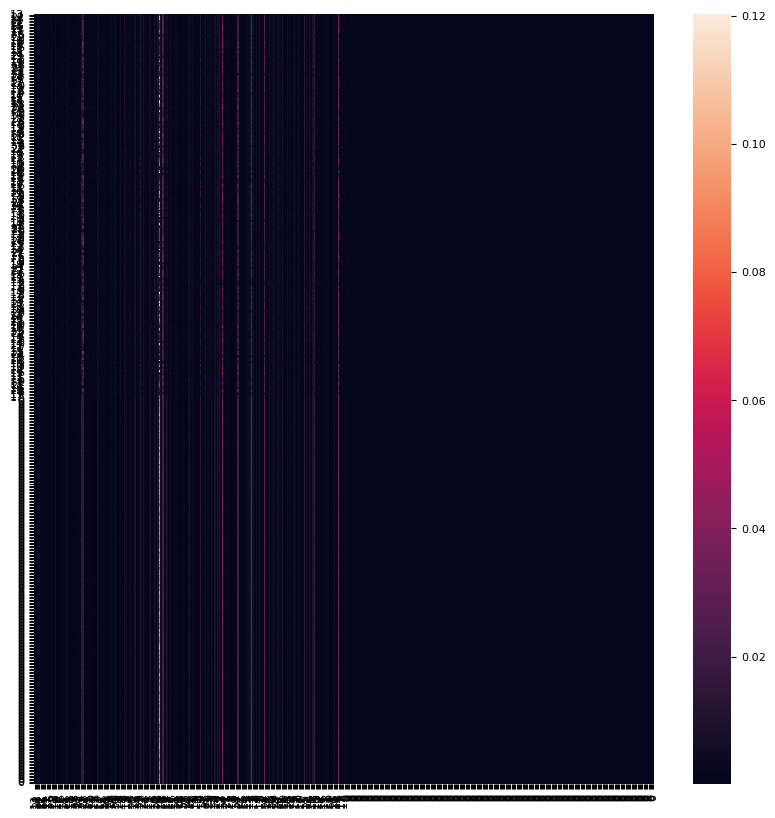

(512, 3)


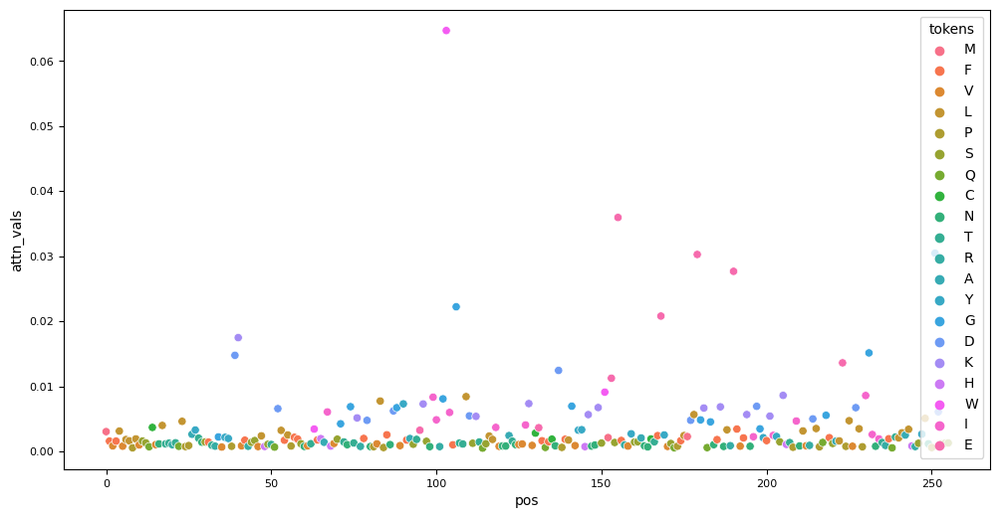

In [81]:
sample_seq = sequence[0].unsqueeze(0)
sample_label = label[0].unsqueeze(0)
print(f"sample_seq {sample_seq.shape} = {sample_seq}")
print(f"sample_label {sample_label.shape} = {sample_label}")
print(f"sample_pred {sample_label.shape} = {sample_pred}")

sample_pred = torch.argmax(F.softmax(nlp_model(sample_seq), dim=1), dim=1)
mean_attn_values = compute_mean_attn_values()
print("mean_attn_values", mean_attn_values.shape)

plot_mean_attention_values(mean_attn_values, seq=sample_seq)
plot_mean_of_mean_attention_values(mean_attn_values, seq=sample_seq)

sample_seq torch.Size([1, 512]) = tensor([[13, 14, 22, 14, 11, 22, 11, 11, 15, 11, 22, 17, 17,  6,  5, 22,  3, 11,
         19, 19,  2, 19,  6, 11, 15, 15,  1, 21, 19,  3, 17, 14, 19,  2,  8, 22,
         21, 21, 15,  4, 12, 22, 14,  2, 17, 17, 22, 11,  9, 17, 19,  6,  4, 11,
         14, 11, 15, 14, 14, 17,  3, 22, 19, 20, 14,  9,  1, 10,  9, 22, 17,  8,
         19,  3,  8, 19, 12,  2, 14,  4,  3, 15, 22, 11, 15, 14,  3,  4,  8, 22,
         21, 14,  1, 17, 19,  7, 12, 17,  3, 10, 10,  2,  8, 20, 10, 14,  8, 19,
         19, 11,  4, 17, 12, 19,  6, 17, 11, 11, 10, 22,  3,  3,  1, 19,  3, 22,
         22, 10, 12, 22,  5,  7, 14,  6, 14,  5,  3,  4, 15, 14, 11,  8, 22, 21,
         21,  9, 12,  3,  3, 12, 17, 20, 13,  7, 17,  7, 14,  2, 22, 21, 17, 17,
          1,  3,  3,  5, 19, 14,  7, 21, 22, 17,  6, 15, 14, 11, 13,  4, 11,  7,
          8, 12,  6,  8,  3, 14, 12,  3, 11,  2,  7, 14, 22, 14, 12,  3, 10,  4,
          8, 21, 14, 12, 10, 21, 17, 12,  9, 19, 15, 10,  3, 11, 22,  2,  4

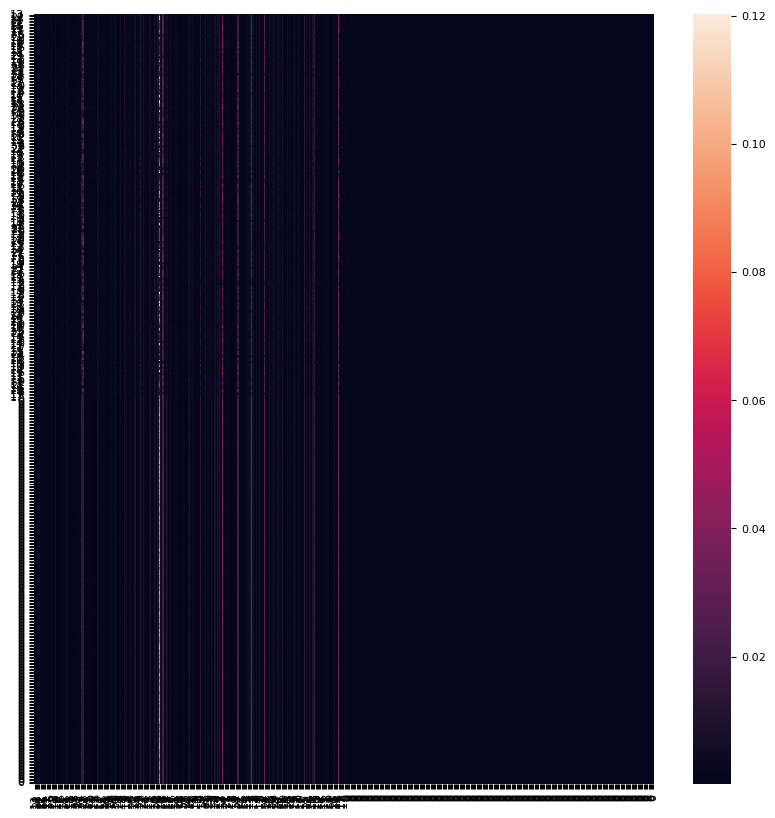

  tokens  attn_vals  pos
0      M   0.003050    0
1      F   0.001588    1
2      V   0.000858    2
3      F   0.001587    3
4      L   0.003130    4


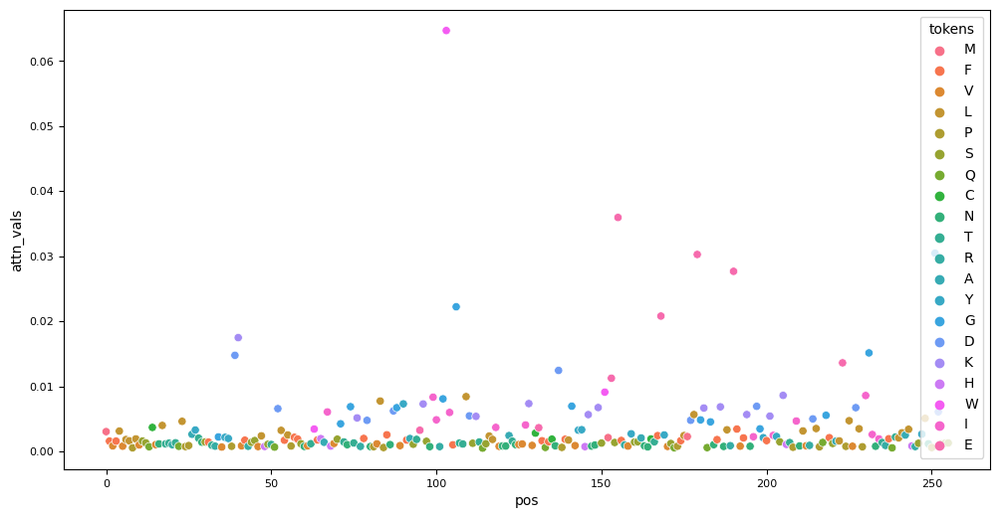

In [76]:
sample_seq = sequence[1].unsqueeze(0)
sample_label = label[1].unsqueeze(0)
print(f"sample_seq {sample_seq.shape} = {sample_seq}")
print(f"sample_label {sample_label.shape} = {sample_label}")
print(f"sample_pred {sample_label.shape} = {sample_pred}")

sample_pred = torch.argmax(F.softmax(nlp_model(sample_seq), dim=1), dim=1)
mean_attn_values = compute_mean_attn_values()
plot_mean_attention_values(mean_attn_values, seq=sample_seq)
plot_mean_of_mean_attention_values(mean_attn_values, seq=sample_seq)